## Bidirectional LSTM model na predikciu hodnot DST o 3 hodiny dopredu na zaklade 24-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+3_24H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-27 06:30:33.008010: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 3
y_col = f"DST+{shift}"

n_input = 24
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  24


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 24, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 24, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 24, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 24, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 24)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              25 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,418 (1.26 MB)

 Trainable params: 331,418 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42:46 7s/step - loss: 0.8892 - mae: 0.7720

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.7633 - mae: 0.6948

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.7010 - mae: 0.6591

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.6525 - mae: 0.6292

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.7566 - mae: 0.6301

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.8059 - mae: 0.6284

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.8243 - mae: 0.6218

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.8285 - mae: 0.6152

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.8253 - mae: 0.6087

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.8206 - mae: 0.6043

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.8156 - mae: 0.6005

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.8078 - mae: 0.5962

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.7981 - mae: 0.5913

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.7873 - mae: 0.5860

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.7757 - mae: 0.5804

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.7644 - mae: 0.5752

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.7527 - mae: 0.5696

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.7412 - mae: 0.5642

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.7299 - mae: 0.5591

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.7191 - mae: 0.5544

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.7089 - mae: 0.5501

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.6990 - mae: 0.5458

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.6897 - mae: 0.5420

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.6812 - mae: 0.5387

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.6729 - mae: 0.5354

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.6647 - mae: 0.5320

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.6566 - mae: 0.5287

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.6487 - mae: 0.5253

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.6410 - mae: 0.5219

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.6337 - mae: 0.5187

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.6267 - mae: 0.5156

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.6212 - mae: 0.5129

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.6160 - mae: 0.5104

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.6110 - mae: 0.5079

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.6060 - mae: 0.5056

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.6018 - mae: 0.5035

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.5979 - mae: 0.5016

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.5939 - mae: 0.4996

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.5900 - mae: 0.4976

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.5864 - mae: 0.4959

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.5831 - mae: 0.4942

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.5798 - mae: 0.4926

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.5764 - mae: 0.4909

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.5731 - mae: 0.4893

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.5699 - mae: 0.4878

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.5666 - mae: 0.4862

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.5634 - mae: 0.4847

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.5604 - mae: 0.4833

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.5573 - mae: 0.4819

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.5543 - mae: 0.4804

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.5512 - mae: 0.4790

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.5483 - mae: 0.4777

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.5455 - mae: 0.4764

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.5427 - mae: 0.4751

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.5399 - mae: 0.4738

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.5371 - mae: 0.4725

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.5343 - mae: 0.4713

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.5316 - mae: 0.4700

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.5290 - mae: 0.4688

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.5266 - mae: 0.4677

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.5241 - mae: 0.4667

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.5217 - mae: 0.4656

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.5193 - mae: 0.4645

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.5169 - mae: 0.4634

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.5146 - mae: 0.4624

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.5123 - mae: 0.4614

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.5100 - mae: 0.4604

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 135ms/step - loss: 0.5079 - mae: 0.4594

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.5058 - mae: 0.4585

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.5037 - mae: 0.4575

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.5017 - mae: 0.4566

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.4997 - mae: 0.4558

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.4977 - mae: 0.4549

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.4958 - mae: 0.4540

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.4938 - mae: 0.4532

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.4920 - mae: 0.4524

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.4902 - mae: 0.4516

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.4884 - mae: 0.4508

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.4867 - mae: 0.4500

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.4851 - mae: 0.4493

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.4834 - mae: 0.4486

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.4818 - mae: 0.4479

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.4802 - mae: 0.4472

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.4787 - mae: 0.4466

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.4771 - mae: 0.4459

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.4757 - mae: 0.4453

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.4744 - mae: 0.4447

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.4732 - mae: 0.4441

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.4720 - mae: 0.4436

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.4708 - mae: 0.4431

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.4697 - mae: 0.4426

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.4686 - mae: 0.4421

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.4676 - mae: 0.4417

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.4665 - mae: 0.4413

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.4655 - mae: 0.4408

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.4645 - mae: 0.4404

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.4635 - mae: 0.4400

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.4625 - mae: 0.4396

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.4616 - mae: 0.4392

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.4607 - mae: 0.4389

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 136ms/step - loss: 0.4598 - mae: 0.4385

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.4589 - mae: 0.4382

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.4581 - mae: 0.4378

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.4573 - mae: 0.4375

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.4564 - mae: 0.4371

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.4556 - mae: 0.4368

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.4548 - mae: 0.4365

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.4541 - mae: 0.4362

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4533 - mae: 0.4358

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4525 - mae: 0.4355

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4517 - mae: 0.4352

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4509 - mae: 0.4349

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4501 - mae: 0.4346

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4494 - mae: 0.4342

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4486 - mae: 0.4339

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4478 - mae: 0.4336

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4471 - mae: 0.4333

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4463 - mae: 0.4330

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4456 - mae: 0.4327

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4448 - mae: 0.4323

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4440 - mae: 0.4320

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4433 - mae: 0.4317

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4425 - mae: 0.4314

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4418 - mae: 0.4311

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4410 - mae: 0.4308

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4407 - mae: 0.4305

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4404 - mae: 0.4303

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4401 - mae: 0.4300

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4398 - mae: 0.4298

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4395 - mae: 0.4296

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4392 - mae: 0.4293

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4389 - mae: 0.4291

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4386 - mae: 0.4289

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4384 - mae: 0.4287

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4381 - mae: 0.4285

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4378 - mae: 0.4282

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4375 - mae: 0.4280

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4372 - mae: 0.4278

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4369 - mae: 0.4276

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 136ms/step - loss: 0.4366 - mae: 0.4274

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 136ms/step - loss: 0.4363 - mae: 0.4272

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 136ms/step - loss: 0.4360 - mae: 0.4270

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 136ms/step - loss: 0.4357 - mae: 0.4268

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 136ms/step - loss: 0.4354 - mae: 0.4265

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 136ms/step - loss: 0.4352 - mae: 0.4264

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 136ms/step - loss: 0.4349 - mae: 0.4262

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 136ms/step - loss: 0.4346 - mae: 0.4260

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 136ms/step - loss: 0.4343 - mae: 0.4258

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 136ms/step - loss: 0.4340 - mae: 0.4256

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 136ms/step - loss: 0.4337 - mae: 0.4254

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 136ms/step - loss: 0.4334 - mae: 0.4252

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 136ms/step - loss: 0.4331 - mae: 0.4250

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 136ms/step - loss: 0.4328 - mae: 0.4248

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.4325 - mae: 0.4246

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.4322 - mae: 0.4245

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.4319 - mae: 0.4243

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.4316 - mae: 0.4241

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.4313 - mae: 0.4239

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.4310 - mae: 0.4237

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 136ms/step - loss: 0.4307 - mae: 0.4235

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 136ms/step - loss: 0.4304 - mae: 0.4233

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 136ms/step - loss: 0.4301 - mae: 0.4232

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 136ms/step - loss: 0.4298 - mae: 0.4230

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 136ms/step - loss: 0.4295 - mae: 0.4228

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 136ms/step - loss: 0.4292 - mae: 0.4226

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 136ms/step - loss: 0.4289 - mae: 0.4224

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 136ms/step - loss: 0.4286 - mae: 0.4222

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 136ms/step - loss: 0.4283 - mae: 0.4220

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 136ms/step - loss: 0.4279 - mae: 0.4219

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 136ms/step - loss: 0.4276 - mae: 0.4217

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 136ms/step - loss: 0.4273 - mae: 0.4215

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 136ms/step - loss: 0.4270 - mae: 0.4213

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 136ms/step - loss: 0.4266 - mae: 0.4211

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 136ms/step - loss: 0.4263 - mae: 0.4209

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.4260 - mae: 0.4207

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.4256 - mae: 0.4205

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.4253 - mae: 0.4204

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.4250 - mae: 0.4202

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.4248 - mae: 0.4200

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.4245 - mae: 0.4199

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 136ms/step - loss: 0.4242 - mae: 0.4197

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 136ms/step - loss: 0.4240 - mae: 0.4195

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.4237 - mae: 0.4194

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 136ms/step - loss: 0.4234 - mae: 0.4192

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.4232 - mae: 0.4190

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.4229 - mae: 0.4189

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.4226 - mae: 0.4187

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.4224 - mae: 0.4186

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.4221 - mae: 0.4184

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.4218 - mae: 0.4183

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.4215 - mae: 0.4181

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.4213 - mae: 0.4180

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.4210 - mae: 0.4178

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.4207 - mae: 0.4177

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.4205 - mae: 0.4175

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.4202 - mae: 0.4174

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.4200 - mae: 0.4172

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.4197 - mae: 0.4171

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.4194 - mae: 0.4169

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.4191 - mae: 0.4168

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.4189 - mae: 0.4167

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.4186 - mae: 0.4165

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.4183 - mae: 0.4164

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.4180 - mae: 0.4162

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.4178 - mae: 0.4161

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 135ms/step - loss: 0.4175 - mae: 0.4159

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.4172 - mae: 0.4158

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.4169 - mae: 0.4156

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.4166 - mae: 0.4155

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.4163 - mae: 0.4153

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.4161 - mae: 0.4152

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.4158 - mae: 0.4150

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.4155 - mae: 0.4149

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 135ms/step - loss: 0.4152 - mae: 0.4147

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.4149 - mae: 0.4146

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.4146 - mae: 0.4144

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.4143 - mae: 0.4143

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.4140 - mae: 0.4141

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.4137 - mae: 0.4140

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.4134 - mae: 0.4138

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 135ms/step - loss: 0.4131 - mae: 0.4137

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.4129 - mae: 0.4135

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.4126 - mae: 0.4134

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.4123 - mae: 0.4132

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.4120 - mae: 0.4131

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.4117 - mae: 0.4129

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.4114 - mae: 0.4128

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.4111 - mae: 0.4126

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 135ms/step - loss: 0.4108 - mae: 0.4125

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.4105 - mae: 0.4123

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.4103 - mae: 0.4122

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.4100 - mae: 0.4120

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.4098 - mae: 0.4119

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.4095 - mae: 0.4118

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.4093 - mae: 0.4116

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 135ms/step - loss: 0.4090 - mae: 0.4115

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.4088 - mae: 0.4113

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.4085 - mae: 0.4112

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.4082 - mae: 0.4111

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.4080 - mae: 0.4109

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.4077 - mae: 0.4108

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.4075 - mae: 0.4106

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 135ms/step - loss: 0.4072 - mae: 0.4105

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.4070 - mae: 0.4103

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.4067 - mae: 0.4102

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.4064 - mae: 0.4101

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.4062 - mae: 0.4099

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.4059 - mae: 0.4098

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.4057 - mae: 0.4097

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 135ms/step - loss: 0.4055 - mae: 0.4095

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.4052 - mae: 0.4094

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.4050 - mae: 0.4093

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.4047 - mae: 0.4091

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.4045 - mae: 0.4090

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.4042 - mae: 0.4089

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.4040 - mae: 0.4087

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 135ms/step - loss: 0.4038 - mae: 0.4086

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.4035 - mae: 0.4085

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.4033 - mae: 0.4083

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.4030 - mae: 0.4082

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.4028 - mae: 0.4081

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.4026 - mae: 0.4080

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.4023 - mae: 0.4078

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 135ms/step - loss: 0.4021 - mae: 0.4077

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 135ms/step - loss: 0.4019 - mae: 0.4076

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 135ms/step - loss: 0.4017 - mae: 0.4075

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 135ms/step - loss: 0.4014 - mae: 0.4073

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 135ms/step - loss: 0.4012 - mae: 0.4072

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 135ms/step - loss: 0.4010 - mae: 0.4071

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 135ms/step - loss: 0.4008 - mae: 0.4070

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 135ms/step - loss: 0.4006 - mae: 0.4069

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 135ms/step - loss: 0.4004 - mae: 0.4067

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 135ms/step - loss: 0.4002 - mae: 0.4066

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.4000 - mae: 0.4065

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.3998 - mae: 0.4064

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.3996 - mae: 0.4063

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.3993 - mae: 0.4062

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.3991 - mae: 0.4061

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3989 - mae: 0.4059

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3987 - mae: 0.4058

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3985 - mae: 0.4057

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3983 - mae: 0.4056

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3981 - mae: 0.4055

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3979 - mae: 0.4054

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.3977 - mae: 0.4053

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.3975 - mae: 0.4052

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.3973 - mae: 0.4050

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.3971 - mae: 0.4049

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.3969 - mae: 0.4048

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.3966 - mae: 0.4047

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.3964 - mae: 0.4046

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.3962 - mae: 0.4045

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.3960 - mae: 0.4044

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.3958 - mae: 0.4043

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.3956 - mae: 0.4042

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.3954 - mae: 0.4041

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.3952 - mae: 0.4040

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.3950 - mae: 0.4039

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 134ms/step - loss: 0.3948 - mae: 0.4038

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.3946 - mae: 0.4036

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.3944 - mae: 0.4035

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.3942 - mae: 0.4034

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.3940 - mae: 0.4033

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.3938 - mae: 0.4032

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.3936 - mae: 0.4031

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.3934 - mae: 0.4030

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 134ms/step - loss: 0.3932 - mae: 0.4029

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.3930 - mae: 0.4028

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.3927 - mae: 0.4027

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.3925 - mae: 0.4026

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.3923 - mae: 0.4025

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.3921 - mae: 0.4024

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.3919 - mae: 0.4022

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 134ms/step - loss: 0.3917 - mae: 0.4021

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.3915 - mae: 0.4020

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.3913 - mae: 0.4019

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.3911 - mae: 0.4018

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.3909 - mae: 0.4017

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.3907 - mae: 0.4016

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.3905 - mae: 0.4015

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.3903 - mae: 0.4014

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.3900 - mae: 0.4013

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.3898 - mae: 0.4012

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.3896 - mae: 0.4011

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.3894 - mae: 0.4009

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.3892 - mae: 0.4008

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.3890 - mae: 0.4007

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.3888 - mae: 0.4006

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.3886 - mae: 0.4005

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.3884 - mae: 0.4004

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.3882 - mae: 0.4003

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.3880 - mae: 0.4002

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.3878 - mae: 0.4001

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.3876 - mae: 0.4000

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.3874 - mae: 0.3999

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.3872 - mae: 0.3998

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.3870 - mae: 0.3997

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.3868 - mae: 0.3996

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.3866 - mae: 0.3995

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.3864 - mae: 0.3994

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.3862 - mae: 0.3993

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.3860 - mae: 0.3992

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.3858 - mae: 0.3991

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.3856 - mae: 0.3990

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.3854 - mae: 0.3989

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.3852 - mae: 0.3987

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.3850 - mae: 0.3986

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.3848 - mae: 0.3985

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.3846 - mae: 0.3984

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.3844 - mae: 0.3983

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.3842 - mae: 0.3982

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.3840 - mae: 0.3981

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.3838 - mae: 0.3980

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.3836 - mae: 0.3979

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.3834 - mae: 0.3978

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.3832 - mae: 0.3977

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.3830 - mae: 0.3976

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.3828 - mae: 0.3975

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.3826 - mae: 0.3974

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.3824 - mae: 0.3973

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.3822 - mae: 0.3972

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.3820 - mae: 0.3971

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.3818 - mae: 0.3970

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 134ms/step - loss: 0.3816 - mae: 0.3969

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.3814 - mae: 0.3968

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.3812 - mae: 0.3967

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.3810 - mae: 0.3966

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.3808 - mae: 0.3965

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.3807 - mae: 0.3964

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.3805 - mae: 0.3963

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.3803 - mae: 0.3962

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 134ms/step - loss: 0.3801 - mae: 0.3961

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.3799 - mae: 0.3960

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.3797 - mae: 0.3959

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.3795 - mae: 0.3958

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.3793 - mae: 0.3957

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.3791 - mae: 0.3956

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.3789 - mae: 0.3955

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 134ms/step - loss: 0.3787 - mae: 0.3954

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.3785 - mae: 0.3953

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.3783 - mae: 0.3952

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.3781 - mae: 0.3951

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.3779 - mae: 0.3950

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.3777 - mae: 0.3949

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.3775 - mae: 0.3948

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.3773 - mae: 0.3947

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.3771 - mae: 0.3946

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.3769 - mae: 0.3945

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.3767 - mae: 0.3944

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.3765 - mae: 0.3943

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.3763 - mae: 0.3942

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.3762 - mae: 0.3941

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.3760 - mae: 0.3940

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 134ms/step - loss: 0.3758 - mae: 0.3939

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.3756 - mae: 0.3938

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 134ms/step - loss: 0.3754 - mae: 0.3937

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.3752 - mae: 0.3936

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.3750 - mae: 0.3935

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.3748 - mae: 0.3934

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.3747 - mae: 0.3933

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.3745 - mae: 0.3932

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.3743 - mae: 0.3931

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.3741 - mae: 0.3930

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.3739 - mae: 0.3929

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.3738 - mae: 0.3929

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.3736 - mae: 0.3928

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.3734 - mae: 0.3927

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.3732 - mae: 0.3926

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.3731 - mae: 0.3925

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.3729 - mae: 0.3924

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.3727 - mae: 0.3923

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.3726 - mae: 0.3922

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.3724 - mae: 0.3921

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.3722 - mae: 0.3920

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.3720 - mae: 0.3919

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 133ms/step - loss: 0.3719 - mae: 0.3919

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.3717 - mae: 0.3918

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.3715 - mae: 0.3917

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.3713 - mae: 0.3916

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.3712 - mae: 0.3915

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.3710 - mae: 0.3914

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.3708 - mae: 0.3913

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 133ms/step - loss: 0.3706 - mae: 0.3912

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.3705 - mae: 0.3911

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.3703 - mae: 0.3910

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.3701 - mae: 0.3910

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.3700 - mae: 0.3909

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.3698 - mae: 0.3908

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.3696 - mae: 0.3907

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.3694 - mae: 0.3906

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - loss: 0.3693 - mae: 0.3905

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.3691 - mae: 0.3904

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.3689 - mae: 0.3903

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.3688 - mae: 0.3902

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.3686 - mae: 0.3902

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.3684 - mae: 0.3901

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.3683 - mae: 0.3900

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 133ms/step - loss: 0.3681 - mae: 0.3899

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.3680 - mae: 0.3898

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.3678 - mae: 0.3897

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.3676 - mae: 0.3896

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.3675 - mae: 0.3896

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.3673 - mae: 0.3895

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.3672 - mae: 0.3894

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 133ms/step - loss: 0.3670 - mae: 0.3893

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.3669 - mae: 0.3892 

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.3667 - mae: 0.3891

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.3666 - mae: 0.3891

449/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.3664 - mae: 0.3890

450/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.3663 - mae: 0.3889

451/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.3661 - mae: 0.3888

452/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.3660 - mae: 0.3888

453/896 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - loss: 0.3659 - mae: 0.3887

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.3657 - mae: 0.3886

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.3656 - mae: 0.3885

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.3654 - mae: 0.3885

457/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.3653 - mae: 0.3884

458/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.3652 - mae: 0.3883

459/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.3650 - mae: 0.3882

460/896 ━━━━━━━━━━━━━━━━━━━━ 58s 133ms/step - loss: 0.3649 - mae: 0.3882

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.3647 - mae: 0.3881

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.3646 - mae: 0.3880

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.3645 - mae: 0.3879

464/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.3643 - mae: 0.3879

465/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.3642 - mae: 0.3878

466/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.3641 - mae: 0.3877

467/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.3639 - mae: 0.3876

468/896 ━━━━━━━━━━━━━━━━━━━━ 57s 133ms/step - loss: 0.3638 - mae: 0.3876

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.3636 - mae: 0.3875

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.3635 - mae: 0.3874

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.3634 - mae: 0.3874

472/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.3632 - mae: 0.3873

473/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.3631 - mae: 0.3872

474/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.3630 - mae: 0.3871

475/896 ━━━━━━━━━━━━━━━━━━━━ 56s 133ms/step - loss: 0.3628 - mae: 0.3871

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.3627 - mae: 0.3870

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.3625 - mae: 0.3869

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.3624 - mae: 0.3869

479/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.3623 - mae: 0.3868

480/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.3621 - mae: 0.3867

481/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.3620 - mae: 0.3866

482/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.3619 - mae: 0.3866

483/896 ━━━━━━━━━━━━━━━━━━━━ 55s 133ms/step - loss: 0.3617 - mae: 0.3865

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.3616 - mae: 0.3864

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.3614 - mae: 0.3864

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.3613 - mae: 0.3863

487/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.3612 - mae: 0.3862

488/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.3610 - mae: 0.3862

489/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.3609 - mae: 0.3861

490/896 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - loss: 0.3608 - mae: 0.3860

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.3606 - mae: 0.3859

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.3605 - mae: 0.3859

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.3604 - mae: 0.3858

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.3602 - mae: 0.3857

495/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.3601 - mae: 0.3857

496/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.3600 - mae: 0.3856

497/896 ━━━━━━━━━━━━━━━━━━━━ 53s 133ms/step - loss: 0.3598 - mae: 0.3855

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.3597 - mae: 0.3855

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.3596 - mae: 0.3854

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.3594 - mae: 0.3853

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.3593 - mae: 0.3852

502/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.3592 - mae: 0.3852

503/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.3590 - mae: 0.3851

504/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.3589 - mae: 0.3850

505/896 ━━━━━━━━━━━━━━━━━━━━ 52s 133ms/step - loss: 0.3588 - mae: 0.3850

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.3587 - mae: 0.3849

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.3585 - mae: 0.3848

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.3584 - mae: 0.3848

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.3583 - mae: 0.3847

510/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.3582 - mae: 0.3846

511/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.3581 - mae: 0.3846

512/896 ━━━━━━━━━━━━━━━━━━━━ 51s 133ms/step - loss: 0.3579 - mae: 0.3845

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.3578 - mae: 0.3845

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.3577 - mae: 0.3844

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.3576 - mae: 0.3843

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.3575 - mae: 0.3843

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.3574 - mae: 0.3842

518/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.3573 - mae: 0.3841

519/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.3571 - mae: 0.3841

520/896 ━━━━━━━━━━━━━━━━━━━━ 50s 133ms/step - loss: 0.3570 - mae: 0.3840

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.3569 - mae: 0.3840

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.3568 - mae: 0.3839

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.3567 - mae: 0.3838

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.3566 - mae: 0.3838

525/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.3565 - mae: 0.3837

526/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.3564 - mae: 0.3837

527/896 ━━━━━━━━━━━━━━━━━━━━ 49s 133ms/step - loss: 0.3563 - mae: 0.3836

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.3562 - mae: 0.3835

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.3561 - mae: 0.3835

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.3560 - mae: 0.3834

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.3559 - mae: 0.3834

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.3558 - mae: 0.3833

533/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.3557 - mae: 0.3833

534/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.3556 - mae: 0.3832

535/896 ━━━━━━━━━━━━━━━━━━━━ 48s 133ms/step - loss: 0.3555 - mae: 0.3832

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.3554 - mae: 0.3831

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.3553 - mae: 0.3830

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.3552 - mae: 0.3830

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.3551 - mae: 0.3829

540/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.3550 - mae: 0.3829

541/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.3549 - mae: 0.3828

542/896 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - loss: 0.3548 - mae: 0.3828

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.3547 - mae: 0.3827

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.3546 - mae: 0.3827

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.3545 - mae: 0.3826

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.3544 - mae: 0.3825

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.3543 - mae: 0.3825

548/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.3542 - mae: 0.3824

549/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.3541 - mae: 0.3824

550/896 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - loss: 0.3540 - mae: 0.3823

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.3539 - mae: 0.3823

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.3538 - mae: 0.3822

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.3537 - mae: 0.3822

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.3536 - mae: 0.3821

555/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.3535 - mae: 0.3821

556/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.3534 - mae: 0.3820

557/896 ━━━━━━━━━━━━━━━━━━━━ 45s 133ms/step - loss: 0.3533 - mae: 0.3819

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.3532 - mae: 0.3819

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.3531 - mae: 0.3818

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.3530 - mae: 0.3818

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.3529 - mae: 0.3817

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.3528 - mae: 0.3817

563/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.3527 - mae: 0.3816

564/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.3526 - mae: 0.3816

565/896 ━━━━━━━━━━━━━━━━━━━━ 44s 133ms/step - loss: 0.3525 - mae: 0.3815

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.3524 - mae: 0.3815

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.3523 - mae: 0.3814

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.3522 - mae: 0.3813

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.3521 - mae: 0.3813

570/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.3520 - mae: 0.3812

571/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.3519 - mae: 0.3812

572/896 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - loss: 0.3518 - mae: 0.3811

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.3517 - mae: 0.3811

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.3516 - mae: 0.3810

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.3515 - mae: 0.3810

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.3514 - mae: 0.3809

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.3514 - mae: 0.3809

578/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.3513 - mae: 0.3808

579/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.3512 - mae: 0.3808

580/896 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - loss: 0.3511 - mae: 0.3807

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.3510 - mae: 0.3807

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.3509 - mae: 0.3806

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.3508 - mae: 0.3806

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.3507 - mae: 0.3805

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.3506 - mae: 0.3804

586/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.3505 - mae: 0.3804

587/896 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - loss: 0.3504 - mae: 0.3803

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.3503 - mae: 0.3803

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.3502 - mae: 0.3802

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.3501 - mae: 0.3802

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.3500 - mae: 0.3801

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.3499 - mae: 0.3801

593/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.3499 - mae: 0.3800

594/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.3498 - mae: 0.3800

595/896 ━━━━━━━━━━━━━━━━━━━━ 40s 133ms/step - loss: 0.3497 - mae: 0.3799

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.3496 - mae: 0.3799

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.3495 - mae: 0.3798

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.3494 - mae: 0.3798

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.3493 - mae: 0.3797

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.3492 - mae: 0.3797

601/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.3491 - mae: 0.3796

602/896 ━━━━━━━━━━━━━━━━━━━━ 39s 133ms/step - loss: 0.3490 - mae: 0.3796

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.3489 - mae: 0.3795

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.3488 - mae: 0.3795

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.3488 - mae: 0.3794

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.3487 - mae: 0.3794

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.3486 - mae: 0.3793

608/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.3485 - mae: 0.3793

609/896 ━━━━━━━━━━━━━━━━━━━━ 38s 133ms/step - loss: 0.3484 - mae: 0.3792

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.3483 - mae: 0.3792

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.3482 - mae: 0.3791

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.3482 - mae: 0.3791

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.3481 - mae: 0.3790

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.3480 - mae: 0.3790

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.3479 - mae: 0.3789

616/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.3478 - mae: 0.3789

617/896 ━━━━━━━━━━━━━━━━━━━━ 37s 133ms/step - loss: 0.3478 - mae: 0.3788

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.3477 - mae: 0.3788

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.3476 - mae: 0.3787

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.3475 - mae: 0.3787

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.3474 - mae: 0.3787

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.3474 - mae: 0.3786

623/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.3473 - mae: 0.3786

624/896 ━━━━━━━━━━━━━━━━━━━━ 36s 133ms/step - loss: 0.3472 - mae: 0.3785

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.3471 - mae: 0.3785

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.3471 - mae: 0.3784

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.3470 - mae: 0.3784

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.3469 - mae: 0.3783

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.3468 - mae: 0.3783

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.3467 - mae: 0.3782

631/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.3467 - mae: 0.3782

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.3466 - mae: 0.3781

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.3465 - mae: 0.3781

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.3464 - mae: 0.3780

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.3463 - mae: 0.3780

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.3463 - mae: 0.3780

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.3462 - mae: 0.3779

638/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.3461 - mae: 0.3779

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.3460 - mae: 0.3778

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.3459 - mae: 0.3778

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.3459 - mae: 0.3777

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.3458 - mae: 0.3777

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.3457 - mae: 0.3776

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.3456 - mae: 0.3776

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.3455 - mae: 0.3775

646/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.3455 - mae: 0.3775

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.3454 - mae: 0.3774

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.3453 - mae: 0.3774

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.3452 - mae: 0.3774

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.3452 - mae: 0.3773

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.3451 - mae: 0.3773

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.3450 - mae: 0.3772

653/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.3449 - mae: 0.3772

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.3449 - mae: 0.3771

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.3448 - mae: 0.3771

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.3447 - mae: 0.3770

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.3446 - mae: 0.3770

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.3445 - mae: 0.3769

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.3445 - mae: 0.3769

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.3444 - mae: 0.3769

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.3443 - mae: 0.3768

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.3442 - mae: 0.3768

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.3442 - mae: 0.3767

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.3441 - mae: 0.3767

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.3440 - mae: 0.3766

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.3439 - mae: 0.3766

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.3438 - mae: 0.3765

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.3438 - mae: 0.3765

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.3437 - mae: 0.3764

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.3436 - mae: 0.3764

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.3435 - mae: 0.3763

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.3435 - mae: 0.3763

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.3434 - mae: 0.3763

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.3433 - mae: 0.3762

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.3432 - mae: 0.3762

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.3431 - mae: 0.3761

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.3431 - mae: 0.3761

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.3430 - mae: 0.3760

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.3429 - mae: 0.3760

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.3428 - mae: 0.3759

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.3427 - mae: 0.3759

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.3427 - mae: 0.3759

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.3426 - mae: 0.3758

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.3425 - mae: 0.3758

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.3424 - mae: 0.3757

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.3424 - mae: 0.3757

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.3423 - mae: 0.3756

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.3422 - mae: 0.3756

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.3421 - mae: 0.3755

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.3420 - mae: 0.3755

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.3420 - mae: 0.3754

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.3419 - mae: 0.3754

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.3418 - mae: 0.3754

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.3417 - mae: 0.3753

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.3417 - mae: 0.3753

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.3416 - mae: 0.3752

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.3415 - mae: 0.3752

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.3414 - mae: 0.3751

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.3414 - mae: 0.3751

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.3413 - mae: 0.3751

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.3412 - mae: 0.3750

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.3411 - mae: 0.3750

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.3411 - mae: 0.3749

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.3410 - mae: 0.3749

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.3409 - mae: 0.3748

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.3408 - mae: 0.3748

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.3408 - mae: 0.3748

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.3407 - mae: 0.3747

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.3406 - mae: 0.3747

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.3406 - mae: 0.3746

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.3405 - mae: 0.3746

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.3404 - mae: 0.3745

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.3403 - mae: 0.3745

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.3403 - mae: 0.3745

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.3402 - mae: 0.3744

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.3401 - mae: 0.3744

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.3401 - mae: 0.3743

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.3400 - mae: 0.3743

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.3399 - mae: 0.3743

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.3399 - mae: 0.3742

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.3398 - mae: 0.3742

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.3397 - mae: 0.3741

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.3396 - mae: 0.3741

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.3396 - mae: 0.3740

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.3395 - mae: 0.3740

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.3394 - mae: 0.3740

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.3394 - mae: 0.3739

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.3393 - mae: 0.3739

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.3392 - mae: 0.3738

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.3392 - mae: 0.3738

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.3391 - mae: 0.3738

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.3390 - mae: 0.3737

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.3390 - mae: 0.3737

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.3389 - mae: 0.3736

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.3388 - mae: 0.3736

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.3388 - mae: 0.3736

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.3387 - mae: 0.3735

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.3386 - mae: 0.3735

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.3386 - mae: 0.3734

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.3385 - mae: 0.3734

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.3384 - mae: 0.3734

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.3384 - mae: 0.3733

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.3383 - mae: 0.3733

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.3383 - mae: 0.3733

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.3382 - mae: 0.3732

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.3381 - mae: 0.3732

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.3381 - mae: 0.3731

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.3380 - mae: 0.3731

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.3379 - mae: 0.3731

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.3379 - mae: 0.3730

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.3378 - mae: 0.3730

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.3378 - mae: 0.3730

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.3377 - mae: 0.3729

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.3376 - mae: 0.3729

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.3376 - mae: 0.3728

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.3375 - mae: 0.3728

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.3374 - mae: 0.3728

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.3374 - mae: 0.3727

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.3373 - mae: 0.3727

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.3373 - mae: 0.3726

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.3372 - mae: 0.3726

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.3371 - mae: 0.3726

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.3371 - mae: 0.3725

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.3370 - mae: 0.3725

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.3369 - mae: 0.3725

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.3369 - mae: 0.3724

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.3368 - mae: 0.3724

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.3367 - mae: 0.3723

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.3367 - mae: 0.3723

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.3366 - mae: 0.3723

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.3366 - mae: 0.3722

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.3365 - mae: 0.3722

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.3364 - mae: 0.3721

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.3364 - mae: 0.3721

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.3363 - mae: 0.3721

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.3362 - mae: 0.3720

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.3362 - mae: 0.3720

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.3361 - mae: 0.3720

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.3360 - mae: 0.3719

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.3360 - mae: 0.3719

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.3359 - mae: 0.3718

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.3358 - mae: 0.3718

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.3358 - mae: 0.3718

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.3357 - mae: 0.3717

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.3357 - mae: 0.3717

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.3356 - mae: 0.3716

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.3355 - mae: 0.3716

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.3355 - mae: 0.3716

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.3354 - mae: 0.3715

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3353 - mae: 0.3715

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3353 - mae: 0.3714

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3352 - mae: 0.3714

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3351 - mae: 0.3714

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3351 - mae: 0.3713

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3350 - mae: 0.3713

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3349 - mae: 0.3713

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.3349 - mae: 0.3712

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.3348 - mae: 0.3712

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.3347 - mae: 0.3711

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.3347 - mae: 0.3711

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.3346 - mae: 0.3711

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.3345 - mae: 0.3710

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.3345 - mae: 0.3710

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.3344 - mae: 0.3709

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.3343 - mae: 0.3709

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.3343 - mae: 0.3709

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.3342 - mae: 0.3708

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.3342 - mae: 0.3708

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.3341 - mae: 0.3707

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.3340 - mae: 0.3707

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.3340 - mae: 0.3707

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.3339 - mae: 0.3706

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.3338 - mae: 0.3706

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.3338 - mae: 0.3706

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.3337 - mae: 0.3705

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.3336 - mae: 0.3705

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.3336 - mae: 0.3704

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.3335 - mae: 0.3704

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.3335 - mae: 0.3704

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.3334 - mae: 0.3703 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.3333 - mae: 0.3703

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.3333 - mae: 0.3703

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.3332 - mae: 0.3702

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.3331 - mae: 0.3702

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.3331 - mae: 0.3701

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.3330 - mae: 0.3701

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.3330 - mae: 0.3701

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.3329 - mae: 0.3700

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.3328 - mae: 0.3700

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.3328 - mae: 0.3700

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.3327 - mae: 0.3699

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.3327 - mae: 0.3699

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.3326 - mae: 0.3699

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.3325 - mae: 0.3698

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.3325 - mae: 0.3698

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.3324 - mae: 0.3697

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.3323 - mae: 0.3697

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.3323 - mae: 0.3697

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.3322 - mae: 0.3696

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.3322 - mae: 0.3696

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.3321 - mae: 0.3696

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.3320 - mae: 0.3695

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.3320 - mae: 0.3695

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.3319 - mae: 0.3694

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.3319 - mae: 0.3694

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.3318 - mae: 0.3694

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.3317 - mae: 0.3693

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.3317 - mae: 0.3693

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.3316 - mae: 0.3693

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.3316 - mae: 0.3692

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.3315 - mae: 0.3692

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.3314 - mae: 0.3692

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.3314 - mae: 0.3691

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.3313 - mae: 0.3691

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.3312 - mae: 0.3690

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.3312 - mae: 0.3690

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.3311 - mae: 0.3690

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.3311 - mae: 0.3689

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.3310 - mae: 0.3689

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.3309 - mae: 0.3689

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.3309 - mae: 0.3688

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.3308 - mae: 0.3688

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.3308 - mae: 0.3688

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.3307 - mae: 0.3687

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - loss: 0.3306 - mae: 0.3687

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.3306 - mae: 0.3686

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.3305 - mae: 0.3686

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.3305 - mae: 0.3686

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.3304 - mae: 0.3685

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.3303 - mae: 0.3685

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.3303 - mae: 0.3685

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.3302 - mae: 0.3684

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - loss: 0.3302 - mae: 0.3684

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.3301 - mae: 0.3684

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.3300 - mae: 0.3683

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.3300 - mae: 0.3683

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.3299 - mae: 0.3682

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.3298 - mae: 0.3682

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.3298 - mae: 0.3682

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 132ms/step - loss: 0.3297 - mae: 0.3681

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.3297 - mae: 0.3681

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.3296 - mae: 0.3681

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.3295 - mae: 0.3680

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.3295 - mae: 0.3680

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.3294 - mae: 0.3680

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.3294 - mae: 0.3679

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.3293 - mae: 0.3679

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.3292 - mae: 0.3678

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.3292 - mae: 0.3678

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.3291 - mae: 0.3678

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.3291 - mae: 0.3677

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.3290 - mae: 0.3677

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.3289 - mae: 0.3677

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.3289 - mae: 0.3676

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.3288 - mae: 0.3676

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.3288 - mae: 0.3676


Epoch 1: val_mae improved from inf to 0.33407, saving model to models/DST+3_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 136s 145ms/step - loss: 0.3287 - mae: 0.3675 - val_loss: 0.3133 - val_mae: 0.3341


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.4465 - mae: 0.3702

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.3645 - mae: 0.3383

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.3176 - mae: 0.3226

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2919 - mae: 0.3170

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2804 - mae: 0.3165

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2841 - mae: 0.3202

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2842 - mae: 0.3223

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2819 - mae: 0.3230

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2784 - mae: 0.3228

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2752 - mae: 0.3225

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2717 - mae: 0.3219

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2682 - mae: 0.3210

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2645 - mae: 0.3200

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2606 - mae: 0.3185

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2575 - mae: 0.3175

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2545 - mae: 0.3165

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2518 - mae: 0.3157

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2492 - mae: 0.3148

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2473 - mae: 0.3142

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2455 - mae: 0.3137

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2439 - mae: 0.3133

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2422 - mae: 0.3128

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2413 - mae: 0.3128

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2403 - mae: 0.3128

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2394 - mae: 0.3127

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2388 - mae: 0.3128

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2381 - mae: 0.3128

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2374 - mae: 0.3128

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2369 - mae: 0.3127

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2365 - mae: 0.3128

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2360 - mae: 0.3127

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2354 - mae: 0.3127

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2348 - mae: 0.3125

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2341 - mae: 0.3124

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2336 - mae: 0.3123

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2330 - mae: 0.3122

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2324 - mae: 0.3121

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2319 - mae: 0.3120

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2314 - mae: 0.3119

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2308 - mae: 0.3118

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2303 - mae: 0.3117

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2297 - mae: 0.3115

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2292 - mae: 0.3113

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2286 - mae: 0.3111

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2279 - mae: 0.3109

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2273 - mae: 0.3106

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2266 - mae: 0.3103

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2260 - mae: 0.3100

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2254 - mae: 0.3098

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2248 - mae: 0.3095

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2242 - mae: 0.3093

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2236 - mae: 0.3090

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2230 - mae: 0.3087

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2224 - mae: 0.3084

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2217 - mae: 0.3080

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2211 - mae: 0.3078

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2206 - mae: 0.3075

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2200 - mae: 0.3072

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2195 - mae: 0.3070

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2190 - mae: 0.3068

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2185 - mae: 0.3065

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2180 - mae: 0.3063

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2175 - mae: 0.3060

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2170 - mae: 0.3058

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2165 - mae: 0.3055

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2161 - mae: 0.3053

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2156 - mae: 0.3051

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2152 - mae: 0.3049

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2148 - mae: 0.3047

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2144 - mae: 0.3045

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2139 - mae: 0.3043

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2135 - mae: 0.3041

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2131 - mae: 0.3038

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2127 - mae: 0.3036

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2122 - mae: 0.3034

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2118 - mae: 0.3032

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2114 - mae: 0.3030

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2110 - mae: 0.3028

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2106 - mae: 0.3026

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2102 - mae: 0.3024

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2098 - mae: 0.3022

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2094 - mae: 0.3020

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2090 - mae: 0.3018

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2086 - mae: 0.3015

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2082 - mae: 0.3013

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2078 - mae: 0.3011

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2074 - mae: 0.3009

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2071 - mae: 0.3007

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2067 - mae: 0.3005

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2063 - mae: 0.3003

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2059 - mae: 0.3001

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2056 - mae: 0.3000

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2053 - mae: 0.2998

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2049 - mae: 0.2996

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2046 - mae: 0.2995

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2044 - mae: 0.2993

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2041 - mae: 0.2992

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2038 - mae: 0.2990

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2035 - mae: 0.2989

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2032 - mae: 0.2987

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2030 - mae: 0.2986

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2027 - mae: 0.2985

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2024 - mae: 0.2983

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2022 - mae: 0.2982

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2020 - mae: 0.2981

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2018 - mae: 0.2980

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2017 - mae: 0.2979

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2015 - mae: 0.2978

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2016 - mae: 0.2977

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2018 - mae: 0.2977

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2019 - mae: 0.2976

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2020 - mae: 0.2975

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2021 - mae: 0.2975

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2022 - mae: 0.2974

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2023 - mae: 0.2974

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2024 - mae: 0.2973

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2026 - mae: 0.2973

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2028 - mae: 0.2973

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2029 - mae: 0.2972

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2031 - mae: 0.2972

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2033 - mae: 0.2972

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2035 - mae: 0.2972

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2036 - mae: 0.2971

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2038 - mae: 0.2971

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2039 - mae: 0.2971

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2041 - mae: 0.2971

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2043 - mae: 0.2971

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2044 - mae: 0.2971

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2046 - mae: 0.2971

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2048 - mae: 0.2972

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2050 - mae: 0.2972

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2052 - mae: 0.2972

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2055 - mae: 0.2973

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2057 - mae: 0.2973

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2060 - mae: 0.2974

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2063 - mae: 0.2974

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2065 - mae: 0.2975

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2068 - mae: 0.2976

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2071 - mae: 0.2976

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2074 - mae: 0.2977

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2077 - mae: 0.2978

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2079 - mae: 0.2978

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2082 - mae: 0.2979

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.2084 - mae: 0.2980

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2087 - mae: 0.2980

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2089 - mae: 0.2981

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2091 - mae: 0.2982

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2094 - mae: 0.2982

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2096 - mae: 0.2983

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2098 - mae: 0.2984

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2101 - mae: 0.2985

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2103 - mae: 0.2985

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.2105 - mae: 0.2986

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2107 - mae: 0.2987

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2109 - mae: 0.2987

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2111 - mae: 0.2988

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2113 - mae: 0.2988

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2115 - mae: 0.2989

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2117 - mae: 0.2990

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2119 - mae: 0.2990

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.2121 - mae: 0.2991

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2123 - mae: 0.2992

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2124 - mae: 0.2992

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2126 - mae: 0.2993

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2128 - mae: 0.2994

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2130 - mae: 0.2994

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2132 - mae: 0.2995

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.2134 - mae: 0.2996

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2136 - mae: 0.2996

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2138 - mae: 0.2997

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2140 - mae: 0.2998

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2141 - mae: 0.2998

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2143 - mae: 0.2999

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.2145 - mae: 0.2999

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.2146 - mae: 0.3000

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.2148 - mae: 0.3000

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.2149 - mae: 0.3001

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2151 - mae: 0.3001

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2152 - mae: 0.3002

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2153 - mae: 0.3002

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2154 - mae: 0.3003

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2156 - mae: 0.3003

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2157 - mae: 0.3004

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2158 - mae: 0.3004

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2159 - mae: 0.3005

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2160 - mae: 0.3005

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2161 - mae: 0.3006

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2162 - mae: 0.3006

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.2163 - mae: 0.3006

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2164 - mae: 0.3007

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2165 - mae: 0.3007

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2166 - mae: 0.3007

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2167 - mae: 0.3008

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2168 - mae: 0.3008

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2169 - mae: 0.3008

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.2169 - mae: 0.3009

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2170 - mae: 0.3009

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2171 - mae: 0.3009

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2172 - mae: 0.3009

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2172 - mae: 0.3010

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2173 - mae: 0.3010

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2174 - mae: 0.3010

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2174 - mae: 0.3010

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.2175 - mae: 0.3011

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2175 - mae: 0.3011

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2176 - mae: 0.3011

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2176 - mae: 0.3011

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2177 - mae: 0.3012

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2177 - mae: 0.3012

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2178 - mae: 0.3012

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 134ms/step - loss: 0.2178 - mae: 0.3012

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2179 - mae: 0.3012

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2179 - mae: 0.3012

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2180 - mae: 0.3013

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2180 - mae: 0.3013

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2180 - mae: 0.3013

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2181 - mae: 0.3013

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 134ms/step - loss: 0.2181 - mae: 0.3013

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.2181 - mae: 0.3013

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.2182 - mae: 0.3013

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.2182 - mae: 0.3014

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.2183 - mae: 0.3014

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.2183 - mae: 0.3014

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.2183 - mae: 0.3014

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 134ms/step - loss: 0.2184 - mae: 0.3014

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 134ms/step - loss: 0.2184 - mae: 0.3014

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 134ms/step - loss: 0.2185 - mae: 0.3015

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 134ms/step - loss: 0.2185 - mae: 0.3015

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 134ms/step - loss: 0.2185 - mae: 0.3015

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 134ms/step - loss: 0.2186 - mae: 0.3015

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 134ms/step - loss: 0.2186 - mae: 0.3015

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 134ms/step - loss: 0.2187 - mae: 0.3015

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 134ms/step - loss: 0.2187 - mae: 0.3016

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.2187 - mae: 0.3016

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.2188 - mae: 0.3016

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.2188 - mae: 0.3016

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.2188 - mae: 0.3016

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.2189 - mae: 0.3016

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.2189 - mae: 0.3017

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 134ms/step - loss: 0.2189 - mae: 0.3017

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.2190 - mae: 0.3017

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.2190 - mae: 0.3017

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.2190 - mae: 0.3017

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.2190 - mae: 0.3017

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.2191 - mae: 0.3017

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.2191 - mae: 0.3017

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 134ms/step - loss: 0.2191 - mae: 0.3017

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.2191 - mae: 0.3017

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.2191 - mae: 0.3018

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.2192 - mae: 0.3018

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.2192 - mae: 0.3018

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.2192 - mae: 0.3018

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.2192 - mae: 0.3018

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 134ms/step - loss: 0.2192 - mae: 0.3018

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.2192 - mae: 0.3018

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.2192 - mae: 0.3018

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.2192 - mae: 0.3018

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.2193 - mae: 0.3018

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.2193 - mae: 0.3018

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.2193 - mae: 0.3018

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 134ms/step - loss: 0.2193 - mae: 0.3018

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.2193 - mae: 0.3018

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.2193 - mae: 0.3018

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.2193 - mae: 0.3018

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.2193 - mae: 0.3018

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.2193 - mae: 0.3018

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.2193 - mae: 0.3018

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 134ms/step - loss: 0.2193 - mae: 0.3018

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.2193 - mae: 0.3018

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.2193 - mae: 0.3018

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.2193 - mae: 0.3018

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.2193 - mae: 0.3018

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.2193 - mae: 0.3018

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.2193 - mae: 0.3018

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 134ms/step - loss: 0.2193 - mae: 0.3018

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.2193 - mae: 0.3019

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.2193 - mae: 0.3019

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.2193 - mae: 0.3019

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.2194 - mae: 0.3019

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.2194 - mae: 0.3019

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.2194 - mae: 0.3019

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 134ms/step - loss: 0.2194 - mae: 0.3019

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.2194 - mae: 0.3019

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.2194 - mae: 0.3019

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.2194 - mae: 0.3019

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.2194 - mae: 0.3019

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 134ms/step - loss: 0.2195 - mae: 0.3020

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2195 - mae: 0.3020

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 133ms/step - loss: 0.2195 - mae: 0.3020

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2195 - mae: 0.3020

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2195 - mae: 0.3020

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2195 - mae: 0.3020

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2196 - mae: 0.3020

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2196 - mae: 0.3021

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2196 - mae: 0.3021

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 133ms/step - loss: 0.2197 - mae: 0.3021

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2197 - mae: 0.3021

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2197 - mae: 0.3021

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2198 - mae: 0.3022

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2198 - mae: 0.3022

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2198 - mae: 0.3022

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2198 - mae: 0.3022

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 133ms/step - loss: 0.2199 - mae: 0.3022

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2199 - mae: 0.3022

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2199 - mae: 0.3023

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2200 - mae: 0.3023

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2200 - mae: 0.3023

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2200 - mae: 0.3023

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2200 - mae: 0.3023

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 133ms/step - loss: 0.2201 - mae: 0.3023

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2201 - mae: 0.3024

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2201 - mae: 0.3024

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2201 - mae: 0.3024

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2202 - mae: 0.3024

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2202 - mae: 0.3024

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2202 - mae: 0.3024

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 133ms/step - loss: 0.2202 - mae: 0.3025

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2202 - mae: 0.3025

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2203 - mae: 0.3025

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2203 - mae: 0.3025

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2203 - mae: 0.3025

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2203 - mae: 0.3025

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2203 - mae: 0.3026

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 133ms/step - loss: 0.2204 - mae: 0.3026

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2204 - mae: 0.3026

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2204 - mae: 0.3026

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2204 - mae: 0.3026

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2204 - mae: 0.3026

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2205 - mae: 0.3027

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2205 - mae: 0.3027

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 133ms/step - loss: 0.2205 - mae: 0.3027

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2205 - mae: 0.3027

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2205 - mae: 0.3027

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2205 - mae: 0.3027

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2205 - mae: 0.3027

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2205 - mae: 0.3027

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2206 - mae: 0.3028

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2206 - mae: 0.3028

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 133ms/step - loss: 0.2206 - mae: 0.3028

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2206 - mae: 0.3028

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2206 - mae: 0.3028

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2206 - mae: 0.3028

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2206 - mae: 0.3028

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2206 - mae: 0.3028

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2206 - mae: 0.3028

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 133ms/step - loss: 0.2206 - mae: 0.3029

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2206 - mae: 0.3029

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2207 - mae: 0.3029

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2207 - mae: 0.3029

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2207 - mae: 0.3029

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2207 - mae: 0.3029

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2207 - mae: 0.3029

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.2207 - mae: 0.3029

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2207 - mae: 0.3029

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2207 - mae: 0.3029

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2207 - mae: 0.3030

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2207 - mae: 0.3030

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2207 - mae: 0.3030

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2207 - mae: 0.3030

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.2207 - mae: 0.3030

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2207 - mae: 0.3030

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2207 - mae: 0.3030

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2207 - mae: 0.3030

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2207 - mae: 0.3030

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2207 - mae: 0.3030

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.2207 - mae: 0.3030

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2207 - mae: 0.3030

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2207 - mae: 0.3030

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2207 - mae: 0.3030

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2207 - mae: 0.3031

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2207 - mae: 0.3031

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2207 - mae: 0.3031

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2207 - mae: 0.3031

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2207 - mae: 0.3031

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2206 - mae: 0.3031

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2206 - mae: 0.3031

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2206 - mae: 0.3031

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2206 - mae: 0.3031

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2206 - mae: 0.3031

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2206 - mae: 0.3031

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2206 - mae: 0.3031

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2206 - mae: 0.3031

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2206 - mae: 0.3031

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2206 - mae: 0.3031

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2205 - mae: 0.3031

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2205 - mae: 0.3031

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2205 - mae: 0.3031

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2205 - mae: 0.3031

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2205 - mae: 0.3031

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2205 - mae: 0.3031

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2205 - mae: 0.3031

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2204 - mae: 0.3031

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2204 - mae: 0.3031

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2204 - mae: 0.3031

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2204 - mae: 0.3031

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2204 - mae: 0.3031

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2204 - mae: 0.3031

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2204 - mae: 0.3031

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2204 - mae: 0.3031

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2204 - mae: 0.3031

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2204 - mae: 0.3031

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2204 - mae: 0.3031

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2204 - mae: 0.3031

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2204 - mae: 0.3031

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2203 - mae: 0.3031

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2203 - mae: 0.3031

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2203 - mae: 0.3031

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2203 - mae: 0.3031

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2203 - mae: 0.3031

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2203 - mae: 0.3031

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2203 - mae: 0.3031

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2203 - mae: 0.3031

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2203 - mae: 0.3031

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2203 - mae: 0.3031

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2203 - mae: 0.3031

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2203 - mae: 0.3031

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2202 - mae: 0.3031

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2202 - mae: 0.3031

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2202 - mae: 0.3031

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2202 - mae: 0.3031

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2202 - mae: 0.3031

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2202 - mae: 0.3031

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2202 - mae: 0.3031

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2202 - mae: 0.3031

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2202 - mae: 0.3031

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2202 - mae: 0.3031

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2201 - mae: 0.3031

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2201 - mae: 0.3031

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2201 - mae: 0.3031

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2201 - mae: 0.3031

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2201 - mae: 0.3031

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2201 - mae: 0.3031

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2201 - mae: 0.3031

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2201 - mae: 0.3031

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2201 - mae: 0.3031

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2201 - mae: 0.3031

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2200 - mae: 0.3031

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2200 - mae: 0.3031

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2200 - mae: 0.3031

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2200 - mae: 0.3031

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2200 - mae: 0.3031

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2200 - mae: 0.3031 

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2200 - mae: 0.3031

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2200 - mae: 0.3031

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2200 - mae: 0.3031

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2200 - mae: 0.3031

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2199 - mae: 0.3031

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2199 - mae: 0.3031

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2199 - mae: 0.3031

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2199 - mae: 0.3031

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2199 - mae: 0.3031

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2199 - mae: 0.3031

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2199 - mae: 0.3031

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2199 - mae: 0.3030

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2199 - mae: 0.3030

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2198 - mae: 0.3030

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2198 - mae: 0.3030

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2198 - mae: 0.3030

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2198 - mae: 0.3030

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2198 - mae: 0.3030

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2198 - mae: 0.3030

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2198 - mae: 0.3030

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2198 - mae: 0.3030

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2197 - mae: 0.3030

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2197 - mae: 0.3030

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2197 - mae: 0.3030

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2197 - mae: 0.3030

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2197 - mae: 0.3030

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2197 - mae: 0.3030

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2197 - mae: 0.3030

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2197 - mae: 0.3030

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2197 - mae: 0.3030

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2197 - mae: 0.3030

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2197 - mae: 0.3030

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2196 - mae: 0.3030

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2196 - mae: 0.3030

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2196 - mae: 0.3030

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2196 - mae: 0.3030

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2196 - mae: 0.3030

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2196 - mae: 0.3030

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2196 - mae: 0.3030

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2196 - mae: 0.3030

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2195 - mae: 0.3030

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2195 - mae: 0.3030

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2195 - mae: 0.3030

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2195 - mae: 0.3030

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2195 - mae: 0.3030

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2195 - mae: 0.3030

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2195 - mae: 0.3030

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2195 - mae: 0.3030

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2195 - mae: 0.3030

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2195 - mae: 0.3030

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2194 - mae: 0.3030

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2194 - mae: 0.3030

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2194 - mae: 0.3030

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2194 - mae: 0.3030

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2194 - mae: 0.3030

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2194 - mae: 0.3030

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2194 - mae: 0.3030

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2194 - mae: 0.3029

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2194 - mae: 0.3029

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2193 - mae: 0.3029

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2193 - mae: 0.3029

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2193 - mae: 0.3029

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2193 - mae: 0.3029

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2193 - mae: 0.3029

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2193 - mae: 0.3029

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2193 - mae: 0.3029

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2193 - mae: 0.3029

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2193 - mae: 0.3029

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2193 - mae: 0.3029

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2193 - mae: 0.3029

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2193 - mae: 0.3029

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2192 - mae: 0.3029

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2192 - mae: 0.3029

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2192 - mae: 0.3029

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2192 - mae: 0.3029

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2192 - mae: 0.3029

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2192 - mae: 0.3029

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2192 - mae: 0.3029

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2192 - mae: 0.3029

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2192 - mae: 0.3029

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2192 - mae: 0.3029

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2191 - mae: 0.3029

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2191 - mae: 0.3029

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2191 - mae: 0.3029

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2191 - mae: 0.3029

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2191 - mae: 0.3029

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2191 - mae: 0.3029

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2191 - mae: 0.3029

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2191 - mae: 0.3029

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2191 - mae: 0.3029

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2191 - mae: 0.3028

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2190 - mae: 0.3028

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2190 - mae: 0.3028

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2190 - mae: 0.3028

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2190 - mae: 0.3028

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2190 - mae: 0.3028

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2190 - mae: 0.3028

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2190 - mae: 0.3028

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2190 - mae: 0.3028

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2190 - mae: 0.3028

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2189 - mae: 0.3028

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2189 - mae: 0.3028

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2189 - mae: 0.3028

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2189 - mae: 0.3028

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2189 - mae: 0.3028

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2189 - mae: 0.3028

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2189 - mae: 0.3028

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2189 - mae: 0.3028

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2189 - mae: 0.3028

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2189 - mae: 0.3028

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2188 - mae: 0.3028

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2188 - mae: 0.3028

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2188 - mae: 0.3028

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2188 - mae: 0.3028

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2188 - mae: 0.3028

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2188 - mae: 0.3028

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2188 - mae: 0.3027

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2188 - mae: 0.3027

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2188 - mae: 0.3027

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2188 - mae: 0.3027

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2188 - mae: 0.3027

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2188 - mae: 0.3027

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2188 - mae: 0.3027

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2188 - mae: 0.3027

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2188 - mae: 0.3027

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2187 - mae: 0.3027

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2187 - mae: 0.3027

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2187 - mae: 0.3027

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2187 - mae: 0.3027

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2187 - mae: 0.3027

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2187 - mae: 0.3027

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2187 - mae: 0.3027

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2187 - mae: 0.3027

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2187 - mae: 0.3027

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2187 - mae: 0.3027

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2187 - mae: 0.3027

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2187 - mae: 0.3027

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2187 - mae: 0.3027

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2187 - mae: 0.3027

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2187 - mae: 0.3027

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2187 - mae: 0.3027

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2187 - mae: 0.3027

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2186 - mae: 0.3027

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2186 - mae: 0.3027

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2186 - mae: 0.3027

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2186 - mae: 0.3027

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2186 - mae: 0.3027

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2186 - mae: 0.3027

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2186 - mae: 0.3027

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2186 - mae: 0.3027

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2186 - mae: 0.3027

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2186 - mae: 0.3027

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2186 - mae: 0.3027

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2186 - mae: 0.3027

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2186 - mae: 0.3027

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2186 - mae: 0.3027

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2186 - mae: 0.3027

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2185 - mae: 0.3027

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2185 - mae: 0.3027

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2185 - mae: 0.3027

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2185 - mae: 0.3027

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2185 - mae: 0.3027

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2185 - mae: 0.3027

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2185 - mae: 0.3027

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2185 - mae: 0.3027

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2185 - mae: 0.3026

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2185 - mae: 0.3026

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2185 - mae: 0.3026

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2185 - mae: 0.3026

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2184 - mae: 0.3026

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2184 - mae: 0.3026

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2184 - mae: 0.3026

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2184 - mae: 0.3026

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2184 - mae: 0.3026

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2184 - mae: 0.3026

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2184 - mae: 0.3026

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2184 - mae: 0.3026

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2184 - mae: 0.3026

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2184 - mae: 0.3026

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2184 - mae: 0.3026

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2184 - mae: 0.3026

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2184 - mae: 0.3026

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2184 - mae: 0.3026

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2184 - mae: 0.3026

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2184 - mae: 0.3026

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2184 - mae: 0.3026

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2184 - mae: 0.3026

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2184 - mae: 0.3026

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2184 - mae: 0.3026

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2184 - mae: 0.3026

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2184 - mae: 0.3026

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2184 - mae: 0.3026

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2184 - mae: 0.3026

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2184 - mae: 0.3026

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2183 - mae: 0.3026

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2183 - mae: 0.3026

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2183 - mae: 0.3026

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2183 - mae: 0.3026

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2183 - mae: 0.3026

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2183 - mae: 0.3026

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2183 - mae: 0.3026

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2183 - mae: 0.3026

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2183 - mae: 0.3026

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2183 - mae: 0.3026

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2183 - mae: 0.3026

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2183 - mae: 0.3026

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2183 - mae: 0.3026

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2183 - mae: 0.3026

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2183 - mae: 0.3026

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2183 - mae: 0.3026

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2183 - mae: 0.3026

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2183 - mae: 0.3026

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2183 - mae: 0.3026

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2183 - mae: 0.3026

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2183 - mae: 0.3026

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2182 - mae: 0.3026

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2182 - mae: 0.3026

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2182 - mae: 0.3025

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2182 - mae: 0.3025

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2182 - mae: 0.3025

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2182 - mae: 0.3025

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2182 - mae: 0.3025

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2182 - mae: 0.3025

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2182 - mae: 0.3025

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2182 - mae: 0.3025

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2182 - mae: 0.3025

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2182 - mae: 0.3025

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2182 - mae: 0.3025

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2182 - mae: 0.3025

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2182 - mae: 0.3025

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2182 - mae: 0.3025

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2181 - mae: 0.3025

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2181 - mae: 0.3025

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2181 - mae: 0.3025

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2181 - mae: 0.3025

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2181 - mae: 0.3025

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2181 - mae: 0.3025

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2181 - mae: 0.3025

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2181 - mae: 0.3025

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2181 - mae: 0.3025

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2181 - mae: 0.3025

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2181 - mae: 0.3025

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2181 - mae: 0.3025

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2180 - mae: 0.3025

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2180 - mae: 0.3025

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2180 - mae: 0.3025

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2180 - mae: 0.3024

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2180 - mae: 0.3024

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2180 - mae: 0.3024

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2180 - mae: 0.3024

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2180 - mae: 0.3024

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2180 - mae: 0.3024

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2180 - mae: 0.3024

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2180 - mae: 0.3024

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2179 - mae: 0.3024

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2179 - mae: 0.3024

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2179 - mae: 0.3024

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2179 - mae: 0.3024

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2179 - mae: 0.3024

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2179 - mae: 0.3024

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2179 - mae: 0.3024

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2179 - mae: 0.3024

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2179 - mae: 0.3024

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2179 - mae: 0.3024

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2178 - mae: 0.3024

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2178 - mae: 0.3024

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2178 - mae: 0.3023

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2178 - mae: 0.3023

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2178 - mae: 0.3023

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2178 - mae: 0.3023

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2178 - mae: 0.3023

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2178 - mae: 0.3023

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2178 - mae: 0.3023

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2177 - mae: 0.3023

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2177 - mae: 0.3023

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2177 - mae: 0.3023

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2177 - mae: 0.3023

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2177 - mae: 0.3023

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2177 - mae: 0.3023

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2177 - mae: 0.3023

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2177 - mae: 0.3023

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2177 - mae: 0.3023

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2177 - mae: 0.3023

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2177 - mae: 0.3023

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2176 - mae: 0.3023

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2176 - mae: 0.3023

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2176 - mae: 0.3023

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2176 - mae: 0.3022

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2176 - mae: 0.3022

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2176 - mae: 0.3022

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2176 - mae: 0.3022

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2176 - mae: 0.3022

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2176 - mae: 0.3022

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2176 - mae: 0.3022

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2176 - mae: 0.3022

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2175 - mae: 0.3022

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2175 - mae: 0.3022

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2175 - mae: 0.3022

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2175 - mae: 0.3022

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2175 - mae: 0.3022

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2175 - mae: 0.3022

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2175 - mae: 0.3022

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2175 - mae: 0.3022

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2175 - mae: 0.3022

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2175 - mae: 0.3022

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2175 - mae: 0.3022

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2174 - mae: 0.3022

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2174 - mae: 0.3022

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2174 - mae: 0.3022

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2174 - mae: 0.3022

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2174 - mae: 0.3022

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2174 - mae: 0.3022

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2174 - mae: 0.3022

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2174 - mae: 0.3022

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2174 - mae: 0.3021

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2174 - mae: 0.3021

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2174 - mae: 0.3021

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2174 - mae: 0.3021

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2174 - mae: 0.3021

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2174 - mae: 0.3021

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2174 - mae: 0.3021

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2173 - mae: 0.3021

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2173 - mae: 0.3021

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2173 - mae: 0.3021

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2173 - mae: 0.3021

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2173 - mae: 0.3021

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2173 - mae: 0.3021

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2173 - mae: 0.3021

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2173 - mae: 0.3021

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2173 - mae: 0.3021

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2173 - mae: 0.3021

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2173 - mae: 0.3021

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2173 - mae: 0.3021

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2173 - mae: 0.3021

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2173 - mae: 0.3021

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2173 - mae: 0.3021

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2173 - mae: 0.3021

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2173 - mae: 0.3021

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2172 - mae: 0.3021

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2172 - mae: 0.3021

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2172 - mae: 0.3021

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2172 - mae: 0.3021

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2172 - mae: 0.3021

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2172 - mae: 0.3021

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2172 - mae: 0.3021

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2172 - mae: 0.3021

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2172 - mae: 0.3021

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2172 - mae: 0.3021

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2172 - mae: 0.3021

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2172 - mae: 0.3021

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2172 - mae: 0.3021

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2172 - mae: 0.3021

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2172 - mae: 0.3020

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2172 - mae: 0.3020

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2172 - mae: 0.3020

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2172 - mae: 0.3020

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2171 - mae: 0.3020

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2171 - mae: 0.3020

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2171 - mae: 0.3020

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2171 - mae: 0.3020

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2171 - mae: 0.3020

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2171 - mae: 0.3020

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2171 - mae: 0.3020

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2171 - mae: 0.3020

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2171 - mae: 0.3020

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2171 - mae: 0.3020

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2171 - mae: 0.3020

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2171 - mae: 0.3020

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2171 - mae: 0.3020

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2171 - mae: 0.3020

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2171 - mae: 0.3020

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2170 - mae: 0.3020

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2170 - mae: 0.3020

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2170 - mae: 0.3020

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2170 - mae: 0.3020

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2170 - mae: 0.3020

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2170 - mae: 0.3020 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2170 - mae: 0.3020

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2170 - mae: 0.3020

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2170 - mae: 0.3020

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2170 - mae: 0.3020

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2170 - mae: 0.3019

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2170 - mae: 0.3019

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2170 - mae: 0.3019

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2170 - mae: 0.3019

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2170 - mae: 0.3019

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2169 - mae: 0.3019

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2169 - mae: 0.3019

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2169 - mae: 0.3019

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2169 - mae: 0.3019

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2169 - mae: 0.3019

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2169 - mae: 0.3019

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2169 - mae: 0.3019

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2169 - mae: 0.3019

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2169 - mae: 0.3019

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2169 - mae: 0.3019

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2169 - mae: 0.3019

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2169 - mae: 0.3019

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2169 - mae: 0.3019

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2169 - mae: 0.3019

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2169 - mae: 0.3019

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2169 - mae: 0.3019

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2169 - mae: 0.3019

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2168 - mae: 0.3019

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2168 - mae: 0.3019

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2168 - mae: 0.3019

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2168 - mae: 0.3019

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2168 - mae: 0.3019

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2168 - mae: 0.3019

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2168 - mae: 0.3019

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2168 - mae: 0.3018

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2168 - mae: 0.3018

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2168 - mae: 0.3018

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2168 - mae: 0.3018

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2168 - mae: 0.3018

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2168 - mae: 0.3018

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2168 - mae: 0.3018

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2168 - mae: 0.3018

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2168 - mae: 0.3018

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2167 - mae: 0.3018

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2167 - mae: 0.3018

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2167 - mae: 0.3018

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2167 - mae: 0.3018

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2167 - mae: 0.3018

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2167 - mae: 0.3018

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2167 - mae: 0.3018

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2167 - mae: 0.3018

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2167 - mae: 0.3018

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2167 - mae: 0.3018

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2167 - mae: 0.3018

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2167 - mae: 0.3018

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2167 - mae: 0.3018

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2167 - mae: 0.3018

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2167 - mae: 0.3018

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2166 - mae: 0.3018

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2166 - mae: 0.3017

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2166 - mae: 0.3017

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2166 - mae: 0.3017

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2166 - mae: 0.3017

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2166 - mae: 0.3017

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2166 - mae: 0.3017

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2166 - mae: 0.3017

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2166 - mae: 0.3017

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2166 - mae: 0.3017

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2166 - mae: 0.3017

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2166 - mae: 0.3017

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2166 - mae: 0.3017

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2166 - mae: 0.3017

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2165 - mae: 0.3017

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2165 - mae: 0.3017

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2165 - mae: 0.3017

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2165 - mae: 0.3017

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2165 - mae: 0.3017

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2165 - mae: 0.3017


Epoch 2: val_mae improved from 0.33407 to 0.32449, saving model to models/DST+3_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.2165 - mae: 0.3017 - val_loss: 0.2853 - val_mae: 0.3245


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.2365 - mae: 0.3529

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2059 - mae: 0.3188

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1904 - mae: 0.3019

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1775 - mae: 0.2897

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1715 - mae: 0.2844

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1669 - mae: 0.2803

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1640 - mae: 0.2779

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1617 - mae: 0.2760

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1589 - mae: 0.2736

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1569 - mae: 0.2715

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1561 - mae: 0.2701

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1552 - mae: 0.2688

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1551 - mae: 0.2680

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1550 - mae: 0.2675

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1547 - mae: 0.2669

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1541 - mae: 0.2660

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1535 - mae: 0.2652

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1526 - mae: 0.2643

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1517 - mae: 0.2634

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1507 - mae: 0.2625

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1498 - mae: 0.2617

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1496 - mae: 0.2613

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1492 - mae: 0.2608

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1489 - mae: 0.2605

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1486 - mae: 0.2602

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1483 - mae: 0.2599

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1479 - mae: 0.2595

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1475 - mae: 0.2592

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1471 - mae: 0.2589

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1467 - mae: 0.2587

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1464 - mae: 0.2585

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1461 - mae: 0.2583

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1458 - mae: 0.2580

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1457 - mae: 0.2580

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1456 - mae: 0.2579

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1458 - mae: 0.2579

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1460 - mae: 0.2579

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1462 - mae: 0.2580

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1463 - mae: 0.2580

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1464 - mae: 0.2579

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1467 - mae: 0.2580

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1472 - mae: 0.2582

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1479 - mae: 0.2585

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1485 - mae: 0.2587

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1490 - mae: 0.2589

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1495 - mae: 0.2591

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1500 - mae: 0.2593

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1503 - mae: 0.2595

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1507 - mae: 0.2596

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1510 - mae: 0.2597

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1513 - mae: 0.2598

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1516 - mae: 0.2600

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1521 - mae: 0.2602

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1525 - mae: 0.2604

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1529 - mae: 0.2605

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1533 - mae: 0.2607

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1536 - mae: 0.2609

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1540 - mae: 0.2610

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1543 - mae: 0.2612

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1546 - mae: 0.2613

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1548 - mae: 0.2615

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1551 - mae: 0.2616

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1553 - mae: 0.2618

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1556 - mae: 0.2619

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1559 - mae: 0.2621

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1562 - mae: 0.2622

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1565 - mae: 0.2624

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1567 - mae: 0.2625

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1570 - mae: 0.2626

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1572 - mae: 0.2627

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1574 - mae: 0.2628

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1576 - mae: 0.2629

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1577 - mae: 0.2630

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1579 - mae: 0.2631

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1581 - mae: 0.2632

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1582 - mae: 0.2633

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1583 - mae: 0.2633

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1584 - mae: 0.2634

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1585 - mae: 0.2635

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1587 - mae: 0.2636

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1588 - mae: 0.2636

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1589 - mae: 0.2637

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1592 - mae: 0.2638

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1594 - mae: 0.2640

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1597 - mae: 0.2641

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1599 - mae: 0.2642

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1602 - mae: 0.2644

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1604 - mae: 0.2645

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1607 - mae: 0.2647

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1609 - mae: 0.2649

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1612 - mae: 0.2650

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1614 - mae: 0.2652

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1616 - mae: 0.2653

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1618 - mae: 0.2654

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1620 - mae: 0.2656

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1622 - mae: 0.2657

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1624 - mae: 0.2658

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1625 - mae: 0.2659

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1627 - mae: 0.2660

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1628 - mae: 0.2661

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1630 - mae: 0.2662

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1631 - mae: 0.2663

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1633 - mae: 0.2664

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1634 - mae: 0.2665

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1635 - mae: 0.2666

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1636 - mae: 0.2667

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1637 - mae: 0.2667

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1639 - mae: 0.2669

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1641 - mae: 0.2670

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1643 - mae: 0.2671

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1645 - mae: 0.2672

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1647 - mae: 0.2673

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1649 - mae: 0.2674

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1651 - mae: 0.2676

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1653 - mae: 0.2677

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1655 - mae: 0.2678

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1657 - mae: 0.2679

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1659 - mae: 0.2680

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1660 - mae: 0.2681

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1662 - mae: 0.2682

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1664 - mae: 0.2683

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1665 - mae: 0.2684

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1667 - mae: 0.2685

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1668 - mae: 0.2686

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1669 - mae: 0.2687

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1671 - mae: 0.2688

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1672 - mae: 0.2689

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1674 - mae: 0.2690

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1675 - mae: 0.2691

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1676 - mae: 0.2692

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1678 - mae: 0.2692

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1679 - mae: 0.2693

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1680 - mae: 0.2694

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1682 - mae: 0.2695

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1683 - mae: 0.2696

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1685 - mae: 0.2697

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1686 - mae: 0.2698

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1687 - mae: 0.2698

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1689 - mae: 0.2699

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1690 - mae: 0.2700

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1691 - mae: 0.2701

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1693 - mae: 0.2702

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1694 - mae: 0.2703

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1695 - mae: 0.2704

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1696 - mae: 0.2705

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1698 - mae: 0.2705

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1700 - mae: 0.2706

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1701 - mae: 0.2707

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1703 - mae: 0.2708

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1704 - mae: 0.2709

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1706 - mae: 0.2710

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1707 - mae: 0.2711

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1709 - mae: 0.2712

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1710 - mae: 0.2713

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1711 - mae: 0.2713

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1713 - mae: 0.2714

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1714 - mae: 0.2715

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1715 - mae: 0.2716

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1716 - mae: 0.2716

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1718 - mae: 0.2717

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1719 - mae: 0.2718

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1720 - mae: 0.2718

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1721 - mae: 0.2719

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1722 - mae: 0.2720

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1724 - mae: 0.2721

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1726 - mae: 0.2721

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1727 - mae: 0.2722

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1728 - mae: 0.2723

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1730 - mae: 0.2723

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1731 - mae: 0.2724

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1733 - mae: 0.2725

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1734 - mae: 0.2725

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1735 - mae: 0.2726

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1737 - mae: 0.2727

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1738 - mae: 0.2727

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1739 - mae: 0.2728

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1740 - mae: 0.2728

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1741 - mae: 0.2729

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1742 - mae: 0.2730

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1744 - mae: 0.2730

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1745 - mae: 0.2731

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1746 - mae: 0.2731

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1747 - mae: 0.2732

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1748 - mae: 0.2732

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1750 - mae: 0.2733

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1751 - mae: 0.2734

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1752 - mae: 0.2734

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1753 - mae: 0.2735

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1754 - mae: 0.2735

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1755 - mae: 0.2736

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1756 - mae: 0.2737

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1757 - mae: 0.2737

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1758 - mae: 0.2738

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1759 - mae: 0.2738

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1760 - mae: 0.2739

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1761 - mae: 0.2739

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1762 - mae: 0.2740

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1763 - mae: 0.2740

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1764 - mae: 0.2741

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1765 - mae: 0.2741

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1766 - mae: 0.2741

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1766 - mae: 0.2742

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1767 - mae: 0.2742

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1768 - mae: 0.2743

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1769 - mae: 0.2743

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1769 - mae: 0.2744

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1770 - mae: 0.2744

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1771 - mae: 0.2744

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1771 - mae: 0.2745

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1772 - mae: 0.2745

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1773 - mae: 0.2745

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1773 - mae: 0.2746

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1774 - mae: 0.2746

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1774 - mae: 0.2747

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1775 - mae: 0.2747

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1776 - mae: 0.2747

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1776 - mae: 0.2748

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1777 - mae: 0.2748

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1777 - mae: 0.2748

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1778 - mae: 0.2749

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1778 - mae: 0.2749

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1779 - mae: 0.2749

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1779 - mae: 0.2750

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.1780 - mae: 0.2750

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1780 - mae: 0.2750

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1781 - mae: 0.2751

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1781 - mae: 0.2751

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1782 - mae: 0.2751

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1783 - mae: 0.2752

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1783 - mae: 0.2752

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.1784 - mae: 0.2753

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1785 - mae: 0.2753

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1786 - mae: 0.2753

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1786 - mae: 0.2754

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1787 - mae: 0.2754

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1788 - mae: 0.2755

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1789 - mae: 0.2755

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1789 - mae: 0.2756

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.1790 - mae: 0.2756

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1791 - mae: 0.2756

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1792 - mae: 0.2757

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1792 - mae: 0.2757

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1793 - mae: 0.2758

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1794 - mae: 0.2758

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1794 - mae: 0.2758

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.1795 - mae: 0.2759

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.1796 - mae: 0.2759

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.1796 - mae: 0.2760

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.1797 - mae: 0.2760

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.1798 - mae: 0.2761

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.1799 - mae: 0.2761

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.1799 - mae: 0.2761

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.1800 - mae: 0.2762

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.1801 - mae: 0.2762

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.1802 - mae: 0.2763

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.1803 - mae: 0.2763

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.1803 - mae: 0.2764

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.1804 - mae: 0.2764

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.1805 - mae: 0.2765

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.1806 - mae: 0.2765

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.1806 - mae: 0.2765

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.1807 - mae: 0.2766

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.1808 - mae: 0.2766

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.1808 - mae: 0.2767

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.1809 - mae: 0.2767

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.1810 - mae: 0.2767

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.1810 - mae: 0.2768

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.1811 - mae: 0.2768

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.1812 - mae: 0.2769

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.1813 - mae: 0.2769

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.1813 - mae: 0.2769

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.1814 - mae: 0.2770

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.1815 - mae: 0.2770

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.1815 - mae: 0.2771

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.1816 - mae: 0.2771

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.1817 - mae: 0.2771

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.1817 - mae: 0.2772

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.1818 - mae: 0.2772

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.1818 - mae: 0.2772

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.1819 - mae: 0.2773

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.1820 - mae: 0.2773

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.1820 - mae: 0.2773

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.1821 - mae: 0.2774

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.1821 - mae: 0.2774

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.1822 - mae: 0.2775

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.1822 - mae: 0.2775

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.1823 - mae: 0.2775

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.1823 - mae: 0.2776

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.1824 - mae: 0.2776

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.1824 - mae: 0.2776

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.1825 - mae: 0.2776

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.1825 - mae: 0.2777

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.1826 - mae: 0.2777

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.1826 - mae: 0.2777

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.1827 - mae: 0.2778

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.1827 - mae: 0.2778

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.1828 - mae: 0.2778

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.1828 - mae: 0.2779

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.1829 - mae: 0.2779

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.1829 - mae: 0.2779

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.1829 - mae: 0.2779

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.1830 - mae: 0.2780

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.1830 - mae: 0.2780

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.1831 - mae: 0.2780

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.1831 - mae: 0.2781

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.1831 - mae: 0.2781

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.1832 - mae: 0.2781

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.1832 - mae: 0.2781

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.1833 - mae: 0.2782

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.1833 - mae: 0.2782

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.1833 - mae: 0.2782

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.1834 - mae: 0.2782

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.1834 - mae: 0.2782

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.1834 - mae: 0.2783

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.1834 - mae: 0.2783

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.1835 - mae: 0.2783

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.1835 - mae: 0.2783

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.1835 - mae: 0.2784

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.1836 - mae: 0.2784

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.1836 - mae: 0.2784

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.1836 - mae: 0.2784

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.1836 - mae: 0.2784

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.1837 - mae: 0.2785

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.1837 - mae: 0.2785

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.1837 - mae: 0.2785

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.1837 - mae: 0.2785

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.1838 - mae: 0.2785

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.1838 - mae: 0.2786

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.1838 - mae: 0.2786

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.1838 - mae: 0.2786

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.1838 - mae: 0.2786

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.1839 - mae: 0.2786

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.1839 - mae: 0.2786

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.1839 - mae: 0.2787

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.1839 - mae: 0.2787

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.1839 - mae: 0.2787

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.1839 - mae: 0.2787

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.1840 - mae: 0.2787

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.1840 - mae: 0.2787

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.1840 - mae: 0.2787

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.1840 - mae: 0.2788

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.1840 - mae: 0.2788

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.1840 - mae: 0.2788

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.1841 - mae: 0.2788

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.1841 - mae: 0.2788

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.1841 - mae: 0.2788

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.1841 - mae: 0.2788

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.1841 - mae: 0.2789

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.1841 - mae: 0.2789

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.1842 - mae: 0.2789

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.1842 - mae: 0.2789

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.1842 - mae: 0.2789

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.1842 - mae: 0.2789

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.1842 - mae: 0.2789

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.1843 - mae: 0.2790

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.1843 - mae: 0.2790

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.1843 - mae: 0.2790

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.1843 - mae: 0.2790

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.1843 - mae: 0.2790

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.1844 - mae: 0.2790

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.1844 - mae: 0.2790

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.1844 - mae: 0.2791

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.1844 - mae: 0.2791

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.1844 - mae: 0.2791

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.1845 - mae: 0.2791

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.1845 - mae: 0.2791

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.1845 - mae: 0.2791

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.1845 - mae: 0.2791

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.1845 - mae: 0.2792

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.1845 - mae: 0.2792

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.1845 - mae: 0.2792

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.1846 - mae: 0.2792

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.1846 - mae: 0.2792

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.1846 - mae: 0.2792

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.1846 - mae: 0.2792

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.1846 - mae: 0.2792

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.1846 - mae: 0.2792

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.1846 - mae: 0.2793

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.1847 - mae: 0.2793

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.1847 - mae: 0.2793

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.1847 - mae: 0.2793

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.1847 - mae: 0.2793

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.1847 - mae: 0.2793

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.1847 - mae: 0.2793

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.1847 - mae: 0.2793

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.1847 - mae: 0.2793

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.1847 - mae: 0.2794

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.1847 - mae: 0.2794

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.1847 - mae: 0.2794

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.1848 - mae: 0.2794

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.1848 - mae: 0.2794

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.1848 - mae: 0.2794

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.1848 - mae: 0.2794

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.1848 - mae: 0.2794

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.1848 - mae: 0.2794

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.1848 - mae: 0.2794

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.1848 - mae: 0.2794

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.1848 - mae: 0.2794

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.1848 - mae: 0.2795

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.1848 - mae: 0.2795

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.1848 - mae: 0.2795

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.1848 - mae: 0.2795

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.1848 - mae: 0.2795

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.1849 - mae: 0.2795

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.1849 - mae: 0.2795

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.1849 - mae: 0.2795

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.1849 - mae: 0.2795

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.1849 - mae: 0.2795

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.1849 - mae: 0.2795

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.1849 - mae: 0.2795

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.1849 - mae: 0.2796

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.1849 - mae: 0.2796

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.1849 - mae: 0.2796

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.1849 - mae: 0.2796

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.1849 - mae: 0.2796

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.1850 - mae: 0.2796

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.1850 - mae: 0.2796

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.1850 - mae: 0.2796

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.1850 - mae: 0.2796

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.1850 - mae: 0.2796

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.1850 - mae: 0.2796

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.1850 - mae: 0.2796

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.1850 - mae: 0.2796

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.1850 - mae: 0.2796

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.1850 - mae: 0.2797

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.1850 - mae: 0.2797

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.1850 - mae: 0.2797

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.1850 - mae: 0.2797

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.1850 - mae: 0.2797

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.1850 - mae: 0.2797

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.1851 - mae: 0.2797

432/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.1851 - mae: 0.2797 

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.1851 - mae: 0.2797

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.1851 - mae: 0.2797

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.1851 - mae: 0.2797

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.1851 - mae: 0.2797

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.1851 - mae: 0.2798

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.1851 - mae: 0.2798

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.1851 - mae: 0.2798

440/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.1851 - mae: 0.2798

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.1851 - mae: 0.2798

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.1852 - mae: 0.2798

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.1852 - mae: 0.2798

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.1852 - mae: 0.2798

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.1852 - mae: 0.2798

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.1852 - mae: 0.2798

447/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.1852 - mae: 0.2798

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.1852 - mae: 0.2799

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.1852 - mae: 0.2799

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.1852 - mae: 0.2799

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.1853 - mae: 0.2799

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.1853 - mae: 0.2799

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.1853 - mae: 0.2799

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.1853 - mae: 0.2799

455/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.1853 - mae: 0.2799

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.1853 - mae: 0.2799

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.1853 - mae: 0.2799

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.1853 - mae: 0.2799

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.1853 - mae: 0.2800

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.1853 - mae: 0.2800

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.1853 - mae: 0.2800

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.1854 - mae: 0.2800

463/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.1854 - mae: 0.2800

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.1854 - mae: 0.2800

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.1854 - mae: 0.2800

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.1854 - mae: 0.2800

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.1854 - mae: 0.2800

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.1854 - mae: 0.2800

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.1854 - mae: 0.2800

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.1854 - mae: 0.2800

471/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.1854 - mae: 0.2801

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.1854 - mae: 0.2801

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.1854 - mae: 0.2801

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.1855 - mae: 0.2801

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.1855 - mae: 0.2801

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.1855 - mae: 0.2801

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.1855 - mae: 0.2801

478/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.1855 - mae: 0.2801

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.1855 - mae: 0.2801

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.1855 - mae: 0.2801

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.1855 - mae: 0.2801

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.1856 - mae: 0.2802

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.1856 - mae: 0.2802

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.1856 - mae: 0.2802

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.1856 - mae: 0.2802

486/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.1856 - mae: 0.2802

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.1856 - mae: 0.2802

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.1857 - mae: 0.2802

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.1857 - mae: 0.2802

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.1857 - mae: 0.2802

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.1857 - mae: 0.2802

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.1857 - mae: 0.2802

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.1857 - mae: 0.2803

494/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.1857 - mae: 0.2803

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.1858 - mae: 0.2803

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.1858 - mae: 0.2803

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.1858 - mae: 0.2803

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.1858 - mae: 0.2803

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.1858 - mae: 0.2803

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.1858 - mae: 0.2803

501/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.1858 - mae: 0.2803

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.1859 - mae: 0.2803

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.1859 - mae: 0.2803

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.1859 - mae: 0.2804

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.1859 - mae: 0.2804

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.1859 - mae: 0.2804

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.1859 - mae: 0.2804

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.1859 - mae: 0.2804

509/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.1860 - mae: 0.2804

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.1860 - mae: 0.2804

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.1860 - mae: 0.2804

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.1860 - mae: 0.2804

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.1860 - mae: 0.2804

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.1860 - mae: 0.2804

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.1860 - mae: 0.2805

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.1861 - mae: 0.2805

517/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.1861 - mae: 0.2805

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.1861 - mae: 0.2805

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.1861 - mae: 0.2805

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.1861 - mae: 0.2805

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.1861 - mae: 0.2805

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.1861 - mae: 0.2805

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.1861 - mae: 0.2805

524/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.1862 - mae: 0.2805

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.1862 - mae: 0.2805

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.1862 - mae: 0.2806

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.1862 - mae: 0.2806

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.1862 - mae: 0.2806

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.1862 - mae: 0.2806

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.1862 - mae: 0.2806

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.1862 - mae: 0.2806

532/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.1862 - mae: 0.2806

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.1863 - mae: 0.2806

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.1863 - mae: 0.2806

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.1863 - mae: 0.2806

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.1863 - mae: 0.2806

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.1863 - mae: 0.2806

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.1863 - mae: 0.2806

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.1863 - mae: 0.2807

540/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.1863 - mae: 0.2807

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.1863 - mae: 0.2807

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.1863 - mae: 0.2807

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.1863 - mae: 0.2807

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.1863 - mae: 0.2807

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.1864 - mae: 0.2807

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.1864 - mae: 0.2807

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.1864 - mae: 0.2807

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.1864 - mae: 0.2807

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.1864 - mae: 0.2807

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.1864 - mae: 0.2807

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.1864 - mae: 0.2807

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.1864 - mae: 0.2807

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.1864 - mae: 0.2807

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.1864 - mae: 0.2807

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.1864 - mae: 0.2807

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.1864 - mae: 0.2808

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.1864 - mae: 0.2808

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.1864 - mae: 0.2808

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.1865 - mae: 0.2808

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.1865 - mae: 0.2808

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.1865 - mae: 0.2808

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.1865 - mae: 0.2808

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.1865 - mae: 0.2808

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.1865 - mae: 0.2808

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.1865 - mae: 0.2808

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.1865 - mae: 0.2808

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.1865 - mae: 0.2808

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.1865 - mae: 0.2808

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.1865 - mae: 0.2808

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.1866 - mae: 0.2808

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1866 - mae: 0.2808

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1866 - mae: 0.2808

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1866 - mae: 0.2809

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1866 - mae: 0.2809

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1866 - mae: 0.2809

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1866 - mae: 0.2809

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1867 - mae: 0.2809

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1867 - mae: 0.2809

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1867 - mae: 0.2809

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1867 - mae: 0.2809

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1867 - mae: 0.2809

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1868 - mae: 0.2809

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1868 - mae: 0.2809

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1868 - mae: 0.2809

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1868 - mae: 0.2810

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1868 - mae: 0.2810

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1868 - mae: 0.2810

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1869 - mae: 0.2810

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1869 - mae: 0.2810

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1869 - mae: 0.2810

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1869 - mae: 0.2810

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1869 - mae: 0.2810

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1869 - mae: 0.2810

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1870 - mae: 0.2810

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1870 - mae: 0.2810

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1870 - mae: 0.2810

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1870 - mae: 0.2811

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1870 - mae: 0.2811

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1870 - mae: 0.2811

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1871 - mae: 0.2811

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1871 - mae: 0.2811

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1871 - mae: 0.2811

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1871 - mae: 0.2811

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1871 - mae: 0.2811

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1871 - mae: 0.2811

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1871 - mae: 0.2811

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1872 - mae: 0.2811

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1872 - mae: 0.2811

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1872 - mae: 0.2811

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1872 - mae: 0.2812

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1872 - mae: 0.2812

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1872 - mae: 0.2812

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1873 - mae: 0.2812

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1873 - mae: 0.2812

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1873 - mae: 0.2812

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1873 - mae: 0.2812

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1873 - mae: 0.2812

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1873 - mae: 0.2812

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1873 - mae: 0.2812

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1873 - mae: 0.2812

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1874 - mae: 0.2812

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1874 - mae: 0.2812

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1874 - mae: 0.2813

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1874 - mae: 0.2813

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1874 - mae: 0.2813

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1874 - mae: 0.2813

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1874 - mae: 0.2813

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 128ms/step - loss: 0.1874 - mae: 0.2813

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 128ms/step - loss: 0.1875 - mae: 0.2813

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 128ms/step - loss: 0.1875 - mae: 0.2813

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 128ms/step - loss: 0.1875 - mae: 0.2813

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 128ms/step - loss: 0.1875 - mae: 0.2813

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 128ms/step - loss: 0.1875 - mae: 0.2813

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 128ms/step - loss: 0.1875 - mae: 0.2813

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 128ms/step - loss: 0.1875 - mae: 0.2813

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 128ms/step - loss: 0.1875 - mae: 0.2813

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 128ms/step - loss: 0.1876 - mae: 0.2813

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 128ms/step - loss: 0.1876 - mae: 0.2814

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 128ms/step - loss: 0.1876 - mae: 0.2814

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 128ms/step - loss: 0.1876 - mae: 0.2814

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 128ms/step - loss: 0.1876 - mae: 0.2814

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 128ms/step - loss: 0.1876 - mae: 0.2814

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 128ms/step - loss: 0.1876 - mae: 0.2814

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 128ms/step - loss: 0.1876 - mae: 0.2814

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 128ms/step - loss: 0.1877 - mae: 0.2814

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 128ms/step - loss: 0.1877 - mae: 0.2814

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 128ms/step - loss: 0.1877 - mae: 0.2814

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 128ms/step - loss: 0.1877 - mae: 0.2814

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 128ms/step - loss: 0.1877 - mae: 0.2814

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 128ms/step - loss: 0.1877 - mae: 0.2814

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 128ms/step - loss: 0.1877 - mae: 0.2814

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 128ms/step - loss: 0.1877 - mae: 0.2814

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 128ms/step - loss: 0.1877 - mae: 0.2815

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 128ms/step - loss: 0.1877 - mae: 0.2815

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 128ms/step - loss: 0.1878 - mae: 0.2815

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 128ms/step - loss: 0.1878 - mae: 0.2815

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 128ms/step - loss: 0.1878 - mae: 0.2815

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 128ms/step - loss: 0.1878 - mae: 0.2815

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 128ms/step - loss: 0.1878 - mae: 0.2815

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 128ms/step - loss: 0.1878 - mae: 0.2815

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 128ms/step - loss: 0.1878 - mae: 0.2815

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1878 - mae: 0.2815

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1878 - mae: 0.2815

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1878 - mae: 0.2815

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1879 - mae: 0.2815

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1879 - mae: 0.2815

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1879 - mae: 0.2815

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1879 - mae: 0.2815

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1879 - mae: 0.2815

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1879 - mae: 0.2815

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1879 - mae: 0.2816

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1879 - mae: 0.2816

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1879 - mae: 0.2816

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1879 - mae: 0.2816

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1879 - mae: 0.2816

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1880 - mae: 0.2816

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1880 - mae: 0.2816

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1880 - mae: 0.2816

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1880 - mae: 0.2816

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1880 - mae: 0.2816

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1880 - mae: 0.2816

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1880 - mae: 0.2816

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1880 - mae: 0.2816

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1880 - mae: 0.2816

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1880 - mae: 0.2816

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1880 - mae: 0.2816

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1880 - mae: 0.2816

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1881 - mae: 0.2816

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1881 - mae: 0.2816

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1881 - mae: 0.2816

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1881 - mae: 0.2816

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1881 - mae: 0.2817

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1881 - mae: 0.2817

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1881 - mae: 0.2817

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1881 - mae: 0.2817

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1881 - mae: 0.2817

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1881 - mae: 0.2817

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1881 - mae: 0.2817

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1881 - mae: 0.2817

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1881 - mae: 0.2817

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1881 - mae: 0.2817

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1881 - mae: 0.2817

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1881 - mae: 0.2817

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1882 - mae: 0.2817

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1882 - mae: 0.2817

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1882 - mae: 0.2817

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1882 - mae: 0.2817

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1882 - mae: 0.2817

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1882 - mae: 0.2817

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1882 - mae: 0.2817

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1882 - mae: 0.2817

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1882 - mae: 0.2817

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1882 - mae: 0.2817

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1882 - mae: 0.2817

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1882 - mae: 0.2817

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1882 - mae: 0.2817

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1882 - mae: 0.2817

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1882 - mae: 0.2817

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1882 - mae: 0.2817

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1882 - mae: 0.2818

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1882 - mae: 0.2818

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1882 - mae: 0.2818

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1882 - mae: 0.2818

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1882 - mae: 0.2818

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1882 - mae: 0.2818

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1883 - mae: 0.2818

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1883 - mae: 0.2818

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1883 - mae: 0.2818

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1883 - mae: 0.2818

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1883 - mae: 0.2818

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1883 - mae: 0.2818

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1883 - mae: 0.2818

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1883 - mae: 0.2818

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1883 - mae: 0.2818

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1883 - mae: 0.2818

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1883 - mae: 0.2818

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1883 - mae: 0.2818

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1883 - mae: 0.2818

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1883 - mae: 0.2818

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1883 - mae: 0.2818

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1883 - mae: 0.2818

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1883 - mae: 0.2818

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1883 - mae: 0.2818

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1883 - mae: 0.2818

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1883 - mae: 0.2818

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1883 - mae: 0.2818

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1883 - mae: 0.2818

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1883 - mae: 0.2818

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1883 - mae: 0.2818

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1883 - mae: 0.2818

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1883 - mae: 0.2818

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1883 - mae: 0.2818

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1883 - mae: 0.2818

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1883 - mae: 0.2818

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1883 - mae: 0.2818

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1883 - mae: 0.2818

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1883 - mae: 0.2818

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1883 - mae: 0.2818

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1883 - mae: 0.2818

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1883 - mae: 0.2818

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1883 - mae: 0.2818

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1883 - mae: 0.2818

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1883 - mae: 0.2818

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1883 - mae: 0.2818

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1883 - mae: 0.2818

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1883 - mae: 0.2818

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1883 - mae: 0.2818

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1883 - mae: 0.2818

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1883 - mae: 0.2818

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1883 - mae: 0.2818

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1883 - mae: 0.2818

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1883 - mae: 0.2818

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1883 - mae: 0.2819

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1883 - mae: 0.2819

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1883 - mae: 0.2819

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1883 - mae: 0.2819

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1883 - mae: 0.2819

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1883 - mae: 0.2819

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1883 - mae: 0.2819

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1883 - mae: 0.2819

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1883 - mae: 0.2819

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1883 - mae: 0.2819

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1883 - mae: 0.2819

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1883 - mae: 0.2819

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1883 - mae: 0.2819

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1883 - mae: 0.2819

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1883 - mae: 0.2819

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1883 - mae: 0.2819

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1883 - mae: 0.2819

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1883 - mae: 0.2819

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1883 - mae: 0.2819

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1883 - mae: 0.2819

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1883 - mae: 0.2819

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1883 - mae: 0.2819

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1883 - mae: 0.2819

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1884 - mae: 0.2819

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1884 - mae: 0.2819

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1884 - mae: 0.2819

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1884 - mae: 0.2819

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1884 - mae: 0.2819

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1884 - mae: 0.2819

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1884 - mae: 0.2819

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1884 - mae: 0.2819

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1884 - mae: 0.2819

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1884 - mae: 0.2819

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1884 - mae: 0.2819

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1884 - mae: 0.2819

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1884 - mae: 0.2819

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1884 - mae: 0.2819

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1884 - mae: 0.2819

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1884 - mae: 0.2819

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1884 - mae: 0.2819

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1884 - mae: 0.2819

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1884 - mae: 0.2819

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1884 - mae: 0.2819

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1884 - mae: 0.2819

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1884 - mae: 0.2819

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1884 - mae: 0.2819 

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1884 - mae: 0.2819

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1884 - mae: 0.2819

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1884 - mae: 0.2819

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1884 - mae: 0.2819

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1884 - mae: 0.2819

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1884 - mae: 0.2819

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1884 - mae: 0.2819

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1884 - mae: 0.2819

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1884 - mae: 0.2819

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1884 - mae: 0.2819

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1884 - mae: 0.2819

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1884 - mae: 0.2819

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1884 - mae: 0.2819

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1884 - mae: 0.2819

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1884 - mae: 0.2819

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1884 - mae: 0.2819

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1884 - mae: 0.2819

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1884 - mae: 0.2819

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1884 - mae: 0.2819

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1884 - mae: 0.2819

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1884 - mae: 0.2819

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1884 - mae: 0.2819

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1884 - mae: 0.2819

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1884 - mae: 0.2819

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1884 - mae: 0.2819

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1884 - mae: 0.2819

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1884 - mae: 0.2819

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1884 - mae: 0.2819

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1884 - mae: 0.2819

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1884 - mae: 0.2819

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1884 - mae: 0.2819

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1884 - mae: 0.2820

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1884 - mae: 0.2820

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1884 - mae: 0.2820

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1884 - mae: 0.2820

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1884 - mae: 0.2820

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1884 - mae: 0.2820

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1884 - mae: 0.2820

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1884 - mae: 0.2820

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1884 - mae: 0.2820

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1884 - mae: 0.2820

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1884 - mae: 0.2820

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1884 - mae: 0.2820

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1884 - mae: 0.2820

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1884 - mae: 0.2820

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1884 - mae: 0.2820

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1884 - mae: 0.2820

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1884 - mae: 0.2820

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1884 - mae: 0.2820

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1884 - mae: 0.2820

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1884 - mae: 0.2820

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1884 - mae: 0.2820

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1884 - mae: 0.2820

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1884 - mae: 0.2820

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1884 - mae: 0.2820

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1884 - mae: 0.2820

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1884 - mae: 0.2820

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1884 - mae: 0.2820

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1884 - mae: 0.2820

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1884 - mae: 0.2820

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1884 - mae: 0.2820

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1884 - mae: 0.2820

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1884 - mae: 0.2820

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1884 - mae: 0.2820

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1884 - mae: 0.2820

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1884 - mae: 0.2820

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1884 - mae: 0.2820

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1884 - mae: 0.2820

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1884 - mae: 0.2820

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1884 - mae: 0.2820

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1884 - mae: 0.2820

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1884 - mae: 0.2820

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1884 - mae: 0.2820

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1884 - mae: 0.2820

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1884 - mae: 0.2820

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1884 - mae: 0.2820

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1884 - mae: 0.2820

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1884 - mae: 0.2820


Epoch 3: val_mae improved from 0.32449 to 0.31465, saving model to models/DST+3_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 125s 140ms/step - loss: 0.1884 - mae: 0.2820 - val_loss: 0.2775 - val_mae: 0.3146


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1087 - mae: 0.2582

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1371 - mae: 0.2731

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1379 - mae: 0.2696

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1360 - mae: 0.2664

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1319 - mae: 0.2614

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1343 - mae: 0.2610

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1386 - mae: 0.2634

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1408 - mae: 0.2642

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1425 - mae: 0.2650

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1471 - mae: 0.2675

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1501 - mae: 0.2692

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1521 - mae: 0.2704

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1540 - mae: 0.2716

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1555 - mae: 0.2728

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1567 - mae: 0.2736

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1576 - mae: 0.2744

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1582 - mae: 0.2750

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1585 - mae: 0.2753

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1585 - mae: 0.2754

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1585 - mae: 0.2755

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1584 - mae: 0.2755

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1582 - mae: 0.2755

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1580 - mae: 0.2754

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1577 - mae: 0.2753

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1574 - mae: 0.2752

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1570 - mae: 0.2750

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1565 - mae: 0.2748

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1562 - mae: 0.2746

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1560 - mae: 0.2745

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1559 - mae: 0.2745

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1558 - mae: 0.2744

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1556 - mae: 0.2744

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1555 - mae: 0.2743

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1553 - mae: 0.2742

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1551 - mae: 0.2741

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1549 - mae: 0.2740

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1548 - mae: 0.2740

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1547 - mae: 0.2739

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1545 - mae: 0.2738

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1545 - mae: 0.2739

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1548 - mae: 0.2740

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1550 - mae: 0.2742

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1552 - mae: 0.2743

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1554 - mae: 0.2744

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1555 - mae: 0.2745

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1557 - mae: 0.2746

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1558 - mae: 0.2746

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1558 - mae: 0.2747

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1559 - mae: 0.2747

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1560 - mae: 0.2747

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1561 - mae: 0.2747

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1561 - mae: 0.2747

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1561 - mae: 0.2747

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1561 - mae: 0.2746

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1561 - mae: 0.2746

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1561 - mae: 0.2745

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1560 - mae: 0.2745

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1560 - mae: 0.2744

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1559 - mae: 0.2744

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1559 - mae: 0.2743

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1558 - mae: 0.2743

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1558 - mae: 0.2742

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1557 - mae: 0.2742

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1557 - mae: 0.2741

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1556 - mae: 0.2740

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1555 - mae: 0.2740

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1555 - mae: 0.2740

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1554 - mae: 0.2739

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1554 - mae: 0.2739

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1553 - mae: 0.2738

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1553 - mae: 0.2738

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1552 - mae: 0.2737

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1551 - mae: 0.2736

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1550 - mae: 0.2736

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1550 - mae: 0.2735

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1550 - mae: 0.2734

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1550 - mae: 0.2734

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1550 - mae: 0.2733

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1550 - mae: 0.2733

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1549 - mae: 0.2732

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1549 - mae: 0.2732

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1549 - mae: 0.2731

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1549 - mae: 0.2731

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1548 - mae: 0.2730

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1548 - mae: 0.2730

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1548 - mae: 0.2729

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1548 - mae: 0.2729

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1548 - mae: 0.2728

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1548 - mae: 0.2728

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1548 - mae: 0.2728

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1547 - mae: 0.2727

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1547 - mae: 0.2727

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1547 - mae: 0.2726

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1547 - mae: 0.2726

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1546 - mae: 0.2725

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1546 - mae: 0.2725

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1546 - mae: 0.2725

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1546 - mae: 0.2724

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1546 - mae: 0.2724

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1546 - mae: 0.2724

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1545 - mae: 0.2723

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1545 - mae: 0.2723

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1545 - mae: 0.2723

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1545 - mae: 0.2722

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1546 - mae: 0.2722

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1547 - mae: 0.2722

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1549 - mae: 0.2722

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1550 - mae: 0.2722

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1551 - mae: 0.2722

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1552 - mae: 0.2722

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1553 - mae: 0.2722

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1554 - mae: 0.2721

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1555 - mae: 0.2721

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1556 - mae: 0.2721

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1557 - mae: 0.2721

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1558 - mae: 0.2721

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1560 - mae: 0.2721

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1561 - mae: 0.2722

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1562 - mae: 0.2722

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1563 - mae: 0.2722

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1565 - mae: 0.2722

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1566 - mae: 0.2722

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1567 - mae: 0.2722

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1568 - mae: 0.2722

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1569 - mae: 0.2722

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1570 - mae: 0.2722

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1571 - mae: 0.2722

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1572 - mae: 0.2722

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1573 - mae: 0.2722

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1574 - mae: 0.2723

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1575 - mae: 0.2723

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1576 - mae: 0.2723

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1577 - mae: 0.2723

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1578 - mae: 0.2723

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1579 - mae: 0.2723

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1580 - mae: 0.2723

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1581 - mae: 0.2723

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1582 - mae: 0.2724

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1582 - mae: 0.2724

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1583 - mae: 0.2724

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1584 - mae: 0.2724

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1584 - mae: 0.2724

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1585 - mae: 0.2724

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1586 - mae: 0.2724

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1586 - mae: 0.2724

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1587 - mae: 0.2724

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1587 - mae: 0.2724

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1588 - mae: 0.2724

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1588 - mae: 0.2724

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1588 - mae: 0.2724

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1589 - mae: 0.2723

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1589 - mae: 0.2723

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1590 - mae: 0.2723

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1590 - mae: 0.2723

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1591 - mae: 0.2723

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1591 - mae: 0.2723

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1592 - mae: 0.2723

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1593 - mae: 0.2723

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1593 - mae: 0.2724

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1594 - mae: 0.2724

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1595 - mae: 0.2724

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1595 - mae: 0.2724

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1596 - mae: 0.2724

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1597 - mae: 0.2724

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1597 - mae: 0.2724

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1598 - mae: 0.2724

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1598 - mae: 0.2724

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1599 - mae: 0.2724

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1599 - mae: 0.2724

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1600 - mae: 0.2724

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1600 - mae: 0.2724

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1601 - mae: 0.2724

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1601 - mae: 0.2724

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1602 - mae: 0.2724

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1602 - mae: 0.2724

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1602 - mae: 0.2724

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1603 - mae: 0.2724

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1603 - mae: 0.2724

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1603 - mae: 0.2724

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1604 - mae: 0.2724

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1604 - mae: 0.2724

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1604 - mae: 0.2724

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1605 - mae: 0.2724

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1605 - mae: 0.2724

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1605 - mae: 0.2724

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1606 - mae: 0.2724

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1606 - mae: 0.2724

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1606 - mae: 0.2724

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1606 - mae: 0.2724

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1607 - mae: 0.2724

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1607 - mae: 0.2724

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1608 - mae: 0.2724

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1609 - mae: 0.2725

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1610 - mae: 0.2725

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1611 - mae: 0.2725

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1612 - mae: 0.2725

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1613 - mae: 0.2725

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1614 - mae: 0.2725

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1614 - mae: 0.2726

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1615 - mae: 0.2726

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1616 - mae: 0.2726

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1617 - mae: 0.2726

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1618 - mae: 0.2727

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1619 - mae: 0.2727

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1620 - mae: 0.2727

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1622 - mae: 0.2728

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1623 - mae: 0.2728

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1624 - mae: 0.2728

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1625 - mae: 0.2728

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1626 - mae: 0.2729

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1626 - mae: 0.2729

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1627 - mae: 0.2729

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1628 - mae: 0.2729

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1629 - mae: 0.2730

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1630 - mae: 0.2730

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1631 - mae: 0.2730

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1632 - mae: 0.2730

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1633 - mae: 0.2731

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1633 - mae: 0.2731

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1634 - mae: 0.2731

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1635 - mae: 0.2731

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1636 - mae: 0.2732

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1637 - mae: 0.2732

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1637 - mae: 0.2732

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1638 - mae: 0.2732

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1639 - mae: 0.2732

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1639 - mae: 0.2732

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1640 - mae: 0.2733

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1641 - mae: 0.2733

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1641 - mae: 0.2733

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1642 - mae: 0.2733

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1642 - mae: 0.2733

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1643 - mae: 0.2733

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1643 - mae: 0.2733

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1644 - mae: 0.2733

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1645 - mae: 0.2733

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1645 - mae: 0.2734

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1646 - mae: 0.2734

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1646 - mae: 0.2734

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1647 - mae: 0.2734

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1647 - mae: 0.2734

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1648 - mae: 0.2734

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1648 - mae: 0.2734

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1649 - mae: 0.2734

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1650 - mae: 0.2734

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1650 - mae: 0.2734

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1651 - mae: 0.2734

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1651 - mae: 0.2734

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1652 - mae: 0.2735

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1653 - mae: 0.2735

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1653 - mae: 0.2735

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1654 - mae: 0.2735

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1654 - mae: 0.2735

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1655 - mae: 0.2735

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1656 - mae: 0.2735

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1656 - mae: 0.2736

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1657 - mae: 0.2736

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1658 - mae: 0.2736

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1658 - mae: 0.2736

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1659 - mae: 0.2736

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1659 - mae: 0.2736

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1660 - mae: 0.2736

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1660 - mae: 0.2737

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1661 - mae: 0.2737

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1661 - mae: 0.2737

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1662 - mae: 0.2737

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1662 - mae: 0.2737

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1663 - mae: 0.2737

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1664 - mae: 0.2737

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1664 - mae: 0.2738

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1665 - mae: 0.2738

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1666 - mae: 0.2738

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1666 - mae: 0.2738

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1667 - mae: 0.2738

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1667 - mae: 0.2738

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1668 - mae: 0.2738

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1669 - mae: 0.2739

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1669 - mae: 0.2739

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1670 - mae: 0.2739

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1670 - mae: 0.2739

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1671 - mae: 0.2739

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1672 - mae: 0.2740

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1672 - mae: 0.2740

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1673 - mae: 0.2740

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1673 - mae: 0.2740

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1674 - mae: 0.2740

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1674 - mae: 0.2740

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1675 - mae: 0.2741

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1675 - mae: 0.2741

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1676 - mae: 0.2741

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1676 - mae: 0.2741

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1677 - mae: 0.2741

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1678 - mae: 0.2741

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1678 - mae: 0.2741

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1679 - mae: 0.2742

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1679 - mae: 0.2742

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1680 - mae: 0.2742

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1680 - mae: 0.2742

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1681 - mae: 0.2742

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1681 - mae: 0.2742

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1682 - mae: 0.2743

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1682 - mae: 0.2743

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1683 - mae: 0.2743

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1683 - mae: 0.2743

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1684 - mae: 0.2743

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1684 - mae: 0.2743

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1685 - mae: 0.2744

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1685 - mae: 0.2744

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1686 - mae: 0.2744

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1686 - mae: 0.2744

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1686 - mae: 0.2744

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1687 - mae: 0.2744

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1687 - mae: 0.2744

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1688 - mae: 0.2744

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1688 - mae: 0.2745

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1689 - mae: 0.2745

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1689 - mae: 0.2745

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1689 - mae: 0.2745

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1690 - mae: 0.2745

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1690 - mae: 0.2745

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1691 - mae: 0.2745

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1691 - mae: 0.2746

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1692 - mae: 0.2746

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1692 - mae: 0.2746

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1692 - mae: 0.2746

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1693 - mae: 0.2746

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1693 - mae: 0.2746

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1694 - mae: 0.2746

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1694 - mae: 0.2746

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1694 - mae: 0.2747

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1695 - mae: 0.2747

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1695 - mae: 0.2747

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1695 - mae: 0.2747

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1696 - mae: 0.2747

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1696 - mae: 0.2747

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1696 - mae: 0.2747

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1697 - mae: 0.2747

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1697 - mae: 0.2748

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1697 - mae: 0.2748

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1698 - mae: 0.2748

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1698 - mae: 0.2748

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1698 - mae: 0.2748

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1699 - mae: 0.2748

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1699 - mae: 0.2748

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1699 - mae: 0.2748

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1699 - mae: 0.2748

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1700 - mae: 0.2748

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1700 - mae: 0.2748

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1700 - mae: 0.2748

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1700 - mae: 0.2749

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1701 - mae: 0.2749

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1701 - mae: 0.2749

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1701 - mae: 0.2749

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1702 - mae: 0.2749

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1702 - mae: 0.2749

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1702 - mae: 0.2749

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1703 - mae: 0.2749

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1703 - mae: 0.2749

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1703 - mae: 0.2749

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1704 - mae: 0.2750

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1704 - mae: 0.2750

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1704 - mae: 0.2750

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1705 - mae: 0.2750

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1705 - mae: 0.2750

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1705 - mae: 0.2750

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1705 - mae: 0.2750

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1706 - mae: 0.2750

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1706 - mae: 0.2750

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1706 - mae: 0.2751

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1707 - mae: 0.2751

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1707 - mae: 0.2751

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1707 - mae: 0.2751

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1708 - mae: 0.2751

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1708 - mae: 0.2751

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1708 - mae: 0.2751

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1708 - mae: 0.2751

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1709 - mae: 0.2751

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1709 - mae: 0.2752

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1709 - mae: 0.2752

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1709 - mae: 0.2752

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1710 - mae: 0.2752

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1710 - mae: 0.2752

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1710 - mae: 0.2752

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1710 - mae: 0.2752

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1711 - mae: 0.2752

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1711 - mae: 0.2752

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1711 - mae: 0.2752

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1711 - mae: 0.2753

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1712 - mae: 0.2753

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1712 - mae: 0.2753

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1712 - mae: 0.2753

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1712 - mae: 0.2753

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1712 - mae: 0.2753

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1713 - mae: 0.2753

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1713 - mae: 0.2753

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1713 - mae: 0.2753

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1713 - mae: 0.2753

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1713 - mae: 0.2753

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1714 - mae: 0.2753

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1714 - mae: 0.2753

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1714 - mae: 0.2754

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1714 - mae: 0.2754

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1714 - mae: 0.2754

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1715 - mae: 0.2754

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1715 - mae: 0.2754

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1715 - mae: 0.2754

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1715 - mae: 0.2754

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1716 - mae: 0.2754

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1716 - mae: 0.2754

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1716 - mae: 0.2754

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1716 - mae: 0.2754

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1717 - mae: 0.2754

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1717 - mae: 0.2754

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1717 - mae: 0.2755

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1717 - mae: 0.2755

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1717 - mae: 0.2755

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1718 - mae: 0.2755

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1718 - mae: 0.2755

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1718 - mae: 0.2755

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1718 - mae: 0.2755

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1719 - mae: 0.2755

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1719 - mae: 0.2755

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1719 - mae: 0.2755

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1719 - mae: 0.2755

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1720 - mae: 0.2756

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1720 - mae: 0.2756

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1720 - mae: 0.2756

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1720 - mae: 0.2756

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1720 - mae: 0.2756

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1721 - mae: 0.2756

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1721 - mae: 0.2756

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1721 - mae: 0.2756

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1721 - mae: 0.2756

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1721 - mae: 0.2756 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1722 - mae: 0.2756

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1722 - mae: 0.2756

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1722 - mae: 0.2756

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1722 - mae: 0.2756

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1722 - mae: 0.2757

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1723 - mae: 0.2757

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1723 - mae: 0.2757

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1723 - mae: 0.2757

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1723 - mae: 0.2757

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1723 - mae: 0.2757

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1724 - mae: 0.2757

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1724 - mae: 0.2757

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1724 - mae: 0.2757

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1724 - mae: 0.2757

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1724 - mae: 0.2757

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1724 - mae: 0.2757

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1725 - mae: 0.2757

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1725 - mae: 0.2757

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1725 - mae: 0.2757

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1725 - mae: 0.2757

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1725 - mae: 0.2757

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1726 - mae: 0.2757

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1726 - mae: 0.2758

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1726 - mae: 0.2758

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1726 - mae: 0.2758

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1727 - mae: 0.2758

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1727 - mae: 0.2758

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1727 - mae: 0.2758

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1727 - mae: 0.2758

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1727 - mae: 0.2758

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1728 - mae: 0.2758

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1728 - mae: 0.2758

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1728 - mae: 0.2758

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1728 - mae: 0.2758

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1728 - mae: 0.2758

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1729 - mae: 0.2758

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1729 - mae: 0.2758

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1729 - mae: 0.2758

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1729 - mae: 0.2759

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1729 - mae: 0.2759

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1730 - mae: 0.2759

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1730 - mae: 0.2759

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1730 - mae: 0.2759

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1730 - mae: 0.2759

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1730 - mae: 0.2759

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1730 - mae: 0.2759

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1731 - mae: 0.2759

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1731 - mae: 0.2759

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1731 - mae: 0.2759

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1731 - mae: 0.2759

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1732 - mae: 0.2759

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1732 - mae: 0.2759

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1732 - mae: 0.2759

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1732 - mae: 0.2759

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1733 - mae: 0.2759

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1733 - mae: 0.2760

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1733 - mae: 0.2760

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1734 - mae: 0.2760

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1734 - mae: 0.2760

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1734 - mae: 0.2760

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1734 - mae: 0.2760

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1735 - mae: 0.2760

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1735 - mae: 0.2760

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1735 - mae: 0.2760

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1735 - mae: 0.2760

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1736 - mae: 0.2760

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1736 - mae: 0.2760

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1736 - mae: 0.2760

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1737 - mae: 0.2760

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1737 - mae: 0.2761

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1737 - mae: 0.2761

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1737 - mae: 0.2761

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1738 - mae: 0.2761

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1738 - mae: 0.2761

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1738 - mae: 0.2761

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1738 - mae: 0.2761

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1739 - mae: 0.2761

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1739 - mae: 0.2761

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1739 - mae: 0.2761

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1739 - mae: 0.2761

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1740 - mae: 0.2761

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1740 - mae: 0.2761

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1740 - mae: 0.2761

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1740 - mae: 0.2761

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1741 - mae: 0.2762

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1741 - mae: 0.2762

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1741 - mae: 0.2762

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1741 - mae: 0.2762

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1742 - mae: 0.2762

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1742 - mae: 0.2762

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1742 - mae: 0.2762

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1742 - mae: 0.2762

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1742 - mae: 0.2762

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1743 - mae: 0.2762

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1743 - mae: 0.2762

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1743 - mae: 0.2762

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1743 - mae: 0.2762

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1744 - mae: 0.2762

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1744 - mae: 0.2762

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1744 - mae: 0.2762

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1744 - mae: 0.2763

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1744 - mae: 0.2763

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1745 - mae: 0.2763

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1745 - mae: 0.2763

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1745 - mae: 0.2763

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1745 - mae: 0.2763

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1746 - mae: 0.2763

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1746 - mae: 0.2763

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1746 - mae: 0.2763

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1746 - mae: 0.2763

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1746 - mae: 0.2763

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1747 - mae: 0.2763

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1747 - mae: 0.2763

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1747 - mae: 0.2763

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1747 - mae: 0.2763

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1748 - mae: 0.2764

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1748 - mae: 0.2764

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1748 - mae: 0.2764

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1748 - mae: 0.2764

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1749 - mae: 0.2764

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1749 - mae: 0.2764

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1749 - mae: 0.2764

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1749 - mae: 0.2764

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1749 - mae: 0.2764

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1750 - mae: 0.2764

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1750 - mae: 0.2764

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1750 - mae: 0.2764

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1750 - mae: 0.2765

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1751 - mae: 0.2765

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1751 - mae: 0.2765

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1751 - mae: 0.2765

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1751 - mae: 0.2765

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1751 - mae: 0.2765

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1752 - mae: 0.2765

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1752 - mae: 0.2765

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1752 - mae: 0.2765

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1752 - mae: 0.2765

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1752 - mae: 0.2765

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1753 - mae: 0.2765

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1753 - mae: 0.2765

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1753 - mae: 0.2765

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1753 - mae: 0.2765

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1753 - mae: 0.2766

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1754 - mae: 0.2766

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1754 - mae: 0.2766

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1754 - mae: 0.2766

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1754 - mae: 0.2766

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1754 - mae: 0.2766

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1755 - mae: 0.2766

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1755 - mae: 0.2766

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1755 - mae: 0.2766

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1755 - mae: 0.2766

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1755 - mae: 0.2766

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1755 - mae: 0.2766

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1756 - mae: 0.2766

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1756 - mae: 0.2766

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1756 - mae: 0.2766

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1756 - mae: 0.2766

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1756 - mae: 0.2766

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1756 - mae: 0.2766

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1757 - mae: 0.2767

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1757 - mae: 0.2767

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1757 - mae: 0.2767

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1757 - mae: 0.2767

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1757 - mae: 0.2767

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1757 - mae: 0.2767

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1757 - mae: 0.2767

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1758 - mae: 0.2767

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1758 - mae: 0.2767

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1758 - mae: 0.2767

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1758 - mae: 0.2767

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1758 - mae: 0.2767

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1758 - mae: 0.2767

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1758 - mae: 0.2767

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1758 - mae: 0.2767

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1759 - mae: 0.2767

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1759 - mae: 0.2767

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1759 - mae: 0.2767

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1759 - mae: 0.2767

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1759 - mae: 0.2767

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1759 - mae: 0.2767

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1759 - mae: 0.2767

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1760 - mae: 0.2767

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1760 - mae: 0.2767

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1760 - mae: 0.2768

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1760 - mae: 0.2768

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1760 - mae: 0.2768

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1760 - mae: 0.2768

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1760 - mae: 0.2768

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1760 - mae: 0.2768

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1761 - mae: 0.2768

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1761 - mae: 0.2768

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1761 - mae: 0.2768

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1761 - mae: 0.2768

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1761 - mae: 0.2768

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1761 - mae: 0.2768

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1761 - mae: 0.2768

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1761 - mae: 0.2768

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1761 - mae: 0.2768

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1762 - mae: 0.2768

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1762 - mae: 0.2768

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1762 - mae: 0.2768

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1762 - mae: 0.2768

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1762 - mae: 0.2768

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1762 - mae: 0.2768

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1762 - mae: 0.2768

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1762 - mae: 0.2768

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1762 - mae: 0.2768

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1762 - mae: 0.2768

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1763 - mae: 0.2768

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1763 - mae: 0.2768

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1763 - mae: 0.2768

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1763 - mae: 0.2768

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1763 - mae: 0.2768

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1763 - mae: 0.2769

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1763 - mae: 0.2769

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1763 - mae: 0.2769

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1763 - mae: 0.2769

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1763 - mae: 0.2769

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1763 - mae: 0.2769

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1763 - mae: 0.2769

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1764 - mae: 0.2769

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1764 - mae: 0.2769

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1764 - mae: 0.2769

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1764 - mae: 0.2769

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1764 - mae: 0.2769

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1764 - mae: 0.2769

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1764 - mae: 0.2769

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1764 - mae: 0.2769

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1764 - mae: 0.2769

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1764 - mae: 0.2769

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1764 - mae: 0.2769

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1764 - mae: 0.2769

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1764 - mae: 0.2769

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1765 - mae: 0.2769

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1765 - mae: 0.2769

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1765 - mae: 0.2769

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1765 - mae: 0.2769

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1765 - mae: 0.2769

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1765 - mae: 0.2769

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1765 - mae: 0.2769

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1765 - mae: 0.2769

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1765 - mae: 0.2769

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1765 - mae: 0.2769

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1765 - mae: 0.2769

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1765 - mae: 0.2769

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1765 - mae: 0.2769

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1765 - mae: 0.2769

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1765 - mae: 0.2769

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1766 - mae: 0.2769

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1766 - mae: 0.2769

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1766 - mae: 0.2769

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1766 - mae: 0.2769

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1766 - mae: 0.2769

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1766 - mae: 0.2769

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1766 - mae: 0.2769

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1766 - mae: 0.2769

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1766 - mae: 0.2769

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1766 - mae: 0.2769

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1766 - mae: 0.2769

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1766 - mae: 0.2769

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1766 - mae: 0.2769

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1766 - mae: 0.2769

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1766 - mae: 0.2769

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1766 - mae: 0.2769

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1766 - mae: 0.2769

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1766 - mae: 0.2769

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1766 - mae: 0.2769

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1766 - mae: 0.2769

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1766 - mae: 0.2769

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1766 - mae: 0.2769

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1766 - mae: 0.2769

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1767 - mae: 0.2769

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1767 - mae: 0.2769

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1767 - mae: 0.2769

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1767 - mae: 0.2769

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1767 - mae: 0.2769

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1767 - mae: 0.2769

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1767 - mae: 0.2769

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1767 - mae: 0.2769

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1767 - mae: 0.2769

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1767 - mae: 0.2769

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1767 - mae: 0.2769

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1767 - mae: 0.2769

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1767 - mae: 0.2769

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1767 - mae: 0.2769

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1767 - mae: 0.2769

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1767 - mae: 0.2769

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1767 - mae: 0.2769

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1767 - mae: 0.2769

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1767 - mae: 0.2769

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1767 - mae: 0.2769

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1767 - mae: 0.2769

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1767 - mae: 0.2769

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1767 - mae: 0.2769

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1767 - mae: 0.2769

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1767 - mae: 0.2769

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1767 - mae: 0.2769

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1767 - mae: 0.2769

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1767 - mae: 0.2769

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1767 - mae: 0.2769

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1767 - mae: 0.2769

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1767 - mae: 0.2769

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1767 - mae: 0.2769

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1767 - mae: 0.2769

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1767 - mae: 0.2769

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1767 - mae: 0.2769

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1767 - mae: 0.2769

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1767 - mae: 0.2769

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1767 - mae: 0.2769

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1767 - mae: 0.2769

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1767 - mae: 0.2769

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1767 - mae: 0.2769

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1767 - mae: 0.2769

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1767 - mae: 0.2769

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1767 - mae: 0.2769

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1767 - mae: 0.2769

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1767 - mae: 0.2769

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1767 - mae: 0.2769

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1768 - mae: 0.2769

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1768 - mae: 0.2769

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1768 - mae: 0.2769

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1768 - mae: 0.2769

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1768 - mae: 0.2769

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1768 - mae: 0.2769

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1768 - mae: 0.2769

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1768 - mae: 0.2769

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1768 - mae: 0.2769

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1768 - mae: 0.2769

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1768 - mae: 0.2769

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1768 - mae: 0.2769

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1768 - mae: 0.2769

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1768 - mae: 0.2769

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1768 - mae: 0.2769

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1768 - mae: 0.2769

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1768 - mae: 0.2769

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1768 - mae: 0.2769

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1768 - mae: 0.2769

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1768 - mae: 0.2769

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1768 - mae: 0.2769

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1768 - mae: 0.2769

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1768 - mae: 0.2769

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1768 - mae: 0.2769

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1768 - mae: 0.2769

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1768 - mae: 0.2769

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1768 - mae: 0.2769

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1768 - mae: 0.2769

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1768 - mae: 0.2769

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1768 - mae: 0.2769

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1768 - mae: 0.2769

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1768 - mae: 0.2769

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1768 - mae: 0.2769

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1768 - mae: 0.2768

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1768 - mae: 0.2768

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1768 - mae: 0.2768

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1768 - mae: 0.2768

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1768 - mae: 0.2768

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1768 - mae: 0.2768

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1768 - mae: 0.2768

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1768 - mae: 0.2768

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1767 - mae: 0.2768

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1767 - mae: 0.2768

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1767 - mae: 0.2768

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1767 - mae: 0.2768

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1767 - mae: 0.2768

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1767 - mae: 0.2768

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1767 - mae: 0.2768

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1767 - mae: 0.2768

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1767 - mae: 0.2768

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1767 - mae: 0.2768

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1767 - mae: 0.2768

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1767 - mae: 0.2768

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1767 - mae: 0.2768

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1767 - mae: 0.2768

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1767 - mae: 0.2768

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1767 - mae: 0.2768

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1767 - mae: 0.2768

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1767 - mae: 0.2768

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1767 - mae: 0.2768

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1767 - mae: 0.2768

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1767 - mae: 0.2768

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1767 - mae: 0.2768

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1767 - mae: 0.2768

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1767 - mae: 0.2768

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1767 - mae: 0.2768 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1767 - mae: 0.2768

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1767 - mae: 0.2768

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1767 - mae: 0.2767

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1767 - mae: 0.2767

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1767 - mae: 0.2767

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1767 - mae: 0.2767

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1767 - mae: 0.2767

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1767 - mae: 0.2767

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1767 - mae: 0.2767

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1767 - mae: 0.2767

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1767 - mae: 0.2767

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1767 - mae: 0.2767

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1767 - mae: 0.2767

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1767 - mae: 0.2767

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1767 - mae: 0.2767

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1767 - mae: 0.2767

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1767 - mae: 0.2767

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1767 - mae: 0.2767

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1767 - mae: 0.2767

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1767 - mae: 0.2767

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1767 - mae: 0.2767

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1766 - mae: 0.2767

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1766 - mae: 0.2767

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1766 - mae: 0.2767

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1766 - mae: 0.2767

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1766 - mae: 0.2767

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1766 - mae: 0.2767

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1766 - mae: 0.2767

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1766 - mae: 0.2767

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1766 - mae: 0.2767

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1766 - mae: 0.2767

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1766 - mae: 0.2766

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1766 - mae: 0.2766

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1766 - mae: 0.2766

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1766 - mae: 0.2766

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1766 - mae: 0.2766

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1766 - mae: 0.2766

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1766 - mae: 0.2766

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1766 - mae: 0.2766

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1766 - mae: 0.2766

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1766 - mae: 0.2766

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1766 - mae: 0.2766

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1766 - mae: 0.2766

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1766 - mae: 0.2766

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1766 - mae: 0.2766

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1766 - mae: 0.2766

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1766 - mae: 0.2766

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1766 - mae: 0.2766

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1766 - mae: 0.2766

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1766 - mae: 0.2766

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1766 - mae: 0.2766

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1766 - mae: 0.2766

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1766 - mae: 0.2766

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1766 - mae: 0.2766

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1766 - mae: 0.2766

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1766 - mae: 0.2766

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1766 - mae: 0.2766

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1766 - mae: 0.2766

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1766 - mae: 0.2766

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1766 - mae: 0.2766

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1766 - mae: 0.2766

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1766 - mae: 0.2766

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1766 - mae: 0.2766

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1766 - mae: 0.2766

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1766 - mae: 0.2766

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1766 - mae: 0.2765

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1766 - mae: 0.2765

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1765 - mae: 0.2765

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1765 - mae: 0.2765

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1765 - mae: 0.2765

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1765 - mae: 0.2765

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1765 - mae: 0.2765

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1765 - mae: 0.2765

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1765 - mae: 0.2765

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1765 - mae: 0.2765

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1765 - mae: 0.2765

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1765 - mae: 0.2765


Epoch 4: val_mae improved from 0.31465 to 0.30847, saving model to models/DST+3_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.1765 - mae: 0.2765 - val_loss: 0.2563 - val_mae: 0.3085


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.1230 - mae: 0.2670

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.1233 - mae: 0.2661

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1258 - mae: 0.2704

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1254 - mae: 0.2703

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1257 - mae: 0.2703

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1271 - mae: 0.2714

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1264 - mae: 0.2698

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1265 - mae: 0.2694

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1273 - mae: 0.2694

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1283 - mae: 0.2696

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1295 - mae: 0.2702

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1303 - mae: 0.2705

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1310 - mae: 0.2709

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1312 - mae: 0.2707

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1312 - mae: 0.2703

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1310 - mae: 0.2699

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1317 - mae: 0.2700

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1320 - mae: 0.2699

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1322 - mae: 0.2697

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1323 - mae: 0.2694

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1323 - mae: 0.2690

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1323 - mae: 0.2686

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1321 - mae: 0.2681

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1319 - mae: 0.2676

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1316 - mae: 0.2671

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1314 - mae: 0.2665

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1310 - mae: 0.2659

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1307 - mae: 0.2654

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1303 - mae: 0.2648

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1300 - mae: 0.2643

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1297 - mae: 0.2639

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1298 - mae: 0.2636

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1299 - mae: 0.2633

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1299 - mae: 0.2630

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1300 - mae: 0.2628

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1300 - mae: 0.2625

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1301 - mae: 0.2623

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1302 - mae: 0.2621

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1302 - mae: 0.2620

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1303 - mae: 0.2618

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1303 - mae: 0.2616

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1303 - mae: 0.2615

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1303 - mae: 0.2613

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1304 - mae: 0.2612

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1306 - mae: 0.2612

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1308 - mae: 0.2611

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1311 - mae: 0.2612

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1313 - mae: 0.2612

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1315 - mae: 0.2612

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1317 - mae: 0.2612

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1318 - mae: 0.2612

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1320 - mae: 0.2612

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1322 - mae: 0.2612

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1323 - mae: 0.2612

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1324 - mae: 0.2612

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1325 - mae: 0.2612

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1327 - mae: 0.2612

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1327 - mae: 0.2612

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1328 - mae: 0.2612

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1329 - mae: 0.2611

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1330 - mae: 0.2611

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1330 - mae: 0.2611

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1331 - mae: 0.2611

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1333 - mae: 0.2611

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1335 - mae: 0.2611

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1337 - mae: 0.2612

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1339 - mae: 0.2612

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1341 - mae: 0.2613

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1342 - mae: 0.2613

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1344 - mae: 0.2614

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1345 - mae: 0.2614

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1346 - mae: 0.2614

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1347 - mae: 0.2614

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1348 - mae: 0.2614

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1349 - mae: 0.2614

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1349 - mae: 0.2613

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1350 - mae: 0.2613

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1350 - mae: 0.2612

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1351 - mae: 0.2612

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1352 - mae: 0.2612

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1354 - mae: 0.2612

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1355 - mae: 0.2613

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1357 - mae: 0.2613

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1359 - mae: 0.2614

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1361 - mae: 0.2614

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1362 - mae: 0.2614

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1364 - mae: 0.2614

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1365 - mae: 0.2615

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1366 - mae: 0.2615

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1368 - mae: 0.2615

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1369 - mae: 0.2615

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1371 - mae: 0.2616

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1373 - mae: 0.2616

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1374 - mae: 0.2616

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1376 - mae: 0.2617

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1378 - mae: 0.2617

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1380 - mae: 0.2617

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1382 - mae: 0.2618

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1383 - mae: 0.2618

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1385 - mae: 0.2619

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1386 - mae: 0.2619

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1388 - mae: 0.2619

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1390 - mae: 0.2620

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1391 - mae: 0.2620

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1393 - mae: 0.2621

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1394 - mae: 0.2621

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1396 - mae: 0.2621

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1398 - mae: 0.2622

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1399 - mae: 0.2622

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1400 - mae: 0.2622

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1402 - mae: 0.2622

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1403 - mae: 0.2623

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1404 - mae: 0.2623

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1405 - mae: 0.2623

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1406 - mae: 0.2623

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1408 - mae: 0.2623

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1409 - mae: 0.2623

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1410 - mae: 0.2624

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1411 - mae: 0.2624

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1413 - mae: 0.2624

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1414 - mae: 0.2624

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1415 - mae: 0.2624

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1416 - mae: 0.2624

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1417 - mae: 0.2624

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1419 - mae: 0.2625

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1420 - mae: 0.2625

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1421 - mae: 0.2625

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1422 - mae: 0.2625

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1424 - mae: 0.2626

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1425 - mae: 0.2626

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1426 - mae: 0.2626

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1427 - mae: 0.2626

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1428 - mae: 0.2627

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1429 - mae: 0.2627

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1430 - mae: 0.2627

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1431 - mae: 0.2627

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1433 - mae: 0.2627

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1434 - mae: 0.2628

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1436 - mae: 0.2628

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1437 - mae: 0.2628

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1438 - mae: 0.2628

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1439 - mae: 0.2628

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1440 - mae: 0.2629

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1442 - mae: 0.2629

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1443 - mae: 0.2629

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1444 - mae: 0.2629

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1445 - mae: 0.2629

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1446 - mae: 0.2630

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1447 - mae: 0.2630

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1448 - mae: 0.2630

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1449 - mae: 0.2630

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1450 - mae: 0.2630

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1451 - mae: 0.2631

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1452 - mae: 0.2631

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1453 - mae: 0.2631

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1454 - mae: 0.2631

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1455 - mae: 0.2631

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1456 - mae: 0.2632

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1457 - mae: 0.2632

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1458 - mae: 0.2632

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1459 - mae: 0.2633

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1460 - mae: 0.2633

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1461 - mae: 0.2633

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1462 - mae: 0.2633

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1462 - mae: 0.2633

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1463 - mae: 0.2633

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1464 - mae: 0.2634

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1465 - mae: 0.2634

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1465 - mae: 0.2634

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1466 - mae: 0.2634

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1467 - mae: 0.2634

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1467 - mae: 0.2634

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1468 - mae: 0.2634

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1469 - mae: 0.2635

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1470 - mae: 0.2635

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1470 - mae: 0.2635

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1471 - mae: 0.2635

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1471 - mae: 0.2635

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1472 - mae: 0.2635

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1473 - mae: 0.2635

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1474 - mae: 0.2636

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1474 - mae: 0.2636

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1475 - mae: 0.2636

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1475 - mae: 0.2636

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1476 - mae: 0.2636

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1477 - mae: 0.2636

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1477 - mae: 0.2636

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1478 - mae: 0.2636

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1478 - mae: 0.2636

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1479 - mae: 0.2636

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1480 - mae: 0.2636

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1480 - mae: 0.2637

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1481 - mae: 0.2637

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1481 - mae: 0.2637

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1482 - mae: 0.2637

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1482 - mae: 0.2637

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1483 - mae: 0.2637

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1483 - mae: 0.2637

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1484 - mae: 0.2637

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1484 - mae: 0.2637

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1485 - mae: 0.2637

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1485 - mae: 0.2637

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1486 - mae: 0.2637

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1486 - mae: 0.2637

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1487 - mae: 0.2637

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1487 - mae: 0.2638

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1488 - mae: 0.2638

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1488 - mae: 0.2638

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1489 - mae: 0.2638

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1489 - mae: 0.2638

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1490 - mae: 0.2638

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1490 - mae: 0.2638

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1490 - mae: 0.2638

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1491 - mae: 0.2638

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1491 - mae: 0.2638

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1491 - mae: 0.2638

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1492 - mae: 0.2638

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1492 - mae: 0.2638

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1492 - mae: 0.2638

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1493 - mae: 0.2638

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1493 - mae: 0.2638

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1493 - mae: 0.2638

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1494 - mae: 0.2638

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1494 - mae: 0.2638

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1494 - mae: 0.2638

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1494 - mae: 0.2638

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1495 - mae: 0.2638

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1495 - mae: 0.2638

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1495 - mae: 0.2638

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1495 - mae: 0.2638

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1495 - mae: 0.2638

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1496 - mae: 0.2638

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1496 - mae: 0.2638

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1496 - mae: 0.2638

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1496 - mae: 0.2638

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1496 - mae: 0.2638

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1497 - mae: 0.2638

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1497 - mae: 0.2638

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1497 - mae: 0.2638

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1497 - mae: 0.2638

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1497 - mae: 0.2638

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1497 - mae: 0.2638

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1498 - mae: 0.2638

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1498 - mae: 0.2638

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1498 - mae: 0.2638

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1498 - mae: 0.2638

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1498 - mae: 0.2638

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1498 - mae: 0.2638

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1498 - mae: 0.2638

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1499 - mae: 0.2638

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1499 - mae: 0.2638

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1499 - mae: 0.2638

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1499 - mae: 0.2638

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1499 - mae: 0.2638

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1500 - mae: 0.2638

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1500 - mae: 0.2638

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1500 - mae: 0.2638

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1500 - mae: 0.2638

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1501 - mae: 0.2638

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1501 - mae: 0.2638

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1501 - mae: 0.2638

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1501 - mae: 0.2638

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1501 - mae: 0.2638

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1502 - mae: 0.2638

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1502 - mae: 0.2638

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1502 - mae: 0.2638

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1502 - mae: 0.2638

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1502 - mae: 0.2638

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1503 - mae: 0.2638

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1503 - mae: 0.2638

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1503 - mae: 0.2638

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1503 - mae: 0.2638

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1504 - mae: 0.2638

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1504 - mae: 0.2638

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1504 - mae: 0.2639

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1504 - mae: 0.2639

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1505 - mae: 0.2639

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1505 - mae: 0.2639

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1505 - mae: 0.2639

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1505 - mae: 0.2639

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1506 - mae: 0.2639

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1506 - mae: 0.2639

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1506 - mae: 0.2639

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1507 - mae: 0.2639

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1507 - mae: 0.2639

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1507 - mae: 0.2639

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1507 - mae: 0.2639

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1508 - mae: 0.2639

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1508 - mae: 0.2640

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1508 - mae: 0.2640

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1508 - mae: 0.2640

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1509 - mae: 0.2640

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1509 - mae: 0.2640

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1509 - mae: 0.2640

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1509 - mae: 0.2640

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1509 - mae: 0.2640

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1510 - mae: 0.2640

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1510 - mae: 0.2640

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1510 - mae: 0.2640

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1511 - mae: 0.2640

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1511 - mae: 0.2640

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1511 - mae: 0.2640

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1511 - mae: 0.2640

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1512 - mae: 0.2641

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1512 - mae: 0.2641

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1512 - mae: 0.2641

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1513 - mae: 0.2641

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1513 - mae: 0.2641

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1513 - mae: 0.2641

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1513 - mae: 0.2641

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1514 - mae: 0.2641

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1514 - mae: 0.2641

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1514 - mae: 0.2641

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1515 - mae: 0.2641

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1515 - mae: 0.2641

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1515 - mae: 0.2642

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1515 - mae: 0.2642

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1516 - mae: 0.2642

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1516 - mae: 0.2642

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1516 - mae: 0.2642

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1517 - mae: 0.2642

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1517 - mae: 0.2642

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1517 - mae: 0.2642

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1518 - mae: 0.2642

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1518 - mae: 0.2642

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1518 - mae: 0.2643

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1518 - mae: 0.2643

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1519 - mae: 0.2643

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1519 - mae: 0.2643

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1519 - mae: 0.2643

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1519 - mae: 0.2643

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1520 - mae: 0.2643

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1520 - mae: 0.2643

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1520 - mae: 0.2643

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2643

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2643

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2644

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2644

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1522 - mae: 0.2644

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1522 - mae: 0.2644

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1522 - mae: 0.2644

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1522 - mae: 0.2644

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1523 - mae: 0.2644

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1523 - mae: 0.2644

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1523 - mae: 0.2644

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1523 - mae: 0.2644

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1524 - mae: 0.2644

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1524 - mae: 0.2644

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1524 - mae: 0.2644

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1524 - mae: 0.2644

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1525 - mae: 0.2644

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1525 - mae: 0.2645

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1525 - mae: 0.2645

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1525 - mae: 0.2645

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1526 - mae: 0.2645

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1526 - mae: 0.2645

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1526 - mae: 0.2645

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1526 - mae: 0.2645

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1526 - mae: 0.2645

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1527 - mae: 0.2645

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1527 - mae: 0.2645

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1527 - mae: 0.2645

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1527 - mae: 0.2645

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1527 - mae: 0.2645

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1528 - mae: 0.2645

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1528 - mae: 0.2645

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1528 - mae: 0.2645

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1528 - mae: 0.2646

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1528 - mae: 0.2646

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1529 - mae: 0.2646

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1529 - mae: 0.2646

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1529 - mae: 0.2646

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1529 - mae: 0.2646

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1529 - mae: 0.2646

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1530 - mae: 0.2646

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1530 - mae: 0.2646

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1530 - mae: 0.2646

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1530 - mae: 0.2646

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1530 - mae: 0.2646

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1531 - mae: 0.2646

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1531 - mae: 0.2646

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1531 - mae: 0.2646

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1531 - mae: 0.2646

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1531 - mae: 0.2646

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1531 - mae: 0.2646

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1532 - mae: 0.2647

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1532 - mae: 0.2647

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1532 - mae: 0.2647

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1532 - mae: 0.2647

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1532 - mae: 0.2647

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1533 - mae: 0.2647

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1533 - mae: 0.2647

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1533 - mae: 0.2647

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1533 - mae: 0.2647

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1533 - mae: 0.2647

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1533 - mae: 0.2647

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1534 - mae: 0.2647

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1534 - mae: 0.2647

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1534 - mae: 0.2647

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1534 - mae: 0.2647

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1534 - mae: 0.2647

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1534 - mae: 0.2647

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1535 - mae: 0.2647

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1535 - mae: 0.2648

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1535 - mae: 0.2648

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1535 - mae: 0.2648

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1535 - mae: 0.2648

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1535 - mae: 0.2648

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1535 - mae: 0.2648

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1536 - mae: 0.2648

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1536 - mae: 0.2648

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1536 - mae: 0.2648

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1536 - mae: 0.2648

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1536 - mae: 0.2648

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1536 - mae: 0.2648

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1536 - mae: 0.2648

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1536 - mae: 0.2648

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1537 - mae: 0.2648

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1537 - mae: 0.2648

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1537 - mae: 0.2648

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1537 - mae: 0.2648

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1537 - mae: 0.2648

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1537 - mae: 0.2648

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1537 - mae: 0.2648

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1537 - mae: 0.2648

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1538 - mae: 0.2649

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1538 - mae: 0.2649

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1538 - mae: 0.2649

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1538 - mae: 0.2649

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1538 - mae: 0.2649

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1538 - mae: 0.2649

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1538 - mae: 0.2649

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1538 - mae: 0.2649

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1539 - mae: 0.2649 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1539 - mae: 0.2649

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1539 - mae: 0.2649

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1539 - mae: 0.2649

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1539 - mae: 0.2649

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1539 - mae: 0.2649

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1539 - mae: 0.2649

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1539 - mae: 0.2649

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1540 - mae: 0.2649

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1540 - mae: 0.2649

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1540 - mae: 0.2649

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1540 - mae: 0.2649

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1540 - mae: 0.2649

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1540 - mae: 0.2649

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1540 - mae: 0.2649

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1540 - mae: 0.2649

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1540 - mae: 0.2649

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1540 - mae: 0.2649

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1540 - mae: 0.2649

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1541 - mae: 0.2649

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1541 - mae: 0.2650

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1541 - mae: 0.2650

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1541 - mae: 0.2650

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1541 - mae: 0.2650

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1541 - mae: 0.2650

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1541 - mae: 0.2650

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1541 - mae: 0.2650

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1541 - mae: 0.2650

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1541 - mae: 0.2650

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1541 - mae: 0.2650

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1541 - mae: 0.2650

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1541 - mae: 0.2650

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1542 - mae: 0.2650

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1542 - mae: 0.2650

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1542 - mae: 0.2650

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1542 - mae: 0.2650

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1542 - mae: 0.2650

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1542 - mae: 0.2650

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1542 - mae: 0.2650

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1542 - mae: 0.2650

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1542 - mae: 0.2650

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1542 - mae: 0.2650

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1542 - mae: 0.2650

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1542 - mae: 0.2650

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1542 - mae: 0.2650

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1542 - mae: 0.2650

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1542 - mae: 0.2650

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1543 - mae: 0.2650

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1543 - mae: 0.2650

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1543 - mae: 0.2650

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1543 - mae: 0.2650

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1543 - mae: 0.2650

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1543 - mae: 0.2650

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1543 - mae: 0.2650

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1543 - mae: 0.2650

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1543 - mae: 0.2650

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1543 - mae: 0.2650

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1543 - mae: 0.2650

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1543 - mae: 0.2650

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1543 - mae: 0.2650

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1543 - mae: 0.2650

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1543 - mae: 0.2650

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1544 - mae: 0.2650

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1544 - mae: 0.2650

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1544 - mae: 0.2650

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1544 - mae: 0.2650

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1544 - mae: 0.2650

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1544 - mae: 0.2650

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1544 - mae: 0.2650

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1544 - mae: 0.2650

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1544 - mae: 0.2650

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1544 - mae: 0.2650

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1544 - mae: 0.2650

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1544 - mae: 0.2650

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1544 - mae: 0.2650

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1544 - mae: 0.2650

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1545 - mae: 0.2650

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1545 - mae: 0.2650

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1545 - mae: 0.2650

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1545 - mae: 0.2650

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1545 - mae: 0.2650

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1545 - mae: 0.2650

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1545 - mae: 0.2650

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1545 - mae: 0.2650

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1545 - mae: 0.2650

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1545 - mae: 0.2650

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1545 - mae: 0.2650

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1545 - mae: 0.2650

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1545 - mae: 0.2650

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1545 - mae: 0.2650

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1545 - mae: 0.2650

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1545 - mae: 0.2650

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1546 - mae: 0.2650

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1546 - mae: 0.2650

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1546 - mae: 0.2650

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1546 - mae: 0.2650

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1546 - mae: 0.2650

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1546 - mae: 0.2650

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1546 - mae: 0.2650

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1546 - mae: 0.2650

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1546 - mae: 0.2650

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1546 - mae: 0.2650

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1546 - mae: 0.2650

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1546 - mae: 0.2650

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1546 - mae: 0.2650

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1546 - mae: 0.2650

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1547 - mae: 0.2650

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1547 - mae: 0.2650

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1547 - mae: 0.2650

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1547 - mae: 0.2650

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1547 - mae: 0.2650

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1547 - mae: 0.2650

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1547 - mae: 0.2650

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1547 - mae: 0.2650

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1547 - mae: 0.2651

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1547 - mae: 0.2651

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1547 - mae: 0.2651

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1547 - mae: 0.2651

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1547 - mae: 0.2651

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1547 - mae: 0.2651

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1547 - mae: 0.2651

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1548 - mae: 0.2651

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1548 - mae: 0.2651

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1548 - mae: 0.2651

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1548 - mae: 0.2651

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1548 - mae: 0.2651

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1548 - mae: 0.2651

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1548 - mae: 0.2651

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1548 - mae: 0.2651

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1548 - mae: 0.2651

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1548 - mae: 0.2651

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1548 - mae: 0.2651

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1548 - mae: 0.2651

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1549 - mae: 0.2651

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1549 - mae: 0.2651

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1549 - mae: 0.2651

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1549 - mae: 0.2651

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1549 - mae: 0.2651

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1549 - mae: 0.2651

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1549 - mae: 0.2651

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1549 - mae: 0.2651

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1549 - mae: 0.2651

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1549 - mae: 0.2651

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1549 - mae: 0.2651

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1549 - mae: 0.2651

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1550 - mae: 0.2651

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1550 - mae: 0.2651

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1550 - mae: 0.2651

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1550 - mae: 0.2651

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1550 - mae: 0.2651

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1550 - mae: 0.2651

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1550 - mae: 0.2651

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1550 - mae: 0.2651

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1550 - mae: 0.2652

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1550 - mae: 0.2652

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1551 - mae: 0.2652

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1551 - mae: 0.2652

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1551 - mae: 0.2652

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1551 - mae: 0.2652

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1551 - mae: 0.2652

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1551 - mae: 0.2652

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1551 - mae: 0.2652

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1551 - mae: 0.2652

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1551 - mae: 0.2652

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1551 - mae: 0.2652

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1552 - mae: 0.2652

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1552 - mae: 0.2652

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1552 - mae: 0.2652

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1552 - mae: 0.2652

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1552 - mae: 0.2652

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1552 - mae: 0.2652

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1552 - mae: 0.2652

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1552 - mae: 0.2652

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1552 - mae: 0.2652

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1553 - mae: 0.2652

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1553 - mae: 0.2653

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1553 - mae: 0.2653

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1553 - mae: 0.2653

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1553 - mae: 0.2653

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1553 - mae: 0.2653

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1553 - mae: 0.2653

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1553 - mae: 0.2653

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1553 - mae: 0.2653

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1553 - mae: 0.2653

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1553 - mae: 0.2653

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1553 - mae: 0.2653

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1554 - mae: 0.2653

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1554 - mae: 0.2653

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1554 - mae: 0.2653

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1554 - mae: 0.2653

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1554 - mae: 0.2653

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1554 - mae: 0.2653

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1554 - mae: 0.2653

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1554 - mae: 0.2653

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1554 - mae: 0.2653

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1554 - mae: 0.2653

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1554 - mae: 0.2653

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1554 - mae: 0.2653

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1555 - mae: 0.2653

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1555 - mae: 0.2653

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1555 - mae: 0.2653

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1555 - mae: 0.2653

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1555 - mae: 0.2653

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1555 - mae: 0.2653

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1555 - mae: 0.2653

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1555 - mae: 0.2653

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1556 - mae: 0.2654

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1556 - mae: 0.2654

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1556 - mae: 0.2654

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1556 - mae: 0.2654

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1556 - mae: 0.2654

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1556 - mae: 0.2654

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1556 - mae: 0.2654

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1556 - mae: 0.2654

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1557 - mae: 0.2654

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1557 - mae: 0.2654

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1557 - mae: 0.2654

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1557 - mae: 0.2654

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1557 - mae: 0.2654

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1557 - mae: 0.2654

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1557 - mae: 0.2654

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1557 - mae: 0.2654

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1558 - mae: 0.2654

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1558 - mae: 0.2654

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1558 - mae: 0.2654

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1558 - mae: 0.2654

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1558 - mae: 0.2654

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1558 - mae: 0.2655

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1558 - mae: 0.2655

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1559 - mae: 0.2655

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1559 - mae: 0.2655

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1559 - mae: 0.2655

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1559 - mae: 0.2655

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1559 - mae: 0.2655

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1559 - mae: 0.2655

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1560 - mae: 0.2655

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1560 - mae: 0.2655

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1560 - mae: 0.2655

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1560 - mae: 0.2655

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1560 - mae: 0.2655

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1560 - mae: 0.2655

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1561 - mae: 0.2655

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1561 - mae: 0.2655

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1561 - mae: 0.2655

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1561 - mae: 0.2656

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1561 - mae: 0.2656

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1561 - mae: 0.2656

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1562 - mae: 0.2656

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1562 - mae: 0.2656

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1562 - mae: 0.2656

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1562 - mae: 0.2656

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1562 - mae: 0.2656

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1562 - mae: 0.2656

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1562 - mae: 0.2656

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1563 - mae: 0.2656

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1563 - mae: 0.2656

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1563 - mae: 0.2656

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1563 - mae: 0.2656

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1563 - mae: 0.2656

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1563 - mae: 0.2656

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1563 - mae: 0.2657

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1564 - mae: 0.2657

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1564 - mae: 0.2657

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1564 - mae: 0.2657

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1564 - mae: 0.2657

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1564 - mae: 0.2657

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1564 - mae: 0.2657

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1565 - mae: 0.2657

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1565 - mae: 0.2657

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1565 - mae: 0.2657

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1565 - mae: 0.2657

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1565 - mae: 0.2657

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1565 - mae: 0.2657

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1565 - mae: 0.2657

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1565 - mae: 0.2657

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1566 - mae: 0.2657

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1566 - mae: 0.2657

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1566 - mae: 0.2657

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1566 - mae: 0.2657

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1566 - mae: 0.2658

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1566 - mae: 0.2658

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1566 - mae: 0.2658

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1566 - mae: 0.2658

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1567 - mae: 0.2658

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1567 - mae: 0.2658

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1567 - mae: 0.2658

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1567 - mae: 0.2658

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1567 - mae: 0.2658

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1567 - mae: 0.2658

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1567 - mae: 0.2658

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1567 - mae: 0.2658

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1567 - mae: 0.2658

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1568 - mae: 0.2658

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1568 - mae: 0.2658

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1568 - mae: 0.2658

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1568 - mae: 0.2658

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1568 - mae: 0.2658

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1568 - mae: 0.2658

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1568 - mae: 0.2658

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1568 - mae: 0.2658

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1568 - mae: 0.2658

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1569 - mae: 0.2658

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1569 - mae: 0.2658

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1569 - mae: 0.2658

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1569 - mae: 0.2659

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1569 - mae: 0.2659

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1569 - mae: 0.2659

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1569 - mae: 0.2659

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1569 - mae: 0.2659

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1569 - mae: 0.2659

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1569 - mae: 0.2659

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1570 - mae: 0.2659

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1570 - mae: 0.2659

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1570 - mae: 0.2659

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1570 - mae: 0.2659

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1570 - mae: 0.2659

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1570 - mae: 0.2659

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1570 - mae: 0.2659

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1570 - mae: 0.2659

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1570 - mae: 0.2659

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1571 - mae: 0.2659

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1571 - mae: 0.2659

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1571 - mae: 0.2659

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1571 - mae: 0.2659

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1571 - mae: 0.2659

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1571 - mae: 0.2659

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1571 - mae: 0.2659

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1571 - mae: 0.2659

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1572 - mae: 0.2659

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1572 - mae: 0.2659

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1572 - mae: 0.2660

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1572 - mae: 0.2660

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1572 - mae: 0.2660

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1572 - mae: 0.2660

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1572 - mae: 0.2660

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1572 - mae: 0.2660

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1572 - mae: 0.2660

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1573 - mae: 0.2660

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1573 - mae: 0.2660

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1573 - mae: 0.2660

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1573 - mae: 0.2660

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1573 - mae: 0.2660

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1573 - mae: 0.2660

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1573 - mae: 0.2660

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1573 - mae: 0.2660

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1574 - mae: 0.2660

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1574 - mae: 0.2660

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1574 - mae: 0.2660

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1574 - mae: 0.2660

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1574 - mae: 0.2660

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1574 - mae: 0.2660

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1574 - mae: 0.2660

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1575 - mae: 0.2660

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1575 - mae: 0.2661

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1575 - mae: 0.2661

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1575 - mae: 0.2661

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1575 - mae: 0.2661

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1575 - mae: 0.2661

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1575 - mae: 0.2661

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1576 - mae: 0.2661

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1576 - mae: 0.2661

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1576 - mae: 0.2661

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1576 - mae: 0.2661

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1576 - mae: 0.2661

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1576 - mae: 0.2661

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1576 - mae: 0.2661

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1576 - mae: 0.2661

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1577 - mae: 0.2661

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1577 - mae: 0.2661

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1577 - mae: 0.2661

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1577 - mae: 0.2661

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1577 - mae: 0.2661

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1577 - mae: 0.2661

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1577 - mae: 0.2661

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1577 - mae: 0.2661

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1578 - mae: 0.2661

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1578 - mae: 0.2662

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1578 - mae: 0.2662

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1578 - mae: 0.2662

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1578 - mae: 0.2662

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1578 - mae: 0.2662

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1578 - mae: 0.2662

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1578 - mae: 0.2662

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1578 - mae: 0.2662

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1579 - mae: 0.2662

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1579 - mae: 0.2662 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1579 - mae: 0.2662

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1579 - mae: 0.2662

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1579 - mae: 0.2662

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1579 - mae: 0.2662

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1579 - mae: 0.2662

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1579 - mae: 0.2662

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1579 - mae: 0.2662

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1580 - mae: 0.2662

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1580 - mae: 0.2662

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1580 - mae: 0.2662

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1580 - mae: 0.2662

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1580 - mae: 0.2662

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1580 - mae: 0.2662

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1580 - mae: 0.2662

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1580 - mae: 0.2662

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1580 - mae: 0.2662

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1581 - mae: 0.2663

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1581 - mae: 0.2663

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1581 - mae: 0.2663

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1581 - mae: 0.2663

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1581 - mae: 0.2663

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1581 - mae: 0.2663

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1581 - mae: 0.2663

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1581 - mae: 0.2663

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1581 - mae: 0.2663

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1582 - mae: 0.2663

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1582 - mae: 0.2663

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1582 - mae: 0.2663

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1582 - mae: 0.2663

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1582 - mae: 0.2663

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1582 - mae: 0.2663

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1582 - mae: 0.2663

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1582 - mae: 0.2663

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1582 - mae: 0.2663

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1583 - mae: 0.2663

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1583 - mae: 0.2663

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1583 - mae: 0.2663

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1583 - mae: 0.2663

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1583 - mae: 0.2663

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1583 - mae: 0.2663

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1583 - mae: 0.2663

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1583 - mae: 0.2663

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1583 - mae: 0.2663

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1583 - mae: 0.2663

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1584 - mae: 0.2663

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1584 - mae: 0.2664

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1584 - mae: 0.2664

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1584 - mae: 0.2664

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1584 - mae: 0.2664

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1584 - mae: 0.2664

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1584 - mae: 0.2664

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1584 - mae: 0.2664

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1584 - mae: 0.2664

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1584 - mae: 0.2664

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1585 - mae: 0.2664

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1585 - mae: 0.2664

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1585 - mae: 0.2664

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1585 - mae: 0.2664

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1585 - mae: 0.2664

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1585 - mae: 0.2664

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1585 - mae: 0.2664

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1585 - mae: 0.2664

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1585 - mae: 0.2664

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1585 - mae: 0.2664

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1586 - mae: 0.2664

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1586 - mae: 0.2664

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1586 - mae: 0.2664

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1586 - mae: 0.2664

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1586 - mae: 0.2664

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1586 - mae: 0.2664

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1586 - mae: 0.2664

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1586 - mae: 0.2664

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1586 - mae: 0.2664

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1587 - mae: 0.2664

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1587 - mae: 0.2664

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1587 - mae: 0.2665

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1587 - mae: 0.2665


Epoch 5: val_mae did not improve from 0.30847


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.1587 - mae: 0.2665 - val_loss: 0.2638 - val_mae: 0.3137


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0979 - mae: 0.2223

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0949 - mae: 0.2185

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1041 - mae: 0.2282

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1122 - mae: 0.2338

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1135 - mae: 0.2341

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1133 - mae: 0.2340

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1130 - mae: 0.2341

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1124 - mae: 0.2340

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1116 - mae: 0.2336

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1111 - mae: 0.2335

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1111 - mae: 0.2340

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1109 - mae: 0.2341

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1112 - mae: 0.2346

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1113 - mae: 0.2348

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1115 - mae: 0.2352

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1117 - mae: 0.2355

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1119 - mae: 0.2358

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1119 - mae: 0.2359

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1119 - mae: 0.2359

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1118 - mae: 0.2359

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1118 - mae: 0.2360

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1118 - mae: 0.2360

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1118 - mae: 0.2361

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1119 - mae: 0.2363

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1121 - mae: 0.2365

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1123 - mae: 0.2368

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1124 - mae: 0.2371

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1126 - mae: 0.2374

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1128 - mae: 0.2377

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1129 - mae: 0.2379

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1129 - mae: 0.2381

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1129 - mae: 0.2382

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1130 - mae: 0.2384

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1132 - mae: 0.2386

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1133 - mae: 0.2387

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1134 - mae: 0.2389

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1135 - mae: 0.2390

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1135 - mae: 0.2390

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1134 - mae: 0.2391

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1134 - mae: 0.2391

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1136 - mae: 0.2391

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1139 - mae: 0.2392

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1142 - mae: 0.2394

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1144 - mae: 0.2395

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1147 - mae: 0.2397

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1149 - mae: 0.2398

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1152 - mae: 0.2400

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1154 - mae: 0.2401

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1156 - mae: 0.2402

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1158 - mae: 0.2403

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1159 - mae: 0.2404

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1162 - mae: 0.2406

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1165 - mae: 0.2407

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1168 - mae: 0.2409

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1171 - mae: 0.2411

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1173 - mae: 0.2412

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1176 - mae: 0.2414

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1178 - mae: 0.2415

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1180 - mae: 0.2416

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1182 - mae: 0.2417

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1189 - mae: 0.2419

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1194 - mae: 0.2421

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1200 - mae: 0.2423

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1205 - mae: 0.2425

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1210 - mae: 0.2426

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1215 - mae: 0.2428

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1219 - mae: 0.2429

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1223 - mae: 0.2431

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1228 - mae: 0.2433

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1232 - mae: 0.2434

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1236 - mae: 0.2436

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1240 - mae: 0.2437

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1244 - mae: 0.2439

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1248 - mae: 0.2441

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1252 - mae: 0.2443

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1256 - mae: 0.2444

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1260 - mae: 0.2446

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1264 - mae: 0.2448

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1267 - mae: 0.2450

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1271 - mae: 0.2452

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1274 - mae: 0.2454

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1278 - mae: 0.2455

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1281 - mae: 0.2457

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1284 - mae: 0.2458

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1287 - mae: 0.2460

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1289 - mae: 0.2461

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1292 - mae: 0.2463

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1295 - mae: 0.2464

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1297 - mae: 0.2466

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1300 - mae: 0.2467

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1302 - mae: 0.2469

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1305 - mae: 0.2470

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1307 - mae: 0.2471

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1309 - mae: 0.2473

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1312 - mae: 0.2474

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1314 - mae: 0.2475

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1317 - mae: 0.2477

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1319 - mae: 0.2479

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1322 - mae: 0.2480

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1325 - mae: 0.2482

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1327 - mae: 0.2483

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1330 - mae: 0.2485

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1332 - mae: 0.2486

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1334 - mae: 0.2487

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1336 - mae: 0.2489

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1338 - mae: 0.2490

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1340 - mae: 0.2491

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1342 - mae: 0.2492

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1344 - mae: 0.2494

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1346 - mae: 0.2495

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1348 - mae: 0.2496

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1349 - mae: 0.2497

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1351 - mae: 0.2498

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1353 - mae: 0.2499

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1355 - mae: 0.2500

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1357 - mae: 0.2502

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1359 - mae: 0.2503

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1361 - mae: 0.2504

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1363 - mae: 0.2505

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1365 - mae: 0.2506

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1367 - mae: 0.2507

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1369 - mae: 0.2509

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1371 - mae: 0.2510

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1373 - mae: 0.2511

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1374 - mae: 0.2512

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1376 - mae: 0.2513

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1377 - mae: 0.2514

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1379 - mae: 0.2514

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1381 - mae: 0.2515

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1382 - mae: 0.2516

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1384 - mae: 0.2517

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1385 - mae: 0.2518

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1386 - mae: 0.2519

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1387 - mae: 0.2520

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1389 - mae: 0.2520

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1390 - mae: 0.2521

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1392 - mae: 0.2522

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1393 - mae: 0.2523

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1395 - mae: 0.2524

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1396 - mae: 0.2525

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1397 - mae: 0.2526

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1399 - mae: 0.2527

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1400 - mae: 0.2527

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1401 - mae: 0.2528

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1402 - mae: 0.2529

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1404 - mae: 0.2530

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1405 - mae: 0.2531

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1406 - mae: 0.2531

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1407 - mae: 0.2532

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1409 - mae: 0.2533

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1410 - mae: 0.2534

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1411 - mae: 0.2534

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1412 - mae: 0.2535

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1413 - mae: 0.2536

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1415 - mae: 0.2537

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1416 - mae: 0.2537

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1417 - mae: 0.2538

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1418 - mae: 0.2539

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1419 - mae: 0.2539

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1420 - mae: 0.2540

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1421 - mae: 0.2541

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1422 - mae: 0.2541

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1423 - mae: 0.2542

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1424 - mae: 0.2543

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1425 - mae: 0.2543

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1427 - mae: 0.2544

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1428 - mae: 0.2544

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1429 - mae: 0.2545

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1430 - mae: 0.2546

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1431 - mae: 0.2546

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1432 - mae: 0.2547

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1433 - mae: 0.2547

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1434 - mae: 0.2548

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1435 - mae: 0.2549

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1435 - mae: 0.2549

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1436 - mae: 0.2550

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1437 - mae: 0.2550

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1438 - mae: 0.2551

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1439 - mae: 0.2551

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1440 - mae: 0.2552

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1440 - mae: 0.2552

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1441 - mae: 0.2553

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1442 - mae: 0.2553

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1443 - mae: 0.2553

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1443 - mae: 0.2554

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1444 - mae: 0.2554

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1445 - mae: 0.2555

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1446 - mae: 0.2555

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1446 - mae: 0.2556

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1447 - mae: 0.2556

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1448 - mae: 0.2556

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1448 - mae: 0.2557

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1449 - mae: 0.2557

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1450 - mae: 0.2558

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1450 - mae: 0.2558

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1451 - mae: 0.2558

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1452 - mae: 0.2559

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1452 - mae: 0.2559

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1453 - mae: 0.2560

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1453 - mae: 0.2560

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1454 - mae: 0.2560

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1454 - mae: 0.2561

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1455 - mae: 0.2561

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1455 - mae: 0.2561

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1456 - mae: 0.2562

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1456 - mae: 0.2562

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1457 - mae: 0.2562

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1457 - mae: 0.2563

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1458 - mae: 0.2563

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1458 - mae: 0.2563

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1459 - mae: 0.2563

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1459 - mae: 0.2564

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1460 - mae: 0.2564

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1460 - mae: 0.2564

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1461 - mae: 0.2565

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1461 - mae: 0.2565

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1462 - mae: 0.2565

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1462 - mae: 0.2566

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1463 - mae: 0.2566

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1463 - mae: 0.2566

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1464 - mae: 0.2567

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1464 - mae: 0.2567

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1465 - mae: 0.2567

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1466 - mae: 0.2568

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1466 - mae: 0.2568

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1467 - mae: 0.2568

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1467 - mae: 0.2569

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1468 - mae: 0.2569

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1469 - mae: 0.2570

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1469 - mae: 0.2570

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1470 - mae: 0.2570

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1470 - mae: 0.2570

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1471 - mae: 0.2571

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1471 - mae: 0.2571

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1472 - mae: 0.2571

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1472 - mae: 0.2572

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1473 - mae: 0.2572

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1473 - mae: 0.2572

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1474 - mae: 0.2573

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1474 - mae: 0.2573

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1475 - mae: 0.2573

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1475 - mae: 0.2574

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1476 - mae: 0.2574

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1476 - mae: 0.2574

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1477 - mae: 0.2574

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1477 - mae: 0.2575

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1478 - mae: 0.2575

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1478 - mae: 0.2575

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1478 - mae: 0.2575

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1479 - mae: 0.2575

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1479 - mae: 0.2576

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1480 - mae: 0.2576

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1480 - mae: 0.2576

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1480 - mae: 0.2576

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1481 - mae: 0.2577

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1481 - mae: 0.2577

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1482 - mae: 0.2577

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1482 - mae: 0.2577

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1483 - mae: 0.2578

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1483 - mae: 0.2578

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1484 - mae: 0.2578

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1484 - mae: 0.2578

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1484 - mae: 0.2579

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1485 - mae: 0.2579

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1485 - mae: 0.2579

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1486 - mae: 0.2579

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1486 - mae: 0.2580

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1487 - mae: 0.2580

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1487 - mae: 0.2580

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1488 - mae: 0.2580

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1488 - mae: 0.2581

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1488 - mae: 0.2581

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1489 - mae: 0.2581

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1489 - mae: 0.2581

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1489 - mae: 0.2581

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1490 - mae: 0.2582

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1490 - mae: 0.2582

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1491 - mae: 0.2582

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1491 - mae: 0.2582

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1491 - mae: 0.2583

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1492 - mae: 0.2583

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1492 - mae: 0.2583

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1493 - mae: 0.2583

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1493 - mae: 0.2584

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1493 - mae: 0.2584

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1494 - mae: 0.2584

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1494 - mae: 0.2584

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1495 - mae: 0.2585

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1495 - mae: 0.2585

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1495 - mae: 0.2585

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1496 - mae: 0.2585

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1496 - mae: 0.2585

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1496 - mae: 0.2586

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1497 - mae: 0.2586

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1497 - mae: 0.2586

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1497 - mae: 0.2586

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1498 - mae: 0.2587

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1498 - mae: 0.2587

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1499 - mae: 0.2587

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1499 - mae: 0.2587

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1499 - mae: 0.2587

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1500 - mae: 0.2588

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1500 - mae: 0.2588

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1500 - mae: 0.2588

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1501 - mae: 0.2588

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1501 - mae: 0.2588

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1501 - mae: 0.2588

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1502 - mae: 0.2589

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1502 - mae: 0.2589

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1503 - mae: 0.2589

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1503 - mae: 0.2589

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1503 - mae: 0.2589

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1504 - mae: 0.2590

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1504 - mae: 0.2590

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1504 - mae: 0.2590

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1505 - mae: 0.2590

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1505 - mae: 0.2590

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1505 - mae: 0.2591

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1506 - mae: 0.2591

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1506 - mae: 0.2591

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1507 - mae: 0.2591

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1507 - mae: 0.2591

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1507 - mae: 0.2592

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1508 - mae: 0.2592

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1508 - mae: 0.2592

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1508 - mae: 0.2592

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1509 - mae: 0.2592

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1509 - mae: 0.2593

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1509 - mae: 0.2593

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1510 - mae: 0.2593

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1510 - mae: 0.2593

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1510 - mae: 0.2593

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1511 - mae: 0.2593

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1511 - mae: 0.2594

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1511 - mae: 0.2594

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1511 - mae: 0.2594

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1512 - mae: 0.2594

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1512 - mae: 0.2594

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1512 - mae: 0.2594

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1513 - mae: 0.2594

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1513 - mae: 0.2595

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1513 - mae: 0.2595

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1514 - mae: 0.2595

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1514 - mae: 0.2595

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1514 - mae: 0.2595

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1514 - mae: 0.2595

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1515 - mae: 0.2596

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1515 - mae: 0.2596

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1515 - mae: 0.2596

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1515 - mae: 0.2596

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1516 - mae: 0.2596

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1516 - mae: 0.2596

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1516 - mae: 0.2596

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1517 - mae: 0.2597

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1517 - mae: 0.2597

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1517 - mae: 0.2597

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1517 - mae: 0.2597

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1518 - mae: 0.2597

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1518 - mae: 0.2597

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1518 - mae: 0.2597

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1519 - mae: 0.2598

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1519 - mae: 0.2598

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1519 - mae: 0.2598

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1519 - mae: 0.2598

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1520 - mae: 0.2598

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1520 - mae: 0.2598

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1520 - mae: 0.2598

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1520 - mae: 0.2599

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1521 - mae: 0.2599

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1521 - mae: 0.2599

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1521 - mae: 0.2599

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1521 - mae: 0.2599

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1522 - mae: 0.2599

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1522 - mae: 0.2599

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1522 - mae: 0.2599

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1522 - mae: 0.2600

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1522 - mae: 0.2600

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1523 - mae: 0.2600

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1523 - mae: 0.2600

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1523 - mae: 0.2600

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1523 - mae: 0.2600

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1524 - mae: 0.2600

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1524 - mae: 0.2600

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1524 - mae: 0.2601

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1524 - mae: 0.2601

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1525 - mae: 0.2601

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1525 - mae: 0.2601

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1525 - mae: 0.2601

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1525 - mae: 0.2601

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1525 - mae: 0.2601

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1526 - mae: 0.2601

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1526 - mae: 0.2601

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1526 - mae: 0.2601

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1526 - mae: 0.2602

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1526 - mae: 0.2602

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1527 - mae: 0.2602

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1527 - mae: 0.2602

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1527 - mae: 0.2602

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1527 - mae: 0.2602

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1527 - mae: 0.2602

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1527 - mae: 0.2602

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1528 - mae: 0.2602

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1528 - mae: 0.2602

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1528 - mae: 0.2602

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1528 - mae: 0.2602

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1528 - mae: 0.2603

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1528 - mae: 0.2603

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1528 - mae: 0.2603

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1529 - mae: 0.2603

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1529 - mae: 0.2603

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1529 - mae: 0.2603

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1529 - mae: 0.2603

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1529 - mae: 0.2603

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1529 - mae: 0.2603

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1529 - mae: 0.2603

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1529 - mae: 0.2603

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1530 - mae: 0.2603

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1530 - mae: 0.2603

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1530 - mae: 0.2603

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1530 - mae: 0.2603

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1530 - mae: 0.2603

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1530 - mae: 0.2604

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1530 - mae: 0.2604

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1530 - mae: 0.2604

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1530 - mae: 0.2604

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1531 - mae: 0.2604

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1531 - mae: 0.2604

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1531 - mae: 0.2604

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1531 - mae: 0.2604

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1531 - mae: 0.2604

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1531 - mae: 0.2604

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1531 - mae: 0.2604

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1531 - mae: 0.2604

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1531 - mae: 0.2604 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1531 - mae: 0.2604

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1531 - mae: 0.2604

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1532 - mae: 0.2604

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1532 - mae: 0.2604

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1532 - mae: 0.2604

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1532 - mae: 0.2604

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1532 - mae: 0.2604

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1532 - mae: 0.2604

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1532 - mae: 0.2604

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1532 - mae: 0.2604

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1532 - mae: 0.2604

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1532 - mae: 0.2605

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1532 - mae: 0.2605

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1533 - mae: 0.2605

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1533 - mae: 0.2605

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1533 - mae: 0.2605

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1533 - mae: 0.2605

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1533 - mae: 0.2605

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1533 - mae: 0.2605

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1533 - mae: 0.2605

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1533 - mae: 0.2605

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1533 - mae: 0.2605

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1533 - mae: 0.2605

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1534 - mae: 0.2605

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1534 - mae: 0.2605

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1534 - mae: 0.2605

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1534 - mae: 0.2605

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1534 - mae: 0.2605

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1534 - mae: 0.2605

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1534 - mae: 0.2605

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1535 - mae: 0.2605

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1535 - mae: 0.2606

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1535 - mae: 0.2606

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1535 - mae: 0.2606

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1535 - mae: 0.2606

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1535 - mae: 0.2606

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1535 - mae: 0.2606

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1536 - mae: 0.2606

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1536 - mae: 0.2606

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1536 - mae: 0.2606

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1536 - mae: 0.2606

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1536 - mae: 0.2606

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1536 - mae: 0.2606

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1536 - mae: 0.2606

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1537 - mae: 0.2606

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1537 - mae: 0.2606

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1537 - mae: 0.2606

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1537 - mae: 0.2607

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1537 - mae: 0.2607

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1537 - mae: 0.2607

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1538 - mae: 0.2607

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1538 - mae: 0.2607

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1538 - mae: 0.2607

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1538 - mae: 0.2607

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1538 - mae: 0.2607

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1538 - mae: 0.2607

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1538 - mae: 0.2607

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1539 - mae: 0.2607

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1539 - mae: 0.2607

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1539 - mae: 0.2607

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1539 - mae: 0.2607

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1539 - mae: 0.2607

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1539 - mae: 0.2607

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1539 - mae: 0.2608

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1540 - mae: 0.2608

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1540 - mae: 0.2608

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1540 - mae: 0.2608

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1540 - mae: 0.2608

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1540 - mae: 0.2608

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1540 - mae: 0.2608

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1540 - mae: 0.2608

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1540 - mae: 0.2608

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1541 - mae: 0.2608

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1541 - mae: 0.2608

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1541 - mae: 0.2608

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1541 - mae: 0.2608

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1541 - mae: 0.2608

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1541 - mae: 0.2608

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1541 - mae: 0.2608

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1541 - mae: 0.2608

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1542 - mae: 0.2608

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1542 - mae: 0.2608

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1542 - mae: 0.2608

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1542 - mae: 0.2608

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1542 - mae: 0.2609

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1542 - mae: 0.2609

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1542 - mae: 0.2609

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1542 - mae: 0.2609

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1542 - mae: 0.2609

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1542 - mae: 0.2609

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1543 - mae: 0.2609

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1543 - mae: 0.2609

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1543 - mae: 0.2609

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1543 - mae: 0.2609

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1543 - mae: 0.2609

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1543 - mae: 0.2609

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1543 - mae: 0.2609

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1543 - mae: 0.2609

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1543 - mae: 0.2609

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1543 - mae: 0.2609

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1543 - mae: 0.2609

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1543 - mae: 0.2609

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1544 - mae: 0.2609

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1544 - mae: 0.2609

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1544 - mae: 0.2609

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1544 - mae: 0.2609

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1544 - mae: 0.2609

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1544 - mae: 0.2609

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1544 - mae: 0.2609

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1544 - mae: 0.2609

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1544 - mae: 0.2609

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1544 - mae: 0.2609

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1544 - mae: 0.2609

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1544 - mae: 0.2609

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1544 - mae: 0.2609

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1545 - mae: 0.2610

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1545 - mae: 0.2610

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1545 - mae: 0.2610

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1545 - mae: 0.2610

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1545 - mae: 0.2610

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1545 - mae: 0.2610

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1545 - mae: 0.2610

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1545 - mae: 0.2610

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1545 - mae: 0.2610

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1545 - mae: 0.2610

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1545 - mae: 0.2610

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1545 - mae: 0.2610

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1545 - mae: 0.2610

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1545 - mae: 0.2610

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1545 - mae: 0.2610

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1545 - mae: 0.2610

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1545 - mae: 0.2610

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1545 - mae: 0.2610

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1545 - mae: 0.2610

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1545 - mae: 0.2610

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1545 - mae: 0.2610

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1546 - mae: 0.2610

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1546 - mae: 0.2610

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1546 - mae: 0.2610

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1546 - mae: 0.2610

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1546 - mae: 0.2610

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1546 - mae: 0.2610

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1546 - mae: 0.2610

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1546 - mae: 0.2610

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1546 - mae: 0.2610

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1546 - mae: 0.2610

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1546 - mae: 0.2610

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1546 - mae: 0.2610

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1546 - mae: 0.2610

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1546 - mae: 0.2610

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1546 - mae: 0.2610

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1546 - mae: 0.2610

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1546 - mae: 0.2610

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1546 - mae: 0.2610

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1546 - mae: 0.2610

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1546 - mae: 0.2610

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1546 - mae: 0.2610

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1546 - mae: 0.2610

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1546 - mae: 0.2610

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1546 - mae: 0.2610

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1546 - mae: 0.2610

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1546 - mae: 0.2610

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1546 - mae: 0.2610

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1546 - mae: 0.2610

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1546 - mae: 0.2610

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1546 - mae: 0.2610

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1546 - mae: 0.2610

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1546 - mae: 0.2610

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1546 - mae: 0.2610

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1546 - mae: 0.2610

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1546 - mae: 0.2610

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1546 - mae: 0.2610

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1546 - mae: 0.2610

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1546 - mae: 0.2610

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1546 - mae: 0.2610

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1546 - mae: 0.2610

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1547 - mae: 0.2610

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1547 - mae: 0.2610

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1547 - mae: 0.2610

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1547 - mae: 0.2610

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1547 - mae: 0.2610

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1547 - mae: 0.2610

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1547 - mae: 0.2610

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1547 - mae: 0.2610

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1547 - mae: 0.2610

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1547 - mae: 0.2610

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1547 - mae: 0.2610

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1547 - mae: 0.2610

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1547 - mae: 0.2610

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1547 - mae: 0.2610

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1547 - mae: 0.2610

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1547 - mae: 0.2610

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1547 - mae: 0.2610

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1547 - mae: 0.2610

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1547 - mae: 0.2611

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1547 - mae: 0.2611

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1547 - mae: 0.2611

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1547 - mae: 0.2611

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1547 - mae: 0.2611

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1547 - mae: 0.2611

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1547 - mae: 0.2611

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1547 - mae: 0.2611

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1547 - mae: 0.2611

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1547 - mae: 0.2611

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1547 - mae: 0.2611

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1547 - mae: 0.2611

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1547 - mae: 0.2611

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1547 - mae: 0.2611

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1547 - mae: 0.2611

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1547 - mae: 0.2611

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1547 - mae: 0.2611

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1547 - mae: 0.2611

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1547 - mae: 0.2611

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1547 - mae: 0.2611

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1547 - mae: 0.2611

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1547 - mae: 0.2611

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1547 - mae: 0.2611

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1547 - mae: 0.2611

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1547 - mae: 0.2611

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1547 - mae: 0.2611

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1547 - mae: 0.2611

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1547 - mae: 0.2611

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1547 - mae: 0.2611

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1547 - mae: 0.2611

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1547 - mae: 0.2611

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1548 - mae: 0.2611

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1548 - mae: 0.2611

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1548 - mae: 0.2611

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1548 - mae: 0.2611

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1548 - mae: 0.2611

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1548 - mae: 0.2611

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1548 - mae: 0.2611

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1548 - mae: 0.2611

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1548 - mae: 0.2611

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1548 - mae: 0.2611

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1548 - mae: 0.2611

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1548 - mae: 0.2611

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1548 - mae: 0.2611

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1548 - mae: 0.2611

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1549 - mae: 0.2611

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1549 - mae: 0.2611

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1549 - mae: 0.2611

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1549 - mae: 0.2611

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1549 - mae: 0.2611

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1549 - mae: 0.2611

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1549 - mae: 0.2612

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1549 - mae: 0.2612

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1549 - mae: 0.2612

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1549 - mae: 0.2612

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1549 - mae: 0.2612

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1550 - mae: 0.2612

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1550 - mae: 0.2612

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1550 - mae: 0.2612

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1550 - mae: 0.2612

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1550 - mae: 0.2612

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1550 - mae: 0.2612

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1550 - mae: 0.2612

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1550 - mae: 0.2612

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1550 - mae: 0.2612

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1550 - mae: 0.2612

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1550 - mae: 0.2612

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1551 - mae: 0.2612

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1551 - mae: 0.2612

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1551 - mae: 0.2612

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1551 - mae: 0.2612

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1551 - mae: 0.2612

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1551 - mae: 0.2612

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1551 - mae: 0.2613

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1551 - mae: 0.2613

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1551 - mae: 0.2613

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1551 - mae: 0.2613

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1551 - mae: 0.2613

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1552 - mae: 0.2613

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1552 - mae: 0.2613

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1552 - mae: 0.2613

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1552 - mae: 0.2613

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1552 - mae: 0.2613

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1552 - mae: 0.2613

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1552 - mae: 0.2613

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1552 - mae: 0.2613

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1552 - mae: 0.2613

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1552 - mae: 0.2613

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1552 - mae: 0.2613

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1552 - mae: 0.2613

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1553 - mae: 0.2613

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1553 - mae: 0.2613

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1553 - mae: 0.2613

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1553 - mae: 0.2613

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1553 - mae: 0.2613

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1553 - mae: 0.2613

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1553 - mae: 0.2613

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1553 - mae: 0.2614

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1553 - mae: 0.2614

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1553 - mae: 0.2614

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1553 - mae: 0.2614

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1554 - mae: 0.2614

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1554 - mae: 0.2614

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1554 - mae: 0.2614

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1554 - mae: 0.2614

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1554 - mae: 0.2614

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1554 - mae: 0.2614

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1554 - mae: 0.2614

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1554 - mae: 0.2614

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1554 - mae: 0.2614

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1554 - mae: 0.2614

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1554 - mae: 0.2614

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1554 - mae: 0.2614

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1554 - mae: 0.2614

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1554 - mae: 0.2614

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1555 - mae: 0.2614

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1555 - mae: 0.2614

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1555 - mae: 0.2614

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1555 - mae: 0.2614

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1555 - mae: 0.2614

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1555 - mae: 0.2614

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1555 - mae: 0.2614

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1555 - mae: 0.2614

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1555 - mae: 0.2614

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1555 - mae: 0.2615

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1555 - mae: 0.2615

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1555 - mae: 0.2615

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1555 - mae: 0.2615

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1555 - mae: 0.2615

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1555 - mae: 0.2615

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1555 - mae: 0.2615

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1556 - mae: 0.2615

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1556 - mae: 0.2615

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1556 - mae: 0.2615

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1556 - mae: 0.2615

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1556 - mae: 0.2615

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1556 - mae: 0.2615

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1556 - mae: 0.2615

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1556 - mae: 0.2615

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1556 - mae: 0.2615

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1556 - mae: 0.2615

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1556 - mae: 0.2615

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1556 - mae: 0.2615

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1556 - mae: 0.2615

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1556 - mae: 0.2615

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1556 - mae: 0.2615

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1556 - mae: 0.2615

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1556 - mae: 0.2615

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1557 - mae: 0.2615

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1557 - mae: 0.2615

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1557 - mae: 0.2615

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1557 - mae: 0.2615

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1557 - mae: 0.2615

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1557 - mae: 0.2615

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1557 - mae: 0.2615

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1557 - mae: 0.2615

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1557 - mae: 0.2615

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1557 - mae: 0.2615

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1557 - mae: 0.2616

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1557 - mae: 0.2616

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1557 - mae: 0.2616

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1557 - mae: 0.2616

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1557 - mae: 0.2616

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1557 - mae: 0.2616

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1557 - mae: 0.2616

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1557 - mae: 0.2616

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1557 - mae: 0.2616

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1557 - mae: 0.2616

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1558 - mae: 0.2616

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1558 - mae: 0.2616

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1558 - mae: 0.2616

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1558 - mae: 0.2616

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1558 - mae: 0.2616

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1558 - mae: 0.2616

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1558 - mae: 0.2616

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1558 - mae: 0.2616

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1558 - mae: 0.2616

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1558 - mae: 0.2616

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1558 - mae: 0.2616

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1558 - mae: 0.2616

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1558 - mae: 0.2616

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1558 - mae: 0.2616

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1558 - mae: 0.2616

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1558 - mae: 0.2616

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1558 - mae: 0.2616

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1558 - mae: 0.2616

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1558 - mae: 0.2616

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1558 - mae: 0.2616

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1558 - mae: 0.2616

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1558 - mae: 0.2616

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1558 - mae: 0.2616 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1558 - mae: 0.2616

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1559 - mae: 0.2616

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1559 - mae: 0.2616

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1559 - mae: 0.2616

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1559 - mae: 0.2616

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1559 - mae: 0.2616

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1559 - mae: 0.2616

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1559 - mae: 0.2616

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1559 - mae: 0.2616

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1559 - mae: 0.2616

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1559 - mae: 0.2616

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1559 - mae: 0.2616

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1559 - mae: 0.2616

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1559 - mae: 0.2616

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1559 - mae: 0.2617

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1559 - mae: 0.2617

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1559 - mae: 0.2617

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1559 - mae: 0.2617

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1559 - mae: 0.2617

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1559 - mae: 0.2617

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1559 - mae: 0.2617

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1559 - mae: 0.2617

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1559 - mae: 0.2617

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1559 - mae: 0.2617

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1559 - mae: 0.2617

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1560 - mae: 0.2617

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1560 - mae: 0.2617

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1560 - mae: 0.2617

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1560 - mae: 0.2617

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1560 - mae: 0.2617

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1560 - mae: 0.2617

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1560 - mae: 0.2617

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1560 - mae: 0.2617

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1560 - mae: 0.2617

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1560 - mae: 0.2617

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1560 - mae: 0.2617

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1560 - mae: 0.2617

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1560 - mae: 0.2617

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1560 - mae: 0.2617

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1560 - mae: 0.2617

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1560 - mae: 0.2617

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1560 - mae: 0.2617

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1560 - mae: 0.2617

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1560 - mae: 0.2617

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1560 - mae: 0.2617

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1560 - mae: 0.2617

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1560 - mae: 0.2617

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1561 - mae: 0.2617

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1561 - mae: 0.2617

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1561 - mae: 0.2617

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1561 - mae: 0.2617

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1561 - mae: 0.2617

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1561 - mae: 0.2617

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1561 - mae: 0.2617

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1561 - mae: 0.2617

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1561 - mae: 0.2617

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1561 - mae: 0.2617

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1561 - mae: 0.2617

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1561 - mae: 0.2617

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1561 - mae: 0.2617

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1561 - mae: 0.2617

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1561 - mae: 0.2617

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1561 - mae: 0.2617

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1561 - mae: 0.2618

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1561 - mae: 0.2618

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1561 - mae: 0.2618

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1561 - mae: 0.2618

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1561 - mae: 0.2618

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1561 - mae: 0.2618

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1561 - mae: 0.2618

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1562 - mae: 0.2618

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1562 - mae: 0.2618

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1562 - mae: 0.2618

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1562 - mae: 0.2618

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1562 - mae: 0.2618

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1562 - mae: 0.2618

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1562 - mae: 0.2618


Epoch 6: val_mae did not improve from 0.30847


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.1562 - mae: 0.2618 - val_loss: 0.2571 - val_mae: 0.3173


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.2326 - mae: 0.3533

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.2200 - mae: 0.3469

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1999 - mae: 0.3285

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1938 - mae: 0.3216

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1868 - mae: 0.3140

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1806 - mae: 0.3080

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1772 - mae: 0.3046

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1734 - mae: 0.3011

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1703 - mae: 0.2979

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1675 - mae: 0.2952

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1647 - mae: 0.2926

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1619 - mae: 0.2900

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1593 - mae: 0.2874

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1572 - mae: 0.2853

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1551 - mae: 0.2833

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1536 - mae: 0.2817

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1521 - mae: 0.2801

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1506 - mae: 0.2787

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1497 - mae: 0.2776

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1489 - mae: 0.2766

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1481 - mae: 0.2758

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1473 - mae: 0.2749

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1467 - mae: 0.2741

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1461 - mae: 0.2735

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1456 - mae: 0.2729

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1451 - mae: 0.2724

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1448 - mae: 0.2720

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1444 - mae: 0.2717

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1442 - mae: 0.2715

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1440 - mae: 0.2712

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1437 - mae: 0.2709

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1434 - mae: 0.2706

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1431 - mae: 0.2703

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1428 - mae: 0.2699

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1424 - mae: 0.2695

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1419 - mae: 0.2690

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1415 - mae: 0.2686

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1411 - mae: 0.2681

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1407 - mae: 0.2678

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1403 - mae: 0.2674

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1400 - mae: 0.2670

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1398 - mae: 0.2668

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1396 - mae: 0.2665

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1394 - mae: 0.2662

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1392 - mae: 0.2660

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1390 - mae: 0.2657

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1388 - mae: 0.2655

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1385 - mae: 0.2652

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1383 - mae: 0.2649

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1381 - mae: 0.2646

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1378 - mae: 0.2643

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1376 - mae: 0.2641

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1374 - mae: 0.2639

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1373 - mae: 0.2637

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1371 - mae: 0.2635

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1370 - mae: 0.2633

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1369 - mae: 0.2631

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1368 - mae: 0.2629

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1368 - mae: 0.2628

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1368 - mae: 0.2627

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1368 - mae: 0.2626

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1368 - mae: 0.2624

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1368 - mae: 0.2623

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1369 - mae: 0.2623

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1369 - mae: 0.2622

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1370 - mae: 0.2621

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1370 - mae: 0.2620

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1370 - mae: 0.2619

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1371 - mae: 0.2618

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1371 - mae: 0.2618

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1373 - mae: 0.2618

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1375 - mae: 0.2617

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1377 - mae: 0.2617

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1378 - mae: 0.2617

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1380 - mae: 0.2616

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1381 - mae: 0.2616

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1383 - mae: 0.2615

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1384 - mae: 0.2615

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1386 - mae: 0.2615

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1387 - mae: 0.2614

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1388 - mae: 0.2614

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1390 - mae: 0.2614

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1391 - mae: 0.2614

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1392 - mae: 0.2614

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1393 - mae: 0.2613

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1394 - mae: 0.2613

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1396 - mae: 0.2613

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1397 - mae: 0.2613

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1398 - mae: 0.2613

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1399 - mae: 0.2613

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1399 - mae: 0.2613

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.1400 - mae: 0.2612

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1401 - mae: 0.2612

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1402 - mae: 0.2612

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1403 - mae: 0.2612

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1404 - mae: 0.2612

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1404 - mae: 0.2612

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1405 - mae: 0.2612

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.1406 - mae: 0.2611

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.1406 - mae: 0.2611

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.1406 - mae: 0.2611

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.1407 - mae: 0.2611

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.1407 - mae: 0.2610

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.1408 - mae: 0.2610

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.1408 - mae: 0.2610

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.1408 - mae: 0.2610

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.1409 - mae: 0.2609

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.1409 - mae: 0.2609

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.1409 - mae: 0.2608

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.1409 - mae: 0.2608

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.1409 - mae: 0.2607

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.1409 - mae: 0.2607

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.1409 - mae: 0.2606

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.1409 - mae: 0.2606

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1409 - mae: 0.2605

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1409 - mae: 0.2605

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1409 - mae: 0.2604

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1409 - mae: 0.2604

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1409 - mae: 0.2604

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1409 - mae: 0.2603

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1409 - mae: 0.2603

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.1409 - mae: 0.2602

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1409 - mae: 0.2602

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1409 - mae: 0.2601

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1408 - mae: 0.2601

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1408 - mae: 0.2600

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1408 - mae: 0.2600

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1408 - mae: 0.2599

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1408 - mae: 0.2599

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.1408 - mae: 0.2599

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1408 - mae: 0.2598

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1408 - mae: 0.2598

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1408 - mae: 0.2597

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1408 - mae: 0.2597

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1409 - mae: 0.2597

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1409 - mae: 0.2597

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1409 - mae: 0.2596

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.1409 - mae: 0.2596

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1410 - mae: 0.2596

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1410 - mae: 0.2595

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1410 - mae: 0.2595

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1410 - mae: 0.2595

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1410 - mae: 0.2594

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1411 - mae: 0.2594

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.1411 - mae: 0.2594

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1411 - mae: 0.2594

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1412 - mae: 0.2594

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1412 - mae: 0.2594

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1412 - mae: 0.2593

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1413 - mae: 0.2593

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1413 - mae: 0.2593

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1414 - mae: 0.2593

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.1414 - mae: 0.2593

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1415 - mae: 0.2593

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1415 - mae: 0.2593

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1416 - mae: 0.2593

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1417 - mae: 0.2593

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1417 - mae: 0.2593

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1418 - mae: 0.2593

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1418 - mae: 0.2593

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1419 - mae: 0.2593

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1420 - mae: 0.2593

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1420 - mae: 0.2594

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1421 - mae: 0.2594

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1421 - mae: 0.2594

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1422 - mae: 0.2594

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1422 - mae: 0.2594

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1423 - mae: 0.2594

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.1424 - mae: 0.2594

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1424 - mae: 0.2594

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1425 - mae: 0.2594

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1426 - mae: 0.2594

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1426 - mae: 0.2594

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1427 - mae: 0.2595

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1427 - mae: 0.2595

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.1428 - mae: 0.2595

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1429 - mae: 0.2595

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1429 - mae: 0.2595

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1430 - mae: 0.2595

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1430 - mae: 0.2595

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1431 - mae: 0.2595

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1431 - mae: 0.2595

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1432 - mae: 0.2595

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1432 - mae: 0.2596

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1433 - mae: 0.2596

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1433 - mae: 0.2596

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1434 - mae: 0.2596

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1434 - mae: 0.2596

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1434 - mae: 0.2596

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1435 - mae: 0.2596

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1435 - mae: 0.2596

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1435 - mae: 0.2596

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1436 - mae: 0.2596

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1436 - mae: 0.2596

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1436 - mae: 0.2596

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1437 - mae: 0.2596

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1437 - mae: 0.2596

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1437 - mae: 0.2596

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1437 - mae: 0.2596

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.1438 - mae: 0.2595

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1438 - mae: 0.2595

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1438 - mae: 0.2595

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1438 - mae: 0.2595

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1438 - mae: 0.2595

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1439 - mae: 0.2595

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1439 - mae: 0.2595

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1439 - mae: 0.2595

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.1439 - mae: 0.2595

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1439 - mae: 0.2595

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.1440 - mae: 0.2595

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1440 - mae: 0.2595

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1440 - mae: 0.2595

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1440 - mae: 0.2595

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1440 - mae: 0.2595

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1440 - mae: 0.2595

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1441 - mae: 0.2595

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1441 - mae: 0.2594

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1441 - mae: 0.2594

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1441 - mae: 0.2594

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1441 - mae: 0.2594

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1442 - mae: 0.2594

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1442 - mae: 0.2594

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1442 - mae: 0.2594

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1442 - mae: 0.2594

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1443 - mae: 0.2594

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1443 - mae: 0.2594

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1443 - mae: 0.2594

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1443 - mae: 0.2594

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1443 - mae: 0.2594

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1444 - mae: 0.2594

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1444 - mae: 0.2594

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1444 - mae: 0.2594

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1444 - mae: 0.2594

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1445 - mae: 0.2594

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1445 - mae: 0.2594

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1445 - mae: 0.2594

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1445 - mae: 0.2594

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1446 - mae: 0.2594

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1446 - mae: 0.2594

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1446 - mae: 0.2594

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1446 - mae: 0.2594

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1446 - mae: 0.2594

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1446 - mae: 0.2594

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1446 - mae: 0.2594

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1447 - mae: 0.2594

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1447 - mae: 0.2594

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1447 - mae: 0.2594

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1447 - mae: 0.2593

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1447 - mae: 0.2593

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1447 - mae: 0.2593

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1447 - mae: 0.2593

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1448 - mae: 0.2593

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1448 - mae: 0.2593

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1448 - mae: 0.2593

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1448 - mae: 0.2593

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1448 - mae: 0.2593

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1449 - mae: 0.2593

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1449 - mae: 0.2593

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1449 - mae: 0.2593

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1449 - mae: 0.2593

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1449 - mae: 0.2593

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1449 - mae: 0.2593

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1450 - mae: 0.2593

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1450 - mae: 0.2593

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1450 - mae: 0.2593

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1450 - mae: 0.2593

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1451 - mae: 0.2593

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1451 - mae: 0.2593

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1451 - mae: 0.2593

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1451 - mae: 0.2593

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1451 - mae: 0.2593

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1451 - mae: 0.2593

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1452 - mae: 0.2593

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1452 - mae: 0.2593

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1452 - mae: 0.2593

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1452 - mae: 0.2593

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1453 - mae: 0.2593

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1453 - mae: 0.2593

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1453 - mae: 0.2593

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1453 - mae: 0.2593

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1453 - mae: 0.2593

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1454 - mae: 0.2593

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1454 - mae: 0.2593

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1454 - mae: 0.2593

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1454 - mae: 0.2593

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1455 - mae: 0.2593

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1455 - mae: 0.2593

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1455 - mae: 0.2593

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1456 - mae: 0.2593

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1456 - mae: 0.2593

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1456 - mae: 0.2593

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1457 - mae: 0.2593

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1457 - mae: 0.2593

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1457 - mae: 0.2593

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1457 - mae: 0.2593

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1458 - mae: 0.2593

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1458 - mae: 0.2593

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1458 - mae: 0.2593

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1459 - mae: 0.2593

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1459 - mae: 0.2593

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1459 - mae: 0.2593

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1459 - mae: 0.2593

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1460 - mae: 0.2593

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1460 - mae: 0.2593

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1460 - mae: 0.2593

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1460 - mae: 0.2593

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1461 - mae: 0.2593

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1461 - mae: 0.2593

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1461 - mae: 0.2593

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1461 - mae: 0.2593

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1461 - mae: 0.2593

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1462 - mae: 0.2593

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1462 - mae: 0.2593

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1462 - mae: 0.2593

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1462 - mae: 0.2593

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1463 - mae: 0.2593

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1463 - mae: 0.2593

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1463 - mae: 0.2593

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1463 - mae: 0.2592

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1463 - mae: 0.2592

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1463 - mae: 0.2592

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1464 - mae: 0.2592

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1464 - mae: 0.2592

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1464 - mae: 0.2592

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1464 - mae: 0.2592

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1464 - mae: 0.2592

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1464 - mae: 0.2592

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1464 - mae: 0.2592

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1465 - mae: 0.2592

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1465 - mae: 0.2592

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1465 - mae: 0.2592

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1465 - mae: 0.2592

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1465 - mae: 0.2592

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1465 - mae: 0.2592

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1465 - mae: 0.2592

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1466 - mae: 0.2592

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1466 - mae: 0.2591

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1466 - mae: 0.2591

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1466 - mae: 0.2591

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1466 - mae: 0.2591

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1466 - mae: 0.2591

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1466 - mae: 0.2591

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1466 - mae: 0.2591

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1467 - mae: 0.2591

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1467 - mae: 0.2591

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1467 - mae: 0.2591

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1467 - mae: 0.2591

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1467 - mae: 0.2591

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1467 - mae: 0.2591

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1467 - mae: 0.2591

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1467 - mae: 0.2591

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1467 - mae: 0.2590

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1468 - mae: 0.2590

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1468 - mae: 0.2590

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1468 - mae: 0.2590

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1468 - mae: 0.2590

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1468 - mae: 0.2590

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1468 - mae: 0.2590

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1468 - mae: 0.2590

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1468 - mae: 0.2590

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1468 - mae: 0.2590

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1469 - mae: 0.2590

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1469 - mae: 0.2590

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1469 - mae: 0.2590

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1469 - mae: 0.2590

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1469 - mae: 0.2590

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1469 - mae: 0.2590

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1469 - mae: 0.2589

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1469 - mae: 0.2589

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1469 - mae: 0.2589

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1469 - mae: 0.2589

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1469 - mae: 0.2589

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1470 - mae: 0.2589

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1470 - mae: 0.2589

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1470 - mae: 0.2589

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1470 - mae: 0.2589

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1470 - mae: 0.2589

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1470 - mae: 0.2589

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1470 - mae: 0.2589

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1470 - mae: 0.2589

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1470 - mae: 0.2589

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1470 - mae: 0.2588

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1470 - mae: 0.2588

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1470 - mae: 0.2588

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1470 - mae: 0.2588

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1470 - mae: 0.2588

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1470 - mae: 0.2588

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1471 - mae: 0.2588

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1471 - mae: 0.2588

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1471 - mae: 0.2588

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1471 - mae: 0.2588

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1471 - mae: 0.2588

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1471 - mae: 0.2588

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1471 - mae: 0.2588

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1471 - mae: 0.2588

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1471 - mae: 0.2587

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1471 - mae: 0.2587

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1472 - mae: 0.2587

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1472 - mae: 0.2587

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1472 - mae: 0.2587

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1472 - mae: 0.2587

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1472 - mae: 0.2587

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1472 - mae: 0.2587

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1473 - mae: 0.2587

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1473 - mae: 0.2587

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1473 - mae: 0.2587

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1473 - mae: 0.2587

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1473 - mae: 0.2587

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1473 - mae: 0.2587

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1474 - mae: 0.2587

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1474 - mae: 0.2587

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1474 - mae: 0.2587

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1474 - mae: 0.2587

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1474 - mae: 0.2587

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1474 - mae: 0.2587

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1475 - mae: 0.2587

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1475 - mae: 0.2587

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1475 - mae: 0.2587

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1475 - mae: 0.2587

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1475 - mae: 0.2587

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1475 - mae: 0.2587

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1475 - mae: 0.2587

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1476 - mae: 0.2587

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1476 - mae: 0.2586

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1476 - mae: 0.2586

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1476 - mae: 0.2586

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1476 - mae: 0.2586

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1476 - mae: 0.2586

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1476 - mae: 0.2586

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1477 - mae: 0.2586

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1477 - mae: 0.2586

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1477 - mae: 0.2586

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1477 - mae: 0.2586

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1477 - mae: 0.2586 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1477 - mae: 0.2586

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1477 - mae: 0.2586

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1478 - mae: 0.2586

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1478 - mae: 0.2586

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1478 - mae: 0.2586

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1478 - mae: 0.2586

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1478 - mae: 0.2586

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1478 - mae: 0.2586

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1479 - mae: 0.2586

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1479 - mae: 0.2586

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1479 - mae: 0.2586

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1479 - mae: 0.2586

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1479 - mae: 0.2586

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1480 - mae: 0.2586

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1480 - mae: 0.2586

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1480 - mae: 0.2586

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1480 - mae: 0.2586

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1480 - mae: 0.2586

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1481 - mae: 0.2586

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1481 - mae: 0.2586

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1481 - mae: 0.2586

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1481 - mae: 0.2586

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1481 - mae: 0.2586

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1481 - mae: 0.2586

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1482 - mae: 0.2586

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1482 - mae: 0.2586

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1482 - mae: 0.2586

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1482 - mae: 0.2586

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1482 - mae: 0.2586

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1483 - mae: 0.2586

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1483 - mae: 0.2586

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1483 - mae: 0.2586

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1483 - mae: 0.2586

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1483 - mae: 0.2586

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1483 - mae: 0.2586

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1484 - mae: 0.2586

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1484 - mae: 0.2586

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1484 - mae: 0.2586

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1484 - mae: 0.2586

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1484 - mae: 0.2586

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1484 - mae: 0.2586

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1484 - mae: 0.2586

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1485 - mae: 0.2586

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1485 - mae: 0.2586

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1485 - mae: 0.2586

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1485 - mae: 0.2586

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1485 - mae: 0.2586

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1486 - mae: 0.2586

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1486 - mae: 0.2586

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1486 - mae: 0.2586

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1486 - mae: 0.2586

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1486 - mae: 0.2586

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1486 - mae: 0.2586

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1487 - mae: 0.2586

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1487 - mae: 0.2586

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1487 - mae: 0.2586

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1487 - mae: 0.2586

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1487 - mae: 0.2586

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1487 - mae: 0.2586

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1488 - mae: 0.2586

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1488 - mae: 0.2586

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1488 - mae: 0.2586

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1488 - mae: 0.2586

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1488 - mae: 0.2586

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1489 - mae: 0.2586

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1489 - mae: 0.2586

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1489 - mae: 0.2586

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1489 - mae: 0.2586

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1489 - mae: 0.2586

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1490 - mae: 0.2586

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1490 - mae: 0.2586

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1490 - mae: 0.2586

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1490 - mae: 0.2587

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1490 - mae: 0.2587

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1490 - mae: 0.2587

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1491 - mae: 0.2587

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1491 - mae: 0.2587

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1491 - mae: 0.2587

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1491 - mae: 0.2587

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1491 - mae: 0.2587

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1491 - mae: 0.2587

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1492 - mae: 0.2587

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1492 - mae: 0.2587

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1492 - mae: 0.2587

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1492 - mae: 0.2587

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1492 - mae: 0.2587

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1492 - mae: 0.2587

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1493 - mae: 0.2587

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1493 - mae: 0.2587

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1493 - mae: 0.2587

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1493 - mae: 0.2587

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1493 - mae: 0.2587

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1493 - mae: 0.2587

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1493 - mae: 0.2587

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1494 - mae: 0.2587

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1494 - mae: 0.2587

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1494 - mae: 0.2587

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1494 - mae: 0.2587

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1494 - mae: 0.2587

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1494 - mae: 0.2587

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1494 - mae: 0.2587

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2587

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2587

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2587

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2587

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2587

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2587

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1495 - mae: 0.2587

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1495 - mae: 0.2587

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1496 - mae: 0.2587

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1496 - mae: 0.2587

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1496 - mae: 0.2587

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1496 - mae: 0.2587

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1496 - mae: 0.2587

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1496 - mae: 0.2587

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1496 - mae: 0.2587

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1496 - mae: 0.2587

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1496 - mae: 0.2587

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1496 - mae: 0.2587

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1497 - mae: 0.2587

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1497 - mae: 0.2587

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1497 - mae: 0.2587

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1497 - mae: 0.2587

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1497 - mae: 0.2587

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1497 - mae: 0.2587

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1497 - mae: 0.2587

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1497 - mae: 0.2587

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1497 - mae: 0.2587

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1497 - mae: 0.2587

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1498 - mae: 0.2587

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1498 - mae: 0.2587

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1498 - mae: 0.2587

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1498 - mae: 0.2587

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1498 - mae: 0.2587

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1498 - mae: 0.2587

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1498 - mae: 0.2587

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1498 - mae: 0.2587

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1498 - mae: 0.2587

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1499 - mae: 0.2587

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1499 - mae: 0.2587

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1499 - mae: 0.2587

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1499 - mae: 0.2587

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1499 - mae: 0.2587

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1499 - mae: 0.2587

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1499 - mae: 0.2587

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1499 - mae: 0.2587

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1499 - mae: 0.2587

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1499 - mae: 0.2587

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1500 - mae: 0.2587

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1500 - mae: 0.2587

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1500 - mae: 0.2587

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1500 - mae: 0.2587

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1500 - mae: 0.2587

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1500 - mae: 0.2587

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1500 - mae: 0.2587

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1500 - mae: 0.2587

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1500 - mae: 0.2587

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1500 - mae: 0.2587

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1500 - mae: 0.2587

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1500 - mae: 0.2587

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1501 - mae: 0.2587

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1501 - mae: 0.2587

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1501 - mae: 0.2587

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1501 - mae: 0.2587

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1501 - mae: 0.2587

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1501 - mae: 0.2587

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1501 - mae: 0.2587

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1501 - mae: 0.2587

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1501 - mae: 0.2587

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1501 - mae: 0.2587

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1501 - mae: 0.2587

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1501 - mae: 0.2587

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1501 - mae: 0.2587

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1501 - mae: 0.2587

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1502 - mae: 0.2587

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1502 - mae: 0.2587

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1502 - mae: 0.2587

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1502 - mae: 0.2587

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1502 - mae: 0.2587

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1502 - mae: 0.2586

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1502 - mae: 0.2586

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1502 - mae: 0.2586

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1502 - mae: 0.2586

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1502 - mae: 0.2586

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1502 - mae: 0.2586

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1502 - mae: 0.2586

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1502 - mae: 0.2586

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1502 - mae: 0.2586

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1502 - mae: 0.2586

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1503 - mae: 0.2586

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1503 - mae: 0.2586

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1503 - mae: 0.2586

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1503 - mae: 0.2586

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1503 - mae: 0.2586

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1503 - mae: 0.2586

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1503 - mae: 0.2586

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1503 - mae: 0.2586

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1503 - mae: 0.2586

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1503 - mae: 0.2586

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1503 - mae: 0.2586

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1503 - mae: 0.2586

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1503 - mae: 0.2586

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1503 - mae: 0.2586

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1503 - mae: 0.2586

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1503 - mae: 0.2586

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1503 - mae: 0.2586

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1503 - mae: 0.2586

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1503 - mae: 0.2586

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1504 - mae: 0.2586

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1504 - mae: 0.2586

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1504 - mae: 0.2586

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1504 - mae: 0.2586

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1504 - mae: 0.2586

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1504 - mae: 0.2586

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1504 - mae: 0.2586

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1504 - mae: 0.2586

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1504 - mae: 0.2586

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1504 - mae: 0.2586

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1504 - mae: 0.2586

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1504 - mae: 0.2586

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1504 - mae: 0.2586

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1504 - mae: 0.2586

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1504 - mae: 0.2586

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1504 - mae: 0.2586

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1504 - mae: 0.2586

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1504 - mae: 0.2586

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1504 - mae: 0.2586

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1504 - mae: 0.2586

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1504 - mae: 0.2586

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1505 - mae: 0.2586

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1505 - mae: 0.2586

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1505 - mae: 0.2586

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1505 - mae: 0.2586

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1505 - mae: 0.2586

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1505 - mae: 0.2586

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - loss: 0.1505 - mae: 0.2586

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1505 - mae: 0.2586

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1505 - mae: 0.2586

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1505 - mae: 0.2586

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1505 - mae: 0.2586

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1505 - mae: 0.2586

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1505 - mae: 0.2586

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 128ms/step - loss: 0.1505 - mae: 0.2586

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1505 - mae: 0.2586

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1505 - mae: 0.2586

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1505 - mae: 0.2586

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1505 - mae: 0.2586

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1505 - mae: 0.2586

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1506 - mae: 0.2586

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1506 - mae: 0.2586

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1506 - mae: 0.2586

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1506 - mae: 0.2586

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1506 - mae: 0.2586

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1506 - mae: 0.2586

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1506 - mae: 0.2586

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1506 - mae: 0.2586

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1506 - mae: 0.2586

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1506 - mae: 0.2586

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1506 - mae: 0.2586

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1506 - mae: 0.2586

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1506 - mae: 0.2586

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1506 - mae: 0.2586

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1506 - mae: 0.2586

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1506 - mae: 0.2586

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1506 - mae: 0.2586

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1507 - mae: 0.2586

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1507 - mae: 0.2586

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1507 - mae: 0.2586

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1507 - mae: 0.2586

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1507 - mae: 0.2586

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1507 - mae: 0.2586

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1507 - mae: 0.2586

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1507 - mae: 0.2586

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1507 - mae: 0.2586

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1507 - mae: 0.2586

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1507 - mae: 0.2586

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1507 - mae: 0.2586

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1507 - mae: 0.2586

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1507 - mae: 0.2586

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1507 - mae: 0.2586

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1507 - mae: 0.2586

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1507 - mae: 0.2586

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1507 - mae: 0.2586

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1508 - mae: 0.2586

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1508 - mae: 0.2586

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1508 - mae: 0.2586

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1508 - mae: 0.2586

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1508 - mae: 0.2586

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1508 - mae: 0.2586

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1508 - mae: 0.2586

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1508 - mae: 0.2586

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1508 - mae: 0.2586

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1508 - mae: 0.2586

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1508 - mae: 0.2586

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1508 - mae: 0.2586

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1508 - mae: 0.2586

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1508 - mae: 0.2586

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1508 - mae: 0.2586

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1508 - mae: 0.2586

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1508 - mae: 0.2586

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1508 - mae: 0.2586

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1508 - mae: 0.2586

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1508 - mae: 0.2586

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1508 - mae: 0.2586

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1508 - mae: 0.2586

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1508 - mae: 0.2586

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1509 - mae: 0.2586

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1509 - mae: 0.2586

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1509 - mae: 0.2586

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1509 - mae: 0.2586

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1509 - mae: 0.2586

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1509 - mae: 0.2586

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1509 - mae: 0.2586

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1509 - mae: 0.2586

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1509 - mae: 0.2586

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1509 - mae: 0.2586

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1509 - mae: 0.2586

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1509 - mae: 0.2586

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1509 - mae: 0.2586

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1509 - mae: 0.2586

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1509 - mae: 0.2586

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1509 - mae: 0.2586

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1509 - mae: 0.2586

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1509 - mae: 0.2586

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1509 - mae: 0.2586

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1509 - mae: 0.2586

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1509 - mae: 0.2586

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1509 - mae: 0.2586

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1509 - mae: 0.2586

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1509 - mae: 0.2586

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1509 - mae: 0.2586

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1509 - mae: 0.2586

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1509 - mae: 0.2586

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1509 - mae: 0.2586

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1509 - mae: 0.2586

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1509 - mae: 0.2586

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1509 - mae: 0.2586

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1509 - mae: 0.2586

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1509 - mae: 0.2586

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1509 - mae: 0.2586

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1509 - mae: 0.2586

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1509 - mae: 0.2586

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1510 - mae: 0.2586

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1510 - mae: 0.2586

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1510 - mae: 0.2586

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1510 - mae: 0.2586

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1510 - mae: 0.2586

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1510 - mae: 0.2586

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1510 - mae: 0.2586

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1510 - mae: 0.2586

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1510 - mae: 0.2586

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1510 - mae: 0.2586

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1510 - mae: 0.2586

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1510 - mae: 0.2586

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1510 - mae: 0.2586

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1510 - mae: 0.2586

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1510 - mae: 0.2586

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1510 - mae: 0.2586

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1510 - mae: 0.2586

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1510 - mae: 0.2586

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1510 - mae: 0.2586

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1510 - mae: 0.2586

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1510 - mae: 0.2586

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1510 - mae: 0.2586

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1510 - mae: 0.2586

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1510 - mae: 0.2586

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1510 - mae: 0.2585

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1510 - mae: 0.2585

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1510 - mae: 0.2585

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1510 - mae: 0.2585

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1510 - mae: 0.2585

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1510 - mae: 0.2585

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1510 - mae: 0.2585

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1510 - mae: 0.2585

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1510 - mae: 0.2585

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1510 - mae: 0.2585

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1510 - mae: 0.2585

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1510 - mae: 0.2585

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1510 - mae: 0.2585

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1510 - mae: 0.2585

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1510 - mae: 0.2585

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1510 - mae: 0.2585

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1510 - mae: 0.2585

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1510 - mae: 0.2585

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1510 - mae: 0.2585 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1510 - mae: 0.2585

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1510 - mae: 0.2585

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1510 - mae: 0.2585

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1510 - mae: 0.2585

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1510 - mae: 0.2585

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1510 - mae: 0.2585

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1510 - mae: 0.2585

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1510 - mae: 0.2585

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1510 - mae: 0.2585

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1510 - mae: 0.2585

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1510 - mae: 0.2585

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1510 - mae: 0.2585

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1510 - mae: 0.2585

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1510 - mae: 0.2585

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1510 - mae: 0.2585

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1510 - mae: 0.2585

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1510 - mae: 0.2585

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1510 - mae: 0.2585

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1510 - mae: 0.2585

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1510 - mae: 0.2585

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1510 - mae: 0.2585

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1510 - mae: 0.2585

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1510 - mae: 0.2585

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1510 - mae: 0.2585

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1510 - mae: 0.2585

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1510 - mae: 0.2585

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1510 - mae: 0.2585

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1510 - mae: 0.2585

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1510 - mae: 0.2585

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1510 - mae: 0.2585

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1510 - mae: 0.2585

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1510 - mae: 0.2585

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1510 - mae: 0.2585

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1510 - mae: 0.2585

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1510 - mae: 0.2585

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1510 - mae: 0.2585

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1510 - mae: 0.2585

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1510 - mae: 0.2585

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1510 - mae: 0.2585

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1510 - mae: 0.2585

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1510 - mae: 0.2585

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1510 - mae: 0.2585

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1510 - mae: 0.2585

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1510 - mae: 0.2585

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1510 - mae: 0.2585

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1510 - mae: 0.2585

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1511 - mae: 0.2585

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1511 - mae: 0.2585

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1511 - mae: 0.2585

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1511 - mae: 0.2585

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1511 - mae: 0.2585

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1511 - mae: 0.2585

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1511 - mae: 0.2585

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1511 - mae: 0.2585

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1511 - mae: 0.2585

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1511 - mae: 0.2585

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1511 - mae: 0.2585

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1511 - mae: 0.2585

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1511 - mae: 0.2585

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1511 - mae: 0.2585

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1511 - mae: 0.2585

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1511 - mae: 0.2585

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1511 - mae: 0.2585

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1511 - mae: 0.2585

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1511 - mae: 0.2585

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1511 - mae: 0.2585

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1511 - mae: 0.2585

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1511 - mae: 0.2585

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1511 - mae: 0.2585

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1511 - mae: 0.2585

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1511 - mae: 0.2585

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1511 - mae: 0.2585

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1511 - mae: 0.2585

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1511 - mae: 0.2585

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1511 - mae: 0.2585

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1511 - mae: 0.2585

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1511 - mae: 0.2585


Epoch 7: val_mae did not improve from 0.30847


896/896 ━━━━━━━━━━━━━━━━━━━━ 125s 140ms/step - loss: 0.1511 - mae: 0.2585 - val_loss: 0.2561 - val_mae: 0.3146


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.0787 - mae: 0.2140

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0906 - mae: 0.2165

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1099 - mae: 0.2275

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1142 - mae: 0.2289

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1155 - mae: 0.2298

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1182 - mae: 0.2330

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1195 - mae: 0.2351

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1201 - mae: 0.2366

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1211 - mae: 0.2384

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1241 - mae: 0.2405

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1262 - mae: 0.2422

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1274 - mae: 0.2432

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1282 - mae: 0.2440

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1286 - mae: 0.2445

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1287 - mae: 0.2447

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1287 - mae: 0.2449

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1287 - mae: 0.2452

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1290 - mae: 0.2456

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1291 - mae: 0.2460

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1294 - mae: 0.2463

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1297 - mae: 0.2465

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1300 - mae: 0.2469

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1302 - mae: 0.2471

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1303 - mae: 0.2473

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1303 - mae: 0.2474

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1303 - mae: 0.2474

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1303 - mae: 0.2474

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1303 - mae: 0.2475

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1303 - mae: 0.2475

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1304 - mae: 0.2476

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1305 - mae: 0.2477

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1305 - mae: 0.2477

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1305 - mae: 0.2477

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1305 - mae: 0.2478

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1306 - mae: 0.2479

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1313 - mae: 0.2483

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1324 - mae: 0.2488

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1335 - mae: 0.2492

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1344 - mae: 0.2496

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1352 - mae: 0.2500

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1360 - mae: 0.2504

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1368 - mae: 0.2507

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1375 - mae: 0.2511

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1383 - mae: 0.2516

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1390 - mae: 0.2519

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1396 - mae: 0.2523

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1401 - mae: 0.2525

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1406 - mae: 0.2528

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1418 - mae: 0.2534

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1430 - mae: 0.2540

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1440 - mae: 0.2544

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1449 - mae: 0.2549

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1458 - mae: 0.2553

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1469 - mae: 0.2559

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1479 - mae: 0.2564

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1489 - mae: 0.2570

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1498 - mae: 0.2575

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1507 - mae: 0.2579

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1515 - mae: 0.2584

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1523 - mae: 0.2588

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1530 - mae: 0.2592

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1537 - mae: 0.2596

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1543 - mae: 0.2599

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1548 - mae: 0.2603

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1554 - mae: 0.2606

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1559 - mae: 0.2609

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1564 - mae: 0.2612

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1569 - mae: 0.2615

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1574 - mae: 0.2617

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1578 - mae: 0.2619

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1582 - mae: 0.2622

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1587 - mae: 0.2624

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1592 - mae: 0.2627

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1596 - mae: 0.2629

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1601 - mae: 0.2631

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1605 - mae: 0.2634

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1609 - mae: 0.2636

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1614 - mae: 0.2638

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1618 - mae: 0.2640

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1621 - mae: 0.2642

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1625 - mae: 0.2644

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1628 - mae: 0.2646

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1632 - mae: 0.2648

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1635 - mae: 0.2649

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1638 - mae: 0.2651

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1640 - mae: 0.2652

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1643 - mae: 0.2654

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1646 - mae: 0.2655

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1648 - mae: 0.2656

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1650 - mae: 0.2657

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1652 - mae: 0.2659

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1655 - mae: 0.2660

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1658 - mae: 0.2662

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1661 - mae: 0.2663

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1663 - mae: 0.2665

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1666 - mae: 0.2666

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1668 - mae: 0.2667

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1670 - mae: 0.2668

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1672 - mae: 0.2669

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1674 - mae: 0.2670

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1676 - mae: 0.2671

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1677 - mae: 0.2672

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1679 - mae: 0.2673

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1681 - mae: 0.2674

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1682 - mae: 0.2675

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1684 - mae: 0.2675

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1685 - mae: 0.2676

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1686 - mae: 0.2676

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1687 - mae: 0.2677

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1688 - mae: 0.2677

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1689 - mae: 0.2678

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1690 - mae: 0.2679

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1691 - mae: 0.2679

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1692 - mae: 0.2679

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1692 - mae: 0.2680

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1693 - mae: 0.2680

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1694 - mae: 0.2680

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1694 - mae: 0.2680

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1694 - mae: 0.2681

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1695 - mae: 0.2681

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1695 - mae: 0.2681

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1695 - mae: 0.2681

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1696 - mae: 0.2681

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1696 - mae: 0.2681

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1696 - mae: 0.2681

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1696 - mae: 0.2681

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1697 - mae: 0.2682

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1697 - mae: 0.2682

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1697 - mae: 0.2682

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1697 - mae: 0.2682

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1697 - mae: 0.2682

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1697 - mae: 0.2682

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1697 - mae: 0.2682

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1697 - mae: 0.2682

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1697 - mae: 0.2682

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1697 - mae: 0.2682

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1697 - mae: 0.2682

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1697 - mae: 0.2682

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1697 - mae: 0.2682

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1697 - mae: 0.2682

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1697 - mae: 0.2682

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1696 - mae: 0.2682

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1696 - mae: 0.2682

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1696 - mae: 0.2682

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1696 - mae: 0.2682

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1696 - mae: 0.2682

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1695 - mae: 0.2681

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1695 - mae: 0.2681

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1695 - mae: 0.2681

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1695 - mae: 0.2681

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1694 - mae: 0.2681

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1694 - mae: 0.2681

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1694 - mae: 0.2681

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1694 - mae: 0.2681

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1694 - mae: 0.2681

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1693 - mae: 0.2681

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1693 - mae: 0.2681

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1693 - mae: 0.2681

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1693 - mae: 0.2681

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1692 - mae: 0.2681

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1692 - mae: 0.2681

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1692 - mae: 0.2681

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1691 - mae: 0.2681

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1691 - mae: 0.2681

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1691 - mae: 0.2681

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1690 - mae: 0.2680

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1690 - mae: 0.2680

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1690 - mae: 0.2680

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1689 - mae: 0.2680

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1689 - mae: 0.2680

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1689 - mae: 0.2680

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1688 - mae: 0.2680

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1688 - mae: 0.2680

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1688 - mae: 0.2679

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1687 - mae: 0.2679

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1687 - mae: 0.2679

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1687 - mae: 0.2679

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1686 - mae: 0.2679

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1686 - mae: 0.2679

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1686 - mae: 0.2679

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1685 - mae: 0.2679

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1685 - mae: 0.2679

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1684 - mae: 0.2678

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1684 - mae: 0.2678

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1684 - mae: 0.2678

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1683 - mae: 0.2678

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1683 - mae: 0.2678

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1682 - mae: 0.2678

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1682 - mae: 0.2678

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1682 - mae: 0.2677

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1681 - mae: 0.2677

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1681 - mae: 0.2677

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1681 - mae: 0.2677

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1681 - mae: 0.2677

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1680 - mae: 0.2677

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1680 - mae: 0.2677

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1680 - mae: 0.2677

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1679 - mae: 0.2677

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1679 - mae: 0.2677

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1679 - mae: 0.2677

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1678 - mae: 0.2677

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1678 - mae: 0.2677

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1678 - mae: 0.2676

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1678 - mae: 0.2676

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1677 - mae: 0.2676

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1677 - mae: 0.2676

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1677 - mae: 0.2676

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1676 - mae: 0.2676

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1676 - mae: 0.2676

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1676 - mae: 0.2676

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1675 - mae: 0.2676

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1675 - mae: 0.2676

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1675 - mae: 0.2676

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1675 - mae: 0.2675

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1674 - mae: 0.2675

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1674 - mae: 0.2675

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1674 - mae: 0.2675

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1673 - mae: 0.2675

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1673 - mae: 0.2675

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1673 - mae: 0.2675

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1672 - mae: 0.2675

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1672 - mae: 0.2675

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1672 - mae: 0.2675

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1672 - mae: 0.2675

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1671 - mae: 0.2675

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1671 - mae: 0.2674

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1671 - mae: 0.2674

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1670 - mae: 0.2674

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1670 - mae: 0.2674

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1670 - mae: 0.2674

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1669 - mae: 0.2674

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1669 - mae: 0.2674

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1669 - mae: 0.2674

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1668 - mae: 0.2674

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1668 - mae: 0.2673

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1668 - mae: 0.2673

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1667 - mae: 0.2673

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1667 - mae: 0.2673

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1666 - mae: 0.2673

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1666 - mae: 0.2673

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1666 - mae: 0.2673

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1665 - mae: 0.2673

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1665 - mae: 0.2672

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1665 - mae: 0.2672

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1664 - mae: 0.2672

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1664 - mae: 0.2672

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1664 - mae: 0.2672

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1663 - mae: 0.2672

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1663 - mae: 0.2672

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1662 - mae: 0.2672

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1662 - mae: 0.2671

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1662 - mae: 0.2671

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1661 - mae: 0.2671

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1661 - mae: 0.2671

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1661 - mae: 0.2671

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1660 - mae: 0.2671

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1660 - mae: 0.2671

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1660 - mae: 0.2671

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1660 - mae: 0.2670

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1659 - mae: 0.2670

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1659 - mae: 0.2670

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1659 - mae: 0.2670

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1658 - mae: 0.2670

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1658 - mae: 0.2670

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1658 - mae: 0.2670

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1657 - mae: 0.2669

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1657 - mae: 0.2669

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1657 - mae: 0.2669

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1656 - mae: 0.2669

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1656 - mae: 0.2669

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1656 - mae: 0.2669

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1655 - mae: 0.2668

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1655 - mae: 0.2668

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1655 - mae: 0.2668

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1654 - mae: 0.2668

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1654 - mae: 0.2668

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1654 - mae: 0.2668

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1654 - mae: 0.2668

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1653 - mae: 0.2668

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1653 - mae: 0.2667

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1653 - mae: 0.2667

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1652 - mae: 0.2667

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1652 - mae: 0.2667

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1652 - mae: 0.2667

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1652 - mae: 0.2667

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1651 - mae: 0.2667

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1651 - mae: 0.2667

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1651 - mae: 0.2666

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1650 - mae: 0.2666

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1650 - mae: 0.2666

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1650 - mae: 0.2666

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1650 - mae: 0.2666

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1649 - mae: 0.2666

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1649 - mae: 0.2666

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1649 - mae: 0.2666

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1649 - mae: 0.2665

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1648 - mae: 0.2665

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1648 - mae: 0.2665

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1648 - mae: 0.2665

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1647 - mae: 0.2665

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1647 - mae: 0.2665

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1647 - mae: 0.2665

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1647 - mae: 0.2665

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1646 - mae: 0.2665

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1646 - mae: 0.2664

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1646 - mae: 0.2664

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1646 - mae: 0.2664

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1645 - mae: 0.2664

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1645 - mae: 0.2664

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1645 - mae: 0.2664

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1645 - mae: 0.2664

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1644 - mae: 0.2664

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1644 - mae: 0.2663

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1644 - mae: 0.2663

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1644 - mae: 0.2663

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1643 - mae: 0.2663

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1643 - mae: 0.2663

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1643 - mae: 0.2663

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1643 - mae: 0.2663

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1642 - mae: 0.2663

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1642 - mae: 0.2662

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1642 - mae: 0.2662

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1642 - mae: 0.2662

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1641 - mae: 0.2662

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1641 - mae: 0.2662

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1641 - mae: 0.2662

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1640 - mae: 0.2662

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1640 - mae: 0.2662

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1640 - mae: 0.2662

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1640 - mae: 0.2661

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1640 - mae: 0.2661

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1639 - mae: 0.2661

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1639 - mae: 0.2661

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1639 - mae: 0.2661

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1639 - mae: 0.2661

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1638 - mae: 0.2661

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1638 - mae: 0.2661

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1638 - mae: 0.2661

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1638 - mae: 0.2661

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1638 - mae: 0.2660

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1637 - mae: 0.2660

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1637 - mae: 0.2660

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1637 - mae: 0.2660

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1637 - mae: 0.2660

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1637 - mae: 0.2660

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1636 - mae: 0.2660

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1636 - mae: 0.2660

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1636 - mae: 0.2660

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1636 - mae: 0.2660

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1635 - mae: 0.2659

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1635 - mae: 0.2659

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1635 - mae: 0.2659

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1635 - mae: 0.2659

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1634 - mae: 0.2659

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1634 - mae: 0.2659

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1634 - mae: 0.2659

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1634 - mae: 0.2659

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1633 - mae: 0.2658

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1633 - mae: 0.2658

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1633 - mae: 0.2658

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1633 - mae: 0.2658

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1632 - mae: 0.2658

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1632 - mae: 0.2658

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1632 - mae: 0.2658

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1632 - mae: 0.2658

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1632 - mae: 0.2658

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1631 - mae: 0.2657

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1631 - mae: 0.2657

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1631 - mae: 0.2657

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1631 - mae: 0.2657

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1630 - mae: 0.2657

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1630 - mae: 0.2657

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1630 - mae: 0.2657

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1630 - mae: 0.2657

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1629 - mae: 0.2657

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1629 - mae: 0.2656

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1629 - mae: 0.2656

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1629 - mae: 0.2656

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1628 - mae: 0.2656

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1628 - mae: 0.2656

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1628 - mae: 0.2656

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1628 - mae: 0.2656

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1627 - mae: 0.2656

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1627 - mae: 0.2655

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1627 - mae: 0.2655

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1627 - mae: 0.2655

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1627 - mae: 0.2655

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1626 - mae: 0.2655

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1626 - mae: 0.2655

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1626 - mae: 0.2655

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1626 - mae: 0.2655

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1626 - mae: 0.2655

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1625 - mae: 0.2655

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1625 - mae: 0.2654

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1625 - mae: 0.2654

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1625 - mae: 0.2654

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1625 - mae: 0.2654

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1625 - mae: 0.2654

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1624 - mae: 0.2654

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1624 - mae: 0.2654

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1624 - mae: 0.2654

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1624 - mae: 0.2654

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1624 - mae: 0.2654

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1624 - mae: 0.2654

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1624 - mae: 0.2654

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1623 - mae: 0.2654

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1623 - mae: 0.2653

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1623 - mae: 0.2653

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1623 - mae: 0.2653

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1623 - mae: 0.2653

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1623 - mae: 0.2653

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1623 - mae: 0.2653

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1622 - mae: 0.2653

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1622 - mae: 0.2653

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1622 - mae: 0.2653

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1622 - mae: 0.2653

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1622 - mae: 0.2653

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1622 - mae: 0.2653

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1622 - mae: 0.2653

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1621 - mae: 0.2652

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1621 - mae: 0.2652

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1621 - mae: 0.2652

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1621 - mae: 0.2652

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1621 - mae: 0.2652

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1621 - mae: 0.2652

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1621 - mae: 0.2652

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1621 - mae: 0.2652

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1621 - mae: 0.2652

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1621 - mae: 0.2652

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1621 - mae: 0.2652

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1621 - mae: 0.2652

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1621 - mae: 0.2652

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1621 - mae: 0.2652

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1621 - mae: 0.2652 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1621 - mae: 0.2652

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1621 - mae: 0.2652

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1621 - mae: 0.2652

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1621 - mae: 0.2652

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1621 - mae: 0.2652

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1621 - mae: 0.2652

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1621 - mae: 0.2652

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1621 - mae: 0.2652

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1621 - mae: 0.2652

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1621 - mae: 0.2652

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1621 - mae: 0.2652

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1621 - mae: 0.2652

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1621 - mae: 0.2652

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1621 - mae: 0.2652

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1621 - mae: 0.2652

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1621 - mae: 0.2652

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1621 - mae: 0.2652

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1622 - mae: 0.2652

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1622 - mae: 0.2652

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1622 - mae: 0.2652

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1622 - mae: 0.2652

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1622 - mae: 0.2652

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1622 - mae: 0.2652

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1622 - mae: 0.2652

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1622 - mae: 0.2652

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1622 - mae: 0.2652

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1622 - mae: 0.2652

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1622 - mae: 0.2652

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1622 - mae: 0.2652

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1622 - mae: 0.2652

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1622 - mae: 0.2651

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1622 - mae: 0.2651

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1622 - mae: 0.2651

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1622 - mae: 0.2651

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1622 - mae: 0.2651

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1622 - mae: 0.2651

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1622 - mae: 0.2651

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1622 - mae: 0.2651

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1622 - mae: 0.2651

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1622 - mae: 0.2651

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1622 - mae: 0.2651

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1622 - mae: 0.2651

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1622 - mae: 0.2651

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1622 - mae: 0.2651

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1622 - mae: 0.2651

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1622 - mae: 0.2651

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1622 - mae: 0.2651

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1622 - mae: 0.2651

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1622 - mae: 0.2651

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1622 - mae: 0.2651

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1622 - mae: 0.2651

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1622 - mae: 0.2651

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1622 - mae: 0.2651

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1622 - mae: 0.2651

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1622 - mae: 0.2651

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1622 - mae: 0.2651

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1622 - mae: 0.2651

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1622 - mae: 0.2651

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1622 - mae: 0.2651

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1622 - mae: 0.2651

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1622 - mae: 0.2651

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1622 - mae: 0.2651

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1622 - mae: 0.2651

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1622 - mae: 0.2651

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1622 - mae: 0.2651

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1622 - mae: 0.2650

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1622 - mae: 0.2650

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1622 - mae: 0.2650

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1622 - mae: 0.2650

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1622 - mae: 0.2650

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1622 - mae: 0.2650

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1622 - mae: 0.2650

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1622 - mae: 0.2650

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1622 - mae: 0.2650

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1622 - mae: 0.2650

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1622 - mae: 0.2650

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1622 - mae: 0.2650

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1622 - mae: 0.2650

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1622 - mae: 0.2650

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1622 - mae: 0.2650

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1622 - mae: 0.2650

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1622 - mae: 0.2650

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1622 - mae: 0.2650

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1622 - mae: 0.2650

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1622 - mae: 0.2650

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1622 - mae: 0.2650

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1622 - mae: 0.2650

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1622 - mae: 0.2650

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1622 - mae: 0.2650

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1623 - mae: 0.2650

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1623 - mae: 0.2650

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1623 - mae: 0.2650

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1623 - mae: 0.2650

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1623 - mae: 0.2650

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1623 - mae: 0.2650

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1623 - mae: 0.2650

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1623 - mae: 0.2650

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1623 - mae: 0.2649

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1623 - mae: 0.2649

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1623 - mae: 0.2649

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1623 - mae: 0.2649

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1623 - mae: 0.2649

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1623 - mae: 0.2649

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1623 - mae: 0.2649

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1623 - mae: 0.2649

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1623 - mae: 0.2649

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1623 - mae: 0.2649

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1623 - mae: 0.2649

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1623 - mae: 0.2649

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1623 - mae: 0.2649

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1623 - mae: 0.2649

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1623 - mae: 0.2649

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1622 - mae: 0.2649

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1622 - mae: 0.2649

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1622 - mae: 0.2649

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1622 - mae: 0.2649

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1622 - mae: 0.2649

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1622 - mae: 0.2649

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1622 - mae: 0.2649

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1622 - mae: 0.2648

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1622 - mae: 0.2648

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1622 - mae: 0.2648

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1622 - mae: 0.2648

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1622 - mae: 0.2648

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1622 - mae: 0.2648

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1622 - mae: 0.2648

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1622 - mae: 0.2648

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1622 - mae: 0.2648

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1622 - mae: 0.2648

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1622 - mae: 0.2648

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1622 - mae: 0.2648

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1622 - mae: 0.2648

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1622 - mae: 0.2648

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1622 - mae: 0.2648

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1622 - mae: 0.2648

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1622 - mae: 0.2648

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1622 - mae: 0.2648

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1622 - mae: 0.2648

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1622 - mae: 0.2648

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1622 - mae: 0.2648

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1622 - mae: 0.2648

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1622 - mae: 0.2648

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1622 - mae: 0.2648

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1622 - mae: 0.2648

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1622 - mae: 0.2648

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1622 - mae: 0.2647

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1622 - mae: 0.2647

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1622 - mae: 0.2647

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1622 - mae: 0.2647

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1622 - mae: 0.2647

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1622 - mae: 0.2647

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1622 - mae: 0.2647

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1622 - mae: 0.2647

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1622 - mae: 0.2647

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1622 - mae: 0.2647

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1622 - mae: 0.2647

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1622 - mae: 0.2647

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1622 - mae: 0.2647

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1622 - mae: 0.2647

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1622 - mae: 0.2647

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1622 - mae: 0.2647

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1622 - mae: 0.2647

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1622 - mae: 0.2647

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1622 - mae: 0.2647

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1622 - mae: 0.2647

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1622 - mae: 0.2647

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1622 - mae: 0.2647

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1622 - mae: 0.2647

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1622 - mae: 0.2647

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1622 - mae: 0.2647

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1622 - mae: 0.2647

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1622 - mae: 0.2646

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1622 - mae: 0.2646

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1622 - mae: 0.2646

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1622 - mae: 0.2646

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1622 - mae: 0.2646

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1622 - mae: 0.2646

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1622 - mae: 0.2646

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1622 - mae: 0.2646

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1622 - mae: 0.2646

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1622 - mae: 0.2646

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1622 - mae: 0.2646

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1622 - mae: 0.2646

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1622 - mae: 0.2646

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1622 - mae: 0.2646

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1621 - mae: 0.2646

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1621 - mae: 0.2646

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1621 - mae: 0.2646

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1621 - mae: 0.2646

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1621 - mae: 0.2646

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1621 - mae: 0.2645

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1621 - mae: 0.2645

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1621 - mae: 0.2645

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1621 - mae: 0.2645

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1621 - mae: 0.2645

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1621 - mae: 0.2645

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1621 - mae: 0.2645

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1621 - mae: 0.2645

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1621 - mae: 0.2645

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1621 - mae: 0.2645

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1621 - mae: 0.2645

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1621 - mae: 0.2645

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1621 - mae: 0.2645

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1621 - mae: 0.2645

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1621 - mae: 0.2645

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1621 - mae: 0.2645

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1621 - mae: 0.2645

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1621 - mae: 0.2645

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1621 - mae: 0.2645

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1620 - mae: 0.2644

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1620 - mae: 0.2644

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1620 - mae: 0.2644

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1620 - mae: 0.2644

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1620 - mae: 0.2644

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1620 - mae: 0.2644

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1620 - mae: 0.2644

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1620 - mae: 0.2644

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1620 - mae: 0.2644

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1620 - mae: 0.2644

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1620 - mae: 0.2644

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1620 - mae: 0.2644

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1620 - mae: 0.2644

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1620 - mae: 0.2644

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1620 - mae: 0.2644

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1620 - mae: 0.2644

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1620 - mae: 0.2644

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1620 - mae: 0.2644

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1620 - mae: 0.2643

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1619 - mae: 0.2643

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1619 - mae: 0.2643

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1619 - mae: 0.2643

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1619 - mae: 0.2643

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1619 - mae: 0.2643

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1619 - mae: 0.2643

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1619 - mae: 0.2643

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1619 - mae: 0.2643

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1619 - mae: 0.2643

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1619 - mae: 0.2643

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1619 - mae: 0.2643

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1619 - mae: 0.2643

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1619 - mae: 0.2643

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1619 - mae: 0.2643

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1619 - mae: 0.2643

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1619 - mae: 0.2642

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1618 - mae: 0.2642

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1618 - mae: 0.2642

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1618 - mae: 0.2642

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1618 - mae: 0.2642

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1618 - mae: 0.2642

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1618 - mae: 0.2642

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 128ms/step - loss: 0.1618 - mae: 0.2642

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1618 - mae: 0.2642

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1618 - mae: 0.2642

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1618 - mae: 0.2642

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1618 - mae: 0.2642

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1618 - mae: 0.2642

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1618 - mae: 0.2642

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1618 - mae: 0.2642

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - loss: 0.1618 - mae: 0.2641

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1617 - mae: 0.2641

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1617 - mae: 0.2641

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1617 - mae: 0.2641

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1617 - mae: 0.2641

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1617 - mae: 0.2641

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1617 - mae: 0.2641

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1617 - mae: 0.2641

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 128ms/step - loss: 0.1617 - mae: 0.2641

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1617 - mae: 0.2641

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1617 - mae: 0.2641

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1617 - mae: 0.2641

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1617 - mae: 0.2641

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1617 - mae: 0.2641

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1617 - mae: 0.2640

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - loss: 0.1616 - mae: 0.2640

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1616 - mae: 0.2640

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1616 - mae: 0.2640

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1616 - mae: 0.2640

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1616 - mae: 0.2640

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1616 - mae: 0.2640

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1616 - mae: 0.2640

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1616 - mae: 0.2640

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 0.1616 - mae: 0.2640

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1616 - mae: 0.2640

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1616 - mae: 0.2640

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1616 - mae: 0.2640

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1615 - mae: 0.2639

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1615 - mae: 0.2639

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1615 - mae: 0.2639

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1615 - mae: 0.2639

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1615 - mae: 0.2639

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1615 - mae: 0.2639

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1615 - mae: 0.2639

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1615 - mae: 0.2639

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1615 - mae: 0.2639

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1615 - mae: 0.2639

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1615 - mae: 0.2639

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1615 - mae: 0.2639

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1614 - mae: 0.2639

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1614 - mae: 0.2639

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1614 - mae: 0.2638

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1614 - mae: 0.2638

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1614 - mae: 0.2638

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1614 - mae: 0.2638

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1614 - mae: 0.2638

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1614 - mae: 0.2638

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1614 - mae: 0.2638

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1614 - mae: 0.2638

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1614 - mae: 0.2638

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1614 - mae: 0.2638

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1613 - mae: 0.2638

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1613 - mae: 0.2638

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1613 - mae: 0.2638

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1613 - mae: 0.2638

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1613 - mae: 0.2637

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1613 - mae: 0.2637

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1613 - mae: 0.2637

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1613 - mae: 0.2637

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1613 - mae: 0.2637

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1613 - mae: 0.2637

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1613 - mae: 0.2637

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1612 - mae: 0.2637

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1612 - mae: 0.2637

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1612 - mae: 0.2637

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1612 - mae: 0.2637

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1612 - mae: 0.2637

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1612 - mae: 0.2637

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1612 - mae: 0.2637

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1612 - mae: 0.2636

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1612 - mae: 0.2636

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1612 - mae: 0.2636

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1612 - mae: 0.2636

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1612 - mae: 0.2636

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1612 - mae: 0.2636

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1612 - mae: 0.2636

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1612 - mae: 0.2636

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1612 - mae: 0.2636

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1611 - mae: 0.2636

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1611 - mae: 0.2636

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1611 - mae: 0.2636

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1611 - mae: 0.2636

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1611 - mae: 0.2636

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1611 - mae: 0.2636

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1611 - mae: 0.2636

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1611 - mae: 0.2636

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1611 - mae: 0.2636

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1611 - mae: 0.2635

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1611 - mae: 0.2635

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1611 - mae: 0.2635

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1611 - mae: 0.2635

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1611 - mae: 0.2635

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1611 - mae: 0.2635

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1611 - mae: 0.2635

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1611 - mae: 0.2635

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1611 - mae: 0.2635

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1610 - mae: 0.2635

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1610 - mae: 0.2635

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1610 - mae: 0.2635

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1610 - mae: 0.2635

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1610 - mae: 0.2635

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1610 - mae: 0.2635

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1610 - mae: 0.2635

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1610 - mae: 0.2635

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1610 - mae: 0.2635

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1610 - mae: 0.2635

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1610 - mae: 0.2634

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1610 - mae: 0.2634

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1610 - mae: 0.2634

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1610 - mae: 0.2634

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1610 - mae: 0.2634

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1610 - mae: 0.2634

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1610 - mae: 0.2634

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1610 - mae: 0.2634

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1610 - mae: 0.2634

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1610 - mae: 0.2634

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1609 - mae: 0.2634

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1609 - mae: 0.2634

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1609 - mae: 0.2634

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1609 - mae: 0.2634

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1609 - mae: 0.2634

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1609 - mae: 0.2634

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1609 - mae: 0.2634

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1609 - mae: 0.2634

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1609 - mae: 0.2634

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1609 - mae: 0.2634

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1609 - mae: 0.2633 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1609 - mae: 0.2633

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1609 - mae: 0.2633

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1609 - mae: 0.2633

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1609 - mae: 0.2633

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1609 - mae: 0.2633

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1609 - mae: 0.2633

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1609 - mae: 0.2633

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1609 - mae: 0.2633

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1609 - mae: 0.2633

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1608 - mae: 0.2633

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1608 - mae: 0.2633

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1608 - mae: 0.2633

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1608 - mae: 0.2633

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1608 - mae: 0.2633

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1608 - mae: 0.2633

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1608 - mae: 0.2633

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1608 - mae: 0.2633

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1608 - mae: 0.2633

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1608 - mae: 0.2632

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1608 - mae: 0.2632

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1608 - mae: 0.2632

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1608 - mae: 0.2632

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1608 - mae: 0.2632

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1608 - mae: 0.2632

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1608 - mae: 0.2632

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1608 - mae: 0.2632

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1607 - mae: 0.2632

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1607 - mae: 0.2632

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1607 - mae: 0.2632

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1607 - mae: 0.2632

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1607 - mae: 0.2632

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1607 - mae: 0.2632

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1607 - mae: 0.2632

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1607 - mae: 0.2632

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1607 - mae: 0.2632

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1607 - mae: 0.2632

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1607 - mae: 0.2631

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1607 - mae: 0.2631

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1607 - mae: 0.2631

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1607 - mae: 0.2631

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1607 - mae: 0.2631

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1607 - mae: 0.2631

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1606 - mae: 0.2631

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1606 - mae: 0.2631

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1606 - mae: 0.2631

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1606 - mae: 0.2631

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1606 - mae: 0.2631

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1606 - mae: 0.2631

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1606 - mae: 0.2631

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1606 - mae: 0.2631

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1606 - mae: 0.2631

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1606 - mae: 0.2631

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1606 - mae: 0.2631

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1606 - mae: 0.2631

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1606 - mae: 0.2631

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1606 - mae: 0.2630

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1606 - mae: 0.2630

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1605 - mae: 0.2630

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1605 - mae: 0.2630

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1605 - mae: 0.2630

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.1605 - mae: 0.2630

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1605 - mae: 0.2630

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1605 - mae: 0.2630

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1605 - mae: 0.2630

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1605 - mae: 0.2630

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1605 - mae: 0.2630

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1605 - mae: 0.2630

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1605 - mae: 0.2630

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.1605 - mae: 0.2630

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1605 - mae: 0.2630

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1605 - mae: 0.2630

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1605 - mae: 0.2630

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1604 - mae: 0.2629

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1604 - mae: 0.2629

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1604 - mae: 0.2629

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1604 - mae: 0.2629

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.1604 - mae: 0.2629


Epoch 8: val_mae did not improve from 0.30847


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.1604 - mae: 0.2629 - val_loss: 0.2509 - val_mae: 0.3170


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0761 - mae: 0.2086

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0759 - mae: 0.2104

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0893 - mae: 0.2244

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0934 - mae: 0.2288

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0969 - mae: 0.2316

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0978 - mae: 0.2317

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0982 - mae: 0.2317

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0984 - mae: 0.2317

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0997 - mae: 0.2326

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1018 - mae: 0.2340

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1030 - mae: 0.2348

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1045 - mae: 0.2354

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1054 - mae: 0.2357

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1065 - mae: 0.2363

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1073 - mae: 0.2368

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1080 - mae: 0.2371

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1084 - mae: 0.2374

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1088 - mae: 0.2376

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1090 - mae: 0.2377

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1092 - mae: 0.2379

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1093 - mae: 0.2379

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1092 - mae: 0.2378

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1091 - mae: 0.2378

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1090 - mae: 0.2377

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1089 - mae: 0.2376

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1088 - mae: 0.2374

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1089 - mae: 0.2374

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1090 - mae: 0.2375

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1090 - mae: 0.2374

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1092 - mae: 0.2375

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1094 - mae: 0.2376

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1097 - mae: 0.2378

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1100 - mae: 0.2380

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1109 - mae: 0.2384

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1117 - mae: 0.2388

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1125 - mae: 0.2391

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1132 - mae: 0.2395

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1141 - mae: 0.2399

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1150 - mae: 0.2404

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1157 - mae: 0.2408

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1165 - mae: 0.2412

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1172 - mae: 0.2416

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1183 - mae: 0.2421

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1193 - mae: 0.2426

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1201 - mae: 0.2431

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1210 - mae: 0.2435

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1217 - mae: 0.2438

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1224 - mae: 0.2441

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1230 - mae: 0.2444

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1236 - mae: 0.2447

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1241 - mae: 0.2449

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1246 - mae: 0.2451

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1250 - mae: 0.2452

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1254 - mae: 0.2454

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1258 - mae: 0.2455

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1262 - mae: 0.2457

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1265 - mae: 0.2459

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1270 - mae: 0.2461

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1274 - mae: 0.2463

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1278 - mae: 0.2465

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1282 - mae: 0.2467

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1286 - mae: 0.2468

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1291 - mae: 0.2470

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1296 - mae: 0.2472

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1300 - mae: 0.2474

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1305 - mae: 0.2476

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1310 - mae: 0.2478

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1314 - mae: 0.2480

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1318 - mae: 0.2482

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1322 - mae: 0.2484

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1326 - mae: 0.2485

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1329 - mae: 0.2487

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1332 - mae: 0.2488

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1335 - mae: 0.2489

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1338 - mae: 0.2490

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1340 - mae: 0.2491

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1343 - mae: 0.2492

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1346 - mae: 0.2493

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1349 - mae: 0.2494

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1351 - mae: 0.2495

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1353 - mae: 0.2496

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1356 - mae: 0.2496

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1358 - mae: 0.2497

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1359 - mae: 0.2497

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1361 - mae: 0.2498

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1363 - mae: 0.2498

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1364 - mae: 0.2499

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1366 - mae: 0.2499

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1368 - mae: 0.2500

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1369 - mae: 0.2500

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1371 - mae: 0.2500

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1373 - mae: 0.2501

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1375 - mae: 0.2501

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1377 - mae: 0.2502

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1379 - mae: 0.2502

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1381 - mae: 0.2503

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1383 - mae: 0.2503

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1385 - mae: 0.2504

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1387 - mae: 0.2505

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1389 - mae: 0.2505

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1391 - mae: 0.2506

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1393 - mae: 0.2507

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1395 - mae: 0.2507

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1397 - mae: 0.2508

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1398 - mae: 0.2508

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1400 - mae: 0.2509

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1402 - mae: 0.2509

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1404 - mae: 0.2510

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1405 - mae: 0.2510

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1407 - mae: 0.2511

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1409 - mae: 0.2511

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1410 - mae: 0.2512

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1411 - mae: 0.2512

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1413 - mae: 0.2512

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1414 - mae: 0.2513

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1415 - mae: 0.2513

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1417 - mae: 0.2513

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1418 - mae: 0.2514

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1419 - mae: 0.2514

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1420 - mae: 0.2514

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1421 - mae: 0.2515

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1422 - mae: 0.2515

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1423 - mae: 0.2515

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1425 - mae: 0.2515

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1427 - mae: 0.2516

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1429 - mae: 0.2516

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1430 - mae: 0.2517

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1432 - mae: 0.2517

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1434 - mae: 0.2517

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1435 - mae: 0.2518

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1437 - mae: 0.2518

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1439 - mae: 0.2518

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1440 - mae: 0.2519

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1442 - mae: 0.2519

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1444 - mae: 0.2520

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1446 - mae: 0.2520

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1447 - mae: 0.2521

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1449 - mae: 0.2522

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1450 - mae: 0.2522

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1452 - mae: 0.2523

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1453 - mae: 0.2523

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1455 - mae: 0.2524

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1456 - mae: 0.2524

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1458 - mae: 0.2524

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1459 - mae: 0.2525

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1460 - mae: 0.2525

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1461 - mae: 0.2526

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1462 - mae: 0.2526

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1464 - mae: 0.2526

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1465 - mae: 0.2527

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1466 - mae: 0.2527

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1467 - mae: 0.2528

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1468 - mae: 0.2528

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1469 - mae: 0.2528

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1470 - mae: 0.2529

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1472 - mae: 0.2529

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1473 - mae: 0.2530

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1474 - mae: 0.2530

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1475 - mae: 0.2530

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1476 - mae: 0.2531

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1477 - mae: 0.2531

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1477 - mae: 0.2531

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1478 - mae: 0.2532

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1479 - mae: 0.2532

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1480 - mae: 0.2532

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1481 - mae: 0.2533

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1482 - mae: 0.2533

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1483 - mae: 0.2533

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1483 - mae: 0.2533

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1484 - mae: 0.2534

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1485 - mae: 0.2534

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1486 - mae: 0.2534

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1486 - mae: 0.2534

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1487 - mae: 0.2535

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1488 - mae: 0.2535

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1488 - mae: 0.2535

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1489 - mae: 0.2536

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1490 - mae: 0.2536

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1491 - mae: 0.2536

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1492 - mae: 0.2537

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1493 - mae: 0.2537

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1494 - mae: 0.2538

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1495 - mae: 0.2538

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1496 - mae: 0.2538

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1497 - mae: 0.2539

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1498 - mae: 0.2539

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1499 - mae: 0.2540

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1500 - mae: 0.2540

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1501 - mae: 0.2541

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1502 - mae: 0.2541

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1503 - mae: 0.2541

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1504 - mae: 0.2542

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1505 - mae: 0.2542

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1506 - mae: 0.2542

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1507 - mae: 0.2543

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1507 - mae: 0.2543

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1508 - mae: 0.2543

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1509 - mae: 0.2544

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1510 - mae: 0.2544

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1511 - mae: 0.2544

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1511 - mae: 0.2545

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1512 - mae: 0.2545

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1513 - mae: 0.2545

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1513 - mae: 0.2546

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1514 - mae: 0.2546

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1515 - mae: 0.2546

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1515 - mae: 0.2547

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1516 - mae: 0.2547

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1516 - mae: 0.2547

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1517 - mae: 0.2547

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1517 - mae: 0.2547

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1518 - mae: 0.2548

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1518 - mae: 0.2548

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1519 - mae: 0.2548

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1519 - mae: 0.2548

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1520 - mae: 0.2549

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1520 - mae: 0.2549

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1521 - mae: 0.2549

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1521 - mae: 0.2549

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1521 - mae: 0.2550

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1522 - mae: 0.2550

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1522 - mae: 0.2550

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1523 - mae: 0.2550

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1523 - mae: 0.2550

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1523 - mae: 0.2551

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1524 - mae: 0.2551

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1524 - mae: 0.2551

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1524 - mae: 0.2551

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1525 - mae: 0.2551

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1525 - mae: 0.2551

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1525 - mae: 0.2551

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1526 - mae: 0.2552

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1526 - mae: 0.2552

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1526 - mae: 0.2552

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1527 - mae: 0.2552

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1527 - mae: 0.2552

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1527 - mae: 0.2552

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1527 - mae: 0.2553

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1528 - mae: 0.2553

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1528 - mae: 0.2553

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1528 - mae: 0.2553

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1529 - mae: 0.2553

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1529 - mae: 0.2553

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1529 - mae: 0.2553

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1529 - mae: 0.2554

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1530 - mae: 0.2554

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1530 - mae: 0.2554

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1530 - mae: 0.2554

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1531 - mae: 0.2554

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1531 - mae: 0.2554

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1531 - mae: 0.2555

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1532 - mae: 0.2555

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1532 - mae: 0.2555

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1533 - mae: 0.2555

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1533 - mae: 0.2555

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1533 - mae: 0.2555

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1534 - mae: 0.2556

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1534 - mae: 0.2556

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1534 - mae: 0.2556

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1535 - mae: 0.2556

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1535 - mae: 0.2556

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1535 - mae: 0.2557

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1535 - mae: 0.2557

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1536 - mae: 0.2557

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1536 - mae: 0.2557

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1536 - mae: 0.2557

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1537 - mae: 0.2557

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1537 - mae: 0.2558

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1537 - mae: 0.2558

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1537 - mae: 0.2558

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1538 - mae: 0.2558

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1538 - mae: 0.2558

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1538 - mae: 0.2558

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1538 - mae: 0.2559

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1539 - mae: 0.2559

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1539 - mae: 0.2559

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1539 - mae: 0.2559

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1539 - mae: 0.2559

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1540 - mae: 0.2559

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1540 - mae: 0.2560

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1540 - mae: 0.2560

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1540 - mae: 0.2560

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1540 - mae: 0.2560

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1541 - mae: 0.2560

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1541 - mae: 0.2560

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1541 - mae: 0.2560

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1541 - mae: 0.2560

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1541 - mae: 0.2560

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1541 - mae: 0.2561

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1541 - mae: 0.2561

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1541 - mae: 0.2561

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1542 - mae: 0.2561

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1542 - mae: 0.2561

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1542 - mae: 0.2561

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1542 - mae: 0.2561

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1542 - mae: 0.2561

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1542 - mae: 0.2561

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1542 - mae: 0.2561

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1542 - mae: 0.2561

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1542 - mae: 0.2562

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1542 - mae: 0.2562

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1542 - mae: 0.2562

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1543 - mae: 0.2562

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1543 - mae: 0.2562

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1543 - mae: 0.2562

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1543 - mae: 0.2562

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1543 - mae: 0.2562

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1543 - mae: 0.2562

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1543 - mae: 0.2562

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1543 - mae: 0.2562

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1543 - mae: 0.2562

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1543 - mae: 0.2562

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1543 - mae: 0.2562

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1543 - mae: 0.2562

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1543 - mae: 0.2562

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1543 - mae: 0.2562

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1543 - mae: 0.2562

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1543 - mae: 0.2562

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1543 - mae: 0.2562

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1543 - mae: 0.2563

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1543 - mae: 0.2563

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1543 - mae: 0.2563

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1543 - mae: 0.2563

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1543 - mae: 0.2563

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1543 - mae: 0.2563

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1543 - mae: 0.2563

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1543 - mae: 0.2563

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1543 - mae: 0.2563

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1543 - mae: 0.2563

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1543 - mae: 0.2563

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1543 - mae: 0.2563

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1543 - mae: 0.2563

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1543 - mae: 0.2563

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1543 - mae: 0.2563

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1543 - mae: 0.2563

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1543 - mae: 0.2563

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1543 - mae: 0.2563

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1543 - mae: 0.2563

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1543 - mae: 0.2563

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1543 - mae: 0.2563

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1543 - mae: 0.2563

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1543 - mae: 0.2563

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1543 - mae: 0.2563

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1543 - mae: 0.2563

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1543 - mae: 0.2563

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1543 - mae: 0.2563

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1543 - mae: 0.2563

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1543 - mae: 0.2563

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1543 - mae: 0.2563

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1543 - mae: 0.2563

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1542 - mae: 0.2563

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1542 - mae: 0.2563

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1542 - mae: 0.2563

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1542 - mae: 0.2563

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1542 - mae: 0.2563

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1542 - mae: 0.2563

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1542 - mae: 0.2563

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1542 - mae: 0.2563

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1542 - mae: 0.2563

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1542 - mae: 0.2563

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1542 - mae: 0.2563

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1542 - mae: 0.2563

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1542 - mae: 0.2563

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1542 - mae: 0.2563

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1542 - mae: 0.2563

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1542 - mae: 0.2563

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1541 - mae: 0.2563

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1541 - mae: 0.2563

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1541 - mae: 0.2563

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1541 - mae: 0.2563

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1541 - mae: 0.2563

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1541 - mae: 0.2563

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1541 - mae: 0.2563

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1541 - mae: 0.2563

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1541 - mae: 0.2563

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1541 - mae: 0.2563

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1541 - mae: 0.2563

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1541 - mae: 0.2563

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1541 - mae: 0.2563

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1541 - mae: 0.2563

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1541 - mae: 0.2563

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1540 - mae: 0.2563

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1540 - mae: 0.2563

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1540 - mae: 0.2563

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1540 - mae: 0.2563

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1540 - mae: 0.2563

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1540 - mae: 0.2563

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1540 - mae: 0.2563

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1540 - mae: 0.2563

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1540 - mae: 0.2563

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1540 - mae: 0.2563

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1540 - mae: 0.2563

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1540 - mae: 0.2563

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1539 - mae: 0.2563

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1539 - mae: 0.2563

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1539 - mae: 0.2563

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1539 - mae: 0.2563

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1539 - mae: 0.2563

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1539 - mae: 0.2563

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1539 - mae: 0.2563

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1539 - mae: 0.2563

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1539 - mae: 0.2563

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1538 - mae: 0.2563

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1538 - mae: 0.2563

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1538 - mae: 0.2563

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1538 - mae: 0.2562

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1538 - mae: 0.2562

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1538 - mae: 0.2562

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1538 - mae: 0.2562

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1538 - mae: 0.2562

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1538 - mae: 0.2562

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1537 - mae: 0.2562

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1537 - mae: 0.2562

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1537 - mae: 0.2562

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1537 - mae: 0.2562

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1537 - mae: 0.2562

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1537 - mae: 0.2562

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1537 - mae: 0.2562

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1537 - mae: 0.2562

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1537 - mae: 0.2562

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1536 - mae: 0.2562

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1536 - mae: 0.2562

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1536 - mae: 0.2562

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1536 - mae: 0.2562

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1536 - mae: 0.2562

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1536 - mae: 0.2562

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1536 - mae: 0.2561

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1535 - mae: 0.2561

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1535 - mae: 0.2561

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1535 - mae: 0.2561

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1535 - mae: 0.2561

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1535 - mae: 0.2561

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1535 - mae: 0.2561

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1535 - mae: 0.2561

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1535 - mae: 0.2561 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1534 - mae: 0.2561

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1534 - mae: 0.2561

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1534 - mae: 0.2561

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1534 - mae: 0.2561

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1534 - mae: 0.2561

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1534 - mae: 0.2561

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1533 - mae: 0.2560

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1533 - mae: 0.2560

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1533 - mae: 0.2560

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1533 - mae: 0.2560

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1533 - mae: 0.2560

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1533 - mae: 0.2560

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1533 - mae: 0.2560

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1533 - mae: 0.2560

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1533 - mae: 0.2560

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1533 - mae: 0.2560

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1532 - mae: 0.2560

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1532 - mae: 0.2560

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1532 - mae: 0.2560

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1532 - mae: 0.2560

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1532 - mae: 0.2560

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1532 - mae: 0.2560

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1532 - mae: 0.2560

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1532 - mae: 0.2560

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1532 - mae: 0.2560

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1531 - mae: 0.2560

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1531 - mae: 0.2559

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1531 - mae: 0.2559

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1531 - mae: 0.2559

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1531 - mae: 0.2559

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1531 - mae: 0.2559

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1531 - mae: 0.2559

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1531 - mae: 0.2559

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1531 - mae: 0.2559

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1531 - mae: 0.2559

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1530 - mae: 0.2559

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1530 - mae: 0.2559

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1530 - mae: 0.2559

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1530 - mae: 0.2559

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1530 - mae: 0.2559

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1530 - mae: 0.2559

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1530 - mae: 0.2559

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1530 - mae: 0.2559

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1530 - mae: 0.2559

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1529 - mae: 0.2559

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1529 - mae: 0.2559

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1529 - mae: 0.2559

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1529 - mae: 0.2559

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1529 - mae: 0.2559

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1529 - mae: 0.2559

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1529 - mae: 0.2558

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1529 - mae: 0.2558

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1528 - mae: 0.2558

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1528 - mae: 0.2558

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1528 - mae: 0.2558

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1528 - mae: 0.2558

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1528 - mae: 0.2558

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1528 - mae: 0.2558

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1528 - mae: 0.2558

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1528 - mae: 0.2558

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1527 - mae: 0.2558

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1527 - mae: 0.2558

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1527 - mae: 0.2558

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1527 - mae: 0.2558

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1527 - mae: 0.2558

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1527 - mae: 0.2558

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1527 - mae: 0.2558

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1526 - mae: 0.2558

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1526 - mae: 0.2558

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1526 - mae: 0.2557

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1526 - mae: 0.2557

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1526 - mae: 0.2557

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1526 - mae: 0.2557

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1526 - mae: 0.2557

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1525 - mae: 0.2557

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1525 - mae: 0.2557

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1525 - mae: 0.2557

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1525 - mae: 0.2557

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1525 - mae: 0.2557

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1525 - mae: 0.2557

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1525 - mae: 0.2557

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1525 - mae: 0.2557

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1525 - mae: 0.2557

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1524 - mae: 0.2557

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1524 - mae: 0.2557

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1524 - mae: 0.2557

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1524 - mae: 0.2557

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1524 - mae: 0.2557

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1524 - mae: 0.2557

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1524 - mae: 0.2556

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1524 - mae: 0.2556

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1523 - mae: 0.2556

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1523 - mae: 0.2556

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1523 - mae: 0.2556

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1523 - mae: 0.2556

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1523 - mae: 0.2556

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1523 - mae: 0.2556

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1523 - mae: 0.2556

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1523 - mae: 0.2556

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1522 - mae: 0.2556

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1522 - mae: 0.2556

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1522 - mae: 0.2556

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1522 - mae: 0.2556

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1522 - mae: 0.2556

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1522 - mae: 0.2556

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1522 - mae: 0.2556

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1522 - mae: 0.2556

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1521 - mae: 0.2556

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1521 - mae: 0.2556

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1521 - mae: 0.2556

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1521 - mae: 0.2555

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1521 - mae: 0.2555

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1521 - mae: 0.2555

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1521 - mae: 0.2555

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1521 - mae: 0.2555

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1520 - mae: 0.2555

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1520 - mae: 0.2555

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1520 - mae: 0.2555

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1520 - mae: 0.2555

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1520 - mae: 0.2555

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1520 - mae: 0.2555

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1520 - mae: 0.2555

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1520 - mae: 0.2555

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1519 - mae: 0.2555

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1519 - mae: 0.2555

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1519 - mae: 0.2555

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1519 - mae: 0.2555

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1519 - mae: 0.2555

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1519 - mae: 0.2554

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1519 - mae: 0.2554

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1518 - mae: 0.2554

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1518 - mae: 0.2554

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1518 - mae: 0.2554

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1518 - mae: 0.2554

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1518 - mae: 0.2554

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1518 - mae: 0.2554

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1518 - mae: 0.2554

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1518 - mae: 0.2554

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1517 - mae: 0.2554

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1517 - mae: 0.2554

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1517 - mae: 0.2554

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1517 - mae: 0.2554

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1517 - mae: 0.2554

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1517 - mae: 0.2554

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1517 - mae: 0.2554

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1517 - mae: 0.2554

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1517 - mae: 0.2554

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1517 - mae: 0.2553

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1516 - mae: 0.2553

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1516 - mae: 0.2553

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1516 - mae: 0.2553

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1516 - mae: 0.2553

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1516 - mae: 0.2553

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1516 - mae: 0.2553

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1516 - mae: 0.2553

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1516 - mae: 0.2553

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1516 - mae: 0.2553

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1516 - mae: 0.2553

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1516 - mae: 0.2553

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1515 - mae: 0.2553

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1515 - mae: 0.2553

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1515 - mae: 0.2553

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1515 - mae: 0.2553

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1515 - mae: 0.2553

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1515 - mae: 0.2553

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1515 - mae: 0.2553

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1515 - mae: 0.2553

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1515 - mae: 0.2553

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1515 - mae: 0.2553

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1515 - mae: 0.2553

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1514 - mae: 0.2553

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1514 - mae: 0.2553

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1514 - mae: 0.2552

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1514 - mae: 0.2552

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1514 - mae: 0.2552

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1514 - mae: 0.2552

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1514 - mae: 0.2552

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1514 - mae: 0.2552

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1514 - mae: 0.2552

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1514 - mae: 0.2552

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1514 - mae: 0.2552

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1513 - mae: 0.2552

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1513 - mae: 0.2552

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1513 - mae: 0.2552

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1513 - mae: 0.2552

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1513 - mae: 0.2552

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1513 - mae: 0.2552

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1513 - mae: 0.2552

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1513 - mae: 0.2552

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1513 - mae: 0.2552

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1513 - mae: 0.2552

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1513 - mae: 0.2552

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1512 - mae: 0.2552

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1512 - mae: 0.2552

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1512 - mae: 0.2552

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1512 - mae: 0.2552

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1512 - mae: 0.2551

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1512 - mae: 0.2551

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1512 - mae: 0.2551

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1512 - mae: 0.2551

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1512 - mae: 0.2551

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1512 - mae: 0.2551

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1511 - mae: 0.2551

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1511 - mae: 0.2551

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1511 - mae: 0.2551

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1511 - mae: 0.2551

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1511 - mae: 0.2551

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1511 - mae: 0.2551

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1511 - mae: 0.2551

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1511 - mae: 0.2551

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1511 - mae: 0.2551

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1510 - mae: 0.2551

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1510 - mae: 0.2551

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1510 - mae: 0.2551

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1510 - mae: 0.2551

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1510 - mae: 0.2551

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1510 - mae: 0.2551

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1510 - mae: 0.2551

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1510 - mae: 0.2550

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1510 - mae: 0.2550

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1510 - mae: 0.2550

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1509 - mae: 0.2550

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1509 - mae: 0.2550

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1509 - mae: 0.2550

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1509 - mae: 0.2550

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1509 - mae: 0.2550

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1509 - mae: 0.2550

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1509 - mae: 0.2550

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1509 - mae: 0.2550

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1509 - mae: 0.2550

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1509 - mae: 0.2550

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1509 - mae: 0.2550

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1508 - mae: 0.2550

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1508 - mae: 0.2550

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1508 - mae: 0.2550

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1508 - mae: 0.2550

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1508 - mae: 0.2550

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1508 - mae: 0.2550

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1508 - mae: 0.2550

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1508 - mae: 0.2550

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1508 - mae: 0.2550

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1508 - mae: 0.2550

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1508 - mae: 0.2550

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1508 - mae: 0.2550

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1507 - mae: 0.2550

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1507 - mae: 0.2550

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1507 - mae: 0.2549

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1507 - mae: 0.2549

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1507 - mae: 0.2549

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1507 - mae: 0.2549

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1507 - mae: 0.2549

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1507 - mae: 0.2549

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1507 - mae: 0.2549

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1507 - mae: 0.2549

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1507 - mae: 0.2549

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1507 - mae: 0.2549

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1507 - mae: 0.2549

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1507 - mae: 0.2549

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1506 - mae: 0.2549

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1506 - mae: 0.2549

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1506 - mae: 0.2549

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1506 - mae: 0.2549

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1506 - mae: 0.2549

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1506 - mae: 0.2549

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1506 - mae: 0.2549

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1506 - mae: 0.2549

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1506 - mae: 0.2549

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1506 - mae: 0.2549

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1506 - mae: 0.2549

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1506 - mae: 0.2549

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1506 - mae: 0.2549

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1505 - mae: 0.2549

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1505 - mae: 0.2549

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1505 - mae: 0.2549

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1505 - mae: 0.2549

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1505 - mae: 0.2549

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1505 - mae: 0.2549

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1505 - mae: 0.2549

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1505 - mae: 0.2549

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1505 - mae: 0.2548

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1505 - mae: 0.2548

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1505 - mae: 0.2548

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1505 - mae: 0.2548

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1505 - mae: 0.2548

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1505 - mae: 0.2548

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1505 - mae: 0.2548

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1505 - mae: 0.2548

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1504 - mae: 0.2548

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1504 - mae: 0.2548

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1504 - mae: 0.2548

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1504 - mae: 0.2548

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1504 - mae: 0.2548

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1504 - mae: 0.2548

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1504 - mae: 0.2548

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1504 - mae: 0.2548

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1504 - mae: 0.2548

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1504 - mae: 0.2548

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1504 - mae: 0.2548

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1504 - mae: 0.2548

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1504 - mae: 0.2548

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1504 - mae: 0.2548

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1504 - mae: 0.2548

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1504 - mae: 0.2548

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1504 - mae: 0.2548

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1504 - mae: 0.2548

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1504 - mae: 0.2548

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1504 - mae: 0.2548

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1504 - mae: 0.2548

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1504 - mae: 0.2548

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1504 - mae: 0.2548

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1503 - mae: 0.2548

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1503 - mae: 0.2548

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1503 - mae: 0.2548

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1503 - mae: 0.2548

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1503 - mae: 0.2548

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1503 - mae: 0.2548

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1503 - mae: 0.2548

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1503 - mae: 0.2548

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1503 - mae: 0.2548

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1503 - mae: 0.2548

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1503 - mae: 0.2548

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1503 - mae: 0.2548

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1503 - mae: 0.2548

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1503 - mae: 0.2548

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1503 - mae: 0.2548

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1503 - mae: 0.2548

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1503 - mae: 0.2548

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1503 - mae: 0.2548

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1503 - mae: 0.2548

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1503 - mae: 0.2548

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1503 - mae: 0.2548

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1503 - mae: 0.2548

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1503 - mae: 0.2548

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1503 - mae: 0.2548

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1503 - mae: 0.2548

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1503 - mae: 0.2548

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1503 - mae: 0.2548

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1503 - mae: 0.2548

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1503 - mae: 0.2548

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1503 - mae: 0.2548

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1503 - mae: 0.2548

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1503 - mae: 0.2548

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1503 - mae: 0.2548

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1503 - mae: 0.2548

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1503 - mae: 0.2548

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1502 - mae: 0.2548

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1502 - mae: 0.2548

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1502 - mae: 0.2548

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1502 - mae: 0.2548

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1502 - mae: 0.2548

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1502 - mae: 0.2548

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1502 - mae: 0.2548

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1502 - mae: 0.2548

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1502 - mae: 0.2548

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1502 - mae: 0.2548

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1502 - mae: 0.2548

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1502 - mae: 0.2548

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1502 - mae: 0.2548

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1502 - mae: 0.2548

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1502 - mae: 0.2548

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1502 - mae: 0.2548

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1502 - mae: 0.2548

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1502 - mae: 0.2548

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1502 - mae: 0.2548

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1502 - mae: 0.2548

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1502 - mae: 0.2548

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1502 - mae: 0.2548

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1502 - mae: 0.2548

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1502 - mae: 0.2548

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1502 - mae: 0.2548

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1502 - mae: 0.2548

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1502 - mae: 0.2548

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1502 - mae: 0.2548

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1502 - mae: 0.2548

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1502 - mae: 0.2548

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1502 - mae: 0.2548

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1502 - mae: 0.2548

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1502 - mae: 0.2548

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1502 - mae: 0.2548

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1502 - mae: 0.2548

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1502 - mae: 0.2548

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1502 - mae: 0.2548

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1502 - mae: 0.2548

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1502 - mae: 0.2548 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1502 - mae: 0.2548

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1502 - mae: 0.2548

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1502 - mae: 0.2548

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1502 - mae: 0.2548

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1502 - mae: 0.2548

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1502 - mae: 0.2548

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1502 - mae: 0.2548

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1502 - mae: 0.2548

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1502 - mae: 0.2548

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1502 - mae: 0.2548

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1502 - mae: 0.2548

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1502 - mae: 0.2548

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1502 - mae: 0.2548

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1502 - mae: 0.2548

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1502 - mae: 0.2548

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1502 - mae: 0.2548

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1502 - mae: 0.2548

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1502 - mae: 0.2548

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1502 - mae: 0.2548

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1502 - mae: 0.2548

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1502 - mae: 0.2548

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1502 - mae: 0.2548

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1502 - mae: 0.2548

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1502 - mae: 0.2548

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1501 - mae: 0.2548

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1501 - mae: 0.2548

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1501 - mae: 0.2548

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1501 - mae: 0.2548

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1501 - mae: 0.2548

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1501 - mae: 0.2548

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1501 - mae: 0.2548

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1501 - mae: 0.2548

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1501 - mae: 0.2548

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1501 - mae: 0.2548

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1501 - mae: 0.2548

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1501 - mae: 0.2548

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1501 - mae: 0.2548

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1501 - mae: 0.2548

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1501 - mae: 0.2548

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1501 - mae: 0.2548

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1501 - mae: 0.2548

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1501 - mae: 0.2548

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1501 - mae: 0.2548

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1501 - mae: 0.2548

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1501 - mae: 0.2548

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1501 - mae: 0.2549

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1501 - mae: 0.2549

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1501 - mae: 0.2549

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1501 - mae: 0.2549

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1501 - mae: 0.2549

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1501 - mae: 0.2549

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1501 - mae: 0.2549

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1501 - mae: 0.2549

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1501 - mae: 0.2549

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1501 - mae: 0.2549

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1501 - mae: 0.2549

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1501 - mae: 0.2549

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1501 - mae: 0.2549

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1501 - mae: 0.2549

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1501 - mae: 0.2549

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1501 - mae: 0.2549

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1501 - mae: 0.2549

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1501 - mae: 0.2549

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1501 - mae: 0.2549

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1501 - mae: 0.2549

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1501 - mae: 0.2549

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1501 - mae: 0.2549

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1501 - mae: 0.2549

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1501 - mae: 0.2549

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1501 - mae: 0.2549

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1501 - mae: 0.2549

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1501 - mae: 0.2549

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1501 - mae: 0.2549

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1501 - mae: 0.2549

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1501 - mae: 0.2549

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1501 - mae: 0.2549

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1501 - mae: 0.2549


Epoch 9: val_mae improved from 0.30847 to 0.29662, saving model to models/DST+3_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1501 - mae: 0.2549 - val_loss: 0.2221 - val_mae: 0.2966


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1046 - mae: 0.2529

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1082 - mae: 0.2528

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1160 - mae: 0.2570

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1176 - mae: 0.2570

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1210 - mae: 0.2603

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1219 - mae: 0.2609

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1226 - mae: 0.2617

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1223 - mae: 0.2614

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1214 - mae: 0.2606

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1210 - mae: 0.2600

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1204 - mae: 0.2592

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1208 - mae: 0.2590

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1214 - mae: 0.2587

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1224 - mae: 0.2587

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1228 - mae: 0.2583

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1229 - mae: 0.2575

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1232 - mae: 0.2571

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1235 - mae: 0.2567

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1237 - mae: 0.2563

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1238 - mae: 0.2560

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1237 - mae: 0.2556

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1238 - mae: 0.2553

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1238 - mae: 0.2551

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1237 - mae: 0.2547

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1236 - mae: 0.2544

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1237 - mae: 0.2543

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1238 - mae: 0.2541

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1238 - mae: 0.2540

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1238 - mae: 0.2538

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1241 - mae: 0.2538

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1243 - mae: 0.2537

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1244 - mae: 0.2536

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1245 - mae: 0.2535

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1246 - mae: 0.2534

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1246 - mae: 0.2533

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1246 - mae: 0.2531

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1246 - mae: 0.2530

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1246 - mae: 0.2528

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1246 - mae: 0.2527

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1247 - mae: 0.2527

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1248 - mae: 0.2527

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1250 - mae: 0.2527

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1252 - mae: 0.2527

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1253 - mae: 0.2527

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1254 - mae: 0.2527

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1255 - mae: 0.2526

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1256 - mae: 0.2526

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1256 - mae: 0.2525

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1257 - mae: 0.2524

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1257 - mae: 0.2524

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1258 - mae: 0.2523

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1263 - mae: 0.2524

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1268 - mae: 0.2525

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1271 - mae: 0.2525

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1275 - mae: 0.2525

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1278 - mae: 0.2525

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1281 - mae: 0.2524

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1284 - mae: 0.2524

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1287 - mae: 0.2524

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1289 - mae: 0.2523

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1291 - mae: 0.2523

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1293 - mae: 0.2522

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1295 - mae: 0.2522

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1297 - mae: 0.2522

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1299 - mae: 0.2521

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1301 - mae: 0.2521

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1302 - mae: 0.2521

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1304 - mae: 0.2521

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1306 - mae: 0.2521

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1307 - mae: 0.2521

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1308 - mae: 0.2520

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1312 - mae: 0.2521

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1315 - mae: 0.2521

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1317 - mae: 0.2521

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1320 - mae: 0.2522

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1323 - mae: 0.2522

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1325 - mae: 0.2522

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1327 - mae: 0.2522

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1329 - mae: 0.2522

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1331 - mae: 0.2522

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1333 - mae: 0.2522

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1335 - mae: 0.2522

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1337 - mae: 0.2522

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1339 - mae: 0.2523

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1341 - mae: 0.2523

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1343 - mae: 0.2523

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1345 - mae: 0.2523

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1347 - mae: 0.2524

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1349 - mae: 0.2524

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1350 - mae: 0.2524

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1352 - mae: 0.2524

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1353 - mae: 0.2524

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1355 - mae: 0.2524

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1356 - mae: 0.2525

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1358 - mae: 0.2525

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1359 - mae: 0.2525

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1361 - mae: 0.2525

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1362 - mae: 0.2526

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1363 - mae: 0.2526

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1364 - mae: 0.2526

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1365 - mae: 0.2526

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1366 - mae: 0.2526

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1367 - mae: 0.2526

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1368 - mae: 0.2526

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1369 - mae: 0.2526

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1370 - mae: 0.2526

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1370 - mae: 0.2526

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1371 - mae: 0.2526

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1372 - mae: 0.2526

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1372 - mae: 0.2526

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1373 - mae: 0.2526

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1374 - mae: 0.2526

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1375 - mae: 0.2526

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1375 - mae: 0.2526

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1376 - mae: 0.2527

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1377 - mae: 0.2527

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1377 - mae: 0.2527

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1378 - mae: 0.2527

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1379 - mae: 0.2527

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1380 - mae: 0.2527

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1380 - mae: 0.2527

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1381 - mae: 0.2527

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1381 - mae: 0.2527

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1382 - mae: 0.2528

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1383 - mae: 0.2528

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1383 - mae: 0.2528

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1384 - mae: 0.2528

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1384 - mae: 0.2528

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1385 - mae: 0.2528

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1385 - mae: 0.2528

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1386 - mae: 0.2528

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1386 - mae: 0.2528

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1387 - mae: 0.2528

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1387 - mae: 0.2528

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1388 - mae: 0.2528

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1388 - mae: 0.2528

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1388 - mae: 0.2529

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1389 - mae: 0.2529

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1389 - mae: 0.2529

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1390 - mae: 0.2529

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1390 - mae: 0.2529

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1390 - mae: 0.2529

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1391 - mae: 0.2529

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1391 - mae: 0.2529

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1391 - mae: 0.2529

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1391 - mae: 0.2529

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1392 - mae: 0.2529

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1392 - mae: 0.2529

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1392 - mae: 0.2529

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1393 - mae: 0.2529

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1393 - mae: 0.2529

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1393 - mae: 0.2529

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1394 - mae: 0.2529

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1394 - mae: 0.2529

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1394 - mae: 0.2529

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1395 - mae: 0.2529

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1395 - mae: 0.2529

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1395 - mae: 0.2529

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1395 - mae: 0.2529

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1396 - mae: 0.2529

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1396 - mae: 0.2529

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1396 - mae: 0.2529

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1396 - mae: 0.2529

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1396 - mae: 0.2529

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1396 - mae: 0.2529

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1396 - mae: 0.2528

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2528

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2528

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2528

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2528

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2528

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2528

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2528

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1398 - mae: 0.2528

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1398 - mae: 0.2528

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1398 - mae: 0.2528

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1398 - mae: 0.2528

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1398 - mae: 0.2528

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1398 - mae: 0.2528

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1399 - mae: 0.2528

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1399 - mae: 0.2528

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1399 - mae: 0.2528

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1399 - mae: 0.2528

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1399 - mae: 0.2528

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1399 - mae: 0.2528

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1400 - mae: 0.2528

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1400 - mae: 0.2528

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1400 - mae: 0.2528

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1400 - mae: 0.2528

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1400 - mae: 0.2528

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1400 - mae: 0.2528

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1400 - mae: 0.2528

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1401 - mae: 0.2528

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1401 - mae: 0.2528

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1401 - mae: 0.2528

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1401 - mae: 0.2528

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1401 - mae: 0.2528

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1401 - mae: 0.2528

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1402 - mae: 0.2528

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1402 - mae: 0.2528

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1402 - mae: 0.2528

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1402 - mae: 0.2528

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1402 - mae: 0.2528

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1403 - mae: 0.2528

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1403 - mae: 0.2528

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1403 - mae: 0.2528

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1403 - mae: 0.2528

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1403 - mae: 0.2528

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1403 - mae: 0.2528

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1404 - mae: 0.2528

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1404 - mae: 0.2528

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1404 - mae: 0.2528

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1404 - mae: 0.2528

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1404 - mae: 0.2528

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1404 - mae: 0.2528

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1404 - mae: 0.2528

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1405 - mae: 0.2528

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1405 - mae: 0.2528

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1405 - mae: 0.2528

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1405 - mae: 0.2528

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1405 - mae: 0.2528

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1405 - mae: 0.2528

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1405 - mae: 0.2528

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1405 - mae: 0.2528

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1406 - mae: 0.2528

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1406 - mae: 0.2528

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1406 - mae: 0.2528

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1406 - mae: 0.2528

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1406 - mae: 0.2528

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1406 - mae: 0.2528

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1406 - mae: 0.2528

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1407 - mae: 0.2528

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1407 - mae: 0.2528

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1407 - mae: 0.2528

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1407 - mae: 0.2528

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1407 - mae: 0.2528

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1407 - mae: 0.2528

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1407 - mae: 0.2528

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1407 - mae: 0.2528

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1407 - mae: 0.2528

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1407 - mae: 0.2528

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1407 - mae: 0.2528

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1407 - mae: 0.2528

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1407 - mae: 0.2528

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1408 - mae: 0.2528

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1408 - mae: 0.2528

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1408 - mae: 0.2528

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1408 - mae: 0.2528

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1408 - mae: 0.2528

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1408 - mae: 0.2528

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1408 - mae: 0.2528

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1408 - mae: 0.2528

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1408 - mae: 0.2528

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1408 - mae: 0.2528

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1408 - mae: 0.2528

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1408 - mae: 0.2528

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1408 - mae: 0.2528

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1408 - mae: 0.2528

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1408 - mae: 0.2528

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1408 - mae: 0.2528

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1408 - mae: 0.2528

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1408 - mae: 0.2528

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1408 - mae: 0.2528

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1408 - mae: 0.2528

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1408 - mae: 0.2528

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1409 - mae: 0.2528

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1409 - mae: 0.2528

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1409 - mae: 0.2528

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1409 - mae: 0.2528

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1409 - mae: 0.2528

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1409 - mae: 0.2528

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1409 - mae: 0.2528

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1409 - mae: 0.2528

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1409 - mae: 0.2527

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1409 - mae: 0.2527

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1409 - mae: 0.2527

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1409 - mae: 0.2527

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1409 - mae: 0.2527

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1409 - mae: 0.2527

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1409 - mae: 0.2527

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1409 - mae: 0.2527

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1409 - mae: 0.2527

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1409 - mae: 0.2527

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1409 - mae: 0.2527

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1409 - mae: 0.2527

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1409 - mae: 0.2527

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1410 - mae: 0.2527

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1410 - mae: 0.2527

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1410 - mae: 0.2527

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1410 - mae: 0.2527

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1410 - mae: 0.2527

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1410 - mae: 0.2527

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1410 - mae: 0.2527

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1410 - mae: 0.2527

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1410 - mae: 0.2527

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1410 - mae: 0.2527

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1410 - mae: 0.2527

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1410 - mae: 0.2527

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1410 - mae: 0.2527

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1410 - mae: 0.2527

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1410 - mae: 0.2527

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1410 - mae: 0.2527

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1410 - mae: 0.2527

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1410 - mae: 0.2527

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1410 - mae: 0.2527

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1410 - mae: 0.2527

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1410 - mae: 0.2527

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1410 - mae: 0.2527

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1410 - mae: 0.2527

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1411 - mae: 0.2527

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1411 - mae: 0.2527

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1411 - mae: 0.2527

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1411 - mae: 0.2527

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1411 - mae: 0.2527

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1411 - mae: 0.2527

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1411 - mae: 0.2527

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1411 - mae: 0.2527

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1411 - mae: 0.2527

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1411 - mae: 0.2527

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1411 - mae: 0.2527

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1411 - mae: 0.2527

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1412 - mae: 0.2527

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1412 - mae: 0.2527

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1412 - mae: 0.2527

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1412 - mae: 0.2527

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1412 - mae: 0.2527

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1412 - mae: 0.2527

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1412 - mae: 0.2527

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1412 - mae: 0.2527

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1412 - mae: 0.2527

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1412 - mae: 0.2527

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1412 - mae: 0.2527

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1412 - mae: 0.2527

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1412 - mae: 0.2527

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1412 - mae: 0.2527

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1412 - mae: 0.2527

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1412 - mae: 0.2527

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1412 - mae: 0.2527

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1412 - mae: 0.2527

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1412 - mae: 0.2527

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1412 - mae: 0.2527

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1412 - mae: 0.2527

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1412 - mae: 0.2527

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1412 - mae: 0.2527

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1412 - mae: 0.2526

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1412 - mae: 0.2526

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1412 - mae: 0.2526

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1412 - mae: 0.2526

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1412 - mae: 0.2526

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1412 - mae: 0.2526

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1412 - mae: 0.2526

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1412 - mae: 0.2526

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1412 - mae: 0.2526

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1412 - mae: 0.2526

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1412 - mae: 0.2526

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1412 - mae: 0.2526

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1412 - mae: 0.2526

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1412 - mae: 0.2526

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1412 - mae: 0.2526

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2526

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2526

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2526

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2526

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2526

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2526

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2526

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1412 - mae: 0.2526

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1412 - mae: 0.2526

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1412 - mae: 0.2526

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1412 - mae: 0.2526

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1412 - mae: 0.2526

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1412 - mae: 0.2526

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1412 - mae: 0.2526

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1412 - mae: 0.2526

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1412 - mae: 0.2526

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1412 - mae: 0.2526

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1412 - mae: 0.2526

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1412 - mae: 0.2526

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1412 - mae: 0.2526

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1412 - mae: 0.2526

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1412 - mae: 0.2526

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1412 - mae: 0.2526

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1412 - mae: 0.2526

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1412 - mae: 0.2526

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1412 - mae: 0.2526

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1412 - mae: 0.2526

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1412 - mae: 0.2526

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1412 - mae: 0.2526

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1412 - mae: 0.2526

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1412 - mae: 0.2526

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1412 - mae: 0.2525

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1412 - mae: 0.2525

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1412 - mae: 0.2525

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1412 - mae: 0.2525

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1412 - mae: 0.2525

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1412 - mae: 0.2525

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1412 - mae: 0.2525

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1412 - mae: 0.2525

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1412 - mae: 0.2525

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1412 - mae: 0.2525

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1412 - mae: 0.2525

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1412 - mae: 0.2525

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1412 - mae: 0.2525

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1412 - mae: 0.2525

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1412 - mae: 0.2525

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1412 - mae: 0.2525

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1412 - mae: 0.2525

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1412 - mae: 0.2525

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1412 - mae: 0.2525

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1412 - mae: 0.2525

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1412 - mae: 0.2525

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1412 - mae: 0.2525

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1412 - mae: 0.2525

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1412 - mae: 0.2525

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1412 - mae: 0.2525

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1412 - mae: 0.2525

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1412 - mae: 0.2525

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1412 - mae: 0.2525

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1412 - mae: 0.2525

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1412 - mae: 0.2525

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1412 - mae: 0.2525

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1412 - mae: 0.2525

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1412 - mae: 0.2525

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1412 - mae: 0.2525

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1412 - mae: 0.2525

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1412 - mae: 0.2525

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1412 - mae: 0.2525

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1412 - mae: 0.2525

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1412 - mae: 0.2525

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1412 - mae: 0.2525

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1412 - mae: 0.2525

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1412 - mae: 0.2525

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1412 - mae: 0.2525

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1412 - mae: 0.2525

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1412 - mae: 0.2525

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1412 - mae: 0.2525

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1412 - mae: 0.2525 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1412 - mae: 0.2525

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1412 - mae: 0.2525

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1412 - mae: 0.2525

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1412 - mae: 0.2525

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1412 - mae: 0.2525

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1412 - mae: 0.2525

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1412 - mae: 0.2525

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1412 - mae: 0.2525

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1412 - mae: 0.2525

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1412 - mae: 0.2525

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1412 - mae: 0.2525

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1412 - mae: 0.2525

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1412 - mae: 0.2525

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1412 - mae: 0.2525

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1412 - mae: 0.2525

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1412 - mae: 0.2525

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1412 - mae: 0.2525

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1412 - mae: 0.2525

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1412 - mae: 0.2525

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1412 - mae: 0.2525

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1412 - mae: 0.2525

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1412 - mae: 0.2525

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2525

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2525

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2525

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2525

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2525

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2525

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2525

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2525

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2525

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2525

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2525

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2525

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2525

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2525

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2525

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1412 - mae: 0.2525

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1412 - mae: 0.2525

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1412 - mae: 0.2525

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1412 - mae: 0.2525

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1412 - mae: 0.2525

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1412 - mae: 0.2525

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1412 - mae: 0.2525

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1412 - mae: 0.2525

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1411 - mae: 0.2525

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1411 - mae: 0.2525

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1411 - mae: 0.2525

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1411 - mae: 0.2525

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1411 - mae: 0.2525

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1411 - mae: 0.2525

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1411 - mae: 0.2524

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1411 - mae: 0.2524

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1411 - mae: 0.2524

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1411 - mae: 0.2524

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1411 - mae: 0.2524

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1411 - mae: 0.2524

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1411 - mae: 0.2524

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1411 - mae: 0.2524

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1411 - mae: 0.2524

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1411 - mae: 0.2524

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1411 - mae: 0.2524

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1411 - mae: 0.2524

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1411 - mae: 0.2524

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1411 - mae: 0.2524

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1411 - mae: 0.2524

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1411 - mae: 0.2524

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1411 - mae: 0.2524

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1411 - mae: 0.2524

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1411 - mae: 0.2524

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1411 - mae: 0.2524

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1411 - mae: 0.2524

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1410 - mae: 0.2524

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1410 - mae: 0.2524

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1410 - mae: 0.2524

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1410 - mae: 0.2524

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1410 - mae: 0.2524

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1410 - mae: 0.2524

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1410 - mae: 0.2523

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1410 - mae: 0.2523

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1410 - mae: 0.2523

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1410 - mae: 0.2523

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1410 - mae: 0.2523

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1410 - mae: 0.2523

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1410 - mae: 0.2523

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1410 - mae: 0.2523

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1410 - mae: 0.2523

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1410 - mae: 0.2523

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1410 - mae: 0.2523

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1409 - mae: 0.2523

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1409 - mae: 0.2523

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1409 - mae: 0.2523

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1409 - mae: 0.2523

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1409 - mae: 0.2523

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1409 - mae: 0.2523

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1409 - mae: 0.2523

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1409 - mae: 0.2523

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1409 - mae: 0.2523

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1409 - mae: 0.2523

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1409 - mae: 0.2522

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1409 - mae: 0.2522

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1409 - mae: 0.2522

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1408 - mae: 0.2522

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1408 - mae: 0.2522

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1408 - mae: 0.2522

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1408 - mae: 0.2522

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1408 - mae: 0.2522

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1408 - mae: 0.2522

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1408 - mae: 0.2522

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1408 - mae: 0.2522

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1408 - mae: 0.2522

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1408 - mae: 0.2522

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1408 - mae: 0.2522

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1408 - mae: 0.2522

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1408 - mae: 0.2522

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1407 - mae: 0.2522

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1407 - mae: 0.2522

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1407 - mae: 0.2521

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1407 - mae: 0.2521

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1407 - mae: 0.2521

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1407 - mae: 0.2521

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1407 - mae: 0.2521

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1407 - mae: 0.2521

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1407 - mae: 0.2521

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1407 - mae: 0.2521

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1407 - mae: 0.2521

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1407 - mae: 0.2521

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1406 - mae: 0.2521

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1406 - mae: 0.2521

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1406 - mae: 0.2521

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1406 - mae: 0.2521

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1406 - mae: 0.2521

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1406 - mae: 0.2521

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1406 - mae: 0.2520

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1406 - mae: 0.2520

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1406 - mae: 0.2520

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1406 - mae: 0.2520

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1406 - mae: 0.2520

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1405 - mae: 0.2520

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1405 - mae: 0.2520

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1405 - mae: 0.2520

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1405 - mae: 0.2520

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1405 - mae: 0.2520

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1405 - mae: 0.2520

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1405 - mae: 0.2520

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1405 - mae: 0.2520

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1405 - mae: 0.2520

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1405 - mae: 0.2520

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1405 - mae: 0.2519

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1405 - mae: 0.2519

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1405 - mae: 0.2519

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1404 - mae: 0.2519

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1404 - mae: 0.2519

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1404 - mae: 0.2519

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1404 - mae: 0.2519

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1404 - mae: 0.2519

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1404 - mae: 0.2519

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1404 - mae: 0.2519

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1404 - mae: 0.2519

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1404 - mae: 0.2519

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1404 - mae: 0.2519

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1404 - mae: 0.2519

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1404 - mae: 0.2519

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1404 - mae: 0.2519

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1404 - mae: 0.2519

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1404 - mae: 0.2519

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1404 - mae: 0.2519

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1404 - mae: 0.2519

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1404 - mae: 0.2518

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1404 - mae: 0.2518

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1404 - mae: 0.2518

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1404 - mae: 0.2518

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1404 - mae: 0.2518

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1404 - mae: 0.2518

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1403 - mae: 0.2518

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1403 - mae: 0.2518

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1403 - mae: 0.2518

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1403 - mae: 0.2518

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1403 - mae: 0.2518

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1403 - mae: 0.2518

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1403 - mae: 0.2518

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1403 - mae: 0.2518

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1403 - mae: 0.2518

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1403 - mae: 0.2518

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1403 - mae: 0.2518

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1403 - mae: 0.2518

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1403 - mae: 0.2518

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1403 - mae: 0.2518

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1403 - mae: 0.2518

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1403 - mae: 0.2518

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1403 - mae: 0.2518

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1403 - mae: 0.2517

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1403 - mae: 0.2517

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1403 - mae: 0.2517

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1403 - mae: 0.2517

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1403 - mae: 0.2517

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1403 - mae: 0.2517

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1403 - mae: 0.2517

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1403 - mae: 0.2517

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1403 - mae: 0.2517

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1402 - mae: 0.2517

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1402 - mae: 0.2517

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1402 - mae: 0.2517

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1402 - mae: 0.2517

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1402 - mae: 0.2517

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1402 - mae: 0.2517

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1402 - mae: 0.2517

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1402 - mae: 0.2517

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1402 - mae: 0.2517

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1402 - mae: 0.2517

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1402 - mae: 0.2517

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1402 - mae: 0.2517

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1402 - mae: 0.2517

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1402 - mae: 0.2516

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1402 - mae: 0.2516

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1402 - mae: 0.2516

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1402 - mae: 0.2516

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1402 - mae: 0.2516

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1402 - mae: 0.2516

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1402 - mae: 0.2516

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1402 - mae: 0.2516

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1402 - mae: 0.2516

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1402 - mae: 0.2516

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1402 - mae: 0.2516

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1402 - mae: 0.2516

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1402 - mae: 0.2516

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1402 - mae: 0.2516

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1402 - mae: 0.2516

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1402 - mae: 0.2516

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1402 - mae: 0.2516

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1402 - mae: 0.2516

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1402 - mae: 0.2516

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1402 - mae: 0.2516

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1402 - mae: 0.2516

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1402 - mae: 0.2516

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1402 - mae: 0.2516

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1402 - mae: 0.2516

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1402 - mae: 0.2516

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1402 - mae: 0.2516

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1402 - mae: 0.2516

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1402 - mae: 0.2516

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1402 - mae: 0.2516

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1402 - mae: 0.2516

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1402 - mae: 0.2516

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1402 - mae: 0.2516

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1402 - mae: 0.2516

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1402 - mae: 0.2516

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1402 - mae: 0.2516

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1402 - mae: 0.2516

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1402 - mae: 0.2516

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1402 - mae: 0.2516

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1402 - mae: 0.2516

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1402 - mae: 0.2516

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1402 - mae: 0.2516

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1402 - mae: 0.2516

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1402 - mae: 0.2516

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1402 - mae: 0.2516

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1402 - mae: 0.2516

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1402 - mae: 0.2516

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1402 - mae: 0.2516

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1402 - mae: 0.2516

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1402 - mae: 0.2516

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1402 - mae: 0.2516

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1402 - mae: 0.2516

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1402 - mae: 0.2516

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1402 - mae: 0.2515

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1402 - mae: 0.2515

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1402 - mae: 0.2515

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1402 - mae: 0.2515

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1402 - mae: 0.2515

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1402 - mae: 0.2515

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1402 - mae: 0.2515

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1403 - mae: 0.2515

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1403 - mae: 0.2515

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1403 - mae: 0.2515

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1403 - mae: 0.2515

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1403 - mae: 0.2515

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1403 - mae: 0.2515

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1403 - mae: 0.2515

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1403 - mae: 0.2515

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1403 - mae: 0.2515

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1403 - mae: 0.2515

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1403 - mae: 0.2515

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1403 - mae: 0.2515

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1403 - mae: 0.2515

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1403 - mae: 0.2515

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1403 - mae: 0.2515

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1403 - mae: 0.2515

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1403 - mae: 0.2515

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1403 - mae: 0.2515

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1403 - mae: 0.2515

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1403 - mae: 0.2515

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1403 - mae: 0.2515

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1403 - mae: 0.2515

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1403 - mae: 0.2515

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1403 - mae: 0.2515

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1403 - mae: 0.2515

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1403 - mae: 0.2515

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1403 - mae: 0.2515

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1403 - mae: 0.2515

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1403 - mae: 0.2515

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1403 - mae: 0.2515

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1403 - mae: 0.2515

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1403 - mae: 0.2515

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1403 - mae: 0.2515

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1403 - mae: 0.2515

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1403 - mae: 0.2515

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1403 - mae: 0.2515

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1403 - mae: 0.2515

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1403 - mae: 0.2515

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1403 - mae: 0.2515

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1403 - mae: 0.2515

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1403 - mae: 0.2515

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1403 - mae: 0.2515

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1403 - mae: 0.2515

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1403 - mae: 0.2515

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1403 - mae: 0.2515

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1404 - mae: 0.2515

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1404 - mae: 0.2515

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1404 - mae: 0.2515

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1404 - mae: 0.2515

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1404 - mae: 0.2515

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1404 - mae: 0.2515

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1404 - mae: 0.2515

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1404 - mae: 0.2515

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1404 - mae: 0.2515

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1404 - mae: 0.2515

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1404 - mae: 0.2515

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1404 - mae: 0.2515

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1404 - mae: 0.2515

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1404 - mae: 0.2515

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1404 - mae: 0.2515

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1404 - mae: 0.2515

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1404 - mae: 0.2515

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1404 - mae: 0.2515

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1404 - mae: 0.2515

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1404 - mae: 0.2515

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1404 - mae: 0.2515

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1404 - mae: 0.2515

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1404 - mae: 0.2515

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1404 - mae: 0.2515

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1404 - mae: 0.2515

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1404 - mae: 0.2515

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1404 - mae: 0.2515

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1404 - mae: 0.2515

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1404 - mae: 0.2515

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1404 - mae: 0.2515

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1404 - mae: 0.2515

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1404 - mae: 0.2515

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1404 - mae: 0.2515

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1404 - mae: 0.2515

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1404 - mae: 0.2515

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1405 - mae: 0.2515

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1405 - mae: 0.2515

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1405 - mae: 0.2515

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1405 - mae: 0.2515

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1405 - mae: 0.2515

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1405 - mae: 0.2515

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1405 - mae: 0.2515

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1405 - mae: 0.2515

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1405 - mae: 0.2515

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1405 - mae: 0.2515

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1405 - mae: 0.2515

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1405 - mae: 0.2515

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1405 - mae: 0.2515

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1405 - mae: 0.2515

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1405 - mae: 0.2515

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1405 - mae: 0.2515

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1405 - mae: 0.2515

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1405 - mae: 0.2515

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1405 - mae: 0.2515

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1405 - mae: 0.2515

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1405 - mae: 0.2515

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1405 - mae: 0.2515

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1405 - mae: 0.2515

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1405 - mae: 0.2515

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1405 - mae: 0.2515

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1405 - mae: 0.2515

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1405 - mae: 0.2515

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1405 - mae: 0.2515

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1405 - mae: 0.2515

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1405 - mae: 0.2515 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1406 - mae: 0.2516

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1406 - mae: 0.2516

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1406 - mae: 0.2516

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1406 - mae: 0.2516

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1406 - mae: 0.2516

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1406 - mae: 0.2516

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1406 - mae: 0.2516

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1406 - mae: 0.2516

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1406 - mae: 0.2516

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1406 - mae: 0.2516

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1406 - mae: 0.2516

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1406 - mae: 0.2516

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1406 - mae: 0.2516

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1406 - mae: 0.2516

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1406 - mae: 0.2516

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1406 - mae: 0.2516

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1406 - mae: 0.2516

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1406 - mae: 0.2516

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1406 - mae: 0.2516

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1406 - mae: 0.2516

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1406 - mae: 0.2516

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1406 - mae: 0.2516

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1406 - mae: 0.2516

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1406 - mae: 0.2516

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1407 - mae: 0.2516

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1407 - mae: 0.2516

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1407 - mae: 0.2516

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1407 - mae: 0.2516

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1407 - mae: 0.2516

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1407 - mae: 0.2516

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1407 - mae: 0.2516

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1407 - mae: 0.2516

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1407 - mae: 0.2516

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1407 - mae: 0.2516

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1407 - mae: 0.2516

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1407 - mae: 0.2516

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1407 - mae: 0.2516

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1407 - mae: 0.2516

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1407 - mae: 0.2516

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1407 - mae: 0.2516

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1407 - mae: 0.2516

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1407 - mae: 0.2516

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1407 - mae: 0.2516

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1407 - mae: 0.2516

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1407 - mae: 0.2516

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1408 - mae: 0.2516

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1408 - mae: 0.2516

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1408 - mae: 0.2516

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1408 - mae: 0.2516

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1408 - mae: 0.2516

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1408 - mae: 0.2516

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1408 - mae: 0.2516

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1408 - mae: 0.2516

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1408 - mae: 0.2516

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1408 - mae: 0.2516

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1408 - mae: 0.2516

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1408 - mae: 0.2516

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1408 - mae: 0.2516

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1408 - mae: 0.2516

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1408 - mae: 0.2516

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1409 - mae: 0.2516

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1409 - mae: 0.2516

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1409 - mae: 0.2516

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1409 - mae: 0.2516

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1409 - mae: 0.2516

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1409 - mae: 0.2516

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1409 - mae: 0.2516

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1409 - mae: 0.2516

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1409 - mae: 0.2516

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1409 - mae: 0.2516

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1409 - mae: 0.2516

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1409 - mae: 0.2516

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1409 - mae: 0.2516

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1409 - mae: 0.2516

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1409 - mae: 0.2516

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1410 - mae: 0.2516

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1410 - mae: 0.2517


Epoch 10: val_mae did not improve from 0.29662


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1410 - mae: 0.2517 - val_loss: 0.2345 - val_mae: 0.3007


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 172ms/step - loss: 0.0930 - mae: 0.2422

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.1093 - mae: 0.2565

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1117 - mae: 0.2566

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1290 - mae: 0.2640

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1374 - mae: 0.2674

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1406 - mae: 0.2682

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1421 - mae: 0.2685

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1429 - mae: 0.2684

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1447 - mae: 0.2692

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1462 - mae: 0.2697

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1476 - mae: 0.2701

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1484 - mae: 0.2702

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1488 - mae: 0.2702

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1488 - mae: 0.2699

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1491 - mae: 0.2700

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1495 - mae: 0.2700

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1499 - mae: 0.2701

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1500 - mae: 0.2700

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1500 - mae: 0.2697

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1498 - mae: 0.2693

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1495 - mae: 0.2688

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1493 - mae: 0.2684

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1490 - mae: 0.2680

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1489 - mae: 0.2676

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1487 - mae: 0.2673

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1484 - mae: 0.2668

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1481 - mae: 0.2664

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1478 - mae: 0.2661

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1476 - mae: 0.2658

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1473 - mae: 0.2656

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1473 - mae: 0.2653

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1472 - mae: 0.2651

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1471 - mae: 0.2649

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1469 - mae: 0.2647

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1470 - mae: 0.2645

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1472 - mae: 0.2644

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1473 - mae: 0.2643

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1475 - mae: 0.2642

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1476 - mae: 0.2641

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1477 - mae: 0.2640

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1479 - mae: 0.2640

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1481 - mae: 0.2639

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1482 - mae: 0.2638

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1483 - mae: 0.2637

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1485 - mae: 0.2637

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1486 - mae: 0.2636

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1486 - mae: 0.2636

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1487 - mae: 0.2635

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1488 - mae: 0.2635

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1488 - mae: 0.2634

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1488 - mae: 0.2633

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1487 - mae: 0.2632

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1488 - mae: 0.2632

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1489 - mae: 0.2631

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1489 - mae: 0.2630

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1489 - mae: 0.2630

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1492 - mae: 0.2630

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1494 - mae: 0.2630

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1496 - mae: 0.2630

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1498 - mae: 0.2630

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1500 - mae: 0.2630

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1501 - mae: 0.2629

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1503 - mae: 0.2629

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1504 - mae: 0.2629

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1505 - mae: 0.2628

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1505 - mae: 0.2627

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1506 - mae: 0.2627

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1507 - mae: 0.2626

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1507 - mae: 0.2625

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1507 - mae: 0.2625

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1507 - mae: 0.2624

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1507 - mae: 0.2623

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1507 - mae: 0.2622

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1507 - mae: 0.2621

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1507 - mae: 0.2620

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1507 - mae: 0.2619

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1507 - mae: 0.2619

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1508 - mae: 0.2618

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1508 - mae: 0.2617

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1508 - mae: 0.2616

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1508 - mae: 0.2616

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1508 - mae: 0.2615

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1509 - mae: 0.2614

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1509 - mae: 0.2614

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1509 - mae: 0.2613

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1509 - mae: 0.2613

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1509 - mae: 0.2612

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1509 - mae: 0.2611

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1510 - mae: 0.2611

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1509 - mae: 0.2610

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1509 - mae: 0.2609

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1509 - mae: 0.2609

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1509 - mae: 0.2608

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1509 - mae: 0.2607

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1508 - mae: 0.2607

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1508 - mae: 0.2606

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1508 - mae: 0.2605

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1508 - mae: 0.2605

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1507 - mae: 0.2604

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1507 - mae: 0.2603

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1507 - mae: 0.2603

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1506 - mae: 0.2602

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1506 - mae: 0.2602

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1506 - mae: 0.2601

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1505 - mae: 0.2601

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1505 - mae: 0.2600

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1506 - mae: 0.2600

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1506 - mae: 0.2600

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1506 - mae: 0.2599

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1506 - mae: 0.2599

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1507 - mae: 0.2599

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1507 - mae: 0.2599

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1507 - mae: 0.2599

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1507 - mae: 0.2598

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1507 - mae: 0.2598

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1507 - mae: 0.2598

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1507 - mae: 0.2598

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1508 - mae: 0.2598

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1508 - mae: 0.2597

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1508 - mae: 0.2597

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1509 - mae: 0.2597

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1509 - mae: 0.2597

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1509 - mae: 0.2597

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1509 - mae: 0.2596

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1509 - mae: 0.2596

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1509 - mae: 0.2596

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1509 - mae: 0.2596

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1509 - mae: 0.2595

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1509 - mae: 0.2595

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1510 - mae: 0.2595

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1510 - mae: 0.2594

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1510 - mae: 0.2594

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1510 - mae: 0.2594

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1510 - mae: 0.2594

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1510 - mae: 0.2593

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1510 - mae: 0.2593

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1510 - mae: 0.2593

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1510 - mae: 0.2593

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1510 - mae: 0.2592

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1510 - mae: 0.2592

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1509 - mae: 0.2592

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1509 - mae: 0.2591

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1509 - mae: 0.2591

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1509 - mae: 0.2590

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1508 - mae: 0.2590

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1508 - mae: 0.2590

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1508 - mae: 0.2589

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1508 - mae: 0.2589

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1507 - mae: 0.2589

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1507 - mae: 0.2588

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1507 - mae: 0.2588

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1507 - mae: 0.2588

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1507 - mae: 0.2588

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1507 - mae: 0.2587

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1507 - mae: 0.2587

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1506 - mae: 0.2587

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1506 - mae: 0.2587

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1506 - mae: 0.2586

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1506 - mae: 0.2586

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1506 - mae: 0.2586

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1505 - mae: 0.2586

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1505 - mae: 0.2585

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1505 - mae: 0.2585

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1505 - mae: 0.2585

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1504 - mae: 0.2584

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1504 - mae: 0.2584

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1504 - mae: 0.2584

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1503 - mae: 0.2583

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1503 - mae: 0.2583

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1503 - mae: 0.2583

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1503 - mae: 0.2582

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1502 - mae: 0.2582

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1502 - mae: 0.2582

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1502 - mae: 0.2581

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1502 - mae: 0.2581

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1502 - mae: 0.2581

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1501 - mae: 0.2581

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1501 - mae: 0.2580

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1501 - mae: 0.2580

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1501 - mae: 0.2580

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1501 - mae: 0.2580

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1500 - mae: 0.2579

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1500 - mae: 0.2579

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1500 - mae: 0.2579

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1500 - mae: 0.2578

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1499 - mae: 0.2578

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1499 - mae: 0.2578

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1499 - mae: 0.2578

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1498 - mae: 0.2577

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1498 - mae: 0.2577

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1498 - mae: 0.2577

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1498 - mae: 0.2576

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1497 - mae: 0.2576

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1497 - mae: 0.2576

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1497 - mae: 0.2575

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1496 - mae: 0.2575

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1496 - mae: 0.2575

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1496 - mae: 0.2575

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1496 - mae: 0.2574

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1496 - mae: 0.2574

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1496 - mae: 0.2574

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1496 - mae: 0.2574

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1496 - mae: 0.2573

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1496 - mae: 0.2573

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1496 - mae: 0.2573

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1496 - mae: 0.2573

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1496 - mae: 0.2573

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1496 - mae: 0.2572

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1496 - mae: 0.2572

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1496 - mae: 0.2572

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1496 - mae: 0.2572

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1496 - mae: 0.2572

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1496 - mae: 0.2572

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1496 - mae: 0.2572

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1496 - mae: 0.2571

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1496 - mae: 0.2571

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1497 - mae: 0.2571

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1497 - mae: 0.2571

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1497 - mae: 0.2571

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1497 - mae: 0.2571

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1497 - mae: 0.2571

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1497 - mae: 0.2570

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1497 - mae: 0.2570

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1497 - mae: 0.2570

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1497 - mae: 0.2570

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1497 - mae: 0.2570

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1497 - mae: 0.2570

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1497 - mae: 0.2570

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1498 - mae: 0.2570

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1498 - mae: 0.2570

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1498 - mae: 0.2570

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1498 - mae: 0.2570

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1498 - mae: 0.2570

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1498 - mae: 0.2569

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1498 - mae: 0.2569

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1498 - mae: 0.2569

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1498 - mae: 0.2569

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1498 - mae: 0.2569

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1498 - mae: 0.2569

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1498 - mae: 0.2569

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1498 - mae: 0.2569

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1498 - mae: 0.2569

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1498 - mae: 0.2569

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1498 - mae: 0.2569

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1498 - mae: 0.2569

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1498 - mae: 0.2569

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1498 - mae: 0.2568

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1498 - mae: 0.2568

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1498 - mae: 0.2568

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1498 - mae: 0.2568

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1498 - mae: 0.2568

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1498 - mae: 0.2568

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1498 - mae: 0.2568

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1498 - mae: 0.2568

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1498 - mae: 0.2568

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1498 - mae: 0.2568

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1498 - mae: 0.2567

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1498 - mae: 0.2567

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1498 - mae: 0.2567

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1498 - mae: 0.2567

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1498 - mae: 0.2567

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1498 - mae: 0.2567

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1498 - mae: 0.2567

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1498 - mae: 0.2567

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1498 - mae: 0.2567

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1498 - mae: 0.2566

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1498 - mae: 0.2566

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1498 - mae: 0.2566

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1498 - mae: 0.2566

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1498 - mae: 0.2566

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1498 - mae: 0.2566

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1498 - mae: 0.2566

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1498 - mae: 0.2566

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1498 - mae: 0.2566

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1498 - mae: 0.2565

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1497 - mae: 0.2565

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1497 - mae: 0.2565

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1497 - mae: 0.2565

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1497 - mae: 0.2565

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1497 - mae: 0.2565

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1497 - mae: 0.2565

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1497 - mae: 0.2565

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1497 - mae: 0.2564

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1497 - mae: 0.2564

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1497 - mae: 0.2564

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1497 - mae: 0.2564

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1497 - mae: 0.2564

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1496 - mae: 0.2564

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1496 - mae: 0.2564

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1496 - mae: 0.2564

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1496 - mae: 0.2564

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1496 - mae: 0.2564

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1496 - mae: 0.2563

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1496 - mae: 0.2563

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1496 - mae: 0.2563

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1496 - mae: 0.2563

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1496 - mae: 0.2563

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1496 - mae: 0.2563

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1496 - mae: 0.2563

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1496 - mae: 0.2563

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1496 - mae: 0.2563

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1496 - mae: 0.2563

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1496 - mae: 0.2563

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1495 - mae: 0.2562

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1495 - mae: 0.2562

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1495 - mae: 0.2562

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1495 - mae: 0.2562

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1495 - mae: 0.2562

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1495 - mae: 0.2562

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1495 - mae: 0.2562

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1495 - mae: 0.2562

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1495 - mae: 0.2562

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1495 - mae: 0.2561

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1494 - mae: 0.2561

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1494 - mae: 0.2561

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1494 - mae: 0.2561

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1494 - mae: 0.2561

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1494 - mae: 0.2561

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1494 - mae: 0.2561

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1494 - mae: 0.2561

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1493 - mae: 0.2561

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1493 - mae: 0.2560

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1493 - mae: 0.2560

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1493 - mae: 0.2560

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1493 - mae: 0.2560

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1493 - mae: 0.2560

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1493 - mae: 0.2560

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1493 - mae: 0.2560

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1492 - mae: 0.2560

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1492 - mae: 0.2559

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1492 - mae: 0.2559

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1492 - mae: 0.2559

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1492 - mae: 0.2559

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1492 - mae: 0.2559

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1491 - mae: 0.2559

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1491 - mae: 0.2559

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1491 - mae: 0.2559

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1491 - mae: 0.2558

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1491 - mae: 0.2558

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1491 - mae: 0.2558

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1491 - mae: 0.2558

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1490 - mae: 0.2558

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1490 - mae: 0.2558

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1490 - mae: 0.2558

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1490 - mae: 0.2558

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1490 - mae: 0.2557

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1490 - mae: 0.2557

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1490 - mae: 0.2557

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1489 - mae: 0.2557

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1489 - mae: 0.2557

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1489 - mae: 0.2557

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1489 - mae: 0.2557

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1489 - mae: 0.2557

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1489 - mae: 0.2556

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1489 - mae: 0.2556

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1488 - mae: 0.2556

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1488 - mae: 0.2556

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1488 - mae: 0.2556

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1488 - mae: 0.2556

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1488 - mae: 0.2556

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1488 - mae: 0.2556

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1488 - mae: 0.2556

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1487 - mae: 0.2555

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1487 - mae: 0.2555

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1487 - mae: 0.2555

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1487 - mae: 0.2555

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1487 - mae: 0.2555

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1487 - mae: 0.2555

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1487 - mae: 0.2555

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1487 - mae: 0.2555

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1486 - mae: 0.2555

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1486 - mae: 0.2555

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1486 - mae: 0.2554

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1486 - mae: 0.2554

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1486 - mae: 0.2554

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1486 - mae: 0.2554

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1486 - mae: 0.2554

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1486 - mae: 0.2554

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1485 - mae: 0.2554

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1485 - mae: 0.2554

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1485 - mae: 0.2554

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1485 - mae: 0.2554

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1485 - mae: 0.2554

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1485 - mae: 0.2553

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1485 - mae: 0.2553

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1484 - mae: 0.2553

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1484 - mae: 0.2553

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1484 - mae: 0.2553

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1484 - mae: 0.2553

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1484 - mae: 0.2553

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1484 - mae: 0.2553

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1484 - mae: 0.2553

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1484 - mae: 0.2553

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1483 - mae: 0.2553

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1483 - mae: 0.2552

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1483 - mae: 0.2552

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1483 - mae: 0.2552

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1483 - mae: 0.2552

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1483 - mae: 0.2552

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1483 - mae: 0.2552

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1483 - mae: 0.2552

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1482 - mae: 0.2552

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1482 - mae: 0.2552

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1482 - mae: 0.2552

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1482 - mae: 0.2552

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1482 - mae: 0.2552

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1482 - mae: 0.2551

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1482 - mae: 0.2551

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1482 - mae: 0.2551

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1481 - mae: 0.2551

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1481 - mae: 0.2551

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1481 - mae: 0.2551

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1481 - mae: 0.2551

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1481 - mae: 0.2551

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1481 - mae: 0.2551

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1481 - mae: 0.2551

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1481 - mae: 0.2551

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1480 - mae: 0.2551

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1480 - mae: 0.2551

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1480 - mae: 0.2550

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1480 - mae: 0.2550

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1480 - mae: 0.2550

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1480 - mae: 0.2550

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1480 - mae: 0.2550

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1480 - mae: 0.2550

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1479 - mae: 0.2550

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1479 - mae: 0.2550

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1479 - mae: 0.2550

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1479 - mae: 0.2550

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1479 - mae: 0.2550

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1479 - mae: 0.2550

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1479 - mae: 0.2550

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1478 - mae: 0.2549

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1478 - mae: 0.2549

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1478 - mae: 0.2549

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1478 - mae: 0.2549 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1478 - mae: 0.2549

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1478 - mae: 0.2549

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1478 - mae: 0.2549

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1478 - mae: 0.2549

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1477 - mae: 0.2549

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1477 - mae: 0.2549

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1477 - mae: 0.2549

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1477 - mae: 0.2549

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1477 - mae: 0.2549

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1477 - mae: 0.2549

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1477 - mae: 0.2549

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1477 - mae: 0.2548

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1476 - mae: 0.2548

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1476 - mae: 0.2548

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1476 - mae: 0.2548

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1476 - mae: 0.2548

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1476 - mae: 0.2548

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1476 - mae: 0.2548

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1476 - mae: 0.2548

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1476 - mae: 0.2548

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1476 - mae: 0.2548

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1476 - mae: 0.2548

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1476 - mae: 0.2548

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1476 - mae: 0.2548

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1476 - mae: 0.2548

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1476 - mae: 0.2548

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1475 - mae: 0.2548

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1475 - mae: 0.2548

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1475 - mae: 0.2548

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1475 - mae: 0.2548

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1475 - mae: 0.2548

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1475 - mae: 0.2548

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1475 - mae: 0.2548

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1475 - mae: 0.2548

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1475 - mae: 0.2548

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1475 - mae: 0.2548

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1475 - mae: 0.2548

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1475 - mae: 0.2548

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1475 - mae: 0.2547

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1475 - mae: 0.2547

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1475 - mae: 0.2547

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1475 - mae: 0.2547

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1475 - mae: 0.2547

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1475 - mae: 0.2547

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2547

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2547

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2547

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2547

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2547

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2547

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2547

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2547

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2547

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2547

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2547

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2547

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2547

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2547

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2547

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2547

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1475 - mae: 0.2547

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1475 - mae: 0.2547

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1475 - mae: 0.2547

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1475 - mae: 0.2547

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1475 - mae: 0.2547

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1475 - mae: 0.2547

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1475 - mae: 0.2547

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1475 - mae: 0.2547

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1475 - mae: 0.2547

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1475 - mae: 0.2547

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1475 - mae: 0.2547

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1476 - mae: 0.2547

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1476 - mae: 0.2547

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1476 - mae: 0.2547

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1476 - mae: 0.2547

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1476 - mae: 0.2547

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1476 - mae: 0.2547

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1476 - mae: 0.2547

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1476 - mae: 0.2547

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1476 - mae: 0.2547

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1476 - mae: 0.2547

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1476 - mae: 0.2547

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1476 - mae: 0.2547

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1476 - mae: 0.2547

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1476 - mae: 0.2547

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1476 - mae: 0.2547

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1476 - mae: 0.2547

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1476 - mae: 0.2547

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1476 - mae: 0.2547

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1476 - mae: 0.2547

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1476 - mae: 0.2547

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1476 - mae: 0.2547

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1476 - mae: 0.2547

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1476 - mae: 0.2547

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1476 - mae: 0.2547

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1476 - mae: 0.2547

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1476 - mae: 0.2547

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1476 - mae: 0.2547

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1476 - mae: 0.2547

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1476 - mae: 0.2547

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1476 - mae: 0.2547

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1476 - mae: 0.2547

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1476 - mae: 0.2547

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1476 - mae: 0.2547

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1476 - mae: 0.2547

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1476 - mae: 0.2547

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1476 - mae: 0.2547

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1477 - mae: 0.2547

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1477 - mae: 0.2547

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1477 - mae: 0.2547

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1477 - mae: 0.2547

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1477 - mae: 0.2547

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1477 - mae: 0.2547

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1477 - mae: 0.2547

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1477 - mae: 0.2547

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1477 - mae: 0.2547

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1477 - mae: 0.2547

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1477 - mae: 0.2547

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1477 - mae: 0.2547

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1477 - mae: 0.2547

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1477 - mae: 0.2547

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1477 - mae: 0.2547

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1477 - mae: 0.2547

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1477 - mae: 0.2547

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1477 - mae: 0.2547

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1477 - mae: 0.2547

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1477 - mae: 0.2547

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1477 - mae: 0.2547

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1477 - mae: 0.2547

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1477 - mae: 0.2547

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1477 - mae: 0.2547

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1477 - mae: 0.2547

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1477 - mae: 0.2547

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1477 - mae: 0.2547

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1477 - mae: 0.2547

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1477 - mae: 0.2547

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1477 - mae: 0.2547

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1477 - mae: 0.2547

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1477 - mae: 0.2547

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1477 - mae: 0.2546

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1477 - mae: 0.2546

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1477 - mae: 0.2546

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1477 - mae: 0.2546

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1477 - mae: 0.2546

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1477 - mae: 0.2546

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1477 - mae: 0.2546

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1477 - mae: 0.2546

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1477 - mae: 0.2546

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1477 - mae: 0.2546

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1477 - mae: 0.2546

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1477 - mae: 0.2546

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1477 - mae: 0.2546

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1477 - mae: 0.2546

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1477 - mae: 0.2546

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1477 - mae: 0.2546

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1477 - mae: 0.2546

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1477 - mae: 0.2546

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1477 - mae: 0.2546

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1477 - mae: 0.2546

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1477 - mae: 0.2546

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1477 - mae: 0.2546

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1477 - mae: 0.2546

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1477 - mae: 0.2546

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1477 - mae: 0.2546

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1477 - mae: 0.2546

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1477 - mae: 0.2546

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1477 - mae: 0.2546

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1477 - mae: 0.2546

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1477 - mae: 0.2546

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1477 - mae: 0.2546

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1477 - mae: 0.2546

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1477 - mae: 0.2546

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1477 - mae: 0.2546

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1477 - mae: 0.2546

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1477 - mae: 0.2546

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1477 - mae: 0.2546

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1477 - mae: 0.2546

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1477 - mae: 0.2546

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1477 - mae: 0.2546

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1477 - mae: 0.2546

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1477 - mae: 0.2546

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1477 - mae: 0.2546

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1477 - mae: 0.2546

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1477 - mae: 0.2546

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1477 - mae: 0.2546

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1477 - mae: 0.2546

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1477 - mae: 0.2546

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1477 - mae: 0.2546

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1477 - mae: 0.2546

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1477 - mae: 0.2546

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2546

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2546

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2546

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2546

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2546

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2546

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2546

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2546

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1477 - mae: 0.2546

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1477 - mae: 0.2546

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1477 - mae: 0.2546

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1477 - mae: 0.2546

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1477 - mae: 0.2546

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1477 - mae: 0.2546

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1477 - mae: 0.2546

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1477 - mae: 0.2546

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1477 - mae: 0.2546

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1477 - mae: 0.2546

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1477 - mae: 0.2546

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1477 - mae: 0.2546

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1477 - mae: 0.2546

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1477 - mae: 0.2546

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1477 - mae: 0.2546

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1477 - mae: 0.2546

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1477 - mae: 0.2546

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1477 - mae: 0.2546

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1477 - mae: 0.2546

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1477 - mae: 0.2546

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1477 - mae: 0.2546

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1477 - mae: 0.2546

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1477 - mae: 0.2546

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1477 - mae: 0.2546

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1477 - mae: 0.2546

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1477 - mae: 0.2545

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1477 - mae: 0.2545

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1477 - mae: 0.2545

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1477 - mae: 0.2545

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1477 - mae: 0.2545

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1477 - mae: 0.2545

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1477 - mae: 0.2545

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1477 - mae: 0.2545

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1477 - mae: 0.2545

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1477 - mae: 0.2545

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1477 - mae: 0.2545

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1477 - mae: 0.2545

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1477 - mae: 0.2545

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1477 - mae: 0.2545

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1477 - mae: 0.2545

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1477 - mae: 0.2545

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1477 - mae: 0.2545

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1477 - mae: 0.2545

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1477 - mae: 0.2545

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1477 - mae: 0.2545

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1477 - mae: 0.2545

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1477 - mae: 0.2545

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1477 - mae: 0.2545

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1477 - mae: 0.2545

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1477 - mae: 0.2545

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1477 - mae: 0.2545

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1477 - mae: 0.2545

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1477 - mae: 0.2545

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1477 - mae: 0.2545

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1477 - mae: 0.2545

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1477 - mae: 0.2545

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1477 - mae: 0.2545

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1477 - mae: 0.2545

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1477 - mae: 0.2545

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1477 - mae: 0.2545

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1477 - mae: 0.2545

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1477 - mae: 0.2545

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1477 - mae: 0.2545

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1477 - mae: 0.2545

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1477 - mae: 0.2545

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1477 - mae: 0.2545

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1477 - mae: 0.2545

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1477 - mae: 0.2545

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1477 - mae: 0.2545

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1477 - mae: 0.2545

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1477 - mae: 0.2545

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1477 - mae: 0.2545

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1477 - mae: 0.2545

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1477 - mae: 0.2545

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1477 - mae: 0.2545

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1477 - mae: 0.2545

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1477 - mae: 0.2545

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1477 - mae: 0.2545

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1477 - mae: 0.2545

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1477 - mae: 0.2545

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1477 - mae: 0.2545

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1477 - mae: 0.2545

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1477 - mae: 0.2545

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1477 - mae: 0.2545

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1477 - mae: 0.2545

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1477 - mae: 0.2544

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1477 - mae: 0.2544

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1477 - mae: 0.2544

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1477 - mae: 0.2544

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1477 - mae: 0.2544

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1477 - mae: 0.2544

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1476 - mae: 0.2544

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1476 - mae: 0.2544

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1476 - mae: 0.2544

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1476 - mae: 0.2544

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1476 - mae: 0.2544

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1476 - mae: 0.2544

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1476 - mae: 0.2544

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1476 - mae: 0.2544

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1476 - mae: 0.2544

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1476 - mae: 0.2544

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1476 - mae: 0.2544

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1476 - mae: 0.2544

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1476 - mae: 0.2544

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1476 - mae: 0.2544

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1476 - mae: 0.2544

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1476 - mae: 0.2544

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1476 - mae: 0.2544

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1476 - mae: 0.2544

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1476 - mae: 0.2544

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1476 - mae: 0.2544

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1476 - mae: 0.2544

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1476 - mae: 0.2544

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1476 - mae: 0.2544

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1476 - mae: 0.2544

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1476 - mae: 0.2544

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1476 - mae: 0.2544

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1476 - mae: 0.2544

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1476 - mae: 0.2544

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1476 - mae: 0.2544

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1476 - mae: 0.2544

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1476 - mae: 0.2544

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1476 - mae: 0.2544

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1476 - mae: 0.2544

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1476 - mae: 0.2544

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1476 - mae: 0.2544

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1476 - mae: 0.2544

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1476 - mae: 0.2544

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1476 - mae: 0.2544

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1476 - mae: 0.2543

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1476 - mae: 0.2543

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1475 - mae: 0.2543

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1475 - mae: 0.2543

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1475 - mae: 0.2543

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1475 - mae: 0.2543

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1475 - mae: 0.2543

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1475 - mae: 0.2543

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1475 - mae: 0.2543

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1475 - mae: 0.2543

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1475 - mae: 0.2543

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1475 - mae: 0.2543

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1475 - mae: 0.2543

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1475 - mae: 0.2543

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1475 - mae: 0.2543

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1475 - mae: 0.2543

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1475 - mae: 0.2543

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1475 - mae: 0.2543

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1475 - mae: 0.2543

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1475 - mae: 0.2543

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1475 - mae: 0.2543

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1475 - mae: 0.2543

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1475 - mae: 0.2543

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1475 - mae: 0.2543

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2543

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2543

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2543

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2543

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2543

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2543

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2543

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2543

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2543

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2543

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2543

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2543

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2543

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2543

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1474 - mae: 0.2543

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2543

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2543

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2543

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2543

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2543

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2543

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2543

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2543

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2543

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2542

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2542

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2542

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2542

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2542

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2542

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2542

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2542 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2542

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2542

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2542

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2542

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2542

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2542

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2542

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1474 - mae: 0.2542

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1474 - mae: 0.2542

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1474 - mae: 0.2542

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1474 - mae: 0.2542

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1474 - mae: 0.2542

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1474 - mae: 0.2542

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1474 - mae: 0.2542

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1474 - mae: 0.2542

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1474 - mae: 0.2542

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1474 - mae: 0.2542

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1473 - mae: 0.2542

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1473 - mae: 0.2542

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1473 - mae: 0.2542

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1473 - mae: 0.2542

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1473 - mae: 0.2542

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1473 - mae: 0.2542

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1473 - mae: 0.2542

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1473 - mae: 0.2542

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1473 - mae: 0.2542

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1473 - mae: 0.2542

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1473 - mae: 0.2542

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1473 - mae: 0.2542

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1473 - mae: 0.2542

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1473 - mae: 0.2542

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1473 - mae: 0.2542

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1473 - mae: 0.2542

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1473 - mae: 0.2542

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1473 - mae: 0.2542

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1473 - mae: 0.2542

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1473 - mae: 0.2542

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1473 - mae: 0.2542

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1473 - mae: 0.2542

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1473 - mae: 0.2542

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1473 - mae: 0.2542

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1473 - mae: 0.2542

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1473 - mae: 0.2542

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1473 - mae: 0.2542

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1473 - mae: 0.2542

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1473 - mae: 0.2542

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1473 - mae: 0.2541

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1473 - mae: 0.2541

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1473 - mae: 0.2541

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1473 - mae: 0.2541

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1473 - mae: 0.2541

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1473 - mae: 0.2541

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1473 - mae: 0.2541

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1473 - mae: 0.2541

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1473 - mae: 0.2541

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1473 - mae: 0.2541

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1473 - mae: 0.2541

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1472 - mae: 0.2541

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1472 - mae: 0.2541

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1472 - mae: 0.2541

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1472 - mae: 0.2541

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1472 - mae: 0.2541

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1472 - mae: 0.2541

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1472 - mae: 0.2541

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1472 - mae: 0.2541

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1472 - mae: 0.2541

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1472 - mae: 0.2541

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1472 - mae: 0.2541

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1472 - mae: 0.2541

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1472 - mae: 0.2541

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1472 - mae: 0.2541

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1472 - mae: 0.2541

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1472 - mae: 0.2541

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1472 - mae: 0.2541

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1472 - mae: 0.2541

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1472 - mae: 0.2541

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1472 - mae: 0.2541


Epoch 11: val_mae did not improve from 0.29662


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.1472 - mae: 0.2541 - val_loss: 0.2246 - val_mae: 0.2993


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.3881 - mae: 0.3866

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.3161 - mae: 0.3391

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.2726 - mae: 0.3123

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.2430 - mae: 0.2947

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2220 - mae: 0.2824

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2119 - mae: 0.2769

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2056 - mae: 0.2742

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2009 - mae: 0.2728

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1962 - mae: 0.2713

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1944 - mae: 0.2711

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1928 - mae: 0.2710

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1910 - mae: 0.2706

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1892 - mae: 0.2701

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1873 - mae: 0.2694

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1851 - mae: 0.2685

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1830 - mae: 0.2675

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1811 - mae: 0.2666

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1793 - mae: 0.2656

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1774 - mae: 0.2647

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1757 - mae: 0.2638

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1740 - mae: 0.2629

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1724 - mae: 0.2622

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1709 - mae: 0.2614

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1694 - mae: 0.2607

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1679 - mae: 0.2598

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1664 - mae: 0.2590

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1648 - mae: 0.2581

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1635 - mae: 0.2573

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1622 - mae: 0.2566

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1609 - mae: 0.2559

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1597 - mae: 0.2553

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1586 - mae: 0.2547

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1575 - mae: 0.2541

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1565 - mae: 0.2536

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1556 - mae: 0.2531

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1547 - mae: 0.2527

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1539 - mae: 0.2523

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1531 - mae: 0.2520

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1523 - mae: 0.2516

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1515 - mae: 0.2512

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1509 - mae: 0.2509

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1502 - mae: 0.2506

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1495 - mae: 0.2503

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1489 - mae: 0.2500

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1483 - mae: 0.2497

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1476 - mae: 0.2493

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1470 - mae: 0.2490

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1463 - mae: 0.2487

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1457 - mae: 0.2484

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1451 - mae: 0.2481

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1445 - mae: 0.2478

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1440 - mae: 0.2475

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1435 - mae: 0.2472

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1430 - mae: 0.2469

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1425 - mae: 0.2467

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1420 - mae: 0.2464

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1415 - mae: 0.2462

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1411 - mae: 0.2460

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1407 - mae: 0.2458

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1403 - mae: 0.2457

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1399 - mae: 0.2455

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1396 - mae: 0.2454

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1394 - mae: 0.2453

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1392 - mae: 0.2452

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1390 - mae: 0.2451

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1388 - mae: 0.2450

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1386 - mae: 0.2450

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1385 - mae: 0.2450

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1384 - mae: 0.2449

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1383 - mae: 0.2449

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1382 - mae: 0.2448

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1381 - mae: 0.2448

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1379 - mae: 0.2448

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1378 - mae: 0.2447

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1377 - mae: 0.2447

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1376 - mae: 0.2447

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1375 - mae: 0.2447

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1374 - mae: 0.2446

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1373 - mae: 0.2446

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1372 - mae: 0.2446

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1371 - mae: 0.2446

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1370 - mae: 0.2446

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1369 - mae: 0.2446

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1369 - mae: 0.2446

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1368 - mae: 0.2446

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1367 - mae: 0.2446

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1366 - mae: 0.2446

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1365 - mae: 0.2446

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1365 - mae: 0.2446

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1364 - mae: 0.2446

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1363 - mae: 0.2446

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1362 - mae: 0.2446

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1362 - mae: 0.2446

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1361 - mae: 0.2446

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1360 - mae: 0.2446

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1360 - mae: 0.2446

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1359 - mae: 0.2446

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1358 - mae: 0.2446

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1358 - mae: 0.2447

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1357 - mae: 0.2447

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1357 - mae: 0.2447

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1356 - mae: 0.2447

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1356 - mae: 0.2447

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1355 - mae: 0.2447

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1355 - mae: 0.2447

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1354 - mae: 0.2447

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1353 - mae: 0.2447

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1353 - mae: 0.2447

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1352 - mae: 0.2447

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1352 - mae: 0.2447

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1351 - mae: 0.2447

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1350 - mae: 0.2447

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1350 - mae: 0.2447

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1349 - mae: 0.2447

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1349 - mae: 0.2447

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1348 - mae: 0.2447

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1348 - mae: 0.2447

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1348 - mae: 0.2447

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1347 - mae: 0.2447

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1347 - mae: 0.2447

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1347 - mae: 0.2447

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1347 - mae: 0.2447

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1347 - mae: 0.2448

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1347 - mae: 0.2448

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1347 - mae: 0.2448

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1347 - mae: 0.2448

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1347 - mae: 0.2448

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1347 - mae: 0.2449

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1347 - mae: 0.2449

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1347 - mae: 0.2449

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1348 - mae: 0.2450

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1349 - mae: 0.2450

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1350 - mae: 0.2451

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1351 - mae: 0.2451

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1351 - mae: 0.2452

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1352 - mae: 0.2452

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1353 - mae: 0.2453

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1354 - mae: 0.2453

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1355 - mae: 0.2454

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1355 - mae: 0.2455

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1356 - mae: 0.2455

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1357 - mae: 0.2456

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1358 - mae: 0.2456

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1359 - mae: 0.2457

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1359 - mae: 0.2457

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1360 - mae: 0.2458

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1361 - mae: 0.2458

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1361 - mae: 0.2459

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1363 - mae: 0.2459

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1364 - mae: 0.2460

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1365 - mae: 0.2461

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1366 - mae: 0.2461

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1367 - mae: 0.2462

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1368 - mae: 0.2462

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1369 - mae: 0.2463

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1370 - mae: 0.2463

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1371 - mae: 0.2464

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1372 - mae: 0.2465

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1373 - mae: 0.2465

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1374 - mae: 0.2466

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1375 - mae: 0.2466

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1376 - mae: 0.2467

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1377 - mae: 0.2468

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1378 - mae: 0.2468

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1379 - mae: 0.2469

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1380 - mae: 0.2469

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1380 - mae: 0.2470

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1381 - mae: 0.2470

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1382 - mae: 0.2471

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1383 - mae: 0.2471

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1383 - mae: 0.2472

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1384 - mae: 0.2472

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1385 - mae: 0.2473

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1386 - mae: 0.2473

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1386 - mae: 0.2474

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1387 - mae: 0.2474

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1388 - mae: 0.2475

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1389 - mae: 0.2475

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1389 - mae: 0.2476

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1390 - mae: 0.2476

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1391 - mae: 0.2477

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1392 - mae: 0.2477

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1392 - mae: 0.2478

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1393 - mae: 0.2478

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1394 - mae: 0.2479

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1395 - mae: 0.2479

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1396 - mae: 0.2480

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1396 - mae: 0.2480

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1397 - mae: 0.2481

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1398 - mae: 0.2481

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1399 - mae: 0.2481

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1399 - mae: 0.2482

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1400 - mae: 0.2482

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1401 - mae: 0.2483

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1401 - mae: 0.2483

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1402 - mae: 0.2483

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1402 - mae: 0.2484

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1403 - mae: 0.2484

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1403 - mae: 0.2484

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1404 - mae: 0.2485

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1404 - mae: 0.2485

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1405 - mae: 0.2485

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1405 - mae: 0.2486

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1406 - mae: 0.2486

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1406 - mae: 0.2486

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1407 - mae: 0.2486

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1407 - mae: 0.2487

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1408 - mae: 0.2487

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1408 - mae: 0.2487

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1408 - mae: 0.2487

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1409 - mae: 0.2488

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1409 - mae: 0.2488

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1409 - mae: 0.2488

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1410 - mae: 0.2488

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1410 - mae: 0.2488

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1410 - mae: 0.2488

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1411 - mae: 0.2489

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1411 - mae: 0.2489

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1411 - mae: 0.2489

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1411 - mae: 0.2489

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1412 - mae: 0.2489

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1412 - mae: 0.2489

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1412 - mae: 0.2490

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1413 - mae: 0.2490

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1413 - mae: 0.2490

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1413 - mae: 0.2490

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1413 - mae: 0.2490

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1414 - mae: 0.2490

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1414 - mae: 0.2490

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1414 - mae: 0.2491

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1414 - mae: 0.2491

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1415 - mae: 0.2491

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1415 - mae: 0.2491

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1415 - mae: 0.2491

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1415 - mae: 0.2491

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1415 - mae: 0.2491

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1416 - mae: 0.2492

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1416 - mae: 0.2492

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1416 - mae: 0.2492

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1416 - mae: 0.2492

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1416 - mae: 0.2492

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1417 - mae: 0.2492

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1417 - mae: 0.2492

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1417 - mae: 0.2492

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1417 - mae: 0.2492

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1417 - mae: 0.2493

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1417 - mae: 0.2493

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1418 - mae: 0.2493

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1418 - mae: 0.2493

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1418 - mae: 0.2493

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1418 - mae: 0.2493

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1418 - mae: 0.2493

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1418 - mae: 0.2493

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1419 - mae: 0.2494

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1419 - mae: 0.2494

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1419 - mae: 0.2494

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1419 - mae: 0.2494

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1419 - mae: 0.2494

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1419 - mae: 0.2494

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1420 - mae: 0.2494

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1420 - mae: 0.2494

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1420 - mae: 0.2494

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1420 - mae: 0.2495

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1420 - mae: 0.2495

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1421 - mae: 0.2495

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1421 - mae: 0.2495

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1421 - mae: 0.2495

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1421 - mae: 0.2495

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1421 - mae: 0.2495

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1421 - mae: 0.2495

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1422 - mae: 0.2496

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1422 - mae: 0.2496

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1422 - mae: 0.2496

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1422 - mae: 0.2496

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1422 - mae: 0.2496

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1422 - mae: 0.2496

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1422 - mae: 0.2496

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1423 - mae: 0.2496

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1423 - mae: 0.2496

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1423 - mae: 0.2496

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1423 - mae: 0.2496

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1423 - mae: 0.2497

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1423 - mae: 0.2497

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1423 - mae: 0.2497

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1423 - mae: 0.2497

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1423 - mae: 0.2497

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1424 - mae: 0.2497

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1424 - mae: 0.2497

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1424 - mae: 0.2497

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1424 - mae: 0.2497

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1424 - mae: 0.2497

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1424 - mae: 0.2497

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1424 - mae: 0.2497

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1424 - mae: 0.2497

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1424 - mae: 0.2497

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1424 - mae: 0.2498

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1424 - mae: 0.2498

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1424 - mae: 0.2498

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1424 - mae: 0.2498

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1425 - mae: 0.2498

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1425 - mae: 0.2498

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1425 - mae: 0.2498

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1425 - mae: 0.2498

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1425 - mae: 0.2498

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1425 - mae: 0.2498

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1425 - mae: 0.2498

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1425 - mae: 0.2498

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1425 - mae: 0.2499

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1425 - mae: 0.2499

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1426 - mae: 0.2499

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1426 - mae: 0.2499

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1426 - mae: 0.2499

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1426 - mae: 0.2499

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1426 - mae: 0.2499

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1426 - mae: 0.2499

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1426 - mae: 0.2500

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1426 - mae: 0.2500

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2500

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2500

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2500

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2500

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2500

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2500

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2501

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1427 - mae: 0.2501

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1427 - mae: 0.2501

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1427 - mae: 0.2501

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1428 - mae: 0.2501

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1428 - mae: 0.2501

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1428 - mae: 0.2501

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1428 - mae: 0.2501

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1428 - mae: 0.2501

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1428 - mae: 0.2502

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1428 - mae: 0.2502

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1428 - mae: 0.2502

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1428 - mae: 0.2502

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1428 - mae: 0.2502

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1428 - mae: 0.2502

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1428 - mae: 0.2502

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1428 - mae: 0.2502

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1428 - mae: 0.2502

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1429 - mae: 0.2502

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1429 - mae: 0.2503

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1429 - mae: 0.2503

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1429 - mae: 0.2503

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1429 - mae: 0.2503

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1429 - mae: 0.2503

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1429 - mae: 0.2503

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1429 - mae: 0.2503

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1430 - mae: 0.2503

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1430 - mae: 0.2504

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1430 - mae: 0.2504

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1430 - mae: 0.2504

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1430 - mae: 0.2504

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1430 - mae: 0.2504

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1430 - mae: 0.2504

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1430 - mae: 0.2504

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1431 - mae: 0.2504

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1431 - mae: 0.2505

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1431 - mae: 0.2505

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1431 - mae: 0.2505

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1431 - mae: 0.2505

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1431 - mae: 0.2505

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1431 - mae: 0.2505

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1431 - mae: 0.2505

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1432 - mae: 0.2505

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1432 - mae: 0.2506

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1432 - mae: 0.2506

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1432 - mae: 0.2506

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1432 - mae: 0.2506

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1432 - mae: 0.2506

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1432 - mae: 0.2506

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1432 - mae: 0.2506

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1432 - mae: 0.2506

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1432 - mae: 0.2506

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1432 - mae: 0.2506

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1433 - mae: 0.2507

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1433 - mae: 0.2507

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1433 - mae: 0.2507

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1433 - mae: 0.2507

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1433 - mae: 0.2507

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1433 - mae: 0.2507

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1433 - mae: 0.2507

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1433 - mae: 0.2507

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1433 - mae: 0.2507

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1433 - mae: 0.2507

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1433 - mae: 0.2507

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1433 - mae: 0.2507

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1433 - mae: 0.2507

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1433 - mae: 0.2507

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1433 - mae: 0.2508

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1433 - mae: 0.2508

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1433 - mae: 0.2508

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1433 - mae: 0.2508

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1433 - mae: 0.2508

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1433 - mae: 0.2508

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1433 - mae: 0.2508

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1433 - mae: 0.2508

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1433 - mae: 0.2508

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1433 - mae: 0.2508

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1433 - mae: 0.2508

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1433 - mae: 0.2508

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1433 - mae: 0.2508

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1433 - mae: 0.2508

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1433 - mae: 0.2508

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1433 - mae: 0.2508

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1433 - mae: 0.2508

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1433 - mae: 0.2508

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1433 - mae: 0.2508

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1433 - mae: 0.2508

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1433 - mae: 0.2508

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1433 - mae: 0.2508

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1433 - mae: 0.2508

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1433 - mae: 0.2508

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1433 - mae: 0.2508

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1433 - mae: 0.2508

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1433 - mae: 0.2508

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1433 - mae: 0.2509

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1433 - mae: 0.2509

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1433 - mae: 0.2509

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1433 - mae: 0.2509

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1433 - mae: 0.2509

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1433 - mae: 0.2509

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1433 - mae: 0.2509

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1433 - mae: 0.2509

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1433 - mae: 0.2509

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1433 - mae: 0.2509

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1433 - mae: 0.2509

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1433 - mae: 0.2509

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1433 - mae: 0.2509

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1433 - mae: 0.2509

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1433 - mae: 0.2509

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1433 - mae: 0.2509

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1433 - mae: 0.2509 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1433 - mae: 0.2509

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1433 - mae: 0.2509

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1433 - mae: 0.2509

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1433 - mae: 0.2509

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1434 - mae: 0.2509

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1434 - mae: 0.2509

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1434 - mae: 0.2509

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1434 - mae: 0.2509

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1434 - mae: 0.2509

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1434 - mae: 0.2509

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1434 - mae: 0.2510

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1434 - mae: 0.2510

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1434 - mae: 0.2510

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1434 - mae: 0.2510

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1434 - mae: 0.2510

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1434 - mae: 0.2510

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1434 - mae: 0.2510

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1434 - mae: 0.2510

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1434 - mae: 0.2510

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1434 - mae: 0.2510

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1434 - mae: 0.2510

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1435 - mae: 0.2510

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1435 - mae: 0.2510

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1435 - mae: 0.2510

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1435 - mae: 0.2510

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1435 - mae: 0.2510

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1435 - mae: 0.2510

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1435 - mae: 0.2510

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1435 - mae: 0.2510

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1435 - mae: 0.2510

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1435 - mae: 0.2510

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1435 - mae: 0.2510

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1435 - mae: 0.2510

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1435 - mae: 0.2510

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1435 - mae: 0.2510

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1435 - mae: 0.2510

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1435 - mae: 0.2510

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1435 - mae: 0.2511

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1435 - mae: 0.2511

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1435 - mae: 0.2511

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1436 - mae: 0.2511

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1436 - mae: 0.2511

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1436 - mae: 0.2511

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1436 - mae: 0.2511

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1436 - mae: 0.2511

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1436 - mae: 0.2511

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1436 - mae: 0.2511

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1436 - mae: 0.2511

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1436 - mae: 0.2511

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1436 - mae: 0.2511

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1436 - mae: 0.2511

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1436 - mae: 0.2511

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1436 - mae: 0.2511

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1436 - mae: 0.2511

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1436 - mae: 0.2511

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1436 - mae: 0.2511

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1436 - mae: 0.2511

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1436 - mae: 0.2511

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1436 - mae: 0.2511

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1436 - mae: 0.2511

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1436 - mae: 0.2511

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1437 - mae: 0.2511

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1437 - mae: 0.2511

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1437 - mae: 0.2511

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1437 - mae: 0.2511

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1437 - mae: 0.2511

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1437 - mae: 0.2511

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1437 - mae: 0.2511

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1437 - mae: 0.2511

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1437 - mae: 0.2511

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1437 - mae: 0.2511

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1437 - mae: 0.2511

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1437 - mae: 0.2511

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1437 - mae: 0.2511

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1437 - mae: 0.2512

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1437 - mae: 0.2512

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1437 - mae: 0.2512

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1437 - mae: 0.2512

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1437 - mae: 0.2512

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1437 - mae: 0.2512

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1437 - mae: 0.2512

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1437 - mae: 0.2512

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1437 - mae: 0.2512

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1437 - mae: 0.2512

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1437 - mae: 0.2512

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1437 - mae: 0.2512

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1437 - mae: 0.2512

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1437 - mae: 0.2512

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1437 - mae: 0.2512

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1438 - mae: 0.2512

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1438 - mae: 0.2512

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1438 - mae: 0.2512

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1438 - mae: 0.2512

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1438 - mae: 0.2512

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1438 - mae: 0.2512

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1438 - mae: 0.2512

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1438 - mae: 0.2512

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1438 - mae: 0.2512

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1438 - mae: 0.2512

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1438 - mae: 0.2512

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1438 - mae: 0.2512

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1438 - mae: 0.2512

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1438 - mae: 0.2512

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1439 - mae: 0.2512

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1439 - mae: 0.2512

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1439 - mae: 0.2512

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1439 - mae: 0.2512

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1439 - mae: 0.2512

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1439 - mae: 0.2512

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1439 - mae: 0.2513

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1439 - mae: 0.2513

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1439 - mae: 0.2513

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1439 - mae: 0.2513

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1439 - mae: 0.2513

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1439 - mae: 0.2513

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1439 - mae: 0.2513

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1439 - mae: 0.2513

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1439 - mae: 0.2513

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1440 - mae: 0.2513

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1440 - mae: 0.2513

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1440 - mae: 0.2513

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1440 - mae: 0.2513

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1440 - mae: 0.2513

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1440 - mae: 0.2513

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1440 - mae: 0.2513

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1440 - mae: 0.2513

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1440 - mae: 0.2513

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1440 - mae: 0.2513

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1440 - mae: 0.2513

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1440 - mae: 0.2513

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1440 - mae: 0.2513

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1440 - mae: 0.2513

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1440 - mae: 0.2513

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1440 - mae: 0.2514

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1441 - mae: 0.2514

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1441 - mae: 0.2514

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1441 - mae: 0.2514

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1441 - mae: 0.2514

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1441 - mae: 0.2514

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1441 - mae: 0.2514

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1441 - mae: 0.2514

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1441 - mae: 0.2514

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1441 - mae: 0.2514

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1441 - mae: 0.2514

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1441 - mae: 0.2514

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1441 - mae: 0.2514

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1442 - mae: 0.2514

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1442 - mae: 0.2514

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1442 - mae: 0.2514

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1442 - mae: 0.2514

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1442 - mae: 0.2514

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1442 - mae: 0.2515

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1442 - mae: 0.2515

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1442 - mae: 0.2515

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1442 - mae: 0.2515

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1442 - mae: 0.2515

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1442 - mae: 0.2515

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1442 - mae: 0.2515

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1443 - mae: 0.2515

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1443 - mae: 0.2515

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1443 - mae: 0.2515

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1443 - mae: 0.2515

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1443 - mae: 0.2515

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1443 - mae: 0.2515

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1443 - mae: 0.2515

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1443 - mae: 0.2515

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1443 - mae: 0.2515

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1443 - mae: 0.2515

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1444 - mae: 0.2516

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1444 - mae: 0.2516

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1444 - mae: 0.2516

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1444 - mae: 0.2516

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1444 - mae: 0.2516

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1444 - mae: 0.2516

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1444 - mae: 0.2516

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1444 - mae: 0.2516

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1445 - mae: 0.2516

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1445 - mae: 0.2516

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1445 - mae: 0.2516

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1445 - mae: 0.2516

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1445 - mae: 0.2516

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1445 - mae: 0.2516

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1445 - mae: 0.2516

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1446 - mae: 0.2517

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1446 - mae: 0.2517

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1446 - mae: 0.2517

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1446 - mae: 0.2517

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1446 - mae: 0.2517

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1446 - mae: 0.2517

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1446 - mae: 0.2517

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1447 - mae: 0.2517

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1447 - mae: 0.2517

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1447 - mae: 0.2517

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1447 - mae: 0.2517

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1447 - mae: 0.2517

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1447 - mae: 0.2517

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1448 - mae: 0.2518

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1448 - mae: 0.2518

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1448 - mae: 0.2518

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1448 - mae: 0.2518

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1448 - mae: 0.2518

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1448 - mae: 0.2518

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1448 - mae: 0.2518

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1449 - mae: 0.2518

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1449 - mae: 0.2518

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1449 - mae: 0.2518

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1449 - mae: 0.2518

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1449 - mae: 0.2518

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1449 - mae: 0.2518

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1449 - mae: 0.2518

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1450 - mae: 0.2519

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1450 - mae: 0.2519

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1450 - mae: 0.2519

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1450 - mae: 0.2519

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1450 - mae: 0.2519

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1450 - mae: 0.2519

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1450 - mae: 0.2519

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1450 - mae: 0.2519

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1451 - mae: 0.2519

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1451 - mae: 0.2519

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1451 - mae: 0.2519

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1451 - mae: 0.2519

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1451 - mae: 0.2519

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1451 - mae: 0.2519

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1451 - mae: 0.2519

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1451 - mae: 0.2520

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1452 - mae: 0.2520

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1452 - mae: 0.2520

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1452 - mae: 0.2520

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1452 - mae: 0.2520

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1452 - mae: 0.2520

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1452 - mae: 0.2520

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1452 - mae: 0.2520

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1452 - mae: 0.2520

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1452 - mae: 0.2520

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1453 - mae: 0.2520

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1453 - mae: 0.2520

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1453 - mae: 0.2520

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1453 - mae: 0.2520

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1453 - mae: 0.2520

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1453 - mae: 0.2520

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1453 - mae: 0.2520

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1453 - mae: 0.2520

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1453 - mae: 0.2521

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1453 - mae: 0.2521

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1454 - mae: 0.2521

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1454 - mae: 0.2521

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1454 - mae: 0.2521

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1454 - mae: 0.2521

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1454 - mae: 0.2521

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1454 - mae: 0.2521

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1454 - mae: 0.2521

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1454 - mae: 0.2521

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1454 - mae: 0.2521

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1454 - mae: 0.2521

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1454 - mae: 0.2521

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1455 - mae: 0.2521

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1455 - mae: 0.2521

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1455 - mae: 0.2521

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1455 - mae: 0.2521

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1455 - mae: 0.2521

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1455 - mae: 0.2521

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1455 - mae: 0.2521

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1455 - mae: 0.2521

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1455 - mae: 0.2522

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1455 - mae: 0.2522

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1455 - mae: 0.2522

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1455 - mae: 0.2522

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1456 - mae: 0.2522

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1456 - mae: 0.2522

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1456 - mae: 0.2522

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1456 - mae: 0.2522

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1456 - mae: 0.2522

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1456 - mae: 0.2522

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1456 - mae: 0.2522

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1456 - mae: 0.2522

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1456 - mae: 0.2522

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1456 - mae: 0.2522

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1456 - mae: 0.2522

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1456 - mae: 0.2522

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1456 - mae: 0.2522

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1456 - mae: 0.2522

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1456 - mae: 0.2522

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1457 - mae: 0.2522

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1457 - mae: 0.2522

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1457 - mae: 0.2522

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1457 - mae: 0.2522

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1457 - mae: 0.2522

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1457 - mae: 0.2522

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1457 - mae: 0.2522

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1457 - mae: 0.2522

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1457 - mae: 0.2522

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1457 - mae: 0.2523

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1457 - mae: 0.2523

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1457 - mae: 0.2523

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1457 - mae: 0.2523

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1457 - mae: 0.2523

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1457 - mae: 0.2523

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1457 - mae: 0.2523

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1457 - mae: 0.2523

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1458 - mae: 0.2523

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1458 - mae: 0.2523

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1458 - mae: 0.2523

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1458 - mae: 0.2523

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1458 - mae: 0.2523

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1458 - mae: 0.2523

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2523

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2523

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2523

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2523

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2523

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2523

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2523

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2523

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1458 - mae: 0.2523

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1458 - mae: 0.2523

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1458 - mae: 0.2523

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1459 - mae: 0.2523

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1459 - mae: 0.2523

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1459 - mae: 0.2523

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1459 - mae: 0.2523

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1459 - mae: 0.2523

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1459 - mae: 0.2523

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1459 - mae: 0.2523

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1459 - mae: 0.2523

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1459 - mae: 0.2524

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1459 - mae: 0.2524

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1459 - mae: 0.2524

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1459 - mae: 0.2524

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1459 - mae: 0.2524

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1459 - mae: 0.2524

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1459 - mae: 0.2524

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1459 - mae: 0.2524

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1459 - mae: 0.2524

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1459 - mae: 0.2524

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1459 - mae: 0.2524

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1459 - mae: 0.2524

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1460 - mae: 0.2524

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1460 - mae: 0.2524

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1460 - mae: 0.2524

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1460 - mae: 0.2524

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1460 - mae: 0.2524

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1460 - mae: 0.2524

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1460 - mae: 0.2524

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1460 - mae: 0.2524

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1460 - mae: 0.2524

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1460 - mae: 0.2524

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1460 - mae: 0.2524

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1460 - mae: 0.2524

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1460 - mae: 0.2524

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1460 - mae: 0.2524

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1460 - mae: 0.2524

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1460 - mae: 0.2524

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1460 - mae: 0.2524

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1460 - mae: 0.2524

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1460 - mae: 0.2524

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1460 - mae: 0.2524

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1460 - mae: 0.2524

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1460 - mae: 0.2524

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1460 - mae: 0.2524

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1460 - mae: 0.2524

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1460 - mae: 0.2524

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1460 - mae: 0.2524

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1460 - mae: 0.2524

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1460 - mae: 0.2524

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1460 - mae: 0.2524

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1460 - mae: 0.2524

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1460 - mae: 0.2524

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1460 - mae: 0.2524

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1461 - mae: 0.2524

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1461 - mae: 0.2524

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1461 - mae: 0.2524

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1461 - mae: 0.2524

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1461 - mae: 0.2524

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1461 - mae: 0.2524

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1461 - mae: 0.2524

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1461 - mae: 0.2524

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1461 - mae: 0.2524

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1461 - mae: 0.2524

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1461 - mae: 0.2524

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1461 - mae: 0.2524

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1461 - mae: 0.2524

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1461 - mae: 0.2524

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1461 - mae: 0.2524

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1461 - mae: 0.2524 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1461 - mae: 0.2525

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1461 - mae: 0.2525

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1461 - mae: 0.2525

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1461 - mae: 0.2525

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1461 - mae: 0.2525

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1461 - mae: 0.2525

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1461 - mae: 0.2525

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1461 - mae: 0.2525

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1461 - mae: 0.2525

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1461 - mae: 0.2525

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1461 - mae: 0.2525

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1461 - mae: 0.2525

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1461 - mae: 0.2525

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1461 - mae: 0.2525

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1461 - mae: 0.2525

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1461 - mae: 0.2525

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1461 - mae: 0.2525

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1461 - mae: 0.2525

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1461 - mae: 0.2525

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1461 - mae: 0.2525

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1461 - mae: 0.2525

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1461 - mae: 0.2525

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1461 - mae: 0.2525

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1461 - mae: 0.2525

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1461 - mae: 0.2525

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1461 - mae: 0.2525

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1461 - mae: 0.2525

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1461 - mae: 0.2525

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1461 - mae: 0.2525

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1462 - mae: 0.2525

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1462 - mae: 0.2525

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1462 - mae: 0.2525

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1462 - mae: 0.2525

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1462 - mae: 0.2525

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1462 - mae: 0.2525

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1462 - mae: 0.2525

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1462 - mae: 0.2525

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1462 - mae: 0.2525

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1462 - mae: 0.2525

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1462 - mae: 0.2525

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1462 - mae: 0.2525

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1462 - mae: 0.2525

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1462 - mae: 0.2525

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1462 - mae: 0.2525

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1462 - mae: 0.2525

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1462 - mae: 0.2525

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1462 - mae: 0.2525

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1462 - mae: 0.2525

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1462 - mae: 0.2525

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1462 - mae: 0.2525

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1462 - mae: 0.2525

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1462 - mae: 0.2525

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1462 - mae: 0.2525

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1462 - mae: 0.2525

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1462 - mae: 0.2525

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1462 - mae: 0.2525

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1462 - mae: 0.2525

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1462 - mae: 0.2525

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1462 - mae: 0.2525

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1462 - mae: 0.2525

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1462 - mae: 0.2525

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1462 - mae: 0.2525

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1462 - mae: 0.2525

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1462 - mae: 0.2525

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1462 - mae: 0.2525

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1462 - mae: 0.2525

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1462 - mae: 0.2525

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1462 - mae: 0.2525

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1462 - mae: 0.2525

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1462 - mae: 0.2525

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1462 - mae: 0.2525

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1462 - mae: 0.2525

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1462 - mae: 0.2525

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1462 - mae: 0.2525

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1462 - mae: 0.2525

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1462 - mae: 0.2525

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1462 - mae: 0.2525


Epoch 12: val_mae did not improve from 0.29662


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.1462 - mae: 0.2525 - val_loss: 0.2900 - val_mae: 0.3280


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 155ms/step - loss: 0.0685 - mae: 0.1937

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.2250 - mae: 0.2724

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2903 - mae: 0.3075

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.3019 - mae: 0.3139

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2996 - mae: 0.3142

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.2923 - mae: 0.3116

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.2840 - mae: 0.3089

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2756 - mae: 0.3059

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2739 - mae: 0.3055

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2705 - mae: 0.3041

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2700 - mae: 0.3041

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2683 - mae: 0.3035

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2661 - mae: 0.3027

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2635 - mae: 0.3020

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2609 - mae: 0.3010

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2578 - mae: 0.2996

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2551 - mae: 0.2984

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2522 - mae: 0.2971

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2494 - mae: 0.2959

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2468 - mae: 0.2948

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.2440 - mae: 0.2935

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.2413 - mae: 0.2923

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.2386 - mae: 0.2912

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.2361 - mae: 0.2901

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.2337 - mae: 0.2891

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.2314 - mae: 0.2882

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2292 - mae: 0.2873

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2270 - mae: 0.2864

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2252 - mae: 0.2858

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2237 - mae: 0.2853

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2222 - mae: 0.2848

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2208 - mae: 0.2843

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2193 - mae: 0.2838

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2179 - mae: 0.2833

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2165 - mae: 0.2828

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2151 - mae: 0.2822

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2138 - mae: 0.2817

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2125 - mae: 0.2813

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2115 - mae: 0.2809

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2105 - mae: 0.2806

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2095 - mae: 0.2804

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2088 - mae: 0.2802

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2080 - mae: 0.2800

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2072 - mae: 0.2798

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2064 - mae: 0.2796

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2056 - mae: 0.2794

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2048 - mae: 0.2791

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2041 - mae: 0.2789

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2033 - mae: 0.2786

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2025 - mae: 0.2784

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2018 - mae: 0.2781

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2010 - mae: 0.2779

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2003 - mae: 0.2776

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1996 - mae: 0.2774

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1990 - mae: 0.2771

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1983 - mae: 0.2769

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1977 - mae: 0.2767

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1971 - mae: 0.2765

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1965 - mae: 0.2763

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1959 - mae: 0.2760

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1953 - mae: 0.2758

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1947 - mae: 0.2756

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1941 - mae: 0.2754

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1935 - mae: 0.2752

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1929 - mae: 0.2749

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1923 - mae: 0.2747

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1916 - mae: 0.2744

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1910 - mae: 0.2741

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1905 - mae: 0.2739

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1899 - mae: 0.2737

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1894 - mae: 0.2734

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1888 - mae: 0.2732

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1883 - mae: 0.2729

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1877 - mae: 0.2727

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1872 - mae: 0.2725

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1867 - mae: 0.2722

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1862 - mae: 0.2720

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1856 - mae: 0.2718

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1851 - mae: 0.2715

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1846 - mae: 0.2713

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1841 - mae: 0.2710

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1836 - mae: 0.2708

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1831 - mae: 0.2706

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1826 - mae: 0.2704

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1822 - mae: 0.2702

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1817 - mae: 0.2699

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1812 - mae: 0.2697

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1808 - mae: 0.2695

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1803 - mae: 0.2693

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1798 - mae: 0.2690

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1794 - mae: 0.2688

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1790 - mae: 0.2686

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1786 - mae: 0.2684

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1782 - mae: 0.2682

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1778 - mae: 0.2680

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1774 - mae: 0.2678

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1770 - mae: 0.2676

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1767 - mae: 0.2675

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1763 - mae: 0.2673

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1760 - mae: 0.2671

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1756 - mae: 0.2670

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1753 - mae: 0.2668

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1749 - mae: 0.2666

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1746 - mae: 0.2665

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1743 - mae: 0.2663

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1739 - mae: 0.2661

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1736 - mae: 0.2660

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1733 - mae: 0.2658

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1730 - mae: 0.2657

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1726 - mae: 0.2655

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1723 - mae: 0.2654

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1720 - mae: 0.2652

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1717 - mae: 0.2651

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1714 - mae: 0.2649

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1711 - mae: 0.2648

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1708 - mae: 0.2646

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1705 - mae: 0.2645

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1702 - mae: 0.2643

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1699 - mae: 0.2642

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1696 - mae: 0.2640

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1694 - mae: 0.2639

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1691 - mae: 0.2638

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1688 - mae: 0.2636

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1685 - mae: 0.2635

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1683 - mae: 0.2634

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1680 - mae: 0.2632

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1677 - mae: 0.2631

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1675 - mae: 0.2630

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1672 - mae: 0.2628

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1669 - mae: 0.2627

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1667 - mae: 0.2626

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1664 - mae: 0.2625

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1662 - mae: 0.2623

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1660 - mae: 0.2622

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1658 - mae: 0.2621

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1655 - mae: 0.2620

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1653 - mae: 0.2619

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1651 - mae: 0.2618

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1649 - mae: 0.2617

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1647 - mae: 0.2617

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1645 - mae: 0.2616

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1644 - mae: 0.2615

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1642 - mae: 0.2614

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1640 - mae: 0.2613

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1638 - mae: 0.2612

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1636 - mae: 0.2611

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1634 - mae: 0.2610

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1632 - mae: 0.2610

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1631 - mae: 0.2609

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1629 - mae: 0.2608

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1627 - mae: 0.2607

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1626 - mae: 0.2607

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1624 - mae: 0.2606

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1623 - mae: 0.2605

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1621 - mae: 0.2604

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.1620 - mae: 0.2603

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1618 - mae: 0.2603

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1617 - mae: 0.2602

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1615 - mae: 0.2601

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1614 - mae: 0.2600

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1613 - mae: 0.2600

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1611 - mae: 0.2599

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1610 - mae: 0.2598

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1608 - mae: 0.2597

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1607 - mae: 0.2597

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1606 - mae: 0.2596

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1605 - mae: 0.2595

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1603 - mae: 0.2594

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1602 - mae: 0.2594

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1601 - mae: 0.2593

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1600 - mae: 0.2592

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1599 - mae: 0.2592

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1597 - mae: 0.2591

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1596 - mae: 0.2590

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1595 - mae: 0.2590

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1594 - mae: 0.2589

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1593 - mae: 0.2588

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1591 - mae: 0.2588

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1590 - mae: 0.2587

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1589 - mae: 0.2587

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1588 - mae: 0.2586

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1587 - mae: 0.2585

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1586 - mae: 0.2585

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1585 - mae: 0.2584

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1584 - mae: 0.2584

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1583 - mae: 0.2583

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1582 - mae: 0.2582

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1581 - mae: 0.2582

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1580 - mae: 0.2581

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1578 - mae: 0.2581

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1577 - mae: 0.2580

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1576 - mae: 0.2579

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1575 - mae: 0.2579

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1574 - mae: 0.2578

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1573 - mae: 0.2578

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1572 - mae: 0.2577

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1571 - mae: 0.2577

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1570 - mae: 0.2576

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1570 - mae: 0.2575

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1569 - mae: 0.2575

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1568 - mae: 0.2574

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1567 - mae: 0.2574

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1566 - mae: 0.2573

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1566 - mae: 0.2573

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1565 - mae: 0.2573

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1564 - mae: 0.2572

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1563 - mae: 0.2572

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1563 - mae: 0.2571

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1562 - mae: 0.2571

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1561 - mae: 0.2570

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1561 - mae: 0.2570

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1560 - mae: 0.2570

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1559 - mae: 0.2569

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1559 - mae: 0.2569

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1558 - mae: 0.2568

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1557 - mae: 0.2568

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1557 - mae: 0.2568

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1556 - mae: 0.2567

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1555 - mae: 0.2567

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1555 - mae: 0.2567

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1554 - mae: 0.2566

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1554 - mae: 0.2566

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1553 - mae: 0.2566

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1552 - mae: 0.2565

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1552 - mae: 0.2565

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1551 - mae: 0.2564

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1551 - mae: 0.2564

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1550 - mae: 0.2564

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1549 - mae: 0.2563

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1549 - mae: 0.2563

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1548 - mae: 0.2563

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1548 - mae: 0.2563

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1547 - mae: 0.2562

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1547 - mae: 0.2562

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1546 - mae: 0.2562

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1545 - mae: 0.2561

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1545 - mae: 0.2561

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1544 - mae: 0.2561

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1544 - mae: 0.2560

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1543 - mae: 0.2560

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1543 - mae: 0.2560

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1542 - mae: 0.2559

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1542 - mae: 0.2559

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1541 - mae: 0.2559

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1540 - mae: 0.2558

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1540 - mae: 0.2558

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1539 - mae: 0.2558

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1539 - mae: 0.2557

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1538 - mae: 0.2557

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1538 - mae: 0.2557

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1537 - mae: 0.2557

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1536 - mae: 0.2556

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1536 - mae: 0.2556

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1535 - mae: 0.2556

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1535 - mae: 0.2555

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1534 - mae: 0.2555

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1533 - mae: 0.2555

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1533 - mae: 0.2554

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1532 - mae: 0.2554

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1532 - mae: 0.2554

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1531 - mae: 0.2553

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1531 - mae: 0.2553

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1530 - mae: 0.2553

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1530 - mae: 0.2553

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1529 - mae: 0.2552

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1528 - mae: 0.2552

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1528 - mae: 0.2552

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1527 - mae: 0.2551

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1527 - mae: 0.2551

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1526 - mae: 0.2551

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1526 - mae: 0.2550

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1525 - mae: 0.2550

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1525 - mae: 0.2550

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1524 - mae: 0.2550

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1524 - mae: 0.2549

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1523 - mae: 0.2549

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1523 - mae: 0.2549

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1522 - mae: 0.2549

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1522 - mae: 0.2548

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1521 - mae: 0.2548

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1521 - mae: 0.2548

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1520 - mae: 0.2548

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1520 - mae: 0.2548

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1519 - mae: 0.2547

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1519 - mae: 0.2547

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1519 - mae: 0.2547

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1518 - mae: 0.2547

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1518 - mae: 0.2547

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1517 - mae: 0.2546

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1517 - mae: 0.2546

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1517 - mae: 0.2546

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1516 - mae: 0.2546

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1516 - mae: 0.2546

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1515 - mae: 0.2545

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1515 - mae: 0.2545

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1515 - mae: 0.2545

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1514 - mae: 0.2545

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1514 - mae: 0.2545

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1513 - mae: 0.2544

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1513 - mae: 0.2544

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1513 - mae: 0.2544

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1512 - mae: 0.2544

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1512 - mae: 0.2544

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1512 - mae: 0.2543

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1511 - mae: 0.2543

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1511 - mae: 0.2543

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1510 - mae: 0.2543

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1510 - mae: 0.2543

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1510 - mae: 0.2543

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1509 - mae: 0.2542

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1509 - mae: 0.2542

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1509 - mae: 0.2542

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1508 - mae: 0.2542

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1508 - mae: 0.2542

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1508 - mae: 0.2542

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1508 - mae: 0.2541

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1507 - mae: 0.2541

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1507 - mae: 0.2541

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1507 - mae: 0.2541

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1506 - mae: 0.2541

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1506 - mae: 0.2541

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1506 - mae: 0.2541

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1505 - mae: 0.2540

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1505 - mae: 0.2540

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1505 - mae: 0.2540

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1505 - mae: 0.2540

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1504 - mae: 0.2540

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1504 - mae: 0.2540

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1504 - mae: 0.2539

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1503 - mae: 0.2539

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1503 - mae: 0.2539

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1503 - mae: 0.2539

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1503 - mae: 0.2539

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1502 - mae: 0.2539

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1502 - mae: 0.2539

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1502 - mae: 0.2538

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1501 - mae: 0.2538

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1501 - mae: 0.2538

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1501 - mae: 0.2538

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1501 - mae: 0.2538

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1500 - mae: 0.2538

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1500 - mae: 0.2538

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1500 - mae: 0.2538

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1500 - mae: 0.2538

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1499 - mae: 0.2537

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1499 - mae: 0.2537

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1499 - mae: 0.2537

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1499 - mae: 0.2537

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1498 - mae: 0.2537

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1498 - mae: 0.2537

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1498 - mae: 0.2537

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1498 - mae: 0.2537

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1497 - mae: 0.2536

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1497 - mae: 0.2536

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1497 - mae: 0.2536

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1496 - mae: 0.2536

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1496 - mae: 0.2536

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1496 - mae: 0.2536

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1496 - mae: 0.2536

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1495 - mae: 0.2536

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1495 - mae: 0.2535

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1495 - mae: 0.2535

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1495 - mae: 0.2535

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1494 - mae: 0.2535

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1494 - mae: 0.2535

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1494 - mae: 0.2535

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1493 - mae: 0.2535

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1493 - mae: 0.2534

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1493 - mae: 0.2534

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1493 - mae: 0.2534

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1492 - mae: 0.2534

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1492 - mae: 0.2534

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1492 - mae: 0.2534

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1492 - mae: 0.2534

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1492 - mae: 0.2534

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1491 - mae: 0.2534

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1491 - mae: 0.2533

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1491 - mae: 0.2533

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1491 - mae: 0.2533

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1491 - mae: 0.2533

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1490 - mae: 0.2533

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1490 - mae: 0.2533

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1490 - mae: 0.2533

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1490 - mae: 0.2533

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1490 - mae: 0.2533

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1489 - mae: 0.2533

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1489 - mae: 0.2533

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1489 - mae: 0.2532

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1489 - mae: 0.2532

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1489 - mae: 0.2532

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1488 - mae: 0.2532

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1488 - mae: 0.2532

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1488 - mae: 0.2532

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1488 - mae: 0.2532

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1488 - mae: 0.2532

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1487 - mae: 0.2532

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1487 - mae: 0.2532

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1487 - mae: 0.2532

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1487 - mae: 0.2532

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1487 - mae: 0.2531

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1487 - mae: 0.2531

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1486 - mae: 0.2531

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1486 - mae: 0.2531

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1486 - mae: 0.2531

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1486 - mae: 0.2531

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1486 - mae: 0.2531

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1485 - mae: 0.2531

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1485 - mae: 0.2531

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1485 - mae: 0.2531

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1485 - mae: 0.2531

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1485 - mae: 0.2531

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1485 - mae: 0.2531

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1484 - mae: 0.2531

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1484 - mae: 0.2530

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1484 - mae: 0.2530

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1484 - mae: 0.2530

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1484 - mae: 0.2530

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1484 - mae: 0.2530

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1484 - mae: 0.2530

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1483 - mae: 0.2530

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1483 - mae: 0.2530

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1483 - mae: 0.2530

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1483 - mae: 0.2530

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1483 - mae: 0.2530

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1483 - mae: 0.2530

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1483 - mae: 0.2530

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1482 - mae: 0.2530

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1482 - mae: 0.2530

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1482 - mae: 0.2530

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1482 - mae: 0.2530

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1482 - mae: 0.2530

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1482 - mae: 0.2530

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1482 - mae: 0.2529

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1481 - mae: 0.2529

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1481 - mae: 0.2529 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1481 - mae: 0.2529

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1481 - mae: 0.2529

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1481 - mae: 0.2529

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1481 - mae: 0.2529

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1481 - mae: 0.2529

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1481 - mae: 0.2529

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1480 - mae: 0.2529

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1480 - mae: 0.2529

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1480 - mae: 0.2529

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1480 - mae: 0.2529

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1480 - mae: 0.2529

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1480 - mae: 0.2529

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1480 - mae: 0.2529

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1480 - mae: 0.2529

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1479 - mae: 0.2529

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1479 - mae: 0.2529

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1479 - mae: 0.2529

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1479 - mae: 0.2529

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1479 - mae: 0.2529

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1479 - mae: 0.2529

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1479 - mae: 0.2528

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1479 - mae: 0.2528

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1478 - mae: 0.2528

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1478 - mae: 0.2528

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1478 - mae: 0.2528

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1478 - mae: 0.2528

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1478 - mae: 0.2528

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1478 - mae: 0.2528

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1478 - mae: 0.2528

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1478 - mae: 0.2528

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1477 - mae: 0.2528

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1477 - mae: 0.2528

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1477 - mae: 0.2528

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1477 - mae: 0.2528

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1477 - mae: 0.2528

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1477 - mae: 0.2528

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1477 - mae: 0.2528

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1477 - mae: 0.2528

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1477 - mae: 0.2528

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1477 - mae: 0.2528

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1476 - mae: 0.2528

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1476 - mae: 0.2528

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1476 - mae: 0.2528

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1476 - mae: 0.2528

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1476 - mae: 0.2528

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1476 - mae: 0.2528

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1476 - mae: 0.2527

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1476 - mae: 0.2527

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1476 - mae: 0.2527

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2527

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2527

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1475 - mae: 0.2527

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2527

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2527

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2527

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2527

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2527

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2527

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1475 - mae: 0.2527

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1474 - mae: 0.2527

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1474 - mae: 0.2527

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1474 - mae: 0.2527

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1474 - mae: 0.2527

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1474 - mae: 0.2527

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1474 - mae: 0.2527

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1474 - mae: 0.2527

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1474 - mae: 0.2527

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1474 - mae: 0.2527

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1474 - mae: 0.2527

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1474 - mae: 0.2527

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1473 - mae: 0.2527

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1473 - mae: 0.2526

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1473 - mae: 0.2526

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1473 - mae: 0.2526

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1473 - mae: 0.2526

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1473 - mae: 0.2526

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1473 - mae: 0.2526

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1473 - mae: 0.2526

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1473 - mae: 0.2526

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1473 - mae: 0.2526

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1472 - mae: 0.2526

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1472 - mae: 0.2526

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1472 - mae: 0.2526

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1472 - mae: 0.2526

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1472 - mae: 0.2526

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1472 - mae: 0.2526

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1472 - mae: 0.2526

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1472 - mae: 0.2526

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1472 - mae: 0.2526

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1472 - mae: 0.2526

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1472 - mae: 0.2526

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1471 - mae: 0.2526

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1471 - mae: 0.2526

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1471 - mae: 0.2526

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1471 - mae: 0.2526

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1471 - mae: 0.2526

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1471 - mae: 0.2525

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1471 - mae: 0.2525

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1471 - mae: 0.2525

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1471 - mae: 0.2525

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1471 - mae: 0.2525

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1471 - mae: 0.2525

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1471 - mae: 0.2525

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1470 - mae: 0.2525

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1470 - mae: 0.2525

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1470 - mae: 0.2525

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1470 - mae: 0.2525

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1470 - mae: 0.2525

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1470 - mae: 0.2525

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1470 - mae: 0.2525

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1470 - mae: 0.2525

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1470 - mae: 0.2525

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1470 - mae: 0.2525

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1470 - mae: 0.2525

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1469 - mae: 0.2525

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1469 - mae: 0.2525

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1469 - mae: 0.2525

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1469 - mae: 0.2525

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1469 - mae: 0.2525

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1469 - mae: 0.2525

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1469 - mae: 0.2525

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1469 - mae: 0.2524

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1469 - mae: 0.2524

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1469 - mae: 0.2524

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1468 - mae: 0.2524

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1468 - mae: 0.2524

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1468 - mae: 0.2524

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1468 - mae: 0.2524

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1468 - mae: 0.2524

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1468 - mae: 0.2524

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1468 - mae: 0.2524

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1468 - mae: 0.2524

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1468 - mae: 0.2524

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1468 - mae: 0.2524

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1467 - mae: 0.2524

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1467 - mae: 0.2524

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1467 - mae: 0.2524

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1467 - mae: 0.2524

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1467 - mae: 0.2524

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1467 - mae: 0.2524

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1467 - mae: 0.2524

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1467 - mae: 0.2524

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1467 - mae: 0.2524

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1467 - mae: 0.2524

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1467 - mae: 0.2524

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1466 - mae: 0.2523

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1466 - mae: 0.2523

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1466 - mae: 0.2523

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1466 - mae: 0.2523

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1466 - mae: 0.2523

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1466 - mae: 0.2523

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1466 - mae: 0.2523

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1466 - mae: 0.2523

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1466 - mae: 0.2523

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1466 - mae: 0.2523

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1466 - mae: 0.2523

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1465 - mae: 0.2523

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1465 - mae: 0.2523

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1465 - mae: 0.2523

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1465 - mae: 0.2523

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1465 - mae: 0.2523

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1465 - mae: 0.2523

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1465 - mae: 0.2523

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1465 - mae: 0.2523

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1465 - mae: 0.2523

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1465 - mae: 0.2523

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1465 - mae: 0.2523

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1464 - mae: 0.2523

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1464 - mae: 0.2523

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1464 - mae: 0.2523

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1464 - mae: 0.2523

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1464 - mae: 0.2523

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1464 - mae: 0.2523

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1464 - mae: 0.2523

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1464 - mae: 0.2522

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1464 - mae: 0.2522

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1464 - mae: 0.2522

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1463 - mae: 0.2522

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1463 - mae: 0.2522

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1463 - mae: 0.2522

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1463 - mae: 0.2522

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1463 - mae: 0.2522

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1463 - mae: 0.2522

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1463 - mae: 0.2522

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1463 - mae: 0.2522

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1463 - mae: 0.2522

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1463 - mae: 0.2522

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1463 - mae: 0.2522

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1463 - mae: 0.2522

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1463 - mae: 0.2522

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1462 - mae: 0.2522

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1462 - mae: 0.2522

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1462 - mae: 0.2522

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1462 - mae: 0.2522

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1462 - mae: 0.2522

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1462 - mae: 0.2522

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1462 - mae: 0.2522

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1462 - mae: 0.2522

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1462 - mae: 0.2522

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1462 - mae: 0.2522

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1462 - mae: 0.2522

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1462 - mae: 0.2522

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1462 - mae: 0.2522

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1462 - mae: 0.2522

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1462 - mae: 0.2522

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1462 - mae: 0.2522

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1462 - mae: 0.2522

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1462 - mae: 0.2522

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1462 - mae: 0.2522

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1461 - mae: 0.2522

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1461 - mae: 0.2522

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1461 - mae: 0.2522

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1461 - mae: 0.2522

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1461 - mae: 0.2522

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1461 - mae: 0.2522

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1461 - mae: 0.2522

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1461 - mae: 0.2521

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1461 - mae: 0.2521

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1461 - mae: 0.2521

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1461 - mae: 0.2521

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1461 - mae: 0.2521

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1461 - mae: 0.2521

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1461 - mae: 0.2521

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1461 - mae: 0.2521

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1461 - mae: 0.2521

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1461 - mae: 0.2521

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1461 - mae: 0.2521

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1461 - mae: 0.2521

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1460 - mae: 0.2521

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1460 - mae: 0.2521

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1460 - mae: 0.2521

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1460 - mae: 0.2521

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1460 - mae: 0.2521

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1460 - mae: 0.2521

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1460 - mae: 0.2521

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1460 - mae: 0.2521

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1460 - mae: 0.2521

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1460 - mae: 0.2521

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1460 - mae: 0.2521

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1460 - mae: 0.2521

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1460 - mae: 0.2521

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1460 - mae: 0.2521

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1460 - mae: 0.2521

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1460 - mae: 0.2521

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1460 - mae: 0.2521

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1460 - mae: 0.2521

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1460 - mae: 0.2521

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1460 - mae: 0.2521

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1459 - mae: 0.2521

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1459 - mae: 0.2521

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1459 - mae: 0.2521

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1459 - mae: 0.2521

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1459 - mae: 0.2521

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1459 - mae: 0.2521

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1459 - mae: 0.2521

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1459 - mae: 0.2521

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1459 - mae: 0.2521

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1459 - mae: 0.2521

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1459 - mae: 0.2521

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1459 - mae: 0.2521

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1459 - mae: 0.2521

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1459 - mae: 0.2521

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1459 - mae: 0.2521

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1459 - mae: 0.2521

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1459 - mae: 0.2521

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1459 - mae: 0.2521

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1459 - mae: 0.2521

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1459 - mae: 0.2521

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1459 - mae: 0.2521

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1459 - mae: 0.2521

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1459 - mae: 0.2521

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1458 - mae: 0.2521

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1458 - mae: 0.2521

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1458 - mae: 0.2521

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1458 - mae: 0.2521

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1458 - mae: 0.2521

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1458 - mae: 0.2521

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1458 - mae: 0.2521

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1458 - mae: 0.2521

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1458 - mae: 0.2521

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1458 - mae: 0.2521

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1458 - mae: 0.2521

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1458 - mae: 0.2521

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1458 - mae: 0.2521

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1458 - mae: 0.2521

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1458 - mae: 0.2521

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1458 - mae: 0.2521

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1458 - mae: 0.2521

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - loss: 0.1458 - mae: 0.2521

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1458 - mae: 0.2521

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1458 - mae: 0.2521

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1458 - mae: 0.2521

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1458 - mae: 0.2521

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1458 - mae: 0.2521

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1458 - mae: 0.2521

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1458 - mae: 0.2521

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1458 - mae: 0.2521

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1458 - mae: 0.2521

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1458 - mae: 0.2521

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1458 - mae: 0.2521

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1458 - mae: 0.2521

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1458 - mae: 0.2521

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1458 - mae: 0.2521

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1458 - mae: 0.2521

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1458 - mae: 0.2521

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1458 - mae: 0.2521

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1458 - mae: 0.2521

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1458 - mae: 0.2521

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1458 - mae: 0.2521

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2521

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2521

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2521

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1458 - mae: 0.2521

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1458 - mae: 0.2521

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1458 - mae: 0.2521

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1458 - mae: 0.2521

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1458 - mae: 0.2521

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1458 - mae: 0.2521

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1458 - mae: 0.2521

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1458 - mae: 0.2521

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1458 - mae: 0.2521

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1458 - mae: 0.2521

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1458 - mae: 0.2521

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1458 - mae: 0.2521

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1458 - mae: 0.2521

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1458 - mae: 0.2521

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1458 - mae: 0.2521

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1458 - mae: 0.2521

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1458 - mae: 0.2521

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1458 - mae: 0.2521

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1458 - mae: 0.2521

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1458 - mae: 0.2521

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1458 - mae: 0.2521

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1458 - mae: 0.2521

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1458 - mae: 0.2521

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1458 - mae: 0.2521

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1458 - mae: 0.2521

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1458 - mae: 0.2521

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1458 - mae: 0.2521

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1458 - mae: 0.2521

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1458 - mae: 0.2521

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1458 - mae: 0.2521

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1458 - mae: 0.2521

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1458 - mae: 0.2521

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1458 - mae: 0.2521

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1458 - mae: 0.2521

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1458 - mae: 0.2521

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1459 - mae: 0.2521

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1459 - mae: 0.2521

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1459 - mae: 0.2521

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1459 - mae: 0.2521

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1459 - mae: 0.2521

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1459 - mae: 0.2521

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1459 - mae: 0.2521

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1459 - mae: 0.2521

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1459 - mae: 0.2521

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1459 - mae: 0.2521

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1459 - mae: 0.2521

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1459 - mae: 0.2521

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1459 - mae: 0.2521

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1459 - mae: 0.2521

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1459 - mae: 0.2521

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1459 - mae: 0.2522

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1459 - mae: 0.2522

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1459 - mae: 0.2522

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1459 - mae: 0.2522

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1459 - mae: 0.2522

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1459 - mae: 0.2522

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1459 - mae: 0.2522

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1459 - mae: 0.2522

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1459 - mae: 0.2522

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1459 - mae: 0.2522

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1459 - mae: 0.2522

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1459 - mae: 0.2522

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1459 - mae: 0.2522

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1459 - mae: 0.2522

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1459 - mae: 0.2522

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1459 - mae: 0.2522

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1459 - mae: 0.2522

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1459 - mae: 0.2522

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1459 - mae: 0.2522

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1459 - mae: 0.2522

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1459 - mae: 0.2522

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1459 - mae: 0.2522 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1459 - mae: 0.2522

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1459 - mae: 0.2522

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1459 - mae: 0.2522

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1459 - mae: 0.2522

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1459 - mae: 0.2522

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1459 - mae: 0.2522

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1459 - mae: 0.2522

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1459 - mae: 0.2522

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1459 - mae: 0.2522

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1459 - mae: 0.2522

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1459 - mae: 0.2522

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1459 - mae: 0.2522

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1459 - mae: 0.2522

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1459 - mae: 0.2522

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1459 - mae: 0.2522

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1459 - mae: 0.2522

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1459 - mae: 0.2522

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1459 - mae: 0.2522

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1459 - mae: 0.2522

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1459 - mae: 0.2522

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1459 - mae: 0.2522

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1459 - mae: 0.2522

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1459 - mae: 0.2522

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1459 - mae: 0.2522

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1459 - mae: 0.2522

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1459 - mae: 0.2522

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1459 - mae: 0.2522

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1459 - mae: 0.2522

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1459 - mae: 0.2522

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1459 - mae: 0.2522

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1459 - mae: 0.2522

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1459 - mae: 0.2522

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1459 - mae: 0.2522

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1459 - mae: 0.2522

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1459 - mae: 0.2522

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1459 - mae: 0.2522

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1459 - mae: 0.2522

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1459 - mae: 0.2522

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1459 - mae: 0.2522

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1459 - mae: 0.2522

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1459 - mae: 0.2522

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1459 - mae: 0.2522

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1459 - mae: 0.2522

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1459 - mae: 0.2522

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1459 - mae: 0.2522

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1459 - mae: 0.2522

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1459 - mae: 0.2522

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1459 - mae: 0.2522

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1459 - mae: 0.2522

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1459 - mae: 0.2522

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1459 - mae: 0.2522

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1459 - mae: 0.2522

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1459 - mae: 0.2522

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2522

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2522

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2522

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2522

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2522

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2522

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2522

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2522

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2522

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2522

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2522

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2522

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2522

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2522

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2522

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2522

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1459 - mae: 0.2522

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1459 - mae: 0.2522

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1459 - mae: 0.2522

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1459 - mae: 0.2522

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1458 - mae: 0.2522

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1458 - mae: 0.2522

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1458 - mae: 0.2522

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1458 - mae: 0.2522


Epoch 13: val_mae did not improve from 0.29662


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.1458 - mae: 0.2522 - val_loss: 0.2403 - val_mae: 0.3019


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 164ms/step - loss: 0.0590 - mae: 0.1848

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0639 - mae: 0.1898

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0675 - mae: 0.1953

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0686 - mae: 0.1970

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0749 - mae: 0.2033

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0811 - mae: 0.2096

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0908 - mae: 0.2156

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0974 - mae: 0.2203

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1023 - mae: 0.2239

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1053 - mae: 0.2261

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1075 - mae: 0.2278

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1096 - mae: 0.2297

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1116 - mae: 0.2314

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1128 - mae: 0.2325

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1137 - mae: 0.2334

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1143 - mae: 0.2339

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1149 - mae: 0.2344

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1155 - mae: 0.2349

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1159 - mae: 0.2352

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1176 - mae: 0.2360

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1191 - mae: 0.2366

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1203 - mae: 0.2371

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1215 - mae: 0.2378

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1226 - mae: 0.2384

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1237 - mae: 0.2391

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1246 - mae: 0.2396

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1254 - mae: 0.2402

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1262 - mae: 0.2408

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1268 - mae: 0.2412

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1275 - mae: 0.2416

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1281 - mae: 0.2420

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1287 - mae: 0.2424

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1294 - mae: 0.2428

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1300 - mae: 0.2433

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1305 - mae: 0.2437

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1310 - mae: 0.2440

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1314 - mae: 0.2443

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1317 - mae: 0.2445

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1320 - mae: 0.2447

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1322 - mae: 0.2448

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1323 - mae: 0.2449

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1324 - mae: 0.2449

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1325 - mae: 0.2450

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1325 - mae: 0.2450

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1326 - mae: 0.2450

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1326 - mae: 0.2450

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1326 - mae: 0.2450

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1326 - mae: 0.2450

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1326 - mae: 0.2450

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1326 - mae: 0.2450

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1326 - mae: 0.2450

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1326 - mae: 0.2450

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1326 - mae: 0.2450

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1326 - mae: 0.2450

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1325 - mae: 0.2450

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1324 - mae: 0.2449

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1323 - mae: 0.2448

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1322 - mae: 0.2448

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1321 - mae: 0.2448

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1320 - mae: 0.2447

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1319 - mae: 0.2447

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1318 - mae: 0.2446

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1317 - mae: 0.2445

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1316 - mae: 0.2445

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1316 - mae: 0.2445

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1316 - mae: 0.2444

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1316 - mae: 0.2444

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1316 - mae: 0.2444

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1316 - mae: 0.2444

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1316 - mae: 0.2444

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1316 - mae: 0.2444

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1316 - mae: 0.2444

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1316 - mae: 0.2444

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1317 - mae: 0.2444

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1317 - mae: 0.2445

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1318 - mae: 0.2445

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1318 - mae: 0.2445

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1319 - mae: 0.2445

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1319 - mae: 0.2446

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1320 - mae: 0.2446

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1320 - mae: 0.2446

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1320 - mae: 0.2446

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1320 - mae: 0.2446

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1320 - mae: 0.2446

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1320 - mae: 0.2446

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1320 - mae: 0.2446

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1319 - mae: 0.2445

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1319 - mae: 0.2445

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1319 - mae: 0.2445

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1319 - mae: 0.2445

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1319 - mae: 0.2445

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1319 - mae: 0.2445

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1319 - mae: 0.2445

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1319 - mae: 0.2446

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1319 - mae: 0.2446

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1319 - mae: 0.2446

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1319 - mae: 0.2446

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1319 - mae: 0.2446

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1319 - mae: 0.2446

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1319 - mae: 0.2446

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1319 - mae: 0.2446

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1318 - mae: 0.2446

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1318 - mae: 0.2446

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1318 - mae: 0.2445

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1318 - mae: 0.2445

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1318 - mae: 0.2445

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1317 - mae: 0.2445

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1317 - mae: 0.2445

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1317 - mae: 0.2445

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1317 - mae: 0.2445

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1317 - mae: 0.2445

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1317 - mae: 0.2445

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1316 - mae: 0.2445

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1316 - mae: 0.2445

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1316 - mae: 0.2446

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1316 - mae: 0.2446

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1316 - mae: 0.2446

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1316 - mae: 0.2446

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1316 - mae: 0.2446

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1316 - mae: 0.2446

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1316 - mae: 0.2446

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1316 - mae: 0.2446

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1315 - mae: 0.2446

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1316 - mae: 0.2447

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1316 - mae: 0.2447

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1316 - mae: 0.2447

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1317 - mae: 0.2447

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1317 - mae: 0.2448

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1317 - mae: 0.2448

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1317 - mae: 0.2448

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1317 - mae: 0.2448

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1317 - mae: 0.2448

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1318 - mae: 0.2448

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1318 - mae: 0.2449

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1318 - mae: 0.2449

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1319 - mae: 0.2449

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1319 - mae: 0.2449

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1319 - mae: 0.2449

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1320 - mae: 0.2450

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1320 - mae: 0.2450

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1320 - mae: 0.2450

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1321 - mae: 0.2450

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1321 - mae: 0.2451

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1322 - mae: 0.2451

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1322 - mae: 0.2451

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1322 - mae: 0.2451

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1323 - mae: 0.2451

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1323 - mae: 0.2452

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1324 - mae: 0.2452

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1325 - mae: 0.2452

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1326 - mae: 0.2452

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1327 - mae: 0.2453

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1328 - mae: 0.2453

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1329 - mae: 0.2454

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1330 - mae: 0.2454

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1330 - mae: 0.2454

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1331 - mae: 0.2455

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1332 - mae: 0.2455

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1333 - mae: 0.2455

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1334 - mae: 0.2456

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1335 - mae: 0.2456

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1336 - mae: 0.2456

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1337 - mae: 0.2457

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1337 - mae: 0.2457

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1338 - mae: 0.2457

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1339 - mae: 0.2458

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1340 - mae: 0.2458

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1341 - mae: 0.2458

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1342 - mae: 0.2459

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1343 - mae: 0.2459

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1343 - mae: 0.2459

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1344 - mae: 0.2460

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1345 - mae: 0.2460

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1346 - mae: 0.2460

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1347 - mae: 0.2461

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1348 - mae: 0.2461

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1349 - mae: 0.2462

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1350 - mae: 0.2462

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1351 - mae: 0.2463

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1352 - mae: 0.2463

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1353 - mae: 0.2463

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1354 - mae: 0.2464

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1354 - mae: 0.2464

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1355 - mae: 0.2464

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1356 - mae: 0.2465

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1356 - mae: 0.2465

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1357 - mae: 0.2465

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1358 - mae: 0.2465

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1359 - mae: 0.2466

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1359 - mae: 0.2466

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1360 - mae: 0.2466

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1361 - mae: 0.2467

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1362 - mae: 0.2467

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1363 - mae: 0.2468

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1364 - mae: 0.2468

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1364 - mae: 0.2468

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1365 - mae: 0.2469

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1366 - mae: 0.2469

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1367 - mae: 0.2469

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1367 - mae: 0.2470

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1368 - mae: 0.2470

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1369 - mae: 0.2470

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1370 - mae: 0.2471

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1370 - mae: 0.2471

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1371 - mae: 0.2471

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1372 - mae: 0.2472

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1372 - mae: 0.2472

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1373 - mae: 0.2472

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1374 - mae: 0.2473

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1374 - mae: 0.2473

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1375 - mae: 0.2473

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1376 - mae: 0.2474

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1376 - mae: 0.2474

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1377 - mae: 0.2474

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1377 - mae: 0.2475

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1378 - mae: 0.2475

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1378 - mae: 0.2475

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1379 - mae: 0.2475

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1380 - mae: 0.2476

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1380 - mae: 0.2476

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1381 - mae: 0.2476

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1381 - mae: 0.2476

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1381 - mae: 0.2476

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1382 - mae: 0.2477

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1382 - mae: 0.2477

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1383 - mae: 0.2477

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1383 - mae: 0.2477

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1384 - mae: 0.2477

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1384 - mae: 0.2477

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1385 - mae: 0.2478

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1385 - mae: 0.2478

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1385 - mae: 0.2478

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1386 - mae: 0.2478

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1386 - mae: 0.2478

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1386 - mae: 0.2478

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1387 - mae: 0.2478

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1387 - mae: 0.2478

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1387 - mae: 0.2479

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1388 - mae: 0.2479

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1388 - mae: 0.2479

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1388 - mae: 0.2479

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1389 - mae: 0.2479

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1389 - mae: 0.2479

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1389 - mae: 0.2479

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1390 - mae: 0.2480

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1390 - mae: 0.2480

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1390 - mae: 0.2480

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1391 - mae: 0.2480

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1391 - mae: 0.2480

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1391 - mae: 0.2480

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1392 - mae: 0.2480

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1392 - mae: 0.2480

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1392 - mae: 0.2480

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1392 - mae: 0.2481

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1393 - mae: 0.2481

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1393 - mae: 0.2481

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1393 - mae: 0.2481

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1393 - mae: 0.2481

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1394 - mae: 0.2481

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1394 - mae: 0.2481

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1394 - mae: 0.2481

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1394 - mae: 0.2481

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1395 - mae: 0.2481

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1395 - mae: 0.2482

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1395 - mae: 0.2482

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1395 - mae: 0.2482

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1395 - mae: 0.2482

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1396 - mae: 0.2482

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1396 - mae: 0.2482

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1396 - mae: 0.2482

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1396 - mae: 0.2482

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1396 - mae: 0.2482

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1396 - mae: 0.2482

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1397 - mae: 0.2482

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1397 - mae: 0.2482

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1397 - mae: 0.2482

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1397 - mae: 0.2482

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1397 - mae: 0.2482

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1398 - mae: 0.2483

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1398 - mae: 0.2483

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1398 - mae: 0.2483

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1398 - mae: 0.2483

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1398 - mae: 0.2483

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1399 - mae: 0.2483

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1399 - mae: 0.2483

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1399 - mae: 0.2483

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1399 - mae: 0.2483

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1399 - mae: 0.2483

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1399 - mae: 0.2483

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1399 - mae: 0.2483

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1400 - mae: 0.2483

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1400 - mae: 0.2483

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1400 - mae: 0.2483

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1400 - mae: 0.2483

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1400 - mae: 0.2483

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1400 - mae: 0.2483

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1400 - mae: 0.2483

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1401 - mae: 0.2483

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1401 - mae: 0.2484

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1401 - mae: 0.2484

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1401 - mae: 0.2484

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1401 - mae: 0.2484

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1401 - mae: 0.2484

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1401 - mae: 0.2484

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1401 - mae: 0.2484

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1402 - mae: 0.2484

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1402 - mae: 0.2484

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1402 - mae: 0.2484

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1402 - mae: 0.2484

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1402 - mae: 0.2484

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1402 - mae: 0.2484

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1402 - mae: 0.2484

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1402 - mae: 0.2484

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1402 - mae: 0.2484

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1402 - mae: 0.2484

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1402 - mae: 0.2484

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1402 - mae: 0.2484

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1402 - mae: 0.2484

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1403 - mae: 0.2484

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1403 - mae: 0.2484

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1403 - mae: 0.2484

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1403 - mae: 0.2484

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1403 - mae: 0.2484

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1403 - mae: 0.2484

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1403 - mae: 0.2484

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1403 - mae: 0.2484

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1403 - mae: 0.2484

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1403 - mae: 0.2484

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1403 - mae: 0.2484

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1403 - mae: 0.2484

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1403 - mae: 0.2484

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1404 - mae: 0.2484

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1404 - mae: 0.2484

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1404 - mae: 0.2484

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1404 - mae: 0.2484

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1404 - mae: 0.2484

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1404 - mae: 0.2484

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1404 - mae: 0.2484

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1404 - mae: 0.2484

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1404 - mae: 0.2484

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1404 - mae: 0.2484

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1404 - mae: 0.2484

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1405 - mae: 0.2485

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1405 - mae: 0.2485

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1405 - mae: 0.2485

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1405 - mae: 0.2485

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1405 - mae: 0.2485

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1405 - mae: 0.2485

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1405 - mae: 0.2485

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1405 - mae: 0.2485

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1405 - mae: 0.2485

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1405 - mae: 0.2485

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1405 - mae: 0.2485

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1406 - mae: 0.2485

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1406 - mae: 0.2485

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1406 - mae: 0.2485

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1406 - mae: 0.2485

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1406 - mae: 0.2485

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1406 - mae: 0.2485

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1406 - mae: 0.2485

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1406 - mae: 0.2485

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1406 - mae: 0.2485

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1406 - mae: 0.2485

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1406 - mae: 0.2486

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1406 - mae: 0.2486

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1406 - mae: 0.2486

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1406 - mae: 0.2486

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1406 - mae: 0.2486

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1406 - mae: 0.2486

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1406 - mae: 0.2486

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1406 - mae: 0.2486

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1406 - mae: 0.2486

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1406 - mae: 0.2486

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1406 - mae: 0.2486

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1406 - mae: 0.2486

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1406 - mae: 0.2486

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1407 - mae: 0.2486

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1407 - mae: 0.2486

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1407 - mae: 0.2486

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1407 - mae: 0.2486

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1407 - mae: 0.2486

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1407 - mae: 0.2486

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1407 - mae: 0.2486

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1407 - mae: 0.2486

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1407 - mae: 0.2486

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1407 - mae: 0.2486

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1407 - mae: 0.2486

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1407 - mae: 0.2486

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1407 - mae: 0.2487

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1407 - mae: 0.2487

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1407 - mae: 0.2487

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1407 - mae: 0.2487

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1407 - mae: 0.2487

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1407 - mae: 0.2487

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1407 - mae: 0.2487

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1407 - mae: 0.2487

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1407 - mae: 0.2487

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1407 - mae: 0.2487

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1407 - mae: 0.2487

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1407 - mae: 0.2487

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1408 - mae: 0.2487

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1408 - mae: 0.2487

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1408 - mae: 0.2487

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1408 - mae: 0.2487

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1408 - mae: 0.2487

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1408 - mae: 0.2487

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1408 - mae: 0.2487

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1408 - mae: 0.2487

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1408 - mae: 0.2487

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1408 - mae: 0.2487

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1408 - mae: 0.2488

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1408 - mae: 0.2488

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1408 - mae: 0.2488

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1408 - mae: 0.2488

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1408 - mae: 0.2488

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1408 - mae: 0.2488

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1409 - mae: 0.2488

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1409 - mae: 0.2488

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1409 - mae: 0.2488

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1409 - mae: 0.2488

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1409 - mae: 0.2488

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1409 - mae: 0.2488

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1409 - mae: 0.2488

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1409 - mae: 0.2488

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1409 - mae: 0.2488

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1409 - mae: 0.2488

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1409 - mae: 0.2488

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1409 - mae: 0.2488

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1409 - mae: 0.2488

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1410 - mae: 0.2489

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1410 - mae: 0.2489

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1410 - mae: 0.2489

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1410 - mae: 0.2489

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1410 - mae: 0.2489

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1410 - mae: 0.2489

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1410 - mae: 0.2489

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1410 - mae: 0.2489 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1410 - mae: 0.2489

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1410 - mae: 0.2489

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1410 - mae: 0.2489

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1410 - mae: 0.2489

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1410 - mae: 0.2489

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1410 - mae: 0.2489

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1411 - mae: 0.2489

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1411 - mae: 0.2489

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1411 - mae: 0.2489

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1411 - mae: 0.2489

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1411 - mae: 0.2489

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1411 - mae: 0.2489

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1411 - mae: 0.2490

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1411 - mae: 0.2490

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1411 - mae: 0.2490

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1411 - mae: 0.2490

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1411 - mae: 0.2490

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1411 - mae: 0.2490

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1411 - mae: 0.2490

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1411 - mae: 0.2490

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1411 - mae: 0.2490

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1411 - mae: 0.2490

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1411 - mae: 0.2490

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1411 - mae: 0.2490

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1411 - mae: 0.2490

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2490

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2490

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2490

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1412 - mae: 0.2490

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2490

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2490

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2490

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2490

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1412 - mae: 0.2491

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1412 - mae: 0.2491

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1412 - mae: 0.2491

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1412 - mae: 0.2491

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1412 - mae: 0.2491

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1412 - mae: 0.2491

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1412 - mae: 0.2491

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1412 - mae: 0.2491

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1412 - mae: 0.2491

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1412 - mae: 0.2491

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1412 - mae: 0.2491

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1413 - mae: 0.2491

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1413 - mae: 0.2491

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1413 - mae: 0.2491

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1413 - mae: 0.2491

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1413 - mae: 0.2491

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1413 - mae: 0.2491

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1413 - mae: 0.2491

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1413 - mae: 0.2491

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1413 - mae: 0.2491

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1413 - mae: 0.2491

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1413 - mae: 0.2492

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1413 - mae: 0.2492

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1413 - mae: 0.2492

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1413 - mae: 0.2492

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1413 - mae: 0.2492

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1413 - mae: 0.2492

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1413 - mae: 0.2492

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1413 - mae: 0.2492

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1413 - mae: 0.2492

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1413 - mae: 0.2492

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1413 - mae: 0.2492

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1413 - mae: 0.2492

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1413 - mae: 0.2492

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1413 - mae: 0.2492

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1413 - mae: 0.2492

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1413 - mae: 0.2492

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1414 - mae: 0.2492

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1414 - mae: 0.2492

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1414 - mae: 0.2492

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1414 - mae: 0.2492

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1414 - mae: 0.2492

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1414 - mae: 0.2492

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1414 - mae: 0.2492

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1414 - mae: 0.2493

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1414 - mae: 0.2493

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1414 - mae: 0.2493

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1414 - mae: 0.2493

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1414 - mae: 0.2493

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1414 - mae: 0.2493

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1414 - mae: 0.2493

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1414 - mae: 0.2493

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1414 - mae: 0.2493

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1414 - mae: 0.2493

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1414 - mae: 0.2493

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1415 - mae: 0.2493

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1415 - mae: 0.2493

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1415 - mae: 0.2493

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1415 - mae: 0.2493

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1415 - mae: 0.2493

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1415 - mae: 0.2493

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1415 - mae: 0.2493

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1415 - mae: 0.2493

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1415 - mae: 0.2493

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1415 - mae: 0.2493

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1415 - mae: 0.2494

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1415 - mae: 0.2494

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1415 - mae: 0.2494

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1415 - mae: 0.2494

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1415 - mae: 0.2494

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1415 - mae: 0.2494

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1415 - mae: 0.2494

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1415 - mae: 0.2494

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1415 - mae: 0.2494

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1415 - mae: 0.2494

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1415 - mae: 0.2494

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1415 - mae: 0.2494

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1415 - mae: 0.2494

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1415 - mae: 0.2494

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1415 - mae: 0.2494

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1415 - mae: 0.2494

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1415 - mae: 0.2494

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1415 - mae: 0.2494

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1415 - mae: 0.2494

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1415 - mae: 0.2494

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1415 - mae: 0.2494

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1415 - mae: 0.2494

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1415 - mae: 0.2494

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1415 - mae: 0.2494

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1415 - mae: 0.2494

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1415 - mae: 0.2494

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1415 - mae: 0.2494

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1415 - mae: 0.2494

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1415 - mae: 0.2494

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1415 - mae: 0.2494

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1416 - mae: 0.2494

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1416 - mae: 0.2494

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1416 - mae: 0.2494

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1416 - mae: 0.2494

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1416 - mae: 0.2494

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1416 - mae: 0.2494

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1416 - mae: 0.2494

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1416 - mae: 0.2494

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1416 - mae: 0.2494

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1416 - mae: 0.2494

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1416 - mae: 0.2494

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1416 - mae: 0.2494

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1416 - mae: 0.2494

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1416 - mae: 0.2494

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1416 - mae: 0.2494

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1416 - mae: 0.2495

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1416 - mae: 0.2495

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1416 - mae: 0.2495

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1416 - mae: 0.2495

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1416 - mae: 0.2495

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1416 - mae: 0.2495

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1416 - mae: 0.2495

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1416 - mae: 0.2495

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1416 - mae: 0.2495

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1416 - mae: 0.2495

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1416 - mae: 0.2495

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1416 - mae: 0.2495

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1416 - mae: 0.2495

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1416 - mae: 0.2495

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1416 - mae: 0.2495

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1416 - mae: 0.2495

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1416 - mae: 0.2495

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1416 - mae: 0.2495

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1416 - mae: 0.2495

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1416 - mae: 0.2495

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1416 - mae: 0.2495

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1416 - mae: 0.2495

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1416 - mae: 0.2495

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1416 - mae: 0.2495

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1416 - mae: 0.2495

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1416 - mae: 0.2495

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1416 - mae: 0.2495

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1416 - mae: 0.2495

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1416 - mae: 0.2495

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1416 - mae: 0.2495

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1416 - mae: 0.2495

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1416 - mae: 0.2495

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1416 - mae: 0.2495

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1416 - mae: 0.2495

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1416 - mae: 0.2495

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1416 - mae: 0.2495

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1416 - mae: 0.2495

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1416 - mae: 0.2495

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1416 - mae: 0.2495

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1416 - mae: 0.2495

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1416 - mae: 0.2495

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1416 - mae: 0.2495

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1416 - mae: 0.2495

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1416 - mae: 0.2495

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1416 - mae: 0.2495

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1416 - mae: 0.2495

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1416 - mae: 0.2495

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1416 - mae: 0.2495

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1416 - mae: 0.2495

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1416 - mae: 0.2495

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1416 - mae: 0.2495

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1416 - mae: 0.2495

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1416 - mae: 0.2495

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1416 - mae: 0.2495

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1416 - mae: 0.2495

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1416 - mae: 0.2495

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1416 - mae: 0.2495

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1416 - mae: 0.2495

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1416 - mae: 0.2495

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1416 - mae: 0.2495

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1416 - mae: 0.2495

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1416 - mae: 0.2495

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1416 - mae: 0.2495

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1416 - mae: 0.2495

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1416 - mae: 0.2495

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1416 - mae: 0.2495

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1416 - mae: 0.2495

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1415 - mae: 0.2495

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1415 - mae: 0.2495

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1415 - mae: 0.2495

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1415 - mae: 0.2495

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1415 - mae: 0.2495

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1415 - mae: 0.2495

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1415 - mae: 0.2495

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1415 - mae: 0.2495

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1415 - mae: 0.2495

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1415 - mae: 0.2495

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1415 - mae: 0.2495

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1415 - mae: 0.2495

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1415 - mae: 0.2495

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1415 - mae: 0.2495

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1415 - mae: 0.2495

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1415 - mae: 0.2495

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1415 - mae: 0.2495

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1415 - mae: 0.2495

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1415 - mae: 0.2495

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1415 - mae: 0.2495

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1415 - mae: 0.2495

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1415 - mae: 0.2495

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1415 - mae: 0.2495

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1415 - mae: 0.2495

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1415 - mae: 0.2495

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1415 - mae: 0.2495

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1415 - mae: 0.2495

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1415 - mae: 0.2495

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1415 - mae: 0.2495

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1415 - mae: 0.2495

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1415 - mae: 0.2495

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1415 - mae: 0.2495

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1415 - mae: 0.2495

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1415 - mae: 0.2495

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1415 - mae: 0.2495

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1415 - mae: 0.2495

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1415 - mae: 0.2495

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1415 - mae: 0.2495

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1415 - mae: 0.2495

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1415 - mae: 0.2495

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1415 - mae: 0.2495

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1415 - mae: 0.2495

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1415 - mae: 0.2495

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1415 - mae: 0.2495

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1415 - mae: 0.2495

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1415 - mae: 0.2495

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1415 - mae: 0.2495

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1415 - mae: 0.2495

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1415 - mae: 0.2495

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1415 - mae: 0.2495

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1415 - mae: 0.2495

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1415 - mae: 0.2495

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1415 - mae: 0.2495

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1415 - mae: 0.2495

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1415 - mae: 0.2495

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1415 - mae: 0.2495

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1415 - mae: 0.2495

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1414 - mae: 0.2495

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1414 - mae: 0.2495

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1414 - mae: 0.2495

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1414 - mae: 0.2495

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1414 - mae: 0.2495

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1414 - mae: 0.2495

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1414 - mae: 0.2495

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1414 - mae: 0.2495

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1414 - mae: 0.2495

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1414 - mae: 0.2495

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1414 - mae: 0.2495

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1414 - mae: 0.2495

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1414 - mae: 0.2495

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1414 - mae: 0.2495

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1414 - mae: 0.2495

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1414 - mae: 0.2495

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1414 - mae: 0.2495

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1414 - mae: 0.2495

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1414 - mae: 0.2495

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1414 - mae: 0.2495

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1414 - mae: 0.2495

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1414 - mae: 0.2495

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1414 - mae: 0.2495

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1414 - mae: 0.2495

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1415 - mae: 0.2495

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1415 - mae: 0.2495

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1415 - mae: 0.2495

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1415 - mae: 0.2495

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1415 - mae: 0.2495

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1415 - mae: 0.2495

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1415 - mae: 0.2495

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1415 - mae: 0.2495

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1415 - mae: 0.2495

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1415 - mae: 0.2495

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1415 - mae: 0.2495

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1415 - mae: 0.2495

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1415 - mae: 0.2495

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1415 - mae: 0.2495

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1415 - mae: 0.2495

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1415 - mae: 0.2495

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1415 - mae: 0.2495

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1415 - mae: 0.2495

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1415 - mae: 0.2495

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1415 - mae: 0.2495

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1415 - mae: 0.2495

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1415 - mae: 0.2495

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1415 - mae: 0.2495

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1415 - mae: 0.2495

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1415 - mae: 0.2495

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1415 - mae: 0.2495

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1415 - mae: 0.2495

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1415 - mae: 0.2495

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1415 - mae: 0.2495

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1415 - mae: 0.2495

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1415 - mae: 0.2495

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1415 - mae: 0.2495

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1415 - mae: 0.2495

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1415 - mae: 0.2495

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1415 - mae: 0.2495

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1415 - mae: 0.2495

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1415 - mae: 0.2495

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1415 - mae: 0.2495

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1415 - mae: 0.2495

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1415 - mae: 0.2495

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1415 - mae: 0.2495

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1415 - mae: 0.2495

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1415 - mae: 0.2495

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1415 - mae: 0.2495

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1415 - mae: 0.2495

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1415 - mae: 0.2495

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1415 - mae: 0.2495

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1415 - mae: 0.2495

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1415 - mae: 0.2495

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1415 - mae: 0.2495

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1415 - mae: 0.2495

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1415 - mae: 0.2495

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1415 - mae: 0.2495

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1415 - mae: 0.2495

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1415 - mae: 0.2495

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1415 - mae: 0.2495

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1415 - mae: 0.2495

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1415 - mae: 0.2495

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1415 - mae: 0.2495

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1415 - mae: 0.2495

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1415 - mae: 0.2495

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1415 - mae: 0.2495

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1415 - mae: 0.2495

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1415 - mae: 0.2495

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1415 - mae: 0.2495

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1415 - mae: 0.2495

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1415 - mae: 0.2495

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1415 - mae: 0.2495

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1415 - mae: 0.2495

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1415 - mae: 0.2495

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1415 - mae: 0.2495

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1415 - mae: 0.2495

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1415 - mae: 0.2495

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1415 - mae: 0.2495

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1415 - mae: 0.2495

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1415 - mae: 0.2495

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1415 - mae: 0.2495

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1415 - mae: 0.2495

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1415 - mae: 0.2495

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1415 - mae: 0.2495

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1415 - mae: 0.2495

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1416 - mae: 0.2495

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1416 - mae: 0.2495

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1416 - mae: 0.2495

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1416 - mae: 0.2495

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1416 - mae: 0.2495

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1416 - mae: 0.2495

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1416 - mae: 0.2495

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1416 - mae: 0.2495

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1416 - mae: 0.2495

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1416 - mae: 0.2495 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1416 - mae: 0.2495

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1416 - mae: 0.2495

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1416 - mae: 0.2495

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1416 - mae: 0.2496

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1416 - mae: 0.2496

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1416 - mae: 0.2496

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1416 - mae: 0.2496

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1416 - mae: 0.2496

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1416 - mae: 0.2496

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1416 - mae: 0.2496

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1416 - mae: 0.2496

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1416 - mae: 0.2496

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1416 - mae: 0.2496

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1416 - mae: 0.2496

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1416 - mae: 0.2496

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1416 - mae: 0.2496

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1416 - mae: 0.2496

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1416 - mae: 0.2496

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1416 - mae: 0.2496

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1416 - mae: 0.2496

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1416 - mae: 0.2496

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1416 - mae: 0.2496

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1416 - mae: 0.2496

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1416 - mae: 0.2496

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1416 - mae: 0.2496

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1416 - mae: 0.2496

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1416 - mae: 0.2496

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1416 - mae: 0.2496

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1416 - mae: 0.2496

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1416 - mae: 0.2496

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1416 - mae: 0.2496

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1416 - mae: 0.2496

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1416 - mae: 0.2496

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1416 - mae: 0.2496

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1416 - mae: 0.2496

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1416 - mae: 0.2496

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1416 - mae: 0.2496

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1416 - mae: 0.2496

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1416 - mae: 0.2496

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1416 - mae: 0.2496

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1416 - mae: 0.2496

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1416 - mae: 0.2496

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1416 - mae: 0.2496

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1416 - mae: 0.2496

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1416 - mae: 0.2496

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1416 - mae: 0.2496

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1416 - mae: 0.2496

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1416 - mae: 0.2496

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1416 - mae: 0.2496

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1416 - mae: 0.2496

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1416 - mae: 0.2496

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1416 - mae: 0.2496

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1416 - mae: 0.2496

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1416 - mae: 0.2496

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1416 - mae: 0.2496

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1416 - mae: 0.2496

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1416 - mae: 0.2496

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1416 - mae: 0.2496

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1416 - mae: 0.2496

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1416 - mae: 0.2496

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1416 - mae: 0.2496

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1416 - mae: 0.2496

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1416 - mae: 0.2496

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1416 - mae: 0.2496

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1416 - mae: 0.2496

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1416 - mae: 0.2496

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1416 - mae: 0.2496

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1416 - mae: 0.2496

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1416 - mae: 0.2496

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1416 - mae: 0.2496

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1416 - mae: 0.2496

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1416 - mae: 0.2496

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1416 - mae: 0.2496

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1416 - mae: 0.2496

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1416 - mae: 0.2496

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1416 - mae: 0.2496

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1416 - mae: 0.2496


Epoch 14: val_mae did not improve from 0.29662


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1416 - mae: 0.2496 - val_loss: 0.2402 - val_mae: 0.3085


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 164ms/step - loss: 0.1920 - mae: 0.2787

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1581 - mae: 0.2522

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1468 - mae: 0.2460

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1454 - mae: 0.2448

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1461 - mae: 0.2465

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1438 - mae: 0.2456

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1428 - mae: 0.2458

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1448 - mae: 0.2479

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1455 - mae: 0.2494

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1454 - mae: 0.2500

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1465 - mae: 0.2507

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1468 - mae: 0.2511

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1470 - mae: 0.2514

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1470 - mae: 0.2516

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1468 - mae: 0.2518

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1464 - mae: 0.2520

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1460 - mae: 0.2520

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1455 - mae: 0.2521

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1450 - mae: 0.2521

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1445 - mae: 0.2521

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1440 - mae: 0.2522

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1434 - mae: 0.2522

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1429 - mae: 0.2522

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1423 - mae: 0.2522

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1418 - mae: 0.2522

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1414 - mae: 0.2522

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1409 - mae: 0.2521

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1403 - mae: 0.2519

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1397 - mae: 0.2517

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1391 - mae: 0.2514

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1385 - mae: 0.2511

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1379 - mae: 0.2508

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1373 - mae: 0.2505

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1367 - mae: 0.2501

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1360 - mae: 0.2497

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1355 - mae: 0.2494

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1351 - mae: 0.2492

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1347 - mae: 0.2489

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1343 - mae: 0.2486

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1338 - mae: 0.2483

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1334 - mae: 0.2480

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1330 - mae: 0.2477

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1326 - mae: 0.2474

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1322 - mae: 0.2472

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1319 - mae: 0.2469

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1317 - mae: 0.2467

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1315 - mae: 0.2466

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1313 - mae: 0.2464

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1311 - mae: 0.2462

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1310 - mae: 0.2461

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1308 - mae: 0.2460

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1307 - mae: 0.2459

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1306 - mae: 0.2458

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1305 - mae: 0.2457

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1305 - mae: 0.2456

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1304 - mae: 0.2455

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1303 - mae: 0.2454

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1302 - mae: 0.2453

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1302 - mae: 0.2452

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1301 - mae: 0.2452

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1300 - mae: 0.2451

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1299 - mae: 0.2450

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1299 - mae: 0.2450

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1298 - mae: 0.2449

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1299 - mae: 0.2449

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1299 - mae: 0.2449

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1300 - mae: 0.2449

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1301 - mae: 0.2449

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1301 - mae: 0.2449

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1302 - mae: 0.2450

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1303 - mae: 0.2450

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1304 - mae: 0.2450

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1305 - mae: 0.2450

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1306 - mae: 0.2450

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1307 - mae: 0.2451

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1308 - mae: 0.2451

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1308 - mae: 0.2451

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1309 - mae: 0.2451

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1310 - mae: 0.2451

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1310 - mae: 0.2451

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1311 - mae: 0.2452

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1312 - mae: 0.2452

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1312 - mae: 0.2452

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1313 - mae: 0.2453

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1314 - mae: 0.2453

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1314 - mae: 0.2453

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1315 - mae: 0.2453

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1315 - mae: 0.2454

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1316 - mae: 0.2454

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1316 - mae: 0.2454

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1317 - mae: 0.2455

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1317 - mae: 0.2455

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1317 - mae: 0.2455

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1318 - mae: 0.2455

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1318 - mae: 0.2455

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1318 - mae: 0.2456

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1319 - mae: 0.2456

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1319 - mae: 0.2456

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1320 - mae: 0.2456

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1320 - mae: 0.2457

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1321 - mae: 0.2457

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1322 - mae: 0.2457

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1322 - mae: 0.2458

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1323 - mae: 0.2458

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1323 - mae: 0.2458

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1324 - mae: 0.2458

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1324 - mae: 0.2459

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1325 - mae: 0.2459

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1325 - mae: 0.2459

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1325 - mae: 0.2459

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1326 - mae: 0.2460

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1326 - mae: 0.2460

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1327 - mae: 0.2460

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1327 - mae: 0.2461

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1327 - mae: 0.2461

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1328 - mae: 0.2461

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1328 - mae: 0.2462

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1328 - mae: 0.2462

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1329 - mae: 0.2462

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1329 - mae: 0.2462

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1330 - mae: 0.2463

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1330 - mae: 0.2463

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1331 - mae: 0.2463

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1331 - mae: 0.2463

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1331 - mae: 0.2463

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1332 - mae: 0.2464

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1332 - mae: 0.2464

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1332 - mae: 0.2464

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1332 - mae: 0.2464

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1333 - mae: 0.2464

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1333 - mae: 0.2464

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1333 - mae: 0.2464

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1334 - mae: 0.2465

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1334 - mae: 0.2465

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1334 - mae: 0.2465

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1335 - mae: 0.2465

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1335 - mae: 0.2465

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1335 - mae: 0.2465

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1335 - mae: 0.2465

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1335 - mae: 0.2465

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1335 - mae: 0.2465

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1335 - mae: 0.2465

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1336 - mae: 0.2465

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1336 - mae: 0.2465

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1336 - mae: 0.2465

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1336 - mae: 0.2466

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1337 - mae: 0.2466

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1337 - mae: 0.2466

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1337 - mae: 0.2466

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1337 - mae: 0.2466

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1338 - mae: 0.2466

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1338 - mae: 0.2467

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1339 - mae: 0.2467

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1339 - mae: 0.2467

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1339 - mae: 0.2467

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1340 - mae: 0.2467

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1340 - mae: 0.2468

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1340 - mae: 0.2468

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1341 - mae: 0.2468

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1341 - mae: 0.2468

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1341 - mae: 0.2468

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1341 - mae: 0.2468

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1342 - mae: 0.2469

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1342 - mae: 0.2469

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1342 - mae: 0.2469

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1342 - mae: 0.2469

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1343 - mae: 0.2469

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1343 - mae: 0.2469

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1343 - mae: 0.2469

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1343 - mae: 0.2470

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1343 - mae: 0.2470

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1344 - mae: 0.2470

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1344 - mae: 0.2470

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1344 - mae: 0.2470

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1344 - mae: 0.2470

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1344 - mae: 0.2470

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1345 - mae: 0.2471

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1345 - mae: 0.2471

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1345 - mae: 0.2471

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1346 - mae: 0.2471

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1346 - mae: 0.2471

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1346 - mae: 0.2471

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1346 - mae: 0.2472

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1346 - mae: 0.2472

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1347 - mae: 0.2472

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1347 - mae: 0.2472

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1347 - mae: 0.2472

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1347 - mae: 0.2472

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1347 - mae: 0.2472

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1347 - mae: 0.2472

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1348 - mae: 0.2472

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1348 - mae: 0.2472

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1348 - mae: 0.2473

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1348 - mae: 0.2473

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1348 - mae: 0.2473

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1348 - mae: 0.2473

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1348 - mae: 0.2473

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1348 - mae: 0.2473

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1349 - mae: 0.2473

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1349 - mae: 0.2473

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1349 - mae: 0.2473

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1349 - mae: 0.2473

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1349 - mae: 0.2473

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1349 - mae: 0.2474

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1349 - mae: 0.2474

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1349 - mae: 0.2474

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1349 - mae: 0.2474

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1349 - mae: 0.2474

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1349 - mae: 0.2474

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1349 - mae: 0.2474

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1350 - mae: 0.2474

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1350 - mae: 0.2474

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1350 - mae: 0.2474

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1350 - mae: 0.2474

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1350 - mae: 0.2474

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1350 - mae: 0.2474

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1350 - mae: 0.2474

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1350 - mae: 0.2474

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1350 - mae: 0.2474

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1350 - mae: 0.2474

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1350 - mae: 0.2474

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1350 - mae: 0.2474

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1350 - mae: 0.2474

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1350 - mae: 0.2474

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1350 - mae: 0.2474

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1350 - mae: 0.2474

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1350 - mae: 0.2474

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1350 - mae: 0.2474

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1350 - mae: 0.2474

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1350 - mae: 0.2474

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1350 - mae: 0.2474

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1349 - mae: 0.2474

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1349 - mae: 0.2474

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1349 - mae: 0.2474

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1349 - mae: 0.2474

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1349 - mae: 0.2474

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1349 - mae: 0.2474

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1349 - mae: 0.2474

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1349 - mae: 0.2474

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1349 - mae: 0.2474

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1349 - mae: 0.2474

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1348 - mae: 0.2474

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1348 - mae: 0.2474

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1348 - mae: 0.2474

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1348 - mae: 0.2474

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1348 - mae: 0.2474

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1348 - mae: 0.2474

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1348 - mae: 0.2474

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1348 - mae: 0.2474

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1348 - mae: 0.2474

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1348 - mae: 0.2474

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1347 - mae: 0.2474

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1347 - mae: 0.2474

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1347 - mae: 0.2474

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1347 - mae: 0.2474

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1347 - mae: 0.2474

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1347 - mae: 0.2474

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1347 - mae: 0.2474

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1347 - mae: 0.2474

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1347 - mae: 0.2474

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1347 - mae: 0.2474

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1347 - mae: 0.2474

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1347 - mae: 0.2474

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1347 - mae: 0.2474

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1347 - mae: 0.2474

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1347 - mae: 0.2474

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1347 - mae: 0.2474

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1347 - mae: 0.2474

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1347 - mae: 0.2474

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1347 - mae: 0.2474

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1347 - mae: 0.2474

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1347 - mae: 0.2474

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1347 - mae: 0.2474

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1347 - mae: 0.2474

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1347 - mae: 0.2474

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1347 - mae: 0.2474

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1347 - mae: 0.2474

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1347 - mae: 0.2474

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1347 - mae: 0.2474

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1347 - mae: 0.2474

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1347 - mae: 0.2474

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1347 - mae: 0.2474

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1347 - mae: 0.2474

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1347 - mae: 0.2474

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1347 - mae: 0.2474

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1347 - mae: 0.2474

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1347 - mae: 0.2474

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1347 - mae: 0.2474

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1347 - mae: 0.2474

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1347 - mae: 0.2474

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1347 - mae: 0.2474

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1347 - mae: 0.2474

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1347 - mae: 0.2474

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1347 - mae: 0.2474

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1347 - mae: 0.2473

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1347 - mae: 0.2473

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1346 - mae: 0.2473

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1346 - mae: 0.2473

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1346 - mae: 0.2473

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1346 - mae: 0.2473

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1346 - mae: 0.2473

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1346 - mae: 0.2473

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1346 - mae: 0.2473

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1346 - mae: 0.2473

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1346 - mae: 0.2473

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1346 - mae: 0.2473

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1346 - mae: 0.2473

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1346 - mae: 0.2473

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1346 - mae: 0.2473

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1346 - mae: 0.2473

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1346 - mae: 0.2473

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1346 - mae: 0.2473

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1346 - mae: 0.2473

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1346 - mae: 0.2473

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1346 - mae: 0.2473

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1346 - mae: 0.2473

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1346 - mae: 0.2472

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1346 - mae: 0.2472

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1346 - mae: 0.2472

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1346 - mae: 0.2472

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1346 - mae: 0.2472

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1346 - mae: 0.2472

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1345 - mae: 0.2472

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1345 - mae: 0.2472

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1345 - mae: 0.2472

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1345 - mae: 0.2472

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1345 - mae: 0.2472

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1345 - mae: 0.2472

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1345 - mae: 0.2472

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1345 - mae: 0.2472

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1345 - mae: 0.2472

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1345 - mae: 0.2472

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1345 - mae: 0.2472

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1345 - mae: 0.2472

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1345 - mae: 0.2472

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1345 - mae: 0.2472

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1345 - mae: 0.2472

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1344 - mae: 0.2471

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1344 - mae: 0.2471

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1344 - mae: 0.2471

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1344 - mae: 0.2471

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1344 - mae: 0.2471

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1344 - mae: 0.2471

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1344 - mae: 0.2471

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1344 - mae: 0.2471

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1344 - mae: 0.2471

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1344 - mae: 0.2471

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1344 - mae: 0.2471

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1344 - mae: 0.2471

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1343 - mae: 0.2471

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1343 - mae: 0.2471

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1343 - mae: 0.2471

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1343 - mae: 0.2471

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1343 - mae: 0.2471

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1343 - mae: 0.2470

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1343 - mae: 0.2470

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1343 - mae: 0.2470

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1343 - mae: 0.2470

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1343 - mae: 0.2470

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1343 - mae: 0.2470

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1343 - mae: 0.2470

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1343 - mae: 0.2470

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1343 - mae: 0.2470

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1343 - mae: 0.2470

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1343 - mae: 0.2470

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1343 - mae: 0.2470

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1343 - mae: 0.2470

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1343 - mae: 0.2470

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1343 - mae: 0.2470

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1343 - mae: 0.2470

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1343 - mae: 0.2470

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1343 - mae: 0.2470

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1343 - mae: 0.2470

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1343 - mae: 0.2470

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1343 - mae: 0.2470

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1343 - mae: 0.2470

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1343 - mae: 0.2470

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1343 - mae: 0.2470

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1343 - mae: 0.2470

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1343 - mae: 0.2470

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1343 - mae: 0.2470

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1343 - mae: 0.2470

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1343 - mae: 0.2470

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1343 - mae: 0.2470

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1343 - mae: 0.2470

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1343 - mae: 0.2470

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1343 - mae: 0.2470

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1343 - mae: 0.2470

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1343 - mae: 0.2470

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1343 - mae: 0.2470

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1343 - mae: 0.2470

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1343 - mae: 0.2470

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1343 - mae: 0.2470

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1343 - mae: 0.2470

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1343 - mae: 0.2470

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1343 - mae: 0.2470

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1343 - mae: 0.2470

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1343 - mae: 0.2470

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1343 - mae: 0.2470

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1343 - mae: 0.2470

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1343 - mae: 0.2470

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1344 - mae: 0.2470

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1344 - mae: 0.2470

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1344 - mae: 0.2470

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1344 - mae: 0.2470

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1344 - mae: 0.2470

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1344 - mae: 0.2470

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1344 - mae: 0.2470

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1344 - mae: 0.2470

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1344 - mae: 0.2470

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1344 - mae: 0.2470

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1344 - mae: 0.2470

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1344 - mae: 0.2470

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1344 - mae: 0.2470

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1344 - mae: 0.2470

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1344 - mae: 0.2470

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1344 - mae: 0.2470

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1344 - mae: 0.2470

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1344 - mae: 0.2470

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1344 - mae: 0.2470

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1344 - mae: 0.2470

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1344 - mae: 0.2470

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1344 - mae: 0.2470

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1344 - mae: 0.2470

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1344 - mae: 0.2470

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1344 - mae: 0.2470

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1344 - mae: 0.2470

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1344 - mae: 0.2469

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1344 - mae: 0.2469

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1344 - mae: 0.2469

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1344 - mae: 0.2469

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1344 - mae: 0.2469

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1344 - mae: 0.2469

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1344 - mae: 0.2469

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1344 - mae: 0.2469 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1344 - mae: 0.2469

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1344 - mae: 0.2469

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1344 - mae: 0.2469

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1344 - mae: 0.2469

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1344 - mae: 0.2469

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1344 - mae: 0.2469

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1344 - mae: 0.2469

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1344 - mae: 0.2469

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1344 - mae: 0.2469

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1344 - mae: 0.2469

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1344 - mae: 0.2469

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1344 - mae: 0.2469

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1344 - mae: 0.2469

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1344 - mae: 0.2469

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1344 - mae: 0.2469

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1344 - mae: 0.2469

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1344 - mae: 0.2469

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1344 - mae: 0.2469

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1344 - mae: 0.2469

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1344 - mae: 0.2469

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1344 - mae: 0.2469

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1344 - mae: 0.2469

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1344 - mae: 0.2469

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1344 - mae: 0.2469

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1344 - mae: 0.2469

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1344 - mae: 0.2469

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1344 - mae: 0.2469

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1345 - mae: 0.2469

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1345 - mae: 0.2469

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1345 - mae: 0.2469

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1345 - mae: 0.2469

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1345 - mae: 0.2469

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1345 - mae: 0.2469

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1345 - mae: 0.2469

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1345 - mae: 0.2469

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1345 - mae: 0.2469

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1345 - mae: 0.2469

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1345 - mae: 0.2469

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1345 - mae: 0.2469

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1345 - mae: 0.2469

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1346 - mae: 0.2469

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1346 - mae: 0.2469

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1346 - mae: 0.2469

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1346 - mae: 0.2470

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1346 - mae: 0.2470

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1346 - mae: 0.2470

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1346 - mae: 0.2470

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1346 - mae: 0.2470

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1346 - mae: 0.2470

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1346 - mae: 0.2470

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1346 - mae: 0.2470

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1346 - mae: 0.2470

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1347 - mae: 0.2470

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1347 - mae: 0.2470

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1347 - mae: 0.2470

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1347 - mae: 0.2470

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1347 - mae: 0.2470

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1347 - mae: 0.2470

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1347 - mae: 0.2470

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1347 - mae: 0.2470

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1347 - mae: 0.2470

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1347 - mae: 0.2470

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1347 - mae: 0.2470

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1347 - mae: 0.2470

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1347 - mae: 0.2470

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1347 - mae: 0.2470

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1347 - mae: 0.2470

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1347 - mae: 0.2470

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1347 - mae: 0.2470

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1348 - mae: 0.2470

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1348 - mae: 0.2470

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1348 - mae: 0.2470

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1348 - mae: 0.2470

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1348 - mae: 0.2470

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1348 - mae: 0.2470

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1348 - mae: 0.2470

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1348 - mae: 0.2470

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1348 - mae: 0.2470

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1348 - mae: 0.2470

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1348 - mae: 0.2470

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1348 - mae: 0.2470

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1348 - mae: 0.2470

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1348 - mae: 0.2470

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1349 - mae: 0.2470

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1349 - mae: 0.2470

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1349 - mae: 0.2470

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1349 - mae: 0.2470

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1349 - mae: 0.2470

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1349 - mae: 0.2470

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1349 - mae: 0.2470

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1349 - mae: 0.2470

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1349 - mae: 0.2470

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1349 - mae: 0.2470

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1349 - mae: 0.2470

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1349 - mae: 0.2470

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1349 - mae: 0.2470

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1349 - mae: 0.2470

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1349 - mae: 0.2470

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1349 - mae: 0.2470

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1349 - mae: 0.2470

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1349 - mae: 0.2470

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1349 - mae: 0.2470

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1349 - mae: 0.2470

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1350 - mae: 0.2470

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1350 - mae: 0.2470

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1350 - mae: 0.2470

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1350 - mae: 0.2470

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1350 - mae: 0.2470

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1350 - mae: 0.2470

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1350 - mae: 0.2470

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1350 - mae: 0.2470

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1350 - mae: 0.2470

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1350 - mae: 0.2470

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1350 - mae: 0.2470

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1350 - mae: 0.2470

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1350 - mae: 0.2470

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1350 - mae: 0.2470

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1350 - mae: 0.2470

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1351 - mae: 0.2470

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1351 - mae: 0.2470

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1351 - mae: 0.2470

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1351 - mae: 0.2470

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1351 - mae: 0.2470

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1351 - mae: 0.2470

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1351 - mae: 0.2470

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1351 - mae: 0.2470

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1351 - mae: 0.2470

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1351 - mae: 0.2470

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1351 - mae: 0.2471

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1351 - mae: 0.2471

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1351 - mae: 0.2471

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1351 - mae: 0.2471

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1351 - mae: 0.2471

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1352 - mae: 0.2471

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1352 - mae: 0.2471

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1352 - mae: 0.2471

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1352 - mae: 0.2471

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1352 - mae: 0.2471

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1352 - mae: 0.2471

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1352 - mae: 0.2471

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1352 - mae: 0.2471

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1352 - mae: 0.2471

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1352 - mae: 0.2471

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1352 - mae: 0.2471

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1352 - mae: 0.2471

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1352 - mae: 0.2471

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1352 - mae: 0.2471

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1352 - mae: 0.2471

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1352 - mae: 0.2471

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1352 - mae: 0.2471

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1353 - mae: 0.2471

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1353 - mae: 0.2471

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1353 - mae: 0.2471

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1353 - mae: 0.2471

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1353 - mae: 0.2471

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1353 - mae: 0.2471

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1353 - mae: 0.2471

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1353 - mae: 0.2471

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1353 - mae: 0.2471

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1353 - mae: 0.2471

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1353 - mae: 0.2471

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1353 - mae: 0.2471

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1353 - mae: 0.2471

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1353 - mae: 0.2471

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1353 - mae: 0.2471

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1353 - mae: 0.2471

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1353 - mae: 0.2471

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1353 - mae: 0.2471

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1353 - mae: 0.2471

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1353 - mae: 0.2471

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1353 - mae: 0.2471

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1353 - mae: 0.2471

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1353 - mae: 0.2471

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1354 - mae: 0.2471

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1354 - mae: 0.2471

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1354 - mae: 0.2471

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1354 - mae: 0.2471

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1354 - mae: 0.2471

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1354 - mae: 0.2471

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1354 - mae: 0.2471

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1354 - mae: 0.2471

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1354 - mae: 0.2471

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1354 - mae: 0.2471

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1354 - mae: 0.2471

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1354 - mae: 0.2471

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1354 - mae: 0.2471

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1354 - mae: 0.2471

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1354 - mae: 0.2471

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1354 - mae: 0.2471

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1354 - mae: 0.2471

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1354 - mae: 0.2471

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1354 - mae: 0.2471

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1354 - mae: 0.2471

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1354 - mae: 0.2471

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1354 - mae: 0.2471

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1354 - mae: 0.2471

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1354 - mae: 0.2471

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1354 - mae: 0.2471

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1354 - mae: 0.2471

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1354 - mae: 0.2471

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1355 - mae: 0.2471

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1355 - mae: 0.2471

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1355 - mae: 0.2471

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1355 - mae: 0.2471

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1355 - mae: 0.2471

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1355 - mae: 0.2471

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1355 - mae: 0.2471

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1355 - mae: 0.2471

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1355 - mae: 0.2471

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1355 - mae: 0.2471

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1355 - mae: 0.2471

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1355 - mae: 0.2471

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1355 - mae: 0.2471

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1355 - mae: 0.2471

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1355 - mae: 0.2471

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1355 - mae: 0.2471

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1355 - mae: 0.2471

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1355 - mae: 0.2471

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1355 - mae: 0.2471

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1355 - mae: 0.2471

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1355 - mae: 0.2471

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1355 - mae: 0.2471

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1355 - mae: 0.2471

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1356 - mae: 0.2471

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1356 - mae: 0.2471

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1356 - mae: 0.2471

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1356 - mae: 0.2471

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1356 - mae: 0.2471

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1356 - mae: 0.2471

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1356 - mae: 0.2471

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1356 - mae: 0.2471

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1356 - mae: 0.2471

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1356 - mae: 0.2471

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1356 - mae: 0.2471

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1356 - mae: 0.2471

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1356 - mae: 0.2471

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1356 - mae: 0.2471

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1356 - mae: 0.2471

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1356 - mae: 0.2471

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1357 - mae: 0.2471

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1357 - mae: 0.2471

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1357 - mae: 0.2471

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1357 - mae: 0.2471

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1357 - mae: 0.2471

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1357 - mae: 0.2471

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1357 - mae: 0.2471

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1357 - mae: 0.2471

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1357 - mae: 0.2471

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1357 - mae: 0.2471

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1357 - mae: 0.2471

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1357 - mae: 0.2471

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1357 - mae: 0.2471

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1357 - mae: 0.2472

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1357 - mae: 0.2472

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1358 - mae: 0.2472

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1358 - mae: 0.2472

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1358 - mae: 0.2472

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1358 - mae: 0.2472

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1358 - mae: 0.2472

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1358 - mae: 0.2472

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1358 - mae: 0.2472

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1358 - mae: 0.2472

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1358 - mae: 0.2472

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1358 - mae: 0.2472

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1358 - mae: 0.2472

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1358 - mae: 0.2472

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1358 - mae: 0.2472

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1358 - mae: 0.2472

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1358 - mae: 0.2472

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1358 - mae: 0.2472

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1358 - mae: 0.2472

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1358 - mae: 0.2472

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1359 - mae: 0.2472

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1359 - mae: 0.2472

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1359 - mae: 0.2472

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1359 - mae: 0.2472

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1359 - mae: 0.2472

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1359 - mae: 0.2472

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1359 - mae: 0.2472

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1359 - mae: 0.2472

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1359 - mae: 0.2472

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1359 - mae: 0.2472

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1359 - mae: 0.2472

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1359 - mae: 0.2472

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1359 - mae: 0.2472

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1359 - mae: 0.2472

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1359 - mae: 0.2472

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1359 - mae: 0.2472

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1359 - mae: 0.2472

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1359 - mae: 0.2472

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1360 - mae: 0.2472

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1360 - mae: 0.2472

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1360 - mae: 0.2472

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1360 - mae: 0.2472

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1360 - mae: 0.2472

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1360 - mae: 0.2472

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1360 - mae: 0.2472

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1360 - mae: 0.2472

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1360 - mae: 0.2472

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1360 - mae: 0.2473

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1360 - mae: 0.2473

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1360 - mae: 0.2473

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1360 - mae: 0.2473

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1361 - mae: 0.2473

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1361 - mae: 0.2473

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1361 - mae: 0.2473

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1361 - mae: 0.2473

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1361 - mae: 0.2473

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1361 - mae: 0.2473

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1361 - mae: 0.2473

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1361 - mae: 0.2473

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1361 - mae: 0.2473

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1361 - mae: 0.2473

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1361 - mae: 0.2473

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1361 - mae: 0.2473

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1362 - mae: 0.2473

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1362 - mae: 0.2473

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1362 - mae: 0.2473

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1362 - mae: 0.2473

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1362 - mae: 0.2473

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1362 - mae: 0.2473

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1362 - mae: 0.2473

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1362 - mae: 0.2473

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1362 - mae: 0.2473

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1362 - mae: 0.2473

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1362 - mae: 0.2473

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1362 - mae: 0.2473

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1362 - mae: 0.2473

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1362 - mae: 0.2473

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1363 - mae: 0.2473

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1363 - mae: 0.2473

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1363 - mae: 0.2474

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1363 - mae: 0.2474

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1363 - mae: 0.2474

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1363 - mae: 0.2474

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1363 - mae: 0.2474

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1363 - mae: 0.2474

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1363 - mae: 0.2474

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1363 - mae: 0.2474

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1363 - mae: 0.2474

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1364 - mae: 0.2474

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1364 - mae: 0.2474

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1364 - mae: 0.2474

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1364 - mae: 0.2474

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1364 - mae: 0.2474

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1364 - mae: 0.2474

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1364 - mae: 0.2474

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1364 - mae: 0.2474

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1364 - mae: 0.2474

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1364 - mae: 0.2474

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1364 - mae: 0.2474

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1364 - mae: 0.2474

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1365 - mae: 0.2474

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1365 - mae: 0.2474

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1365 - mae: 0.2474

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1365 - mae: 0.2474

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1365 - mae: 0.2474

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1365 - mae: 0.2474

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1365 - mae: 0.2474

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1365 - mae: 0.2475

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1365 - mae: 0.2475

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1365 - mae: 0.2475

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1365 - mae: 0.2475

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1365 - mae: 0.2475

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1365 - mae: 0.2475

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1366 - mae: 0.2475

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1366 - mae: 0.2475

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1366 - mae: 0.2475

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1366 - mae: 0.2475

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1366 - mae: 0.2475

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1366 - mae: 0.2475

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1366 - mae: 0.2475

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1366 - mae: 0.2475

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1366 - mae: 0.2475

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1366 - mae: 0.2475

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1366 - mae: 0.2475

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1366 - mae: 0.2475

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1366 - mae: 0.2475

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1367 - mae: 0.2475

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1367 - mae: 0.2475

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1367 - mae: 0.2475

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1367 - mae: 0.2475

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1367 - mae: 0.2475

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1367 - mae: 0.2475 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1367 - mae: 0.2475

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1367 - mae: 0.2475

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1367 - mae: 0.2475

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1367 - mae: 0.2475

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1367 - mae: 0.2475

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1367 - mae: 0.2475

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1367 - mae: 0.2475

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1367 - mae: 0.2476

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1367 - mae: 0.2476

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1367 - mae: 0.2476

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1368 - mae: 0.2476

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1368 - mae: 0.2476

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1368 - mae: 0.2476

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1368 - mae: 0.2476

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1368 - mae: 0.2476

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1368 - mae: 0.2476

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1368 - mae: 0.2476

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1368 - mae: 0.2476

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1368 - mae: 0.2476

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1368 - mae: 0.2476

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1368 - mae: 0.2476

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1368 - mae: 0.2476

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1368 - mae: 0.2476

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1368 - mae: 0.2476

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1368 - mae: 0.2476

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1368 - mae: 0.2476

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1369 - mae: 0.2476

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1369 - mae: 0.2476

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1369 - mae: 0.2476

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1369 - mae: 0.2476

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1369 - mae: 0.2476

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1369 - mae: 0.2476

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1369 - mae: 0.2476

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1369 - mae: 0.2476

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1369 - mae: 0.2476

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1369 - mae: 0.2476

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1369 - mae: 0.2476

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1369 - mae: 0.2476

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1369 - mae: 0.2476

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1369 - mae: 0.2476

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1369 - mae: 0.2476

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1369 - mae: 0.2476

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1369 - mae: 0.2476

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1369 - mae: 0.2476

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1370 - mae: 0.2476

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1370 - mae: 0.2476

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1370 - mae: 0.2476

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1370 - mae: 0.2477

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1370 - mae: 0.2477

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1370 - mae: 0.2477

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1370 - mae: 0.2477

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1370 - mae: 0.2477

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1370 - mae: 0.2477

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1370 - mae: 0.2477

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1370 - mae: 0.2477

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1370 - mae: 0.2477

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1370 - mae: 0.2477

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1370 - mae: 0.2477

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1370 - mae: 0.2477

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1370 - mae: 0.2477

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1370 - mae: 0.2477

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1371 - mae: 0.2477

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1371 - mae: 0.2477

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1371 - mae: 0.2477

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1371 - mae: 0.2477

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1371 - mae: 0.2477

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1371 - mae: 0.2477

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1371 - mae: 0.2477

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1371 - mae: 0.2477

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1371 - mae: 0.2477

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1371 - mae: 0.2477

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1371 - mae: 0.2477

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1371 - mae: 0.2477

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1371 - mae: 0.2477

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1371 - mae: 0.2477

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1371 - mae: 0.2477

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1371 - mae: 0.2477


Epoch 15: val_mae improved from 0.29662 to 0.29206, saving model to models/DST+3_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1372 - mae: 0.2477 - val_loss: 0.2192 - val_mae: 0.2921


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0698 - mae: 0.2005

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.0830 - mae: 0.2093

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0982 - mae: 0.2246

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1090 - mae: 0.2350

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1121 - mae: 0.2375

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1127 - mae: 0.2378

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1137 - mae: 0.2386

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1149 - mae: 0.2399

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1155 - mae: 0.2407

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1157 - mae: 0.2409

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1223 - mae: 0.2435

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1272 - mae: 0.2454

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1308 - mae: 0.2467

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1335 - mae: 0.2476

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1355 - mae: 0.2481

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1369 - mae: 0.2485

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1382 - mae: 0.2489

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1390 - mae: 0.2490

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1397 - mae: 0.2492

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1408 - mae: 0.2496

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1415 - mae: 0.2499

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1420 - mae: 0.2501

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1427 - mae: 0.2505

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1433 - mae: 0.2507

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1441 - mae: 0.2511

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1447 - mae: 0.2514

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1453 - mae: 0.2518

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1458 - mae: 0.2520

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1461 - mae: 0.2522

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1463 - mae: 0.2523

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1465 - mae: 0.2523

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1466 - mae: 0.2523

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1467 - mae: 0.2523

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1468 - mae: 0.2523

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1468 - mae: 0.2523

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1468 - mae: 0.2523

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1469 - mae: 0.2523

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1470 - mae: 0.2524

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1470 - mae: 0.2523

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1470 - mae: 0.2523

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1469 - mae: 0.2522

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1468 - mae: 0.2522

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1467 - mae: 0.2521

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1466 - mae: 0.2520

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1465 - mae: 0.2519

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1464 - mae: 0.2519

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1463 - mae: 0.2518

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1462 - mae: 0.2518

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1461 - mae: 0.2517

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1460 - mae: 0.2516

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1459 - mae: 0.2515

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1457 - mae: 0.2514

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1456 - mae: 0.2513

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1455 - mae: 0.2512

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1453 - mae: 0.2511

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1452 - mae: 0.2510

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1451 - mae: 0.2510

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1450 - mae: 0.2510

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1450 - mae: 0.2510

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1449 - mae: 0.2510

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1449 - mae: 0.2510

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1448 - mae: 0.2510

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1448 - mae: 0.2510

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1447 - mae: 0.2510

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1446 - mae: 0.2509

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1446 - mae: 0.2509

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1445 - mae: 0.2508

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1443 - mae: 0.2508

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1442 - mae: 0.2507

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1441 - mae: 0.2507

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1440 - mae: 0.2506

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1439 - mae: 0.2505

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1437 - mae: 0.2505

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1436 - mae: 0.2504

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1435 - mae: 0.2503

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1433 - mae: 0.2503

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1431 - mae: 0.2502

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1430 - mae: 0.2501

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1428 - mae: 0.2500

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1427 - mae: 0.2499

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1425 - mae: 0.2498

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1424 - mae: 0.2497

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1422 - mae: 0.2497

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1420 - mae: 0.2496

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1419 - mae: 0.2495

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1417 - mae: 0.2494

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1415 - mae: 0.2493

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1414 - mae: 0.2492

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1412 - mae: 0.2491

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1410 - mae: 0.2490

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1409 - mae: 0.2490

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1408 - mae: 0.2489

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1408 - mae: 0.2489

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1408 - mae: 0.2489

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1408 - mae: 0.2489

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1408 - mae: 0.2489

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1407 - mae: 0.2489

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1407 - mae: 0.2489

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1407 - mae: 0.2489

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1407 - mae: 0.2489

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1407 - mae: 0.2489

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1407 - mae: 0.2489

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1407 - mae: 0.2489

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1407 - mae: 0.2489

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1407 - mae: 0.2489

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1407 - mae: 0.2489

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1407 - mae: 0.2489

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1407 - mae: 0.2490

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1407 - mae: 0.2490

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1407 - mae: 0.2490

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1407 - mae: 0.2490

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1407 - mae: 0.2490

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1407 - mae: 0.2490

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1407 - mae: 0.2490

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1407 - mae: 0.2490

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1407 - mae: 0.2490

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1407 - mae: 0.2490

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1407 - mae: 0.2490

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1407 - mae: 0.2490

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1407 - mae: 0.2490

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1407 - mae: 0.2490

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1407 - mae: 0.2490

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1407 - mae: 0.2490

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1407 - mae: 0.2490

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1407 - mae: 0.2489

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1407 - mae: 0.2489

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1406 - mae: 0.2489

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1406 - mae: 0.2489

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1406 - mae: 0.2489

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1406 - mae: 0.2489

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1405 - mae: 0.2489

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1405 - mae: 0.2488

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1405 - mae: 0.2488

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1405 - mae: 0.2488

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1405 - mae: 0.2488

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1404 - mae: 0.2488

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1404 - mae: 0.2488

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1404 - mae: 0.2487

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1404 - mae: 0.2487

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1404 - mae: 0.2487

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1404 - mae: 0.2487

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1404 - mae: 0.2487

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1403 - mae: 0.2487

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1403 - mae: 0.2487

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1403 - mae: 0.2487

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1403 - mae: 0.2487

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1403 - mae: 0.2487

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1403 - mae: 0.2487

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1403 - mae: 0.2487

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1402 - mae: 0.2487

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1402 - mae: 0.2487

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1402 - mae: 0.2486

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1402 - mae: 0.2486

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1402 - mae: 0.2486

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1401 - mae: 0.2486

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1401 - mae: 0.2486

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1401 - mae: 0.2486

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1401 - mae: 0.2486

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1400 - mae: 0.2486

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1400 - mae: 0.2486

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1400 - mae: 0.2485

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1400 - mae: 0.2485

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1399 - mae: 0.2485

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1399 - mae: 0.2485

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1399 - mae: 0.2485

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1398 - mae: 0.2485

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1398 - mae: 0.2485

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1398 - mae: 0.2485

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1398 - mae: 0.2484

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1398 - mae: 0.2484

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1398 - mae: 0.2484

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2484

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2484

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2484

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1397 - mae: 0.2484

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1397 - mae: 0.2484

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1397 - mae: 0.2484

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1397 - mae: 0.2484

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1397 - mae: 0.2484

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1397 - mae: 0.2484

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1397 - mae: 0.2484

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1397 - mae: 0.2484

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1397 - mae: 0.2484

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1397 - mae: 0.2484

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1397 - mae: 0.2484

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1398 - mae: 0.2484

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1398 - mae: 0.2484

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1398 - mae: 0.2484

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1398 - mae: 0.2484

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1398 - mae: 0.2484

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1399 - mae: 0.2484

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1399 - mae: 0.2484

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1400 - mae: 0.2484

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1400 - mae: 0.2484

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1401 - mae: 0.2484

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1401 - mae: 0.2485

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1401 - mae: 0.2485

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1402 - mae: 0.2485

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1402 - mae: 0.2485

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1403 - mae: 0.2485

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1403 - mae: 0.2485

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1404 - mae: 0.2486

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1404 - mae: 0.2486

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1405 - mae: 0.2486

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1405 - mae: 0.2486

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1405 - mae: 0.2486

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1406 - mae: 0.2486

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1406 - mae: 0.2486

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1406 - mae: 0.2486

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1407 - mae: 0.2486

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1407 - mae: 0.2486

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1407 - mae: 0.2486

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1408 - mae: 0.2487

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1408 - mae: 0.2487

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1408 - mae: 0.2487

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1408 - mae: 0.2487

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1409 - mae: 0.2487

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1409 - mae: 0.2487

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1409 - mae: 0.2487

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1409 - mae: 0.2487

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1410 - mae: 0.2487

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1410 - mae: 0.2487

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1410 - mae: 0.2487

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1410 - mae: 0.2487

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1411 - mae: 0.2487

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1411 - mae: 0.2487

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1411 - mae: 0.2487

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1411 - mae: 0.2487

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1412 - mae: 0.2487

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1412 - mae: 0.2487

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1412 - mae: 0.2487

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1412 - mae: 0.2487

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1412 - mae: 0.2487

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1412 - mae: 0.2487

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1413 - mae: 0.2487

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1413 - mae: 0.2487

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1413 - mae: 0.2487

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1413 - mae: 0.2487

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1413 - mae: 0.2487

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1413 - mae: 0.2487

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1413 - mae: 0.2487

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1413 - mae: 0.2487

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1413 - mae: 0.2487

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1414 - mae: 0.2487

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1414 - mae: 0.2487

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1414 - mae: 0.2487

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1414 - mae: 0.2487

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1414 - mae: 0.2487

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1414 - mae: 0.2487

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1414 - mae: 0.2487

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1414 - mae: 0.2487

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1414 - mae: 0.2487

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1414 - mae: 0.2487

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1415 - mae: 0.2487

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1415 - mae: 0.2487

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1415 - mae: 0.2487

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1415 - mae: 0.2487

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1415 - mae: 0.2487

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1415 - mae: 0.2487

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1416 - mae: 0.2487

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1416 - mae: 0.2487

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1416 - mae: 0.2487

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1416 - mae: 0.2487

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1416 - mae: 0.2487

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1416 - mae: 0.2487

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1416 - mae: 0.2487

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1417 - mae: 0.2487

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1417 - mae: 0.2487

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1417 - mae: 0.2487

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1417 - mae: 0.2487

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1417 - mae: 0.2487

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1417 - mae: 0.2487

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1417 - mae: 0.2487

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1417 - mae: 0.2487

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1418 - mae: 0.2487

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1418 - mae: 0.2487

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1418 - mae: 0.2487

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1418 - mae: 0.2487

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1418 - mae: 0.2487

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1418 - mae: 0.2487

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1418 - mae: 0.2487

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1418 - mae: 0.2486

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1418 - mae: 0.2486

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1419 - mae: 0.2486

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1419 - mae: 0.2486

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1419 - mae: 0.2486

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1419 - mae: 0.2486

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1419 - mae: 0.2486

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1419 - mae: 0.2486

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1419 - mae: 0.2486

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1419 - mae: 0.2486

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1419 - mae: 0.2486

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1419 - mae: 0.2486

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1420 - mae: 0.2486

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1420 - mae: 0.2486

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1420 - mae: 0.2486

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1420 - mae: 0.2486

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1420 - mae: 0.2486

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1420 - mae: 0.2486

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1420 - mae: 0.2486

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1420 - mae: 0.2486

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1420 - mae: 0.2486

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1420 - mae: 0.2486

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1420 - mae: 0.2486

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1420 - mae: 0.2486

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1420 - mae: 0.2486

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1420 - mae: 0.2486

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1420 - mae: 0.2486

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1420 - mae: 0.2486

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1420 - mae: 0.2486

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1420 - mae: 0.2486

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1420 - mae: 0.2486

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1420 - mae: 0.2486

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1420 - mae: 0.2486

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1420 - mae: 0.2486

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1420 - mae: 0.2486

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1420 - mae: 0.2486

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1420 - mae: 0.2486

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1420 - mae: 0.2486

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1420 - mae: 0.2486

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2486

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2485

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2485

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2485

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2485

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2485

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2485

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1420 - mae: 0.2485

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1420 - mae: 0.2485

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1420 - mae: 0.2485

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1420 - mae: 0.2485

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1420 - mae: 0.2485

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1420 - mae: 0.2485

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1420 - mae: 0.2485

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1420 - mae: 0.2485

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1420 - mae: 0.2485

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1420 - mae: 0.2485

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1420 - mae: 0.2485

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1420 - mae: 0.2485

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1420 - mae: 0.2485

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1420 - mae: 0.2485

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1420 - mae: 0.2485

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1420 - mae: 0.2485

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1420 - mae: 0.2485

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1420 - mae: 0.2485

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1420 - mae: 0.2484

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1420 - mae: 0.2484

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1420 - mae: 0.2484

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1420 - mae: 0.2484

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1420 - mae: 0.2484

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1420 - mae: 0.2484

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1420 - mae: 0.2484

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1420 - mae: 0.2484

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1420 - mae: 0.2484

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1420 - mae: 0.2484

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1420 - mae: 0.2484

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1420 - mae: 0.2484

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1420 - mae: 0.2484

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1420 - mae: 0.2484

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1420 - mae: 0.2484

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1420 - mae: 0.2484

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1420 - mae: 0.2484

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1420 - mae: 0.2484

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1420 - mae: 0.2484

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1420 - mae: 0.2484

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1420 - mae: 0.2484

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1420 - mae: 0.2484

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1420 - mae: 0.2484

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1420 - mae: 0.2484

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1421 - mae: 0.2484

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1421 - mae: 0.2484

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1421 - mae: 0.2484

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1421 - mae: 0.2484

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2484

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2484

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2484

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2484

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2484

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2484

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2484

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2484

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1421 - mae: 0.2484

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1421 - mae: 0.2484

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1421 - mae: 0.2484

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1421 - mae: 0.2484

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1421 - mae: 0.2484

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1421 - mae: 0.2484

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1422 - mae: 0.2484

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1422 - mae: 0.2484

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1422 - mae: 0.2484

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1422 - mae: 0.2484

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1422 - mae: 0.2484

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1422 - mae: 0.2484

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1422 - mae: 0.2484

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1422 - mae: 0.2484

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1422 - mae: 0.2484

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1422 - mae: 0.2484

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1422 - mae: 0.2485

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1423 - mae: 0.2485

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1423 - mae: 0.2485

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1423 - mae: 0.2485

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1423 - mae: 0.2485

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1423 - mae: 0.2485

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1423 - mae: 0.2485

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1423 - mae: 0.2485

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1423 - mae: 0.2485

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1423 - mae: 0.2485

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1423 - mae: 0.2485

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1423 - mae: 0.2485

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1423 - mae: 0.2485

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1424 - mae: 0.2485

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1424 - mae: 0.2485

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1424 - mae: 0.2485

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1424 - mae: 0.2485

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1424 - mae: 0.2485

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1424 - mae: 0.2485

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1424 - mae: 0.2485

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1424 - mae: 0.2485

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1424 - mae: 0.2485

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1424 - mae: 0.2485

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1424 - mae: 0.2485

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1424 - mae: 0.2485

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1424 - mae: 0.2485

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1425 - mae: 0.2485

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1425 - mae: 0.2485

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1425 - mae: 0.2485

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1425 - mae: 0.2485

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1425 - mae: 0.2485

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1425 - mae: 0.2485

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1425 - mae: 0.2485

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1425 - mae: 0.2485

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1425 - mae: 0.2485

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1425 - mae: 0.2485

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1425 - mae: 0.2486

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1425 - mae: 0.2486 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1425 - mae: 0.2486

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1425 - mae: 0.2486

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1425 - mae: 0.2486

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1425 - mae: 0.2486

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1426 - mae: 0.2486

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1426 - mae: 0.2486

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1426 - mae: 0.2486

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1426 - mae: 0.2486

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1426 - mae: 0.2486

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1426 - mae: 0.2486

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1426 - mae: 0.2486

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1426 - mae: 0.2486

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1426 - mae: 0.2486

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1426 - mae: 0.2486

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1426 - mae: 0.2486

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1426 - mae: 0.2486

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1426 - mae: 0.2486

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1426 - mae: 0.2486

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1426 - mae: 0.2486

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1426 - mae: 0.2486

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1426 - mae: 0.2486

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1426 - mae: 0.2486

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1426 - mae: 0.2486

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1427 - mae: 0.2486

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1427 - mae: 0.2486

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1427 - mae: 0.2486

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1427 - mae: 0.2486

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1427 - mae: 0.2486

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1427 - mae: 0.2486

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1427 - mae: 0.2486

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1427 - mae: 0.2486

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1427 - mae: 0.2486

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1427 - mae: 0.2486

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1427 - mae: 0.2486

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1427 - mae: 0.2486

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1427 - mae: 0.2486

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1427 - mae: 0.2486

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1427 - mae: 0.2486

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1427 - mae: 0.2486

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1427 - mae: 0.2486

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1427 - mae: 0.2486

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1427 - mae: 0.2486

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1427 - mae: 0.2486

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1427 - mae: 0.2486

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1427 - mae: 0.2486

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1427 - mae: 0.2486

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1427 - mae: 0.2486

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1427 - mae: 0.2486

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1427 - mae: 0.2486

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1427 - mae: 0.2486

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1427 - mae: 0.2486

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1427 - mae: 0.2486

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1427 - mae: 0.2487

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1427 - mae: 0.2487

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1427 - mae: 0.2487

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1427 - mae: 0.2487

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1427 - mae: 0.2487

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1427 - mae: 0.2487

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1427 - mae: 0.2487

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1427 - mae: 0.2487

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1427 - mae: 0.2487

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1427 - mae: 0.2487

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1427 - mae: 0.2487

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1427 - mae: 0.2487

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1428 - mae: 0.2487

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1428 - mae: 0.2487

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1428 - mae: 0.2487

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1428 - mae: 0.2487

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1428 - mae: 0.2487

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1428 - mae: 0.2487

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1428 - mae: 0.2487

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1428 - mae: 0.2487

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1428 - mae: 0.2487

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1428 - mae: 0.2487

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1428 - mae: 0.2487

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1428 - mae: 0.2487

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1428 - mae: 0.2487

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1428 - mae: 0.2487

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1428 - mae: 0.2487

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1428 - mae: 0.2487

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1428 - mae: 0.2487

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1428 - mae: 0.2487

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1428 - mae: 0.2487

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1428 - mae: 0.2487

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1428 - mae: 0.2487

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1428 - mae: 0.2487

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1428 - mae: 0.2487

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1428 - mae: 0.2487

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1428 - mae: 0.2487

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1428 - mae: 0.2487

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1428 - mae: 0.2487

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1428 - mae: 0.2487

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1428 - mae: 0.2487

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1428 - mae: 0.2487

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1428 - mae: 0.2487

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1428 - mae: 0.2487

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1428 - mae: 0.2487

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1428 - mae: 0.2487

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1428 - mae: 0.2487

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1428 - mae: 0.2487

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1428 - mae: 0.2487

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1428 - mae: 0.2487

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1428 - mae: 0.2487

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1428 - mae: 0.2487

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1428 - mae: 0.2487

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1428 - mae: 0.2487

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1428 - mae: 0.2487

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1428 - mae: 0.2487

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1428 - mae: 0.2487

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1428 - mae: 0.2487

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1428 - mae: 0.2487

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1428 - mae: 0.2487

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1428 - mae: 0.2487

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1428 - mae: 0.2487

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1428 - mae: 0.2487

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1428 - mae: 0.2487

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1428 - mae: 0.2487

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1428 - mae: 0.2487

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1428 - mae: 0.2487

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1428 - mae: 0.2487

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1428 - mae: 0.2487

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1428 - mae: 0.2487

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1428 - mae: 0.2487

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1428 - mae: 0.2487

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1428 - mae: 0.2487

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1428 - mae: 0.2487

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1428 - mae: 0.2487

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1428 - mae: 0.2487

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1428 - mae: 0.2487

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1428 - mae: 0.2487

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1428 - mae: 0.2487

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1428 - mae: 0.2487

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1428 - mae: 0.2487

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1428 - mae: 0.2487

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1428 - mae: 0.2487

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1428 - mae: 0.2487

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1428 - mae: 0.2487

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1428 - mae: 0.2487

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1428 - mae: 0.2487

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1428 - mae: 0.2487

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1428 - mae: 0.2487

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1428 - mae: 0.2487

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1428 - mae: 0.2487

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1428 - mae: 0.2487

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1428 - mae: 0.2487

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1428 - mae: 0.2487

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1428 - mae: 0.2487

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1428 - mae: 0.2487

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1428 - mae: 0.2487

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1428 - mae: 0.2487

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1428 - mae: 0.2487

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1428 - mae: 0.2487

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1428 - mae: 0.2487

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1428 - mae: 0.2487

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1427 - mae: 0.2487

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1427 - mae: 0.2487

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1427 - mae: 0.2487

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1427 - mae: 0.2487

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1427 - mae: 0.2487

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1427 - mae: 0.2487

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1427 - mae: 0.2487

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1427 - mae: 0.2487

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1427 - mae: 0.2487

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1427 - mae: 0.2487

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1427 - mae: 0.2487

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1427 - mae: 0.2487

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1427 - mae: 0.2487

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1427 - mae: 0.2487

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1427 - mae: 0.2487

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1427 - mae: 0.2487

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1427 - mae: 0.2487

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1427 - mae: 0.2487

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1427 - mae: 0.2487

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1427 - mae: 0.2487

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1427 - mae: 0.2487

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1427 - mae: 0.2487

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1427 - mae: 0.2488

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1427 - mae: 0.2488

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1427 - mae: 0.2488

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1427 - mae: 0.2488

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1427 - mae: 0.2488

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1427 - mae: 0.2488

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1427 - mae: 0.2488

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1427 - mae: 0.2488

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1427 - mae: 0.2488

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1427 - mae: 0.2488

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1427 - mae: 0.2488

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1428 - mae: 0.2488

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1428 - mae: 0.2488

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1428 - mae: 0.2488

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1428 - mae: 0.2488

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1428 - mae: 0.2488

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1428 - mae: 0.2488

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1428 - mae: 0.2488

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1428 - mae: 0.2488

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1428 - mae: 0.2488

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1428 - mae: 0.2488

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1428 - mae: 0.2488

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1428 - mae: 0.2488

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1428 - mae: 0.2488

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1428 - mae: 0.2488

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1428 - mae: 0.2488

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1428 - mae: 0.2488

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1428 - mae: 0.2488

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1428 - mae: 0.2488

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1428 - mae: 0.2488

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1428 - mae: 0.2488

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1428 - mae: 0.2488

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1428 - mae: 0.2488

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1428 - mae: 0.2488

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1428 - mae: 0.2488

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1428 - mae: 0.2488

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1428 - mae: 0.2488

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1428 - mae: 0.2488

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1428 - mae: 0.2488

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1428 - mae: 0.2488

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1428 - mae: 0.2488

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1428 - mae: 0.2488

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1428 - mae: 0.2488

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1428 - mae: 0.2488

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1428 - mae: 0.2488

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1428 - mae: 0.2488

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1428 - mae: 0.2488

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1428 - mae: 0.2488

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1428 - mae: 0.2488

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1428 - mae: 0.2488

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1428 - mae: 0.2488

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1428 - mae: 0.2488

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1428 - mae: 0.2489

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1428 - mae: 0.2489

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1428 - mae: 0.2489

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1428 - mae: 0.2489

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1428 - mae: 0.2489

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1428 - mae: 0.2489

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1428 - mae: 0.2489

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1428 - mae: 0.2489

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1428 - mae: 0.2489

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1428 - mae: 0.2489

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1428 - mae: 0.2489

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1428 - mae: 0.2489

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1428 - mae: 0.2489

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1428 - mae: 0.2489

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1428 - mae: 0.2489

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1428 - mae: 0.2489

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1428 - mae: 0.2489

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1428 - mae: 0.2489

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1428 - mae: 0.2489

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1428 - mae: 0.2489

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1428 - mae: 0.2489

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1428 - mae: 0.2489

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1428 - mae: 0.2489

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1428 - mae: 0.2489

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1428 - mae: 0.2489

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1428 - mae: 0.2489

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1428 - mae: 0.2489

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1428 - mae: 0.2489

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1428 - mae: 0.2489

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1428 - mae: 0.2489

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1428 - mae: 0.2489

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1428 - mae: 0.2489

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1428 - mae: 0.2489

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1428 - mae: 0.2489

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1428 - mae: 0.2489

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1428 - mae: 0.2489

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1428 - mae: 0.2489

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1428 - mae: 0.2489

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1428 - mae: 0.2489

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1428 - mae: 0.2489

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1428 - mae: 0.2489

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1428 - mae: 0.2489

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1428 - mae: 0.2489

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1428 - mae: 0.2489

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1428 - mae: 0.2489

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1427 - mae: 0.2489

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1427 - mae: 0.2489

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1427 - mae: 0.2489

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1427 - mae: 0.2489

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1427 - mae: 0.2489

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1427 - mae: 0.2489

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1427 - mae: 0.2489

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1427 - mae: 0.2489

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1427 - mae: 0.2489

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1427 - mae: 0.2489

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1427 - mae: 0.2489

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1427 - mae: 0.2489

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1427 - mae: 0.2489

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1427 - mae: 0.2489

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1427 - mae: 0.2489

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1427 - mae: 0.2489

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1427 - mae: 0.2489

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1427 - mae: 0.2489

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1427 - mae: 0.2489

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1427 - mae: 0.2489

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1427 - mae: 0.2489

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1427 - mae: 0.2489

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1427 - mae: 0.2489

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1427 - mae: 0.2489

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1427 - mae: 0.2489

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1427 - mae: 0.2489

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1427 - mae: 0.2489

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1427 - mae: 0.2489

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1427 - mae: 0.2489

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1427 - mae: 0.2489

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1427 - mae: 0.2489

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1427 - mae: 0.2489

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1427 - mae: 0.2489

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1427 - mae: 0.2489

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1427 - mae: 0.2489

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1427 - mae: 0.2489

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1427 - mae: 0.2489

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1427 - mae: 0.2489

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1427 - mae: 0.2489

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1427 - mae: 0.2489

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1427 - mae: 0.2489

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1427 - mae: 0.2489

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1427 - mae: 0.2489

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1427 - mae: 0.2489

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1427 - mae: 0.2489

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1427 - mae: 0.2489

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1427 - mae: 0.2489

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1427 - mae: 0.2489

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1427 - mae: 0.2489

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1427 - mae: 0.2489

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1427 - mae: 0.2489

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1427 - mae: 0.2489

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1427 - mae: 0.2489

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1427 - mae: 0.2489

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1427 - mae: 0.2489

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1427 - mae: 0.2489

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1427 - mae: 0.2489

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1427 - mae: 0.2489

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1427 - mae: 0.2489

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1427 - mae: 0.2489

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1427 - mae: 0.2489

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1427 - mae: 0.2489

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1426 - mae: 0.2489

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1426 - mae: 0.2489

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1426 - mae: 0.2489

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1426 - mae: 0.2489

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1426 - mae: 0.2489

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1426 - mae: 0.2489

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1426 - mae: 0.2489

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1426 - mae: 0.2489

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1426 - mae: 0.2489

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1426 - mae: 0.2489

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1426 - mae: 0.2489

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1426 - mae: 0.2489

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1426 - mae: 0.2489

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1426 - mae: 0.2489

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1426 - mae: 0.2489

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1426 - mae: 0.2489

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1426 - mae: 0.2489

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1426 - mae: 0.2489

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1426 - mae: 0.2489

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1426 - mae: 0.2489

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1426 - mae: 0.2489

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1426 - mae: 0.2489

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1426 - mae: 0.2489

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1426 - mae: 0.2489

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1426 - mae: 0.2489

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1426 - mae: 0.2489

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1426 - mae: 0.2489

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1426 - mae: 0.2489

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1426 - mae: 0.2489

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1426 - mae: 0.2489

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1426 - mae: 0.2489

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1426 - mae: 0.2489

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1426 - mae: 0.2489

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1426 - mae: 0.2489

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1426 - mae: 0.2489

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1426 - mae: 0.2489

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1426 - mae: 0.2489

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1426 - mae: 0.2489

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1426 - mae: 0.2489

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1426 - mae: 0.2489

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1426 - mae: 0.2489

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1426 - mae: 0.2489

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1426 - mae: 0.2489

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1426 - mae: 0.2489

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1426 - mae: 0.2489

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1426 - mae: 0.2489

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1426 - mae: 0.2489

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1426 - mae: 0.2489

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1426 - mae: 0.2489 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1426 - mae: 0.2489

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1426 - mae: 0.2489

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1426 - mae: 0.2489

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1426 - mae: 0.2489

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1426 - mae: 0.2489

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1426 - mae: 0.2489

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1426 - mae: 0.2489

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1426 - mae: 0.2489

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1426 - mae: 0.2489

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1426 - mae: 0.2489

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1426 - mae: 0.2489

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1426 - mae: 0.2489

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1426 - mae: 0.2489

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1426 - mae: 0.2489

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1426 - mae: 0.2489

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1426 - mae: 0.2489

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1426 - mae: 0.2489

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1426 - mae: 0.2489

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1426 - mae: 0.2489

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1426 - mae: 0.2489

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1426 - mae: 0.2489

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1426 - mae: 0.2489

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1426 - mae: 0.2489

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1426 - mae: 0.2489

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1426 - mae: 0.2489

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1426 - mae: 0.2489

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1426 - mae: 0.2489

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1426 - mae: 0.2489

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1426 - mae: 0.2489

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1426 - mae: 0.2489

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1426 - mae: 0.2489

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1426 - mae: 0.2489

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1426 - mae: 0.2489

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1426 - mae: 0.2489

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1426 - mae: 0.2489

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1426 - mae: 0.2489

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1426 - mae: 0.2489

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1426 - mae: 0.2489

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1426 - mae: 0.2489

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1426 - mae: 0.2489

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1426 - mae: 0.2489

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1426 - mae: 0.2489

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1425 - mae: 0.2489

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1425 - mae: 0.2489

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1425 - mae: 0.2489

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1425 - mae: 0.2489

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1425 - mae: 0.2489

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1425 - mae: 0.2489

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1425 - mae: 0.2489

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1425 - mae: 0.2489

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1425 - mae: 0.2489

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1425 - mae: 0.2489

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1425 - mae: 0.2489

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1425 - mae: 0.2489

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1425 - mae: 0.2489

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1425 - mae: 0.2489

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1425 - mae: 0.2489

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1425 - mae: 0.2489

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1425 - mae: 0.2489

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1425 - mae: 0.2489

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1425 - mae: 0.2489

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1425 - mae: 0.2489

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1425 - mae: 0.2489

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1425 - mae: 0.2489

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1425 - mae: 0.2489

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1425 - mae: 0.2489

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1425 - mae: 0.2489

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1425 - mae: 0.2489

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1425 - mae: 0.2489

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1425 - mae: 0.2489

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1425 - mae: 0.2489

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1425 - mae: 0.2489

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1425 - mae: 0.2489

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1425 - mae: 0.2489

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1425 - mae: 0.2489

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1425 - mae: 0.2489

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1425 - mae: 0.2489


Epoch 16: val_mae did not improve from 0.29206


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.1425 - mae: 0.2489 - val_loss: 0.2426 - val_mae: 0.3005


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0559 - mae: 0.1754

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.0627 - mae: 0.1856

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0715 - mae: 0.1959

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0855 - mae: 0.2074

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1073 - mae: 0.2216

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1261 - mae: 0.2333

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1363 - mae: 0.2398

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1423 - mae: 0.2436

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1467 - mae: 0.2468

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1494 - mae: 0.2490

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1515 - mae: 0.2509

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1524 - mae: 0.2519

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1527 - mae: 0.2525

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1527 - mae: 0.2529

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1524 - mae: 0.2529

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1519 - mae: 0.2528

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1514 - mae: 0.2528

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1511 - mae: 0.2529

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1508 - mae: 0.2530

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1515 - mae: 0.2533

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1519 - mae: 0.2534

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1521 - mae: 0.2534

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1522 - mae: 0.2534

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1524 - mae: 0.2535

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1525 - mae: 0.2536

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1525 - mae: 0.2537

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1525 - mae: 0.2538

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1526 - mae: 0.2539

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1525 - mae: 0.2540

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1525 - mae: 0.2540

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1525 - mae: 0.2541

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1524 - mae: 0.2542

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1523 - mae: 0.2543

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1523 - mae: 0.2544

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1523 - mae: 0.2545

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1522 - mae: 0.2546

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1521 - mae: 0.2547

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1520 - mae: 0.2547

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1518 - mae: 0.2547

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1518 - mae: 0.2547

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1518 - mae: 0.2548

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1518 - mae: 0.2548

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1518 - mae: 0.2548

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1518 - mae: 0.2548

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1517 - mae: 0.2548

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1517 - mae: 0.2548

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1517 - mae: 0.2548

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1520 - mae: 0.2549

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1523 - mae: 0.2550

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1525 - mae: 0.2550

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1527 - mae: 0.2551

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1529 - mae: 0.2552

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1531 - mae: 0.2553

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1532 - mae: 0.2553

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1534 - mae: 0.2553

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1536 - mae: 0.2555

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1538 - mae: 0.2555

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1540 - mae: 0.2556

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1542 - mae: 0.2557

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1544 - mae: 0.2557

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1545 - mae: 0.2558

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1546 - mae: 0.2558

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1547 - mae: 0.2558

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1547 - mae: 0.2558

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1548 - mae: 0.2559

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1548 - mae: 0.2559

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1549 - mae: 0.2559

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1549 - mae: 0.2559

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1549 - mae: 0.2559

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1550 - mae: 0.2560

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1551 - mae: 0.2560

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1551 - mae: 0.2561

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1551 - mae: 0.2561

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1552 - mae: 0.2561

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1552 - mae: 0.2561

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1552 - mae: 0.2562

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1553 - mae: 0.2562

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1554 - mae: 0.2562

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1555 - mae: 0.2563

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1556 - mae: 0.2563

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1558 - mae: 0.2564

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1558 - mae: 0.2564

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1560 - mae: 0.2565

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1562 - mae: 0.2566

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1564 - mae: 0.2567

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1565 - mae: 0.2567

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1567 - mae: 0.2568

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1568 - mae: 0.2569

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1570 - mae: 0.2569

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1571 - mae: 0.2570

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1572 - mae: 0.2570

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1573 - mae: 0.2570

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1574 - mae: 0.2571

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1575 - mae: 0.2571

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1575 - mae: 0.2571

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1576 - mae: 0.2572

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1577 - mae: 0.2572

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1578 - mae: 0.2572

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1578 - mae: 0.2572

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1579 - mae: 0.2573

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1579 - mae: 0.2573

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1579 - mae: 0.2573

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1580 - mae: 0.2573

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1581 - mae: 0.2573

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1581 - mae: 0.2574

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1582 - mae: 0.2574

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1583 - mae: 0.2574

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1583 - mae: 0.2575

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1584 - mae: 0.2575

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1584 - mae: 0.2575

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1585 - mae: 0.2575

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1585 - mae: 0.2575

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1585 - mae: 0.2576

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1585 - mae: 0.2576

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1586 - mae: 0.2576

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1586 - mae: 0.2576

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1586 - mae: 0.2576

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1587 - mae: 0.2576

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1587 - mae: 0.2576

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1587 - mae: 0.2577

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1587 - mae: 0.2577

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1588 - mae: 0.2577

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1588 - mae: 0.2577

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1588 - mae: 0.2577

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1588 - mae: 0.2577

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1588 - mae: 0.2577

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1588 - mae: 0.2577

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1588 - mae: 0.2577

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1588 - mae: 0.2577

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1588 - mae: 0.2577

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1588 - mae: 0.2577

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1587 - mae: 0.2577

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1587 - mae: 0.2577

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1587 - mae: 0.2577

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1587 - mae: 0.2577

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1586 - mae: 0.2577

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1586 - mae: 0.2576

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1585 - mae: 0.2576

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1585 - mae: 0.2576

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1585 - mae: 0.2576

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1584 - mae: 0.2576

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1584 - mae: 0.2576

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1584 - mae: 0.2575

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1584 - mae: 0.2575

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1584 - mae: 0.2575

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1584 - mae: 0.2576

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1583 - mae: 0.2576

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1583 - mae: 0.2576

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1583 - mae: 0.2575

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1583 - mae: 0.2575

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1583 - mae: 0.2575

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1583 - mae: 0.2575

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1582 - mae: 0.2575

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1582 - mae: 0.2575

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1582 - mae: 0.2575

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1582 - mae: 0.2575

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1581 - mae: 0.2575

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1581 - mae: 0.2575

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1581 - mae: 0.2575

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1581 - mae: 0.2575

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1580 - mae: 0.2574

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1580 - mae: 0.2574

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1580 - mae: 0.2574

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1580 - mae: 0.2574

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1579 - mae: 0.2574

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1579 - mae: 0.2574

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1579 - mae: 0.2574

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1579 - mae: 0.2574

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1578 - mae: 0.2574

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1578 - mae: 0.2573

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1578 - mae: 0.2573

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1577 - mae: 0.2573

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1577 - mae: 0.2573

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1577 - mae: 0.2573

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1576 - mae: 0.2573

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1576 - mae: 0.2573

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1576 - mae: 0.2572

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1575 - mae: 0.2572

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1575 - mae: 0.2572

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1575 - mae: 0.2572

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1574 - mae: 0.2572

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1574 - mae: 0.2572

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1573 - mae: 0.2571

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1573 - mae: 0.2571

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1573 - mae: 0.2571

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1572 - mae: 0.2571

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1572 - mae: 0.2571

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1572 - mae: 0.2571

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1571 - mae: 0.2571

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1571 - mae: 0.2570

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1571 - mae: 0.2570

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1570 - mae: 0.2570

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1570 - mae: 0.2570

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1570 - mae: 0.2570

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1570 - mae: 0.2570

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1569 - mae: 0.2570

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1569 - mae: 0.2570

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1569 - mae: 0.2569

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1568 - mae: 0.2569

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1568 - mae: 0.2569

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1568 - mae: 0.2569

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1567 - mae: 0.2569

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1567 - mae: 0.2569

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1566 - mae: 0.2568

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1566 - mae: 0.2568

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1566 - mae: 0.2568

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1565 - mae: 0.2568

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1565 - mae: 0.2568

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1565 - mae: 0.2568

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1564 - mae: 0.2567

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1564 - mae: 0.2567

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1563 - mae: 0.2567

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1563 - mae: 0.2567

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1563 - mae: 0.2567

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1562 - mae: 0.2567

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1562 - mae: 0.2566

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1561 - mae: 0.2566

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1561 - mae: 0.2566

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1560 - mae: 0.2566

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1560 - mae: 0.2566

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1560 - mae: 0.2566

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1559 - mae: 0.2565

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1559 - mae: 0.2565

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1559 - mae: 0.2565

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1558 - mae: 0.2565

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1558 - mae: 0.2565

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1557 - mae: 0.2564

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1557 - mae: 0.2564

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1557 - mae: 0.2564

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1556 - mae: 0.2564

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1556 - mae: 0.2564

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1555 - mae: 0.2564

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1555 - mae: 0.2563

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1554 - mae: 0.2563

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1554 - mae: 0.2563

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1554 - mae: 0.2563

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1553 - mae: 0.2563

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1553 - mae: 0.2562

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1552 - mae: 0.2562

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1552 - mae: 0.2562

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1552 - mae: 0.2562

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1551 - mae: 0.2562

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1551 - mae: 0.2561

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1550 - mae: 0.2561

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1550 - mae: 0.2561

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1550 - mae: 0.2561

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1549 - mae: 0.2561

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1549 - mae: 0.2561

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1549 - mae: 0.2561

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1548 - mae: 0.2560

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1548 - mae: 0.2560

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1548 - mae: 0.2560

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1547 - mae: 0.2560

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1547 - mae: 0.2560

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1546 - mae: 0.2560

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1546 - mae: 0.2560

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1546 - mae: 0.2559

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1545 - mae: 0.2559

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1545 - mae: 0.2559

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1545 - mae: 0.2559

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1544 - mae: 0.2559

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1544 - mae: 0.2559

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1544 - mae: 0.2559

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1543 - mae: 0.2558

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1543 - mae: 0.2558

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1542 - mae: 0.2558

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1542 - mae: 0.2558

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1542 - mae: 0.2558

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1541 - mae: 0.2558

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1541 - mae: 0.2558

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1541 - mae: 0.2557

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1540 - mae: 0.2557

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1540 - mae: 0.2557

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1539 - mae: 0.2557

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1539 - mae: 0.2557

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1539 - mae: 0.2557

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1538 - mae: 0.2556

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1538 - mae: 0.2556

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1537 - mae: 0.2556

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1537 - mae: 0.2556

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1537 - mae: 0.2556

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1536 - mae: 0.2556

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1536 - mae: 0.2556

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1536 - mae: 0.2555

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1535 - mae: 0.2555

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1535 - mae: 0.2555

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1535 - mae: 0.2555

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1534 - mae: 0.2555

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1534 - mae: 0.2555

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1533 - mae: 0.2554

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1533 - mae: 0.2554

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1533 - mae: 0.2554

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1532 - mae: 0.2554

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1532 - mae: 0.2554

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1532 - mae: 0.2554

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1531 - mae: 0.2553

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1531 - mae: 0.2553

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1531 - mae: 0.2553

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1530 - mae: 0.2553

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1530 - mae: 0.2553

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1530 - mae: 0.2553

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1529 - mae: 0.2552

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1529 - mae: 0.2552

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1529 - mae: 0.2552

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1528 - mae: 0.2552

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1528 - mae: 0.2552

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1528 - mae: 0.2552

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1528 - mae: 0.2552

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1527 - mae: 0.2552

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1527 - mae: 0.2551

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1527 - mae: 0.2551

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1526 - mae: 0.2551

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1526 - mae: 0.2551

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1526 - mae: 0.2551

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1526 - mae: 0.2551

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1525 - mae: 0.2551

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1525 - mae: 0.2551

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1525 - mae: 0.2550

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1525 - mae: 0.2550

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1524 - mae: 0.2550

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1524 - mae: 0.2550

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1524 - mae: 0.2550

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1524 - mae: 0.2550

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1523 - mae: 0.2550

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1523 - mae: 0.2550

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1523 - mae: 0.2550

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1523 - mae: 0.2549

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1522 - mae: 0.2549

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1522 - mae: 0.2549

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1522 - mae: 0.2549

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1522 - mae: 0.2549

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1521 - mae: 0.2549

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1521 - mae: 0.2549

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1521 - mae: 0.2549

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2549

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1520 - mae: 0.2549

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1520 - mae: 0.2548

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1520 - mae: 0.2548

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1519 - mae: 0.2548

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1519 - mae: 0.2548

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1519 - mae: 0.2548

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1519 - mae: 0.2548

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1518 - mae: 0.2548

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1518 - mae: 0.2548

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1518 - mae: 0.2547

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1518 - mae: 0.2547

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1517 - mae: 0.2547

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1517 - mae: 0.2547

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1517 - mae: 0.2547

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1517 - mae: 0.2547

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1516 - mae: 0.2547

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1516 - mae: 0.2547

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1516 - mae: 0.2546

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1515 - mae: 0.2546

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1515 - mae: 0.2546

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1515 - mae: 0.2546

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1515 - mae: 0.2546

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1515 - mae: 0.2546

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1514 - mae: 0.2546

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1514 - mae: 0.2546

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1514 - mae: 0.2546

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1514 - mae: 0.2546

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1514 - mae: 0.2545

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1513 - mae: 0.2545

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1513 - mae: 0.2545

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1513 - mae: 0.2545

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1513 - mae: 0.2545

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1513 - mae: 0.2545

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1513 - mae: 0.2545

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1512 - mae: 0.2545

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1512 - mae: 0.2545

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1512 - mae: 0.2545

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1512 - mae: 0.2545

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1512 - mae: 0.2545

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1511 - mae: 0.2545

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1511 - mae: 0.2545

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1511 - mae: 0.2544

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1511 - mae: 0.2544

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1511 - mae: 0.2544

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1511 - mae: 0.2544

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1510 - mae: 0.2544

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1510 - mae: 0.2544

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1510 - mae: 0.2544

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1510 - mae: 0.2544

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1510 - mae: 0.2544

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1509 - mae: 0.2544

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1509 - mae: 0.2544

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1509 - mae: 0.2544

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1509 - mae: 0.2544

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1509 - mae: 0.2543

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1509 - mae: 0.2543

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1509 - mae: 0.2543

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1508 - mae: 0.2543

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1508 - mae: 0.2543

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1508 - mae: 0.2543

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1508 - mae: 0.2543

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1508 - mae: 0.2543

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1508 - mae: 0.2543

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1508 - mae: 0.2543

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1508 - mae: 0.2543

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1508 - mae: 0.2543

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1507 - mae: 0.2543

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1507 - mae: 0.2543

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1507 - mae: 0.2543

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1507 - mae: 0.2543

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1507 - mae: 0.2542

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1507 - mae: 0.2542

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1507 - mae: 0.2542

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1507 - mae: 0.2542

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1506 - mae: 0.2542

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1506 - mae: 0.2542

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1506 - mae: 0.2542

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1506 - mae: 0.2542

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1506 - mae: 0.2542

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1506 - mae: 0.2542

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1506 - mae: 0.2542

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1506 - mae: 0.2542

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1505 - mae: 0.2542

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1505 - mae: 0.2542

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1505 - mae: 0.2542

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1505 - mae: 0.2541

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1505 - mae: 0.2541

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1505 - mae: 0.2541

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1505 - mae: 0.2541

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1505 - mae: 0.2541

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1504 - mae: 0.2541

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1504 - mae: 0.2541

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1504 - mae: 0.2541

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1504 - mae: 0.2541

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1504 - mae: 0.2541

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1504 - mae: 0.2541

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1504 - mae: 0.2541

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1504 - mae: 0.2541

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1504 - mae: 0.2541 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1504 - mae: 0.2541

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1504 - mae: 0.2541

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1504 - mae: 0.2541

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1503 - mae: 0.2541

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1503 - mae: 0.2541

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1503 - mae: 0.2541

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1503 - mae: 0.2541

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1503 - mae: 0.2541

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1503 - mae: 0.2540

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1503 - mae: 0.2540

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1503 - mae: 0.2540

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1503 - mae: 0.2540

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1503 - mae: 0.2540

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1503 - mae: 0.2540

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1502 - mae: 0.2540

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1502 - mae: 0.2540

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1502 - mae: 0.2540

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1502 - mae: 0.2540

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1502 - mae: 0.2540

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1502 - mae: 0.2540

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1502 - mae: 0.2540

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1502 - mae: 0.2540

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1502 - mae: 0.2540

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1502 - mae: 0.2540

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1501 - mae: 0.2540

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1501 - mae: 0.2540

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1501 - mae: 0.2540

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1501 - mae: 0.2540

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1501 - mae: 0.2540

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1501 - mae: 0.2539

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1501 - mae: 0.2539

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1501 - mae: 0.2539

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1501 - mae: 0.2539

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1501 - mae: 0.2539

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1500 - mae: 0.2539

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1500 - mae: 0.2539

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1500 - mae: 0.2539

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1500 - mae: 0.2539

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1500 - mae: 0.2539

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1500 - mae: 0.2539

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1500 - mae: 0.2539

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1500 - mae: 0.2539

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1500 - mae: 0.2539

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1500 - mae: 0.2539

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1500 - mae: 0.2539

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1500 - mae: 0.2539

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1499 - mae: 0.2539

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1499 - mae: 0.2539

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1499 - mae: 0.2539

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1499 - mae: 0.2539

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1499 - mae: 0.2539

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1499 - mae: 0.2539

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1499 - mae: 0.2539

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1499 - mae: 0.2539

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1499 - mae: 0.2538

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1499 - mae: 0.2538

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1499 - mae: 0.2538

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1498 - mae: 0.2538

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1498 - mae: 0.2538

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1498 - mae: 0.2538

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1498 - mae: 0.2538

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1498 - mae: 0.2538

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1498 - mae: 0.2538

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1498 - mae: 0.2538

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1498 - mae: 0.2538

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1498 - mae: 0.2538

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1498 - mae: 0.2538

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1498 - mae: 0.2538

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1498 - mae: 0.2538

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1497 - mae: 0.2538

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1497 - mae: 0.2538

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1497 - mae: 0.2538

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1497 - mae: 0.2538

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1497 - mae: 0.2538

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1497 - mae: 0.2538

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1497 - mae: 0.2538

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1497 - mae: 0.2538

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1497 - mae: 0.2538

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1497 - mae: 0.2538

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1497 - mae: 0.2537

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1497 - mae: 0.2537

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1496 - mae: 0.2537

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1496 - mae: 0.2537

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1496 - mae: 0.2537

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1496 - mae: 0.2537

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1496 - mae: 0.2537

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1496 - mae: 0.2537

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1496 - mae: 0.2537

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1496 - mae: 0.2537

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1496 - mae: 0.2537

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1496 - mae: 0.2537

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1496 - mae: 0.2537

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1496 - mae: 0.2537

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1495 - mae: 0.2537

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1495 - mae: 0.2537

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1495 - mae: 0.2537

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1495 - mae: 0.2537

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1495 - mae: 0.2537

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1495 - mae: 0.2537

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1495 - mae: 0.2537

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2536

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2536

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2536

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2536

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2536

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2536

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1495 - mae: 0.2536

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1494 - mae: 0.2536

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1494 - mae: 0.2536

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1494 - mae: 0.2536

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1494 - mae: 0.2536

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1494 - mae: 0.2536

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1494 - mae: 0.2536

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1494 - mae: 0.2536

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1494 - mae: 0.2536

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1494 - mae: 0.2536

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1494 - mae: 0.2536

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1494 - mae: 0.2536

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1494 - mae: 0.2536

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1494 - mae: 0.2536

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1494 - mae: 0.2536

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1493 - mae: 0.2536

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1493 - mae: 0.2536

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1493 - mae: 0.2535

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1493 - mae: 0.2535

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1493 - mae: 0.2535

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1493 - mae: 0.2535

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1493 - mae: 0.2535

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1493 - mae: 0.2535

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1493 - mae: 0.2535

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1493 - mae: 0.2535

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1493 - mae: 0.2535

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1493 - mae: 0.2535

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1493 - mae: 0.2535

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1493 - mae: 0.2535

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1492 - mae: 0.2535

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1492 - mae: 0.2535

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1492 - mae: 0.2535

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1492 - mae: 0.2535

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1492 - mae: 0.2535

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1492 - mae: 0.2535

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1492 - mae: 0.2535

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1492 - mae: 0.2535

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1492 - mae: 0.2535

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1492 - mae: 0.2535

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1492 - mae: 0.2535

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1492 - mae: 0.2535

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1492 - mae: 0.2534

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1491 - mae: 0.2534

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1491 - mae: 0.2534

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1491 - mae: 0.2534

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1491 - mae: 0.2534

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1491 - mae: 0.2534

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1491 - mae: 0.2534

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1491 - mae: 0.2534

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1491 - mae: 0.2534

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1491 - mae: 0.2534

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1491 - mae: 0.2534

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1491 - mae: 0.2534

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1491 - mae: 0.2534

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1491 - mae: 0.2534

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1491 - mae: 0.2534

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1490 - mae: 0.2534

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1490 - mae: 0.2534

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1490 - mae: 0.2534

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1490 - mae: 0.2534

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1490 - mae: 0.2534

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1490 - mae: 0.2534

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1490 - mae: 0.2534

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1490 - mae: 0.2534

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1490 - mae: 0.2534

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1490 - mae: 0.2534

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1490 - mae: 0.2533

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1490 - mae: 0.2533

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1490 - mae: 0.2533

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1489 - mae: 0.2533

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1489 - mae: 0.2533

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1489 - mae: 0.2533

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1489 - mae: 0.2533

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1489 - mae: 0.2533

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1489 - mae: 0.2533

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1489 - mae: 0.2533

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1489 - mae: 0.2533

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1489 - mae: 0.2533

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1489 - mae: 0.2533

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1489 - mae: 0.2533

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1489 - mae: 0.2533

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1488 - mae: 0.2533

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1488 - mae: 0.2533

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1488 - mae: 0.2533

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1488 - mae: 0.2533

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1488 - mae: 0.2533

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1488 - mae: 0.2533

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1488 - mae: 0.2533

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1488 - mae: 0.2532

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1488 - mae: 0.2532

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1488 - mae: 0.2532

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1487 - mae: 0.2532

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1487 - mae: 0.2532

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1487 - mae: 0.2532

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1487 - mae: 0.2532

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1487 - mae: 0.2532

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1487 - mae: 0.2532

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1487 - mae: 0.2532

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1487 - mae: 0.2532

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1487 - mae: 0.2532

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1487 - mae: 0.2532

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1487 - mae: 0.2532

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1486 - mae: 0.2532

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1486 - mae: 0.2532

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1486 - mae: 0.2532

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1486 - mae: 0.2532

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1486 - mae: 0.2532

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1486 - mae: 0.2531

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1486 - mae: 0.2531

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1486 - mae: 0.2531

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1486 - mae: 0.2531

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1486 - mae: 0.2531

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1485 - mae: 0.2531

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1485 - mae: 0.2531

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1485 - mae: 0.2531

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1485 - mae: 0.2531

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1485 - mae: 0.2531

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1485 - mae: 0.2531

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1485 - mae: 0.2531

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1485 - mae: 0.2531

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1485 - mae: 0.2531

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1485 - mae: 0.2531

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1484 - mae: 0.2531

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1484 - mae: 0.2531

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1484 - mae: 0.2531

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1484 - mae: 0.2531

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1484 - mae: 0.2531

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1484 - mae: 0.2531

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1484 - mae: 0.2530

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1484 - mae: 0.2530

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1484 - mae: 0.2530

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1484 - mae: 0.2530

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1483 - mae: 0.2530

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1483 - mae: 0.2530

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1483 - mae: 0.2530

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1483 - mae: 0.2530

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1483 - mae: 0.2530

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1483 - mae: 0.2530

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1483 - mae: 0.2530

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1483 - mae: 0.2530

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1483 - mae: 0.2530

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1483 - mae: 0.2530

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1483 - mae: 0.2530

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1482 - mae: 0.2530

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1482 - mae: 0.2530

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1482 - mae: 0.2530

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1482 - mae: 0.2530

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1482 - mae: 0.2530

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1482 - mae: 0.2530

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1482 - mae: 0.2530

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1482 - mae: 0.2530

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1482 - mae: 0.2529

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1482 - mae: 0.2529

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1482 - mae: 0.2529

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1481 - mae: 0.2529

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1481 - mae: 0.2529

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1481 - mae: 0.2529

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1481 - mae: 0.2529

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1481 - mae: 0.2529

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1481 - mae: 0.2529

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1481 - mae: 0.2529

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1481 - mae: 0.2529

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1481 - mae: 0.2529

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1481 - mae: 0.2529

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1481 - mae: 0.2529

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1481 - mae: 0.2529

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1481 - mae: 0.2529

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1480 - mae: 0.2529

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1480 - mae: 0.2529

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1480 - mae: 0.2529

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1480 - mae: 0.2529

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1480 - mae: 0.2529

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1480 - mae: 0.2529

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1480 - mae: 0.2529

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1480 - mae: 0.2529

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1480 - mae: 0.2529

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1480 - mae: 0.2529

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1480 - mae: 0.2529

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1480 - mae: 0.2529

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1480 - mae: 0.2529

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1480 - mae: 0.2529

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1480 - mae: 0.2529

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1479 - mae: 0.2529

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1479 - mae: 0.2529

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1479 - mae: 0.2528

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1479 - mae: 0.2528

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1479 - mae: 0.2528

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1479 - mae: 0.2528

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1479 - mae: 0.2528

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1479 - mae: 0.2528

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1479 - mae: 0.2528

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1479 - mae: 0.2528

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1479 - mae: 0.2528

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1479 - mae: 0.2528

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1479 - mae: 0.2528

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1479 - mae: 0.2528

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1479 - mae: 0.2528

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1479 - mae: 0.2528

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1479 - mae: 0.2528

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1479 - mae: 0.2528

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1479 - mae: 0.2528

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1478 - mae: 0.2528

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1478 - mae: 0.2528

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1478 - mae: 0.2528

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1478 - mae: 0.2528

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1478 - mae: 0.2528

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1478 - mae: 0.2528

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1478 - mae: 0.2528

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1478 - mae: 0.2528

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1478 - mae: 0.2528

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1478 - mae: 0.2528

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1478 - mae: 0.2528

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1478 - mae: 0.2528

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1478 - mae: 0.2528

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1478 - mae: 0.2528

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1478 - mae: 0.2528

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1478 - mae: 0.2528

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1478 - mae: 0.2528

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1478 - mae: 0.2528

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1477 - mae: 0.2528

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1477 - mae: 0.2528

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1477 - mae: 0.2528

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1477 - mae: 0.2528

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1477 - mae: 0.2527

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1477 - mae: 0.2527

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1477 - mae: 0.2527

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1477 - mae: 0.2527

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1477 - mae: 0.2527

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1477 - mae: 0.2527

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1477 - mae: 0.2527

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1477 - mae: 0.2527

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1477 - mae: 0.2527

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1477 - mae: 0.2527

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1477 - mae: 0.2527

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1476 - mae: 0.2527

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1476 - mae: 0.2527

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1476 - mae: 0.2527

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1476 - mae: 0.2527

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1476 - mae: 0.2527

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1476 - mae: 0.2527

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1476 - mae: 0.2527

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1476 - mae: 0.2527

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1476 - mae: 0.2527

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1476 - mae: 0.2527

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1476 - mae: 0.2527

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1476 - mae: 0.2527

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1476 - mae: 0.2527

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1476 - mae: 0.2527

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1476 - mae: 0.2527

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2527

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2527

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2527

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2527

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1475 - mae: 0.2526

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2526

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2526

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2526

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2526

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2526

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2526

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2526

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1475 - mae: 0.2526

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1475 - mae: 0.2526

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1475 - mae: 0.2526

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1475 - mae: 0.2526

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2526

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2526

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2526

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2526

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1474 - mae: 0.2526

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2526

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2526

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2526

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2526

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2526

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2526

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2526

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1474 - mae: 0.2526

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2526 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2526

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1474 - mae: 0.2526

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1473 - mae: 0.2526

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1473 - mae: 0.2526

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1473 - mae: 0.2526

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1473 - mae: 0.2526

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1473 - mae: 0.2526

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1473 - mae: 0.2526

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1473 - mae: 0.2525

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1473 - mae: 0.2525

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1473 - mae: 0.2525

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1473 - mae: 0.2525

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1473 - mae: 0.2525

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1473 - mae: 0.2525

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1473 - mae: 0.2525

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1473 - mae: 0.2525

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1473 - mae: 0.2525

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1473 - mae: 0.2525

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1472 - mae: 0.2525

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1472 - mae: 0.2525

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1472 - mae: 0.2525

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1472 - mae: 0.2525

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1472 - mae: 0.2525

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1472 - mae: 0.2525

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1472 - mae: 0.2525

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1472 - mae: 0.2525

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1472 - mae: 0.2525

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1472 - mae: 0.2525

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1472 - mae: 0.2525

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1472 - mae: 0.2525

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1472 - mae: 0.2525

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1472 - mae: 0.2525

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1472 - mae: 0.2525

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1471 - mae: 0.2525

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1471 - mae: 0.2525

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1471 - mae: 0.2525

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1471 - mae: 0.2525

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1471 - mae: 0.2525

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1471 - mae: 0.2525

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1471 - mae: 0.2525

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1471 - mae: 0.2524

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1471 - mae: 0.2524

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1471 - mae: 0.2524

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1471 - mae: 0.2524

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1471 - mae: 0.2524

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1471 - mae: 0.2524

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1471 - mae: 0.2524

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1471 - mae: 0.2524

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1470 - mae: 0.2524

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1470 - mae: 0.2524

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1470 - mae: 0.2524

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1470 - mae: 0.2524

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1470 - mae: 0.2524

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1470 - mae: 0.2524

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1470 - mae: 0.2524

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1470 - mae: 0.2524

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1470 - mae: 0.2524

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1470 - mae: 0.2524

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1470 - mae: 0.2524

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1470 - mae: 0.2524

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1470 - mae: 0.2524

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1470 - mae: 0.2524

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1470 - mae: 0.2524

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1469 - mae: 0.2524

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1469 - mae: 0.2524

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1469 - mae: 0.2524

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1469 - mae: 0.2524

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1469 - mae: 0.2524

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1469 - mae: 0.2524

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1469 - mae: 0.2524

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1469 - mae: 0.2524

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1469 - mae: 0.2524

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1469 - mae: 0.2524

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1469 - mae: 0.2524

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1469 - mae: 0.2523

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1469 - mae: 0.2523

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1469 - mae: 0.2523


Epoch 17: val_mae did not improve from 0.29206


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.1469 - mae: 0.2523 - val_loss: 0.2604 - val_mae: 0.3176


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0806 - mae: 0.2171

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.0996 - mae: 0.2329

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0983 - mae: 0.2286

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0962 - mae: 0.2247

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0949 - mae: 0.2226

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0942 - mae: 0.2210

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1040 - mae: 0.2233

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1101 - mae: 0.2249

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1141 - mae: 0.2256

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1172 - mae: 0.2264

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1191 - mae: 0.2266

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1214 - mae: 0.2274

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1229 - mae: 0.2280

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1241 - mae: 0.2285

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1250 - mae: 0.2288

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1256 - mae: 0.2291

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1261 - mae: 0.2294

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1264 - mae: 0.2297

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1268 - mae: 0.2300

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1271 - mae: 0.2304

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1272 - mae: 0.2307

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1272 - mae: 0.2309

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1275 - mae: 0.2313

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1288 - mae: 0.2321

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1299 - mae: 0.2328

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1309 - mae: 0.2334

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1317 - mae: 0.2339

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1323 - mae: 0.2344

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1329 - mae: 0.2347

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1333 - mae: 0.2349

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1336 - mae: 0.2351

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1339 - mae: 0.2354

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1341 - mae: 0.2356

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1343 - mae: 0.2357

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1344 - mae: 0.2359

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1345 - mae: 0.2361

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1346 - mae: 0.2362

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1346 - mae: 0.2363

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1346 - mae: 0.2364

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1346 - mae: 0.2365

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1345 - mae: 0.2366

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1345 - mae: 0.2367

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1345 - mae: 0.2367

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1344 - mae: 0.2368

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1344 - mae: 0.2369

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1344 - mae: 0.2370

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1344 - mae: 0.2371

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1344 - mae: 0.2372

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1343 - mae: 0.2373

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1343 - mae: 0.2374

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1343 - mae: 0.2375

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1342 - mae: 0.2375

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1342 - mae: 0.2376

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1341 - mae: 0.2376

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1341 - mae: 0.2377

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1340 - mae: 0.2377

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1339 - mae: 0.2378

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1338 - mae: 0.2378

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1338 - mae: 0.2378

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1337 - mae: 0.2379

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1336 - mae: 0.2379

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1335 - mae: 0.2380

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1335 - mae: 0.2380

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1334 - mae: 0.2380

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1333 - mae: 0.2381

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1332 - mae: 0.2381

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1331 - mae: 0.2381

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1330 - mae: 0.2381

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1329 - mae: 0.2382

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1329 - mae: 0.2382

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1328 - mae: 0.2382

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1328 - mae: 0.2383

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1327 - mae: 0.2384

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1327 - mae: 0.2384

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1327 - mae: 0.2385

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1326 - mae: 0.2385

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1326 - mae: 0.2385

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1325 - mae: 0.2386

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1325 - mae: 0.2386

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1324 - mae: 0.2387

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1324 - mae: 0.2387

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1324 - mae: 0.2388

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1324 - mae: 0.2388

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1324 - mae: 0.2389

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1323 - mae: 0.2389

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1323 - mae: 0.2390

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1323 - mae: 0.2390

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1323 - mae: 0.2391

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1323 - mae: 0.2391

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1323 - mae: 0.2392

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1323 - mae: 0.2393

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1323 - mae: 0.2393

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1323 - mae: 0.2394

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1323 - mae: 0.2395

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1323 - mae: 0.2395

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1322 - mae: 0.2396

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1322 - mae: 0.2397

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1322 - mae: 0.2397

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1322 - mae: 0.2398

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1322 - mae: 0.2399

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1322 - mae: 0.2399

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1323 - mae: 0.2400

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1323 - mae: 0.2401

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1323 - mae: 0.2401

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1323 - mae: 0.2402

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1323 - mae: 0.2403

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1323 - mae: 0.2403

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1324 - mae: 0.2404

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1324 - mae: 0.2405

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1324 - mae: 0.2405

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1324 - mae: 0.2406

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1325 - mae: 0.2406

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1325 - mae: 0.2407

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1325 - mae: 0.2408

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1326 - mae: 0.2408

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1326 - mae: 0.2409

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1326 - mae: 0.2410

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1327 - mae: 0.2410

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1327 - mae: 0.2411

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1328 - mae: 0.2412

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1328 - mae: 0.2412

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1329 - mae: 0.2413

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1329 - mae: 0.2414

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1329 - mae: 0.2414

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1330 - mae: 0.2415

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1330 - mae: 0.2415

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1330 - mae: 0.2416

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1331 - mae: 0.2416

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1331 - mae: 0.2417

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1331 - mae: 0.2417

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1331 - mae: 0.2418

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1332 - mae: 0.2418

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1332 - mae: 0.2419

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1333 - mae: 0.2419

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1334 - mae: 0.2420

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1334 - mae: 0.2420

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1335 - mae: 0.2421

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1335 - mae: 0.2421

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1336 - mae: 0.2422

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1337 - mae: 0.2422

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1337 - mae: 0.2423

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1338 - mae: 0.2424

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1339 - mae: 0.2424

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1339 - mae: 0.2425

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1340 - mae: 0.2425

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1340 - mae: 0.2425

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1341 - mae: 0.2426

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1341 - mae: 0.2426

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1341 - mae: 0.2427

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1342 - mae: 0.2427

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1342 - mae: 0.2427

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1342 - mae: 0.2428

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1343 - mae: 0.2428

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1343 - mae: 0.2428

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1343 - mae: 0.2429

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1344 - mae: 0.2429

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1344 - mae: 0.2429

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1344 - mae: 0.2429

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1345 - mae: 0.2430

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1345 - mae: 0.2430

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1345 - mae: 0.2430

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1346 - mae: 0.2431

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1346 - mae: 0.2431

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1346 - mae: 0.2431

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1347 - mae: 0.2432

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1347 - mae: 0.2432

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1347 - mae: 0.2432

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1348 - mae: 0.2432

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1348 - mae: 0.2433

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1348 - mae: 0.2433

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1348 - mae: 0.2433

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1349 - mae: 0.2433

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1349 - mae: 0.2434

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1349 - mae: 0.2434

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1350 - mae: 0.2434

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1350 - mae: 0.2434

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1350 - mae: 0.2435

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1351 - mae: 0.2435

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1351 - mae: 0.2435

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1352 - mae: 0.2436

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1352 - mae: 0.2436

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1353 - mae: 0.2436

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1353 - mae: 0.2437

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1353 - mae: 0.2437

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1354 - mae: 0.2438

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1354 - mae: 0.2438

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1355 - mae: 0.2438

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1355 - mae: 0.2439

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1356 - mae: 0.2439

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1356 - mae: 0.2439

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1356 - mae: 0.2439

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1357 - mae: 0.2440

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1357 - mae: 0.2440

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1357 - mae: 0.2440

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1358 - mae: 0.2440

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1358 - mae: 0.2441

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1358 - mae: 0.2441

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1358 - mae: 0.2441

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1359 - mae: 0.2441

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1359 - mae: 0.2442

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1359 - mae: 0.2442

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1359 - mae: 0.2442

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1360 - mae: 0.2442

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1360 - mae: 0.2443

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1360 - mae: 0.2443

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1361 - mae: 0.2443

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1361 - mae: 0.2443

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1361 - mae: 0.2444

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1362 - mae: 0.2444

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1362 - mae: 0.2444

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1362 - mae: 0.2444

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1362 - mae: 0.2444

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1363 - mae: 0.2445

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1363 - mae: 0.2445

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1363 - mae: 0.2445

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1363 - mae: 0.2445

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1364 - mae: 0.2445

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1364 - mae: 0.2446

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1364 - mae: 0.2446

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1364 - mae: 0.2446

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1364 - mae: 0.2446

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1365 - mae: 0.2446

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1365 - mae: 0.2446

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1365 - mae: 0.2447

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1365 - mae: 0.2447

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1365 - mae: 0.2447

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1365 - mae: 0.2447

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1365 - mae: 0.2447

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1365 - mae: 0.2447

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1366 - mae: 0.2448

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1366 - mae: 0.2448

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1366 - mae: 0.2448

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1366 - mae: 0.2448

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1366 - mae: 0.2448

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1366 - mae: 0.2448

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1366 - mae: 0.2448

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1366 - mae: 0.2448

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1366 - mae: 0.2449

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1366 - mae: 0.2449

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1366 - mae: 0.2449

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1366 - mae: 0.2449

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1367 - mae: 0.2449

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1367 - mae: 0.2449

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1367 - mae: 0.2449

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1367 - mae: 0.2449

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1367 - mae: 0.2449

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1367 - mae: 0.2449

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1367 - mae: 0.2449

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1367 - mae: 0.2449

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1367 - mae: 0.2449

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1367 - mae: 0.2450

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1367 - mae: 0.2450

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1367 - mae: 0.2450

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1367 - mae: 0.2450

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1367 - mae: 0.2450

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1367 - mae: 0.2450

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1367 - mae: 0.2450

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1367 - mae: 0.2450

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1367 - mae: 0.2450

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1367 - mae: 0.2450

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1367 - mae: 0.2450

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1367 - mae: 0.2450

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1367 - mae: 0.2450

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1367 - mae: 0.2450

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1367 - mae: 0.2450

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1367 - mae: 0.2450

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1367 - mae: 0.2450

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1367 - mae: 0.2450

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1367 - mae: 0.2451

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1367 - mae: 0.2451

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1367 - mae: 0.2451

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1367 - mae: 0.2451

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1367 - mae: 0.2451

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1367 - mae: 0.2451

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1367 - mae: 0.2451

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1367 - mae: 0.2451

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1367 - mae: 0.2451

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1367 - mae: 0.2451

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1367 - mae: 0.2451

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1367 - mae: 0.2451

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1367 - mae: 0.2451

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1367 - mae: 0.2451

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1367 - mae: 0.2451

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1367 - mae: 0.2451

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1367 - mae: 0.2451

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1367 - mae: 0.2452

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1367 - mae: 0.2452

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1367 - mae: 0.2452

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1367 - mae: 0.2452

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1367 - mae: 0.2452

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1367 - mae: 0.2452

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1367 - mae: 0.2452

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1367 - mae: 0.2452

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1367 - mae: 0.2452

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1367 - mae: 0.2452

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1367 - mae: 0.2452

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1367 - mae: 0.2452

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1367 - mae: 0.2452

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1367 - mae: 0.2452

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1367 - mae: 0.2452

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1367 - mae: 0.2452

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1367 - mae: 0.2452

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1367 - mae: 0.2452

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1367 - mae: 0.2452

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1367 - mae: 0.2452

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1367 - mae: 0.2452

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1367 - mae: 0.2452

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1367 - mae: 0.2452

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1367 - mae: 0.2452

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1367 - mae: 0.2453

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1367 - mae: 0.2453

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1367 - mae: 0.2453

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1367 - mae: 0.2453

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1367 - mae: 0.2453

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1367 - mae: 0.2453

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1367 - mae: 0.2453

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1367 - mae: 0.2453

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1367 - mae: 0.2453

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1367 - mae: 0.2453

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1367 - mae: 0.2453

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1367 - mae: 0.2453

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1367 - mae: 0.2453

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1367 - mae: 0.2453

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1367 - mae: 0.2453

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1367 - mae: 0.2453

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1367 - mae: 0.2453

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1367 - mae: 0.2453

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1366 - mae: 0.2453

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1366 - mae: 0.2453

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1366 - mae: 0.2453

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1366 - mae: 0.2453

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1366 - mae: 0.2453

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1366 - mae: 0.2453

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1366 - mae: 0.2453

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1366 - mae: 0.2453

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1366 - mae: 0.2453

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1366 - mae: 0.2453

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1366 - mae: 0.2453

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1366 - mae: 0.2453

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1366 - mae: 0.2453

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1366 - mae: 0.2453

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1366 - mae: 0.2453

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1366 - mae: 0.2453

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1366 - mae: 0.2453

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1366 - mae: 0.2453

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1366 - mae: 0.2453

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1366 - mae: 0.2453

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1366 - mae: 0.2453

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1366 - mae: 0.2453

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1366 - mae: 0.2453

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1367 - mae: 0.2453

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1367 - mae: 0.2453

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1367 - mae: 0.2453

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1367 - mae: 0.2453

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1367 - mae: 0.2453

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1367 - mae: 0.2453

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1367 - mae: 0.2453

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1367 - mae: 0.2453

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1367 - mae: 0.2453

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1367 - mae: 0.2453

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1367 - mae: 0.2453

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1367 - mae: 0.2453

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1367 - mae: 0.2453

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1367 - mae: 0.2453

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1367 - mae: 0.2453

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1367 - mae: 0.2453

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1367 - mae: 0.2453

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1367 - mae: 0.2453

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1367 - mae: 0.2453

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1367 - mae: 0.2453

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1367 - mae: 0.2453

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1367 - mae: 0.2453

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1367 - mae: 0.2453

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1367 - mae: 0.2453

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1367 - mae: 0.2453

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1367 - mae: 0.2453

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1367 - mae: 0.2453

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1367 - mae: 0.2453

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1367 - mae: 0.2453

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1367 - mae: 0.2453

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1367 - mae: 0.2453

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1367 - mae: 0.2453

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1367 - mae: 0.2453

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1367 - mae: 0.2453

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1367 - mae: 0.2453

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1367 - mae: 0.2453

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1367 - mae: 0.2453

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1367 - mae: 0.2453

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1367 - mae: 0.2453

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1367 - mae: 0.2453

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1367 - mae: 0.2453

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1367 - mae: 0.2453

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1367 - mae: 0.2453

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1367 - mae: 0.2453

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1367 - mae: 0.2453

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1367 - mae: 0.2453

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1367 - mae: 0.2453

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1367 - mae: 0.2453

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1367 - mae: 0.2453

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1367 - mae: 0.2453

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1367 - mae: 0.2453

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1367 - mae: 0.2453

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1367 - mae: 0.2453

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1367 - mae: 0.2453

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1367 - mae: 0.2453

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1367 - mae: 0.2453

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1367 - mae: 0.2453

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1367 - mae: 0.2453

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1367 - mae: 0.2453

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1367 - mae: 0.2453

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1367 - mae: 0.2453

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1367 - mae: 0.2453

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1367 - mae: 0.2453

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1367 - mae: 0.2453

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1367 - mae: 0.2453

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1367 - mae: 0.2453

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1367 - mae: 0.2453

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1367 - mae: 0.2453

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1367 - mae: 0.2453

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1367 - mae: 0.2453

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1367 - mae: 0.2453

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1367 - mae: 0.2453

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1367 - mae: 0.2453

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1367 - mae: 0.2453

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1367 - mae: 0.2453

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1367 - mae: 0.2453

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1368 - mae: 0.2453

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1368 - mae: 0.2453

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1368 - mae: 0.2454

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1368 - mae: 0.2454

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1368 - mae: 0.2454

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1368 - mae: 0.2454

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1368 - mae: 0.2454

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1368 - mae: 0.2454

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1368 - mae: 0.2454 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1368 - mae: 0.2454

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1368 - mae: 0.2454

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1368 - mae: 0.2454

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1368 - mae: 0.2454

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1368 - mae: 0.2454

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1368 - mae: 0.2454

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1368 - mae: 0.2454

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1368 - mae: 0.2454

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1368 - mae: 0.2454

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1368 - mae: 0.2454

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1368 - mae: 0.2454

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1368 - mae: 0.2454

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1368 - mae: 0.2454

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1369 - mae: 0.2454

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1369 - mae: 0.2454

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1369 - mae: 0.2454

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1369 - mae: 0.2454

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1369 - mae: 0.2454

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1369 - mae: 0.2454

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1369 - mae: 0.2454

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1369 - mae: 0.2455

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1369 - mae: 0.2455

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1369 - mae: 0.2455

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1369 - mae: 0.2455

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1369 - mae: 0.2455

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1369 - mae: 0.2455

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1370 - mae: 0.2455

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1370 - mae: 0.2455

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1370 - mae: 0.2455

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1370 - mae: 0.2455

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1370 - mae: 0.2455

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1370 - mae: 0.2455

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1370 - mae: 0.2455

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1370 - mae: 0.2455

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1370 - mae: 0.2455

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1370 - mae: 0.2455

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1370 - mae: 0.2455

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1370 - mae: 0.2455

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1370 - mae: 0.2455

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1370 - mae: 0.2455

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1370 - mae: 0.2455

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1371 - mae: 0.2455

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1371 - mae: 0.2456

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1371 - mae: 0.2456

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1371 - mae: 0.2456

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1371 - mae: 0.2456

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1371 - mae: 0.2456

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1371 - mae: 0.2456

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1371 - mae: 0.2456

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1371 - mae: 0.2456

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1371 - mae: 0.2456

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1371 - mae: 0.2456

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1371 - mae: 0.2456

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1371 - mae: 0.2456

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1371 - mae: 0.2456

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1371 - mae: 0.2456

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1372 - mae: 0.2456

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1372 - mae: 0.2456

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1372 - mae: 0.2456

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1372 - mae: 0.2456

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1372 - mae: 0.2456

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1372 - mae: 0.2456

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1372 - mae: 0.2456

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1372 - mae: 0.2456

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1372 - mae: 0.2457

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1372 - mae: 0.2457

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1372 - mae: 0.2457

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1372 - mae: 0.2457

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1372 - mae: 0.2457

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1372 - mae: 0.2457

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1372 - mae: 0.2457

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1372 - mae: 0.2457

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1372 - mae: 0.2457

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1372 - mae: 0.2457

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1372 - mae: 0.2457

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1372 - mae: 0.2457

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1372 - mae: 0.2457

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1372 - mae: 0.2457

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1372 - mae: 0.2457

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1372 - mae: 0.2457

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1373 - mae: 0.2457

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1373 - mae: 0.2457

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1373 - mae: 0.2457

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1373 - mae: 0.2457

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1373 - mae: 0.2457

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1373 - mae: 0.2457

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1373 - mae: 0.2457

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1373 - mae: 0.2457

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1373 - mae: 0.2457

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1373 - mae: 0.2457

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1373 - mae: 0.2457

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1373 - mae: 0.2457

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1373 - mae: 0.2457

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1373 - mae: 0.2457

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1373 - mae: 0.2458

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1373 - mae: 0.2458

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1373 - mae: 0.2458

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1373 - mae: 0.2458

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1373 - mae: 0.2458

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1373 - mae: 0.2458

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1373 - mae: 0.2458

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1374 - mae: 0.2458

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1374 - mae: 0.2458

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1374 - mae: 0.2458

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1374 - mae: 0.2458

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1374 - mae: 0.2458

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1374 - mae: 0.2458

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1374 - mae: 0.2458

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1374 - mae: 0.2458

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1374 - mae: 0.2458

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1374 - mae: 0.2458

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1374 - mae: 0.2458

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1374 - mae: 0.2458

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1374 - mae: 0.2458

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1374 - mae: 0.2458

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1374 - mae: 0.2458

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1374 - mae: 0.2458

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1375 - mae: 0.2459

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1375 - mae: 0.2459

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1375 - mae: 0.2459

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1375 - mae: 0.2459

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1375 - mae: 0.2459

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1375 - mae: 0.2459

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1375 - mae: 0.2459

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1375 - mae: 0.2459

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1375 - mae: 0.2459

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1375 - mae: 0.2459

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1375 - mae: 0.2459

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1375 - mae: 0.2459

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1375 - mae: 0.2459

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1375 - mae: 0.2459

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1375 - mae: 0.2459

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1375 - mae: 0.2459

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1375 - mae: 0.2459

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1376 - mae: 0.2459

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1376 - mae: 0.2459

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1376 - mae: 0.2459

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1376 - mae: 0.2459

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1376 - mae: 0.2460

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1376 - mae: 0.2460

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1376 - mae: 0.2460

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1376 - mae: 0.2460

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1376 - mae: 0.2460

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1376 - mae: 0.2460

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1376 - mae: 0.2460

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1376 - mae: 0.2460

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1376 - mae: 0.2460

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1376 - mae: 0.2460

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1376 - mae: 0.2460

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1376 - mae: 0.2460

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1376 - mae: 0.2460

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1376 - mae: 0.2460

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1376 - mae: 0.2460

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1376 - mae: 0.2460

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1376 - mae: 0.2460

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1376 - mae: 0.2460

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1376 - mae: 0.2460

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1376 - mae: 0.2460

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1376 - mae: 0.2460

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1376 - mae: 0.2460

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1376 - mae: 0.2460

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1376 - mae: 0.2460

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1377 - mae: 0.2460

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1377 - mae: 0.2460

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1377 - mae: 0.2460

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1377 - mae: 0.2460

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1377 - mae: 0.2460

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1377 - mae: 0.2460

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1377 - mae: 0.2461

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1377 - mae: 0.2461

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1377 - mae: 0.2461

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1377 - mae: 0.2461

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1377 - mae: 0.2461

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1377 - mae: 0.2461

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1377 - mae: 0.2461

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1377 - mae: 0.2461

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1377 - mae: 0.2461

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1377 - mae: 0.2461

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1377 - mae: 0.2461

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1377 - mae: 0.2461

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1377 - mae: 0.2461

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1377 - mae: 0.2461

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1377 - mae: 0.2461

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1377 - mae: 0.2461

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1377 - mae: 0.2461

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1377 - mae: 0.2461

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1377 - mae: 0.2461

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1377 - mae: 0.2461

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1377 - mae: 0.2461

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1377 - mae: 0.2461

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1377 - mae: 0.2461

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1377 - mae: 0.2461

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1377 - mae: 0.2461

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1377 - mae: 0.2461

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1377 - mae: 0.2461

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1377 - mae: 0.2461

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1377 - mae: 0.2461

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1377 - mae: 0.2461

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1377 - mae: 0.2461

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1377 - mae: 0.2461

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1377 - mae: 0.2461

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1377 - mae: 0.2461

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1377 - mae: 0.2461

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1377 - mae: 0.2461

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1377 - mae: 0.2461

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1377 - mae: 0.2461

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1377 - mae: 0.2461

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1377 - mae: 0.2461

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1377 - mae: 0.2461

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1377 - mae: 0.2461

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1377 - mae: 0.2461

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1377 - mae: 0.2461

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1376 - mae: 0.2461

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1376 - mae: 0.2461

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1376 - mae: 0.2461

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1376 - mae: 0.2461

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1376 - mae: 0.2461

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1376 - mae: 0.2461

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1376 - mae: 0.2461

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1376 - mae: 0.2461

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1376 - mae: 0.2461

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1376 - mae: 0.2461

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1376 - mae: 0.2461

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1376 - mae: 0.2461

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1376 - mae: 0.2461

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1376 - mae: 0.2461

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1376 - mae: 0.2461

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1376 - mae: 0.2461

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1376 - mae: 0.2461

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1376 - mae: 0.2461

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1376 - mae: 0.2461

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1376 - mae: 0.2461

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1376 - mae: 0.2461

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1376 - mae: 0.2461

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1376 - mae: 0.2461

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1376 - mae: 0.2461

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1376 - mae: 0.2461

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1376 - mae: 0.2461

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1376 - mae: 0.2461

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1376 - mae: 0.2461

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1376 - mae: 0.2461

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1376 - mae: 0.2461

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1376 - mae: 0.2461

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1376 - mae: 0.2461

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1376 - mae: 0.2461

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1376 - mae: 0.2461

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1376 - mae: 0.2461

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1376 - mae: 0.2461

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1376 - mae: 0.2461

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1376 - mae: 0.2461

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1376 - mae: 0.2461

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1376 - mae: 0.2461

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1375 - mae: 0.2461

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1375 - mae: 0.2461

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1375 - mae: 0.2461

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1375 - mae: 0.2461

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1375 - mae: 0.2461

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1375 - mae: 0.2461

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1375 - mae: 0.2461

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1375 - mae: 0.2461

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1375 - mae: 0.2461

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1375 - mae: 0.2461

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1375 - mae: 0.2461

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1375 - mae: 0.2461

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1375 - mae: 0.2461

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1375 - mae: 0.2461

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1375 - mae: 0.2461

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1375 - mae: 0.2461

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1375 - mae: 0.2461

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1375 - mae: 0.2461

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1375 - mae: 0.2461

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1375 - mae: 0.2461

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1375 - mae: 0.2461

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1375 - mae: 0.2461

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1375 - mae: 0.2461

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1375 - mae: 0.2461

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1375 - mae: 0.2461

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1375 - mae: 0.2461

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1375 - mae: 0.2461

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1375 - mae: 0.2461

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1375 - mae: 0.2461

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1375 - mae: 0.2461

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1375 - mae: 0.2461

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1374 - mae: 0.2461

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1374 - mae: 0.2461

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1374 - mae: 0.2461

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1374 - mae: 0.2461

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1374 - mae: 0.2461

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1374 - mae: 0.2461

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1374 - mae: 0.2461

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1374 - mae: 0.2461

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1374 - mae: 0.2461

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1374 - mae: 0.2461

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1374 - mae: 0.2461

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1374 - mae: 0.2461

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1374 - mae: 0.2461

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1374 - mae: 0.2461

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1374 - mae: 0.2461

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1374 - mae: 0.2461

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1374 - mae: 0.2461

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1374 - mae: 0.2461

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1374 - mae: 0.2461

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1374 - mae: 0.2461

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1374 - mae: 0.2461

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1374 - mae: 0.2461

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1374 - mae: 0.2461

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1374 - mae: 0.2461

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1374 - mae: 0.2461

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1374 - mae: 0.2461

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1374 - mae: 0.2461

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1374 - mae: 0.2461

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1374 - mae: 0.2461

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1374 - mae: 0.2461

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1374 - mae: 0.2461

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1374 - mae: 0.2461

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1375 - mae: 0.2461

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1375 - mae: 0.2461

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1375 - mae: 0.2461

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1375 - mae: 0.2461

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1375 - mae: 0.2461

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1375 - mae: 0.2461

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1375 - mae: 0.2461

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1375 - mae: 0.2461

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1375 - mae: 0.2461

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1375 - mae: 0.2461

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1375 - mae: 0.2461

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1375 - mae: 0.2461

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1375 - mae: 0.2461

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1375 - mae: 0.2461

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1375 - mae: 0.2461

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1375 - mae: 0.2461

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1375 - mae: 0.2461

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1375 - mae: 0.2461

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1375 - mae: 0.2461

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1375 - mae: 0.2461

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1375 - mae: 0.2461

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1375 - mae: 0.2461

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1375 - mae: 0.2461

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1375 - mae: 0.2461

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1375 - mae: 0.2461

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1375 - mae: 0.2461

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1375 - mae: 0.2461

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1375 - mae: 0.2461

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1375 - mae: 0.2461

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1375 - mae: 0.2461

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1375 - mae: 0.2462

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1375 - mae: 0.2462

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1375 - mae: 0.2462

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1375 - mae: 0.2462

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1375 - mae: 0.2462

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1375 - mae: 0.2462

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1375 - mae: 0.2462

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1375 - mae: 0.2462

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1375 - mae: 0.2462

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1375 - mae: 0.2462

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1375 - mae: 0.2462

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1375 - mae: 0.2462

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1375 - mae: 0.2462

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1375 - mae: 0.2462

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1375 - mae: 0.2462

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1375 - mae: 0.2462

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1375 - mae: 0.2462

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1375 - mae: 0.2462

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1375 - mae: 0.2462

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1375 - mae: 0.2462

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1375 - mae: 0.2462

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1375 - mae: 0.2462

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1375 - mae: 0.2462

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1375 - mae: 0.2462

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1375 - mae: 0.2462

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1375 - mae: 0.2462

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1375 - mae: 0.2462

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1375 - mae: 0.2462

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1375 - mae: 0.2462

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1375 - mae: 0.2462

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1375 - mae: 0.2462

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1375 - mae: 0.2462

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1375 - mae: 0.2462

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1375 - mae: 0.2462

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1375 - mae: 0.2462

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1375 - mae: 0.2462

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1375 - mae: 0.2462

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1375 - mae: 0.2462

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1375 - mae: 0.2462 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1376 - mae: 0.2462

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1376 - mae: 0.2462

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1376 - mae: 0.2462

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1376 - mae: 0.2462

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1376 - mae: 0.2462

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1376 - mae: 0.2462

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1376 - mae: 0.2462

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1376 - mae: 0.2462

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1376 - mae: 0.2462

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1376 - mae: 0.2462

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1376 - mae: 0.2462

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1376 - mae: 0.2462

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1376 - mae: 0.2462

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1376 - mae: 0.2462

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1376 - mae: 0.2462

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1376 - mae: 0.2462

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1376 - mae: 0.2462

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1376 - mae: 0.2462

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1376 - mae: 0.2463

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1376 - mae: 0.2463

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1376 - mae: 0.2463

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1376 - mae: 0.2463

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1376 - mae: 0.2463

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1376 - mae: 0.2463

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1376 - mae: 0.2463

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1376 - mae: 0.2463

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1376 - mae: 0.2463

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1376 - mae: 0.2463

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1376 - mae: 0.2463

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1376 - mae: 0.2463

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1376 - mae: 0.2463

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1376 - mae: 0.2463

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1376 - mae: 0.2463

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1376 - mae: 0.2463

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1376 - mae: 0.2463

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1376 - mae: 0.2463

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1376 - mae: 0.2463

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1376 - mae: 0.2463

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1376 - mae: 0.2463

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1376 - mae: 0.2463

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1376 - mae: 0.2463

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1376 - mae: 0.2463

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1376 - mae: 0.2463

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1376 - mae: 0.2463

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1376 - mae: 0.2463

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1376 - mae: 0.2463

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1377 - mae: 0.2463

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1377 - mae: 0.2463

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1377 - mae: 0.2463

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1377 - mae: 0.2463

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1377 - mae: 0.2463

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1377 - mae: 0.2463

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1377 - mae: 0.2463

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1377 - mae: 0.2463

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1377 - mae: 0.2463

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1377 - mae: 0.2463

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1377 - mae: 0.2463

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1377 - mae: 0.2463

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1377 - mae: 0.2464

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1377 - mae: 0.2464

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1377 - mae: 0.2464

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1377 - mae: 0.2464

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1377 - mae: 0.2464

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1377 - mae: 0.2464

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1377 - mae: 0.2464

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1377 - mae: 0.2464

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1377 - mae: 0.2464

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1377 - mae: 0.2464

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1377 - mae: 0.2464

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1377 - mae: 0.2464

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1377 - mae: 0.2464

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1377 - mae: 0.2464

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1377 - mae: 0.2464

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1377 - mae: 0.2464

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1377 - mae: 0.2464

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1377 - mae: 0.2464

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1377 - mae: 0.2464


Epoch 18: val_mae did not improve from 0.29206


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1377 - mae: 0.2464 - val_loss: 0.2347 - val_mae: 0.3103


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0839 - mae: 0.2054

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1300 - mae: 0.2258

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1405 - mae: 0.2304

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1566 - mae: 0.2409

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1635 - mae: 0.2470

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1656 - mae: 0.2503

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1669 - mae: 0.2531

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1665 - mae: 0.2546

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1649 - mae: 0.2547

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1640 - mae: 0.2555

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1630 - mae: 0.2559

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1624 - mae: 0.2565

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1618 - mae: 0.2568

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1607 - mae: 0.2566

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1611 - mae: 0.2566

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1641 - mae: 0.2576

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1666 - mae: 0.2585

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1684 - mae: 0.2589

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1696 - mae: 0.2591

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1706 - mae: 0.2593

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1713 - mae: 0.2595

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1721 - mae: 0.2597

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1732 - mae: 0.2600

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1741 - mae: 0.2602

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1747 - mae: 0.2604

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1753 - mae: 0.2605

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1756 - mae: 0.2606

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1761 - mae: 0.2608

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1763 - mae: 0.2609

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1765 - mae: 0.2609

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1765 - mae: 0.2608

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1765 - mae: 0.2608

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1765 - mae: 0.2608

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1764 - mae: 0.2608

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1762 - mae: 0.2607

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1761 - mae: 0.2606

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1758 - mae: 0.2604

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1755 - mae: 0.2603

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1752 - mae: 0.2601

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1750 - mae: 0.2600

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1747 - mae: 0.2599

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1744 - mae: 0.2597

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1741 - mae: 0.2596

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1737 - mae: 0.2594

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1734 - mae: 0.2593

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1731 - mae: 0.2592

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1728 - mae: 0.2591

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1724 - mae: 0.2589

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1721 - mae: 0.2588

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1718 - mae: 0.2587

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1715 - mae: 0.2586

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1713 - mae: 0.2585

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1710 - mae: 0.2584

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1707 - mae: 0.2583

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1703 - mae: 0.2581

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1700 - mae: 0.2580

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1697 - mae: 0.2579

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1694 - mae: 0.2578

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1690 - mae: 0.2576

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1687 - mae: 0.2575

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1684 - mae: 0.2574

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1680 - mae: 0.2572

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1676 - mae: 0.2570

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1673 - mae: 0.2569

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1669 - mae: 0.2567

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1666 - mae: 0.2566

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1662 - mae: 0.2564

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1660 - mae: 0.2563

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1657 - mae: 0.2562

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1654 - mae: 0.2560

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1651 - mae: 0.2559

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1648 - mae: 0.2558

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1646 - mae: 0.2557

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1644 - mae: 0.2556

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1642 - mae: 0.2556

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1642 - mae: 0.2555

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1642 - mae: 0.2555

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1641 - mae: 0.2555

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1641 - mae: 0.2554

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1640 - mae: 0.2554

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1639 - mae: 0.2554

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1639 - mae: 0.2553

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1638 - mae: 0.2553

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1637 - mae: 0.2552

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1636 - mae: 0.2552

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1635 - mae: 0.2551

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1634 - mae: 0.2550

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1632 - mae: 0.2550

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1631 - mae: 0.2549

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1630 - mae: 0.2548

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1629 - mae: 0.2548

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1629 - mae: 0.2548

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1628 - mae: 0.2547

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1627 - mae: 0.2547

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1626 - mae: 0.2547

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1626 - mae: 0.2547

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1625 - mae: 0.2546

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1624 - mae: 0.2546

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1623 - mae: 0.2546

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1622 - mae: 0.2546

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1622 - mae: 0.2545

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1621 - mae: 0.2545

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1620 - mae: 0.2545

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1619 - mae: 0.2544

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1618 - mae: 0.2544

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1617 - mae: 0.2544

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1616 - mae: 0.2543

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1615 - mae: 0.2543

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1614 - mae: 0.2543

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1614 - mae: 0.2543

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1613 - mae: 0.2543

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1613 - mae: 0.2543

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1612 - mae: 0.2543

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1612 - mae: 0.2543

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1611 - mae: 0.2543

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1611 - mae: 0.2543

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1610 - mae: 0.2543

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1610 - mae: 0.2542

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1609 - mae: 0.2542

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1608 - mae: 0.2542

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1608 - mae: 0.2542

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1607 - mae: 0.2542

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1606 - mae: 0.2542

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1606 - mae: 0.2542

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1605 - mae: 0.2541

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1604 - mae: 0.2541

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1604 - mae: 0.2541

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1603 - mae: 0.2541

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1603 - mae: 0.2541

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1602 - mae: 0.2541

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1601 - mae: 0.2541

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1601 - mae: 0.2541

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1600 - mae: 0.2541

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1599 - mae: 0.2540

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1599 - mae: 0.2540

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1598 - mae: 0.2540

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1597 - mae: 0.2540

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1597 - mae: 0.2540

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1596 - mae: 0.2540

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1595 - mae: 0.2539

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1594 - mae: 0.2539

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1594 - mae: 0.2539

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1593 - mae: 0.2539

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1592 - mae: 0.2538

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1591 - mae: 0.2538

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1591 - mae: 0.2538

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1590 - mae: 0.2538

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1589 - mae: 0.2537

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1588 - mae: 0.2537

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1588 - mae: 0.2537

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1587 - mae: 0.2537

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1586 - mae: 0.2537

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1586 - mae: 0.2537

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1585 - mae: 0.2537

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1585 - mae: 0.2536

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1584 - mae: 0.2536

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1583 - mae: 0.2536

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1583 - mae: 0.2536

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1582 - mae: 0.2536

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1582 - mae: 0.2536

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1581 - mae: 0.2536

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1581 - mae: 0.2536

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1580 - mae: 0.2536

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1579 - mae: 0.2535

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1579 - mae: 0.2535

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1578 - mae: 0.2535

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1577 - mae: 0.2535

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1577 - mae: 0.2535

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1576 - mae: 0.2535

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1575 - mae: 0.2534

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1575 - mae: 0.2534

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1574 - mae: 0.2534

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1573 - mae: 0.2534

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1572 - mae: 0.2534

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1572 - mae: 0.2534

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1571 - mae: 0.2533

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1570 - mae: 0.2533

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1570 - mae: 0.2533

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1569 - mae: 0.2533

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1568 - mae: 0.2533

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1567 - mae: 0.2532

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1567 - mae: 0.2532

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1566 - mae: 0.2532

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1565 - mae: 0.2532

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1565 - mae: 0.2532

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1564 - mae: 0.2531

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1563 - mae: 0.2531

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1563 - mae: 0.2531

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1562 - mae: 0.2531

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1561 - mae: 0.2531

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1561 - mae: 0.2531

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1560 - mae: 0.2531

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1559 - mae: 0.2531

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1559 - mae: 0.2530

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1558 - mae: 0.2530

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1557 - mae: 0.2530

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1557 - mae: 0.2530

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1556 - mae: 0.2530

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1556 - mae: 0.2530

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1555 - mae: 0.2530

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1555 - mae: 0.2530

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1554 - mae: 0.2530

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1554 - mae: 0.2530

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1553 - mae: 0.2530

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1553 - mae: 0.2530

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1553 - mae: 0.2530

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1552 - mae: 0.2530

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1552 - mae: 0.2530

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1551 - mae: 0.2529

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1551 - mae: 0.2529

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1550 - mae: 0.2529

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1550 - mae: 0.2529

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1549 - mae: 0.2529

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1549 - mae: 0.2529

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1549 - mae: 0.2529

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1548 - mae: 0.2529

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1548 - mae: 0.2529

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1547 - mae: 0.2529

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1547 - mae: 0.2529

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1547 - mae: 0.2529

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1546 - mae: 0.2529

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1546 - mae: 0.2529

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1546 - mae: 0.2529

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1545 - mae: 0.2529

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1545 - mae: 0.2529

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1544 - mae: 0.2529

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1544 - mae: 0.2529

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1544 - mae: 0.2529

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1543 - mae: 0.2529

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1543 - mae: 0.2529

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1543 - mae: 0.2529

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1543 - mae: 0.2529

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1542 - mae: 0.2529

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1542 - mae: 0.2529

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1542 - mae: 0.2529

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1542 - mae: 0.2529

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1541 - mae: 0.2529

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1541 - mae: 0.2529

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1541 - mae: 0.2529

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1540 - mae: 0.2529

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1540 - mae: 0.2529

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1540 - mae: 0.2529

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1540 - mae: 0.2529

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1539 - mae: 0.2529

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1539 - mae: 0.2529

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1539 - mae: 0.2529

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1539 - mae: 0.2529

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1538 - mae: 0.2529

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1538 - mae: 0.2529

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1538 - mae: 0.2529

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1537 - mae: 0.2529

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1537 - mae: 0.2529

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1537 - mae: 0.2529

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1536 - mae: 0.2529

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1536 - mae: 0.2529

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1536 - mae: 0.2528

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1535 - mae: 0.2528

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1535 - mae: 0.2528

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1535 - mae: 0.2528

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1535 - mae: 0.2528

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1534 - mae: 0.2528

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1534 - mae: 0.2528

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1534 - mae: 0.2528

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1534 - mae: 0.2528

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1533 - mae: 0.2528

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1533 - mae: 0.2528

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1533 - mae: 0.2528

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1533 - mae: 0.2528

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1532 - mae: 0.2528

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1532 - mae: 0.2528

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1532 - mae: 0.2528

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1532 - mae: 0.2528

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1531 - mae: 0.2528

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1531 - mae: 0.2528

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1531 - mae: 0.2528

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1530 - mae: 0.2528

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1530 - mae: 0.2528

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1530 - mae: 0.2528

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1530 - mae: 0.2527

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1530 - mae: 0.2527

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1529 - mae: 0.2527

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1529 - mae: 0.2527

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1529 - mae: 0.2527

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1529 - mae: 0.2527

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1529 - mae: 0.2527

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1529 - mae: 0.2527

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1528 - mae: 0.2527

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1528 - mae: 0.2527

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1528 - mae: 0.2527

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1528 - mae: 0.2527

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1528 - mae: 0.2527

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1528 - mae: 0.2527

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1527 - mae: 0.2527

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1527 - mae: 0.2527

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1527 - mae: 0.2527

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1527 - mae: 0.2527

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1527 - mae: 0.2527

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1527 - mae: 0.2527

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1526 - mae: 0.2527

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1526 - mae: 0.2527

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1526 - mae: 0.2527

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1526 - mae: 0.2527

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1526 - mae: 0.2527

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1526 - mae: 0.2527

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1526 - mae: 0.2527

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1525 - mae: 0.2527

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1525 - mae: 0.2527

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1525 - mae: 0.2527

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1525 - mae: 0.2527

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1525 - mae: 0.2527

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1525 - mae: 0.2527

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1524 - mae: 0.2527

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1524 - mae: 0.2527

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1524 - mae: 0.2527

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1524 - mae: 0.2527

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1524 - mae: 0.2527

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1524 - mae: 0.2527

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1524 - mae: 0.2527

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1523 - mae: 0.2527

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1523 - mae: 0.2527

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1523 - mae: 0.2527

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1523 - mae: 0.2527

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1523 - mae: 0.2527

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1523 - mae: 0.2527

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1522 - mae: 0.2527

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1522 - mae: 0.2527

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1522 - mae: 0.2527

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1522 - mae: 0.2527

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1522 - mae: 0.2527

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1522 - mae: 0.2527

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1522 - mae: 0.2527

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1521 - mae: 0.2527

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1521 - mae: 0.2527

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1521 - mae: 0.2527

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1521 - mae: 0.2527

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2527

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2527

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2527

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2527

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2527

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2527

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1521 - mae: 0.2527

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1520 - mae: 0.2527

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1520 - mae: 0.2527

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1520 - mae: 0.2527

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1520 - mae: 0.2527

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1520 - mae: 0.2527

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1520 - mae: 0.2527

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1520 - mae: 0.2527

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1520 - mae: 0.2527

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1520 - mae: 0.2527

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1520 - mae: 0.2527

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1519 - mae: 0.2527

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1519 - mae: 0.2527

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1519 - mae: 0.2527

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1519 - mae: 0.2527

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1519 - mae: 0.2527

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1519 - mae: 0.2527

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1519 - mae: 0.2527

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1519 - mae: 0.2527

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1519 - mae: 0.2527

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1518 - mae: 0.2527

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1518 - mae: 0.2527

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1518 - mae: 0.2527

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1518 - mae: 0.2527

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1518 - mae: 0.2527

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1518 - mae: 0.2527

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1518 - mae: 0.2527

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1518 - mae: 0.2527

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1517 - mae: 0.2527

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1517 - mae: 0.2527

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1517 - mae: 0.2527

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1517 - mae: 0.2527

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1517 - mae: 0.2527

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1517 - mae: 0.2527

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1517 - mae: 0.2527

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1516 - mae: 0.2527

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1516 - mae: 0.2527

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1516 - mae: 0.2527

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1516 - mae: 0.2527

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1516 - mae: 0.2527

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1516 - mae: 0.2527

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1516 - mae: 0.2527

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1515 - mae: 0.2527

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1515 - mae: 0.2527

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1515 - mae: 0.2527

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1515 - mae: 0.2527

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1515 - mae: 0.2527

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1515 - mae: 0.2527

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1514 - mae: 0.2527

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1514 - mae: 0.2527

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1514 - mae: 0.2527

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1514 - mae: 0.2527

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1514 - mae: 0.2527

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1514 - mae: 0.2527

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1514 - mae: 0.2527

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1513 - mae: 0.2526

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1513 - mae: 0.2526

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1513 - mae: 0.2526

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1513 - mae: 0.2526

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1513 - mae: 0.2526

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1513 - mae: 0.2526

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1512 - mae: 0.2526

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1512 - mae: 0.2526

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1512 - mae: 0.2526

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1512 - mae: 0.2526

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1512 - mae: 0.2526

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1512 - mae: 0.2526

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1511 - mae: 0.2526

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1511 - mae: 0.2526

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1511 - mae: 0.2526

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1511 - mae: 0.2526

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1511 - mae: 0.2526

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1511 - mae: 0.2526

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1511 - mae: 0.2526

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1510 - mae: 0.2526

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1510 - mae: 0.2526

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1510 - mae: 0.2526

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1510 - mae: 0.2526

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1510 - mae: 0.2526

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1509 - mae: 0.2526

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1509 - mae: 0.2526

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1509 - mae: 0.2526

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1509 - mae: 0.2526

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1509 - mae: 0.2526

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1509 - mae: 0.2525

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1508 - mae: 0.2525

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1508 - mae: 0.2525

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1508 - mae: 0.2525

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1508 - mae: 0.2525

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1508 - mae: 0.2525

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1507 - mae: 0.2525

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1507 - mae: 0.2525

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1507 - mae: 0.2525

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1507 - mae: 0.2525

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1507 - mae: 0.2525 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1507 - mae: 0.2525

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1506 - mae: 0.2525

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1506 - mae: 0.2525

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1506 - mae: 0.2525

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1506 - mae: 0.2525

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1506 - mae: 0.2525

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1505 - mae: 0.2524

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1505 - mae: 0.2524

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1505 - mae: 0.2524

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1505 - mae: 0.2524

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1505 - mae: 0.2524

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1504 - mae: 0.2524

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1504 - mae: 0.2524

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1504 - mae: 0.2524

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1504 - mae: 0.2524

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1504 - mae: 0.2524

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1503 - mae: 0.2524

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1503 - mae: 0.2524

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1503 - mae: 0.2524

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1503 - mae: 0.2524

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1503 - mae: 0.2524

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1502 - mae: 0.2524

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1502 - mae: 0.2524

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1502 - mae: 0.2524

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1502 - mae: 0.2523

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1502 - mae: 0.2523

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1502 - mae: 0.2523

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1501 - mae: 0.2523

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1501 - mae: 0.2523

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1501 - mae: 0.2523

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1501 - mae: 0.2523

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1501 - mae: 0.2523

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1500 - mae: 0.2523

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1500 - mae: 0.2523

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1500 - mae: 0.2523

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1500 - mae: 0.2523

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1500 - mae: 0.2523

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1500 - mae: 0.2523

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1499 - mae: 0.2523

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1499 - mae: 0.2523

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1499 - mae: 0.2523

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1499 - mae: 0.2523

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1499 - mae: 0.2523

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1498 - mae: 0.2522

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1498 - mae: 0.2522

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1498 - mae: 0.2522

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1498 - mae: 0.2522

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1498 - mae: 0.2522

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1497 - mae: 0.2522

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1497 - mae: 0.2522

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1497 - mae: 0.2522

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1497 - mae: 0.2522

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1497 - mae: 0.2522

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1496 - mae: 0.2522

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1496 - mae: 0.2522

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1496 - mae: 0.2522

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1496 - mae: 0.2522

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1496 - mae: 0.2522

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1496 - mae: 0.2522

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1495 - mae: 0.2521

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1495 - mae: 0.2521

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1495 - mae: 0.2521

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1495 - mae: 0.2521

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1495 - mae: 0.2521

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1495 - mae: 0.2521

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1494 - mae: 0.2521

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1494 - mae: 0.2521

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1494 - mae: 0.2521

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1494 - mae: 0.2521

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1494 - mae: 0.2521

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1494 - mae: 0.2521

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1493 - mae: 0.2521

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1493 - mae: 0.2521

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1493 - mae: 0.2521

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1493 - mae: 0.2521

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1493 - mae: 0.2521

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1492 - mae: 0.2521

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1492 - mae: 0.2521

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1492 - mae: 0.2521

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1492 - mae: 0.2520

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1492 - mae: 0.2520

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1492 - mae: 0.2520

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1491 - mae: 0.2520

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1491 - mae: 0.2520

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1491 - mae: 0.2520

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1491 - mae: 0.2520

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1491 - mae: 0.2520

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1491 - mae: 0.2520

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1490 - mae: 0.2520

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1490 - mae: 0.2520

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1490 - mae: 0.2520

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1490 - mae: 0.2520

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1490 - mae: 0.2520

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1490 - mae: 0.2520

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1489 - mae: 0.2520

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1489 - mae: 0.2520

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1489 - mae: 0.2520

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1489 - mae: 0.2520

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1489 - mae: 0.2520

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1489 - mae: 0.2520

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1488 - mae: 0.2520

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1488 - mae: 0.2520

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1488 - mae: 0.2520

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1488 - mae: 0.2519

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1488 - mae: 0.2519

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1488 - mae: 0.2519

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1488 - mae: 0.2519

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1487 - mae: 0.2519

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1487 - mae: 0.2519

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1487 - mae: 0.2519

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1487 - mae: 0.2519

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1487 - mae: 0.2519

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1487 - mae: 0.2519

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1487 - mae: 0.2519

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1486 - mae: 0.2519

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1486 - mae: 0.2519

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1486 - mae: 0.2519

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1486 - mae: 0.2519

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1486 - mae: 0.2519

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1486 - mae: 0.2519

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1485 - mae: 0.2519

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1485 - mae: 0.2519

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1485 - mae: 0.2519

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1485 - mae: 0.2519

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1485 - mae: 0.2519

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1485 - mae: 0.2519

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1485 - mae: 0.2519

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1484 - mae: 0.2518

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1484 - mae: 0.2518

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1484 - mae: 0.2518

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1484 - mae: 0.2518

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1484 - mae: 0.2518

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1484 - mae: 0.2518

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1484 - mae: 0.2518

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1483 - mae: 0.2518

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1483 - mae: 0.2518

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1483 - mae: 0.2518

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1483 - mae: 0.2518

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1483 - mae: 0.2518

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1483 - mae: 0.2518

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1483 - mae: 0.2518

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1483 - mae: 0.2518

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1482 - mae: 0.2518

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1482 - mae: 0.2518

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1482 - mae: 0.2518

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1482 - mae: 0.2518

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1482 - mae: 0.2518

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1482 - mae: 0.2518

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1482 - mae: 0.2518

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1482 - mae: 0.2518

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1481 - mae: 0.2518

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1481 - mae: 0.2518

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1481 - mae: 0.2518

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1481 - mae: 0.2518

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1481 - mae: 0.2518

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1481 - mae: 0.2517

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1481 - mae: 0.2517

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1481 - mae: 0.2517

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1481 - mae: 0.2517

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1480 - mae: 0.2517

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1480 - mae: 0.2517

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1480 - mae: 0.2517

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1480 - mae: 0.2517

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1480 - mae: 0.2517

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1480 - mae: 0.2517

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1480 - mae: 0.2517

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1480 - mae: 0.2517

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1479 - mae: 0.2517

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1479 - mae: 0.2517

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1479 - mae: 0.2517

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1479 - mae: 0.2517

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1479 - mae: 0.2517

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1479 - mae: 0.2517

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1479 - mae: 0.2517

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1479 - mae: 0.2517

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1479 - mae: 0.2517

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1479 - mae: 0.2517

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1478 - mae: 0.2517

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1478 - mae: 0.2517

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1478 - mae: 0.2517

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1478 - mae: 0.2517

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1478 - mae: 0.2517

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1478 - mae: 0.2517

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1478 - mae: 0.2517

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1478 - mae: 0.2517

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1478 - mae: 0.2517

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1478 - mae: 0.2517

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1478 - mae: 0.2517

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1477 - mae: 0.2517

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1477 - mae: 0.2516

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1477 - mae: 0.2516

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2516

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2516

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2516

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2516

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2516

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2516

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2516

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1477 - mae: 0.2516

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1477 - mae: 0.2516

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1477 - mae: 0.2516

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1476 - mae: 0.2516

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1476 - mae: 0.2516

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1476 - mae: 0.2516

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1476 - mae: 0.2516

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1476 - mae: 0.2516

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1476 - mae: 0.2516

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1476 - mae: 0.2516

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1476 - mae: 0.2516

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1476 - mae: 0.2516

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1476 - mae: 0.2516

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1476 - mae: 0.2516

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1476 - mae: 0.2516

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1475 - mae: 0.2516

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1475 - mae: 0.2516

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1475 - mae: 0.2516

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1475 - mae: 0.2516

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1475 - mae: 0.2516

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1475 - mae: 0.2516

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1475 - mae: 0.2516

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1475 - mae: 0.2516

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1475 - mae: 0.2516

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1475 - mae: 0.2516

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1475 - mae: 0.2516

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1475 - mae: 0.2516

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1475 - mae: 0.2516

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1474 - mae: 0.2516

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1474 - mae: 0.2516

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1474 - mae: 0.2516

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1474 - mae: 0.2516

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1474 - mae: 0.2516

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1474 - mae: 0.2516

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1474 - mae: 0.2516

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1474 - mae: 0.2516

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1474 - mae: 0.2516

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1474 - mae: 0.2516

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1474 - mae: 0.2516

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1474 - mae: 0.2515

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1474 - mae: 0.2515

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1474 - mae: 0.2515

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1473 - mae: 0.2515

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1473 - mae: 0.2515

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1473 - mae: 0.2515

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1473 - mae: 0.2515

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1473 - mae: 0.2515

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1473 - mae: 0.2515

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1473 - mae: 0.2515

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1473 - mae: 0.2515

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1473 - mae: 0.2515

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1473 - mae: 0.2515

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1473 - mae: 0.2515

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1473 - mae: 0.2515

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1473 - mae: 0.2515

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1473 - mae: 0.2515

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1473 - mae: 0.2515

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1472 - mae: 0.2515

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1472 - mae: 0.2515

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1472 - mae: 0.2515

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1472 - mae: 0.2515

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1472 - mae: 0.2515

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1472 - mae: 0.2515

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1472 - mae: 0.2515

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1472 - mae: 0.2515

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1472 - mae: 0.2515

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1472 - mae: 0.2515

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1472 - mae: 0.2515

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1472 - mae: 0.2515

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1472 - mae: 0.2515

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1472 - mae: 0.2515

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1472 - mae: 0.2515

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1471 - mae: 0.2515

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1471 - mae: 0.2515

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1471 - mae: 0.2515

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1471 - mae: 0.2515

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1471 - mae: 0.2515

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1471 - mae: 0.2515

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1471 - mae: 0.2515

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1471 - mae: 0.2515

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1471 - mae: 0.2515

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1471 - mae: 0.2515

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1471 - mae: 0.2515

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1471 - mae: 0.2515

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1471 - mae: 0.2515

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1471 - mae: 0.2515

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1471 - mae: 0.2515

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1470 - mae: 0.2515

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1470 - mae: 0.2515

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1470 - mae: 0.2515

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1470 - mae: 0.2515

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1470 - mae: 0.2515

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1470 - mae: 0.2515

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1470 - mae: 0.2515

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1470 - mae: 0.2515

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1470 - mae: 0.2515

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1470 - mae: 0.2515

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1470 - mae: 0.2515

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1470 - mae: 0.2515

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1470 - mae: 0.2515

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1470 - mae: 0.2514

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1470 - mae: 0.2514

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1470 - mae: 0.2514

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1470 - mae: 0.2514

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1469 - mae: 0.2514

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1469 - mae: 0.2514

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1469 - mae: 0.2514

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1469 - mae: 0.2514

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1469 - mae: 0.2514

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1469 - mae: 0.2514

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1469 - mae: 0.2514

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1469 - mae: 0.2514

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1469 - mae: 0.2514

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1469 - mae: 0.2514

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1469 - mae: 0.2514

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1469 - mae: 0.2514

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1469 - mae: 0.2514

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1469 - mae: 0.2514

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1469 - mae: 0.2514

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1469 - mae: 0.2514

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1468 - mae: 0.2514

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1468 - mae: 0.2514

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1468 - mae: 0.2514

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1468 - mae: 0.2514

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1468 - mae: 0.2514

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1468 - mae: 0.2514

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1468 - mae: 0.2514

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1468 - mae: 0.2514

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1468 - mae: 0.2514

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1468 - mae: 0.2514

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1468 - mae: 0.2514

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1468 - mae: 0.2514

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1468 - mae: 0.2514

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1468 - mae: 0.2514

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1467 - mae: 0.2514

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1467 - mae: 0.2514

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1467 - mae: 0.2514

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1467 - mae: 0.2514

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1467 - mae: 0.2514

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1467 - mae: 0.2513

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1467 - mae: 0.2513

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1467 - mae: 0.2513

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1467 - mae: 0.2513

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1467 - mae: 0.2513

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1467 - mae: 0.2513

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1467 - mae: 0.2513

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1466 - mae: 0.2513

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1466 - mae: 0.2513

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1466 - mae: 0.2513

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1466 - mae: 0.2513

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1466 - mae: 0.2513

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1466 - mae: 0.2513

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1466 - mae: 0.2513

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1466 - mae: 0.2513

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1466 - mae: 0.2513

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1466 - mae: 0.2513

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1466 - mae: 0.2513

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1466 - mae: 0.2513

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1466 - mae: 0.2513

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1465 - mae: 0.2513

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1465 - mae: 0.2513

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1465 - mae: 0.2513

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1465 - mae: 0.2513

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1465 - mae: 0.2513

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1465 - mae: 0.2513

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1465 - mae: 0.2513

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1465 - mae: 0.2513

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1465 - mae: 0.2513

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1465 - mae: 0.2512

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1465 - mae: 0.2512

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1465 - mae: 0.2512

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1465 - mae: 0.2512

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1465 - mae: 0.2512

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1464 - mae: 0.2512

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1464 - mae: 0.2512

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1464 - mae: 0.2512

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1464 - mae: 0.2512

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1464 - mae: 0.2512

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1464 - mae: 0.2512

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1464 - mae: 0.2512

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1464 - mae: 0.2512

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1464 - mae: 0.2512

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1464 - mae: 0.2512

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1464 - mae: 0.2512

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1464 - mae: 0.2512 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1464 - mae: 0.2512

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1463 - mae: 0.2512

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1463 - mae: 0.2512

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1463 - mae: 0.2512

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1463 - mae: 0.2512

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1463 - mae: 0.2512

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1463 - mae: 0.2512

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1463 - mae: 0.2512

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1463 - mae: 0.2512

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1463 - mae: 0.2512

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1463 - mae: 0.2512

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1463 - mae: 0.2512

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1463 - mae: 0.2511

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1463 - mae: 0.2511

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1462 - mae: 0.2511

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1462 - mae: 0.2511

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1462 - mae: 0.2511

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1462 - mae: 0.2511

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1462 - mae: 0.2511

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1462 - mae: 0.2511

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1462 - mae: 0.2511

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1462 - mae: 0.2511

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1462 - mae: 0.2511

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1462 - mae: 0.2511

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1462 - mae: 0.2511

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1462 - mae: 0.2511

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1462 - mae: 0.2511

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1461 - mae: 0.2511

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1461 - mae: 0.2511

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1461 - mae: 0.2511

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1461 - mae: 0.2511

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1461 - mae: 0.2511

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1461 - mae: 0.2511

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1461 - mae: 0.2511

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1461 - mae: 0.2511

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1461 - mae: 0.2511

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1461 - mae: 0.2511

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1461 - mae: 0.2511

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1461 - mae: 0.2511

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1461 - mae: 0.2511

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1461 - mae: 0.2511

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1461 - mae: 0.2510

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1460 - mae: 0.2510

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1460 - mae: 0.2510

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1460 - mae: 0.2510

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1460 - mae: 0.2510

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1460 - mae: 0.2510

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1460 - mae: 0.2510

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1460 - mae: 0.2510

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1460 - mae: 0.2510

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1460 - mae: 0.2510

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1460 - mae: 0.2510

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1460 - mae: 0.2510

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1460 - mae: 0.2510

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1460 - mae: 0.2510

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1460 - mae: 0.2510

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1460 - mae: 0.2510

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1460 - mae: 0.2510

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2510

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2510

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1459 - mae: 0.2510

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2510

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2510

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2510

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2510

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2510

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2510

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2510

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1459 - mae: 0.2510

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1459 - mae: 0.2510

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1459 - mae: 0.2510

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1459 - mae: 0.2510

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1459 - mae: 0.2510

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1459 - mae: 0.2510

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1458 - mae: 0.2510

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1458 - mae: 0.2510

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1458 - mae: 0.2510


Epoch 19: val_mae did not improve from 0.29206


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1458 - mae: 0.2509 - val_loss: 0.2409 - val_mae: 0.3047


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1838 - mae: 0.3090

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1625 - mae: 0.2895

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1478 - mae: 0.2758

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1382 - mae: 0.2664

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1317 - mae: 0.2601

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1299 - mae: 0.2580

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1270 - mae: 0.2547

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1239 - mae: 0.2510

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1239 - mae: 0.2497

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1235 - mae: 0.2484

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1229 - mae: 0.2472

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1219 - mae: 0.2458

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1208 - mae: 0.2445

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1199 - mae: 0.2434

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1194 - mae: 0.2426

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1187 - mae: 0.2417

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1181 - mae: 0.2409

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1175 - mae: 0.2402

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1168 - mae: 0.2394

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1163 - mae: 0.2389

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1158 - mae: 0.2384

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1152 - mae: 0.2377

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1146 - mae: 0.2372

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1143 - mae: 0.2368

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1140 - mae: 0.2366

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1138 - mae: 0.2363

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1135 - mae: 0.2361

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1133 - mae: 0.2359

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1130 - mae: 0.2357

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1129 - mae: 0.2356

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1128 - mae: 0.2355

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1127 - mae: 0.2354

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1124 - mae: 0.2352

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1124 - mae: 0.2351

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1133 - mae: 0.2353

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1140 - mae: 0.2355

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1147 - mae: 0.2356

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1155 - mae: 0.2359

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1162 - mae: 0.2361

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1168 - mae: 0.2363

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1173 - mae: 0.2365

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1179 - mae: 0.2367

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1184 - mae: 0.2369

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1189 - mae: 0.2370

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1193 - mae: 0.2372

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1198 - mae: 0.2374

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1202 - mae: 0.2376

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1206 - mae: 0.2378

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1209 - mae: 0.2379

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1213 - mae: 0.2381

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1216 - mae: 0.2382

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1219 - mae: 0.2384

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1221 - mae: 0.2385

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1224 - mae: 0.2386

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1226 - mae: 0.2388

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1228 - mae: 0.2389

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1230 - mae: 0.2390

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1232 - mae: 0.2391

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1236 - mae: 0.2392

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1240 - mae: 0.2394

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1243 - mae: 0.2396

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1247 - mae: 0.2397

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1250 - mae: 0.2399

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1254 - mae: 0.2400

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1257 - mae: 0.2402

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1261 - mae: 0.2404

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1264 - mae: 0.2406

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1267 - mae: 0.2407

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1270 - mae: 0.2409

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1273 - mae: 0.2410

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1275 - mae: 0.2411

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1277 - mae: 0.2412

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1279 - mae: 0.2413

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1281 - mae: 0.2414

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1283 - mae: 0.2415

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1285 - mae: 0.2416

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1287 - mae: 0.2417

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1288 - mae: 0.2418

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1290 - mae: 0.2419

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1292 - mae: 0.2419

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1293 - mae: 0.2420

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1295 - mae: 0.2421

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1296 - mae: 0.2422

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1298 - mae: 0.2423

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1299 - mae: 0.2424

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1300 - mae: 0.2425

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1302 - mae: 0.2425

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1303 - mae: 0.2426

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1304 - mae: 0.2427

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1307 - mae: 0.2428

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1309 - mae: 0.2429

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1312 - mae: 0.2430

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1314 - mae: 0.2431

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1316 - mae: 0.2432

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1318 - mae: 0.2432

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1320 - mae: 0.2433

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1322 - mae: 0.2434

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1324 - mae: 0.2435

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1326 - mae: 0.2435

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1327 - mae: 0.2436

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1329 - mae: 0.2437

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1331 - mae: 0.2438

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1333 - mae: 0.2439

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1334 - mae: 0.2440

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1336 - mae: 0.2440

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1338 - mae: 0.2441

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1339 - mae: 0.2442

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1341 - mae: 0.2443

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1342 - mae: 0.2443

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1344 - mae: 0.2444

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1345 - mae: 0.2444

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1346 - mae: 0.2445

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1347 - mae: 0.2446

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1349 - mae: 0.2446

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1350 - mae: 0.2447

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1351 - mae: 0.2447

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1353 - mae: 0.2448

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1354 - mae: 0.2449

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1355 - mae: 0.2450

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1356 - mae: 0.2450

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1357 - mae: 0.2451

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1359 - mae: 0.2451

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1360 - mae: 0.2452

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1361 - mae: 0.2453

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1362 - mae: 0.2453

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1363 - mae: 0.2454

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1364 - mae: 0.2454

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1365 - mae: 0.2455

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1366 - mae: 0.2455

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1367 - mae: 0.2456

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1368 - mae: 0.2456

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1369 - mae: 0.2457

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1370 - mae: 0.2457

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1370 - mae: 0.2458

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1371 - mae: 0.2458

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1372 - mae: 0.2459

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1372 - mae: 0.2459

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1373 - mae: 0.2459

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1374 - mae: 0.2460

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1374 - mae: 0.2460

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1375 - mae: 0.2460

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1375 - mae: 0.2460

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1376 - mae: 0.2461

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1377 - mae: 0.2461

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1377 - mae: 0.2461

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1378 - mae: 0.2461

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1378 - mae: 0.2462

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1379 - mae: 0.2462

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1379 - mae: 0.2462

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1379 - mae: 0.2462

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1380 - mae: 0.2462

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1380 - mae: 0.2462

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1380 - mae: 0.2463

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1381 - mae: 0.2463

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1381 - mae: 0.2463

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1381 - mae: 0.2463

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1382 - mae: 0.2463

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1382 - mae: 0.2463

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1382 - mae: 0.2463

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1383 - mae: 0.2464

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1383 - mae: 0.2464

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1383 - mae: 0.2464

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1384 - mae: 0.2464

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1384 - mae: 0.2464

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1384 - mae: 0.2464

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1384 - mae: 0.2464

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1385 - mae: 0.2464

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1385 - mae: 0.2465

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1385 - mae: 0.2465

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1385 - mae: 0.2465

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1385 - mae: 0.2465

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1385 - mae: 0.2465

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1385 - mae: 0.2465

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1386 - mae: 0.2465

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1386 - mae: 0.2465

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1386 - mae: 0.2465

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1386 - mae: 0.2465

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1386 - mae: 0.2465

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1386 - mae: 0.2465

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1386 - mae: 0.2465

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1386 - mae: 0.2465

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1386 - mae: 0.2465

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1386 - mae: 0.2465

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1386 - mae: 0.2465

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1386 - mae: 0.2465

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1386 - mae: 0.2465

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1386 - mae: 0.2465

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1386 - mae: 0.2465

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1386 - mae: 0.2465

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1386 - mae: 0.2465

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1386 - mae: 0.2465

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1386 - mae: 0.2465

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1386 - mae: 0.2465

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1386 - mae: 0.2465

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1386 - mae: 0.2465

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1386 - mae: 0.2465

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1386 - mae: 0.2465

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1385 - mae: 0.2465

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1385 - mae: 0.2465

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1385 - mae: 0.2465

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1385 - mae: 0.2465

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1385 - mae: 0.2465

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1385 - mae: 0.2465

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1385 - mae: 0.2465

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1385 - mae: 0.2465

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1385 - mae: 0.2465

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1385 - mae: 0.2465

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1385 - mae: 0.2465

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1385 - mae: 0.2465

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1385 - mae: 0.2465

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1384 - mae: 0.2465

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1384 - mae: 0.2465

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1384 - mae: 0.2465

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1385 - mae: 0.2466

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1385 - mae: 0.2466

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1385 - mae: 0.2466

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1385 - mae: 0.2466

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1385 - mae: 0.2466

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1385 - mae: 0.2466

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1385 - mae: 0.2466

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1385 - mae: 0.2466

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1385 - mae: 0.2466

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1385 - mae: 0.2466

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1385 - mae: 0.2466

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1385 - mae: 0.2467

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1385 - mae: 0.2467

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1385 - mae: 0.2467

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1385 - mae: 0.2467

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1385 - mae: 0.2467

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1385 - mae: 0.2467

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1385 - mae: 0.2467

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1385 - mae: 0.2467

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1385 - mae: 0.2467

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1385 - mae: 0.2467

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1385 - mae: 0.2467

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1385 - mae: 0.2467

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1385 - mae: 0.2468

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1385 - mae: 0.2468

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1385 - mae: 0.2468

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1385 - mae: 0.2468

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1385 - mae: 0.2468

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1385 - mae: 0.2468

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1385 - mae: 0.2468

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1385 - mae: 0.2468

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1385 - mae: 0.2468

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1385 - mae: 0.2468

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1385 - mae: 0.2468

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1385 - mae: 0.2468

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1385 - mae: 0.2468

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1385 - mae: 0.2468

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1385 - mae: 0.2468

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1385 - mae: 0.2469

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1385 - mae: 0.2469

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1385 - mae: 0.2469

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1385 - mae: 0.2469

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1385 - mae: 0.2469

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1385 - mae: 0.2469

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1385 - mae: 0.2469

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1385 - mae: 0.2469

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1385 - mae: 0.2469

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1385 - mae: 0.2469

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1385 - mae: 0.2469

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1385 - mae: 0.2469

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1385 - mae: 0.2469

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1385 - mae: 0.2469

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1384 - mae: 0.2469

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1384 - mae: 0.2469

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1384 - mae: 0.2469

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1384 - mae: 0.2469

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1384 - mae: 0.2469

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1384 - mae: 0.2469

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1384 - mae: 0.2469

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1384 - mae: 0.2469

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1384 - mae: 0.2469

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1384 - mae: 0.2469

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1384 - mae: 0.2469

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1384 - mae: 0.2469

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1384 - mae: 0.2469

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1384 - mae: 0.2469

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1384 - mae: 0.2469

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1384 - mae: 0.2469

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1384 - mae: 0.2469

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1384 - mae: 0.2469

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1384 - mae: 0.2469

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1384 - mae: 0.2469

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1384 - mae: 0.2470

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1384 - mae: 0.2470

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1384 - mae: 0.2470

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1384 - mae: 0.2470

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1384 - mae: 0.2470

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1384 - mae: 0.2470

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1384 - mae: 0.2470

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1384 - mae: 0.2470

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1384 - mae: 0.2470

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1384 - mae: 0.2470

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1384 - mae: 0.2470

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1384 - mae: 0.2470

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1384 - mae: 0.2470

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1384 - mae: 0.2470

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1384 - mae: 0.2470

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1384 - mae: 0.2470

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1384 - mae: 0.2470

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1384 - mae: 0.2470

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1384 - mae: 0.2470

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1384 - mae: 0.2470

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1384 - mae: 0.2470

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1384 - mae: 0.2470

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1384 - mae: 0.2470

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1384 - mae: 0.2470

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1384 - mae: 0.2470

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1383 - mae: 0.2470

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1383 - mae: 0.2470

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1383 - mae: 0.2470

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1383 - mae: 0.2470

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1383 - mae: 0.2470

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1383 - mae: 0.2470

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1383 - mae: 0.2470

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1383 - mae: 0.2470

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1383 - mae: 0.2470

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1383 - mae: 0.2470

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1383 - mae: 0.2470

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1383 - mae: 0.2470

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1383 - mae: 0.2470

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1383 - mae: 0.2471

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1383 - mae: 0.2471

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1383 - mae: 0.2471

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1383 - mae: 0.2471

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1383 - mae: 0.2471

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1383 - mae: 0.2471

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1383 - mae: 0.2471

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1383 - mae: 0.2471

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1383 - mae: 0.2471

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1383 - mae: 0.2471

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1383 - mae: 0.2471

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1383 - mae: 0.2471

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1383 - mae: 0.2471

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1383 - mae: 0.2471

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1383 - mae: 0.2471

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1383 - mae: 0.2471

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1383 - mae: 0.2471

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1383 - mae: 0.2471

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1383 - mae: 0.2471

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1383 - mae: 0.2471

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1383 - mae: 0.2471

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1383 - mae: 0.2471

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1383 - mae: 0.2471

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1383 - mae: 0.2471

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1383 - mae: 0.2471

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1383 - mae: 0.2471

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1383 - mae: 0.2471

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1383 - mae: 0.2471

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1383 - mae: 0.2471

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1382 - mae: 0.2471

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1382 - mae: 0.2471

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1382 - mae: 0.2471

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1382 - mae: 0.2471

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1382 - mae: 0.2471

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1382 - mae: 0.2471

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1382 - mae: 0.2471

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1382 - mae: 0.2471

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1382 - mae: 0.2471

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1382 - mae: 0.2471

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1382 - mae: 0.2472

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1382 - mae: 0.2472

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1382 - mae: 0.2472

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1382 - mae: 0.2472

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1382 - mae: 0.2472

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1382 - mae: 0.2472

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1382 - mae: 0.2472

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1382 - mae: 0.2472

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1382 - mae: 0.2472

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1382 - mae: 0.2472

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1382 - mae: 0.2472

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1382 - mae: 0.2472

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1382 - mae: 0.2472

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1382 - mae: 0.2472

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1382 - mae: 0.2472

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1382 - mae: 0.2472

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1382 - mae: 0.2472

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1382 - mae: 0.2472

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1382 - mae: 0.2472

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1382 - mae: 0.2472

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1382 - mae: 0.2472

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1382 - mae: 0.2472

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1382 - mae: 0.2472

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1382 - mae: 0.2472

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1382 - mae: 0.2472

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1382 - mae: 0.2472

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1382 - mae: 0.2472

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1382 - mae: 0.2472

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1382 - mae: 0.2472

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1382 - mae: 0.2472

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1382 - mae: 0.2472

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1382 - mae: 0.2472

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1382 - mae: 0.2472

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1382 - mae: 0.2473

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1382 - mae: 0.2473

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1382 - mae: 0.2473

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1382 - mae: 0.2473

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1382 - mae: 0.2473

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1382 - mae: 0.2473

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1382 - mae: 0.2473

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1382 - mae: 0.2473

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1382 - mae: 0.2473

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1382 - mae: 0.2473

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1382 - mae: 0.2473

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1381 - mae: 0.2473

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1381 - mae: 0.2473

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1381 - mae: 0.2473

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1381 - mae: 0.2473

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1381 - mae: 0.2473

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1381 - mae: 0.2473

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1381 - mae: 0.2473

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1381 - mae: 0.2473

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1381 - mae: 0.2473

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1381 - mae: 0.2473

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1381 - mae: 0.2473

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1381 - mae: 0.2473

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1381 - mae: 0.2473

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1381 - mae: 0.2473

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1381 - mae: 0.2473

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1381 - mae: 0.2473

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1381 - mae: 0.2473

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1381 - mae: 0.2473

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1381 - mae: 0.2473

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1381 - mae: 0.2473

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1381 - mae: 0.2473

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1381 - mae: 0.2473

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1381 - mae: 0.2473

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1381 - mae: 0.2473

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1381 - mae: 0.2473

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1381 - mae: 0.2473

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1381 - mae: 0.2473

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1381 - mae: 0.2473

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1380 - mae: 0.2473

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1380 - mae: 0.2473

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1380 - mae: 0.2473

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1380 - mae: 0.2473 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1380 - mae: 0.2473

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1380 - mae: 0.2473

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1380 - mae: 0.2473

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1380 - mae: 0.2473

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1380 - mae: 0.2473

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1380 - mae: 0.2473

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1380 - mae: 0.2473

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1380 - mae: 0.2473

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1380 - mae: 0.2473

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1380 - mae: 0.2473

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1380 - mae: 0.2473

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1380 - mae: 0.2473

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1380 - mae: 0.2473

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1380 - mae: 0.2473

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1380 - mae: 0.2473

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1380 - mae: 0.2473

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1380 - mae: 0.2473

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1380 - mae: 0.2473

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1380 - mae: 0.2473

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1380 - mae: 0.2473

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1380 - mae: 0.2473

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1380 - mae: 0.2473

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1380 - mae: 0.2473

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1380 - mae: 0.2473

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1380 - mae: 0.2473

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1380 - mae: 0.2473

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1380 - mae: 0.2473

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1380 - mae: 0.2473

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1380 - mae: 0.2473

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1380 - mae: 0.2473

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1380 - mae: 0.2473

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1380 - mae: 0.2473

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1380 - mae: 0.2473

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1380 - mae: 0.2473

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1380 - mae: 0.2473

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1380 - mae: 0.2473

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1380 - mae: 0.2473

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1380 - mae: 0.2473

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1380 - mae: 0.2473

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1380 - mae: 0.2473

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1381 - mae: 0.2473

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1381 - mae: 0.2473

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1381 - mae: 0.2473

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1381 - mae: 0.2473

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1381 - mae: 0.2473

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1381 - mae: 0.2473

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1381 - mae: 0.2473

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1381 - mae: 0.2473

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1381 - mae: 0.2473

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1381 - mae: 0.2473

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1381 - mae: 0.2473

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1381 - mae: 0.2473

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1381 - mae: 0.2473

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1381 - mae: 0.2474

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1381 - mae: 0.2474

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1381 - mae: 0.2474

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1381 - mae: 0.2474

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1381 - mae: 0.2474

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1381 - mae: 0.2474

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1381 - mae: 0.2474

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1381 - mae: 0.2474

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1381 - mae: 0.2474

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1381 - mae: 0.2474

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1381 - mae: 0.2474

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1381 - mae: 0.2474

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1381 - mae: 0.2474

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1381 - mae: 0.2474

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1381 - mae: 0.2474

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1381 - mae: 0.2474

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1381 - mae: 0.2474

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1381 - mae: 0.2474

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1382 - mae: 0.2474

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1382 - mae: 0.2474

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1382 - mae: 0.2474

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1382 - mae: 0.2474

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1382 - mae: 0.2474

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1382 - mae: 0.2474

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1382 - mae: 0.2474

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1382 - mae: 0.2474

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1382 - mae: 0.2474

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1382 - mae: 0.2475

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1382 - mae: 0.2475

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1382 - mae: 0.2475

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1382 - mae: 0.2475

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1383 - mae: 0.2475

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1383 - mae: 0.2475

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1383 - mae: 0.2475

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1383 - mae: 0.2475

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1383 - mae: 0.2475

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1383 - mae: 0.2475

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1383 - mae: 0.2475

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1383 - mae: 0.2475

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1383 - mae: 0.2475

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1383 - mae: 0.2475

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1383 - mae: 0.2475

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1383 - mae: 0.2475

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1384 - mae: 0.2475

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1384 - mae: 0.2475

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1384 - mae: 0.2475

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1384 - mae: 0.2475

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1384 - mae: 0.2476

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1384 - mae: 0.2476

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1384 - mae: 0.2476

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1384 - mae: 0.2476

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1384 - mae: 0.2476

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1384 - mae: 0.2476

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1384 - mae: 0.2476

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1384 - mae: 0.2476

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1384 - mae: 0.2476

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1385 - mae: 0.2476

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1385 - mae: 0.2476

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1385 - mae: 0.2476

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1385 - mae: 0.2476

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1385 - mae: 0.2476

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1385 - mae: 0.2476

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1385 - mae: 0.2476

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1385 - mae: 0.2476

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1385 - mae: 0.2476

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1385 - mae: 0.2476

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1385 - mae: 0.2476

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1385 - mae: 0.2476

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1385 - mae: 0.2476

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1385 - mae: 0.2476

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1385 - mae: 0.2477

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1386 - mae: 0.2477

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1386 - mae: 0.2477

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1386 - mae: 0.2477

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1386 - mae: 0.2477

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1386 - mae: 0.2477

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1386 - mae: 0.2477

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1386 - mae: 0.2477

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1386 - mae: 0.2477

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1386 - mae: 0.2477

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1386 - mae: 0.2477

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1386 - mae: 0.2477

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1386 - mae: 0.2477

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1386 - mae: 0.2477

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1386 - mae: 0.2477

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1386 - mae: 0.2477

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1386 - mae: 0.2477

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1387 - mae: 0.2477

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1387 - mae: 0.2477

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1387 - mae: 0.2477

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1387 - mae: 0.2477

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1387 - mae: 0.2477

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1387 - mae: 0.2477

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1387 - mae: 0.2477

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1387 - mae: 0.2477

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1387 - mae: 0.2477

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1387 - mae: 0.2477

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1387 - mae: 0.2478

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1387 - mae: 0.2478

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1387 - mae: 0.2478

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1387 - mae: 0.2478

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1387 - mae: 0.2478

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1387 - mae: 0.2478

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1387 - mae: 0.2478

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1387 - mae: 0.2478

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1388 - mae: 0.2478

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1388 - mae: 0.2478

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1388 - mae: 0.2478

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1388 - mae: 0.2478

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1388 - mae: 0.2478

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1388 - mae: 0.2478

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1388 - mae: 0.2478

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1388 - mae: 0.2478

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1388 - mae: 0.2478

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1388 - mae: 0.2478

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1388 - mae: 0.2478

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1388 - mae: 0.2478

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1388 - mae: 0.2478

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1388 - mae: 0.2478

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1388 - mae: 0.2478

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1388 - mae: 0.2478

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1389 - mae: 0.2478

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1389 - mae: 0.2478

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1389 - mae: 0.2478

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1389 - mae: 0.2478

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1389 - mae: 0.2478

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1389 - mae: 0.2479

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1389 - mae: 0.2479

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1389 - mae: 0.2479

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1389 - mae: 0.2479

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1389 - mae: 0.2479

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1389 - mae: 0.2479

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1389 - mae: 0.2479

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1389 - mae: 0.2479

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1389 - mae: 0.2479

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1389 - mae: 0.2479

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1389 - mae: 0.2479

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1390 - mae: 0.2479

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1390 - mae: 0.2479

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1390 - mae: 0.2479

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1390 - mae: 0.2479

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1390 - mae: 0.2479

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1390 - mae: 0.2479

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1390 - mae: 0.2479

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1390 - mae: 0.2479

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1390 - mae: 0.2479

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1390 - mae: 0.2479

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1390 - mae: 0.2479

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1390 - mae: 0.2479

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1390 - mae: 0.2479

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1390 - mae: 0.2479

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1390 - mae: 0.2479

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1391 - mae: 0.2479

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1391 - mae: 0.2480

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1391 - mae: 0.2480

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1391 - mae: 0.2480

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1391 - mae: 0.2480

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1391 - mae: 0.2480

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1391 - mae: 0.2480

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1391 - mae: 0.2480

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1391 - mae: 0.2480

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1391 - mae: 0.2480

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1391 - mae: 0.2480

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1391 - mae: 0.2480

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1391 - mae: 0.2480

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1391 - mae: 0.2480

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1391 - mae: 0.2480

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1391 - mae: 0.2480

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1391 - mae: 0.2480

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1391 - mae: 0.2480

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1392 - mae: 0.2480

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1392 - mae: 0.2480

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1392 - mae: 0.2480

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1392 - mae: 0.2480

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1392 - mae: 0.2480

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1392 - mae: 0.2480

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1392 - mae: 0.2480

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1392 - mae: 0.2480

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1392 - mae: 0.2480

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1392 - mae: 0.2480

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1392 - mae: 0.2480

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1392 - mae: 0.2480

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1392 - mae: 0.2480

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1392 - mae: 0.2480

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1392 - mae: 0.2480

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1392 - mae: 0.2480

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1392 - mae: 0.2480

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1392 - mae: 0.2480

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1392 - mae: 0.2480

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1392 - mae: 0.2481

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1392 - mae: 0.2481

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1392 - mae: 0.2481

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1392 - mae: 0.2481

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1393 - mae: 0.2481

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1393 - mae: 0.2481

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1393 - mae: 0.2481

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1393 - mae: 0.2481

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1393 - mae: 0.2481

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1393 - mae: 0.2481

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1393 - mae: 0.2481

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1393 - mae: 0.2481

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1393 - mae: 0.2481

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1393 - mae: 0.2481

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1393 - mae: 0.2481

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1393 - mae: 0.2481

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2481

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2481

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2481

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2481

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2481

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2481

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2481

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2481

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2481

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2481

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2481

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2481

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2481

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2481

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2481

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1393 - mae: 0.2481

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1393 - mae: 0.2481

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1393 - mae: 0.2481

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1393 - mae: 0.2481

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1393 - mae: 0.2481

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1393 - mae: 0.2481

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1393 - mae: 0.2481

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1393 - mae: 0.2481

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1393 - mae: 0.2481

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1393 - mae: 0.2481

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1393 - mae: 0.2481

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1393 - mae: 0.2481

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1393 - mae: 0.2481

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1393 - mae: 0.2481

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1393 - mae: 0.2481

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1393 - mae: 0.2481

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1393 - mae: 0.2481

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1393 - mae: 0.2481

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1393 - mae: 0.2481

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1393 - mae: 0.2481

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1393 - mae: 0.2481

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1393 - mae: 0.2481

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1393 - mae: 0.2481

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1393 - mae: 0.2481

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1393 - mae: 0.2481

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1393 - mae: 0.2481

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1393 - mae: 0.2481

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1393 - mae: 0.2481

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1393 - mae: 0.2481

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1393 - mae: 0.2481

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1393 - mae: 0.2481

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1393 - mae: 0.2481

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1393 - mae: 0.2481

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1393 - mae: 0.2481

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1393 - mae: 0.2481

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1393 - mae: 0.2481

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1393 - mae: 0.2481

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1393 - mae: 0.2481

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1393 - mae: 0.2481

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1393 - mae: 0.2481

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1393 - mae: 0.2481

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1393 - mae: 0.2481

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1393 - mae: 0.2481

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1393 - mae: 0.2481

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1393 - mae: 0.2481

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1393 - mae: 0.2481

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1393 - mae: 0.2481

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1393 - mae: 0.2481

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1393 - mae: 0.2481

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1393 - mae: 0.2481

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1393 - mae: 0.2481

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1393 - mae: 0.2481

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1393 - mae: 0.2481

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1393 - mae: 0.2481

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1393 - mae: 0.2481

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1393 - mae: 0.2481

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1393 - mae: 0.2481

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1393 - mae: 0.2481

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1393 - mae: 0.2481

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1393 - mae: 0.2481

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1393 - mae: 0.2481

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1393 - mae: 0.2481

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1393 - mae: 0.2481

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1393 - mae: 0.2481

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1393 - mae: 0.2481

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1393 - mae: 0.2481

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1393 - mae: 0.2481

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1393 - mae: 0.2481

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1393 - mae: 0.2481

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1393 - mae: 0.2481

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1393 - mae: 0.2481

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1393 - mae: 0.2481

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1393 - mae: 0.2481

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1393 - mae: 0.2481

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1393 - mae: 0.2481

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1393 - mae: 0.2481

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1393 - mae: 0.2481

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1393 - mae: 0.2481

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1393 - mae: 0.2481

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1393 - mae: 0.2481

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1393 - mae: 0.2481

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1393 - mae: 0.2481

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1393 - mae: 0.2481

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1393 - mae: 0.2481

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1393 - mae: 0.2481

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1393 - mae: 0.2481

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1393 - mae: 0.2481

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1393 - mae: 0.2481

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1393 - mae: 0.2481

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1393 - mae: 0.2481

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1393 - mae: 0.2481

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1393 - mae: 0.2481

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1393 - mae: 0.2481

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1394 - mae: 0.2481

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1394 - mae: 0.2481

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1394 - mae: 0.2481

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1394 - mae: 0.2481

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1394 - mae: 0.2481

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1394 - mae: 0.2481

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1394 - mae: 0.2481

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1394 - mae: 0.2481

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1394 - mae: 0.2481

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1394 - mae: 0.2481

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1394 - mae: 0.2481

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1394 - mae: 0.2481

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1394 - mae: 0.2481

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1394 - mae: 0.2481

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1394 - mae: 0.2481 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1394 - mae: 0.2481

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1394 - mae: 0.2481

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1394 - mae: 0.2481

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1394 - mae: 0.2481

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1394 - mae: 0.2481

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1394 - mae: 0.2481

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1394 - mae: 0.2481

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1394 - mae: 0.2481

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1394 - mae: 0.2481

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1394 - mae: 0.2481

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1394 - mae: 0.2481

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1394 - mae: 0.2481

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1394 - mae: 0.2481

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1394 - mae: 0.2481

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1394 - mae: 0.2481

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1394 - mae: 0.2481

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1394 - mae: 0.2481

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1394 - mae: 0.2481

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1394 - mae: 0.2481

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1394 - mae: 0.2481

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1394 - mae: 0.2481

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1394 - mae: 0.2481

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1394 - mae: 0.2481

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1394 - mae: 0.2481

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1394 - mae: 0.2481

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1394 - mae: 0.2481

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1394 - mae: 0.2481

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1394 - mae: 0.2481

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1394 - mae: 0.2481

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1394 - mae: 0.2481

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1394 - mae: 0.2481

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1394 - mae: 0.2481

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1394 - mae: 0.2481

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1394 - mae: 0.2481

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1394 - mae: 0.2481

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1394 - mae: 0.2481

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1394 - mae: 0.2481

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1394 - mae: 0.2481

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1394 - mae: 0.2481

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1394 - mae: 0.2481

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1394 - mae: 0.2481

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1394 - mae: 0.2481

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1394 - mae: 0.2481

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1394 - mae: 0.2481

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1394 - mae: 0.2481

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1394 - mae: 0.2481

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1394 - mae: 0.2481

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1394 - mae: 0.2481

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1394 - mae: 0.2481

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1394 - mae: 0.2481

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1394 - mae: 0.2481

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1394 - mae: 0.2481

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1394 - mae: 0.2481

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1394 - mae: 0.2481

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1394 - mae: 0.2481

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1394 - mae: 0.2481

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1394 - mae: 0.2481

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1394 - mae: 0.2481

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1394 - mae: 0.2481

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1394 - mae: 0.2481

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1394 - mae: 0.2481

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1394 - mae: 0.2481

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1394 - mae: 0.2481

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1394 - mae: 0.2481

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1394 - mae: 0.2481

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1394 - mae: 0.2481

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1394 - mae: 0.2481

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1394 - mae: 0.2481

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1394 - mae: 0.2481

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1394 - mae: 0.2481

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1394 - mae: 0.2481

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1394 - mae: 0.2481

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1394 - mae: 0.2481

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1394 - mae: 0.2481

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1394 - mae: 0.2481

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1394 - mae: 0.2481

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1394 - mae: 0.2481


Epoch 20: val_mae improved from 0.29206 to 0.29007, saving model to models/DST+3_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.1394 - mae: 0.2481 - val_loss: 0.2150 - val_mae: 0.2901


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 162ms/step - loss: 0.1590 - mae: 0.2554

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1341 - mae: 0.2391

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1555 - mae: 0.2513

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1581 - mae: 0.2531

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1598 - mae: 0.2557

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1598 - mae: 0.2570

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1621 - mae: 0.2596

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1621 - mae: 0.2603

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1607 - mae: 0.2599

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1594 - mae: 0.2594

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1599 - mae: 0.2605

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1609 - mae: 0.2612

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1613 - mae: 0.2617

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1613 - mae: 0.2619

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1614 - mae: 0.2623

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1612 - mae: 0.2624

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1607 - mae: 0.2623

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1602 - mae: 0.2621

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1594 - mae: 0.2617

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1586 - mae: 0.2614

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1580 - mae: 0.2612

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1573 - mae: 0.2610

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1564 - mae: 0.2607

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1555 - mae: 0.2602

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1546 - mae: 0.2597

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1536 - mae: 0.2592

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1528 - mae: 0.2588

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1522 - mae: 0.2585

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1515 - mae: 0.2582

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1508 - mae: 0.2579

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1501 - mae: 0.2576

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1494 - mae: 0.2572

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1487 - mae: 0.2568

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1481 - mae: 0.2565

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1474 - mae: 0.2561

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1467 - mae: 0.2557

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1460 - mae: 0.2553

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1453 - mae: 0.2549

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1447 - mae: 0.2545

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1440 - mae: 0.2541

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1434 - mae: 0.2537

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1429 - mae: 0.2534

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1424 - mae: 0.2531

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1419 - mae: 0.2528

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1414 - mae: 0.2525

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1410 - mae: 0.2522

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1406 - mae: 0.2519

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1402 - mae: 0.2517

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1398 - mae: 0.2514

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1395 - mae: 0.2511

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1391 - mae: 0.2509

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1387 - mae: 0.2507

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1384 - mae: 0.2504

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1381 - mae: 0.2502

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1378 - mae: 0.2500

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1376 - mae: 0.2498

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1374 - mae: 0.2497

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1373 - mae: 0.2496

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1372 - mae: 0.2495

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1370 - mae: 0.2493

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1368 - mae: 0.2492

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1367 - mae: 0.2490

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1365 - mae: 0.2489

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1363 - mae: 0.2488

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1362 - mae: 0.2487

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1360 - mae: 0.2485

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1358 - mae: 0.2484

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1357 - mae: 0.2483

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1356 - mae: 0.2482

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1354 - mae: 0.2481

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1353 - mae: 0.2480

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1352 - mae: 0.2479

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1351 - mae: 0.2478

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1350 - mae: 0.2477

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1349 - mae: 0.2476

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1347 - mae: 0.2475

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1346 - mae: 0.2475

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1345 - mae: 0.2474

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1344 - mae: 0.2473

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1343 - mae: 0.2472

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1342 - mae: 0.2471

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1341 - mae: 0.2470

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1340 - mae: 0.2470

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1339 - mae: 0.2469

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1338 - mae: 0.2468

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1337 - mae: 0.2468

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1336 - mae: 0.2467

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1335 - mae: 0.2466

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1334 - mae: 0.2466

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1332 - mae: 0.2465

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1331 - mae: 0.2464

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1330 - mae: 0.2464

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1329 - mae: 0.2463

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1328 - mae: 0.2462

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1328 - mae: 0.2462

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1327 - mae: 0.2461

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1326 - mae: 0.2461

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1325 - mae: 0.2460

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1324 - mae: 0.2460

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1323 - mae: 0.2460

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1322 - mae: 0.2459

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1322 - mae: 0.2459

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1321 - mae: 0.2459

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1320 - mae: 0.2458

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1320 - mae: 0.2458

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1319 - mae: 0.2458

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1318 - mae: 0.2458

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1318 - mae: 0.2457

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1317 - mae: 0.2457

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1316 - mae: 0.2457

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1316 - mae: 0.2456

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1315 - mae: 0.2456

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1314 - mae: 0.2455

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1314 - mae: 0.2455

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1313 - mae: 0.2455

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1312 - mae: 0.2454

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1312 - mae: 0.2454

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1311 - mae: 0.2454

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1310 - mae: 0.2453

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1310 - mae: 0.2453

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1309 - mae: 0.2453

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1309 - mae: 0.2453

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1308 - mae: 0.2452

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1307 - mae: 0.2452

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1307 - mae: 0.2452

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1306 - mae: 0.2451

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1305 - mae: 0.2451

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1305 - mae: 0.2451

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1305 - mae: 0.2450

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1304 - mae: 0.2450

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1304 - mae: 0.2450

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1303 - mae: 0.2449

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1303 - mae: 0.2449

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1302 - mae: 0.2449

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1302 - mae: 0.2449

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1302 - mae: 0.2448

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1301 - mae: 0.2448

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1301 - mae: 0.2448

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1301 - mae: 0.2448

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1300 - mae: 0.2448

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1300 - mae: 0.2448

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1300 - mae: 0.2448

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1300 - mae: 0.2447

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1299 - mae: 0.2447

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1299 - mae: 0.2447

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1299 - mae: 0.2447

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1299 - mae: 0.2447

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1299 - mae: 0.2447

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1299 - mae: 0.2447

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1299 - mae: 0.2447

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1299 - mae: 0.2447

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1299 - mae: 0.2447

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1299 - mae: 0.2446

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1298 - mae: 0.2446

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1298 - mae: 0.2446

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1298 - mae: 0.2446

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1298 - mae: 0.2446

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1298 - mae: 0.2446

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1298 - mae: 0.2446

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1298 - mae: 0.2445

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1298 - mae: 0.2445

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1298 - mae: 0.2445

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1298 - mae: 0.2445

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1297 - mae: 0.2445

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1297 - mae: 0.2445

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1297 - mae: 0.2445

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1297 - mae: 0.2444

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1297 - mae: 0.2444

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1297 - mae: 0.2444

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1297 - mae: 0.2444

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1297 - mae: 0.2444

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1297 - mae: 0.2444

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1297 - mae: 0.2444

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1297 - mae: 0.2443

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1297 - mae: 0.2443

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1297 - mae: 0.2443

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1297 - mae: 0.2443

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1297 - mae: 0.2443

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1297 - mae: 0.2443

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1297 - mae: 0.2443

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1297 - mae: 0.2443

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1297 - mae: 0.2443

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1297 - mae: 0.2443

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1297 - mae: 0.2443

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1297 - mae: 0.2442

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1297 - mae: 0.2442

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1297 - mae: 0.2442

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1296 - mae: 0.2442

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1296 - mae: 0.2442

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1296 - mae: 0.2442

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1296 - mae: 0.2442

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1296 - mae: 0.2442

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1296 - mae: 0.2442

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1296 - mae: 0.2442

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1296 - mae: 0.2441

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1296 - mae: 0.2441

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1296 - mae: 0.2441

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1296 - mae: 0.2441

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1296 - mae: 0.2441

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1296 - mae: 0.2441

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1296 - mae: 0.2441

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1295 - mae: 0.2441

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1295 - mae: 0.2440

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1295 - mae: 0.2440

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1295 - mae: 0.2440

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1295 - mae: 0.2440

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1295 - mae: 0.2440

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1295 - mae: 0.2440

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1295 - mae: 0.2440

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1295 - mae: 0.2440

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1295 - mae: 0.2439

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1294 - mae: 0.2439

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1294 - mae: 0.2439

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1294 - mae: 0.2439

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1294 - mae: 0.2439

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1294 - mae: 0.2439

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1294 - mae: 0.2439

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1294 - mae: 0.2438

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1293 - mae: 0.2438

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1293 - mae: 0.2438

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1293 - mae: 0.2438

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1293 - mae: 0.2438

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1293 - mae: 0.2438

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1293 - mae: 0.2438

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1293 - mae: 0.2438

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1293 - mae: 0.2438

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1293 - mae: 0.2437

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1293 - mae: 0.2437

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1293 - mae: 0.2437

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1293 - mae: 0.2437

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1292 - mae: 0.2437

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1292 - mae: 0.2437

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1292 - mae: 0.2437

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1292 - mae: 0.2437

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1292 - mae: 0.2437

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1292 - mae: 0.2437

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1292 - mae: 0.2437

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1292 - mae: 0.2437

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1292 - mae: 0.2437

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1292 - mae: 0.2436

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1292 - mae: 0.2436

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1292 - mae: 0.2436

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1292 - mae: 0.2436

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1292 - mae: 0.2436

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1292 - mae: 0.2436

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1292 - mae: 0.2436

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1292 - mae: 0.2436

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1292 - mae: 0.2436

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1292 - mae: 0.2436

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1292 - mae: 0.2436

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1292 - mae: 0.2436

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1292 - mae: 0.2436

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1292 - mae: 0.2436

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1292 - mae: 0.2436

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1292 - mae: 0.2436

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1292 - mae: 0.2436

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1292 - mae: 0.2436

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1292 - mae: 0.2436

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1292 - mae: 0.2436

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1292 - mae: 0.2436

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1292 - mae: 0.2436

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1292 - mae: 0.2436

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1292 - mae: 0.2436

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1292 - mae: 0.2436

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1292 - mae: 0.2436

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1292 - mae: 0.2436

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1292 - mae: 0.2436

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1292 - mae: 0.2436

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1292 - mae: 0.2436

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1292 - mae: 0.2436

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1292 - mae: 0.2436

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1292 - mae: 0.2436

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1292 - mae: 0.2435

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1292 - mae: 0.2435

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1292 - mae: 0.2435

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1292 - mae: 0.2435

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1292 - mae: 0.2435

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1293 - mae: 0.2435

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1293 - mae: 0.2435

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1293 - mae: 0.2435

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1293 - mae: 0.2435

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1293 - mae: 0.2435

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1293 - mae: 0.2435

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1293 - mae: 0.2435

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1293 - mae: 0.2435

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1293 - mae: 0.2435

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1293 - mae: 0.2436

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1293 - mae: 0.2436

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1293 - mae: 0.2436

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1293 - mae: 0.2436

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1293 - mae: 0.2436

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1293 - mae: 0.2436

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1293 - mae: 0.2436

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1294 - mae: 0.2436

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1294 - mae: 0.2436

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1294 - mae: 0.2436

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1294 - mae: 0.2436

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1294 - mae: 0.2436

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1294 - mae: 0.2436

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1294 - mae: 0.2436

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1294 - mae: 0.2436

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1294 - mae: 0.2436

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1294 - mae: 0.2436

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1294 - mae: 0.2436

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1294 - mae: 0.2436

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1294 - mae: 0.2436

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1294 - mae: 0.2436

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1294 - mae: 0.2436

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1295 - mae: 0.2436

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1295 - mae: 0.2436

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1295 - mae: 0.2436

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1295 - mae: 0.2437

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1295 - mae: 0.2437

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1295 - mae: 0.2437

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1295 - mae: 0.2437

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1295 - mae: 0.2437

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1295 - mae: 0.2437

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1295 - mae: 0.2437

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1295 - mae: 0.2437

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1295 - mae: 0.2437

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1295 - mae: 0.2437

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1296 - mae: 0.2437

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1296 - mae: 0.2437

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1296 - mae: 0.2437

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1296 - mae: 0.2437

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1296 - mae: 0.2437

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1296 - mae: 0.2437

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1296 - mae: 0.2437

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1296 - mae: 0.2437

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1296 - mae: 0.2437

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1296 - mae: 0.2437

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1296 - mae: 0.2437

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1296 - mae: 0.2437

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1296 - mae: 0.2437

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1297 - mae: 0.2437

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1297 - mae: 0.2438

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1297 - mae: 0.2438

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1297 - mae: 0.2438

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1297 - mae: 0.2438

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1297 - mae: 0.2438

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1297 - mae: 0.2438

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1297 - mae: 0.2438

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1297 - mae: 0.2438

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1297 - mae: 0.2438

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1297 - mae: 0.2438

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1297 - mae: 0.2438

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1297 - mae: 0.2438

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1297 - mae: 0.2438

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1297 - mae: 0.2438

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1297 - mae: 0.2438

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1297 - mae: 0.2438

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1297 - mae: 0.2438

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1297 - mae: 0.2438

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1297 - mae: 0.2438

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1297 - mae: 0.2438

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1297 - mae: 0.2438

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1297 - mae: 0.2438

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1297 - mae: 0.2438

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1297 - mae: 0.2438

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1297 - mae: 0.2438

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1297 - mae: 0.2438

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1297 - mae: 0.2438

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1297 - mae: 0.2438

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1297 - mae: 0.2437

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1297 - mae: 0.2437

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1297 - mae: 0.2437

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1297 - mae: 0.2437

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1297 - mae: 0.2437

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1297 - mae: 0.2437

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1297 - mae: 0.2437

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1297 - mae: 0.2437

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1297 - mae: 0.2437

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1297 - mae: 0.2437

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1297 - mae: 0.2437

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1297 - mae: 0.2437

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1297 - mae: 0.2437

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1297 - mae: 0.2437

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1297 - mae: 0.2437

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1297 - mae: 0.2437

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1297 - mae: 0.2437

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1297 - mae: 0.2437

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1297 - mae: 0.2437

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1297 - mae: 0.2437

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1297 - mae: 0.2437

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1297 - mae: 0.2437

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1297 - mae: 0.2437

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1297 - mae: 0.2437

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1297 - mae: 0.2437

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1297 - mae: 0.2437

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1297 - mae: 0.2437

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1297 - mae: 0.2437

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1297 - mae: 0.2437

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1297 - mae: 0.2437

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1297 - mae: 0.2437

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1297 - mae: 0.2437

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1297 - mae: 0.2437

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1297 - mae: 0.2437

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1297 - mae: 0.2437

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1297 - mae: 0.2437

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1297 - mae: 0.2437

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1298 - mae: 0.2437

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1298 - mae: 0.2437

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1298 - mae: 0.2437

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1298 - mae: 0.2437

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1298 - mae: 0.2437

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1298 - mae: 0.2437

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1298 - mae: 0.2437

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1298 - mae: 0.2437

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1298 - mae: 0.2437

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1298 - mae: 0.2437

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1298 - mae: 0.2437

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1298 - mae: 0.2437

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1298 - mae: 0.2437

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1298 - mae: 0.2437

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1298 - mae: 0.2437

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1298 - mae: 0.2437

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1298 - mae: 0.2437

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1298 - mae: 0.2437

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1298 - mae: 0.2437

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1298 - mae: 0.2437

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1298 - mae: 0.2437

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1298 - mae: 0.2437

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1298 - mae: 0.2437

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1298 - mae: 0.2437

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1298 - mae: 0.2437

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1298 - mae: 0.2437

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1298 - mae: 0.2437

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1299 - mae: 0.2437

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1299 - mae: 0.2437

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1299 - mae: 0.2437

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1299 - mae: 0.2437

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1299 - mae: 0.2437

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1299 - mae: 0.2437

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1299 - mae: 0.2437

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1299 - mae: 0.2437

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1299 - mae: 0.2437

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1299 - mae: 0.2437 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1300 - mae: 0.2437

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1300 - mae: 0.2437

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1300 - mae: 0.2437

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1300 - mae: 0.2437

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1300 - mae: 0.2437

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1300 - mae: 0.2437

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1300 - mae: 0.2437

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1301 - mae: 0.2438

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1301 - mae: 0.2438

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1301 - mae: 0.2438

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1301 - mae: 0.2438

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1301 - mae: 0.2438

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1301 - mae: 0.2438

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1302 - mae: 0.2438

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1302 - mae: 0.2438

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1302 - mae: 0.2438

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1302 - mae: 0.2438

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1302 - mae: 0.2438

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1302 - mae: 0.2438

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1302 - mae: 0.2438

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1303 - mae: 0.2438

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1303 - mae: 0.2438

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1303 - mae: 0.2439

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1303 - mae: 0.2439

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1303 - mae: 0.2439

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1304 - mae: 0.2439

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1304 - mae: 0.2439

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1304 - mae: 0.2439

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1304 - mae: 0.2439

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1304 - mae: 0.2439

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1304 - mae: 0.2439

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1305 - mae: 0.2439

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1305 - mae: 0.2439

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1305 - mae: 0.2439

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1305 - mae: 0.2439

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1305 - mae: 0.2439

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1306 - mae: 0.2440

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1306 - mae: 0.2440

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1306 - mae: 0.2440

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1306 - mae: 0.2440

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1306 - mae: 0.2440

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1307 - mae: 0.2440

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1307 - mae: 0.2440

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1307 - mae: 0.2440

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1307 - mae: 0.2440

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1307 - mae: 0.2440

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1307 - mae: 0.2440

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1308 - mae: 0.2440

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1308 - mae: 0.2441

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1308 - mae: 0.2441

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1308 - mae: 0.2441

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1308 - mae: 0.2441

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1309 - mae: 0.2441

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1309 - mae: 0.2441

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1309 - mae: 0.2441

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1309 - mae: 0.2441

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1309 - mae: 0.2441

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1309 - mae: 0.2441

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1310 - mae: 0.2441

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1310 - mae: 0.2442

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1310 - mae: 0.2442

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1310 - mae: 0.2442

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1310 - mae: 0.2442

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1310 - mae: 0.2442

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1311 - mae: 0.2442

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1311 - mae: 0.2442

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1311 - mae: 0.2442

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1311 - mae: 0.2442

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1311 - mae: 0.2442

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1311 - mae: 0.2442

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1312 - mae: 0.2442

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1312 - mae: 0.2443

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1312 - mae: 0.2443

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1312 - mae: 0.2443

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1312 - mae: 0.2443

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1312 - mae: 0.2443

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1312 - mae: 0.2443

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1313 - mae: 0.2443

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1313 - mae: 0.2443

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1313 - mae: 0.2443

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1313 - mae: 0.2443

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1313 - mae: 0.2443

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1313 - mae: 0.2443

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1313 - mae: 0.2443

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1313 - mae: 0.2444

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1314 - mae: 0.2444

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1314 - mae: 0.2444

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1314 - mae: 0.2444

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1314 - mae: 0.2444

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1314 - mae: 0.2444

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1314 - mae: 0.2444

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1314 - mae: 0.2444

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1314 - mae: 0.2444

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1315 - mae: 0.2444

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1315 - mae: 0.2444

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1315 - mae: 0.2444

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1315 - mae: 0.2444

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1315 - mae: 0.2444

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1315 - mae: 0.2444

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1315 - mae: 0.2445

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1315 - mae: 0.2445

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1315 - mae: 0.2445

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1316 - mae: 0.2445

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1316 - mae: 0.2445

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1316 - mae: 0.2445

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1316 - mae: 0.2445

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1316 - mae: 0.2445

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1316 - mae: 0.2445

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1316 - mae: 0.2445

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1316 - mae: 0.2445

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1317 - mae: 0.2445

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1317 - mae: 0.2445

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1317 - mae: 0.2445

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1317 - mae: 0.2445

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1317 - mae: 0.2445

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1317 - mae: 0.2446

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1317 - mae: 0.2446

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1317 - mae: 0.2446

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1317 - mae: 0.2446

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1317 - mae: 0.2446

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1318 - mae: 0.2446

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1318 - mae: 0.2446

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1318 - mae: 0.2446

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1318 - mae: 0.2446

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1318 - mae: 0.2446

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1318 - mae: 0.2446

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1318 - mae: 0.2446

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1318 - mae: 0.2446

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1318 - mae: 0.2446

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1319 - mae: 0.2446

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1319 - mae: 0.2446

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1319 - mae: 0.2446

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1319 - mae: 0.2447

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1319 - mae: 0.2447

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1319 - mae: 0.2447

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1319 - mae: 0.2447

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1319 - mae: 0.2447

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1319 - mae: 0.2447

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1320 - mae: 0.2447

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1320 - mae: 0.2447

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1320 - mae: 0.2447

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1320 - mae: 0.2447

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1320 - mae: 0.2447

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1320 - mae: 0.2447

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1320 - mae: 0.2447

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1320 - mae: 0.2447

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1321 - mae: 0.2447

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1321 - mae: 0.2447

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1321 - mae: 0.2448

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1321 - mae: 0.2448

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1321 - mae: 0.2448

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1321 - mae: 0.2448

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1321 - mae: 0.2448

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1321 - mae: 0.2448

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1321 - mae: 0.2448

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1322 - mae: 0.2448

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1322 - mae: 0.2448

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1322 - mae: 0.2448

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1322 - mae: 0.2448

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1322 - mae: 0.2448

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1322 - mae: 0.2448

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1322 - mae: 0.2448

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1322 - mae: 0.2448

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1322 - mae: 0.2448

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1323 - mae: 0.2449

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1323 - mae: 0.2449

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1323 - mae: 0.2449

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1323 - mae: 0.2449

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1323 - mae: 0.2449

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1323 - mae: 0.2449

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1323 - mae: 0.2449

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1323 - mae: 0.2449

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1323 - mae: 0.2449

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1323 - mae: 0.2449

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1323 - mae: 0.2449

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1324 - mae: 0.2449

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1324 - mae: 0.2449

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1324 - mae: 0.2449

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1324 - mae: 0.2449

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1324 - mae: 0.2449

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1324 - mae: 0.2449

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1324 - mae: 0.2449

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1324 - mae: 0.2449

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1324 - mae: 0.2450

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1324 - mae: 0.2450

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1324 - mae: 0.2450

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1325 - mae: 0.2450

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1325 - mae: 0.2450

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1325 - mae: 0.2450

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1325 - mae: 0.2450

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1325 - mae: 0.2450

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1325 - mae: 0.2450

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1325 - mae: 0.2450

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1325 - mae: 0.2450

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1325 - mae: 0.2450

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1325 - mae: 0.2450

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1325 - mae: 0.2450

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1326 - mae: 0.2450

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1326 - mae: 0.2450

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1326 - mae: 0.2450

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1326 - mae: 0.2450

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1326 - mae: 0.2450

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1326 - mae: 0.2450

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1326 - mae: 0.2451

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1326 - mae: 0.2451

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1326 - mae: 0.2451

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1326 - mae: 0.2451

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1326 - mae: 0.2451

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1326 - mae: 0.2451

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1327 - mae: 0.2451

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1327 - mae: 0.2451

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1327 - mae: 0.2451

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1327 - mae: 0.2451

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1327 - mae: 0.2451

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1327 - mae: 0.2451

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1327 - mae: 0.2451

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1327 - mae: 0.2451

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1327 - mae: 0.2451

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1327 - mae: 0.2451

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1327 - mae: 0.2451

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1327 - mae: 0.2451

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1327 - mae: 0.2451

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1328 - mae: 0.2451

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1328 - mae: 0.2451

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1328 - mae: 0.2451

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1328 - mae: 0.2451

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1328 - mae: 0.2452

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1328 - mae: 0.2452

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1328 - mae: 0.2452

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1328 - mae: 0.2452

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1328 - mae: 0.2452

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1328 - mae: 0.2452

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1328 - mae: 0.2452

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1328 - mae: 0.2452

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1328 - mae: 0.2452

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1329 - mae: 0.2452

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1329 - mae: 0.2452

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1329 - mae: 0.2452

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1329 - mae: 0.2452

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1329 - mae: 0.2452

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1329 - mae: 0.2452

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1329 - mae: 0.2452

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1329 - mae: 0.2452

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1329 - mae: 0.2452

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1329 - mae: 0.2452

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1330 - mae: 0.2452

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1330 - mae: 0.2453

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1330 - mae: 0.2453

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1330 - mae: 0.2453

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1330 - mae: 0.2453

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1330 - mae: 0.2453

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1330 - mae: 0.2453

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1330 - mae: 0.2453

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1330 - mae: 0.2453

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1330 - mae: 0.2453

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1331 - mae: 0.2453

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1331 - mae: 0.2453

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1331 - mae: 0.2453

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1331 - mae: 0.2453

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1331 - mae: 0.2453

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1331 - mae: 0.2453

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1331 - mae: 0.2453

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1331 - mae: 0.2453

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1331 - mae: 0.2453

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1332 - mae: 0.2454

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1332 - mae: 0.2454

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1332 - mae: 0.2454

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1332 - mae: 0.2454

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1332 - mae: 0.2454

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1332 - mae: 0.2454

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1332 - mae: 0.2454

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1332 - mae: 0.2454

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1332 - mae: 0.2454

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1332 - mae: 0.2454

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1333 - mae: 0.2454

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1333 - mae: 0.2454

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1333 - mae: 0.2454

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1333 - mae: 0.2454

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1333 - mae: 0.2454

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1333 - mae: 0.2454

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1333 - mae: 0.2454

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1333 - mae: 0.2454

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1333 - mae: 0.2454

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1333 - mae: 0.2454

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1333 - mae: 0.2454

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1334 - mae: 0.2455

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1334 - mae: 0.2455

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1334 - mae: 0.2455

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1334 - mae: 0.2455

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1334 - mae: 0.2455

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1334 - mae: 0.2455

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1334 - mae: 0.2455

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1334 - mae: 0.2455

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1334 - mae: 0.2455

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1334 - mae: 0.2455

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1334 - mae: 0.2455

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1334 - mae: 0.2455

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1335 - mae: 0.2455

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1335 - mae: 0.2455

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1335 - mae: 0.2455

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1335 - mae: 0.2455

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1335 - mae: 0.2455

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1335 - mae: 0.2455

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1335 - mae: 0.2455

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1335 - mae: 0.2455

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1335 - mae: 0.2455

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1335 - mae: 0.2455

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1335 - mae: 0.2455

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1335 - mae: 0.2455

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1335 - mae: 0.2456

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1335 - mae: 0.2456

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1336 - mae: 0.2456

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1336 - mae: 0.2456

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1336 - mae: 0.2456

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1336 - mae: 0.2456

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1336 - mae: 0.2456

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1336 - mae: 0.2456

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1336 - mae: 0.2456

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1336 - mae: 0.2456

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1336 - mae: 0.2456

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1336 - mae: 0.2456

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1336 - mae: 0.2456

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1336 - mae: 0.2456

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1336 - mae: 0.2456

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1336 - mae: 0.2456

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1337 - mae: 0.2456

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1337 - mae: 0.2456

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1337 - mae: 0.2456

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1337 - mae: 0.2456

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1337 - mae: 0.2456

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1337 - mae: 0.2456

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1337 - mae: 0.2456

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1337 - mae: 0.2456

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1337 - mae: 0.2456

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1337 - mae: 0.2456

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1337 - mae: 0.2457

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1337 - mae: 0.2457

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1337 - mae: 0.2457

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1338 - mae: 0.2457

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1338 - mae: 0.2457

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1338 - mae: 0.2457

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1338 - mae: 0.2457

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1338 - mae: 0.2457

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1338 - mae: 0.2457

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1338 - mae: 0.2457

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1338 - mae: 0.2457

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1338 - mae: 0.2457

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1338 - mae: 0.2457

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1338 - mae: 0.2457

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1338 - mae: 0.2457

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1338 - mae: 0.2457

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1339 - mae: 0.2457

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1339 - mae: 0.2457

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1339 - mae: 0.2457

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1339 - mae: 0.2457

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1339 - mae: 0.2457

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1339 - mae: 0.2457

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1339 - mae: 0.2457

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1339 - mae: 0.2457

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1339 - mae: 0.2457

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1339 - mae: 0.2457

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1339 - mae: 0.2457

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1339 - mae: 0.2458

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1339 - mae: 0.2458

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1340 - mae: 0.2458

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1340 - mae: 0.2458

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1340 - mae: 0.2458

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1340 - mae: 0.2458

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1340 - mae: 0.2458

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1340 - mae: 0.2458

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1340 - mae: 0.2458

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1340 - mae: 0.2458

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1340 - mae: 0.2458

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1340 - mae: 0.2458

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1340 - mae: 0.2458

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1340 - mae: 0.2458

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1340 - mae: 0.2458

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1340 - mae: 0.2458

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1341 - mae: 0.2458

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1341 - mae: 0.2458

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1341 - mae: 0.2458

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1341 - mae: 0.2458 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1341 - mae: 0.2458

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1341 - mae: 0.2458

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1341 - mae: 0.2458

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1341 - mae: 0.2458

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1341 - mae: 0.2458

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1341 - mae: 0.2458

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1341 - mae: 0.2458

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1341 - mae: 0.2458

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1341 - mae: 0.2459

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1341 - mae: 0.2459

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1341 - mae: 0.2459

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1342 - mae: 0.2459

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1342 - mae: 0.2459

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1342 - mae: 0.2459

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1342 - mae: 0.2459

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1342 - mae: 0.2459

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1342 - mae: 0.2459

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1342 - mae: 0.2459

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1342 - mae: 0.2459

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1342 - mae: 0.2459

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1342 - mae: 0.2459

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1342 - mae: 0.2459

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1342 - mae: 0.2459

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1342 - mae: 0.2459

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1342 - mae: 0.2459

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1343 - mae: 0.2459

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1343 - mae: 0.2459

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1343 - mae: 0.2459

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1343 - mae: 0.2459

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1343 - mae: 0.2459

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1343 - mae: 0.2459

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1343 - mae: 0.2459

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1343 - mae: 0.2459

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1343 - mae: 0.2459

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1343 - mae: 0.2459

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1343 - mae: 0.2459

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1343 - mae: 0.2460

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1343 - mae: 0.2460

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1343 - mae: 0.2460

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1344 - mae: 0.2460

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1344 - mae: 0.2460

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1344 - mae: 0.2460

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1344 - mae: 0.2460

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1344 - mae: 0.2460

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1344 - mae: 0.2460

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1344 - mae: 0.2460

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1344 - mae: 0.2460

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1344 - mae: 0.2460

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1344 - mae: 0.2460

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1344 - mae: 0.2460

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1344 - mae: 0.2460

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1344 - mae: 0.2460

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1345 - mae: 0.2460

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1345 - mae: 0.2460

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1345 - mae: 0.2460

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1345 - mae: 0.2460

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1345 - mae: 0.2460

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1345 - mae: 0.2460

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1345 - mae: 0.2460

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1345 - mae: 0.2460

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1345 - mae: 0.2460

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1345 - mae: 0.2460

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1345 - mae: 0.2460

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1345 - mae: 0.2460

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1345 - mae: 0.2460

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1345 - mae: 0.2460

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1345 - mae: 0.2461

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1346 - mae: 0.2461

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1346 - mae: 0.2461

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1346 - mae: 0.2461

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1346 - mae: 0.2461

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1346 - mae: 0.2461

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1346 - mae: 0.2461

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1346 - mae: 0.2461

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1346 - mae: 0.2461

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1346 - mae: 0.2461

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1346 - mae: 0.2461


Epoch 21: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.1346 - mae: 0.2461 - val_loss: 0.2367 - val_mae: 0.3021


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0981 - mae: 0.1972

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.0922 - mae: 0.2018

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0927 - mae: 0.2066

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1100 - mae: 0.2185

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1168 - mae: 0.2239

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1209 - mae: 0.2281

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1238 - mae: 0.2309

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1262 - mae: 0.2334

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1276 - mae: 0.2353

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1281 - mae: 0.2363

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1296 - mae: 0.2378

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1302 - mae: 0.2384

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1309 - mae: 0.2392

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1315 - mae: 0.2400

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1319 - mae: 0.2407

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1322 - mae: 0.2412

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1325 - mae: 0.2417

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1326 - mae: 0.2421

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1326 - mae: 0.2424

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1328 - mae: 0.2426

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1331 - mae: 0.2430

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1333 - mae: 0.2432

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1333 - mae: 0.2434

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1333 - mae: 0.2434

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1332 - mae: 0.2435

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1332 - mae: 0.2436

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1331 - mae: 0.2436

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1330 - mae: 0.2437

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1332 - mae: 0.2439

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1334 - mae: 0.2441

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1334 - mae: 0.2442

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1335 - mae: 0.2443

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1336 - mae: 0.2445

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1337 - mae: 0.2446

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1337 - mae: 0.2447

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1337 - mae: 0.2448

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1337 - mae: 0.2448

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1336 - mae: 0.2449

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1337 - mae: 0.2450

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1337 - mae: 0.2451

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1339 - mae: 0.2453

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1340 - mae: 0.2454

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1342 - mae: 0.2455

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1343 - mae: 0.2455

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1343 - mae: 0.2456

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1344 - mae: 0.2456

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1344 - mae: 0.2456

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1345 - mae: 0.2457

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1346 - mae: 0.2458

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1348 - mae: 0.2459

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1349 - mae: 0.2460

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1350 - mae: 0.2460

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1350 - mae: 0.2461

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1351 - mae: 0.2461

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1351 - mae: 0.2461

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1352 - mae: 0.2462

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1352 - mae: 0.2462

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1352 - mae: 0.2462

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1352 - mae: 0.2462

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1352 - mae: 0.2462

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1353 - mae: 0.2462

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1353 - mae: 0.2463

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1353 - mae: 0.2463

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1354 - mae: 0.2463

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1354 - mae: 0.2464

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1354 - mae: 0.2464

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1355 - mae: 0.2464

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1355 - mae: 0.2465

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1355 - mae: 0.2465

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1355 - mae: 0.2465

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1356 - mae: 0.2466

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1356 - mae: 0.2466

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1357 - mae: 0.2467

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1357 - mae: 0.2467

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1357 - mae: 0.2467

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1358 - mae: 0.2468

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1358 - mae: 0.2468

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1359 - mae: 0.2469

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1359 - mae: 0.2469

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1360 - mae: 0.2470

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1361 - mae: 0.2470

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1361 - mae: 0.2471

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1361 - mae: 0.2471

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1362 - mae: 0.2471

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1362 - mae: 0.2472

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1362 - mae: 0.2472

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1362 - mae: 0.2472

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1363 - mae: 0.2472

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1363 - mae: 0.2473

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1363 - mae: 0.2473

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1364 - mae: 0.2473

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1364 - mae: 0.2474

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1364 - mae: 0.2474

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1364 - mae: 0.2474

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1364 - mae: 0.2475

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1365 - mae: 0.2475

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1365 - mae: 0.2475

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1365 - mae: 0.2475

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1365 - mae: 0.2475

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1365 - mae: 0.2476

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1365 - mae: 0.2476

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1365 - mae: 0.2476

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1365 - mae: 0.2476

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1365 - mae: 0.2476

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1365 - mae: 0.2476

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1365 - mae: 0.2477

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1365 - mae: 0.2477

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1365 - mae: 0.2477

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1365 - mae: 0.2477

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1365 - mae: 0.2477

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1365 - mae: 0.2477

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1365 - mae: 0.2477

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1365 - mae: 0.2477

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1364 - mae: 0.2477

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1364 - mae: 0.2477

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1364 - mae: 0.2478

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1364 - mae: 0.2478

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1364 - mae: 0.2478

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1364 - mae: 0.2478

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1364 - mae: 0.2478

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1364 - mae: 0.2478

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1364 - mae: 0.2478

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1363 - mae: 0.2478

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1363 - mae: 0.2478

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1363 - mae: 0.2478

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1363 - mae: 0.2478

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1363 - mae: 0.2478

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1362 - mae: 0.2478

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1362 - mae: 0.2478

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1362 - mae: 0.2478

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1362 - mae: 0.2478

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1362 - mae: 0.2478

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1361 - mae: 0.2478

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1361 - mae: 0.2478

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1361 - mae: 0.2478

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1361 - mae: 0.2478

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1360 - mae: 0.2478

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1360 - mae: 0.2478

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1360 - mae: 0.2478

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1360 - mae: 0.2478

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1360 - mae: 0.2478

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1360 - mae: 0.2478

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1359 - mae: 0.2478

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1359 - mae: 0.2478

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1359 - mae: 0.2478

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1359 - mae: 0.2478

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1359 - mae: 0.2478

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1359 - mae: 0.2478

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1358 - mae: 0.2478

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1358 - mae: 0.2478

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1358 - mae: 0.2478

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1358 - mae: 0.2478

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1358 - mae: 0.2478

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1357 - mae: 0.2478

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1357 - mae: 0.2478

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1357 - mae: 0.2478

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1356 - mae: 0.2477

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1356 - mae: 0.2477

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1356 - mae: 0.2477

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1356 - mae: 0.2477

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1355 - mae: 0.2477

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1356 - mae: 0.2477

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1356 - mae: 0.2477

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1355 - mae: 0.2477

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1355 - mae: 0.2477

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1355 - mae: 0.2477

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1355 - mae: 0.2477

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1355 - mae: 0.2477

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1355 - mae: 0.2477

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1355 - mae: 0.2477

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1355 - mae: 0.2477

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1355 - mae: 0.2477

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1355 - mae: 0.2477

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1354 - mae: 0.2477

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1354 - mae: 0.2477

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1354 - mae: 0.2477

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1354 - mae: 0.2477

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1354 - mae: 0.2477

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1354 - mae: 0.2477

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1353 - mae: 0.2477

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1353 - mae: 0.2476

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1353 - mae: 0.2476

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1353 - mae: 0.2476

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1353 - mae: 0.2476

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1353 - mae: 0.2476

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1353 - mae: 0.2476

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1353 - mae: 0.2476

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1353 - mae: 0.2476

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1353 - mae: 0.2476

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1353 - mae: 0.2476

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1353 - mae: 0.2476

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1353 - mae: 0.2476

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1353 - mae: 0.2476

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1353 - mae: 0.2476

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1353 - mae: 0.2476

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1353 - mae: 0.2476

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1353 - mae: 0.2476

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1353 - mae: 0.2476

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1353 - mae: 0.2476

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1353 - mae: 0.2476

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1353 - mae: 0.2476

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1353 - mae: 0.2476

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1353 - mae: 0.2476

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1353 - mae: 0.2476

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1353 - mae: 0.2476

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1353 - mae: 0.2476

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1353 - mae: 0.2476

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1353 - mae: 0.2476

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1353 - mae: 0.2476

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1353 - mae: 0.2476

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1353 - mae: 0.2476

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1353 - mae: 0.2476

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1353 - mae: 0.2476

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1353 - mae: 0.2476

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1353 - mae: 0.2476

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1353 - mae: 0.2476

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1353 - mae: 0.2476

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1353 - mae: 0.2476

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1353 - mae: 0.2476

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1353 - mae: 0.2476

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1353 - mae: 0.2477

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1353 - mae: 0.2477

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1353 - mae: 0.2477

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1353 - mae: 0.2477

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1353 - mae: 0.2477

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1353 - mae: 0.2477

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1353 - mae: 0.2477

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1353 - mae: 0.2477

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1353 - mae: 0.2477

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1353 - mae: 0.2477

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1353 - mae: 0.2477

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1353 - mae: 0.2477

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1353 - mae: 0.2476

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1353 - mae: 0.2476

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1353 - mae: 0.2476

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1352 - mae: 0.2476

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1352 - mae: 0.2476

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1352 - mae: 0.2476

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1352 - mae: 0.2476

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1352 - mae: 0.2476

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2476

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2476

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2476

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2476

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2476

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2476

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2476

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1351 - mae: 0.2476

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1351 - mae: 0.2476

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1351 - mae: 0.2476

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1351 - mae: 0.2476

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1351 - mae: 0.2476

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1351 - mae: 0.2476

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1351 - mae: 0.2476

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1351 - mae: 0.2476

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1351 - mae: 0.2476

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1351 - mae: 0.2476

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1351 - mae: 0.2476

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1351 - mae: 0.2476

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1351 - mae: 0.2476

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1351 - mae: 0.2476

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1351 - mae: 0.2476

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1351 - mae: 0.2476

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1351 - mae: 0.2476

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1350 - mae: 0.2476

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1350 - mae: 0.2475

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1350 - mae: 0.2475

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1350 - mae: 0.2475

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1350 - mae: 0.2475

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1350 - mae: 0.2475

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1350 - mae: 0.2475

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1350 - mae: 0.2475

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1350 - mae: 0.2475

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1350 - mae: 0.2475

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1350 - mae: 0.2475

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1350 - mae: 0.2475

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1350 - mae: 0.2475

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1350 - mae: 0.2475

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1350 - mae: 0.2475

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1350 - mae: 0.2475

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1350 - mae: 0.2475

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1350 - mae: 0.2475

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1350 - mae: 0.2475

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1350 - mae: 0.2475

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1350 - mae: 0.2474

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1349 - mae: 0.2474

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1349 - mae: 0.2474

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1349 - mae: 0.2474

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1349 - mae: 0.2474

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1349 - mae: 0.2474

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1349 - mae: 0.2474

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1349 - mae: 0.2474

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1349 - mae: 0.2474

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1349 - mae: 0.2474

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1349 - mae: 0.2474

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1349 - mae: 0.2474

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1349 - mae: 0.2474

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1349 - mae: 0.2474

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1349 - mae: 0.2474

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1349 - mae: 0.2473

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1349 - mae: 0.2473

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1349 - mae: 0.2473

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1348 - mae: 0.2473

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1348 - mae: 0.2473

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1348 - mae: 0.2473

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1348 - mae: 0.2473

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1348 - mae: 0.2473

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1348 - mae: 0.2473

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1348 - mae: 0.2473

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1348 - mae: 0.2473

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1348 - mae: 0.2473

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1348 - mae: 0.2473

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1348 - mae: 0.2473

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1348 - mae: 0.2473

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1348 - mae: 0.2472

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1348 - mae: 0.2472

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1348 - mae: 0.2472

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1348 - mae: 0.2472

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1348 - mae: 0.2472

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1348 - mae: 0.2472

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1348 - mae: 0.2472

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1348 - mae: 0.2472

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1348 - mae: 0.2472

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1348 - mae: 0.2472

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1347 - mae: 0.2472

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1347 - mae: 0.2472

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1347 - mae: 0.2472

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1347 - mae: 0.2472

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1347 - mae: 0.2471

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1347 - mae: 0.2471

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1347 - mae: 0.2471

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1347 - mae: 0.2471

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1347 - mae: 0.2471

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1347 - mae: 0.2471

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1347 - mae: 0.2471

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1347 - mae: 0.2471

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1347 - mae: 0.2471

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1347 - mae: 0.2471

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1347 - mae: 0.2471

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1347 - mae: 0.2471

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1347 - mae: 0.2471

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1347 - mae: 0.2471

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1347 - mae: 0.2471

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1347 - mae: 0.2471

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1347 - mae: 0.2471

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1347 - mae: 0.2471

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1347 - mae: 0.2471

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1347 - mae: 0.2471

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1347 - mae: 0.2471

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1347 - mae: 0.2471

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1347 - mae: 0.2471

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1347 - mae: 0.2471

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1347 - mae: 0.2471

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1347 - mae: 0.2471

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1347 - mae: 0.2470

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1347 - mae: 0.2470

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1347 - mae: 0.2470

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1347 - mae: 0.2470

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1347 - mae: 0.2470

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1347 - mae: 0.2470

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1347 - mae: 0.2470

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1347 - mae: 0.2470

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1347 - mae: 0.2470

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1347 - mae: 0.2470

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1347 - mae: 0.2470

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1347 - mae: 0.2470

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1347 - mae: 0.2470

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1347 - mae: 0.2470

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1347 - mae: 0.2470

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1347 - mae: 0.2470

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1347 - mae: 0.2470

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1347 - mae: 0.2470

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1347 - mae: 0.2470

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1347 - mae: 0.2470

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1347 - mae: 0.2470

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1347 - mae: 0.2470

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1347 - mae: 0.2469

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1347 - mae: 0.2469

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1347 - mae: 0.2469

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1347 - mae: 0.2469

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1347 - mae: 0.2469

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1347 - mae: 0.2469

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1347 - mae: 0.2469

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1347 - mae: 0.2469

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1347 - mae: 0.2469

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1347 - mae: 0.2469

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1348 - mae: 0.2469

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1348 - mae: 0.2469

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1348 - mae: 0.2469

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1348 - mae: 0.2469

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1348 - mae: 0.2469

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1348 - mae: 0.2469

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1348 - mae: 0.2469

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1348 - mae: 0.2469

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1348 - mae: 0.2469

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1348 - mae: 0.2469

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1348 - mae: 0.2469

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1348 - mae: 0.2469

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1348 - mae: 0.2469

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1348 - mae: 0.2469

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1348 - mae: 0.2469

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1348 - mae: 0.2469

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1348 - mae: 0.2469

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1348 - mae: 0.2469

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1348 - mae: 0.2469

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1348 - mae: 0.2469

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1348 - mae: 0.2469

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1348 - mae: 0.2469

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1348 - mae: 0.2469

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1348 - mae: 0.2469

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1348 - mae: 0.2469

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1348 - mae: 0.2469

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1348 - mae: 0.2469

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1348 - mae: 0.2469

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1348 - mae: 0.2469

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1348 - mae: 0.2469

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1348 - mae: 0.2468

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1348 - mae: 0.2468

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1348 - mae: 0.2468

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1348 - mae: 0.2468

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1348 - mae: 0.2468

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1348 - mae: 0.2468

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1348 - mae: 0.2468

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1348 - mae: 0.2468

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1348 - mae: 0.2468

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1348 - mae: 0.2468

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1348 - mae: 0.2468

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1348 - mae: 0.2468

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1348 - mae: 0.2468

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1348 - mae: 0.2468

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1348 - mae: 0.2468

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1348 - mae: 0.2468

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1348 - mae: 0.2468

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1348 - mae: 0.2468

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1348 - mae: 0.2468

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1348 - mae: 0.2468

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1348 - mae: 0.2468 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1348 - mae: 0.2468

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1348 - mae: 0.2468

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1348 - mae: 0.2467

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1348 - mae: 0.2467

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1348 - mae: 0.2467

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1348 - mae: 0.2467

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1348 - mae: 0.2467

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1348 - mae: 0.2467

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1348 - mae: 0.2467

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1348 - mae: 0.2467

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1348 - mae: 0.2467

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1348 - mae: 0.2467

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1348 - mae: 0.2467

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1348 - mae: 0.2467

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1348 - mae: 0.2467

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1348 - mae: 0.2467

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1348 - mae: 0.2467

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1348 - mae: 0.2467

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1348 - mae: 0.2467

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1348 - mae: 0.2467

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1348 - mae: 0.2467

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1348 - mae: 0.2467

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1348 - mae: 0.2467

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1348 - mae: 0.2467

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1348 - mae: 0.2467

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1348 - mae: 0.2467

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1348 - mae: 0.2467

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1348 - mae: 0.2467

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1348 - mae: 0.2467

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1348 - mae: 0.2466

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1348 - mae: 0.2466

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1348 - mae: 0.2466

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1348 - mae: 0.2466

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1348 - mae: 0.2466

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1348 - mae: 0.2466

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1348 - mae: 0.2466

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1348 - mae: 0.2466

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1348 - mae: 0.2466

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1348 - mae: 0.2466

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1348 - mae: 0.2466

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1348 - mae: 0.2466

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1348 - mae: 0.2466

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1348 - mae: 0.2466

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1348 - mae: 0.2466

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1348 - mae: 0.2466

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1348 - mae: 0.2466

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1348 - mae: 0.2466

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1348 - mae: 0.2466

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1348 - mae: 0.2466

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1348 - mae: 0.2466

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1348 - mae: 0.2466

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1348 - mae: 0.2466

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1348 - mae: 0.2466

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1348 - mae: 0.2466

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1348 - mae: 0.2466

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1348 - mae: 0.2466

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1348 - mae: 0.2466

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1348 - mae: 0.2466

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1348 - mae: 0.2466

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1348 - mae: 0.2466

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2466

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2466

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2466

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2466

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2466

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2466

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2466

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2466

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2466

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2466

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2466

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2466

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2466

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2466

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2466

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2466

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1348 - mae: 0.2466

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1348 - mae: 0.2466

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1348 - mae: 0.2466

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1348 - mae: 0.2466

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1348 - mae: 0.2466

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1348 - mae: 0.2466

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1348 - mae: 0.2465

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1348 - mae: 0.2465

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1348 - mae: 0.2465

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1348 - mae: 0.2465

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1348 - mae: 0.2465

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1348 - mae: 0.2465

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1348 - mae: 0.2465

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1348 - mae: 0.2465

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1348 - mae: 0.2465

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1348 - mae: 0.2465

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1348 - mae: 0.2465

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1348 - mae: 0.2465

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1348 - mae: 0.2465

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1348 - mae: 0.2465

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1348 - mae: 0.2465

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1348 - mae: 0.2465

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1348 - mae: 0.2465

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1348 - mae: 0.2465

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1348 - mae: 0.2465

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1348 - mae: 0.2465

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1348 - mae: 0.2465

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1348 - mae: 0.2465

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1348 - mae: 0.2465

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1348 - mae: 0.2465

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1348 - mae: 0.2465

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1348 - mae: 0.2465

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1348 - mae: 0.2465

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1348 - mae: 0.2465

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1348 - mae: 0.2465

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1348 - mae: 0.2465

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1348 - mae: 0.2465

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1348 - mae: 0.2465

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1348 - mae: 0.2465

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1348 - mae: 0.2465

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1348 - mae: 0.2465

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1348 - mae: 0.2465

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1348 - mae: 0.2465

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1348 - mae: 0.2465

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1348 - mae: 0.2465

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1348 - mae: 0.2465

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1348 - mae: 0.2465

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1348 - mae: 0.2465

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1348 - mae: 0.2465

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1348 - mae: 0.2465

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1348 - mae: 0.2465

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1348 - mae: 0.2465

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1348 - mae: 0.2465

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1348 - mae: 0.2465

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1348 - mae: 0.2465

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1348 - mae: 0.2465

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1348 - mae: 0.2465

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1348 - mae: 0.2465

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1348 - mae: 0.2465

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1348 - mae: 0.2465

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1348 - mae: 0.2465

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1348 - mae: 0.2465

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1348 - mae: 0.2465

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1348 - mae: 0.2465

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1348 - mae: 0.2465

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1348 - mae: 0.2465

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1348 - mae: 0.2465

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1348 - mae: 0.2465

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1348 - mae: 0.2465

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1348 - mae: 0.2465

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1348 - mae: 0.2465

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1348 - mae: 0.2465

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1348 - mae: 0.2465

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1348 - mae: 0.2465

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1348 - mae: 0.2465

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1349 - mae: 0.2465

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2465

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2465

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2465

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2465

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2465

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2465

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2465

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2465

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2465

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2465

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2465

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2465

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2465

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2465

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2466

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2466

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1349 - mae: 0.2466

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1350 - mae: 0.2466

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1350 - mae: 0.2466

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1350 - mae: 0.2466

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1350 - mae: 0.2466

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1350 - mae: 0.2466

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1350 - mae: 0.2466

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1350 - mae: 0.2466

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1350 - mae: 0.2466

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1350 - mae: 0.2466

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1350 - mae: 0.2466

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1350 - mae: 0.2466

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1350 - mae: 0.2466

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1350 - mae: 0.2466

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1350 - mae: 0.2466

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1350 - mae: 0.2466

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1350 - mae: 0.2466

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1350 - mae: 0.2466

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1350 - mae: 0.2466

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1350 - mae: 0.2466

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1350 - mae: 0.2466

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1350 - mae: 0.2466

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1350 - mae: 0.2466

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1350 - mae: 0.2466

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1350 - mae: 0.2466

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1350 - mae: 0.2466

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1350 - mae: 0.2466

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1350 - mae: 0.2466

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1350 - mae: 0.2466

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1351 - mae: 0.2466

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1351 - mae: 0.2466

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1351 - mae: 0.2466

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1351 - mae: 0.2466

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1351 - mae: 0.2466

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1351 - mae: 0.2466

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1351 - mae: 0.2466

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1351 - mae: 0.2466

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1351 - mae: 0.2466

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1351 - mae: 0.2466

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1351 - mae: 0.2466

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1351 - mae: 0.2466

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1351 - mae: 0.2466

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1351 - mae: 0.2466

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1351 - mae: 0.2466

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1351 - mae: 0.2466

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1351 - mae: 0.2466

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1351 - mae: 0.2466

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1351 - mae: 0.2466

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1351 - mae: 0.2466

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1351 - mae: 0.2466

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1351 - mae: 0.2466

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1351 - mae: 0.2466

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1351 - mae: 0.2466

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1351 - mae: 0.2466

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1351 - mae: 0.2466

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1351 - mae: 0.2466

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1351 - mae: 0.2466

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1351 - mae: 0.2466

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1351 - mae: 0.2466

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1351 - mae: 0.2466

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1351 - mae: 0.2466

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1351 - mae: 0.2466

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1351 - mae: 0.2466

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1352 - mae: 0.2466

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1352 - mae: 0.2466

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1352 - mae: 0.2466

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1352 - mae: 0.2466

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1352 - mae: 0.2466

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1352 - mae: 0.2466

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1352 - mae: 0.2466

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1352 - mae: 0.2466

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1352 - mae: 0.2466

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1352 - mae: 0.2466

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1352 - mae: 0.2466

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1352 - mae: 0.2466

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1352 - mae: 0.2466

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1352 - mae: 0.2466

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1352 - mae: 0.2466

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1352 - mae: 0.2466

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1352 - mae: 0.2466

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1352 - mae: 0.2466

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1353 - mae: 0.2466

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1353 - mae: 0.2466

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1353 - mae: 0.2466

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1353 - mae: 0.2466

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1353 - mae: 0.2466

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1353 - mae: 0.2466

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1353 - mae: 0.2466

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1353 - mae: 0.2466

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1353 - mae: 0.2467

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1353 - mae: 0.2467

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1353 - mae: 0.2467

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1353 - mae: 0.2467

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1353 - mae: 0.2467

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1353 - mae: 0.2467

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1354 - mae: 0.2467

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1354 - mae: 0.2467

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1354 - mae: 0.2467

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1354 - mae: 0.2467

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1354 - mae: 0.2467

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1354 - mae: 0.2467

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1354 - mae: 0.2467

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1354 - mae: 0.2467

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1354 - mae: 0.2467

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1354 - mae: 0.2467

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1354 - mae: 0.2467

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1354 - mae: 0.2467

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1354 - mae: 0.2467

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1354 - mae: 0.2467

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1354 - mae: 0.2467

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1355 - mae: 0.2467

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1355 - mae: 0.2467

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1355 - mae: 0.2467

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1355 - mae: 0.2467

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1355 - mae: 0.2467

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1355 - mae: 0.2467

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1355 - mae: 0.2467

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1355 - mae: 0.2467

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1355 - mae: 0.2467

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1355 - mae: 0.2467

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1355 - mae: 0.2467

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1355 - mae: 0.2467

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1355 - mae: 0.2467

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1355 - mae: 0.2467

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1355 - mae: 0.2467

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1355 - mae: 0.2467

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1355 - mae: 0.2467

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1355 - mae: 0.2467

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1356 - mae: 0.2467

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1356 - mae: 0.2467

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1356 - mae: 0.2467

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1356 - mae: 0.2467

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1356 - mae: 0.2467

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1356 - mae: 0.2467

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1356 - mae: 0.2467

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1356 - mae: 0.2467

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1356 - mae: 0.2467

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1356 - mae: 0.2467

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1356 - mae: 0.2467

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1356 - mae: 0.2467

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1356 - mae: 0.2467

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1356 - mae: 0.2467

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1356 - mae: 0.2467

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1356 - mae: 0.2467

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1356 - mae: 0.2467

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1356 - mae: 0.2467

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1356 - mae: 0.2467

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1356 - mae: 0.2467

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1357 - mae: 0.2467

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1357 - mae: 0.2467

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1357 - mae: 0.2467

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1357 - mae: 0.2467

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1357 - mae: 0.2467

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1357 - mae: 0.2467

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1357 - mae: 0.2467

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1357 - mae: 0.2467

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1357 - mae: 0.2467

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1357 - mae: 0.2467

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1357 - mae: 0.2467

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1357 - mae: 0.2467

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1357 - mae: 0.2467

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1357 - mae: 0.2467

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1357 - mae: 0.2467

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1357 - mae: 0.2467

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1357 - mae: 0.2467

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1357 - mae: 0.2467

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1357 - mae: 0.2467

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1357 - mae: 0.2467

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1357 - mae: 0.2467

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1357 - mae: 0.2467

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1357 - mae: 0.2468

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1357 - mae: 0.2468

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1357 - mae: 0.2468

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1357 - mae: 0.2468

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2468

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2468

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2468

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2468

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2468

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2468

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2468

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2468

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2468

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2468

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2468

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2468

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2468

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2468

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2468

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2468

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2468

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2468

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2468

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2468

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2468

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2468

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2468

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2468

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2468

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2468

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2468

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2468

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1359 - mae: 0.2468

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1359 - mae: 0.2468

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1359 - mae: 0.2468

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1359 - mae: 0.2468

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1359 - mae: 0.2468

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1359 - mae: 0.2468

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1359 - mae: 0.2468

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1359 - mae: 0.2468

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1359 - mae: 0.2468

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1359 - mae: 0.2468

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1359 - mae: 0.2468

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1359 - mae: 0.2468 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1359 - mae: 0.2468

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1359 - mae: 0.2468

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1359 - mae: 0.2468

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1359 - mae: 0.2468

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1359 - mae: 0.2468

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1359 - mae: 0.2468

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1359 - mae: 0.2468

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1359 - mae: 0.2468

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1359 - mae: 0.2468

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1359 - mae: 0.2468

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1359 - mae: 0.2468

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1359 - mae: 0.2468

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1359 - mae: 0.2468

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1359 - mae: 0.2468

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1359 - mae: 0.2468

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2468

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2468

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2468

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2468

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2468

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2468

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2468

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2468

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2468

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2468

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2468

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2468

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2468

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2468

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2468

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1360 - mae: 0.2468

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1360 - mae: 0.2468

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1360 - mae: 0.2468

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1360 - mae: 0.2468

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1360 - mae: 0.2468

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1360 - mae: 0.2468

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1360 - mae: 0.2468

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1360 - mae: 0.2468

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1360 - mae: 0.2468

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1360 - mae: 0.2468

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1360 - mae: 0.2468

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1360 - mae: 0.2468

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1360 - mae: 0.2468

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1360 - mae: 0.2468

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1360 - mae: 0.2468

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1360 - mae: 0.2468

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1360 - mae: 0.2468

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1360 - mae: 0.2468

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1360 - mae: 0.2468

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1360 - mae: 0.2468

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1360 - mae: 0.2468

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1360 - mae: 0.2468

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1360 - mae: 0.2468

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1360 - mae: 0.2468

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1360 - mae: 0.2468

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1360 - mae: 0.2468

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1360 - mae: 0.2468

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1360 - mae: 0.2468

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1360 - mae: 0.2468

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1360 - mae: 0.2468

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1360 - mae: 0.2468

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1360 - mae: 0.2468

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1360 - mae: 0.2468

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1361 - mae: 0.2468

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1361 - mae: 0.2468

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1361 - mae: 0.2468

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1361 - mae: 0.2468

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1361 - mae: 0.2468

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1361 - mae: 0.2468

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1361 - mae: 0.2468

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1361 - mae: 0.2468

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1361 - mae: 0.2468

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1361 - mae: 0.2468

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1361 - mae: 0.2468

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1361 - mae: 0.2468

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1361 - mae: 0.2468

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1361 - mae: 0.2468


Epoch 22: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1361 - mae: 0.2468 - val_loss: 0.2467 - val_mae: 0.3061


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.1910 - mae: 0.2746

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1932 - mae: 0.2864

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1895 - mae: 0.2828

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1837 - mae: 0.2801

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1814 - mae: 0.2791

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1866 - mae: 0.2809

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1878 - mae: 0.2804

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1881 - mae: 0.2801

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1921 - mae: 0.2824

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1937 - mae: 0.2831

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1937 - mae: 0.2828

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1933 - mae: 0.2826

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1931 - mae: 0.2826

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1929 - mae: 0.2827

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1925 - mae: 0.2828

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1918 - mae: 0.2826

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1909 - mae: 0.2822

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1897 - mae: 0.2816

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1886 - mae: 0.2811

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1872 - mae: 0.2804

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1859 - mae: 0.2796

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1850 - mae: 0.2791

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1847 - mae: 0.2789

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1843 - mae: 0.2787

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1838 - mae: 0.2784

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1831 - mae: 0.2779

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1824 - mae: 0.2774

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1820 - mae: 0.2770

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1814 - mae: 0.2766

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1808 - mae: 0.2762

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1800 - mae: 0.2757

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1793 - mae: 0.2752

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1789 - mae: 0.2749

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1784 - mae: 0.2745

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1779 - mae: 0.2741

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1773 - mae: 0.2737

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1768 - mae: 0.2733

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1763 - mae: 0.2730

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1759 - mae: 0.2728

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1754 - mae: 0.2725

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1749 - mae: 0.2722

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1745 - mae: 0.2719

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1740 - mae: 0.2716

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1735 - mae: 0.2713

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1729 - mae: 0.2710

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1724 - mae: 0.2707

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1720 - mae: 0.2704

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1715 - mae: 0.2702

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1711 - mae: 0.2699

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1706 - mae: 0.2697

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1702 - mae: 0.2694

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1697 - mae: 0.2692

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1693 - mae: 0.2689

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1688 - mae: 0.2687

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1683 - mae: 0.2684

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1679 - mae: 0.2681

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1674 - mae: 0.2679

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1670 - mae: 0.2676

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1665 - mae: 0.2674

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1661 - mae: 0.2671

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1656 - mae: 0.2668

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1652 - mae: 0.2665

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1647 - mae: 0.2663

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1642 - mae: 0.2660

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1638 - mae: 0.2657

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1634 - mae: 0.2655

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1630 - mae: 0.2652

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1626 - mae: 0.2650

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1623 - mae: 0.2648

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1620 - mae: 0.2646

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1616 - mae: 0.2644

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1614 - mae: 0.2643

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1611 - mae: 0.2641

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1608 - mae: 0.2639

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1605 - mae: 0.2637

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1601 - mae: 0.2635

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1598 - mae: 0.2633

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1595 - mae: 0.2631

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1592 - mae: 0.2629

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1589 - mae: 0.2627

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1586 - mae: 0.2625

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1583 - mae: 0.2623

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1580 - mae: 0.2622

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1577 - mae: 0.2620

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1574 - mae: 0.2618

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1572 - mae: 0.2616

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1569 - mae: 0.2615

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1566 - mae: 0.2613

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1564 - mae: 0.2612

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1562 - mae: 0.2611

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1559 - mae: 0.2609

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1557 - mae: 0.2608

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1555 - mae: 0.2607

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1553 - mae: 0.2606

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1551 - mae: 0.2605

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1549 - mae: 0.2603

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1547 - mae: 0.2602

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1545 - mae: 0.2601

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1543 - mae: 0.2600

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1542 - mae: 0.2599

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1540 - mae: 0.2598

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1538 - mae: 0.2597

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1537 - mae: 0.2596

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1535 - mae: 0.2595

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1533 - mae: 0.2594

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1531 - mae: 0.2593

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1530 - mae: 0.2592

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1528 - mae: 0.2591

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1526 - mae: 0.2590

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1524 - mae: 0.2589

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1523 - mae: 0.2588

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1521 - mae: 0.2587

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1520 - mae: 0.2587

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1518 - mae: 0.2586

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1517 - mae: 0.2585

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1515 - mae: 0.2584

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1514 - mae: 0.2583

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1512 - mae: 0.2582

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1511 - mae: 0.2582

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1510 - mae: 0.2581

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1509 - mae: 0.2580

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1507 - mae: 0.2579

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1506 - mae: 0.2579

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1505 - mae: 0.2578

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1504 - mae: 0.2577

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1502 - mae: 0.2576

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1501 - mae: 0.2576

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1500 - mae: 0.2575

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1499 - mae: 0.2574

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1497 - mae: 0.2573

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1496 - mae: 0.2573

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1495 - mae: 0.2572

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1494 - mae: 0.2572

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1493 - mae: 0.2571

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1492 - mae: 0.2570

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1491 - mae: 0.2570

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1490 - mae: 0.2569

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1488 - mae: 0.2568

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1487 - mae: 0.2568

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1486 - mae: 0.2567

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1485 - mae: 0.2567

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1485 - mae: 0.2566

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1484 - mae: 0.2565

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1483 - mae: 0.2565

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1482 - mae: 0.2564

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1481 - mae: 0.2564

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1480 - mae: 0.2563

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1479 - mae: 0.2562

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1478 - mae: 0.2562

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1477 - mae: 0.2561

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1476 - mae: 0.2560

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1476 - mae: 0.2560

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1475 - mae: 0.2559

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1474 - mae: 0.2559

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1473 - mae: 0.2558

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1472 - mae: 0.2558

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1472 - mae: 0.2557

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1471 - mae: 0.2557

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1470 - mae: 0.2556

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1470 - mae: 0.2556

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1469 - mae: 0.2555

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1468 - mae: 0.2555

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1468 - mae: 0.2555

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1467 - mae: 0.2554

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1466 - mae: 0.2554

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1466 - mae: 0.2553

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1465 - mae: 0.2553

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1464 - mae: 0.2552

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1464 - mae: 0.2552

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1463 - mae: 0.2552

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1462 - mae: 0.2551

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1462 - mae: 0.2551

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1461 - mae: 0.2550

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1461 - mae: 0.2550

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1460 - mae: 0.2550

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1459 - mae: 0.2549

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1459 - mae: 0.2549

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1458 - mae: 0.2548

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1458 - mae: 0.2548

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1457 - mae: 0.2547

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1456 - mae: 0.2547

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1456 - mae: 0.2546

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1455 - mae: 0.2546

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1454 - mae: 0.2545

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1454 - mae: 0.2545

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1453 - mae: 0.2545

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1453 - mae: 0.2544

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1452 - mae: 0.2544

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1451 - mae: 0.2543

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1451 - mae: 0.2543

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1450 - mae: 0.2542

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1449 - mae: 0.2542

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1449 - mae: 0.2541

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1448 - mae: 0.2541

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1448 - mae: 0.2541

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1447 - mae: 0.2540

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1446 - mae: 0.2540

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1446 - mae: 0.2539

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1445 - mae: 0.2539

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1445 - mae: 0.2539

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1444 - mae: 0.2538

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1444 - mae: 0.2538

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1443 - mae: 0.2537

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1443 - mae: 0.2537

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1443 - mae: 0.2537

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1442 - mae: 0.2536

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1442 - mae: 0.2536

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1441 - mae: 0.2536

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1441 - mae: 0.2535

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1440 - mae: 0.2535

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1440 - mae: 0.2535

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1439 - mae: 0.2534

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1439 - mae: 0.2534

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1439 - mae: 0.2534

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1438 - mae: 0.2533

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1438 - mae: 0.2533

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1437 - mae: 0.2533

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1437 - mae: 0.2532

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1436 - mae: 0.2532

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1436 - mae: 0.2532

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1436 - mae: 0.2531

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1436 - mae: 0.2531

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1435 - mae: 0.2531

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1435 - mae: 0.2531

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1435 - mae: 0.2530

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1434 - mae: 0.2530

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1434 - mae: 0.2530

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1434 - mae: 0.2530

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1434 - mae: 0.2529

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1434 - mae: 0.2529

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1434 - mae: 0.2529

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1433 - mae: 0.2529

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1433 - mae: 0.2529

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1433 - mae: 0.2529

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1433 - mae: 0.2528

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1433 - mae: 0.2528

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1433 - mae: 0.2528

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1433 - mae: 0.2528

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1432 - mae: 0.2528

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1432 - mae: 0.2528

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1432 - mae: 0.2527

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1432 - mae: 0.2527

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1432 - mae: 0.2527

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1432 - mae: 0.2527

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1432 - mae: 0.2527

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1431 - mae: 0.2527

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1431 - mae: 0.2526

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1431 - mae: 0.2526

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1431 - mae: 0.2526

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1431 - mae: 0.2526

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1431 - mae: 0.2526

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1430 - mae: 0.2526

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1430 - mae: 0.2525

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1430 - mae: 0.2525

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1430 - mae: 0.2525

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1430 - mae: 0.2525

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1430 - mae: 0.2525

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1430 - mae: 0.2525

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1430 - mae: 0.2525

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1429 - mae: 0.2524

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1429 - mae: 0.2524

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1429 - mae: 0.2524

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1429 - mae: 0.2524

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1429 - mae: 0.2524

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1429 - mae: 0.2524

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1429 - mae: 0.2524

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1429 - mae: 0.2524

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1429 - mae: 0.2524

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1429 - mae: 0.2524

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1429 - mae: 0.2524

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1429 - mae: 0.2523

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1429 - mae: 0.2523

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1429 - mae: 0.2523

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1429 - mae: 0.2523

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1429 - mae: 0.2523

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1429 - mae: 0.2523

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1429 - mae: 0.2523

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1429 - mae: 0.2523

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1429 - mae: 0.2523

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1429 - mae: 0.2523

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1429 - mae: 0.2523

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1429 - mae: 0.2523

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1429 - mae: 0.2523

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1429 - mae: 0.2522

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1429 - mae: 0.2522

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1429 - mae: 0.2522

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1429 - mae: 0.2522

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1429 - mae: 0.2522

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1429 - mae: 0.2522

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1429 - mae: 0.2522

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1429 - mae: 0.2522

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1429 - mae: 0.2522

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1428 - mae: 0.2522

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1428 - mae: 0.2522

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1428 - mae: 0.2522

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1428 - mae: 0.2521

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1428 - mae: 0.2521

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1428 - mae: 0.2521

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1428 - mae: 0.2521

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1428 - mae: 0.2521

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1428 - mae: 0.2521

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1428 - mae: 0.2521

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1428 - mae: 0.2521

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1428 - mae: 0.2521

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1428 - mae: 0.2521

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1428 - mae: 0.2521

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1428 - mae: 0.2521

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1428 - mae: 0.2521

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1428 - mae: 0.2521

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1428 - mae: 0.2520

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1428 - mae: 0.2520

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1428 - mae: 0.2520

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1428 - mae: 0.2520

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1427 - mae: 0.2520

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1427 - mae: 0.2520

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1427 - mae: 0.2520

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1427 - mae: 0.2520

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1427 - mae: 0.2520

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2520

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2520

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2520

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2519

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2519

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2519

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2519

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1427 - mae: 0.2519

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1426 - mae: 0.2519

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1426 - mae: 0.2519

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1426 - mae: 0.2519

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1426 - mae: 0.2519

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1426 - mae: 0.2518

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1426 - mae: 0.2518

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1426 - mae: 0.2518

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1426 - mae: 0.2518

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1426 - mae: 0.2518

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1425 - mae: 0.2518

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1425 - mae: 0.2518

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1425 - mae: 0.2518

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1425 - mae: 0.2518

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1425 - mae: 0.2518

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1425 - mae: 0.2517

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1425 - mae: 0.2517

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1425 - mae: 0.2517

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1425 - mae: 0.2517

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1424 - mae: 0.2517

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1424 - mae: 0.2517

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1424 - mae: 0.2517

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1424 - mae: 0.2517

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1424 - mae: 0.2517

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1424 - mae: 0.2517

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1424 - mae: 0.2517

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1424 - mae: 0.2516

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1424 - mae: 0.2516

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1423 - mae: 0.2516

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1423 - mae: 0.2516

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1423 - mae: 0.2516

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1423 - mae: 0.2516

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1423 - mae: 0.2516

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1423 - mae: 0.2516

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1423 - mae: 0.2516

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1422 - mae: 0.2516

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1422 - mae: 0.2515

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1422 - mae: 0.2515

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1422 - mae: 0.2515

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1422 - mae: 0.2515

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1422 - mae: 0.2515

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1422 - mae: 0.2515

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1421 - mae: 0.2515

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1421 - mae: 0.2515

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1421 - mae: 0.2515

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1421 - mae: 0.2514

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2514

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2514

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1421 - mae: 0.2514

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1420 - mae: 0.2514

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1420 - mae: 0.2514

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1420 - mae: 0.2514

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1420 - mae: 0.2514

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1420 - mae: 0.2514

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1420 - mae: 0.2514

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1420 - mae: 0.2513

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1420 - mae: 0.2513

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1420 - mae: 0.2513

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1419 - mae: 0.2513

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1419 - mae: 0.2513

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1419 - mae: 0.2513

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1419 - mae: 0.2513

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1419 - mae: 0.2513

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1419 - mae: 0.2513

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1419 - mae: 0.2513

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1419 - mae: 0.2513

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1419 - mae: 0.2513

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1419 - mae: 0.2512

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1418 - mae: 0.2512

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1418 - mae: 0.2512

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1418 - mae: 0.2512

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1418 - mae: 0.2512

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1418 - mae: 0.2512

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1418 - mae: 0.2512

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1418 - mae: 0.2512

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1418 - mae: 0.2512

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1418 - mae: 0.2512

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1418 - mae: 0.2512

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1417 - mae: 0.2512

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1417 - mae: 0.2511

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1417 - mae: 0.2511

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1417 - mae: 0.2511

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1417 - mae: 0.2511

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1417 - mae: 0.2511

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1417 - mae: 0.2511

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1417 - mae: 0.2511

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1416 - mae: 0.2511

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1416 - mae: 0.2511

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1416 - mae: 0.2511

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1416 - mae: 0.2511

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1416 - mae: 0.2510

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1416 - mae: 0.2510

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1416 - mae: 0.2510

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1416 - mae: 0.2510

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1415 - mae: 0.2510

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1415 - mae: 0.2510

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1415 - mae: 0.2510

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1415 - mae: 0.2510

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1415 - mae: 0.2510

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1415 - mae: 0.2510

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1415 - mae: 0.2510

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1414 - mae: 0.2510

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1414 - mae: 0.2509

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1414 - mae: 0.2509

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1414 - mae: 0.2509

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1414 - mae: 0.2509

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1414 - mae: 0.2509

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1414 - mae: 0.2509

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1414 - mae: 0.2509 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1414 - mae: 0.2509

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1413 - mae: 0.2509

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1413 - mae: 0.2509

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1413 - mae: 0.2509

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1413 - mae: 0.2509

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1413 - mae: 0.2508

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1413 - mae: 0.2508

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1413 - mae: 0.2508

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1413 - mae: 0.2508

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1412 - mae: 0.2508

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1412 - mae: 0.2508

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1412 - mae: 0.2508

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1412 - mae: 0.2508

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1412 - mae: 0.2508

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1412 - mae: 0.2508

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1412 - mae: 0.2508

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1412 - mae: 0.2508

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1411 - mae: 0.2507

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1411 - mae: 0.2507

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1411 - mae: 0.2507

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1411 - mae: 0.2507

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1411 - mae: 0.2507

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1411 - mae: 0.2507

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1411 - mae: 0.2507

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1411 - mae: 0.2507

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1411 - mae: 0.2507

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1410 - mae: 0.2507

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1410 - mae: 0.2507

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1410 - mae: 0.2507

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1410 - mae: 0.2506

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1410 - mae: 0.2506

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1410 - mae: 0.2506

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1410 - mae: 0.2506

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1410 - mae: 0.2506

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1409 - mae: 0.2506

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1409 - mae: 0.2506

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1409 - mae: 0.2506

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1409 - mae: 0.2506

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1409 - mae: 0.2506

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1409 - mae: 0.2506

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1409 - mae: 0.2506

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1409 - mae: 0.2506

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1408 - mae: 0.2505

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1408 - mae: 0.2505

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1408 - mae: 0.2505

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1408 - mae: 0.2505

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1408 - mae: 0.2505

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1408 - mae: 0.2505

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1408 - mae: 0.2505

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1407 - mae: 0.2505

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1407 - mae: 0.2505

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1407 - mae: 0.2505

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1407 - mae: 0.2505

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1407 - mae: 0.2504

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1407 - mae: 0.2504

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1407 - mae: 0.2504

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1407 - mae: 0.2504

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1406 - mae: 0.2504

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1406 - mae: 0.2504

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1406 - mae: 0.2504

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1406 - mae: 0.2504

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1406 - mae: 0.2504

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1406 - mae: 0.2504

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1406 - mae: 0.2504

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1405 - mae: 0.2504

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1405 - mae: 0.2503

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1405 - mae: 0.2503

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1405 - mae: 0.2503

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1405 - mae: 0.2503

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1405 - mae: 0.2503

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1405 - mae: 0.2503

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1405 - mae: 0.2503

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1404 - mae: 0.2503

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1404 - mae: 0.2503

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1404 - mae: 0.2503

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1404 - mae: 0.2503

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1404 - mae: 0.2503

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1404 - mae: 0.2503

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1404 - mae: 0.2502

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1404 - mae: 0.2502

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1403 - mae: 0.2502

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1403 - mae: 0.2502

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1403 - mae: 0.2502

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1403 - mae: 0.2502

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1403 - mae: 0.2502

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1403 - mae: 0.2502

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1403 - mae: 0.2502

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1403 - mae: 0.2502

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1402 - mae: 0.2502

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1402 - mae: 0.2502

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1402 - mae: 0.2502

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1402 - mae: 0.2501

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1402 - mae: 0.2501

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1402 - mae: 0.2501

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1402 - mae: 0.2501

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1402 - mae: 0.2501

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1402 - mae: 0.2501

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1401 - mae: 0.2501

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1401 - mae: 0.2501

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1401 - mae: 0.2501

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1401 - mae: 0.2501

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1401 - mae: 0.2501

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1401 - mae: 0.2501

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1401 - mae: 0.2501

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1401 - mae: 0.2500

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1400 - mae: 0.2500

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1400 - mae: 0.2500

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1400 - mae: 0.2500

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1400 - mae: 0.2500

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1400 - mae: 0.2500

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1400 - mae: 0.2500

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1400 - mae: 0.2500

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1399 - mae: 0.2500

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1399 - mae: 0.2500

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1399 - mae: 0.2500

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1399 - mae: 0.2499

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1399 - mae: 0.2499

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1399 - mae: 0.2499

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1399 - mae: 0.2499

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1399 - mae: 0.2499

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1398 - mae: 0.2499

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1398 - mae: 0.2499

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1398 - mae: 0.2499

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1398 - mae: 0.2499

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1398 - mae: 0.2499

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1398 - mae: 0.2499

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1398 - mae: 0.2499

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1398 - mae: 0.2499

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1397 - mae: 0.2498

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1397 - mae: 0.2498

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1397 - mae: 0.2498

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1397 - mae: 0.2498

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1397 - mae: 0.2498

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1397 - mae: 0.2498

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1397 - mae: 0.2498

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1397 - mae: 0.2498

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1397 - mae: 0.2498

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1396 - mae: 0.2498

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1396 - mae: 0.2498

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1396 - mae: 0.2498

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1396 - mae: 0.2498

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1396 - mae: 0.2498

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1396 - mae: 0.2497

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1396 - mae: 0.2497

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1396 - mae: 0.2497

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1396 - mae: 0.2497

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1396 - mae: 0.2497

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2497

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2497

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2497

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2497

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2497

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2497

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2497

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1395 - mae: 0.2497

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1395 - mae: 0.2497

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1395 - mae: 0.2497

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1395 - mae: 0.2497

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1395 - mae: 0.2497

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1395 - mae: 0.2497

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1395 - mae: 0.2496

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1395 - mae: 0.2496

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1395 - mae: 0.2496

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1395 - mae: 0.2496

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1395 - mae: 0.2496

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1394 - mae: 0.2496

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1394 - mae: 0.2496

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1394 - mae: 0.2496

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1394 - mae: 0.2496

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1394 - mae: 0.2496

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1394 - mae: 0.2496

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1394 - mae: 0.2496

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1394 - mae: 0.2496

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1394 - mae: 0.2496

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1394 - mae: 0.2496

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1394 - mae: 0.2496

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1394 - mae: 0.2496

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1394 - mae: 0.2496

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1394 - mae: 0.2496

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1394 - mae: 0.2496

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1394 - mae: 0.2496

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1394 - mae: 0.2496

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1394 - mae: 0.2496

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1394 - mae: 0.2496

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1394 - mae: 0.2496

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1394 - mae: 0.2496

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1394 - mae: 0.2496

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1394 - mae: 0.2495

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1394 - mae: 0.2495

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1394 - mae: 0.2495

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1394 - mae: 0.2495

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1394 - mae: 0.2495

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1394 - mae: 0.2495

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1394 - mae: 0.2495

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1394 - mae: 0.2495

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1394 - mae: 0.2495

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1394 - mae: 0.2495

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1394 - mae: 0.2495

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1394 - mae: 0.2495

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1394 - mae: 0.2495

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1393 - mae: 0.2495

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1393 - mae: 0.2495

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1393 - mae: 0.2495

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1393 - mae: 0.2495

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1393 - mae: 0.2495

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1393 - mae: 0.2495

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1393 - mae: 0.2495

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1393 - mae: 0.2495

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1393 - mae: 0.2495

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1393 - mae: 0.2495

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1393 - mae: 0.2495

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1393 - mae: 0.2495

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1393 - mae: 0.2495

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1393 - mae: 0.2495

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1393 - mae: 0.2495

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1393 - mae: 0.2495

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1393 - mae: 0.2495

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1393 - mae: 0.2495

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1393 - mae: 0.2495

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1393 - mae: 0.2495

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1393 - mae: 0.2495

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1393 - mae: 0.2495

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1393 - mae: 0.2495

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1393 - mae: 0.2495

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1393 - mae: 0.2495

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1393 - mae: 0.2495

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1393 - mae: 0.2495

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1393 - mae: 0.2495

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1393 - mae: 0.2495

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1393 - mae: 0.2495

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1393 - mae: 0.2495

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1393 - mae: 0.2495

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1393 - mae: 0.2495

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1393 - mae: 0.2495

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1393 - mae: 0.2495

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1393 - mae: 0.2495

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1393 - mae: 0.2495

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1393 - mae: 0.2495

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1393 - mae: 0.2495

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1393 - mae: 0.2495

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1393 - mae: 0.2495

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1393 - mae: 0.2495

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1393 - mae: 0.2495

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1393 - mae: 0.2495

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1393 - mae: 0.2494

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1393 - mae: 0.2494

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1393 - mae: 0.2494

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1393 - mae: 0.2494

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1393 - mae: 0.2494

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1393 - mae: 0.2494

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1393 - mae: 0.2494

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1393 - mae: 0.2494

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1393 - mae: 0.2494

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1393 - mae: 0.2494

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1393 - mae: 0.2494

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1393 - mae: 0.2494

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1393 - mae: 0.2494

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1393 - mae: 0.2494

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1393 - mae: 0.2494

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1393 - mae: 0.2494

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1393 - mae: 0.2494

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2494

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2494

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2494

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2494

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2494

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2494

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2494

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1393 - mae: 0.2494

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2494

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2494

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2494

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2494

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1393 - mae: 0.2494

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1393 - mae: 0.2494

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1393 - mae: 0.2494

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1394 - mae: 0.2494

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1394 - mae: 0.2494

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1394 - mae: 0.2494

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1394 - mae: 0.2494

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1394 - mae: 0.2494

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1394 - mae: 0.2494

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1394 - mae: 0.2494

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1394 - mae: 0.2494

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1394 - mae: 0.2494

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1394 - mae: 0.2494

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1394 - mae: 0.2494

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1394 - mae: 0.2494

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1394 - mae: 0.2494

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1394 - mae: 0.2494

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1394 - mae: 0.2494

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1394 - mae: 0.2494

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1394 - mae: 0.2494

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1394 - mae: 0.2494

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1394 - mae: 0.2494

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1394 - mae: 0.2494

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1394 - mae: 0.2494

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1394 - mae: 0.2494

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1394 - mae: 0.2494

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1394 - mae: 0.2494

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1394 - mae: 0.2494

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1394 - mae: 0.2494

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1394 - mae: 0.2494

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1394 - mae: 0.2494

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1394 - mae: 0.2494

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1394 - mae: 0.2494

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.1394 - mae: 0.2494

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1394 - mae: 0.2494

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1394 - mae: 0.2494

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1394 - mae: 0.2494

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1394 - mae: 0.2494

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1394 - mae: 0.2494

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1394 - mae: 0.2494

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1394 - mae: 0.2494

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1394 - mae: 0.2494

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1394 - mae: 0.2494

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1394 - mae: 0.2494

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1394 - mae: 0.2494

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1394 - mae: 0.2494

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1394 - mae: 0.2494

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1394 - mae: 0.2494

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1394 - mae: 0.2494

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1394 - mae: 0.2494

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1394 - mae: 0.2494

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1394 - mae: 0.2494

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1394 - mae: 0.2494

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1394 - mae: 0.2494

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1394 - mae: 0.2494

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1394 - mae: 0.2494

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1394 - mae: 0.2494

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1394 - mae: 0.2494

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1394 - mae: 0.2494

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1394 - mae: 0.2494

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1394 - mae: 0.2493

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1394 - mae: 0.2493

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1394 - mae: 0.2493

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1394 - mae: 0.2493

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1394 - mae: 0.2493

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1394 - mae: 0.2493

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1394 - mae: 0.2493

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1394 - mae: 0.2493

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1394 - mae: 0.2493

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1394 - mae: 0.2493

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1394 - mae: 0.2493

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1394 - mae: 0.2493

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1394 - mae: 0.2493

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1394 - mae: 0.2493

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1394 - mae: 0.2493

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1394 - mae: 0.2493

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1394 - mae: 0.2493

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1394 - mae: 0.2493

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1394 - mae: 0.2493

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1394 - mae: 0.2493

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1394 - mae: 0.2493

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1394 - mae: 0.2493

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1394 - mae: 0.2493

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1394 - mae: 0.2493

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1394 - mae: 0.2493

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1394 - mae: 0.2493

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1394 - mae: 0.2493

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1394 - mae: 0.2493

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1394 - mae: 0.2493

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1394 - mae: 0.2493

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1394 - mae: 0.2493

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1394 - mae: 0.2493

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1394 - mae: 0.2493

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1394 - mae: 0.2493

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1394 - mae: 0.2493

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1394 - mae: 0.2493

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1394 - mae: 0.2493

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1394 - mae: 0.2493

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1394 - mae: 0.2493

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1394 - mae: 0.2493

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1394 - mae: 0.2493

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1394 - mae: 0.2493

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1394 - mae: 0.2493

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1394 - mae: 0.2493

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1394 - mae: 0.2493

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1393 - mae: 0.2493

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1393 - mae: 0.2493

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1393 - mae: 0.2493

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1393 - mae: 0.2493

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1393 - mae: 0.2493

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1393 - mae: 0.2493

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1393 - mae: 0.2493 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1393 - mae: 0.2493

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1393 - mae: 0.2493

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1393 - mae: 0.2493

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1393 - mae: 0.2493

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1393 - mae: 0.2493

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1393 - mae: 0.2493

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1393 - mae: 0.2493

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1393 - mae: 0.2493

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1393 - mae: 0.2493

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1393 - mae: 0.2493

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1393 - mae: 0.2493

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1393 - mae: 0.2492

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1393 - mae: 0.2492

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1393 - mae: 0.2492

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1393 - mae: 0.2492

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1393 - mae: 0.2492

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1393 - mae: 0.2492

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1393 - mae: 0.2492

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1393 - mae: 0.2492

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1393 - mae: 0.2492

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1393 - mae: 0.2492

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1393 - mae: 0.2492

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1393 - mae: 0.2492

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1393 - mae: 0.2492

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1393 - mae: 0.2492

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1393 - mae: 0.2492

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1393 - mae: 0.2492

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1393 - mae: 0.2492

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1393 - mae: 0.2492

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1393 - mae: 0.2492

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1393 - mae: 0.2492

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1393 - mae: 0.2492

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1393 - mae: 0.2492

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1393 - mae: 0.2492

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1393 - mae: 0.2492

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1393 - mae: 0.2492

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1393 - mae: 0.2492

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1393 - mae: 0.2492

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1393 - mae: 0.2492

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1393 - mae: 0.2492

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1393 - mae: 0.2492

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1393 - mae: 0.2492

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1393 - mae: 0.2492

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1393 - mae: 0.2492

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1393 - mae: 0.2492

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1393 - mae: 0.2492

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1393 - mae: 0.2492

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1393 - mae: 0.2492

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1393 - mae: 0.2492

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1393 - mae: 0.2492

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1393 - mae: 0.2492

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1393 - mae: 0.2492

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1393 - mae: 0.2492

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1393 - mae: 0.2492

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1393 - mae: 0.2492

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1393 - mae: 0.2492

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1393 - mae: 0.2492

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1393 - mae: 0.2491

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1393 - mae: 0.2491

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1393 - mae: 0.2491

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1393 - mae: 0.2491

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1393 - mae: 0.2491

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1393 - mae: 0.2491

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1393 - mae: 0.2491

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1393 - mae: 0.2491

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1393 - mae: 0.2491

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1393 - mae: 0.2491

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1393 - mae: 0.2491

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1393 - mae: 0.2491

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1393 - mae: 0.2491

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1393 - mae: 0.2491

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1392 - mae: 0.2491

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1392 - mae: 0.2491

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1392 - mae: 0.2491

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1392 - mae: 0.2491

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1392 - mae: 0.2491

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1392 - mae: 0.2491


Epoch 23: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1392 - mae: 0.2491 - val_loss: 0.2546 - val_mae: 0.3131


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 169ms/step - loss: 0.0805 - mae: 0.2160

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0866 - mae: 0.2206

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0848 - mae: 0.2175

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0913 - mae: 0.2202

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0932 - mae: 0.2200

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0947 - mae: 0.2201

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0953 - mae: 0.2197

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0961 - mae: 0.2197

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0984 - mae: 0.2207

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1002 - mae: 0.2215

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1017 - mae: 0.2224

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1029 - mae: 0.2232

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1041 - mae: 0.2239

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1049 - mae: 0.2244

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1059 - mae: 0.2252

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1067 - mae: 0.2258

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1071 - mae: 0.2261

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1082 - mae: 0.2268

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1094 - mae: 0.2277

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1103 - mae: 0.2283

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1110 - mae: 0.2289

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1119 - mae: 0.2295

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1130 - mae: 0.2304

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1139 - mae: 0.2312

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1148 - mae: 0.2320

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1156 - mae: 0.2327

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1163 - mae: 0.2333

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1170 - mae: 0.2339

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1175 - mae: 0.2344

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1180 - mae: 0.2349

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1185 - mae: 0.2353

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1190 - mae: 0.2357

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1194 - mae: 0.2362

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1198 - mae: 0.2365

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1202 - mae: 0.2369

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1206 - mae: 0.2373

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1210 - mae: 0.2377

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1213 - mae: 0.2380

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1217 - mae: 0.2384

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1226 - mae: 0.2389

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1235 - mae: 0.2394

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1243 - mae: 0.2400

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1251 - mae: 0.2404

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1258 - mae: 0.2409

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1266 - mae: 0.2414

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1274 - mae: 0.2419

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1281 - mae: 0.2423

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1287 - mae: 0.2427

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1293 - mae: 0.2431

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1299 - mae: 0.2434

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1304 - mae: 0.2438

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1310 - mae: 0.2442

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1315 - mae: 0.2445

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1319 - mae: 0.2448

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1324 - mae: 0.2451

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1327 - mae: 0.2454

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1330 - mae: 0.2456

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1333 - mae: 0.2457

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1336 - mae: 0.2459

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1338 - mae: 0.2460

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1340 - mae: 0.2461

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1342 - mae: 0.2462

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1344 - mae: 0.2464

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1345 - mae: 0.2464

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1346 - mae: 0.2465

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1348 - mae: 0.2466

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1350 - mae: 0.2467

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1351 - mae: 0.2468

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1352 - mae: 0.2469

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1353 - mae: 0.2469

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1354 - mae: 0.2470

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1356 - mae: 0.2471

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1357 - mae: 0.2472

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1359 - mae: 0.2473

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1360 - mae: 0.2474

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1362 - mae: 0.2475

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1363 - mae: 0.2476

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1364 - mae: 0.2476

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1366 - mae: 0.2477

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1367 - mae: 0.2478

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1368 - mae: 0.2479

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1369 - mae: 0.2480

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1370 - mae: 0.2481

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1371 - mae: 0.2482

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1372 - mae: 0.2482

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1373 - mae: 0.2483

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1374 - mae: 0.2484

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1374 - mae: 0.2484

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1375 - mae: 0.2485

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1376 - mae: 0.2486

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1376 - mae: 0.2486

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1377 - mae: 0.2487

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1377 - mae: 0.2488

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1378 - mae: 0.2488

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1378 - mae: 0.2489

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1379 - mae: 0.2489

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1379 - mae: 0.2490

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1380 - mae: 0.2490

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1380 - mae: 0.2491

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1381 - mae: 0.2491

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1381 - mae: 0.2492

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1381 - mae: 0.2492

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1382 - mae: 0.2493

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1382 - mae: 0.2493

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1382 - mae: 0.2493

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1382 - mae: 0.2494

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1382 - mae: 0.2494

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1382 - mae: 0.2494

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1382 - mae: 0.2495

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1383 - mae: 0.2495

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1383 - mae: 0.2495

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1383 - mae: 0.2496

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1383 - mae: 0.2496

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1383 - mae: 0.2496

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1383 - mae: 0.2496

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1383 - mae: 0.2497

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1383 - mae: 0.2497

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1383 - mae: 0.2497

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1383 - mae: 0.2498

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1383 - mae: 0.2498

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1383 - mae: 0.2498

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1383 - mae: 0.2498

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1383 - mae: 0.2498

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1383 - mae: 0.2499

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1383 - mae: 0.2499

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1382 - mae: 0.2499

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1382 - mae: 0.2499

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1382 - mae: 0.2499

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1382 - mae: 0.2499

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1381 - mae: 0.2499

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1381 - mae: 0.2499

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1381 - mae: 0.2499

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1380 - mae: 0.2499

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1380 - mae: 0.2499

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1380 - mae: 0.2499

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1379 - mae: 0.2499

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1379 - mae: 0.2499

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1379 - mae: 0.2499

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1379 - mae: 0.2499

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1378 - mae: 0.2499

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1378 - mae: 0.2499

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1378 - mae: 0.2499

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1378 - mae: 0.2499

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1377 - mae: 0.2499

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1377 - mae: 0.2499

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1377 - mae: 0.2499

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1376 - mae: 0.2498

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1376 - mae: 0.2498

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1376 - mae: 0.2498

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1375 - mae: 0.2498

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1375 - mae: 0.2498

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1375 - mae: 0.2498

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1375 - mae: 0.2498

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1374 - mae: 0.2498

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1374 - mae: 0.2497

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1374 - mae: 0.2497

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1374 - mae: 0.2497

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1373 - mae: 0.2497

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1373 - mae: 0.2497

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1373 - mae: 0.2497

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1373 - mae: 0.2497

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1372 - mae: 0.2497

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1372 - mae: 0.2497

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1372 - mae: 0.2497

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1371 - mae: 0.2496

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1371 - mae: 0.2496

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1371 - mae: 0.2496

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1370 - mae: 0.2496

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1370 - mae: 0.2496

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1369 - mae: 0.2495

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1369 - mae: 0.2495

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1369 - mae: 0.2495

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1368 - mae: 0.2495

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1368 - mae: 0.2495

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1368 - mae: 0.2494

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1367 - mae: 0.2494

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1367 - mae: 0.2494

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1367 - mae: 0.2494

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1366 - mae: 0.2494

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1366 - mae: 0.2493

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1366 - mae: 0.2493

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1365 - mae: 0.2493

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1365 - mae: 0.2493

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1365 - mae: 0.2492

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1364 - mae: 0.2492

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1364 - mae: 0.2492

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1364 - mae: 0.2492

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1364 - mae: 0.2492

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1363 - mae: 0.2491

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1363 - mae: 0.2491

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1363 - mae: 0.2491

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2491

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1362 - mae: 0.2491

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1362 - mae: 0.2491

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1362 - mae: 0.2490

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1362 - mae: 0.2490

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1361 - mae: 0.2490

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1361 - mae: 0.2490

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1361 - mae: 0.2490

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1361 - mae: 0.2489

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1360 - mae: 0.2489

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1360 - mae: 0.2489

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1360 - mae: 0.2489

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1360 - mae: 0.2489

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1360 - mae: 0.2489

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1360 - mae: 0.2489

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1359 - mae: 0.2488

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1359 - mae: 0.2488

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1359 - mae: 0.2488

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1359 - mae: 0.2488

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1359 - mae: 0.2488

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1359 - mae: 0.2488

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1359 - mae: 0.2488

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1359 - mae: 0.2488

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1358 - mae: 0.2488

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1358 - mae: 0.2487

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1358 - mae: 0.2487

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1358 - mae: 0.2487

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1358 - mae: 0.2487

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1358 - mae: 0.2487

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1357 - mae: 0.2487

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1357 - mae: 0.2487

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1357 - mae: 0.2487

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1357 - mae: 0.2486

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1357 - mae: 0.2486

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1357 - mae: 0.2486

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1357 - mae: 0.2486

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1356 - mae: 0.2486

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1356 - mae: 0.2486

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1356 - mae: 0.2486

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1356 - mae: 0.2486

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1356 - mae: 0.2485

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1356 - mae: 0.2485

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1356 - mae: 0.2485

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1356 - mae: 0.2485

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1356 - mae: 0.2485

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1356 - mae: 0.2485

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1356 - mae: 0.2485

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1356 - mae: 0.2485

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1355 - mae: 0.2485

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1355 - mae: 0.2485

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1355 - mae: 0.2484

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1355 - mae: 0.2484

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1355 - mae: 0.2484

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1355 - mae: 0.2484

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1355 - mae: 0.2484

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1355 - mae: 0.2484

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1355 - mae: 0.2484

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1355 - mae: 0.2484

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1355 - mae: 0.2483

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1355 - mae: 0.2483

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1354 - mae: 0.2483

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1354 - mae: 0.2483

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1354 - mae: 0.2483

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1354 - mae: 0.2483

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1354 - mae: 0.2483

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1354 - mae: 0.2483

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1354 - mae: 0.2483

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1354 - mae: 0.2482

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1354 - mae: 0.2482

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1354 - mae: 0.2482

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1354 - mae: 0.2482

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1354 - mae: 0.2482

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1354 - mae: 0.2482

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1354 - mae: 0.2482

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1354 - mae: 0.2482

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1354 - mae: 0.2482

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1354 - mae: 0.2482

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1353 - mae: 0.2482

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1353 - mae: 0.2482

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1353 - mae: 0.2481

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1353 - mae: 0.2481

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1353 - mae: 0.2481

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1353 - mae: 0.2481

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1353 - mae: 0.2481

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1353 - mae: 0.2481

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1353 - mae: 0.2481

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1353 - mae: 0.2481

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1353 - mae: 0.2481

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1353 - mae: 0.2481

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1353 - mae: 0.2481

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1353 - mae: 0.2481

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1353 - mae: 0.2481

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1353 - mae: 0.2480

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1353 - mae: 0.2480

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1353 - mae: 0.2480

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1353 - mae: 0.2480

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1353 - mae: 0.2480

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1353 - mae: 0.2480

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1353 - mae: 0.2480

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1353 - mae: 0.2480

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1353 - mae: 0.2480

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1352 - mae: 0.2480

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1352 - mae: 0.2480

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1352 - mae: 0.2480

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1352 - mae: 0.2480

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1352 - mae: 0.2480

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1352 - mae: 0.2480

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1352 - mae: 0.2480

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1352 - mae: 0.2479

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1352 - mae: 0.2479

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1352 - mae: 0.2479

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1352 - mae: 0.2479

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1352 - mae: 0.2479

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1352 - mae: 0.2479

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1352 - mae: 0.2479

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1352 - mae: 0.2479

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1352 - mae: 0.2479

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1352 - mae: 0.2479

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1352 - mae: 0.2479

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1352 - mae: 0.2479

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1352 - mae: 0.2479

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1352 - mae: 0.2479

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1352 - mae: 0.2479

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1352 - mae: 0.2479

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1352 - mae: 0.2479

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1352 - mae: 0.2479

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1352 - mae: 0.2479

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1352 - mae: 0.2479

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1352 - mae: 0.2479

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1353 - mae: 0.2479

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1353 - mae: 0.2479

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1353 - mae: 0.2479

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1353 - mae: 0.2479

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1353 - mae: 0.2479

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1353 - mae: 0.2479

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1353 - mae: 0.2479

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1353 - mae: 0.2479

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1353 - mae: 0.2479

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1353 - mae: 0.2479

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1353 - mae: 0.2479

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1353 - mae: 0.2479

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1353 - mae: 0.2479

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1353 - mae: 0.2479

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1353 - mae: 0.2479

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1353 - mae: 0.2479

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1353 - mae: 0.2479

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1353 - mae: 0.2479

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1353 - mae: 0.2479

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1353 - mae: 0.2479

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1354 - mae: 0.2479

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1354 - mae: 0.2479

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1354 - mae: 0.2479

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1354 - mae: 0.2479

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1354 - mae: 0.2479

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1354 - mae: 0.2479

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1354 - mae: 0.2479

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1354 - mae: 0.2479

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1354 - mae: 0.2479

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1354 - mae: 0.2479

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1354 - mae: 0.2479

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1354 - mae: 0.2479

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1354 - mae: 0.2479

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1354 - mae: 0.2479

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1355 - mae: 0.2479

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1355 - mae: 0.2480

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1355 - mae: 0.2480

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1355 - mae: 0.2480

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1355 - mae: 0.2480

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1355 - mae: 0.2480

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1355 - mae: 0.2480

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1355 - mae: 0.2480

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1355 - mae: 0.2480

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1355 - mae: 0.2480

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1355 - mae: 0.2480

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1355 - mae: 0.2480

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1355 - mae: 0.2480

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1355 - mae: 0.2480

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1355 - mae: 0.2480

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1355 - mae: 0.2480

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1355 - mae: 0.2480

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1355 - mae: 0.2480

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1355 - mae: 0.2480

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1355 - mae: 0.2480

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1355 - mae: 0.2480

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1356 - mae: 0.2480

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1356 - mae: 0.2480

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1356 - mae: 0.2480

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1356 - mae: 0.2480

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1356 - mae: 0.2480

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1356 - mae: 0.2480

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1356 - mae: 0.2480

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1356 - mae: 0.2480

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1356 - mae: 0.2480

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1356 - mae: 0.2480

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1356 - mae: 0.2480

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1356 - mae: 0.2480

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1356 - mae: 0.2480

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1356 - mae: 0.2480

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1356 - mae: 0.2480

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1356 - mae: 0.2480

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1356 - mae: 0.2480

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1357 - mae: 0.2480

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1357 - mae: 0.2480

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1357 - mae: 0.2480

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1357 - mae: 0.2480

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1357 - mae: 0.2480

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1357 - mae: 0.2480

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1357 - mae: 0.2480

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1357 - mae: 0.2480

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1357 - mae: 0.2480

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1357 - mae: 0.2480

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1357 - mae: 0.2480

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1357 - mae: 0.2480

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1357 - mae: 0.2480

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1357 - mae: 0.2480

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1357 - mae: 0.2480

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1357 - mae: 0.2480

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1357 - mae: 0.2480

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1357 - mae: 0.2480

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1357 - mae: 0.2480

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1357 - mae: 0.2481

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1357 - mae: 0.2481

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1357 - mae: 0.2481

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1358 - mae: 0.2481

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1358 - mae: 0.2481

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1358 - mae: 0.2481

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1358 - mae: 0.2481

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1358 - mae: 0.2481

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1358 - mae: 0.2481

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1358 - mae: 0.2481

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1358 - mae: 0.2481

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1358 - mae: 0.2481

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1358 - mae: 0.2481

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1358 - mae: 0.2481

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1358 - mae: 0.2481

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1358 - mae: 0.2481

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1358 - mae: 0.2481

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1358 - mae: 0.2481

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1358 - mae: 0.2481

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1358 - mae: 0.2481

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1358 - mae: 0.2481

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1358 - mae: 0.2481

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1358 - mae: 0.2481

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1358 - mae: 0.2481 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1358 - mae: 0.2481

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1358 - mae: 0.2481

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1358 - mae: 0.2481

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1358 - mae: 0.2481

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1358 - mae: 0.2481

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1358 - mae: 0.2481

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1358 - mae: 0.2481

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1358 - mae: 0.2481

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1358 - mae: 0.2481

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1358 - mae: 0.2481

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1358 - mae: 0.2481

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1358 - mae: 0.2481

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1358 - mae: 0.2481

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1358 - mae: 0.2481

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1358 - mae: 0.2481

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1358 - mae: 0.2481

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1358 - mae: 0.2481

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1358 - mae: 0.2481

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1358 - mae: 0.2481

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1358 - mae: 0.2481

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1358 - mae: 0.2481

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1358 - mae: 0.2481

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1358 - mae: 0.2481

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1358 - mae: 0.2481

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1358 - mae: 0.2481

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1358 - mae: 0.2481

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1358 - mae: 0.2481

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1358 - mae: 0.2481

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1358 - mae: 0.2481

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1358 - mae: 0.2481

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1358 - mae: 0.2481

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1358 - mae: 0.2481

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1358 - mae: 0.2481

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1358 - mae: 0.2481

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1358 - mae: 0.2481

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1358 - mae: 0.2481

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1358 - mae: 0.2481

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1358 - mae: 0.2481

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1358 - mae: 0.2481

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1358 - mae: 0.2481

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1358 - mae: 0.2481

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1358 - mae: 0.2480

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1358 - mae: 0.2480

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1358 - mae: 0.2480

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1358 - mae: 0.2480

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1358 - mae: 0.2480

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1358 - mae: 0.2480

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1358 - mae: 0.2480

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1358 - mae: 0.2480

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1358 - mae: 0.2480

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1358 - mae: 0.2480

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1358 - mae: 0.2480

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1358 - mae: 0.2480

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1358 - mae: 0.2480

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1358 - mae: 0.2480

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1358 - mae: 0.2480

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1358 - mae: 0.2480

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1358 - mae: 0.2480

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1358 - mae: 0.2480

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1358 - mae: 0.2480

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1357 - mae: 0.2480

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1357 - mae: 0.2480

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1357 - mae: 0.2480

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1357 - mae: 0.2480

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1357 - mae: 0.2480

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1357 - mae: 0.2480

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1357 - mae: 0.2480

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1357 - mae: 0.2480

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1357 - mae: 0.2480

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1357 - mae: 0.2480

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1357 - mae: 0.2479

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1357 - mae: 0.2479

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1357 - mae: 0.2479

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1357 - mae: 0.2479

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1357 - mae: 0.2479

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1357 - mae: 0.2479

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1357 - mae: 0.2479

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1357 - mae: 0.2479

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1357 - mae: 0.2479

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1357 - mae: 0.2479

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1357 - mae: 0.2479

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1357 - mae: 0.2479

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1357 - mae: 0.2479

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1357 - mae: 0.2479

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1357 - mae: 0.2479

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1357 - mae: 0.2479

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1357 - mae: 0.2479

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1357 - mae: 0.2479

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1357 - mae: 0.2479

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1357 - mae: 0.2479

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1356 - mae: 0.2479

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1356 - mae: 0.2479

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1356 - mae: 0.2479

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1356 - mae: 0.2479

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1356 - mae: 0.2479

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1356 - mae: 0.2479

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1356 - mae: 0.2479

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1356 - mae: 0.2479

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1356 - mae: 0.2479

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1356 - mae: 0.2479

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1356 - mae: 0.2478

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1356 - mae: 0.2478

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1356 - mae: 0.2478

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1356 - mae: 0.2478

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1356 - mae: 0.2478

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1356 - mae: 0.2478

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1356 - mae: 0.2478

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1356 - mae: 0.2478

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1356 - mae: 0.2478

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1356 - mae: 0.2478

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1357 - mae: 0.2478

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1357 - mae: 0.2478

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1357 - mae: 0.2478

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1357 - mae: 0.2478

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1357 - mae: 0.2478

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1357 - mae: 0.2478

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1357 - mae: 0.2478

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1357 - mae: 0.2478

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1357 - mae: 0.2478

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1357 - mae: 0.2478

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1357 - mae: 0.2478

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1357 - mae: 0.2478

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1357 - mae: 0.2478

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1357 - mae: 0.2478

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1357 - mae: 0.2478

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1357 - mae: 0.2478

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1357 - mae: 0.2478

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1357 - mae: 0.2478

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1357 - mae: 0.2478

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1357 - mae: 0.2478

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1357 - mae: 0.2478

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1357 - mae: 0.2478

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1357 - mae: 0.2478

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1357 - mae: 0.2478

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1357 - mae: 0.2478

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1357 - mae: 0.2478

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1357 - mae: 0.2478

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1357 - mae: 0.2478

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1357 - mae: 0.2478

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1357 - mae: 0.2478

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1357 - mae: 0.2478

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1357 - mae: 0.2478

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1357 - mae: 0.2478

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1357 - mae: 0.2478

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1357 - mae: 0.2478

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1357 - mae: 0.2478

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1357 - mae: 0.2478

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1357 - mae: 0.2478

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1358 - mae: 0.2478

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1358 - mae: 0.2478

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1358 - mae: 0.2478

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1358 - mae: 0.2478

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1358 - mae: 0.2478

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1358 - mae: 0.2478

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1358 - mae: 0.2478

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1358 - mae: 0.2478

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1358 - mae: 0.2478

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1358 - mae: 0.2478

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1358 - mae: 0.2478

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1358 - mae: 0.2478

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1358 - mae: 0.2478

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1358 - mae: 0.2478

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1358 - mae: 0.2478

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1358 - mae: 0.2478

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1358 - mae: 0.2478

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1358 - mae: 0.2478

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1358 - mae: 0.2478

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1358 - mae: 0.2478

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1358 - mae: 0.2478

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1358 - mae: 0.2478

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1358 - mae: 0.2478

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1358 - mae: 0.2478

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1358 - mae: 0.2478

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1358 - mae: 0.2478

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1358 - mae: 0.2478

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1358 - mae: 0.2478

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1358 - mae: 0.2478

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1358 - mae: 0.2478

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1358 - mae: 0.2478

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1358 - mae: 0.2478

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1358 - mae: 0.2478

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1358 - mae: 0.2478

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1358 - mae: 0.2478

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1358 - mae: 0.2478

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1358 - mae: 0.2478

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1358 - mae: 0.2478

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1358 - mae: 0.2478

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1358 - mae: 0.2478

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1358 - mae: 0.2478

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1358 - mae: 0.2478

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1358 - mae: 0.2478

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1358 - mae: 0.2478

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1358 - mae: 0.2478

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1358 - mae: 0.2478

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1358 - mae: 0.2478

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1358 - mae: 0.2478

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1358 - mae: 0.2478

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1358 - mae: 0.2478

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1358 - mae: 0.2478

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1358 - mae: 0.2477

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1358 - mae: 0.2477

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1358 - mae: 0.2477

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1358 - mae: 0.2477

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1358 - mae: 0.2477

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1358 - mae: 0.2477

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1358 - mae: 0.2477

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1358 - mae: 0.2477

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1358 - mae: 0.2477

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1358 - mae: 0.2477

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1358 - mae: 0.2477

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1358 - mae: 0.2477

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1358 - mae: 0.2477

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1358 - mae: 0.2477

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1358 - mae: 0.2477

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1358 - mae: 0.2477

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1358 - mae: 0.2477

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1358 - mae: 0.2477

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1358 - mae: 0.2477

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1358 - mae: 0.2477

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1358 - mae: 0.2477

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1358 - mae: 0.2477

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1358 - mae: 0.2477

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1358 - mae: 0.2477

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1358 - mae: 0.2477

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1358 - mae: 0.2477

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1358 - mae: 0.2477

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1358 - mae: 0.2477

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1358 - mae: 0.2477

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1358 - mae: 0.2477

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1358 - mae: 0.2477

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1358 - mae: 0.2477

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1358 - mae: 0.2477

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1358 - mae: 0.2477

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1358 - mae: 0.2477

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1358 - mae: 0.2477

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1358 - mae: 0.2477

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1358 - mae: 0.2477

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1358 - mae: 0.2477

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1358 - mae: 0.2477

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1358 - mae: 0.2477

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1358 - mae: 0.2477

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1358 - mae: 0.2477

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1358 - mae: 0.2477

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1358 - mae: 0.2477

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1358 - mae: 0.2477

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1358 - mae: 0.2477

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1358 - mae: 0.2477

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1358 - mae: 0.2477

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1358 - mae: 0.2477

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1358 - mae: 0.2477

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1358 - mae: 0.2477

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1358 - mae: 0.2477

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1358 - mae: 0.2477

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1358 - mae: 0.2477

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1358 - mae: 0.2477

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1358 - mae: 0.2477

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1358 - mae: 0.2477

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1358 - mae: 0.2477

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1358 - mae: 0.2477

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1358 - mae: 0.2477

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1358 - mae: 0.2477

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1358 - mae: 0.2477

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1358 - mae: 0.2477

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1358 - mae: 0.2477

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1358 - mae: 0.2477

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1358 - mae: 0.2477

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1358 - mae: 0.2477

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1358 - mae: 0.2476

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1358 - mae: 0.2476

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1358 - mae: 0.2476

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1358 - mae: 0.2476

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1358 - mae: 0.2476

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1358 - mae: 0.2476

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1358 - mae: 0.2476

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1358 - mae: 0.2476

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1358 - mae: 0.2476

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1358 - mae: 0.2476

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1358 - mae: 0.2476

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1358 - mae: 0.2476

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1358 - mae: 0.2476

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1358 - mae: 0.2476

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1358 - mae: 0.2476

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1358 - mae: 0.2476

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1358 - mae: 0.2476

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1358 - mae: 0.2476

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1358 - mae: 0.2476

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1358 - mae: 0.2476

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1358 - mae: 0.2476

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1358 - mae: 0.2476

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1358 - mae: 0.2476

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1358 - mae: 0.2476

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1358 - mae: 0.2476

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1358 - mae: 0.2476

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1358 - mae: 0.2476

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1358 - mae: 0.2476

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1358 - mae: 0.2476

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1358 - mae: 0.2476

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1358 - mae: 0.2476

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1358 - mae: 0.2476

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1358 - mae: 0.2476

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1358 - mae: 0.2476

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1358 - mae: 0.2476

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1358 - mae: 0.2476

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1358 - mae: 0.2476

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1358 - mae: 0.2476

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1358 - mae: 0.2476

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1358 - mae: 0.2476

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1358 - mae: 0.2476

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1358 - mae: 0.2476

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1358 - mae: 0.2476

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1358 - mae: 0.2476

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1358 - mae: 0.2475

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1358 - mae: 0.2475

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.1358 - mae: 0.2475

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1358 - mae: 0.2475

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1358 - mae: 0.2475

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1358 - mae: 0.2475

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1358 - mae: 0.2475

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1358 - mae: 0.2475

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1358 - mae: 0.2475

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.1358 - mae: 0.2475

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1358 - mae: 0.2475

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1358 - mae: 0.2475

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1358 - mae: 0.2475

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1358 - mae: 0.2475

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1358 - mae: 0.2475

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1358 - mae: 0.2475

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1358 - mae: 0.2475

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1358 - mae: 0.2475

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1358 - mae: 0.2475

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1358 - mae: 0.2475

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1358 - mae: 0.2475

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1358 - mae: 0.2475

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1358 - mae: 0.2475

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1358 - mae: 0.2475

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1358 - mae: 0.2475

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1358 - mae: 0.2475

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1358 - mae: 0.2475

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1358 - mae: 0.2475

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1358 - mae: 0.2475

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1358 - mae: 0.2475

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1358 - mae: 0.2475

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1358 - mae: 0.2475

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1358 - mae: 0.2475

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2475

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2475

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2475

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2475

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2475

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2475

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2475

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1358 - mae: 0.2475

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2475

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2475

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2475

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2475

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2475

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2475

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2475

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1358 - mae: 0.2475

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2475

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2475

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2475

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2475

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2475

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2475

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2475

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1358 - mae: 0.2475

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2475

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2475

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2475

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2475

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2475

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2475

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1358 - mae: 0.2475

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1358 - mae: 0.2475

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1358 - mae: 0.2475

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1358 - mae: 0.2475

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1358 - mae: 0.2475

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1358 - mae: 0.2475

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1358 - mae: 0.2475

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1358 - mae: 0.2475

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1358 - mae: 0.2475

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1358 - mae: 0.2475 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1358 - mae: 0.2475

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1358 - mae: 0.2475

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1358 - mae: 0.2475

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1358 - mae: 0.2475

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1358 - mae: 0.2475

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1358 - mae: 0.2475

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1358 - mae: 0.2475

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1358 - mae: 0.2475

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1358 - mae: 0.2475

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1358 - mae: 0.2475

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1358 - mae: 0.2475

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1358 - mae: 0.2475

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1358 - mae: 0.2475

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1358 - mae: 0.2475

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1358 - mae: 0.2475

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1358 - mae: 0.2475

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1358 - mae: 0.2475

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1358 - mae: 0.2475

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2475

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2474

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2474

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1359 - mae: 0.2474

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2474

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2474

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2474

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2474

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2474

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2474

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2474

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1359 - mae: 0.2474

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1359 - mae: 0.2474

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1359 - mae: 0.2474

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1359 - mae: 0.2474

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1359 - mae: 0.2474

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1359 - mae: 0.2474

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1359 - mae: 0.2474

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1359 - mae: 0.2474

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1359 - mae: 0.2474

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1359 - mae: 0.2474

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1359 - mae: 0.2474

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1359 - mae: 0.2474

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1359 - mae: 0.2474

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1359 - mae: 0.2474

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1359 - mae: 0.2474

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1359 - mae: 0.2474

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1359 - mae: 0.2474

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1359 - mae: 0.2474

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1359 - mae: 0.2474

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1359 - mae: 0.2474

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1359 - mae: 0.2474

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1359 - mae: 0.2474

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1359 - mae: 0.2474

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1359 - mae: 0.2474

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1359 - mae: 0.2474

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1359 - mae: 0.2474

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1359 - mae: 0.2474

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1359 - mae: 0.2474

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1359 - mae: 0.2474

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1359 - mae: 0.2474

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1359 - mae: 0.2474

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1359 - mae: 0.2474

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1359 - mae: 0.2474

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1359 - mae: 0.2474

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1359 - mae: 0.2474

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1359 - mae: 0.2474

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1359 - mae: 0.2474

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1359 - mae: 0.2474

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1359 - mae: 0.2474

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1359 - mae: 0.2474

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1359 - mae: 0.2474

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1359 - mae: 0.2474

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1359 - mae: 0.2474

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1359 - mae: 0.2474

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1359 - mae: 0.2474

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1359 - mae: 0.2474

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1359 - mae: 0.2474

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1359 - mae: 0.2474


Epoch 24: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1359 - mae: 0.2474 - val_loss: 0.2483 - val_mae: 0.3077


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.1729 - mae: 0.2854

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1512 - mae: 0.2690

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1363 - mae: 0.2545

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1248 - mae: 0.2429

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1205 - mae: 0.2371

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1204 - mae: 0.2355

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1206 - mae: 0.2351

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1219 - mae: 0.2353

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1221 - mae: 0.2350

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1217 - mae: 0.2343

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1217 - mae: 0.2339

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1231 - mae: 0.2342

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1239 - mae: 0.2344

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1246 - mae: 0.2347

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1256 - mae: 0.2354

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1268 - mae: 0.2364

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1279 - mae: 0.2372

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1289 - mae: 0.2381

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1297 - mae: 0.2388

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1302 - mae: 0.2393

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1306 - mae: 0.2397

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1310 - mae: 0.2401

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1312 - mae: 0.2404

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1316 - mae: 0.2408

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1319 - mae: 0.2410

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1321 - mae: 0.2412

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1328 - mae: 0.2416

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1334 - mae: 0.2419

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1338 - mae: 0.2421

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1341 - mae: 0.2422

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1343 - mae: 0.2423

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1344 - mae: 0.2424

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1345 - mae: 0.2424

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1345 - mae: 0.2423

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1345 - mae: 0.2423

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1344 - mae: 0.2423

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1344 - mae: 0.2423

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1344 - mae: 0.2423

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1343 - mae: 0.2422

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1342 - mae: 0.2422

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1341 - mae: 0.2422

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1340 - mae: 0.2422

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1340 - mae: 0.2422

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1341 - mae: 0.2423

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1341 - mae: 0.2423

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1341 - mae: 0.2424

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1340 - mae: 0.2424

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1340 - mae: 0.2424

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1339 - mae: 0.2423

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1338 - mae: 0.2424

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1339 - mae: 0.2424

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1339 - mae: 0.2425

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1338 - mae: 0.2425

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1338 - mae: 0.2425

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1338 - mae: 0.2425

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1338 - mae: 0.2425

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1338 - mae: 0.2426

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1338 - mae: 0.2426

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1338 - mae: 0.2427

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1338 - mae: 0.2427

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1337 - mae: 0.2427

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1337 - mae: 0.2427

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1336 - mae: 0.2427

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1336 - mae: 0.2427

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1336 - mae: 0.2428

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1335 - mae: 0.2428

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1335 - mae: 0.2428

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1334 - mae: 0.2428

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1334 - mae: 0.2428

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1333 - mae: 0.2428

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1332 - mae: 0.2427

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1332 - mae: 0.2427

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1332 - mae: 0.2428

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1331 - mae: 0.2428

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1331 - mae: 0.2428

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1330 - mae: 0.2428

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1330 - mae: 0.2428

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1329 - mae: 0.2428

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1329 - mae: 0.2428

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1328 - mae: 0.2428

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1328 - mae: 0.2428

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1328 - mae: 0.2428

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1327 - mae: 0.2428

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1328 - mae: 0.2428

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1329 - mae: 0.2428

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1330 - mae: 0.2429

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1331 - mae: 0.2429

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1332 - mae: 0.2430

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1334 - mae: 0.2431

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1335 - mae: 0.2432

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1337 - mae: 0.2433

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1338 - mae: 0.2434

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1340 - mae: 0.2435

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1341 - mae: 0.2435

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1342 - mae: 0.2436

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1343 - mae: 0.2437

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1344 - mae: 0.2437

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1345 - mae: 0.2438

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1346 - mae: 0.2439

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1347 - mae: 0.2439

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1348 - mae: 0.2440

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1349 - mae: 0.2440

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1349 - mae: 0.2441

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1350 - mae: 0.2441

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1350 - mae: 0.2441

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1351 - mae: 0.2442

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1351 - mae: 0.2442

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1352 - mae: 0.2443

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1352 - mae: 0.2443

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1353 - mae: 0.2443

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1353 - mae: 0.2444

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1354 - mae: 0.2444

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1354 - mae: 0.2444

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1354 - mae: 0.2444

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1355 - mae: 0.2444

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1355 - mae: 0.2445

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1356 - mae: 0.2445

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1356 - mae: 0.2445

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1357 - mae: 0.2446

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1358 - mae: 0.2446

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1358 - mae: 0.2446

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1359 - mae: 0.2447

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1359 - mae: 0.2447

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1360 - mae: 0.2447

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1360 - mae: 0.2447

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1361 - mae: 0.2447

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1361 - mae: 0.2448

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1361 - mae: 0.2448

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1362 - mae: 0.2448

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1362 - mae: 0.2448

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1363 - mae: 0.2448

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1363 - mae: 0.2448

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1364 - mae: 0.2449

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1364 - mae: 0.2449

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1364 - mae: 0.2449

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1364 - mae: 0.2449

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1364 - mae: 0.2449

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1365 - mae: 0.2449

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1365 - mae: 0.2449

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1365 - mae: 0.2449

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1365 - mae: 0.2449

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1365 - mae: 0.2449

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1365 - mae: 0.2449

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1365 - mae: 0.2449

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1366 - mae: 0.2449

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1366 - mae: 0.2449

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1366 - mae: 0.2449

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1366 - mae: 0.2449

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1366 - mae: 0.2449

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1366 - mae: 0.2449

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1366 - mae: 0.2449

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1366 - mae: 0.2449

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1366 - mae: 0.2449

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1366 - mae: 0.2449

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1366 - mae: 0.2449

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1366 - mae: 0.2449

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1366 - mae: 0.2449

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1365 - mae: 0.2449

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1365 - mae: 0.2448

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1365 - mae: 0.2448

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1365 - mae: 0.2448

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1365 - mae: 0.2448

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1365 - mae: 0.2448

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1365 - mae: 0.2448

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1365 - mae: 0.2448

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1364 - mae: 0.2448

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1364 - mae: 0.2447

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1364 - mae: 0.2447

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1364 - mae: 0.2447

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1364 - mae: 0.2447

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1364 - mae: 0.2447

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1364 - mae: 0.2447

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1364 - mae: 0.2447

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1363 - mae: 0.2447

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1363 - mae: 0.2447

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1363 - mae: 0.2447

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1363 - mae: 0.2446

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1363 - mae: 0.2446

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1363 - mae: 0.2446

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1363 - mae: 0.2446

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1363 - mae: 0.2446

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1362 - mae: 0.2446

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1362 - mae: 0.2446

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1362 - mae: 0.2446

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1362 - mae: 0.2446

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1362 - mae: 0.2446

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1362 - mae: 0.2446

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1362 - mae: 0.2446

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1362 - mae: 0.2446

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1362 - mae: 0.2446

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1362 - mae: 0.2445

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1362 - mae: 0.2445

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1362 - mae: 0.2445

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2445

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2445

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2445

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2445

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2445

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2445

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2446

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1364 - mae: 0.2446

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1364 - mae: 0.2446

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1364 - mae: 0.2446

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1364 - mae: 0.2446

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1364 - mae: 0.2446

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1364 - mae: 0.2446

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1364 - mae: 0.2446

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1364 - mae: 0.2446

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1365 - mae: 0.2446

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1365 - mae: 0.2446

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1365 - mae: 0.2446

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1365 - mae: 0.2446

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1365 - mae: 0.2446

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1365 - mae: 0.2446

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1365 - mae: 0.2446

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1366 - mae: 0.2446

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1366 - mae: 0.2446

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1366 - mae: 0.2446

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1366 - mae: 0.2446

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1366 - mae: 0.2446

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1366 - mae: 0.2446

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1366 - mae: 0.2446

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1366 - mae: 0.2446

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1366 - mae: 0.2446

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1366 - mae: 0.2446

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1366 - mae: 0.2446

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1366 - mae: 0.2446

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1366 - mae: 0.2446

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1366 - mae: 0.2446

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1366 - mae: 0.2446

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1366 - mae: 0.2446

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1366 - mae: 0.2446

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1366 - mae: 0.2446

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1366 - mae: 0.2445

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1366 - mae: 0.2445

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1366 - mae: 0.2445

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1366 - mae: 0.2445

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1366 - mae: 0.2445

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1366 - mae: 0.2445

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1366 - mae: 0.2445

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1366 - mae: 0.2445

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1366 - mae: 0.2445

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1366 - mae: 0.2445

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1366 - mae: 0.2445

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1366 - mae: 0.2445

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1366 - mae: 0.2445

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1366 - mae: 0.2445

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1366 - mae: 0.2445

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1366 - mae: 0.2445

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1366 - mae: 0.2445

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1366 - mae: 0.2445

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1366 - mae: 0.2445

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1366 - mae: 0.2444

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1366 - mae: 0.2444

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2444

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2444

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2444

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2444

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2444

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2444

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2444

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1365 - mae: 0.2444

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1365 - mae: 0.2444

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1365 - mae: 0.2444

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1365 - mae: 0.2444

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1365 - mae: 0.2444

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1365 - mae: 0.2444

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1365 - mae: 0.2444

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1365 - mae: 0.2444

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1365 - mae: 0.2444

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1365 - mae: 0.2443

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1365 - mae: 0.2443

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1365 - mae: 0.2443

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1365 - mae: 0.2443

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1364 - mae: 0.2443

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1364 - mae: 0.2443

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1364 - mae: 0.2443

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1364 - mae: 0.2443

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1364 - mae: 0.2443

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1364 - mae: 0.2443

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1364 - mae: 0.2443

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1364 - mae: 0.2443

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1364 - mae: 0.2443

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1364 - mae: 0.2443

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1364 - mae: 0.2443

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1364 - mae: 0.2443

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1364 - mae: 0.2443

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1364 - mae: 0.2443

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1364 - mae: 0.2443

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1364 - mae: 0.2443

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1364 - mae: 0.2443

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1364 - mae: 0.2443

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1364 - mae: 0.2443

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1364 - mae: 0.2443

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1364 - mae: 0.2443

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1364 - mae: 0.2443

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1364 - mae: 0.2443

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1364 - mae: 0.2443

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1363 - mae: 0.2443

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1363 - mae: 0.2442

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1363 - mae: 0.2442

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1363 - mae: 0.2442

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1363 - mae: 0.2442

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1363 - mae: 0.2442

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1363 - mae: 0.2442

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1363 - mae: 0.2442

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1363 - mae: 0.2442

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1363 - mae: 0.2442

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1362 - mae: 0.2442

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1362 - mae: 0.2442

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1362 - mae: 0.2442

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1362 - mae: 0.2442

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1362 - mae: 0.2442

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1362 - mae: 0.2442

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1362 - mae: 0.2442

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1362 - mae: 0.2442

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1362 - mae: 0.2442

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1362 - mae: 0.2442

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1362 - mae: 0.2442

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1362 - mae: 0.2442

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1362 - mae: 0.2442

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1362 - mae: 0.2442

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1362 - mae: 0.2442

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1362 - mae: 0.2441

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1362 - mae: 0.2441

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1362 - mae: 0.2441

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1362 - mae: 0.2441

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1362 - mae: 0.2441

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1362 - mae: 0.2441

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1362 - mae: 0.2441

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1361 - mae: 0.2441

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1361 - mae: 0.2441

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1361 - mae: 0.2441

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1361 - mae: 0.2441

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1361 - mae: 0.2441

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1361 - mae: 0.2441

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1361 - mae: 0.2441

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1361 - mae: 0.2441

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1361 - mae: 0.2441

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1361 - mae: 0.2441

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1361 - mae: 0.2441

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1361 - mae: 0.2441

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1361 - mae: 0.2441

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1361 - mae: 0.2441

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1361 - mae: 0.2441

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1361 - mae: 0.2441

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1361 - mae: 0.2441

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1361 - mae: 0.2441

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1361 - mae: 0.2441

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1361 - mae: 0.2441

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1360 - mae: 0.2441

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1360 - mae: 0.2441

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1360 - mae: 0.2441

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1360 - mae: 0.2441

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1360 - mae: 0.2440

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1360 - mae: 0.2440

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1360 - mae: 0.2440

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1360 - mae: 0.2440

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1360 - mae: 0.2440

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1360 - mae: 0.2440

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1360 - mae: 0.2440

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1360 - mae: 0.2440

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1360 - mae: 0.2440

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1360 - mae: 0.2440

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1360 - mae: 0.2440

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1360 - mae: 0.2440

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1360 - mae: 0.2440

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1360 - mae: 0.2440

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1359 - mae: 0.2440

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1359 - mae: 0.2440

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1359 - mae: 0.2440

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1359 - mae: 0.2440

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1359 - mae: 0.2440

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1359 - mae: 0.2440

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1359 - mae: 0.2440

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1359 - mae: 0.2440

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1359 - mae: 0.2440

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2440

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2440

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2440

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2440

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2440

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2440

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2440

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2440

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1358 - mae: 0.2440

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1358 - mae: 0.2440

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1358 - mae: 0.2440

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1358 - mae: 0.2440

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1358 - mae: 0.2440

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1358 - mae: 0.2440

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1358 - mae: 0.2440

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1358 - mae: 0.2440

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1358 - mae: 0.2440

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1358 - mae: 0.2440

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1358 - mae: 0.2440

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1358 - mae: 0.2440

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1358 - mae: 0.2440

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1357 - mae: 0.2440

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1357 - mae: 0.2440

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1357 - mae: 0.2440

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1357 - mae: 0.2440

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1357 - mae: 0.2440

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1357 - mae: 0.2440

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1357 - mae: 0.2440

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1357 - mae: 0.2440

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1357 - mae: 0.2440

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1357 - mae: 0.2440

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1357 - mae: 0.2440

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1357 - mae: 0.2440

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1357 - mae: 0.2440

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1357 - mae: 0.2440

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1357 - mae: 0.2440

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1357 - mae: 0.2440

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1356 - mae: 0.2440

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1356 - mae: 0.2440

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1356 - mae: 0.2440

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1356 - mae: 0.2440

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1356 - mae: 0.2440

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1356 - mae: 0.2440

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1356 - mae: 0.2440

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1356 - mae: 0.2440

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1356 - mae: 0.2440

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1356 - mae: 0.2440

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1356 - mae: 0.2440

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1356 - mae: 0.2440

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1356 - mae: 0.2440

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1356 - mae: 0.2440

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1356 - mae: 0.2440

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1355 - mae: 0.2440

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1355 - mae: 0.2440

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1355 - mae: 0.2440

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1355 - mae: 0.2440

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1355 - mae: 0.2440

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1355 - mae: 0.2439

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1355 - mae: 0.2439

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1355 - mae: 0.2439

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1355 - mae: 0.2439 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1355 - mae: 0.2439

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1355 - mae: 0.2439

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1355 - mae: 0.2439

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1355 - mae: 0.2439

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1354 - mae: 0.2439

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1354 - mae: 0.2439

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1354 - mae: 0.2439

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1354 - mae: 0.2439

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1354 - mae: 0.2439

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1354 - mae: 0.2439

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1354 - mae: 0.2439

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1354 - mae: 0.2439

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1354 - mae: 0.2439

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1354 - mae: 0.2439

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1354 - mae: 0.2439

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1354 - mae: 0.2439

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1354 - mae: 0.2439

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1354 - mae: 0.2439

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1353 - mae: 0.2439

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1353 - mae: 0.2439

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1353 - mae: 0.2439

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1353 - mae: 0.2439

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1353 - mae: 0.2439

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1353 - mae: 0.2439

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1353 - mae: 0.2439

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1353 - mae: 0.2439

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1353 - mae: 0.2439

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1353 - mae: 0.2439

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1353 - mae: 0.2439

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1353 - mae: 0.2439

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1353 - mae: 0.2439

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1353 - mae: 0.2439

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1353 - mae: 0.2439

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1353 - mae: 0.2439

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1353 - mae: 0.2439

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1353 - mae: 0.2439

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1353 - mae: 0.2439

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1353 - mae: 0.2439

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1352 - mae: 0.2439

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1352 - mae: 0.2439

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1352 - mae: 0.2439

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1352 - mae: 0.2439

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1352 - mae: 0.2439

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1352 - mae: 0.2439

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1352 - mae: 0.2439

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1352 - mae: 0.2439

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1352 - mae: 0.2439

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1352 - mae: 0.2439

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1352 - mae: 0.2439

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1352 - mae: 0.2439

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1352 - mae: 0.2439

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1352 - mae: 0.2439

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1352 - mae: 0.2439

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1352 - mae: 0.2439

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1352 - mae: 0.2439

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1352 - mae: 0.2439

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1352 - mae: 0.2439

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1351 - mae: 0.2439

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1351 - mae: 0.2439

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1351 - mae: 0.2439

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1351 - mae: 0.2439

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1351 - mae: 0.2439

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1351 - mae: 0.2439

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1351 - mae: 0.2439

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1351 - mae: 0.2439

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1351 - mae: 0.2439

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1351 - mae: 0.2439

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1351 - mae: 0.2439

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1351 - mae: 0.2439

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1351 - mae: 0.2439

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1351 - mae: 0.2439

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1351 - mae: 0.2439

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1351 - mae: 0.2439

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1351 - mae: 0.2439

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1350 - mae: 0.2439

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1350 - mae: 0.2439

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1350 - mae: 0.2439

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1350 - mae: 0.2439

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1350 - mae: 0.2439

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1350 - mae: 0.2439

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1350 - mae: 0.2439

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1350 - mae: 0.2439

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1350 - mae: 0.2439

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1350 - mae: 0.2439

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1350 - mae: 0.2439

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1350 - mae: 0.2439

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1350 - mae: 0.2439

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1350 - mae: 0.2439

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1350 - mae: 0.2439

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1350 - mae: 0.2439

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1350 - mae: 0.2439

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1350 - mae: 0.2439

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1350 - mae: 0.2439

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1350 - mae: 0.2439

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1350 - mae: 0.2439

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1350 - mae: 0.2439

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1350 - mae: 0.2439

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1350 - mae: 0.2439

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1350 - mae: 0.2439

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1350 - mae: 0.2439

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1350 - mae: 0.2439

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1350 - mae: 0.2439

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1350 - mae: 0.2439

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1350 - mae: 0.2439

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1350 - mae: 0.2440

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1350 - mae: 0.2440

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1350 - mae: 0.2440

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1350 - mae: 0.2440

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1349 - mae: 0.2440

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1349 - mae: 0.2440

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1349 - mae: 0.2440

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1349 - mae: 0.2440

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1349 - mae: 0.2440

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1349 - mae: 0.2440

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1349 - mae: 0.2440

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1349 - mae: 0.2440

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1349 - mae: 0.2440

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1349 - mae: 0.2440

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1349 - mae: 0.2440

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1349 - mae: 0.2440

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1349 - mae: 0.2440

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1349 - mae: 0.2440

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1349 - mae: 0.2440

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1349 - mae: 0.2440

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1349 - mae: 0.2440

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1349 - mae: 0.2440

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1349 - mae: 0.2440

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1349 - mae: 0.2440

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1349 - mae: 0.2440

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1349 - mae: 0.2440

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1349 - mae: 0.2440

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1349 - mae: 0.2440

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1349 - mae: 0.2440

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1349 - mae: 0.2440

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1349 - mae: 0.2440

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1349 - mae: 0.2440

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1349 - mae: 0.2440

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1349 - mae: 0.2440

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1349 - mae: 0.2440

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1349 - mae: 0.2440

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1349 - mae: 0.2440

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1349 - mae: 0.2440

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1349 - mae: 0.2440

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1349 - mae: 0.2440

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1349 - mae: 0.2440

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1349 - mae: 0.2440

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1349 - mae: 0.2440

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1349 - mae: 0.2440

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1349 - mae: 0.2440

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1349 - mae: 0.2440

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1349 - mae: 0.2440

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1349 - mae: 0.2440

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2440

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2440

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2440

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2440

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2440

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2440

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2440

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1349 - mae: 0.2440

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2440

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2440

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2440

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2441

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2441

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2441

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1349 - mae: 0.2441

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1349 - mae: 0.2441

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1349 - mae: 0.2441

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1349 - mae: 0.2441

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1349 - mae: 0.2441

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1349 - mae: 0.2441

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1349 - mae: 0.2441

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1349 - mae: 0.2441

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1349 - mae: 0.2441

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1349 - mae: 0.2441

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1349 - mae: 0.2441

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1349 - mae: 0.2441

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1349 - mae: 0.2441

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1349 - mae: 0.2441

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1349 - mae: 0.2441

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1349 - mae: 0.2441

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1349 - mae: 0.2441

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1349 - mae: 0.2441

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1349 - mae: 0.2441

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1349 - mae: 0.2441

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1349 - mae: 0.2441

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1349 - mae: 0.2441

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1349 - mae: 0.2441

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1349 - mae: 0.2441

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1349 - mae: 0.2441

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1349 - mae: 0.2441

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1349 - mae: 0.2441

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1349 - mae: 0.2441

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1349 - mae: 0.2441

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1349 - mae: 0.2441

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1348 - mae: 0.2441

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1348 - mae: 0.2441

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1348 - mae: 0.2441

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1348 - mae: 0.2441

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1348 - mae: 0.2441

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1348 - mae: 0.2441

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1349 - mae: 0.2441

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1349 - mae: 0.2441

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1349 - mae: 0.2441

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1349 - mae: 0.2441

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1349 - mae: 0.2441

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1349 - mae: 0.2441

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1349 - mae: 0.2441

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1349 - mae: 0.2441

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1349 - mae: 0.2441

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1349 - mae: 0.2441

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1349 - mae: 0.2442

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1349 - mae: 0.2442

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1349 - mae: 0.2442

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1349 - mae: 0.2442

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1349 - mae: 0.2442

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1349 - mae: 0.2442

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1349 - mae: 0.2442

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1349 - mae: 0.2442

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1349 - mae: 0.2442

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1349 - mae: 0.2442

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1349 - mae: 0.2442

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1349 - mae: 0.2442

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1349 - mae: 0.2442

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1349 - mae: 0.2442

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1349 - mae: 0.2442

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1349 - mae: 0.2442

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1349 - mae: 0.2442

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1349 - mae: 0.2442

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1349 - mae: 0.2442

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1349 - mae: 0.2442

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1349 - mae: 0.2442

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1349 - mae: 0.2442

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1349 - mae: 0.2442

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1349 - mae: 0.2442

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1349 - mae: 0.2442

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1349 - mae: 0.2442

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1349 - mae: 0.2442

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1349 - mae: 0.2442

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1349 - mae: 0.2442

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1349 - mae: 0.2442

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1349 - mae: 0.2442

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1349 - mae: 0.2442

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1349 - mae: 0.2442

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1349 - mae: 0.2442

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1349 - mae: 0.2442

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1349 - mae: 0.2442

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1349 - mae: 0.2442

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1349 - mae: 0.2442

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1349 - mae: 0.2442

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1349 - mae: 0.2442

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1349 - mae: 0.2442

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1349 - mae: 0.2442

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1349 - mae: 0.2442

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1349 - mae: 0.2443

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1349 - mae: 0.2443

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1349 - mae: 0.2443

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1349 - mae: 0.2443

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1349 - mae: 0.2443

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1349 - mae: 0.2443

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1349 - mae: 0.2443

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1349 - mae: 0.2443

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1349 - mae: 0.2443

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1349 - mae: 0.2443

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1349 - mae: 0.2443

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1349 - mae: 0.2443

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1349 - mae: 0.2443

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1349 - mae: 0.2443

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1349 - mae: 0.2443

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1349 - mae: 0.2443

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1349 - mae: 0.2443

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1349 - mae: 0.2443

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1349 - mae: 0.2443

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1349 - mae: 0.2443

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1349 - mae: 0.2443

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1349 - mae: 0.2443

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1349 - mae: 0.2443

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1349 - mae: 0.2443

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1349 - mae: 0.2443

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1349 - mae: 0.2443

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1349 - mae: 0.2443

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1349 - mae: 0.2443

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1349 - mae: 0.2443

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1349 - mae: 0.2443

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1349 - mae: 0.2443

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1349 - mae: 0.2443

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1349 - mae: 0.2443

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1349 - mae: 0.2443

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1349 - mae: 0.2443

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1349 - mae: 0.2443

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1349 - mae: 0.2443

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1349 - mae: 0.2443

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1349 - mae: 0.2443

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1349 - mae: 0.2443

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1349 - mae: 0.2443

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1349 - mae: 0.2443

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1349 - mae: 0.2443

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1349 - mae: 0.2443

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1349 - mae: 0.2444

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1350 - mae: 0.2444

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1350 - mae: 0.2444

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1350 - mae: 0.2444

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1350 - mae: 0.2444

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1350 - mae: 0.2444

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1350 - mae: 0.2444

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1350 - mae: 0.2444

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1350 - mae: 0.2444

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1350 - mae: 0.2444

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1350 - mae: 0.2444

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1350 - mae: 0.2444

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1350 - mae: 0.2444

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1350 - mae: 0.2444

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1350 - mae: 0.2444

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1350 - mae: 0.2444

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1350 - mae: 0.2444

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1350 - mae: 0.2444

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1350 - mae: 0.2444

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1350 - mae: 0.2444

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1350 - mae: 0.2444

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1350 - mae: 0.2444

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1350 - mae: 0.2444

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1350 - mae: 0.2444

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1350 - mae: 0.2444

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1350 - mae: 0.2444

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1350 - mae: 0.2444

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1350 - mae: 0.2444

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1350 - mae: 0.2444

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1350 - mae: 0.2444

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1350 - mae: 0.2444

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1350 - mae: 0.2444

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1350 - mae: 0.2444

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1350 - mae: 0.2444

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1350 - mae: 0.2444

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1351 - mae: 0.2445

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1351 - mae: 0.2445

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1351 - mae: 0.2445

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1351 - mae: 0.2445

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1351 - mae: 0.2445

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1351 - mae: 0.2445

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1351 - mae: 0.2445

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1351 - mae: 0.2445

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1351 - mae: 0.2445

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1351 - mae: 0.2445

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1351 - mae: 0.2445

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1351 - mae: 0.2445

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1351 - mae: 0.2445

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1351 - mae: 0.2445

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1351 - mae: 0.2445

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1351 - mae: 0.2445

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1351 - mae: 0.2445

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1351 - mae: 0.2445

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1351 - mae: 0.2445

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1351 - mae: 0.2445

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1351 - mae: 0.2445

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1351 - mae: 0.2445

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1351 - mae: 0.2445

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1351 - mae: 0.2445

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1351 - mae: 0.2445

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1351 - mae: 0.2445

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1351 - mae: 0.2445

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1351 - mae: 0.2445

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1351 - mae: 0.2445

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1351 - mae: 0.2445

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1351 - mae: 0.2445

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1351 - mae: 0.2445

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1351 - mae: 0.2445

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1351 - mae: 0.2445

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1351 - mae: 0.2445

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1351 - mae: 0.2445

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1351 - mae: 0.2445

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1351 - mae: 0.2445

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1351 - mae: 0.2445

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1351 - mae: 0.2445

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1351 - mae: 0.2445

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1351 - mae: 0.2445

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1351 - mae: 0.2445

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1351 - mae: 0.2445

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1351 - mae: 0.2445

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1351 - mae: 0.2445

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1351 - mae: 0.2445 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1351 - mae: 0.2445

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1351 - mae: 0.2445

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1351 - mae: 0.2445

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1351 - mae: 0.2446

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1351 - mae: 0.2446

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1351 - mae: 0.2446

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1351 - mae: 0.2446

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1351 - mae: 0.2446

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1351 - mae: 0.2446

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1351 - mae: 0.2446

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1351 - mae: 0.2446

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1351 - mae: 0.2446

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1351 - mae: 0.2446

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1351 - mae: 0.2446

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1351 - mae: 0.2446

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1351 - mae: 0.2446

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1351 - mae: 0.2446

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1351 - mae: 0.2446

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1351 - mae: 0.2446

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1351 - mae: 0.2446

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1351 - mae: 0.2446

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1351 - mae: 0.2446

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1351 - mae: 0.2446

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1351 - mae: 0.2446

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1351 - mae: 0.2446

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1351 - mae: 0.2446

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1351 - mae: 0.2446

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1351 - mae: 0.2446

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1352 - mae: 0.2446

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1352 - mae: 0.2446

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1352 - mae: 0.2446

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1352 - mae: 0.2446

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1352 - mae: 0.2446

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1352 - mae: 0.2446

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1352 - mae: 0.2446

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1352 - mae: 0.2446

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1352 - mae: 0.2446

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1352 - mae: 0.2446

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1352 - mae: 0.2446

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1352 - mae: 0.2446

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1352 - mae: 0.2446

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1352 - mae: 0.2446

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1352 - mae: 0.2446

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1352 - mae: 0.2446

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1352 - mae: 0.2446

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1352 - mae: 0.2446

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1352 - mae: 0.2446

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1352 - mae: 0.2446

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1352 - mae: 0.2446

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1352 - mae: 0.2446

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1352 - mae: 0.2446

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1352 - mae: 0.2446

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1352 - mae: 0.2446

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1352 - mae: 0.2446

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1352 - mae: 0.2446

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1352 - mae: 0.2446

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1352 - mae: 0.2446

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1352 - mae: 0.2447

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1352 - mae: 0.2447

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1352 - mae: 0.2447

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1352 - mae: 0.2447

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1352 - mae: 0.2447

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1352 - mae: 0.2447

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1352 - mae: 0.2447

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1352 - mae: 0.2447

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1352 - mae: 0.2447

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1352 - mae: 0.2447

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1352 - mae: 0.2447

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1352 - mae: 0.2447

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1352 - mae: 0.2447

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1352 - mae: 0.2447

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1352 - mae: 0.2447

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1352 - mae: 0.2447

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1352 - mae: 0.2447

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1352 - mae: 0.2447

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1352 - mae: 0.2447

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1352 - mae: 0.2447


Epoch 25: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.1352 - mae: 0.2447 - val_loss: 0.2456 - val_mae: 0.3117


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.1146 - mae: 0.2445

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1190 - mae: 0.2510

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1144 - mae: 0.2454

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1133 - mae: 0.2448

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1144 - mae: 0.2451

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1149 - mae: 0.2454

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1147 - mae: 0.2450

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1147 - mae: 0.2448

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1146 - mae: 0.2447

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1146 - mae: 0.2445

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1141 - mae: 0.2439

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1142 - mae: 0.2437

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1142 - mae: 0.2435

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1140 - mae: 0.2430

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1139 - mae: 0.2428

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1138 - mae: 0.2426

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1138 - mae: 0.2424

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1139 - mae: 0.2424

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1149 - mae: 0.2427

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1158 - mae: 0.2429

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1166 - mae: 0.2433

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1173 - mae: 0.2435

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1181 - mae: 0.2439

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1187 - mae: 0.2442

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1197 - mae: 0.2447

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1209 - mae: 0.2453

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1218 - mae: 0.2458

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1226 - mae: 0.2462

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1233 - mae: 0.2465

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1241 - mae: 0.2470

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1248 - mae: 0.2474

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1256 - mae: 0.2478

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1262 - mae: 0.2481

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1268 - mae: 0.2484

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1272 - mae: 0.2485

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1276 - mae: 0.2487

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1280 - mae: 0.2489

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1284 - mae: 0.2490

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1288 - mae: 0.2491

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1291 - mae: 0.2493

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1295 - mae: 0.2494

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1298 - mae: 0.2496

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1300 - mae: 0.2497

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1302 - mae: 0.2498

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1305 - mae: 0.2498

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1307 - mae: 0.2499

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1309 - mae: 0.2500

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1310 - mae: 0.2500

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1311 - mae: 0.2500

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1312 - mae: 0.2500

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1314 - mae: 0.2500

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1315 - mae: 0.2501

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1317 - mae: 0.2501

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1318 - mae: 0.2501

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1320 - mae: 0.2501

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1321 - mae: 0.2502

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1322 - mae: 0.2502

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1323 - mae: 0.2502

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1323 - mae: 0.2502

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1324 - mae: 0.2501

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1324 - mae: 0.2501

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1325 - mae: 0.2501

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1325 - mae: 0.2500

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1325 - mae: 0.2500

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1325 - mae: 0.2499

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1325 - mae: 0.2499

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1325 - mae: 0.2498

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1325 - mae: 0.2498

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1326 - mae: 0.2498

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1326 - mae: 0.2498

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1326 - mae: 0.2497

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1326 - mae: 0.2497

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1326 - mae: 0.2496

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1326 - mae: 0.2496

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1327 - mae: 0.2496

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1327 - mae: 0.2495

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1327 - mae: 0.2495

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1327 - mae: 0.2495

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1327 - mae: 0.2494

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1328 - mae: 0.2494

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1328 - mae: 0.2493

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1328 - mae: 0.2493

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1328 - mae: 0.2492

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1328 - mae: 0.2492

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1329 - mae: 0.2492

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1329 - mae: 0.2491

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1329 - mae: 0.2491

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1329 - mae: 0.2491

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1329 - mae: 0.2490

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1329 - mae: 0.2490

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1329 - mae: 0.2490

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1330 - mae: 0.2490

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1330 - mae: 0.2490

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1330 - mae: 0.2490

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1330 - mae: 0.2489

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1330 - mae: 0.2489

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1330 - mae: 0.2489

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1330 - mae: 0.2489

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1330 - mae: 0.2489

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1330 - mae: 0.2489

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1330 - mae: 0.2488

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1330 - mae: 0.2488

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1330 - mae: 0.2488

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1331 - mae: 0.2488

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1331 - mae: 0.2489

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1331 - mae: 0.2489

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1331 - mae: 0.2489

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1331 - mae: 0.2489

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1331 - mae: 0.2489

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1331 - mae: 0.2489

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1332 - mae: 0.2489

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1332 - mae: 0.2489

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1331 - mae: 0.2489

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1331 - mae: 0.2489

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1331 - mae: 0.2489

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1331 - mae: 0.2489

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1331 - mae: 0.2489

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1332 - mae: 0.2489

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1332 - mae: 0.2489

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1332 - mae: 0.2489

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1333 - mae: 0.2489

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1333 - mae: 0.2490

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1334 - mae: 0.2490

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1335 - mae: 0.2490

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1335 - mae: 0.2490

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1336 - mae: 0.2490

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1336 - mae: 0.2491

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1337 - mae: 0.2491

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1337 - mae: 0.2491

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1338 - mae: 0.2491

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1338 - mae: 0.2491

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1338 - mae: 0.2491

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1339 - mae: 0.2491

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1340 - mae: 0.2492

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1340 - mae: 0.2492

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1340 - mae: 0.2492

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1341 - mae: 0.2492

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1341 - mae: 0.2492

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1342 - mae: 0.2493

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1342 - mae: 0.2493

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1342 - mae: 0.2493

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1343 - mae: 0.2493

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1343 - mae: 0.2493

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1344 - mae: 0.2493

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1344 - mae: 0.2493

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1344 - mae: 0.2493

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1344 - mae: 0.2494

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1345 - mae: 0.2494

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1345 - mae: 0.2494

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1345 - mae: 0.2494

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1346 - mae: 0.2494

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1346 - mae: 0.2494

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1346 - mae: 0.2494

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1346 - mae: 0.2494

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1346 - mae: 0.2494

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1347 - mae: 0.2494

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1347 - mae: 0.2494

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1347 - mae: 0.2494

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1347 - mae: 0.2495

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1347 - mae: 0.2495

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1348 - mae: 0.2495

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1348 - mae: 0.2495

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1348 - mae: 0.2495

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1348 - mae: 0.2495

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1348 - mae: 0.2495

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1348 - mae: 0.2495

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1348 - mae: 0.2495

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1348 - mae: 0.2495

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1348 - mae: 0.2495

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1348 - mae: 0.2494

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1348 - mae: 0.2494

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1348 - mae: 0.2494

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1348 - mae: 0.2494

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1348 - mae: 0.2494

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1348 - mae: 0.2494

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1349 - mae: 0.2494

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1349 - mae: 0.2494

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1349 - mae: 0.2494

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1349 - mae: 0.2494

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1350 - mae: 0.2494

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1350 - mae: 0.2494

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1350 - mae: 0.2494

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1350 - mae: 0.2494

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1350 - mae: 0.2494

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1351 - mae: 0.2494

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1351 - mae: 0.2494

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1351 - mae: 0.2494

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1351 - mae: 0.2494

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1351 - mae: 0.2494

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1351 - mae: 0.2494

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1351 - mae: 0.2494

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1351 - mae: 0.2494

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1351 - mae: 0.2494

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1352 - mae: 0.2494

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1352 - mae: 0.2494

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1352 - mae: 0.2493

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1352 - mae: 0.2494

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1352 - mae: 0.2494

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1352 - mae: 0.2494

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1353 - mae: 0.2494

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1353 - mae: 0.2494

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1353 - mae: 0.2494

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1353 - mae: 0.2494

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1353 - mae: 0.2494

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1353 - mae: 0.2494

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1354 - mae: 0.2494

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1354 - mae: 0.2494

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1354 - mae: 0.2494

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1354 - mae: 0.2494

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1354 - mae: 0.2494

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1354 - mae: 0.2494

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1355 - mae: 0.2494

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1355 - mae: 0.2494

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1355 - mae: 0.2494

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1355 - mae: 0.2494

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1355 - mae: 0.2494

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1356 - mae: 0.2494

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1356 - mae: 0.2494

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1356 - mae: 0.2494

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1357 - mae: 0.2494

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1357 - mae: 0.2495

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1357 - mae: 0.2495

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1357 - mae: 0.2495

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1358 - mae: 0.2495

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1358 - mae: 0.2495

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1358 - mae: 0.2495

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1359 - mae: 0.2495

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1359 - mae: 0.2495

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1359 - mae: 0.2495

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1359 - mae: 0.2496

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1360 - mae: 0.2496

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1360 - mae: 0.2496

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1360 - mae: 0.2496

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1360 - mae: 0.2496

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1360 - mae: 0.2496

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1361 - mae: 0.2496

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1361 - mae: 0.2496

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1361 - mae: 0.2496

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1361 - mae: 0.2496

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1361 - mae: 0.2496

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1362 - mae: 0.2496

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1362 - mae: 0.2496

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1362 - mae: 0.2496

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1362 - mae: 0.2496

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1363 - mae: 0.2497

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1363 - mae: 0.2497

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1363 - mae: 0.2497

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1363 - mae: 0.2497

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1364 - mae: 0.2497

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1364 - mae: 0.2497

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1364 - mae: 0.2497

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1364 - mae: 0.2497

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1365 - mae: 0.2497

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1365 - mae: 0.2497

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1365 - mae: 0.2497

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1365 - mae: 0.2497

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2497

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2497

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2497

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2498

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1366 - mae: 0.2498

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1367 - mae: 0.2498

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1367 - mae: 0.2498

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1367 - mae: 0.2498

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1367 - mae: 0.2498

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1368 - mae: 0.2498

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1368 - mae: 0.2498

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1368 - mae: 0.2498

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1368 - mae: 0.2498

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1369 - mae: 0.2498

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1369 - mae: 0.2498

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1369 - mae: 0.2498

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1370 - mae: 0.2498

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1370 - mae: 0.2498

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1370 - mae: 0.2498

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1370 - mae: 0.2498

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1371 - mae: 0.2499

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1371 - mae: 0.2499

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1371 - mae: 0.2499

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1371 - mae: 0.2499

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1372 - mae: 0.2499

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1372 - mae: 0.2499

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1372 - mae: 0.2499

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1372 - mae: 0.2499

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1372 - mae: 0.2499

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1373 - mae: 0.2499

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1373 - mae: 0.2499

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1373 - mae: 0.2499

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1373 - mae: 0.2499

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1373 - mae: 0.2499

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1374 - mae: 0.2499

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1374 - mae: 0.2499

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1374 - mae: 0.2499

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1374 - mae: 0.2499

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1374 - mae: 0.2500

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1375 - mae: 0.2500

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1375 - mae: 0.2500

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1375 - mae: 0.2500

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1375 - mae: 0.2500

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1375 - mae: 0.2500

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1376 - mae: 0.2500

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1376 - mae: 0.2500

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1376 - mae: 0.2500

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1376 - mae: 0.2500

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1376 - mae: 0.2500

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1376 - mae: 0.2500

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1377 - mae: 0.2500

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1377 - mae: 0.2500

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1377 - mae: 0.2500

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1377 - mae: 0.2500

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1377 - mae: 0.2500

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1377 - mae: 0.2500

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1377 - mae: 0.2500

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1378 - mae: 0.2501

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1378 - mae: 0.2501

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1378 - mae: 0.2501

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1378 - mae: 0.2501

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1378 - mae: 0.2501

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1378 - mae: 0.2501

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1378 - mae: 0.2501

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1378 - mae: 0.2501

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1379 - mae: 0.2501

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1379 - mae: 0.2501

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1379 - mae: 0.2501

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1379 - mae: 0.2501

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1379 - mae: 0.2501

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1379 - mae: 0.2501

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1379 - mae: 0.2501

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1379 - mae: 0.2501

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1379 - mae: 0.2501

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1379 - mae: 0.2501

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1379 - mae: 0.2501

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1379 - mae: 0.2501

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1380 - mae: 0.2501

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1380 - mae: 0.2501

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1380 - mae: 0.2501

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1380 - mae: 0.2501

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1380 - mae: 0.2501

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1380 - mae: 0.2501

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1380 - mae: 0.2501

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1380 - mae: 0.2501

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1380 - mae: 0.2501

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1380 - mae: 0.2501

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1380 - mae: 0.2501

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1380 - mae: 0.2501

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1380 - mae: 0.2501

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1380 - mae: 0.2501

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1380 - mae: 0.2501

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1380 - mae: 0.2501

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1380 - mae: 0.2501

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1380 - mae: 0.2501

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1380 - mae: 0.2501

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1380 - mae: 0.2501

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1380 - mae: 0.2501

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1380 - mae: 0.2500

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1380 - mae: 0.2500

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1380 - mae: 0.2500

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1379 - mae: 0.2500

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1379 - mae: 0.2500

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1379 - mae: 0.2500

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1379 - mae: 0.2500

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1379 - mae: 0.2500

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1379 - mae: 0.2500

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1379 - mae: 0.2500

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1379 - mae: 0.2500

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1379 - mae: 0.2500

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1379 - mae: 0.2500

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1379 - mae: 0.2500

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1379 - mae: 0.2500

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1379 - mae: 0.2500

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1379 - mae: 0.2499

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1379 - mae: 0.2499

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1379 - mae: 0.2499

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1379 - mae: 0.2499

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1379 - mae: 0.2499

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1379 - mae: 0.2499

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1379 - mae: 0.2499

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1379 - mae: 0.2499

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1379 - mae: 0.2499

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1379 - mae: 0.2499

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1379 - mae: 0.2499

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1379 - mae: 0.2499

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1379 - mae: 0.2499

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1379 - mae: 0.2499

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1379 - mae: 0.2499

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1379 - mae: 0.2499

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1379 - mae: 0.2499

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1379 - mae: 0.2499

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1379 - mae: 0.2499

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1379 - mae: 0.2499

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1379 - mae: 0.2498

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1379 - mae: 0.2498

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1379 - mae: 0.2498

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1379 - mae: 0.2498

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1379 - mae: 0.2498

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1379 - mae: 0.2498

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1379 - mae: 0.2498

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1379 - mae: 0.2498

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1379 - mae: 0.2498

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1379 - mae: 0.2498

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1379 - mae: 0.2498

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1379 - mae: 0.2498

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1379 - mae: 0.2498

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1379 - mae: 0.2498

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1379 - mae: 0.2498

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1379 - mae: 0.2498

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1379 - mae: 0.2498

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1379 - mae: 0.2498

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1379 - mae: 0.2498

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1379 - mae: 0.2498

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1379 - mae: 0.2498

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1379 - mae: 0.2498

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1379 - mae: 0.2497

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1379 - mae: 0.2497

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1379 - mae: 0.2497

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1379 - mae: 0.2497

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1379 - mae: 0.2497

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1379 - mae: 0.2497

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1379 - mae: 0.2497

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1379 - mae: 0.2497

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1379 - mae: 0.2497

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1379 - mae: 0.2497

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1379 - mae: 0.2497

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1379 - mae: 0.2497

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1379 - mae: 0.2497

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1379 - mae: 0.2497

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1379 - mae: 0.2497

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1379 - mae: 0.2497

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1379 - mae: 0.2497

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1379 - mae: 0.2497

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1379 - mae: 0.2497

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1379 - mae: 0.2497

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1379 - mae: 0.2497

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1379 - mae: 0.2497

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1379 - mae: 0.2497

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1379 - mae: 0.2497

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1379 - mae: 0.2497

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1379 - mae: 0.2497

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1379 - mae: 0.2497 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1379 - mae: 0.2496

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1378 - mae: 0.2496

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1378 - mae: 0.2496

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1378 - mae: 0.2496

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1378 - mae: 0.2496

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1378 - mae: 0.2496

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1378 - mae: 0.2496

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1378 - mae: 0.2496

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1378 - mae: 0.2496

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1378 - mae: 0.2496

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1378 - mae: 0.2496

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1378 - mae: 0.2496

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1378 - mae: 0.2496

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1378 - mae: 0.2496

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1378 - mae: 0.2496

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1378 - mae: 0.2496

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1378 - mae: 0.2496

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1378 - mae: 0.2496

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1378 - mae: 0.2496

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1378 - mae: 0.2496

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1378 - mae: 0.2496

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1378 - mae: 0.2496

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1378 - mae: 0.2496

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1378 - mae: 0.2496

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1378 - mae: 0.2496

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1378 - mae: 0.2496

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1378 - mae: 0.2496

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1378 - mae: 0.2496

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1378 - mae: 0.2496

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1378 - mae: 0.2496

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1378 - mae: 0.2496

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1378 - mae: 0.2495

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1378 - mae: 0.2495

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1378 - mae: 0.2495

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1378 - mae: 0.2495

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1378 - mae: 0.2495

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1378 - mae: 0.2495

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1378 - mae: 0.2495

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1378 - mae: 0.2495

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1378 - mae: 0.2495

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1378 - mae: 0.2495

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1378 - mae: 0.2495

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1378 - mae: 0.2495

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1378 - mae: 0.2495

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1378 - mae: 0.2495

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1378 - mae: 0.2495

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1378 - mae: 0.2495

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1378 - mae: 0.2495

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1378 - mae: 0.2495

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1378 - mae: 0.2495

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1378 - mae: 0.2495

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1378 - mae: 0.2495

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1378 - mae: 0.2495

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1378 - mae: 0.2495

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1377 - mae: 0.2495

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1377 - mae: 0.2495

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1377 - mae: 0.2495

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1377 - mae: 0.2495

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1377 - mae: 0.2495

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1377 - mae: 0.2495

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1377 - mae: 0.2494

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1377 - mae: 0.2494

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1377 - mae: 0.2494

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1377 - mae: 0.2494

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1377 - mae: 0.2494

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1377 - mae: 0.2494

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1377 - mae: 0.2494

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1377 - mae: 0.2494

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1377 - mae: 0.2494

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1377 - mae: 0.2494

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1377 - mae: 0.2494

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1377 - mae: 0.2494

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1377 - mae: 0.2494

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1377 - mae: 0.2494

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1377 - mae: 0.2494

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1377 - mae: 0.2494

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1377 - mae: 0.2494

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1377 - mae: 0.2494

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1377 - mae: 0.2494

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1377 - mae: 0.2494

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1377 - mae: 0.2494

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1377 - mae: 0.2494

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1377 - mae: 0.2494

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1377 - mae: 0.2494

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1377 - mae: 0.2494

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1377 - mae: 0.2494

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1377 - mae: 0.2494

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1377 - mae: 0.2494

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1377 - mae: 0.2494

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1377 - mae: 0.2494

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1377 - mae: 0.2494

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1377 - mae: 0.2494

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1377 - mae: 0.2494

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1377 - mae: 0.2494

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1377 - mae: 0.2494

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1377 - mae: 0.2494

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1377 - mae: 0.2494

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1377 - mae: 0.2494

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1377 - mae: 0.2494

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1377 - mae: 0.2494

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1377 - mae: 0.2494

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1377 - mae: 0.2494

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1377 - mae: 0.2494

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1377 - mae: 0.2494

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1377 - mae: 0.2494

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1377 - mae: 0.2494

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1377 - mae: 0.2494

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1377 - mae: 0.2494

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1377 - mae: 0.2494

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1377 - mae: 0.2494

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1377 - mae: 0.2494

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1377 - mae: 0.2494

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1377 - mae: 0.2494

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1378 - mae: 0.2494

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1378 - mae: 0.2494

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1378 - mae: 0.2494

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1378 - mae: 0.2494

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1378 - mae: 0.2494

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1378 - mae: 0.2494

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1378 - mae: 0.2494

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1378 - mae: 0.2494

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1378 - mae: 0.2494

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1378 - mae: 0.2494

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1378 - mae: 0.2494

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1378 - mae: 0.2494

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1378 - mae: 0.2494

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1378 - mae: 0.2494

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1378 - mae: 0.2494

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1378 - mae: 0.2494

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1378 - mae: 0.2494

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1378 - mae: 0.2494

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1378 - mae: 0.2494

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1378 - mae: 0.2494

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1378 - mae: 0.2494

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1378 - mae: 0.2494

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1378 - mae: 0.2494

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1378 - mae: 0.2494

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1378 - mae: 0.2494

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1378 - mae: 0.2494

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1378 - mae: 0.2494

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1378 - mae: 0.2494

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1378 - mae: 0.2494

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1378 - mae: 0.2494

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1378 - mae: 0.2494

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1378 - mae: 0.2494

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1378 - mae: 0.2494

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1378 - mae: 0.2494

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1378 - mae: 0.2494

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1378 - mae: 0.2494

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1378 - mae: 0.2494

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1378 - mae: 0.2494

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1378 - mae: 0.2494

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1378 - mae: 0.2494

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1379 - mae: 0.2494

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1379 - mae: 0.2494

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1379 - mae: 0.2494

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1379 - mae: 0.2494

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1379 - mae: 0.2494

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1379 - mae: 0.2494

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1379 - mae: 0.2494

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1379 - mae: 0.2494

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1379 - mae: 0.2494

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1379 - mae: 0.2494

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1379 - mae: 0.2494

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1379 - mae: 0.2493

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1379 - mae: 0.2493

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1379 - mae: 0.2493

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1379 - mae: 0.2493

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1379 - mae: 0.2493

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1379 - mae: 0.2493

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1379 - mae: 0.2493

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1379 - mae: 0.2493

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1379 - mae: 0.2493

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1379 - mae: 0.2493

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1379 - mae: 0.2493

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1379 - mae: 0.2493

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1379 - mae: 0.2493

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1379 - mae: 0.2493

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1378 - mae: 0.2493

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1378 - mae: 0.2493

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1378 - mae: 0.2493

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1378 - mae: 0.2493

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1378 - mae: 0.2493

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1378 - mae: 0.2493

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1378 - mae: 0.2493

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1378 - mae: 0.2493

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1378 - mae: 0.2493

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1378 - mae: 0.2493

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1378 - mae: 0.2493

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1378 - mae: 0.2493

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1378 - mae: 0.2493

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1378 - mae: 0.2493

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1378 - mae: 0.2493

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1378 - mae: 0.2493

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1378 - mae: 0.2493

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1378 - mae: 0.2493

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1378 - mae: 0.2493

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1378 - mae: 0.2493

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1378 - mae: 0.2493

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1378 - mae: 0.2493

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1378 - mae: 0.2493

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1378 - mae: 0.2493

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1378 - mae: 0.2493

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1378 - mae: 0.2493

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1378 - mae: 0.2492

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1378 - mae: 0.2492

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1378 - mae: 0.2492

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1378 - mae: 0.2492

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1378 - mae: 0.2492

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1378 - mae: 0.2492

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1378 - mae: 0.2492

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1378 - mae: 0.2492

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1378 - mae: 0.2492

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1378 - mae: 0.2492

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1378 - mae: 0.2492

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1378 - mae: 0.2492

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1378 - mae: 0.2492

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1378 - mae: 0.2492

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1378 - mae: 0.2492

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1378 - mae: 0.2492

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1378 - mae: 0.2492

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1378 - mae: 0.2492

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1378 - mae: 0.2492

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1378 - mae: 0.2492

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1378 - mae: 0.2492

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1378 - mae: 0.2492

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1378 - mae: 0.2492

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1378 - mae: 0.2492

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1378 - mae: 0.2492

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1378 - mae: 0.2492

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1378 - mae: 0.2492

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1378 - mae: 0.2492

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1378 - mae: 0.2492

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1378 - mae: 0.2492

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1378 - mae: 0.2492

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1378 - mae: 0.2492

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1378 - mae: 0.2492

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1378 - mae: 0.2492

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1378 - mae: 0.2492

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1378 - mae: 0.2492

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1378 - mae: 0.2492

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1378 - mae: 0.2492

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1378 - mae: 0.2492

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1377 - mae: 0.2492

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1377 - mae: 0.2492

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1377 - mae: 0.2491

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1377 - mae: 0.2491

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1377 - mae: 0.2491

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1377 - mae: 0.2491

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1377 - mae: 0.2491

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1377 - mae: 0.2491

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1377 - mae: 0.2491

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1377 - mae: 0.2491

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1377 - mae: 0.2491

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1377 - mae: 0.2491

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1377 - mae: 0.2491

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1377 - mae: 0.2491

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1377 - mae: 0.2491

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1377 - mae: 0.2491

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1377 - mae: 0.2491

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1377 - mae: 0.2491

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1377 - mae: 0.2491

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1377 - mae: 0.2491

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1377 - mae: 0.2491

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1377 - mae: 0.2491

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1377 - mae: 0.2491

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1377 - mae: 0.2491

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1377 - mae: 0.2491

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1377 - mae: 0.2491

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1377 - mae: 0.2491

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1377 - mae: 0.2491

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1377 - mae: 0.2491

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1377 - mae: 0.2491

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1377 - mae: 0.2491

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1377 - mae: 0.2491

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1377 - mae: 0.2491

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1377 - mae: 0.2491

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1377 - mae: 0.2491

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1377 - mae: 0.2491

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1377 - mae: 0.2491

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1377 - mae: 0.2491

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1377 - mae: 0.2491

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1377 - mae: 0.2490

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1377 - mae: 0.2490

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1377 - mae: 0.2490

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1377 - mae: 0.2490

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1377 - mae: 0.2490

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1377 - mae: 0.2490

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1377 - mae: 0.2490

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1376 - mae: 0.2490

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1376 - mae: 0.2490

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1376 - mae: 0.2490

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1376 - mae: 0.2490

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1376 - mae: 0.2490

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1376 - mae: 0.2490

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1376 - mae: 0.2490

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1376 - mae: 0.2490

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1376 - mae: 0.2490

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1376 - mae: 0.2490

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1376 - mae: 0.2490

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1376 - mae: 0.2490

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1376 - mae: 0.2490

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1376 - mae: 0.2490

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1376 - mae: 0.2490

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1376 - mae: 0.2490

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1376 - mae: 0.2490

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1376 - mae: 0.2490

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1376 - mae: 0.2490

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1376 - mae: 0.2489

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1376 - mae: 0.2489

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1376 - mae: 0.2489

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1376 - mae: 0.2489

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1376 - mae: 0.2489

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1375 - mae: 0.2489

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1375 - mae: 0.2489

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1375 - mae: 0.2489

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1375 - mae: 0.2489

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1375 - mae: 0.2489

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1375 - mae: 0.2489

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1375 - mae: 0.2489

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1375 - mae: 0.2489

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1375 - mae: 0.2489

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1375 - mae: 0.2489

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1375 - mae: 0.2489

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1375 - mae: 0.2489

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1375 - mae: 0.2489

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1375 - mae: 0.2489

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1375 - mae: 0.2489

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1375 - mae: 0.2489

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1375 - mae: 0.2489

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1375 - mae: 0.2489

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1375 - mae: 0.2489

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1375 - mae: 0.2489

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1375 - mae: 0.2488

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1375 - mae: 0.2488

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1375 - mae: 0.2488

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1375 - mae: 0.2488

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1375 - mae: 0.2488

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1375 - mae: 0.2488

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1374 - mae: 0.2488

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1374 - mae: 0.2488

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1374 - mae: 0.2488

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1374 - mae: 0.2488

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1374 - mae: 0.2488

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1374 - mae: 0.2488

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1374 - mae: 0.2488

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1374 - mae: 0.2488

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1374 - mae: 0.2488

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1374 - mae: 0.2488

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1374 - mae: 0.2488

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1374 - mae: 0.2488

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1374 - mae: 0.2488

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1374 - mae: 0.2488

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1374 - mae: 0.2488

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1374 - mae: 0.2488

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1374 - mae: 0.2488

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1374 - mae: 0.2488

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1374 - mae: 0.2488

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1374 - mae: 0.2488

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1374 - mae: 0.2487

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1374 - mae: 0.2487

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1374 - mae: 0.2487

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1374 - mae: 0.2487

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1374 - mae: 0.2487

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1374 - mae: 0.2487

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1374 - mae: 0.2487

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1373 - mae: 0.2487

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1373 - mae: 0.2487

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1373 - mae: 0.2487

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1373 - mae: 0.2487

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1373 - mae: 0.2487

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1373 - mae: 0.2487

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1373 - mae: 0.2487

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1373 - mae: 0.2487

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1373 - mae: 0.2487

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1373 - mae: 0.2487

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1373 - mae: 0.2487

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1373 - mae: 0.2487

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1373 - mae: 0.2487

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1373 - mae: 0.2487 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1373 - mae: 0.2487

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1373 - mae: 0.2487

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1373 - mae: 0.2487

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1373 - mae: 0.2487

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1373 - mae: 0.2487

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1373 - mae: 0.2487

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1373 - mae: 0.2487

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1373 - mae: 0.2487

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1373 - mae: 0.2487

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1373 - mae: 0.2487

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1373 - mae: 0.2487

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1373 - mae: 0.2486

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1373 - mae: 0.2486

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1373 - mae: 0.2486

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1373 - mae: 0.2486

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1373 - mae: 0.2486

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1373 - mae: 0.2486

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1373 - mae: 0.2486

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1373 - mae: 0.2486

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1373 - mae: 0.2486

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1373 - mae: 0.2486

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1373 - mae: 0.2486

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1373 - mae: 0.2486

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1372 - mae: 0.2486

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1372 - mae: 0.2486

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1372 - mae: 0.2486

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1372 - mae: 0.2486

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1372 - mae: 0.2486

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1372 - mae: 0.2486

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1372 - mae: 0.2486

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1372 - mae: 0.2486

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1372 - mae: 0.2486

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1372 - mae: 0.2486

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1372 - mae: 0.2486

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1372 - mae: 0.2486

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1372 - mae: 0.2486

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1372 - mae: 0.2486

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1372 - mae: 0.2486

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1372 - mae: 0.2486

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1372 - mae: 0.2486

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1372 - mae: 0.2486

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1372 - mae: 0.2485

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1372 - mae: 0.2485

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1372 - mae: 0.2485

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1372 - mae: 0.2485

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1372 - mae: 0.2485

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1372 - mae: 0.2485

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1372 - mae: 0.2485

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1372 - mae: 0.2485

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1372 - mae: 0.2485

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1372 - mae: 0.2485

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1372 - mae: 0.2485

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1372 - mae: 0.2485

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1372 - mae: 0.2485

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1372 - mae: 0.2485

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1371 - mae: 0.2485

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1371 - mae: 0.2485

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1371 - mae: 0.2485

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1371 - mae: 0.2485

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1371 - mae: 0.2485

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1371 - mae: 0.2485

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1371 - mae: 0.2485

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1371 - mae: 0.2485

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1371 - mae: 0.2485

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1371 - mae: 0.2485

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1371 - mae: 0.2485

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1371 - mae: 0.2485

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1371 - mae: 0.2485

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1371 - mae: 0.2485

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1371 - mae: 0.2485

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1371 - mae: 0.2485

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1371 - mae: 0.2485

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1371 - mae: 0.2485

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1371 - mae: 0.2485

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1371 - mae: 0.2485

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1371 - mae: 0.2484

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1371 - mae: 0.2484


Epoch 26: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.1371 - mae: 0.2484 - val_loss: 0.2166 - val_mae: 0.2932


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.0768 - mae: 0.2119

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0867 - mae: 0.2251

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.0874 - mae: 0.2256

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.0854 - mae: 0.2228

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0834 - mae: 0.2199

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0833 - mae: 0.2191

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0825 - mae: 0.2174

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0820 - mae: 0.2166

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0826 - mae: 0.2166

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0829 - mae: 0.2163

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0835 - mae: 0.2165

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0839 - mae: 0.2166

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0844 - mae: 0.2167

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0854 - mae: 0.2173

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0864 - mae: 0.2180

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0874 - mae: 0.2188

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0889 - mae: 0.2198

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0901 - mae: 0.2205

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0914 - mae: 0.2214

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0924 - mae: 0.2221

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0932 - mae: 0.2226

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0939 - mae: 0.2231

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0944 - mae: 0.2234

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0948 - mae: 0.2235

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0952 - mae: 0.2237

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0956 - mae: 0.2239

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0959 - mae: 0.2241

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0961 - mae: 0.2241

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0963 - mae: 0.2242

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0965 - mae: 0.2242

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0968 - mae: 0.2243

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0970 - mae: 0.2244

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0972 - mae: 0.2244

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0974 - mae: 0.2245

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0976 - mae: 0.2245

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0977 - mae: 0.2246

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0981 - mae: 0.2248

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0986 - mae: 0.2251

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0991 - mae: 0.2254

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.0995 - mae: 0.2256

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.0998 - mae: 0.2258

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1002 - mae: 0.2261

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1006 - mae: 0.2263

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1010 - mae: 0.2265

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1014 - mae: 0.2267

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1017 - mae: 0.2269

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1020 - mae: 0.2271

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1024 - mae: 0.2273

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1027 - mae: 0.2276

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1031 - mae: 0.2278

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1037 - mae: 0.2281

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1042 - mae: 0.2284

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1047 - mae: 0.2286

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1052 - mae: 0.2289

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1056 - mae: 0.2291

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1061 - mae: 0.2294

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1065 - mae: 0.2296

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1069 - mae: 0.2299

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1074 - mae: 0.2301

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1078 - mae: 0.2304

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1083 - mae: 0.2307

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1089 - mae: 0.2310

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1094 - mae: 0.2313

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1099 - mae: 0.2316

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1104 - mae: 0.2318

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1109 - mae: 0.2321

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1113 - mae: 0.2324

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1118 - mae: 0.2327

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1122 - mae: 0.2329

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1126 - mae: 0.2331

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1130 - mae: 0.2333

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1133 - mae: 0.2335

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1137 - mae: 0.2338

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1141 - mae: 0.2340

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.1145 - mae: 0.2342

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1149 - mae: 0.2345

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1153 - mae: 0.2347

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1157 - mae: 0.2349

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1162 - mae: 0.2351

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1165 - mae: 0.2354

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1169 - mae: 0.2356

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1173 - mae: 0.2358

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1176 - mae: 0.2360

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1179 - mae: 0.2361

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1183 - mae: 0.2363

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1186 - mae: 0.2365

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1189 - mae: 0.2367

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1191 - mae: 0.2368

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1194 - mae: 0.2370

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1197 - mae: 0.2372

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1200 - mae: 0.2373

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1203 - mae: 0.2375

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1205 - mae: 0.2376

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1208 - mae: 0.2378

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1211 - mae: 0.2380

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1213 - mae: 0.2381

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1216 - mae: 0.2383

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1218 - mae: 0.2384

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1220 - mae: 0.2386

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1222 - mae: 0.2387

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1225 - mae: 0.2388

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1227 - mae: 0.2389

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1229 - mae: 0.2391

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1231 - mae: 0.2392

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1232 - mae: 0.2393

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1234 - mae: 0.2394

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1236 - mae: 0.2395

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1237 - mae: 0.2396

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1239 - mae: 0.2397

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1241 - mae: 0.2398

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1242 - mae: 0.2399

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1244 - mae: 0.2399

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1245 - mae: 0.2400

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1247 - mae: 0.2401

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1248 - mae: 0.2402

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1249 - mae: 0.2403

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1250 - mae: 0.2403

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1252 - mae: 0.2404

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1254 - mae: 0.2405

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1255 - mae: 0.2406

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1257 - mae: 0.2407

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1258 - mae: 0.2407

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1259 - mae: 0.2408

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1261 - mae: 0.2409

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1262 - mae: 0.2410

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1264 - mae: 0.2411

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1266 - mae: 0.2411

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1267 - mae: 0.2412

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1269 - mae: 0.2413

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1271 - mae: 0.2414

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1272 - mae: 0.2415

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1274 - mae: 0.2416

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1276 - mae: 0.2417

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1277 - mae: 0.2417

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1279 - mae: 0.2418

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1280 - mae: 0.2419

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1281 - mae: 0.2419

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1283 - mae: 0.2420

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1284 - mae: 0.2421

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1285 - mae: 0.2421

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1286 - mae: 0.2422

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1287 - mae: 0.2422

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1289 - mae: 0.2423

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1290 - mae: 0.2423

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1291 - mae: 0.2424

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1292 - mae: 0.2425

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1293 - mae: 0.2425

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1294 - mae: 0.2426

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1295 - mae: 0.2426

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1296 - mae: 0.2427

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1297 - mae: 0.2427

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1298 - mae: 0.2428

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1299 - mae: 0.2428

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1300 - mae: 0.2429

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1301 - mae: 0.2429

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1302 - mae: 0.2430

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1303 - mae: 0.2430

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1304 - mae: 0.2431

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1305 - mae: 0.2431

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1306 - mae: 0.2432

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1307 - mae: 0.2432

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1308 - mae: 0.2433

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1309 - mae: 0.2433

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1310 - mae: 0.2433

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1311 - mae: 0.2434

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1312 - mae: 0.2434

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1312 - mae: 0.2435

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1313 - mae: 0.2435

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1314 - mae: 0.2435

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1315 - mae: 0.2436

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1316 - mae: 0.2436

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1317 - mae: 0.2436

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1317 - mae: 0.2437

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1318 - mae: 0.2437

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1319 - mae: 0.2437

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1320 - mae: 0.2438

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1320 - mae: 0.2438

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1321 - mae: 0.2438

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1322 - mae: 0.2439

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1322 - mae: 0.2439

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1323 - mae: 0.2439

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1324 - mae: 0.2440

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1324 - mae: 0.2440

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1325 - mae: 0.2440

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1325 - mae: 0.2441

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1326 - mae: 0.2441

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1326 - mae: 0.2441

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1327 - mae: 0.2441

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1327 - mae: 0.2441

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1328 - mae: 0.2442

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1329 - mae: 0.2442

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1330 - mae: 0.2442

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1331 - mae: 0.2443

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1331 - mae: 0.2443

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1332 - mae: 0.2443

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1333 - mae: 0.2444

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1334 - mae: 0.2444

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1334 - mae: 0.2444

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1335 - mae: 0.2445

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1336 - mae: 0.2445

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1336 - mae: 0.2445

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1337 - mae: 0.2446

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1338 - mae: 0.2446

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1338 - mae: 0.2446

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1339 - mae: 0.2446

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1339 - mae: 0.2447

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1340 - mae: 0.2447

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1340 - mae: 0.2447

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1341 - mae: 0.2447

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1341 - mae: 0.2447

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1342 - mae: 0.2447

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1342 - mae: 0.2448

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1343 - mae: 0.2448

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1343 - mae: 0.2448

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1344 - mae: 0.2448

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1344 - mae: 0.2448

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1345 - mae: 0.2448

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1345 - mae: 0.2449

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1345 - mae: 0.2449

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1346 - mae: 0.2449

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1346 - mae: 0.2449

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1346 - mae: 0.2449

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1347 - mae: 0.2449

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1347 - mae: 0.2449

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1347 - mae: 0.2450

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1348 - mae: 0.2450

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1348 - mae: 0.2450

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1348 - mae: 0.2450

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1349 - mae: 0.2450

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1349 - mae: 0.2450

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1349 - mae: 0.2450

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1349 - mae: 0.2450

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1350 - mae: 0.2451

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1350 - mae: 0.2451

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1350 - mae: 0.2451

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1350 - mae: 0.2451

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1351 - mae: 0.2451

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1351 - mae: 0.2451

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1351 - mae: 0.2451

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1351 - mae: 0.2451

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2451

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2451

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2451

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1352 - mae: 0.2452

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1353 - mae: 0.2452

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1353 - mae: 0.2452

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1353 - mae: 0.2452

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1353 - mae: 0.2452

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1353 - mae: 0.2452

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1354 - mae: 0.2452

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1354 - mae: 0.2452

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1354 - mae: 0.2452

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1354 - mae: 0.2452

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1354 - mae: 0.2452

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1354 - mae: 0.2452

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1355 - mae: 0.2452

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1355 - mae: 0.2453

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1355 - mae: 0.2453

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1355 - mae: 0.2453

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1355 - mae: 0.2453

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1355 - mae: 0.2453

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1356 - mae: 0.2453

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1356 - mae: 0.2453

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1356 - mae: 0.2453

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1356 - mae: 0.2453

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1356 - mae: 0.2453

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1356 - mae: 0.2453

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1356 - mae: 0.2453

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1357 - mae: 0.2453

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1357 - mae: 0.2453

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1357 - mae: 0.2454

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1357 - mae: 0.2454

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1357 - mae: 0.2454

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1357 - mae: 0.2454

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1357 - mae: 0.2454

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1357 - mae: 0.2454

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1357 - mae: 0.2454

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1358 - mae: 0.2454

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1358 - mae: 0.2454

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1358 - mae: 0.2454

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1358 - mae: 0.2454

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1358 - mae: 0.2454

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1358 - mae: 0.2454

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1358 - mae: 0.2454

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1358 - mae: 0.2454

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1358 - mae: 0.2455

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1358 - mae: 0.2455

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1359 - mae: 0.2455

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1359 - mae: 0.2455

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1359 - mae: 0.2455

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1359 - mae: 0.2455

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1359 - mae: 0.2455

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1359 - mae: 0.2455

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1359 - mae: 0.2455

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1359 - mae: 0.2455

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1359 - mae: 0.2455

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1359 - mae: 0.2455

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1359 - mae: 0.2455

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1359 - mae: 0.2455

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1359 - mae: 0.2455

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1359 - mae: 0.2455

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1359 - mae: 0.2455

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1359 - mae: 0.2456

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1360 - mae: 0.2456

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1360 - mae: 0.2456

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1360 - mae: 0.2456

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1360 - mae: 0.2456

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1360 - mae: 0.2456

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1360 - mae: 0.2456

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1360 - mae: 0.2456

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1360 - mae: 0.2456

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1360 - mae: 0.2456

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1360 - mae: 0.2456

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1360 - mae: 0.2456

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1360 - mae: 0.2456

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1360 - mae: 0.2456

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1360 - mae: 0.2456

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1360 - mae: 0.2456

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1360 - mae: 0.2456

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1360 - mae: 0.2456

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1360 - mae: 0.2456

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1360 - mae: 0.2456

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1360 - mae: 0.2456

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1360 - mae: 0.2456

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1360 - mae: 0.2456

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1360 - mae: 0.2456

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1360 - mae: 0.2456

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1360 - mae: 0.2456

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1360 - mae: 0.2456

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1360 - mae: 0.2456

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1360 - mae: 0.2456

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1360 - mae: 0.2456

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1360 - mae: 0.2456

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1360 - mae: 0.2456

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1360 - mae: 0.2456

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1360 - mae: 0.2456

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1360 - mae: 0.2457

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1360 - mae: 0.2457

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1360 - mae: 0.2457

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1360 - mae: 0.2457

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1360 - mae: 0.2457

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1360 - mae: 0.2457

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1360 - mae: 0.2457

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1359 - mae: 0.2457

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1359 - mae: 0.2457

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1359 - mae: 0.2457

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1359 - mae: 0.2457

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1359 - mae: 0.2457

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1359 - mae: 0.2457

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1359 - mae: 0.2457

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1359 - mae: 0.2457

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1359 - mae: 0.2457

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1359 - mae: 0.2457

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1359 - mae: 0.2457

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1359 - mae: 0.2457

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1359 - mae: 0.2457

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1359 - mae: 0.2457

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1359 - mae: 0.2457

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1359 - mae: 0.2457

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1359 - mae: 0.2457

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1359 - mae: 0.2457

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1358 - mae: 0.2457

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1358 - mae: 0.2457

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1358 - mae: 0.2457

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1358 - mae: 0.2457

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1358 - mae: 0.2457

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1358 - mae: 0.2457

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1358 - mae: 0.2457

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1358 - mae: 0.2457

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1358 - mae: 0.2457

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1358 - mae: 0.2457

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1358 - mae: 0.2457

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1358 - mae: 0.2457

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1358 - mae: 0.2457

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1358 - mae: 0.2457

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1358 - mae: 0.2457

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1358 - mae: 0.2457

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1359 - mae: 0.2457

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2457

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2457

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2457

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2457

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2458

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2458

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1359 - mae: 0.2458

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1359 - mae: 0.2458

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1359 - mae: 0.2458

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1359 - mae: 0.2458

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1360 - mae: 0.2458

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1360 - mae: 0.2458

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1360 - mae: 0.2458

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1360 - mae: 0.2458

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1360 - mae: 0.2458

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1360 - mae: 0.2458

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1360 - mae: 0.2458

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1360 - mae: 0.2459

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1360 - mae: 0.2459

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1360 - mae: 0.2459

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1360 - mae: 0.2459

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1360 - mae: 0.2459

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1360 - mae: 0.2459

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1360 - mae: 0.2459

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1361 - mae: 0.2459

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1361 - mae: 0.2459

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1361 - mae: 0.2459

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1361 - mae: 0.2459

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1361 - mae: 0.2459

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1361 - mae: 0.2459

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1361 - mae: 0.2459

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1361 - mae: 0.2459

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1361 - mae: 0.2459

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1361 - mae: 0.2459

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1361 - mae: 0.2459

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1361 - mae: 0.2459

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1361 - mae: 0.2459

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1361 - mae: 0.2459

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1361 - mae: 0.2460

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1361 - mae: 0.2460

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1361 - mae: 0.2460

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1361 - mae: 0.2460

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1361 - mae: 0.2460

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1361 - mae: 0.2460

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1361 - mae: 0.2460

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1361 - mae: 0.2460

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1361 - mae: 0.2460

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1361 - mae: 0.2460

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1361 - mae: 0.2460

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1361 - mae: 0.2460

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1361 - mae: 0.2460

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1361 - mae: 0.2460

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1361 - mae: 0.2460

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1361 - mae: 0.2460

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1361 - mae: 0.2460

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1361 - mae: 0.2460

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1361 - mae: 0.2460

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1362 - mae: 0.2460

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1362 - mae: 0.2460

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1362 - mae: 0.2460

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1362 - mae: 0.2460 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1362 - mae: 0.2460

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1362 - mae: 0.2460

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1362 - mae: 0.2460

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1362 - mae: 0.2461

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1362 - mae: 0.2461

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1362 - mae: 0.2461

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1362 - mae: 0.2461

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1362 - mae: 0.2461

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1362 - mae: 0.2461

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1362 - mae: 0.2461

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1362 - mae: 0.2461

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1362 - mae: 0.2461

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1362 - mae: 0.2461

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1362 - mae: 0.2461

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1362 - mae: 0.2461

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1362 - mae: 0.2461

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1362 - mae: 0.2461

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1362 - mae: 0.2461

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1362 - mae: 0.2461

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1362 - mae: 0.2461

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1362 - mae: 0.2461

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1362 - mae: 0.2461

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1362 - mae: 0.2461

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1362 - mae: 0.2461

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1362 - mae: 0.2461

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1362 - mae: 0.2461

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1362 - mae: 0.2461

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1362 - mae: 0.2461

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1362 - mae: 0.2461

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1362 - mae: 0.2461

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1361 - mae: 0.2461

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1361 - mae: 0.2461

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1361 - mae: 0.2461

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1361 - mae: 0.2461

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1361 - mae: 0.2461

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1361 - mae: 0.2461

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1361 - mae: 0.2461

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1361 - mae: 0.2461

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1361 - mae: 0.2461

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1361 - mae: 0.2461

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1361 - mae: 0.2461

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1361 - mae: 0.2461

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1361 - mae: 0.2461

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1361 - mae: 0.2461

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1361 - mae: 0.2461

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1361 - mae: 0.2461

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1362 - mae: 0.2461

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1362 - mae: 0.2461

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1362 - mae: 0.2461

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1362 - mae: 0.2461

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1362 - mae: 0.2461

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1362 - mae: 0.2461

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1362 - mae: 0.2461

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1362 - mae: 0.2461

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1362 - mae: 0.2461

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1362 - mae: 0.2461

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1362 - mae: 0.2461

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1362 - mae: 0.2461

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1362 - mae: 0.2461

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1362 - mae: 0.2461

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1362 - mae: 0.2461

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1362 - mae: 0.2461

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1362 - mae: 0.2461

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1362 - mae: 0.2461

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1362 - mae: 0.2462

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1362 - mae: 0.2462

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1362 - mae: 0.2462

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1362 - mae: 0.2462

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1362 - mae: 0.2462

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1362 - mae: 0.2462

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1362 - mae: 0.2462

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1362 - mae: 0.2462

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1362 - mae: 0.2462

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1362 - mae: 0.2462

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1362 - mae: 0.2462

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1362 - mae: 0.2462

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1362 - mae: 0.2462

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1362 - mae: 0.2462

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1362 - mae: 0.2462

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1362 - mae: 0.2462

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1362 - mae: 0.2462

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1362 - mae: 0.2462

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1362 - mae: 0.2462

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1362 - mae: 0.2462

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1362 - mae: 0.2462

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1362 - mae: 0.2462

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1362 - mae: 0.2462

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1362 - mae: 0.2462

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1362 - mae: 0.2462

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1362 - mae: 0.2462

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1362 - mae: 0.2462

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1362 - mae: 0.2462

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1362 - mae: 0.2462

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1362 - mae: 0.2462

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1362 - mae: 0.2462

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1362 - mae: 0.2462

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1362 - mae: 0.2462

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1362 - mae: 0.2462

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1362 - mae: 0.2462

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1362 - mae: 0.2462

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1362 - mae: 0.2462

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1362 - mae: 0.2462

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1362 - mae: 0.2462

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1362 - mae: 0.2462

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1362 - mae: 0.2462

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1362 - mae: 0.2462

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1362 - mae: 0.2462

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1362 - mae: 0.2462

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1362 - mae: 0.2462

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1362 - mae: 0.2462

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1362 - mae: 0.2462

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1362 - mae: 0.2462

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1362 - mae: 0.2462

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1362 - mae: 0.2462

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1362 - mae: 0.2462

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1362 - mae: 0.2462

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1362 - mae: 0.2462

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1362 - mae: 0.2462

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1361 - mae: 0.2462

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1361 - mae: 0.2462

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1361 - mae: 0.2462

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1361 - mae: 0.2462

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1361 - mae: 0.2462

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1361 - mae: 0.2462

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1361 - mae: 0.2462

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1361 - mae: 0.2462

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1361 - mae: 0.2462

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1361 - mae: 0.2462

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1361 - mae: 0.2462

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1361 - mae: 0.2462

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1361 - mae: 0.2462

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1361 - mae: 0.2461

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1361 - mae: 0.2461

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1361 - mae: 0.2461

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1361 - mae: 0.2461

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1361 - mae: 0.2461

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1361 - mae: 0.2461

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1361 - mae: 0.2461

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1361 - mae: 0.2461

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1361 - mae: 0.2461

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1361 - mae: 0.2461

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1361 - mae: 0.2461

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1361 - mae: 0.2461

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1361 - mae: 0.2461

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1361 - mae: 0.2461

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1361 - mae: 0.2461

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1361 - mae: 0.2461

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1361 - mae: 0.2461

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1361 - mae: 0.2461

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1361 - mae: 0.2461

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1361 - mae: 0.2461

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1361 - mae: 0.2461

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1361 - mae: 0.2461

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1361 - mae: 0.2461

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1361 - mae: 0.2461

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1361 - mae: 0.2461

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1361 - mae: 0.2461

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1361 - mae: 0.2461

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1361 - mae: 0.2461

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1361 - mae: 0.2461

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1361 - mae: 0.2461

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1361 - mae: 0.2461

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1361 - mae: 0.2461

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1361 - mae: 0.2461

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1361 - mae: 0.2461

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1361 - mae: 0.2461

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1361 - mae: 0.2461

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1361 - mae: 0.2461

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1361 - mae: 0.2461

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1361 - mae: 0.2461

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1361 - mae: 0.2461

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1361 - mae: 0.2461

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1361 - mae: 0.2461

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1361 - mae: 0.2461

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1361 - mae: 0.2461

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1361 - mae: 0.2461

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1361 - mae: 0.2461

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1361 - mae: 0.2461

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1361 - mae: 0.2461

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1361 - mae: 0.2462

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1361 - mae: 0.2462

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1361 - mae: 0.2462

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1361 - mae: 0.2462

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1361 - mae: 0.2462

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1361 - mae: 0.2462

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1361 - mae: 0.2462

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1361 - mae: 0.2462

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1361 - mae: 0.2462

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1361 - mae: 0.2462

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1361 - mae: 0.2462

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1361 - mae: 0.2462

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1361 - mae: 0.2462

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1361 - mae: 0.2462

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1361 - mae: 0.2462

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1361 - mae: 0.2462

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1361 - mae: 0.2462

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1361 - mae: 0.2462

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1361 - mae: 0.2462

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1361 - mae: 0.2462

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1361 - mae: 0.2462

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1361 - mae: 0.2462

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1361 - mae: 0.2462

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1361 - mae: 0.2462

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1361 - mae: 0.2462

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1361 - mae: 0.2462

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1361 - mae: 0.2462

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1361 - mae: 0.2462

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1361 - mae: 0.2462

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1362 - mae: 0.2462

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1362 - mae: 0.2462

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1362 - mae: 0.2462

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1362 - mae: 0.2462

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1362 - mae: 0.2462

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1362 - mae: 0.2462

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1362 - mae: 0.2462

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1362 - mae: 0.2462

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1362 - mae: 0.2462

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1362 - mae: 0.2462

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1362 - mae: 0.2462

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1362 - mae: 0.2462

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1362 - mae: 0.2462

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1362 - mae: 0.2462

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1362 - mae: 0.2462

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1362 - mae: 0.2462

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1362 - mae: 0.2462

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1362 - mae: 0.2462

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1362 - mae: 0.2462

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1362 - mae: 0.2462

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1362 - mae: 0.2463

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1362 - mae: 0.2463

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1362 - mae: 0.2463

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1362 - mae: 0.2463

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1362 - mae: 0.2463

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1362 - mae: 0.2463

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1362 - mae: 0.2463

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1362 - mae: 0.2463

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1362 - mae: 0.2463

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1362 - mae: 0.2463

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1362 - mae: 0.2463

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1362 - mae: 0.2463

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1362 - mae: 0.2463

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1362 - mae: 0.2463

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1362 - mae: 0.2463

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1363 - mae: 0.2463

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1363 - mae: 0.2463

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1363 - mae: 0.2463

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1363 - mae: 0.2463

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1363 - mae: 0.2463

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1363 - mae: 0.2463

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1363 - mae: 0.2463

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1363 - mae: 0.2463

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1363 - mae: 0.2463

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1363 - mae: 0.2463

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1363 - mae: 0.2463

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1363 - mae: 0.2463

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1363 - mae: 0.2463

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1363 - mae: 0.2463

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1363 - mae: 0.2463

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1363 - mae: 0.2463

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1363 - mae: 0.2463

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1363 - mae: 0.2463

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1363 - mae: 0.2463

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1363 - mae: 0.2463

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1363 - mae: 0.2463

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1363 - mae: 0.2463

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1363 - mae: 0.2463

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1363 - mae: 0.2463

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1363 - mae: 0.2463

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1363 - mae: 0.2463

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1363 - mae: 0.2463

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1363 - mae: 0.2463

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1363 - mae: 0.2463

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1363 - mae: 0.2463

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1363 - mae: 0.2463

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1363 - mae: 0.2463

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1363 - mae: 0.2463

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1363 - mae: 0.2463

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1363 - mae: 0.2463

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1363 - mae: 0.2463

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1363 - mae: 0.2464

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1363 - mae: 0.2464

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1363 - mae: 0.2464

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1363 - mae: 0.2464

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1363 - mae: 0.2464

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1363 - mae: 0.2464

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1363 - mae: 0.2464

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1363 - mae: 0.2464

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1364 - mae: 0.2464

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1364 - mae: 0.2464

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1364 - mae: 0.2464

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1364 - mae: 0.2464

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1364 - mae: 0.2464

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1364 - mae: 0.2464

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1364 - mae: 0.2464

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1364 - mae: 0.2464

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1364 - mae: 0.2464

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1364 - mae: 0.2464

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1364 - mae: 0.2464

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1364 - mae: 0.2464

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1364 - mae: 0.2464

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1364 - mae: 0.2464

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1364 - mae: 0.2464

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1364 - mae: 0.2464

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1364 - mae: 0.2464

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1364 - mae: 0.2464

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1364 - mae: 0.2464

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1364 - mae: 0.2464

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1364 - mae: 0.2464

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1364 - mae: 0.2464

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1364 - mae: 0.2464

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1364 - mae: 0.2464

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1364 - mae: 0.2464

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1364 - mae: 0.2464

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1364 - mae: 0.2464

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1364 - mae: 0.2464

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1364 - mae: 0.2464

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1364 - mae: 0.2464

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1364 - mae: 0.2464

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1364 - mae: 0.2464

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1364 - mae: 0.2464

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1364 - mae: 0.2464

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1364 - mae: 0.2464

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1364 - mae: 0.2464

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1364 - mae: 0.2464

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1364 - mae: 0.2464

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1364 - mae: 0.2464

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1364 - mae: 0.2464

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1364 - mae: 0.2464

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1364 - mae: 0.2464

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1364 - mae: 0.2464

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1364 - mae: 0.2464

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1364 - mae: 0.2465

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1364 - mae: 0.2465

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1364 - mae: 0.2465

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1364 - mae: 0.2465

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1364 - mae: 0.2465

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1364 - mae: 0.2465

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1364 - mae: 0.2465

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1364 - mae: 0.2465

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1364 - mae: 0.2465

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1364 - mae: 0.2465

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1364 - mae: 0.2465

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1364 - mae: 0.2465

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1364 - mae: 0.2465

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1364 - mae: 0.2465

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1364 - mae: 0.2465

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1364 - mae: 0.2465

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1365 - mae: 0.2465

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1365 - mae: 0.2465

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1365 - mae: 0.2465

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1365 - mae: 0.2465

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1365 - mae: 0.2465

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1365 - mae: 0.2465

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1365 - mae: 0.2465

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1365 - mae: 0.2465

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1365 - mae: 0.2465

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1365 - mae: 0.2465

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1365 - mae: 0.2465

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1365 - mae: 0.2465

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1365 - mae: 0.2465

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1365 - mae: 0.2465

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1365 - mae: 0.2465

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1365 - mae: 0.2465

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1365 - mae: 0.2465

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1365 - mae: 0.2465

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1365 - mae: 0.2465

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1365 - mae: 0.2465

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1365 - mae: 0.2465

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1365 - mae: 0.2465

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1365 - mae: 0.2465

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1365 - mae: 0.2465

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1365 - mae: 0.2465

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1365 - mae: 0.2465

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1365 - mae: 0.2465

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1365 - mae: 0.2465

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1365 - mae: 0.2465

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1365 - mae: 0.2465

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1365 - mae: 0.2465

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1365 - mae: 0.2465

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1365 - mae: 0.2465 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1365 - mae: 0.2465

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1365 - mae: 0.2465

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1365 - mae: 0.2465

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1365 - mae: 0.2465

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1365 - mae: 0.2465

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1365 - mae: 0.2465

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1365 - mae: 0.2465

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1365 - mae: 0.2465

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1365 - mae: 0.2465

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1365 - mae: 0.2465

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1365 - mae: 0.2465

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1365 - mae: 0.2465

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1365 - mae: 0.2465

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1365 - mae: 0.2465

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1365 - mae: 0.2465

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1365 - mae: 0.2465

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1365 - mae: 0.2465

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1365 - mae: 0.2465

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1365 - mae: 0.2465

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1365 - mae: 0.2465

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1365 - mae: 0.2465

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1364 - mae: 0.2465

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1364 - mae: 0.2465

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1364 - mae: 0.2465

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1364 - mae: 0.2465

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1364 - mae: 0.2465

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1364 - mae: 0.2465

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1364 - mae: 0.2465

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1364 - mae: 0.2465

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1364 - mae: 0.2465

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1364 - mae: 0.2465

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1364 - mae: 0.2465

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1364 - mae: 0.2465

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1364 - mae: 0.2465

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1364 - mae: 0.2465

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1364 - mae: 0.2465

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1364 - mae: 0.2465

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1364 - mae: 0.2465

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1364 - mae: 0.2465

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1364 - mae: 0.2465

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1364 - mae: 0.2465

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1364 - mae: 0.2465

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1364 - mae: 0.2465

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1364 - mae: 0.2465

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1364 - mae: 0.2465

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1364 - mae: 0.2465

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1364 - mae: 0.2465

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1364 - mae: 0.2465

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1364 - mae: 0.2465

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1364 - mae: 0.2465

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1364 - mae: 0.2465

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1364 - mae: 0.2465

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1364 - mae: 0.2465

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1364 - mae: 0.2465

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1364 - mae: 0.2465

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1364 - mae: 0.2465

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1364 - mae: 0.2465

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1364 - mae: 0.2465

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1364 - mae: 0.2465

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1364 - mae: 0.2465

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1364 - mae: 0.2465

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1364 - mae: 0.2465

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1364 - mae: 0.2465

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1364 - mae: 0.2465

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1364 - mae: 0.2465

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1364 - mae: 0.2465

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1364 - mae: 0.2465

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1364 - mae: 0.2465

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1364 - mae: 0.2465

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1364 - mae: 0.2465

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1364 - mae: 0.2465

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1364 - mae: 0.2465

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1364 - mae: 0.2465

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1364 - mae: 0.2465

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1364 - mae: 0.2465

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1364 - mae: 0.2465

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1364 - mae: 0.2465


Epoch 27: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.1364 - mae: 0.2465 - val_loss: 0.2390 - val_mae: 0.3059


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.1859 - mae: 0.2729

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.2124 - mae: 0.2784

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2140 - mae: 0.2770

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.2074 - mae: 0.2734

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2014 - mae: 0.2690

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2072 - mae: 0.2697

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2107 - mae: 0.2716

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2108 - mae: 0.2715

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2094 - mae: 0.2711

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2088 - mae: 0.2706

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2078 - mae: 0.2703

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2063 - mae: 0.2698

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2064 - mae: 0.2704

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2061 - mae: 0.2707

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2079 - mae: 0.2719

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2090 - mae: 0.2727

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2095 - mae: 0.2733

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2096 - mae: 0.2737

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2093 - mae: 0.2737

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2088 - mae: 0.2737

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2083 - mae: 0.2737

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2077 - mae: 0.2736

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2070 - mae: 0.2735

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2062 - mae: 0.2733

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2053 - mae: 0.2730

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2043 - mae: 0.2728

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2034 - mae: 0.2725

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2024 - mae: 0.2722

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2013 - mae: 0.2717

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2002 - mae: 0.2713

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1990 - mae: 0.2708

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1980 - mae: 0.2704

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1970 - mae: 0.2701

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1963 - mae: 0.2698

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1956 - mae: 0.2696

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1949 - mae: 0.2694

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1943 - mae: 0.2693

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1936 - mae: 0.2691

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1929 - mae: 0.2690

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1923 - mae: 0.2688

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1917 - mae: 0.2686

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1910 - mae: 0.2685

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1903 - mae: 0.2682

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1896 - mae: 0.2680

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1889 - mae: 0.2678

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1882 - mae: 0.2676

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1875 - mae: 0.2673

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1868 - mae: 0.2671

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1862 - mae: 0.2669

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1855 - mae: 0.2666

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1848 - mae: 0.2664

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1842 - mae: 0.2661

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1835 - mae: 0.2659

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1829 - mae: 0.2656

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1822 - mae: 0.2654

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1816 - mae: 0.2651

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1810 - mae: 0.2648

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1804 - mae: 0.2646

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1798 - mae: 0.2643

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1792 - mae: 0.2641

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1788 - mae: 0.2639

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1783 - mae: 0.2637

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1780 - mae: 0.2635

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1776 - mae: 0.2634

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1772 - mae: 0.2633

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1768 - mae: 0.2631

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1765 - mae: 0.2629

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1761 - mae: 0.2628

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1758 - mae: 0.2627

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1754 - mae: 0.2625

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1751 - mae: 0.2624

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1747 - mae: 0.2622

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1744 - mae: 0.2621

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1741 - mae: 0.2620

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1737 - mae: 0.2618

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1734 - mae: 0.2616

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1730 - mae: 0.2615

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1727 - mae: 0.2613

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1724 - mae: 0.2612

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1720 - mae: 0.2610

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1717 - mae: 0.2609

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1714 - mae: 0.2608

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1711 - mae: 0.2607

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1708 - mae: 0.2605

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1706 - mae: 0.2604

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1703 - mae: 0.2603

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1700 - mae: 0.2602

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1698 - mae: 0.2601

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1695 - mae: 0.2600

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1692 - mae: 0.2599

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1690 - mae: 0.2598

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1687 - mae: 0.2597

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1684 - mae: 0.2596

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1682 - mae: 0.2595

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1679 - mae: 0.2593

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1676 - mae: 0.2592

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1674 - mae: 0.2591

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1671 - mae: 0.2590

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1669 - mae: 0.2589

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1667 - mae: 0.2589

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1664 - mae: 0.2588

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1662 - mae: 0.2587

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1660 - mae: 0.2586

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1657 - mae: 0.2585

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1655 - mae: 0.2584

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1653 - mae: 0.2583

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1650 - mae: 0.2582

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1648 - mae: 0.2581

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1646 - mae: 0.2580

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1643 - mae: 0.2579

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1641 - mae: 0.2578

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1639 - mae: 0.2577

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1637 - mae: 0.2577

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1635 - mae: 0.2576

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1633 - mae: 0.2575

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1630 - mae: 0.2574

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1628 - mae: 0.2573

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1626 - mae: 0.2572

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1624 - mae: 0.2571

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1622 - mae: 0.2570

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1620 - mae: 0.2569

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1618 - mae: 0.2569

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1615 - mae: 0.2568

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1613 - mae: 0.2567

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1611 - mae: 0.2566

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1609 - mae: 0.2565

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1607 - mae: 0.2564

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1604 - mae: 0.2563

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1602 - mae: 0.2562

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1600 - mae: 0.2560

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1598 - mae: 0.2559

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1596 - mae: 0.2559

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1594 - mae: 0.2558

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1592 - mae: 0.2557

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1590 - mae: 0.2556

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1588 - mae: 0.2555

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1586 - mae: 0.2554

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1584 - mae: 0.2553

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1582 - mae: 0.2552

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1580 - mae: 0.2551

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1578 - mae: 0.2551

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1576 - mae: 0.2550

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1574 - mae: 0.2549

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1572 - mae: 0.2548

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1570 - mae: 0.2547

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1568 - mae: 0.2546

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1567 - mae: 0.2545

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1565 - mae: 0.2544

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1563 - mae: 0.2544

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1561 - mae: 0.2543

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1559 - mae: 0.2542

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1557 - mae: 0.2541

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1556 - mae: 0.2540

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1554 - mae: 0.2539

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1552 - mae: 0.2538

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1550 - mae: 0.2537

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1548 - mae: 0.2536

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1547 - mae: 0.2536

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1545 - mae: 0.2535

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1543 - mae: 0.2534

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1542 - mae: 0.2533

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1540 - mae: 0.2533

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1538 - mae: 0.2532

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1537 - mae: 0.2531

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1535 - mae: 0.2530

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1534 - mae: 0.2530

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1532 - mae: 0.2529

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1531 - mae: 0.2528

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1529 - mae: 0.2527

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1528 - mae: 0.2527

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1526 - mae: 0.2526

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1525 - mae: 0.2526

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1524 - mae: 0.2525

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1522 - mae: 0.2524

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1521 - mae: 0.2524

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1520 - mae: 0.2523

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1518 - mae: 0.2523

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1517 - mae: 0.2522

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1516 - mae: 0.2521

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1514 - mae: 0.2521

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1513 - mae: 0.2520

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1512 - mae: 0.2520

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1511 - mae: 0.2519

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1509 - mae: 0.2519

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1508 - mae: 0.2518

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1507 - mae: 0.2517

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1506 - mae: 0.2517

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1504 - mae: 0.2516

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1503 - mae: 0.2516

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1502 - mae: 0.2515

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1501 - mae: 0.2515

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1499 - mae: 0.2514

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1498 - mae: 0.2513

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1497 - mae: 0.2513

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1496 - mae: 0.2512

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1495 - mae: 0.2512

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1494 - mae: 0.2511

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1493 - mae: 0.2511

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1492 - mae: 0.2511

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1491 - mae: 0.2510

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1490 - mae: 0.2510

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1489 - mae: 0.2509

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1488 - mae: 0.2509

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1487 - mae: 0.2508

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1486 - mae: 0.2508

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1485 - mae: 0.2508

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1484 - mae: 0.2507

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1483 - mae: 0.2507

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1482 - mae: 0.2506

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1481 - mae: 0.2506

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1480 - mae: 0.2506

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1479 - mae: 0.2505

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1478 - mae: 0.2505

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1477 - mae: 0.2504

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1477 - mae: 0.2504

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1476 - mae: 0.2504

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1475 - mae: 0.2503

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1474 - mae: 0.2503

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1473 - mae: 0.2503

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1472 - mae: 0.2502

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1472 - mae: 0.2502

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1471 - mae: 0.2502

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1470 - mae: 0.2501

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1469 - mae: 0.2501

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1468 - mae: 0.2501

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1468 - mae: 0.2500

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1467 - mae: 0.2500

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1466 - mae: 0.2500

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1465 - mae: 0.2499

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1465 - mae: 0.2499

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1464 - mae: 0.2499

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1463 - mae: 0.2498

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1462 - mae: 0.2498

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1462 - mae: 0.2498

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1461 - mae: 0.2498

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1460 - mae: 0.2497

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1459 - mae: 0.2497

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1459 - mae: 0.2497

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1458 - mae: 0.2496

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1457 - mae: 0.2496

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1457 - mae: 0.2496

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1456 - mae: 0.2496

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1455 - mae: 0.2495

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1455 - mae: 0.2495

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1454 - mae: 0.2495

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1453 - mae: 0.2495

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1453 - mae: 0.2494

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1452 - mae: 0.2494

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1451 - mae: 0.2494

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1451 - mae: 0.2494

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1450 - mae: 0.2493

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1450 - mae: 0.2493

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1449 - mae: 0.2493

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1448 - mae: 0.2493

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1448 - mae: 0.2492

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1447 - mae: 0.2492

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1447 - mae: 0.2492

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1446 - mae: 0.2492

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1445 - mae: 0.2491

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1445 - mae: 0.2491

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1444 - mae: 0.2491

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1444 - mae: 0.2491

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1443 - mae: 0.2490

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1442 - mae: 0.2490

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1442 - mae: 0.2490

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1441 - mae: 0.2490

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1441 - mae: 0.2490

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1440 - mae: 0.2489

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1440 - mae: 0.2489

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1439 - mae: 0.2489

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1439 - mae: 0.2489

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1438 - mae: 0.2488

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1438 - mae: 0.2488

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1437 - mae: 0.2488

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1437 - mae: 0.2488

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1436 - mae: 0.2488

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1436 - mae: 0.2488

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1435 - mae: 0.2487

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1435 - mae: 0.2487

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1434 - mae: 0.2487

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1434 - mae: 0.2487

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1433 - mae: 0.2487

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1433 - mae: 0.2487

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1433 - mae: 0.2486

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1432 - mae: 0.2486

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1432 - mae: 0.2486

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1431 - mae: 0.2486

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1431 - mae: 0.2486

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1430 - mae: 0.2485

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1430 - mae: 0.2485

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1429 - mae: 0.2485

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1429 - mae: 0.2485

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1429 - mae: 0.2485

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1428 - mae: 0.2485

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1428 - mae: 0.2485

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1427 - mae: 0.2484

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1427 - mae: 0.2484

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1427 - mae: 0.2484

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1426 - mae: 0.2484

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1426 - mae: 0.2484

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1426 - mae: 0.2484

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1425 - mae: 0.2483

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1425 - mae: 0.2483

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1425 - mae: 0.2483

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1424 - mae: 0.2483

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1424 - mae: 0.2483

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1424 - mae: 0.2483

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1423 - mae: 0.2483

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1423 - mae: 0.2483

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1423 - mae: 0.2483

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1422 - mae: 0.2482

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1422 - mae: 0.2482

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1422 - mae: 0.2482

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1422 - mae: 0.2482

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1421 - mae: 0.2482

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1421 - mae: 0.2482

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1421 - mae: 0.2482

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1421 - mae: 0.2482

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1420 - mae: 0.2482

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2482

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2482

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2482

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1420 - mae: 0.2482

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1419 - mae: 0.2481

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1419 - mae: 0.2481

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1419 - mae: 0.2481

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1419 - mae: 0.2481

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1418 - mae: 0.2481

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1418 - mae: 0.2481

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1418 - mae: 0.2481

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1418 - mae: 0.2481

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1418 - mae: 0.2481

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1417 - mae: 0.2481

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1417 - mae: 0.2481

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1417 - mae: 0.2481

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1417 - mae: 0.2481

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1417 - mae: 0.2481

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1416 - mae: 0.2481

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1416 - mae: 0.2481

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1416 - mae: 0.2481

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1416 - mae: 0.2481

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1416 - mae: 0.2481

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1415 - mae: 0.2481

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1415 - mae: 0.2480

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1415 - mae: 0.2480

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1415 - mae: 0.2480

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1415 - mae: 0.2480

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1414 - mae: 0.2480

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1414 - mae: 0.2480

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1414 - mae: 0.2480

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1414 - mae: 0.2480

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1414 - mae: 0.2480

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1414 - mae: 0.2480

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1413 - mae: 0.2480

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1413 - mae: 0.2480

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1413 - mae: 0.2480

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1413 - mae: 0.2480

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1413 - mae: 0.2480

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2480

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2480

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2480

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2480

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1412 - mae: 0.2480

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1411 - mae: 0.2480

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1411 - mae: 0.2480

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1411 - mae: 0.2480

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1411 - mae: 0.2479

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1411 - mae: 0.2479

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1410 - mae: 0.2479

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1410 - mae: 0.2479

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1410 - mae: 0.2479

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1410 - mae: 0.2479

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1410 - mae: 0.2479

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1410 - mae: 0.2479

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1409 - mae: 0.2479

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1409 - mae: 0.2479

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1409 - mae: 0.2479

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1409 - mae: 0.2479

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1409 - mae: 0.2479

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1409 - mae: 0.2479

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.1409 - mae: 0.2479

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1409 - mae: 0.2479

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1408 - mae: 0.2479

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1408 - mae: 0.2479

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1408 - mae: 0.2479

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1408 - mae: 0.2479

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1408 - mae: 0.2479

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1408 - mae: 0.2479

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.1408 - mae: 0.2479

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1408 - mae: 0.2479

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1407 - mae: 0.2479

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1407 - mae: 0.2479

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1407 - mae: 0.2479

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1407 - mae: 0.2479

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1407 - mae: 0.2479

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.1407 - mae: 0.2479

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1407 - mae: 0.2479

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1407 - mae: 0.2479

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1406 - mae: 0.2479

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1406 - mae: 0.2478

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1406 - mae: 0.2478

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1406 - mae: 0.2478

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1406 - mae: 0.2478

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.1406 - mae: 0.2478

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1406 - mae: 0.2478

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1406 - mae: 0.2478

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1406 - mae: 0.2478

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1406 - mae: 0.2478

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1405 - mae: 0.2478

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1405 - mae: 0.2478

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1405 - mae: 0.2478

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.1405 - mae: 0.2478

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1405 - mae: 0.2478

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1405 - mae: 0.2478

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1405 - mae: 0.2478

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1405 - mae: 0.2478

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1404 - mae: 0.2478

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1404 - mae: 0.2478

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1404 - mae: 0.2478

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.1404 - mae: 0.2478

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1404 - mae: 0.2478

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1404 - mae: 0.2478

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1404 - mae: 0.2478

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1404 - mae: 0.2478

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1404 - mae: 0.2478

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1404 - mae: 0.2478

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1404 - mae: 0.2478

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.1403 - mae: 0.2478

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1403 - mae: 0.2478

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1403 - mae: 0.2478

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1403 - mae: 0.2478

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1403 - mae: 0.2478

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1403 - mae: 0.2478

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1403 - mae: 0.2478

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.1403 - mae: 0.2478

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1403 - mae: 0.2478 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1403 - mae: 0.2478

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1403 - mae: 0.2478

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1403 - mae: 0.2478

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1403 - mae: 0.2478

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1402 - mae: 0.2478

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1402 - mae: 0.2477

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.1402 - mae: 0.2477

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1402 - mae: 0.2477

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1402 - mae: 0.2477

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1402 - mae: 0.2477

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1402 - mae: 0.2477

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1402 - mae: 0.2477

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1402 - mae: 0.2477

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.1402 - mae: 0.2477

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1402 - mae: 0.2477

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1402 - mae: 0.2477

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1402 - mae: 0.2477

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1402 - mae: 0.2477

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1402 - mae: 0.2477

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1402 - mae: 0.2477

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1402 - mae: 0.2477

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.1402 - mae: 0.2477

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1402 - mae: 0.2477

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1402 - mae: 0.2477

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1401 - mae: 0.2477

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1401 - mae: 0.2477

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1401 - mae: 0.2477

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1401 - mae: 0.2477

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1401 - mae: 0.2477

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1401 - mae: 0.2477

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1401 - mae: 0.2477

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1401 - mae: 0.2477

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1401 - mae: 0.2477

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1401 - mae: 0.2477

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1401 - mae: 0.2477

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1401 - mae: 0.2477

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1401 - mae: 0.2477

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.1401 - mae: 0.2477

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1401 - mae: 0.2477

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1401 - mae: 0.2477

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1401 - mae: 0.2477

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1401 - mae: 0.2477

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1401 - mae: 0.2477

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1401 - mae: 0.2477

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.1401 - mae: 0.2477

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1401 - mae: 0.2477

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1401 - mae: 0.2477

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1401 - mae: 0.2477

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1400 - mae: 0.2477

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1400 - mae: 0.2477

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1400 - mae: 0.2477

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1400 - mae: 0.2477

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.1400 - mae: 0.2477

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1400 - mae: 0.2477

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1400 - mae: 0.2477

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1400 - mae: 0.2477

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1400 - mae: 0.2477

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1400 - mae: 0.2477

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1400 - mae: 0.2477

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1400 - mae: 0.2477

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.1400 - mae: 0.2477

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1400 - mae: 0.2477

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1400 - mae: 0.2477

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1400 - mae: 0.2477

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1400 - mae: 0.2477

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1400 - mae: 0.2477

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1400 - mae: 0.2477

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.1400 - mae: 0.2477

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1400 - mae: 0.2477

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1400 - mae: 0.2477

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1400 - mae: 0.2477

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1400 - mae: 0.2477

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1400 - mae: 0.2477

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1399 - mae: 0.2477

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1399 - mae: 0.2477

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.1399 - mae: 0.2477

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1399 - mae: 0.2477

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1399 - mae: 0.2477

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1399 - mae: 0.2477

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1399 - mae: 0.2477

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1399 - mae: 0.2477

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1399 - mae: 0.2477

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1399 - mae: 0.2477

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1399 - mae: 0.2477

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1399 - mae: 0.2477

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1399 - mae: 0.2477

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1399 - mae: 0.2477

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1399 - mae: 0.2477

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1399 - mae: 0.2477

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1399 - mae: 0.2477

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1399 - mae: 0.2477

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1399 - mae: 0.2477

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1398 - mae: 0.2477

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1398 - mae: 0.2477

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1398 - mae: 0.2477

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1398 - mae: 0.2477

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1398 - mae: 0.2477

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1398 - mae: 0.2477

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1398 - mae: 0.2477

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1398 - mae: 0.2477

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1398 - mae: 0.2477

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1398 - mae: 0.2477

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1398 - mae: 0.2477

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1398 - mae: 0.2477

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1398 - mae: 0.2477

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1398 - mae: 0.2477

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1398 - mae: 0.2476

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1398 - mae: 0.2476

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1397 - mae: 0.2476

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1397 - mae: 0.2476

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1397 - mae: 0.2476

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1397 - mae: 0.2476

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1397 - mae: 0.2476

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1397 - mae: 0.2476

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1397 - mae: 0.2476

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1397 - mae: 0.2476

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1397 - mae: 0.2476

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1397 - mae: 0.2476

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1397 - mae: 0.2476

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1397 - mae: 0.2476

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1397 - mae: 0.2476

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1397 - mae: 0.2476

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1397 - mae: 0.2476

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1397 - mae: 0.2476

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1396 - mae: 0.2476

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1396 - mae: 0.2476

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1396 - mae: 0.2476

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1396 - mae: 0.2476

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1396 - mae: 0.2476

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1396 - mae: 0.2476

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1396 - mae: 0.2476

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1396 - mae: 0.2476

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1396 - mae: 0.2476

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1396 - mae: 0.2476

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1396 - mae: 0.2476

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1396 - mae: 0.2476

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1396 - mae: 0.2476

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1396 - mae: 0.2476

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1395 - mae: 0.2476

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1395 - mae: 0.2476

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1395 - mae: 0.2476

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1395 - mae: 0.2476

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1395 - mae: 0.2476

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1395 - mae: 0.2476

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1395 - mae: 0.2476

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2476

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2476

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2476

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2476

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2476

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1395 - mae: 0.2476

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1394 - mae: 0.2476

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.1394 - mae: 0.2475

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1394 - mae: 0.2475

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1394 - mae: 0.2475

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1394 - mae: 0.2475

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1394 - mae: 0.2475

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1394 - mae: 0.2475

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1394 - mae: 0.2475

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.1394 - mae: 0.2475

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1394 - mae: 0.2475

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1394 - mae: 0.2475

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1394 - mae: 0.2475

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1394 - mae: 0.2475

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1393 - mae: 0.2475

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1393 - mae: 0.2475

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1393 - mae: 0.2475

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.1393 - mae: 0.2475

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1393 - mae: 0.2475

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1393 - mae: 0.2475

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1393 - mae: 0.2475

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1393 - mae: 0.2475

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1393 - mae: 0.2475

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1393 - mae: 0.2475

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1393 - mae: 0.2475

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.1392 - mae: 0.2475

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1392 - mae: 0.2475

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1392 - mae: 0.2475

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1392 - mae: 0.2475

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1392 - mae: 0.2475

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1392 - mae: 0.2475

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1392 - mae: 0.2474

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.1392 - mae: 0.2474

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1392 - mae: 0.2474

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1392 - mae: 0.2474

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1391 - mae: 0.2474

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1391 - mae: 0.2474

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1391 - mae: 0.2474

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1391 - mae: 0.2474

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1391 - mae: 0.2474

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.1391 - mae: 0.2474

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1391 - mae: 0.2474

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1391 - mae: 0.2474

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1391 - mae: 0.2474

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1391 - mae: 0.2474

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1391 - mae: 0.2474

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1391 - mae: 0.2474

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1390 - mae: 0.2474

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.1390 - mae: 0.2474

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1390 - mae: 0.2474

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1390 - mae: 0.2474

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1390 - mae: 0.2474

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1390 - mae: 0.2474

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1390 - mae: 0.2474

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1390 - mae: 0.2474

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.1390 - mae: 0.2474

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1390 - mae: 0.2474

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1390 - mae: 0.2474

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1390 - mae: 0.2474

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1389 - mae: 0.2474

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1389 - mae: 0.2474

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1389 - mae: 0.2473

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1389 - mae: 0.2473

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1389 - mae: 0.2473

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1389 - mae: 0.2473

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1389 - mae: 0.2473

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1389 - mae: 0.2473

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1389 - mae: 0.2473

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1389 - mae: 0.2473

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1389 - mae: 0.2473

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1389 - mae: 0.2473

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1389 - mae: 0.2473

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1388 - mae: 0.2473

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1388 - mae: 0.2473

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1388 - mae: 0.2473

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1388 - mae: 0.2473

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1388 - mae: 0.2473

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1388 - mae: 0.2473

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1388 - mae: 0.2473

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1388 - mae: 0.2473

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1388 - mae: 0.2473

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1388 - mae: 0.2473

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1388 - mae: 0.2473

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1388 - mae: 0.2473

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1388 - mae: 0.2473

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1388 - mae: 0.2473

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1388 - mae: 0.2473

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1387 - mae: 0.2473

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1387 - mae: 0.2473

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1387 - mae: 0.2473

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1387 - mae: 0.2473

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1387 - mae: 0.2473

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1387 - mae: 0.2473

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1387 - mae: 0.2473

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1387 - mae: 0.2473

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1387 - mae: 0.2473

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1387 - mae: 0.2473

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1387 - mae: 0.2473

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1387 - mae: 0.2472

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1387 - mae: 0.2472

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1387 - mae: 0.2472

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1387 - mae: 0.2472

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1387 - mae: 0.2472

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1387 - mae: 0.2472

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1387 - mae: 0.2472

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1386 - mae: 0.2472

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1386 - mae: 0.2472

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1386 - mae: 0.2472

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1386 - mae: 0.2472

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1386 - mae: 0.2472

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1386 - mae: 0.2472

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1386 - mae: 0.2472

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1386 - mae: 0.2472

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1386 - mae: 0.2472

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1386 - mae: 0.2472

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1386 - mae: 0.2472

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1386 - mae: 0.2472

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1386 - mae: 0.2472

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1386 - mae: 0.2472

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1386 - mae: 0.2472

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1386 - mae: 0.2472

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1386 - mae: 0.2472

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1386 - mae: 0.2472

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1386 - mae: 0.2472

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1386 - mae: 0.2472

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1386 - mae: 0.2472

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1386 - mae: 0.2472

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1386 - mae: 0.2472

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1386 - mae: 0.2472

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1385 - mae: 0.2472

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1385 - mae: 0.2472

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1385 - mae: 0.2472

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1385 - mae: 0.2472

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1385 - mae: 0.2472

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1385 - mae: 0.2472

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1385 - mae: 0.2472

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1385 - mae: 0.2472

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1385 - mae: 0.2472

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1385 - mae: 0.2472

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1385 - mae: 0.2472

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1385 - mae: 0.2472

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1385 - mae: 0.2472

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1385 - mae: 0.2472

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1385 - mae: 0.2472

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1385 - mae: 0.2472

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1385 - mae: 0.2472

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1385 - mae: 0.2472

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1385 - mae: 0.2472

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1385 - mae: 0.2472

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1385 - mae: 0.2472

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1385 - mae: 0.2472

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1385 - mae: 0.2472

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1385 - mae: 0.2472

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1385 - mae: 0.2472

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1385 - mae: 0.2472

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1384 - mae: 0.2472

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1384 - mae: 0.2472

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1384 - mae: 0.2472

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1384 - mae: 0.2472

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1384 - mae: 0.2472

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1384 - mae: 0.2472

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1384 - mae: 0.2472

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1384 - mae: 0.2472

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1384 - mae: 0.2472

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1384 - mae: 0.2472

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1384 - mae: 0.2472

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1384 - mae: 0.2472

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1384 - mae: 0.2472

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1384 - mae: 0.2472

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1384 - mae: 0.2472

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1384 - mae: 0.2472

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1384 - mae: 0.2472

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1384 - mae: 0.2472

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1384 - mae: 0.2472

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1384 - mae: 0.2472

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1384 - mae: 0.2472

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1384 - mae: 0.2472

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.1384 - mae: 0.2472

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1384 - mae: 0.2472

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1384 - mae: 0.2472

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1384 - mae: 0.2471

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1384 - mae: 0.2471

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1383 - mae: 0.2471

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1383 - mae: 0.2471

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1383 - mae: 0.2471

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.1383 - mae: 0.2471

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1383 - mae: 0.2471

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1383 - mae: 0.2471

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1383 - mae: 0.2471

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1383 - mae: 0.2471

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1383 - mae: 0.2471

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1383 - mae: 0.2471

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.1383 - mae: 0.2471

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1383 - mae: 0.2471

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1383 - mae: 0.2471

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1383 - mae: 0.2471

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1383 - mae: 0.2471

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1383 - mae: 0.2471

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1383 - mae: 0.2471

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1383 - mae: 0.2471

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.1383 - mae: 0.2471

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1383 - mae: 0.2471

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1383 - mae: 0.2471

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1383 - mae: 0.2471

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1383 - mae: 0.2471

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1383 - mae: 0.2471

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1383 - mae: 0.2471

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1382 - mae: 0.2471

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1382 - mae: 0.2471

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1382 - mae: 0.2471

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1382 - mae: 0.2471

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1382 - mae: 0.2471

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1382 - mae: 0.2471

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1382 - mae: 0.2471

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1382 - mae: 0.2471

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1382 - mae: 0.2471

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1382 - mae: 0.2471

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1382 - mae: 0.2471

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1382 - mae: 0.2471

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1382 - mae: 0.2471

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1382 - mae: 0.2471

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1382 - mae: 0.2471

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1382 - mae: 0.2471

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.1382 - mae: 0.2471

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1382 - mae: 0.2471

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1382 - mae: 0.2471

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1382 - mae: 0.2471

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1382 - mae: 0.2471

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1382 - mae: 0.2471

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1382 - mae: 0.2471

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1382 - mae: 0.2471

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.1381 - mae: 0.2471

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1381 - mae: 0.2471 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1381 - mae: 0.2471

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1381 - mae: 0.2471

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1381 - mae: 0.2471

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1381 - mae: 0.2471

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1381 - mae: 0.2471

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1381 - mae: 0.2471

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.1381 - mae: 0.2471

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1381 - mae: 0.2471

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1381 - mae: 0.2471

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1381 - mae: 0.2470

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1381 - mae: 0.2470

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1381 - mae: 0.2470

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1381 - mae: 0.2470

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1381 - mae: 0.2470

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1381 - mae: 0.2470

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1381 - mae: 0.2470

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1381 - mae: 0.2470

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1381 - mae: 0.2470

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1380 - mae: 0.2470

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1380 - mae: 0.2470

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1380 - mae: 0.2470

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1380 - mae: 0.2470

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1380 - mae: 0.2470

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1380 - mae: 0.2470

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1380 - mae: 0.2470

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1380 - mae: 0.2470

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1380 - mae: 0.2470

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1380 - mae: 0.2470

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1380 - mae: 0.2470

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1380 - mae: 0.2470

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1380 - mae: 0.2470

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1380 - mae: 0.2470

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1380 - mae: 0.2470

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1380 - mae: 0.2470

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1380 - mae: 0.2470

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1380 - mae: 0.2470

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1380 - mae: 0.2470

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1380 - mae: 0.2470

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1380 - mae: 0.2470

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1380 - mae: 0.2470

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1380 - mae: 0.2470

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1380 - mae: 0.2470

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1380 - mae: 0.2470

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1380 - mae: 0.2470

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1380 - mae: 0.2470

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1379 - mae: 0.2470

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1379 - mae: 0.2470

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1379 - mae: 0.2470

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1379 - mae: 0.2470

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1379 - mae: 0.2470

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1379 - mae: 0.2470

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1379 - mae: 0.2470

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1379 - mae: 0.2470

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1379 - mae: 0.2470

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1379 - mae: 0.2470

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1379 - mae: 0.2470

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1379 - mae: 0.2470

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1379 - mae: 0.2470

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1379 - mae: 0.2470

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1379 - mae: 0.2470

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1379 - mae: 0.2470

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1379 - mae: 0.2470

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1379 - mae: 0.2470

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1379 - mae: 0.2470

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1379 - mae: 0.2470

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1379 - mae: 0.2470

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1379 - mae: 0.2470

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1379 - mae: 0.2470

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1379 - mae: 0.2470

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1379 - mae: 0.2470

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1379 - mae: 0.2469

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1379 - mae: 0.2469

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1378 - mae: 0.2469

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1378 - mae: 0.2469

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1378 - mae: 0.2469

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1378 - mae: 0.2469

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1378 - mae: 0.2469


Epoch 28: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1378 - mae: 0.2469 - val_loss: 0.2339 - val_mae: 0.2995


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 164ms/step - loss: 0.0903 - mae: 0.2249

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0904 - mae: 0.2211

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.0931 - mae: 0.2218

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1142 - mae: 0.2301

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1233 - mae: 0.2336

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1264 - mae: 0.2341

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1299 - mae: 0.2368

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1312 - mae: 0.2381

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1313 - mae: 0.2384

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1311 - mae: 0.2387

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1322 - mae: 0.2394

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1330 - mae: 0.2401

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1330 - mae: 0.2402

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1335 - mae: 0.2402

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1344 - mae: 0.2405

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1360 - mae: 0.2412

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1372 - mae: 0.2419

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1382 - mae: 0.2424

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1388 - mae: 0.2428

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1393 - mae: 0.2432

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1395 - mae: 0.2434

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1397 - mae: 0.2437

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1398 - mae: 0.2438

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1398 - mae: 0.2439

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1397 - mae: 0.2439

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1397 - mae: 0.2439

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1396 - mae: 0.2438

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1394 - mae: 0.2438

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1392 - mae: 0.2437

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1392 - mae: 0.2436

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1391 - mae: 0.2436

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1389 - mae: 0.2435

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1388 - mae: 0.2434

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1386 - mae: 0.2433

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1384 - mae: 0.2433

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1384 - mae: 0.2433

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1383 - mae: 0.2432

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1381 - mae: 0.2432

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1381 - mae: 0.2432

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1381 - mae: 0.2432

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1381 - mae: 0.2432

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1380 - mae: 0.2432

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1380 - mae: 0.2432

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1381 - mae: 0.2432

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1381 - mae: 0.2433

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1381 - mae: 0.2433

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1382 - mae: 0.2434

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1382 - mae: 0.2434

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1382 - mae: 0.2434

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1383 - mae: 0.2435

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1383 - mae: 0.2435

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1383 - mae: 0.2435

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1383 - mae: 0.2435

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1383 - mae: 0.2436

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1383 - mae: 0.2436

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1382 - mae: 0.2436

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1382 - mae: 0.2436

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1382 - mae: 0.2436

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1382 - mae: 0.2436

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1382 - mae: 0.2437

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1381 - mae: 0.2437

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1381 - mae: 0.2437

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1381 - mae: 0.2437

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1380 - mae: 0.2437

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1380 - mae: 0.2437

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1379 - mae: 0.2437

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1378 - mae: 0.2437

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1378 - mae: 0.2437

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1377 - mae: 0.2437

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1377 - mae: 0.2438

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1377 - mae: 0.2438

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1376 - mae: 0.2438

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1376 - mae: 0.2438

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1376 - mae: 0.2439

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1376 - mae: 0.2439

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1375 - mae: 0.2439

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1375 - mae: 0.2440

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1375 - mae: 0.2440

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1375 - mae: 0.2440

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1374 - mae: 0.2440

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1374 - mae: 0.2440

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1373 - mae: 0.2440

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1373 - mae: 0.2440

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1372 - mae: 0.2440

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1372 - mae: 0.2440

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1371 - mae: 0.2440

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1371 - mae: 0.2440

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1370 - mae: 0.2440

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1369 - mae: 0.2440

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1369 - mae: 0.2439

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1368 - mae: 0.2439

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1368 - mae: 0.2439

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1367 - mae: 0.2440

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1367 - mae: 0.2440

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1367 - mae: 0.2440

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1367 - mae: 0.2440

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1366 - mae: 0.2441

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1366 - mae: 0.2441

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1366 - mae: 0.2441

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1366 - mae: 0.2442

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1366 - mae: 0.2442

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1366 - mae: 0.2442

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1366 - mae: 0.2443

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1365 - mae: 0.2443

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1365 - mae: 0.2444

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1365 - mae: 0.2444

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1365 - mae: 0.2444

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1365 - mae: 0.2445

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1365 - mae: 0.2445

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1365 - mae: 0.2446

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1365 - mae: 0.2446

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1365 - mae: 0.2447

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1366 - mae: 0.2447

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1366 - mae: 0.2447

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1366 - mae: 0.2448

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1366 - mae: 0.2448

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1366 - mae: 0.2448

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1366 - mae: 0.2449

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1366 - mae: 0.2449

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1366 - mae: 0.2449

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1366 - mae: 0.2449

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1366 - mae: 0.2450

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1366 - mae: 0.2450

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1366 - mae: 0.2450

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1366 - mae: 0.2450

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1365 - mae: 0.2450

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1365 - mae: 0.2451

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1365 - mae: 0.2451

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1365 - mae: 0.2451

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1365 - mae: 0.2451

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1365 - mae: 0.2451

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1365 - mae: 0.2452

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1365 - mae: 0.2452

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1365 - mae: 0.2452

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1365 - mae: 0.2452

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1365 - mae: 0.2453

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1365 - mae: 0.2453

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1365 - mae: 0.2453

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1365 - mae: 0.2454

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1365 - mae: 0.2454

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1365 - mae: 0.2454

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1366 - mae: 0.2455

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1366 - mae: 0.2455

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1366 - mae: 0.2455

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1366 - mae: 0.2456

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1366 - mae: 0.2456

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1367 - mae: 0.2456

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1367 - mae: 0.2457

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1367 - mae: 0.2457

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1367 - mae: 0.2457

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1367 - mae: 0.2458

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1367 - mae: 0.2458

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1367 - mae: 0.2458

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1367 - mae: 0.2458

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1367 - mae: 0.2459

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1367 - mae: 0.2459

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1368 - mae: 0.2459

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1368 - mae: 0.2459

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1367 - mae: 0.2460

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1367 - mae: 0.2460

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1367 - mae: 0.2460

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1367 - mae: 0.2460

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1367 - mae: 0.2460

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1367 - mae: 0.2460

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1367 - mae: 0.2460

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1367 - mae: 0.2460

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1367 - mae: 0.2460

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1366 - mae: 0.2460

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1366 - mae: 0.2460

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1366 - mae: 0.2461

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1366 - mae: 0.2461

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1366 - mae: 0.2461

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1366 - mae: 0.2461

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1366 - mae: 0.2461

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1365 - mae: 0.2461

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1365 - mae: 0.2461

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1365 - mae: 0.2461

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1365 - mae: 0.2461

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1365 - mae: 0.2461

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1365 - mae: 0.2461

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1364 - mae: 0.2461

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1364 - mae: 0.2461

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1364 - mae: 0.2461

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1364 - mae: 0.2461

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1364 - mae: 0.2462

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1364 - mae: 0.2462

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1364 - mae: 0.2462

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1364 - mae: 0.2462

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1364 - mae: 0.2462

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1363 - mae: 0.2462

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1363 - mae: 0.2462

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2462

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2462

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2462

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2462

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2462

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1363 - mae: 0.2462

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1362 - mae: 0.2462

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1362 - mae: 0.2462

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1362 - mae: 0.2462

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1362 - mae: 0.2462

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1362 - mae: 0.2462

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1362 - mae: 0.2462

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1361 - mae: 0.2462

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1361 - mae: 0.2462

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1361 - mae: 0.2462

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1361 - mae: 0.2462

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1361 - mae: 0.2462

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1361 - mae: 0.2462

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1360 - mae: 0.2462

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1360 - mae: 0.2462

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1360 - mae: 0.2462

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1360 - mae: 0.2462

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1360 - mae: 0.2462

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1359 - mae: 0.2462

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1359 - mae: 0.2462

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1359 - mae: 0.2462

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1359 - mae: 0.2462

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1359 - mae: 0.2462

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1359 - mae: 0.2462

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1358 - mae: 0.2462

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1358 - mae: 0.2462

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1358 - mae: 0.2462

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1358 - mae: 0.2462

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1358 - mae: 0.2462

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1358 - mae: 0.2462

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1357 - mae: 0.2462

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1357 - mae: 0.2462

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1357 - mae: 0.2462

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1357 - mae: 0.2462

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1357 - mae: 0.2462

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1357 - mae: 0.2462

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1357 - mae: 0.2462

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1357 - mae: 0.2462

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1357 - mae: 0.2462

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1357 - mae: 0.2462

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1357 - mae: 0.2462

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1357 - mae: 0.2463

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1357 - mae: 0.2463

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1357 - mae: 0.2463

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1357 - mae: 0.2463

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1357 - mae: 0.2463

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1357 - mae: 0.2463

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1357 - mae: 0.2463

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1357 - mae: 0.2463

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1357 - mae: 0.2463

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1357 - mae: 0.2463

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1357 - mae: 0.2463

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1357 - mae: 0.2463

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1357 - mae: 0.2463

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1357 - mae: 0.2463

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1357 - mae: 0.2463

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1357 - mae: 0.2463

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1357 - mae: 0.2463

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1357 - mae: 0.2463

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1357 - mae: 0.2463

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1357 - mae: 0.2463

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1357 - mae: 0.2464

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1357 - mae: 0.2464

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1357 - mae: 0.2464

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1357 - mae: 0.2464

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1357 - mae: 0.2464

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1357 - mae: 0.2464

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1357 - mae: 0.2464

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1357 - mae: 0.2464

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1357 - mae: 0.2464

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1357 - mae: 0.2464

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1357 - mae: 0.2464

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1357 - mae: 0.2464

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1357 - mae: 0.2464

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1357 - mae: 0.2464

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1357 - mae: 0.2464

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1357 - mae: 0.2464

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1357 - mae: 0.2464

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1357 - mae: 0.2464

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1357 - mae: 0.2464

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1357 - mae: 0.2464

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1357 - mae: 0.2464

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1357 - mae: 0.2464

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1357 - mae: 0.2464

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1356 - mae: 0.2464

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1356 - mae: 0.2464

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1356 - mae: 0.2464

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1356 - mae: 0.2464

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1356 - mae: 0.2464

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1356 - mae: 0.2464

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1356 - mae: 0.2464

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1356 - mae: 0.2464

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1356 - mae: 0.2464

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1356 - mae: 0.2464

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1356 - mae: 0.2464

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1356 - mae: 0.2464

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1356 - mae: 0.2464

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1356 - mae: 0.2464

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1356 - mae: 0.2464

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1356 - mae: 0.2464

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1355 - mae: 0.2464

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1355 - mae: 0.2464

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1355 - mae: 0.2464

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1355 - mae: 0.2464

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1355 - mae: 0.2464

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1355 - mae: 0.2464

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1355 - mae: 0.2464

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1355 - mae: 0.2464

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1355 - mae: 0.2464

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1355 - mae: 0.2464

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1355 - mae: 0.2464

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1355 - mae: 0.2464

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1355 - mae: 0.2464

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1355 - mae: 0.2464

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1355 - mae: 0.2464

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1355 - mae: 0.2464

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1355 - mae: 0.2464

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1354 - mae: 0.2464

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1354 - mae: 0.2464

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1354 - mae: 0.2464

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1354 - mae: 0.2464

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1354 - mae: 0.2464

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1354 - mae: 0.2464

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1354 - mae: 0.2464

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1354 - mae: 0.2464

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1354 - mae: 0.2464

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1354 - mae: 0.2464

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1354 - mae: 0.2464

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1354 - mae: 0.2464

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1354 - mae: 0.2464

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1354 - mae: 0.2464

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1354 - mae: 0.2464

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1354 - mae: 0.2464

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1354 - mae: 0.2464

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1354 - mae: 0.2464

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1354 - mae: 0.2464

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1354 - mae: 0.2464

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1354 - mae: 0.2464

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1354 - mae: 0.2464

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1354 - mae: 0.2464

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1354 - mae: 0.2464

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1354 - mae: 0.2464

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1354 - mae: 0.2464

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1353 - mae: 0.2464

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1353 - mae: 0.2464

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1353 - mae: 0.2464

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1353 - mae: 0.2464

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1353 - mae: 0.2464

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1353 - mae: 0.2464

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1353 - mae: 0.2464

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1353 - mae: 0.2464

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1353 - mae: 0.2464

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1353 - mae: 0.2464

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1353 - mae: 0.2463

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1353 - mae: 0.2463

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1353 - mae: 0.2463

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1353 - mae: 0.2463

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1353 - mae: 0.2463

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1353 - mae: 0.2463

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1353 - mae: 0.2463

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1353 - mae: 0.2463

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1353 - mae: 0.2463

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1353 - mae: 0.2463

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1353 - mae: 0.2463

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1353 - mae: 0.2463

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1353 - mae: 0.2463

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1353 - mae: 0.2463

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1352 - mae: 0.2463

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1352 - mae: 0.2463

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1352 - mae: 0.2463

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1352 - mae: 0.2463

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1352 - mae: 0.2463

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1352 - mae: 0.2463

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1352 - mae: 0.2463

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1352 - mae: 0.2463

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1352 - mae: 0.2463

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1352 - mae: 0.2462

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1352 - mae: 0.2462

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1352 - mae: 0.2462

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1352 - mae: 0.2462

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1352 - mae: 0.2462

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1352 - mae: 0.2462

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1352 - mae: 0.2462

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1352 - mae: 0.2462

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1352 - mae: 0.2462

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1352 - mae: 0.2462

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1352 - mae: 0.2462

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1352 - mae: 0.2462

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1351 - mae: 0.2462

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1351 - mae: 0.2462

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1351 - mae: 0.2462

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1351 - mae: 0.2462

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1351 - mae: 0.2462

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1351 - mae: 0.2462

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1351 - mae: 0.2462

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1351 - mae: 0.2462

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1351 - mae: 0.2462

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1351 - mae: 0.2462

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1351 - mae: 0.2462

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1351 - mae: 0.2462

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1351 - mae: 0.2461

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1351 - mae: 0.2461

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1352 - mae: 0.2461

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1352 - mae: 0.2461

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1352 - mae: 0.2461

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1352 - mae: 0.2461

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1352 - mae: 0.2461

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1352 - mae: 0.2461

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1352 - mae: 0.2461

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1352 - mae: 0.2461

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1352 - mae: 0.2461

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1352 - mae: 0.2461

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1352 - mae: 0.2461

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1352 - mae: 0.2461

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1352 - mae: 0.2461

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1352 - mae: 0.2461

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1352 - mae: 0.2461

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1352 - mae: 0.2461

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1352 - mae: 0.2461

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1352 - mae: 0.2461

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1352 - mae: 0.2461

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1352 - mae: 0.2461

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1352 - mae: 0.2461

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1352 - mae: 0.2461

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1352 - mae: 0.2461

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1352 - mae: 0.2461

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1352 - mae: 0.2461

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1352 - mae: 0.2461

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1352 - mae: 0.2461

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1352 - mae: 0.2461

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1352 - mae: 0.2461

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1352 - mae: 0.2461

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1352 - mae: 0.2461

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1352 - mae: 0.2461

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1352 - mae: 0.2461

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1352 - mae: 0.2461

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1352 - mae: 0.2461

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1352 - mae: 0.2461

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1352 - mae: 0.2461

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1352 - mae: 0.2460

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1352 - mae: 0.2460

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1352 - mae: 0.2460 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1352 - mae: 0.2460

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1352 - mae: 0.2460

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1352 - mae: 0.2460

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1352 - mae: 0.2460

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1352 - mae: 0.2460

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1352 - mae: 0.2460

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1352 - mae: 0.2460

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1352 - mae: 0.2460

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1352 - mae: 0.2460

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1351 - mae: 0.2460

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1351 - mae: 0.2460

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1351 - mae: 0.2460

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1351 - mae: 0.2460

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1351 - mae: 0.2460

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1351 - mae: 0.2460

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1351 - mae: 0.2460

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1351 - mae: 0.2460

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1351 - mae: 0.2460

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1351 - mae: 0.2460

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1351 - mae: 0.2460

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1351 - mae: 0.2460

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1351 - mae: 0.2460

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1351 - mae: 0.2459

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1351 - mae: 0.2459

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1351 - mae: 0.2459

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1351 - mae: 0.2459

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1351 - mae: 0.2459

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1351 - mae: 0.2459

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1351 - mae: 0.2459

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1351 - mae: 0.2459

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1350 - mae: 0.2459

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1350 - mae: 0.2459

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1350 - mae: 0.2459

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1350 - mae: 0.2459

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1350 - mae: 0.2459

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1350 - mae: 0.2459

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1350 - mae: 0.2459

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1350 - mae: 0.2459

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1350 - mae: 0.2459

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1350 - mae: 0.2459

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1350 - mae: 0.2458

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1350 - mae: 0.2458

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1350 - mae: 0.2458

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1350 - mae: 0.2458

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1350 - mae: 0.2458

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1349 - mae: 0.2458

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1349 - mae: 0.2458

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1349 - mae: 0.2458

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1349 - mae: 0.2458

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1349 - mae: 0.2458

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1349 - mae: 0.2458

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1349 - mae: 0.2458

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1349 - mae: 0.2458

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1349 - mae: 0.2458

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1349 - mae: 0.2458

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1349 - mae: 0.2458

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1349 - mae: 0.2458

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1349 - mae: 0.2458

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1349 - mae: 0.2458

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1349 - mae: 0.2457

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2457

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2457

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2457

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2457

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2457

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2457

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2457

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1348 - mae: 0.2457

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2457

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2457

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2457

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2457

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2457

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2457

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1348 - mae: 0.2457

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1347 - mae: 0.2457

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1347 - mae: 0.2457

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1347 - mae: 0.2457

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1347 - mae: 0.2457

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1347 - mae: 0.2457

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1347 - mae: 0.2456

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1347 - mae: 0.2456

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1347 - mae: 0.2456

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1347 - mae: 0.2456

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1347 - mae: 0.2456

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1347 - mae: 0.2456

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1347 - mae: 0.2456

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1347 - mae: 0.2456

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1347 - mae: 0.2456

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1347 - mae: 0.2456

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1347 - mae: 0.2456

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1347 - mae: 0.2456

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1347 - mae: 0.2456

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1347 - mae: 0.2456

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1347 - mae: 0.2456

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1347 - mae: 0.2456

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1346 - mae: 0.2456

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1346 - mae: 0.2456

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1346 - mae: 0.2456

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1346 - mae: 0.2456

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1346 - mae: 0.2456

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1346 - mae: 0.2456

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1346 - mae: 0.2456

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1346 - mae: 0.2456

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1346 - mae: 0.2456

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1346 - mae: 0.2456

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1346 - mae: 0.2456

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1346 - mae: 0.2456

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1346 - mae: 0.2456

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1346 - mae: 0.2456

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1346 - mae: 0.2455

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1346 - mae: 0.2455

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1346 - mae: 0.2455

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1346 - mae: 0.2455

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1346 - mae: 0.2455

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1345 - mae: 0.2455

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1345 - mae: 0.2455

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1345 - mae: 0.2455

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1345 - mae: 0.2455

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1345 - mae: 0.2455

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1345 - mae: 0.2455

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1345 - mae: 0.2455

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1345 - mae: 0.2455

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1345 - mae: 0.2455

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1345 - mae: 0.2455

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1345 - mae: 0.2455

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1345 - mae: 0.2455

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1345 - mae: 0.2455

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1345 - mae: 0.2455

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1345 - mae: 0.2455

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1345 - mae: 0.2455

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1345 - mae: 0.2455

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1344 - mae: 0.2455

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1344 - mae: 0.2455

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1344 - mae: 0.2455

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1344 - mae: 0.2455

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1344 - mae: 0.2455

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1344 - mae: 0.2455

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1344 - mae: 0.2455

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1344 - mae: 0.2455

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1344 - mae: 0.2454

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1344 - mae: 0.2454

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1344 - mae: 0.2454

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1344 - mae: 0.2454

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1344 - mae: 0.2454

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1344 - mae: 0.2454

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1344 - mae: 0.2454

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1344 - mae: 0.2454

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1344 - mae: 0.2454

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1344 - mae: 0.2454

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1344 - mae: 0.2454

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1343 - mae: 0.2454

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1343 - mae: 0.2454

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1343 - mae: 0.2454

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1343 - mae: 0.2454

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1343 - mae: 0.2454

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1343 - mae: 0.2454

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1343 - mae: 0.2454

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1343 - mae: 0.2454

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1343 - mae: 0.2454

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1343 - mae: 0.2454

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1343 - mae: 0.2454

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1343 - mae: 0.2454

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1343 - mae: 0.2454

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1343 - mae: 0.2454

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1343 - mae: 0.2454

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1343 - mae: 0.2454

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1343 - mae: 0.2454

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1343 - mae: 0.2454

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1343 - mae: 0.2454

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1343 - mae: 0.2454

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1343 - mae: 0.2454

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1343 - mae: 0.2454

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1342 - mae: 0.2454

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1342 - mae: 0.2454

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1342 - mae: 0.2454

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1342 - mae: 0.2454

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1342 - mae: 0.2454

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1342 - mae: 0.2454

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1342 - mae: 0.2454

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1342 - mae: 0.2454

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1342 - mae: 0.2454

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1342 - mae: 0.2454

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1342 - mae: 0.2454

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1342 - mae: 0.2454

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1342 - mae: 0.2454

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1342 - mae: 0.2454

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1342 - mae: 0.2453

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1342 - mae: 0.2453

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1342 - mae: 0.2453

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1342 - mae: 0.2453

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1342 - mae: 0.2453

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1342 - mae: 0.2453

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1342 - mae: 0.2453

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1342 - mae: 0.2453

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1342 - mae: 0.2453

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1342 - mae: 0.2453

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1342 - mae: 0.2453

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1342 - mae: 0.2453

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1342 - mae: 0.2453

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1342 - mae: 0.2453

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1341 - mae: 0.2453

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1341 - mae: 0.2453

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1341 - mae: 0.2453

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1341 - mae: 0.2453

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1341 - mae: 0.2453

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1341 - mae: 0.2453

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1341 - mae: 0.2453

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1341 - mae: 0.2453

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1341 - mae: 0.2453

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1341 - mae: 0.2453

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1341 - mae: 0.2453

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1341 - mae: 0.2453

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1341 - mae: 0.2453

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1341 - mae: 0.2453

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1341 - mae: 0.2453

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1341 - mae: 0.2453

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1341 - mae: 0.2453

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1341 - mae: 0.2453

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1341 - mae: 0.2453

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1341 - mae: 0.2453

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1341 - mae: 0.2453

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1341 - mae: 0.2453

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1341 - mae: 0.2453

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1341 - mae: 0.2453

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1341 - mae: 0.2453

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1341 - mae: 0.2453

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1341 - mae: 0.2453

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1341 - mae: 0.2453

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1341 - mae: 0.2453

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1341 - mae: 0.2453

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1341 - mae: 0.2453

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1340 - mae: 0.2453

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1340 - mae: 0.2453

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1340 - mae: 0.2453

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1340 - mae: 0.2453

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1340 - mae: 0.2453

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1340 - mae: 0.2453

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1340 - mae: 0.2453

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1340 - mae: 0.2453

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1340 - mae: 0.2453

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1340 - mae: 0.2453

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1340 - mae: 0.2453

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1340 - mae: 0.2453

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1340 - mae: 0.2453

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1340 - mae: 0.2453

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1340 - mae: 0.2453

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1340 - mae: 0.2453

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1340 - mae: 0.2453

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1340 - mae: 0.2453

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1340 - mae: 0.2453

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1340 - mae: 0.2453

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1340 - mae: 0.2453

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1340 - mae: 0.2453

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1340 - mae: 0.2453

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1340 - mae: 0.2453

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1340 - mae: 0.2453

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1340 - mae: 0.2453

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1340 - mae: 0.2453

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1340 - mae: 0.2453

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1340 - mae: 0.2453

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1340 - mae: 0.2453

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1340 - mae: 0.2453

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1340 - mae: 0.2453

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1340 - mae: 0.2453

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1340 - mae: 0.2453

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1339 - mae: 0.2453

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1339 - mae: 0.2453

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1339 - mae: 0.2453

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1339 - mae: 0.2453

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1339 - mae: 0.2453

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1339 - mae: 0.2453

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1339 - mae: 0.2453

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1339 - mae: 0.2453

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1339 - mae: 0.2452

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1339 - mae: 0.2452

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1339 - mae: 0.2452

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1339 - mae: 0.2452

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1339 - mae: 0.2452

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1339 - mae: 0.2452

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1339 - mae: 0.2452

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1339 - mae: 0.2452

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1339 - mae: 0.2452

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1339 - mae: 0.2452

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1339 - mae: 0.2452

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1339 - mae: 0.2452

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1339 - mae: 0.2452

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1339 - mae: 0.2452

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1339 - mae: 0.2452

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1339 - mae: 0.2452

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1339 - mae: 0.2452

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1339 - mae: 0.2452

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1339 - mae: 0.2452

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1339 - mae: 0.2452

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1339 - mae: 0.2452

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1339 - mae: 0.2452

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1339 - mae: 0.2452

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1339 - mae: 0.2452

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1339 - mae: 0.2452

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1339 - mae: 0.2452

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1339 - mae: 0.2452

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1339 - mae: 0.2452

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1339 - mae: 0.2452

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1338 - mae: 0.2452

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1338 - mae: 0.2452

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1338 - mae: 0.2452

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1338 - mae: 0.2452

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1338 - mae: 0.2452

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1338 - mae: 0.2452

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1338 - mae: 0.2452

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1338 - mae: 0.2452

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1338 - mae: 0.2452

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1338 - mae: 0.2452

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1338 - mae: 0.2452

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1338 - mae: 0.2452

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1338 - mae: 0.2452

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1338 - mae: 0.2452

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1338 - mae: 0.2452

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1338 - mae: 0.2452

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1338 - mae: 0.2452

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1338 - mae: 0.2452

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1338 - mae: 0.2452

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1338 - mae: 0.2452

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1338 - mae: 0.2452

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1338 - mae: 0.2452

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1338 - mae: 0.2452

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1338 - mae: 0.2452

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1338 - mae: 0.2452

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1338 - mae: 0.2452

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1338 - mae: 0.2452

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1338 - mae: 0.2452

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1338 - mae: 0.2452

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1338 - mae: 0.2452

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1338 - mae: 0.2452

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1338 - mae: 0.2452

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1338 - mae: 0.2452

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1338 - mae: 0.2452

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1338 - mae: 0.2452

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1338 - mae: 0.2452

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1338 - mae: 0.2452

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1338 - mae: 0.2452

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1338 - mae: 0.2452

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1338 - mae: 0.2452

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1338 - mae: 0.2452

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1338 - mae: 0.2452

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1338 - mae: 0.2452

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1338 - mae: 0.2452

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1338 - mae: 0.2452

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1338 - mae: 0.2452

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1338 - mae: 0.2452

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1338 - mae: 0.2452

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1338 - mae: 0.2452

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1338 - mae: 0.2452

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1338 - mae: 0.2452

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1338 - mae: 0.2452

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1338 - mae: 0.2452

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1338 - mae: 0.2452

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1338 - mae: 0.2452

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1338 - mae: 0.2452

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1338 - mae: 0.2452

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1338 - mae: 0.2452

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1338 - mae: 0.2452

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1338 - mae: 0.2452

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1338 - mae: 0.2452

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1338 - mae: 0.2452

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1338 - mae: 0.2452

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1338 - mae: 0.2452

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1338 - mae: 0.2452

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1338 - mae: 0.2452

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1338 - mae: 0.2452

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1338 - mae: 0.2452

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1338 - mae: 0.2452

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1338 - mae: 0.2452

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1338 - mae: 0.2452

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1338 - mae: 0.2452

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1338 - mae: 0.2452

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1338 - mae: 0.2452

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1338 - mae: 0.2452

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1338 - mae: 0.2452

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1338 - mae: 0.2452

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1337 - mae: 0.2452 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1337 - mae: 0.2452

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1337 - mae: 0.2452

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1337 - mae: 0.2452

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1337 - mae: 0.2452

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1337 - mae: 0.2452

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1337 - mae: 0.2452

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1337 - mae: 0.2452

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1337 - mae: 0.2452

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1337 - mae: 0.2452

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1337 - mae: 0.2452

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1337 - mae: 0.2452

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1337 - mae: 0.2452

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1337 - mae: 0.2452

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1337 - mae: 0.2452

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1337 - mae: 0.2452

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1337 - mae: 0.2452

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1337 - mae: 0.2452

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1337 - mae: 0.2452

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1337 - mae: 0.2452

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1337 - mae: 0.2452

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1337 - mae: 0.2452

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1337 - mae: 0.2452

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1337 - mae: 0.2452

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1337 - mae: 0.2452

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1337 - mae: 0.2452

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1337 - mae: 0.2452

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1337 - mae: 0.2452

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1337 - mae: 0.2452

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1337 - mae: 0.2452

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1337 - mae: 0.2452

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1337 - mae: 0.2452

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1337 - mae: 0.2452

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1337 - mae: 0.2452

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1337 - mae: 0.2452

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1337 - mae: 0.2452

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1337 - mae: 0.2452

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1337 - mae: 0.2452

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1337 - mae: 0.2452

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1337 - mae: 0.2452

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1337 - mae: 0.2452

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1337 - mae: 0.2452

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1337 - mae: 0.2452

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1337 - mae: 0.2452

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1337 - mae: 0.2452

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1337 - mae: 0.2452

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1337 - mae: 0.2452

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1337 - mae: 0.2452

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1337 - mae: 0.2452

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1337 - mae: 0.2452

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1337 - mae: 0.2452

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1337 - mae: 0.2452

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1337 - mae: 0.2452

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1337 - mae: 0.2452

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1337 - mae: 0.2452

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1337 - mae: 0.2452

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1337 - mae: 0.2452

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1337 - mae: 0.2452

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1337 - mae: 0.2452

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1337 - mae: 0.2452

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1337 - mae: 0.2452

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1337 - mae: 0.2452

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1337 - mae: 0.2452

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1337 - mae: 0.2452

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1337 - mae: 0.2452

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1337 - mae: 0.2452

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1337 - mae: 0.2452

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1337 - mae: 0.2452

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1337 - mae: 0.2452

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1337 - mae: 0.2452

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1337 - mae: 0.2452

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1337 - mae: 0.2452

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1337 - mae: 0.2452

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1337 - mae: 0.2452

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1337 - mae: 0.2452

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1337 - mae: 0.2452

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1337 - mae: 0.2452

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1337 - mae: 0.2452


Epoch 29: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.1337 - mae: 0.2452 - val_loss: 0.2426 - val_mae: 0.3040


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0584 - mae: 0.1798

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1122 - mae: 0.2188

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1182 - mae: 0.2251

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1167 - mae: 0.2248

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1135 - mae: 0.2225

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1123 - mae: 0.2230

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1116 - mae: 0.2235

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1111 - mae: 0.2243

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1100 - mae: 0.2240

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1098 - mae: 0.2246

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1100 - mae: 0.2256

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1099 - mae: 0.2263

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1133 - mae: 0.2282

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1166 - mae: 0.2303

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1190 - mae: 0.2318

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1208 - mae: 0.2328

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1224 - mae: 0.2337

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1237 - mae: 0.2345

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1248 - mae: 0.2351

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1257 - mae: 0.2358

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1264 - mae: 0.2363

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1272 - mae: 0.2368

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1278 - mae: 0.2372

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1282 - mae: 0.2375

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1285 - mae: 0.2378

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1288 - mae: 0.2380

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1289 - mae: 0.2381

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1290 - mae: 0.2382

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1296 - mae: 0.2386

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1301 - mae: 0.2389

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1308 - mae: 0.2393

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1313 - mae: 0.2396

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1318 - mae: 0.2399

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1321 - mae: 0.2400

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1324 - mae: 0.2402

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1326 - mae: 0.2403

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1328 - mae: 0.2404

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1329 - mae: 0.2405

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1331 - mae: 0.2405

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1331 - mae: 0.2406

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1331 - mae: 0.2406

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1332 - mae: 0.2407

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1332 - mae: 0.2407

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1332 - mae: 0.2407

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1332 - mae: 0.2408

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1333 - mae: 0.2409

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1333 - mae: 0.2410

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1333 - mae: 0.2410

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1333 - mae: 0.2411

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1333 - mae: 0.2411

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1333 - mae: 0.2412

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1332 - mae: 0.2412

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1332 - mae: 0.2412

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1332 - mae: 0.2412

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1331 - mae: 0.2413

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1331 - mae: 0.2413

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1330 - mae: 0.2413

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1330 - mae: 0.2413

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1329 - mae: 0.2413

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1328 - mae: 0.2413

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1328 - mae: 0.2413

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1327 - mae: 0.2413

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1326 - mae: 0.2412

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1326 - mae: 0.2412

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1325 - mae: 0.2412

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1324 - mae: 0.2412

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1323 - mae: 0.2412

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1323 - mae: 0.2412

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1322 - mae: 0.2412

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1322 - mae: 0.2412

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1321 - mae: 0.2412

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1320 - mae: 0.2412

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1319 - mae: 0.2411

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1319 - mae: 0.2411

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1318 - mae: 0.2411

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1317 - mae: 0.2411

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1317 - mae: 0.2411

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1316 - mae: 0.2411

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1315 - mae: 0.2411

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1314 - mae: 0.2411

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1314 - mae: 0.2411

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1313 - mae: 0.2410

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1312 - mae: 0.2410

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1312 - mae: 0.2410

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1311 - mae: 0.2410

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1310 - mae: 0.2410

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1310 - mae: 0.2410

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1309 - mae: 0.2410

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1308 - mae: 0.2409

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1307 - mae: 0.2409

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1306 - mae: 0.2409

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1305 - mae: 0.2408

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1304 - mae: 0.2408

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1304 - mae: 0.2408

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1303 - mae: 0.2408

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1302 - mae: 0.2407

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1301 - mae: 0.2407

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1300 - mae: 0.2407

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1299 - mae: 0.2406

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1299 - mae: 0.2406

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1298 - mae: 0.2406

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1298 - mae: 0.2406

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1297 - mae: 0.2406

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1297 - mae: 0.2406

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1296 - mae: 0.2406

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1295 - mae: 0.2406

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1295 - mae: 0.2406

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1294 - mae: 0.2406

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1294 - mae: 0.2406

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1293 - mae: 0.2406

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1293 - mae: 0.2405

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1293 - mae: 0.2405

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1292 - mae: 0.2405

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1292 - mae: 0.2405

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1292 - mae: 0.2405

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1292 - mae: 0.2405

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1291 - mae: 0.2405

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1291 - mae: 0.2405

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1291 - mae: 0.2406

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1291 - mae: 0.2406

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1291 - mae: 0.2406

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1291 - mae: 0.2406

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1291 - mae: 0.2406

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1291 - mae: 0.2406

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1292 - mae: 0.2406

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1292 - mae: 0.2406

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1292 - mae: 0.2406

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1292 - mae: 0.2406

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1292 - mae: 0.2406

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1292 - mae: 0.2406

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1292 - mae: 0.2406

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1292 - mae: 0.2406

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1292 - mae: 0.2406

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1291 - mae: 0.2406

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1291 - mae: 0.2406

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1291 - mae: 0.2406

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1291 - mae: 0.2405

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1291 - mae: 0.2405

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1290 - mae: 0.2405

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1290 - mae: 0.2405

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1290 - mae: 0.2405

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1290 - mae: 0.2404

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1290 - mae: 0.2404

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1289 - mae: 0.2404

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1289 - mae: 0.2404

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1289 - mae: 0.2404

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1289 - mae: 0.2404

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1289 - mae: 0.2404

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1289 - mae: 0.2404

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1289 - mae: 0.2404

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1289 - mae: 0.2404

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1289 - mae: 0.2403

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1289 - mae: 0.2403

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1288 - mae: 0.2403

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1288 - mae: 0.2403

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1288 - mae: 0.2403

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1288 - mae: 0.2403

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1288 - mae: 0.2403

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1288 - mae: 0.2403

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1288 - mae: 0.2403

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1287 - mae: 0.2403

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1287 - mae: 0.2403

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1287 - mae: 0.2402

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1287 - mae: 0.2402

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1287 - mae: 0.2402

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1287 - mae: 0.2402

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1286 - mae: 0.2402

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1286 - mae: 0.2402

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1286 - mae: 0.2402

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1286 - mae: 0.2402

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1285 - mae: 0.2401

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1285 - mae: 0.2401

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1285 - mae: 0.2401

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1285 - mae: 0.2401

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1285 - mae: 0.2401

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1284 - mae: 0.2401

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1284 - mae: 0.2401

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1284 - mae: 0.2401

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1284 - mae: 0.2401

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1284 - mae: 0.2400

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1283 - mae: 0.2400

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1283 - mae: 0.2400

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1283 - mae: 0.2400

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1283 - mae: 0.2400

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1283 - mae: 0.2400

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1283 - mae: 0.2400

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1282 - mae: 0.2400

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1282 - mae: 0.2400

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1282 - mae: 0.2400

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1282 - mae: 0.2400

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1282 - mae: 0.2400

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1282 - mae: 0.2400

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1282 - mae: 0.2400

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1282 - mae: 0.2400

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1282 - mae: 0.2400

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1282 - mae: 0.2400

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1282 - mae: 0.2400

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1282 - mae: 0.2400

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1283 - mae: 0.2400

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1283 - mae: 0.2400

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1283 - mae: 0.2400

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1283 - mae: 0.2400

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1283 - mae: 0.2401

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1283 - mae: 0.2401

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1283 - mae: 0.2401

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1283 - mae: 0.2401

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1283 - mae: 0.2401

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1283 - mae: 0.2401

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1283 - mae: 0.2401

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1283 - mae: 0.2401

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1283 - mae: 0.2401

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1283 - mae: 0.2401

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1283 - mae: 0.2402

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1283 - mae: 0.2402

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1283 - mae: 0.2402

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1284 - mae: 0.2402

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1284 - mae: 0.2402

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1284 - mae: 0.2402

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1284 - mae: 0.2402

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1284 - mae: 0.2402

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1284 - mae: 0.2402

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1284 - mae: 0.2402

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1284 - mae: 0.2402

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1284 - mae: 0.2402

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1284 - mae: 0.2402

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1284 - mae: 0.2403

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1284 - mae: 0.2403

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1284 - mae: 0.2403

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1284 - mae: 0.2403

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1284 - mae: 0.2403

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1284 - mae: 0.2403

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1284 - mae: 0.2403

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1284 - mae: 0.2403

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1284 - mae: 0.2403

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1284 - mae: 0.2403

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1283 - mae: 0.2403

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1283 - mae: 0.2403

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1283 - mae: 0.2403

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1284 - mae: 0.2403

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1284 - mae: 0.2403

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1284 - mae: 0.2403

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1284 - mae: 0.2403

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1284 - mae: 0.2403

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1284 - mae: 0.2403

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1284 - mae: 0.2403

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1284 - mae: 0.2403

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1284 - mae: 0.2403

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1284 - mae: 0.2403

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1284 - mae: 0.2403

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1284 - mae: 0.2403

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1283 - mae: 0.2403

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1283 - mae: 0.2403

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1283 - mae: 0.2403

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1283 - mae: 0.2403

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1283 - mae: 0.2403

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1283 - mae: 0.2403

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1283 - mae: 0.2403

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1283 - mae: 0.2403

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1283 - mae: 0.2403

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1283 - mae: 0.2403

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1283 - mae: 0.2403

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1283 - mae: 0.2403

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1283 - mae: 0.2403

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1283 - mae: 0.2403

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1282 - mae: 0.2403

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1282 - mae: 0.2403

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1282 - mae: 0.2403

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1282 - mae: 0.2403

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1282 - mae: 0.2403

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1282 - mae: 0.2403

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1282 - mae: 0.2403

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1282 - mae: 0.2403

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1282 - mae: 0.2403

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1281 - mae: 0.2403

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1281 - mae: 0.2403

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1281 - mae: 0.2403

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1281 - mae: 0.2403

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1281 - mae: 0.2403

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1281 - mae: 0.2403

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1281 - mae: 0.2403

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1281 - mae: 0.2403

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1281 - mae: 0.2403

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1281 - mae: 0.2403

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1281 - mae: 0.2403

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1280 - mae: 0.2403

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1280 - mae: 0.2403

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1280 - mae: 0.2403

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1280 - mae: 0.2403

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1280 - mae: 0.2403

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1280 - mae: 0.2403

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1280 - mae: 0.2403

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1280 - mae: 0.2403

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1280 - mae: 0.2403

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1280 - mae: 0.2403

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1279 - mae: 0.2403

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1279 - mae: 0.2403

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1279 - mae: 0.2403

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1279 - mae: 0.2403

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1279 - mae: 0.2403

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1279 - mae: 0.2403

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1279 - mae: 0.2403

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1279 - mae: 0.2403

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1279 - mae: 0.2403

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1279 - mae: 0.2403

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1279 - mae: 0.2403

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1279 - mae: 0.2403

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1279 - mae: 0.2403

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1279 - mae: 0.2403

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1278 - mae: 0.2403

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1278 - mae: 0.2403

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1278 - mae: 0.2403

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1278 - mae: 0.2403

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1278 - mae: 0.2403

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1278 - mae: 0.2403

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1278 - mae: 0.2403

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1278 - mae: 0.2403

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1278 - mae: 0.2403

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1278 - mae: 0.2403

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1278 - mae: 0.2403

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1278 - mae: 0.2403

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1278 - mae: 0.2403

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1278 - mae: 0.2403

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1278 - mae: 0.2404

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1278 - mae: 0.2404

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1278 - mae: 0.2404

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1279 - mae: 0.2404

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1279 - mae: 0.2404

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1279 - mae: 0.2404

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1279 - mae: 0.2404

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1278 - mae: 0.2404

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1278 - mae: 0.2404

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1278 - mae: 0.2404

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1278 - mae: 0.2404

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1278 - mae: 0.2404

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1278 - mae: 0.2404

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1278 - mae: 0.2404

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1278 - mae: 0.2404

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1279 - mae: 0.2404

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1279 - mae: 0.2404

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1279 - mae: 0.2404

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1279 - mae: 0.2404

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1279 - mae: 0.2404

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1279 - mae: 0.2404

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1279 - mae: 0.2404

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1279 - mae: 0.2404

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1279 - mae: 0.2404

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1279 - mae: 0.2404

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1279 - mae: 0.2404

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1279 - mae: 0.2405

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1279 - mae: 0.2405

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1279 - mae: 0.2405

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1279 - mae: 0.2405

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1279 - mae: 0.2405

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1279 - mae: 0.2405

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1279 - mae: 0.2405

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1279 - mae: 0.2405

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1279 - mae: 0.2405

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1279 - mae: 0.2405

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1279 - mae: 0.2405

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1279 - mae: 0.2405

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1279 - mae: 0.2405

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1279 - mae: 0.2405

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1279 - mae: 0.2406

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1279 - mae: 0.2406

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1279 - mae: 0.2406

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1279 - mae: 0.2406

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1279 - mae: 0.2406

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1279 - mae: 0.2406

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1279 - mae: 0.2406

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1279 - mae: 0.2406

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1280 - mae: 0.2406

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1280 - mae: 0.2406

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1280 - mae: 0.2406

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1280 - mae: 0.2406

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1280 - mae: 0.2406

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1280 - mae: 0.2406

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1280 - mae: 0.2407

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1280 - mae: 0.2407

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1280 - mae: 0.2407

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1280 - mae: 0.2407

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1280 - mae: 0.2407

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1280 - mae: 0.2407

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1280 - mae: 0.2407

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1280 - mae: 0.2407

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1280 - mae: 0.2407

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1280 - mae: 0.2407

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1280 - mae: 0.2407

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1280 - mae: 0.2408

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1280 - mae: 0.2408

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1280 - mae: 0.2408

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1281 - mae: 0.2408

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1281 - mae: 0.2408

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1281 - mae: 0.2408

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1281 - mae: 0.2408

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1281 - mae: 0.2408

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1281 - mae: 0.2408

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1281 - mae: 0.2408

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1281 - mae: 0.2408

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1281 - mae: 0.2408

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1281 - mae: 0.2409

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1281 - mae: 0.2409

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1281 - mae: 0.2409

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1281 - mae: 0.2409

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1281 - mae: 0.2409

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1281 - mae: 0.2409

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1281 - mae: 0.2409

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1281 - mae: 0.2409

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1281 - mae: 0.2409

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1281 - mae: 0.2409

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1281 - mae: 0.2409

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1282 - mae: 0.2409

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1282 - mae: 0.2409

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1282 - mae: 0.2409

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1282 - mae: 0.2410

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1282 - mae: 0.2410

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1282 - mae: 0.2410

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1282 - mae: 0.2410

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1282 - mae: 0.2410

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1282 - mae: 0.2410

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1282 - mae: 0.2410

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1282 - mae: 0.2410

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1282 - mae: 0.2410

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1282 - mae: 0.2410

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1282 - mae: 0.2410

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1282 - mae: 0.2410

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1282 - mae: 0.2411

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1283 - mae: 0.2411

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1283 - mae: 0.2411

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1283 - mae: 0.2411

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1283 - mae: 0.2411

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1283 - mae: 0.2411

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1283 - mae: 0.2411

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1283 - mae: 0.2411

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1283 - mae: 0.2411

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1283 - mae: 0.2411

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1283 - mae: 0.2411

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1283 - mae: 0.2411

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1283 - mae: 0.2411

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1283 - mae: 0.2411 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1283 - mae: 0.2412

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1283 - mae: 0.2412

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1283 - mae: 0.2412

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1283 - mae: 0.2412

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1283 - mae: 0.2412

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1283 - mae: 0.2412

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1284 - mae: 0.2412

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1284 - mae: 0.2412

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1284 - mae: 0.2412

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1284 - mae: 0.2412

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1284 - mae: 0.2412

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1284 - mae: 0.2412

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1284 - mae: 0.2412

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1284 - mae: 0.2413

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1284 - mae: 0.2413

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1284 - mae: 0.2413

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1284 - mae: 0.2413

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1284 - mae: 0.2413

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1284 - mae: 0.2413

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1284 - mae: 0.2413

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1284 - mae: 0.2413

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1284 - mae: 0.2413

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1284 - mae: 0.2413

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1284 - mae: 0.2413

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1284 - mae: 0.2413

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1285 - mae: 0.2414

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1285 - mae: 0.2414

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1285 - mae: 0.2414

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1285 - mae: 0.2414

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1285 - mae: 0.2414

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1285 - mae: 0.2414

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1285 - mae: 0.2414

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1285 - mae: 0.2414

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1285 - mae: 0.2414

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1285 - mae: 0.2414

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1285 - mae: 0.2414

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1285 - mae: 0.2414

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1285 - mae: 0.2414

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1285 - mae: 0.2415

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1285 - mae: 0.2415

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1285 - mae: 0.2415

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1285 - mae: 0.2415

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1285 - mae: 0.2415

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1286 - mae: 0.2415

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1286 - mae: 0.2415

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1286 - mae: 0.2415

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1286 - mae: 0.2415

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1286 - mae: 0.2415

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1286 - mae: 0.2415

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1286 - mae: 0.2415

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1286 - mae: 0.2416

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1286 - mae: 0.2416

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1286 - mae: 0.2416

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1286 - mae: 0.2416

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1286 - mae: 0.2416

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1286 - mae: 0.2416

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1286 - mae: 0.2416

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1286 - mae: 0.2416

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1286 - mae: 0.2416

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1287 - mae: 0.2416

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1287 - mae: 0.2416

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1287 - mae: 0.2416

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1287 - mae: 0.2416

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1287 - mae: 0.2416

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1287 - mae: 0.2417

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1287 - mae: 0.2417

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1287 - mae: 0.2417

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1287 - mae: 0.2417

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1287 - mae: 0.2417

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1287 - mae: 0.2417

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1287 - mae: 0.2417

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1287 - mae: 0.2417

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1287 - mae: 0.2417

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1287 - mae: 0.2417

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1287 - mae: 0.2417

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1287 - mae: 0.2417

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1287 - mae: 0.2417

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1288 - mae: 0.2417

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1288 - mae: 0.2418

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1288 - mae: 0.2418

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1288 - mae: 0.2418

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1288 - mae: 0.2418

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1288 - mae: 0.2418

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1288 - mae: 0.2418

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1288 - mae: 0.2418

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1288 - mae: 0.2418

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1288 - mae: 0.2418

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1288 - mae: 0.2418

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1288 - mae: 0.2418

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1288 - mae: 0.2418

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1288 - mae: 0.2418

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1288 - mae: 0.2418

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1288 - mae: 0.2418

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1288 - mae: 0.2419

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1288 - mae: 0.2419

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1288 - mae: 0.2419

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1288 - mae: 0.2419

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1288 - mae: 0.2419

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1289 - mae: 0.2419

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1289 - mae: 0.2419

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1289 - mae: 0.2419

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1289 - mae: 0.2419

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1289 - mae: 0.2419

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1289 - mae: 0.2419

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1289 - mae: 0.2419

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1289 - mae: 0.2419

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1289 - mae: 0.2419

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1289 - mae: 0.2419

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1289 - mae: 0.2420

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1289 - mae: 0.2420

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1289 - mae: 0.2420

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1289 - mae: 0.2420

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1289 - mae: 0.2420

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1289 - mae: 0.2420

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1289 - mae: 0.2420

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1289 - mae: 0.2420

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1289 - mae: 0.2420

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1289 - mae: 0.2420

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1289 - mae: 0.2420

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1289 - mae: 0.2420

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1289 - mae: 0.2420

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1290 - mae: 0.2420

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1290 - mae: 0.2420

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1290 - mae: 0.2420

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1290 - mae: 0.2420

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1290 - mae: 0.2420

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1290 - mae: 0.2421

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1290 - mae: 0.2421

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1290 - mae: 0.2421

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1290 - mae: 0.2421

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1290 - mae: 0.2421

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1290 - mae: 0.2421

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1290 - mae: 0.2421

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1290 - mae: 0.2421

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1290 - mae: 0.2421

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1290 - mae: 0.2421

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1290 - mae: 0.2421

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1290 - mae: 0.2421

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1290 - mae: 0.2421

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1290 - mae: 0.2421

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1290 - mae: 0.2421

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1290 - mae: 0.2421

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1290 - mae: 0.2421

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1290 - mae: 0.2421

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1290 - mae: 0.2421

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1290 - mae: 0.2421

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1290 - mae: 0.2422

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1290 - mae: 0.2422

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1290 - mae: 0.2422

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1290 - mae: 0.2422

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1290 - mae: 0.2422

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1290 - mae: 0.2422

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1290 - mae: 0.2422

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1290 - mae: 0.2422

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1290 - mae: 0.2422

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1291 - mae: 0.2422

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1291 - mae: 0.2422

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1291 - mae: 0.2422

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1291 - mae: 0.2422

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1291 - mae: 0.2422

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1291 - mae: 0.2422

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1291 - mae: 0.2422

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1291 - mae: 0.2422

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1291 - mae: 0.2422

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1291 - mae: 0.2422

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1291 - mae: 0.2422

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1291 - mae: 0.2423

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1291 - mae: 0.2423

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1291 - mae: 0.2423

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1291 - mae: 0.2423

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1291 - mae: 0.2423

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1291 - mae: 0.2423

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1291 - mae: 0.2423

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1291 - mae: 0.2423

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1291 - mae: 0.2423

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1291 - mae: 0.2423

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1291 - mae: 0.2423

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1291 - mae: 0.2423

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1291 - mae: 0.2423

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1291 - mae: 0.2423

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1291 - mae: 0.2423

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1291 - mae: 0.2423

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1291 - mae: 0.2423

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1291 - mae: 0.2423

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1291 - mae: 0.2423

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1291 - mae: 0.2423

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1291 - mae: 0.2423

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1291 - mae: 0.2423

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1291 - mae: 0.2423

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1291 - mae: 0.2423

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1291 - mae: 0.2423

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1291 - mae: 0.2424

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1291 - mae: 0.2424

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1291 - mae: 0.2424

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1291 - mae: 0.2424

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1291 - mae: 0.2424

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1291 - mae: 0.2424

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1291 - mae: 0.2424

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1291 - mae: 0.2424

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1291 - mae: 0.2424

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1291 - mae: 0.2424

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1291 - mae: 0.2424

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1291 - mae: 0.2424

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1291 - mae: 0.2424

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1291 - mae: 0.2424

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1291 - mae: 0.2424

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1291 - mae: 0.2424

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1291 - mae: 0.2424

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1291 - mae: 0.2424

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1291 - mae: 0.2424

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1291 - mae: 0.2424

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1291 - mae: 0.2424

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1291 - mae: 0.2424

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1291 - mae: 0.2424

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1291 - mae: 0.2424

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1291 - mae: 0.2424

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1291 - mae: 0.2424

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1291 - mae: 0.2424

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1291 - mae: 0.2424

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1291 - mae: 0.2424

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1291 - mae: 0.2424

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1291 - mae: 0.2424

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1291 - mae: 0.2424

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1291 - mae: 0.2424

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1291 - mae: 0.2424

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1291 - mae: 0.2424

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1291 - mae: 0.2424

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1291 - mae: 0.2424

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1291 - mae: 0.2424

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1291 - mae: 0.2424

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1291 - mae: 0.2425

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1291 - mae: 0.2425

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1291 - mae: 0.2425

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1291 - mae: 0.2425

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1291 - mae: 0.2425

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1291 - mae: 0.2425

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1291 - mae: 0.2425

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1291 - mae: 0.2425

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1291 - mae: 0.2425

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1291 - mae: 0.2425

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1291 - mae: 0.2425

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1291 - mae: 0.2425

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1291 - mae: 0.2425

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1291 - mae: 0.2425

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1291 - mae: 0.2425

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1291 - mae: 0.2425

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1291 - mae: 0.2425

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1291 - mae: 0.2425

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1291 - mae: 0.2425

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1291 - mae: 0.2425

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1291 - mae: 0.2425

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1291 - mae: 0.2425

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1291 - mae: 0.2425

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1291 - mae: 0.2425

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1291 - mae: 0.2425

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1291 - mae: 0.2425

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1291 - mae: 0.2425

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1291 - mae: 0.2425

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1291 - mae: 0.2425

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1291 - mae: 0.2425

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1291 - mae: 0.2425

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1291 - mae: 0.2425

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1291 - mae: 0.2425

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1291 - mae: 0.2425

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1291 - mae: 0.2425

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1291 - mae: 0.2425

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1291 - mae: 0.2425

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1291 - mae: 0.2425

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1291 - mae: 0.2425

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1291 - mae: 0.2425

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1291 - mae: 0.2425

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1291 - mae: 0.2425

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1291 - mae: 0.2425

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1291 - mae: 0.2425

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1291 - mae: 0.2425

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1291 - mae: 0.2425

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1291 - mae: 0.2425

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1291 - mae: 0.2425

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1291 - mae: 0.2425

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1291 - mae: 0.2425

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1291 - mae: 0.2425

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1291 - mae: 0.2425

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1291 - mae: 0.2425

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1291 - mae: 0.2425

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1291 - mae: 0.2425

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1291 - mae: 0.2425

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1291 - mae: 0.2426

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.1291 - mae: 0.2426

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1291 - mae: 0.2426

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1291 - mae: 0.2426

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1291 - mae: 0.2426

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1291 - mae: 0.2426

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1291 - mae: 0.2426

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1291 - mae: 0.2426

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.1291 - mae: 0.2426

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1291 - mae: 0.2426

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1291 - mae: 0.2426

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1291 - mae: 0.2426

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1291 - mae: 0.2426

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1291 - mae: 0.2426

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1291 - mae: 0.2426

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1291 - mae: 0.2426

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.1291 - mae: 0.2426

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1291 - mae: 0.2426

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1291 - mae: 0.2426

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1291 - mae: 0.2426

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1291 - mae: 0.2426

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1291 - mae: 0.2426

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1291 - mae: 0.2426

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.1291 - mae: 0.2426

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1291 - mae: 0.2426

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1292 - mae: 0.2426

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1292 - mae: 0.2426

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1292 - mae: 0.2426

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1292 - mae: 0.2426

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1292 - mae: 0.2426

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1292 - mae: 0.2426

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1292 - mae: 0.2426

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1292 - mae: 0.2426

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1292 - mae: 0.2426

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1292 - mae: 0.2426

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1292 - mae: 0.2426

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1292 - mae: 0.2426

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1292 - mae: 0.2426

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1292 - mae: 0.2426

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1292 - mae: 0.2426

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1292 - mae: 0.2427

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1292 - mae: 0.2427

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1292 - mae: 0.2427

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1292 - mae: 0.2427

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1292 - mae: 0.2427

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1292 - mae: 0.2427

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1292 - mae: 0.2427

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1292 - mae: 0.2427

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1292 - mae: 0.2427

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1292 - mae: 0.2427

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1292 - mae: 0.2427

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1292 - mae: 0.2427

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1292 - mae: 0.2427

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1292 - mae: 0.2427

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1292 - mae: 0.2427

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1292 - mae: 0.2427

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1292 - mae: 0.2427

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1292 - mae: 0.2427

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1292 - mae: 0.2427

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1292 - mae: 0.2427

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1292 - mae: 0.2427

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1292 - mae: 0.2427

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1292 - mae: 0.2427

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1292 - mae: 0.2427

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1293 - mae: 0.2427

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1293 - mae: 0.2427

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1293 - mae: 0.2427

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1293 - mae: 0.2427

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1293 - mae: 0.2427

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.1293 - mae: 0.2427

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1293 - mae: 0.2427

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1293 - mae: 0.2427

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1293 - mae: 0.2427

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1293 - mae: 0.2427

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.1293 - mae: 0.2427

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1293 - mae: 0.2427

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1293 - mae: 0.2427

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1293 - mae: 0.2427

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1293 - mae: 0.2427

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1293 - mae: 0.2427

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1293 - mae: 0.2427

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1293 - mae: 0.2427

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1293 - mae: 0.2427

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1293 - mae: 0.2427

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1293 - mae: 0.2427

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1293 - mae: 0.2427

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1293 - mae: 0.2428

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1293 - mae: 0.2428

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1293 - mae: 0.2428

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1293 - mae: 0.2428

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1293 - mae: 0.2428

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1293 - mae: 0.2428

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1293 - mae: 0.2428

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1293 - mae: 0.2428 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1293 - mae: 0.2428

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1293 - mae: 0.2428

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1293 - mae: 0.2428

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1293 - mae: 0.2428

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1294 - mae: 0.2428

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1294 - mae: 0.2428

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1294 - mae: 0.2428

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1294 - mae: 0.2428

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1294 - mae: 0.2428

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1294 - mae: 0.2428

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1294 - mae: 0.2428

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1294 - mae: 0.2428

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1294 - mae: 0.2428

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1294 - mae: 0.2428

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1294 - mae: 0.2428

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1294 - mae: 0.2428

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1294 - mae: 0.2428

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1294 - mae: 0.2428

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1294 - mae: 0.2428

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1294 - mae: 0.2428

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1294 - mae: 0.2428

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1294 - mae: 0.2428

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1294 - mae: 0.2428

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1294 - mae: 0.2428

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1294 - mae: 0.2428

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1294 - mae: 0.2428

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1294 - mae: 0.2428

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1294 - mae: 0.2428

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1294 - mae: 0.2428

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1294 - mae: 0.2428

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1294 - mae: 0.2428

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1294 - mae: 0.2428

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1294 - mae: 0.2428

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1294 - mae: 0.2428

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1294 - mae: 0.2428

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1295 - mae: 0.2428

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1295 - mae: 0.2428

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1295 - mae: 0.2428

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1295 - mae: 0.2429

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1295 - mae: 0.2429

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1295 - mae: 0.2429

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1295 - mae: 0.2429

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1295 - mae: 0.2429

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1295 - mae: 0.2429

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1295 - mae: 0.2429

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1295 - mae: 0.2429

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1295 - mae: 0.2429

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1295 - mae: 0.2429

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1295 - mae: 0.2429

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1295 - mae: 0.2429

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1295 - mae: 0.2429

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1295 - mae: 0.2429

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1295 - mae: 0.2429

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1295 - mae: 0.2429

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1295 - mae: 0.2429

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1295 - mae: 0.2429

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1295 - mae: 0.2429

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1295 - mae: 0.2429

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1295 - mae: 0.2429

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1295 - mae: 0.2429

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1295 - mae: 0.2429

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1295 - mae: 0.2429

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1295 - mae: 0.2429

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1295 - mae: 0.2429

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1296 - mae: 0.2429

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1296 - mae: 0.2429

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1296 - mae: 0.2429

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1296 - mae: 0.2429

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1296 - mae: 0.2429

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1296 - mae: 0.2429

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1296 - mae: 0.2429

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1296 - mae: 0.2429

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1296 - mae: 0.2429

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1296 - mae: 0.2429

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1296 - mae: 0.2429

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1296 - mae: 0.2429

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1296 - mae: 0.2429


Epoch 30: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.1296 - mae: 0.2429 - val_loss: 0.2330 - val_mae: 0.3008


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 164ms/step - loss: 0.0748 - mae: 0.2105

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0713 - mae: 0.2076

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0686 - mae: 0.2029

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0682 - mae: 0.2022

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0690 - mae: 0.2027

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0740 - mae: 0.2066

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0790 - mae: 0.2106

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0852 - mae: 0.2155

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0899 - mae: 0.2194

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0934 - mae: 0.2222

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0968 - mae: 0.2252

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0994 - mae: 0.2277

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1017 - mae: 0.2297

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1037 - mae: 0.2315

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1055 - mae: 0.2329

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1069 - mae: 0.2340

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1082 - mae: 0.2350

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1093 - mae: 0.2359

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1101 - mae: 0.2366

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1108 - mae: 0.2371

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1114 - mae: 0.2377

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1119 - mae: 0.2381

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1124 - mae: 0.2385

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1130 - mae: 0.2390

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1135 - mae: 0.2394

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.1138 - mae: 0.2397

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1141 - mae: 0.2399

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1144 - mae: 0.2401

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1146 - mae: 0.2403

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1148 - mae: 0.2405

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1150 - mae: 0.2406

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1151 - mae: 0.2408

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1154 - mae: 0.2410

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1158 - mae: 0.2413

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1162 - mae: 0.2415

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1166 - mae: 0.2418

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1169 - mae: 0.2420

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1172 - mae: 0.2422

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1176 - mae: 0.2424

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1179 - mae: 0.2426

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1182 - mae: 0.2428

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1186 - mae: 0.2430

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1189 - mae: 0.2432

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1192 - mae: 0.2434

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1195 - mae: 0.2436

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1198 - mae: 0.2438

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1200 - mae: 0.2439

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1202 - mae: 0.2440

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1204 - mae: 0.2441

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1206 - mae: 0.2442

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1208 - mae: 0.2443

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.1209 - mae: 0.2443

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1211 - mae: 0.2444

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1212 - mae: 0.2444

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1213 - mae: 0.2445

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1214 - mae: 0.2445

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1215 - mae: 0.2445

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1216 - mae: 0.2446

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.1217 - mae: 0.2446

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1218 - mae: 0.2447

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1219 - mae: 0.2447

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1220 - mae: 0.2447

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1221 - mae: 0.2448

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1222 - mae: 0.2448

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.1223 - mae: 0.2448

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1223 - mae: 0.2449

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1225 - mae: 0.2449

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1226 - mae: 0.2450

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1227 - mae: 0.2451

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.1228 - mae: 0.2451

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1229 - mae: 0.2452

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1230 - mae: 0.2452

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1231 - mae: 0.2453

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1231 - mae: 0.2453

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1233 - mae: 0.2454

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1234 - mae: 0.2454

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1236 - mae: 0.2455

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1238 - mae: 0.2456

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1240 - mae: 0.2457

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.1242 - mae: 0.2458

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1244 - mae: 0.2459

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1246 - mae: 0.2460

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1248 - mae: 0.2461

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1250 - mae: 0.2462

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1251 - mae: 0.2462

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1253 - mae: 0.2463

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1254 - mae: 0.2464

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1256 - mae: 0.2464

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1257 - mae: 0.2465

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1258 - mae: 0.2465

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1260 - mae: 0.2466

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1261 - mae: 0.2467

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1262 - mae: 0.2467

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1264 - mae: 0.2468

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1265 - mae: 0.2468

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1266 - mae: 0.2468

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1267 - mae: 0.2469

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1268 - mae: 0.2469

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1269 - mae: 0.2469

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1270 - mae: 0.2470

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1271 - mae: 0.2470

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1272 - mae: 0.2470

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1273 - mae: 0.2471

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1274 - mae: 0.2471

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1274 - mae: 0.2471

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1275 - mae: 0.2471

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1276 - mae: 0.2472

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1277 - mae: 0.2472

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1278 - mae: 0.2472

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1278 - mae: 0.2472

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1279 - mae: 0.2472

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1279 - mae: 0.2473

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1280 - mae: 0.2473

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1280 - mae: 0.2473

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1281 - mae: 0.2473

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1281 - mae: 0.2473

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1282 - mae: 0.2473

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1282 - mae: 0.2473

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1283 - mae: 0.2473

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1283 - mae: 0.2473

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1283 - mae: 0.2473

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1284 - mae: 0.2473

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1284 - mae: 0.2473

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1285 - mae: 0.2474

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1285 - mae: 0.2474

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1286 - mae: 0.2474

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1286 - mae: 0.2474

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1287 - mae: 0.2474

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1287 - mae: 0.2474

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1288 - mae: 0.2474

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1288 - mae: 0.2474

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1288 - mae: 0.2474

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1289 - mae: 0.2474

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1289 - mae: 0.2474

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1289 - mae: 0.2474

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1290 - mae: 0.2474

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1290 - mae: 0.2474

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1290 - mae: 0.2474

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1290 - mae: 0.2474

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1291 - mae: 0.2474

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1291 - mae: 0.2474

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1291 - mae: 0.2474

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1291 - mae: 0.2474

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1292 - mae: 0.2474

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1292 - mae: 0.2474

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1292 - mae: 0.2474

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1292 - mae: 0.2474

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1292 - mae: 0.2474

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1292 - mae: 0.2474

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1293 - mae: 0.2474

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1293 - mae: 0.2474

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1293 - mae: 0.2474

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1293 - mae: 0.2474

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1293 - mae: 0.2474

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1293 - mae: 0.2474

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1293 - mae: 0.2474

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1293 - mae: 0.2474

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1293 - mae: 0.2474

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1293 - mae: 0.2474

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1294 - mae: 0.2474

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1294 - mae: 0.2474

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1294 - mae: 0.2474

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1294 - mae: 0.2474

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1294 - mae: 0.2474

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1294 - mae: 0.2474

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1294 - mae: 0.2473

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1294 - mae: 0.2473

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1294 - mae: 0.2473

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1294 - mae: 0.2473

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1294 - mae: 0.2473

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1294 - mae: 0.2473

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1294 - mae: 0.2473

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1294 - mae: 0.2473

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1294 - mae: 0.2473

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1294 - mae: 0.2473

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1294 - mae: 0.2473

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1294 - mae: 0.2473

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1294 - mae: 0.2473

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1294 - mae: 0.2472

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1294 - mae: 0.2472

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1294 - mae: 0.2472

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1294 - mae: 0.2472

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1294 - mae: 0.2472

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1294 - mae: 0.2472

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1294 - mae: 0.2472

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1294 - mae: 0.2472

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1294 - mae: 0.2472

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1293 - mae: 0.2471

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1293 - mae: 0.2471

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1293 - mae: 0.2471

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1293 - mae: 0.2471

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1293 - mae: 0.2471

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1293 - mae: 0.2471

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1293 - mae: 0.2471

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1293 - mae: 0.2471

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1293 - mae: 0.2471

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1293 - mae: 0.2471

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1293 - mae: 0.2471

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1293 - mae: 0.2471

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1293 - mae: 0.2471

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1293 - mae: 0.2470

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1293 - mae: 0.2470

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1293 - mae: 0.2470

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1293 - mae: 0.2470

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1293 - mae: 0.2470

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1293 - mae: 0.2470

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1293 - mae: 0.2470

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1293 - mae: 0.2470

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1293 - mae: 0.2470

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1293 - mae: 0.2470

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1293 - mae: 0.2470

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1293 - mae: 0.2470

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1293 - mae: 0.2470

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1293 - mae: 0.2470

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1293 - mae: 0.2469

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1293 - mae: 0.2469

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1293 - mae: 0.2469

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1293 - mae: 0.2469

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1293 - mae: 0.2469

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1293 - mae: 0.2469

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1293 - mae: 0.2469

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1293 - mae: 0.2469

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1293 - mae: 0.2469

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1293 - mae: 0.2469

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1293 - mae: 0.2469

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1293 - mae: 0.2469

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1293 - mae: 0.2468

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1293 - mae: 0.2468

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1293 - mae: 0.2468

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1292 - mae: 0.2468

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1292 - mae: 0.2468

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1292 - mae: 0.2468

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1292 - mae: 0.2468

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1292 - mae: 0.2468

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1292 - mae: 0.2468

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1292 - mae: 0.2468

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1292 - mae: 0.2468

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1292 - mae: 0.2467

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1292 - mae: 0.2467

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1292 - mae: 0.2467

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1292 - mae: 0.2467

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1292 - mae: 0.2467

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1291 - mae: 0.2467

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1291 - mae: 0.2467

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1291 - mae: 0.2467

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1291 - mae: 0.2467

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1291 - mae: 0.2466

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1291 - mae: 0.2466

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1291 - mae: 0.2466

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1291 - mae: 0.2466

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1290 - mae: 0.2466

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1290 - mae: 0.2466

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1290 - mae: 0.2466

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1290 - mae: 0.2465

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1290 - mae: 0.2465

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1290 - mae: 0.2465

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1290 - mae: 0.2465

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1290 - mae: 0.2465

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1290 - mae: 0.2465

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1289 - mae: 0.2465

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1289 - mae: 0.2465

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1289 - mae: 0.2465

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1289 - mae: 0.2464

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1289 - mae: 0.2464

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1289 - mae: 0.2464

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1289 - mae: 0.2464

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1289 - mae: 0.2464

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1289 - mae: 0.2464

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1289 - mae: 0.2464

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1289 - mae: 0.2464

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1289 - mae: 0.2464

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1288 - mae: 0.2464

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1289 - mae: 0.2464

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1289 - mae: 0.2464

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1289 - mae: 0.2463

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1289 - mae: 0.2463

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1289 - mae: 0.2463

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1289 - mae: 0.2463

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1289 - mae: 0.2463

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1289 - mae: 0.2463

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1289 - mae: 0.2463

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1289 - mae: 0.2463

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1289 - mae: 0.2463

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1289 - mae: 0.2463

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1289 - mae: 0.2463

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1289 - mae: 0.2463

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1289 - mae: 0.2463

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1289 - mae: 0.2463

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1289 - mae: 0.2463

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1290 - mae: 0.2463

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1290 - mae: 0.2463

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1290 - mae: 0.2463

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1290 - mae: 0.2463

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1290 - mae: 0.2463

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1290 - mae: 0.2463

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1290 - mae: 0.2463

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1290 - mae: 0.2463

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1290 - mae: 0.2463

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1290 - mae: 0.2463

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1290 - mae: 0.2463

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1290 - mae: 0.2463

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1290 - mae: 0.2463

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1290 - mae: 0.2463

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1290 - mae: 0.2463

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1290 - mae: 0.2463

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1290 - mae: 0.2462

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1291 - mae: 0.2462

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1291 - mae: 0.2462

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1291 - mae: 0.2462

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1291 - mae: 0.2462

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1291 - mae: 0.2462

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1291 - mae: 0.2462

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1291 - mae: 0.2462

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1291 - mae: 0.2462

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1291 - mae: 0.2462

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1291 - mae: 0.2462

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1291 - mae: 0.2462

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1291 - mae: 0.2462

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1291 - mae: 0.2462

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1291 - mae: 0.2462

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1291 - mae: 0.2462

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1291 - mae: 0.2462

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1291 - mae: 0.2462

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1291 - mae: 0.2462

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1292 - mae: 0.2462

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1292 - mae: 0.2462

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1292 - mae: 0.2462

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1292 - mae: 0.2462

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1292 - mae: 0.2462

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1292 - mae: 0.2462

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1292 - mae: 0.2462

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1292 - mae: 0.2462

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1292 - mae: 0.2462

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1292 - mae: 0.2462

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1292 - mae: 0.2462

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1292 - mae: 0.2462

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1292 - mae: 0.2462

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1292 - mae: 0.2461

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1292 - mae: 0.2461

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1292 - mae: 0.2461

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1292 - mae: 0.2461

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1292 - mae: 0.2461

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1292 - mae: 0.2461

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1292 - mae: 0.2461

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1292 - mae: 0.2461

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1292 - mae: 0.2461

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1292 - mae: 0.2461

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1292 - mae: 0.2461

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1292 - mae: 0.2461

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1292 - mae: 0.2461

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1292 - mae: 0.2461

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1292 - mae: 0.2461

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1292 - mae: 0.2461

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1292 - mae: 0.2461

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1292 - mae: 0.2461

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1292 - mae: 0.2461

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1292 - mae: 0.2461

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1292 - mae: 0.2461

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1292 - mae: 0.2460

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1292 - mae: 0.2460

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1292 - mae: 0.2460

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1292 - mae: 0.2460

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1292 - mae: 0.2460

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1292 - mae: 0.2460

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1292 - mae: 0.2460

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1292 - mae: 0.2460

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1292 - mae: 0.2460

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1292 - mae: 0.2460

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1292 - mae: 0.2460

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1292 - mae: 0.2460

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1292 - mae: 0.2460

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1292 - mae: 0.2460

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1292 - mae: 0.2460

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1293 - mae: 0.2460

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1293 - mae: 0.2460

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1293 - mae: 0.2460

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1293 - mae: 0.2460

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1293 - mae: 0.2460

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1293 - mae: 0.2460

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1293 - mae: 0.2460

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1293 - mae: 0.2460

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1293 - mae: 0.2460

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1293 - mae: 0.2460

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1293 - mae: 0.2460

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1293 - mae: 0.2460

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1293 - mae: 0.2460

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1293 - mae: 0.2459

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1293 - mae: 0.2459

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1293 - mae: 0.2459

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1293 - mae: 0.2459

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1293 - mae: 0.2459

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1293 - mae: 0.2459

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1293 - mae: 0.2459

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1293 - mae: 0.2459

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1293 - mae: 0.2459

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1293 - mae: 0.2459

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1293 - mae: 0.2459

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1293 - mae: 0.2459

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1293 - mae: 0.2459

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1294 - mae: 0.2459

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1294 - mae: 0.2459

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1294 - mae: 0.2459

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1294 - mae: 0.2459

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1294 - mae: 0.2459

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1294 - mae: 0.2459

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1294 - mae: 0.2459

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1294 - mae: 0.2459

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1294 - mae: 0.2459

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1294 - mae: 0.2459

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1294 - mae: 0.2459

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1294 - mae: 0.2459

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1294 - mae: 0.2459

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1294 - mae: 0.2458

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1294 - mae: 0.2458

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1294 - mae: 0.2458

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1294 - mae: 0.2458

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1294 - mae: 0.2458

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1294 - mae: 0.2458

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1294 - mae: 0.2458

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1294 - mae: 0.2458

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1294 - mae: 0.2458

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1294 - mae: 0.2458

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1294 - mae: 0.2458

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1294 - mae: 0.2458

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1294 - mae: 0.2458

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1294 - mae: 0.2458

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1294 - mae: 0.2458

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1294 - mae: 0.2458

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1294 - mae: 0.2458

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1294 - mae: 0.2458

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1294 - mae: 0.2458

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1294 - mae: 0.2458

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1294 - mae: 0.2458

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1295 - mae: 0.2458

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1295 - mae: 0.2458

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1295 - mae: 0.2458

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1295 - mae: 0.2458

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1295 - mae: 0.2458

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1295 - mae: 0.2458

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1295 - mae: 0.2458 

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1295 - mae: 0.2458

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1295 - mae: 0.2457

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1295 - mae: 0.2457

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1295 - mae: 0.2457

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1295 - mae: 0.2457

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1295 - mae: 0.2457

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1295 - mae: 0.2457

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1295 - mae: 0.2457

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1295 - mae: 0.2457

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1295 - mae: 0.2457

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1295 - mae: 0.2457

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1295 - mae: 0.2457

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1295 - mae: 0.2457

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1295 - mae: 0.2457

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1295 - mae: 0.2457

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1295 - mae: 0.2457

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1296 - mae: 0.2457

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1296 - mae: 0.2457

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1296 - mae: 0.2457

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1296 - mae: 0.2457

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1296 - mae: 0.2457

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1296 - mae: 0.2457

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1296 - mae: 0.2457

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1296 - mae: 0.2457

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1296 - mae: 0.2457

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1296 - mae: 0.2457

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1296 - mae: 0.2457

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1296 - mae: 0.2457

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1296 - mae: 0.2457

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1296 - mae: 0.2457

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1296 - mae: 0.2457

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1296 - mae: 0.2457

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1296 - mae: 0.2457

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1296 - mae: 0.2457

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1296 - mae: 0.2457

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1296 - mae: 0.2457

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1296 - mae: 0.2456

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1296 - mae: 0.2456

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1297 - mae: 0.2456

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1297 - mae: 0.2456

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1297 - mae: 0.2456

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1297 - mae: 0.2456

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1297 - mae: 0.2456

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1297 - mae: 0.2456

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1297 - mae: 0.2456

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1297 - mae: 0.2456

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1297 - mae: 0.2456

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1297 - mae: 0.2456

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1297 - mae: 0.2456

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1297 - mae: 0.2456

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1297 - mae: 0.2456

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1297 - mae: 0.2456

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1298 - mae: 0.2456

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1298 - mae: 0.2456

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1298 - mae: 0.2456

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1298 - mae: 0.2456

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1298 - mae: 0.2456

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1298 - mae: 0.2456

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1298 - mae: 0.2456

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1298 - mae: 0.2456

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1298 - mae: 0.2456

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1298 - mae: 0.2456

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1298 - mae: 0.2456

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1298 - mae: 0.2456

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1298 - mae: 0.2456

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1298 - mae: 0.2456

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1298 - mae: 0.2456

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1298 - mae: 0.2456

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1298 - mae: 0.2456

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1299 - mae: 0.2456

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1299 - mae: 0.2456

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1299 - mae: 0.2456

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1299 - mae: 0.2456

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1299 - mae: 0.2456

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1299 - mae: 0.2456

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1299 - mae: 0.2456

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1299 - mae: 0.2456

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1299 - mae: 0.2456

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1299 - mae: 0.2456

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1299 - mae: 0.2456

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1299 - mae: 0.2456

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1299 - mae: 0.2456

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1299 - mae: 0.2456

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1299 - mae: 0.2456

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1299 - mae: 0.2456

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1299 - mae: 0.2456

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1299 - mae: 0.2456

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1299 - mae: 0.2455

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1299 - mae: 0.2455

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1299 - mae: 0.2455

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1299 - mae: 0.2455

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1299 - mae: 0.2455

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1299 - mae: 0.2455

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1299 - mae: 0.2455

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1299 - mae: 0.2455

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1300 - mae: 0.2455

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1300 - mae: 0.2455

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1300 - mae: 0.2455

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1300 - mae: 0.2455

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1300 - mae: 0.2455

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1300 - mae: 0.2455

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1300 - mae: 0.2455

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1300 - mae: 0.2455

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1300 - mae: 0.2455

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1300 - mae: 0.2455

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1300 - mae: 0.2455

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1300 - mae: 0.2455

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1300 - mae: 0.2455

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1300 - mae: 0.2455

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1300 - mae: 0.2455

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1300 - mae: 0.2455

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1300 - mae: 0.2455

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1300 - mae: 0.2455

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1300 - mae: 0.2455

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1300 - mae: 0.2455

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1300 - mae: 0.2455

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1300 - mae: 0.2455

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1300 - mae: 0.2455

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1300 - mae: 0.2455

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1300 - mae: 0.2455

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1300 - mae: 0.2455

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1300 - mae: 0.2455

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1300 - mae: 0.2455

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1300 - mae: 0.2455

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1300 - mae: 0.2455

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1300 - mae: 0.2455

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1300 - mae: 0.2455

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1300 - mae: 0.2455

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1300 - mae: 0.2454

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1300 - mae: 0.2454

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1301 - mae: 0.2454

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1301 - mae: 0.2454

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1301 - mae: 0.2454

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1301 - mae: 0.2454

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1301 - mae: 0.2454

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1301 - mae: 0.2454

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1301 - mae: 0.2454

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1301 - mae: 0.2454

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1301 - mae: 0.2454

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1301 - mae: 0.2454

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1301 - mae: 0.2454

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1301 - mae: 0.2454

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1301 - mae: 0.2454

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1301 - mae: 0.2454

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1301 - mae: 0.2454

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1301 - mae: 0.2454

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1301 - mae: 0.2454

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1301 - mae: 0.2454

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1301 - mae: 0.2454

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1301 - mae: 0.2454

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1301 - mae: 0.2454

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1301 - mae: 0.2454

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1301 - mae: 0.2454

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1301 - mae: 0.2454

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1301 - mae: 0.2454

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1301 - mae: 0.2454

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1301 - mae: 0.2454

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1301 - mae: 0.2454

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1301 - mae: 0.2454

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1301 - mae: 0.2454

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1301 - mae: 0.2454

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1301 - mae: 0.2454

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1301 - mae: 0.2454

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1301 - mae: 0.2454

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1301 - mae: 0.2454

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1301 - mae: 0.2454

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1301 - mae: 0.2454

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1301 - mae: 0.2454

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1301 - mae: 0.2454

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1302 - mae: 0.2454

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1302 - mae: 0.2454

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1302 - mae: 0.2454

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1302 - mae: 0.2454

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1302 - mae: 0.2454

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1302 - mae: 0.2454

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1302 - mae: 0.2454

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1302 - mae: 0.2454

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1302 - mae: 0.2454

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1302 - mae: 0.2454

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1302 - mae: 0.2454

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1302 - mae: 0.2454

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1302 - mae: 0.2454

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1302 - mae: 0.2454

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1302 - mae: 0.2454

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1302 - mae: 0.2453

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1302 - mae: 0.2453

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1302 - mae: 0.2453

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1302 - mae: 0.2453

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1302 - mae: 0.2453

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1302 - mae: 0.2453

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1302 - mae: 0.2453

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1302 - mae: 0.2453

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1302 - mae: 0.2453

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1302 - mae: 0.2453

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1302 - mae: 0.2453

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1302 - mae: 0.2453

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1302 - mae: 0.2453

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1302 - mae: 0.2453

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1302 - mae: 0.2453

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1302 - mae: 0.2453

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1302 - mae: 0.2453

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1302 - mae: 0.2453

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1302 - mae: 0.2453

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1302 - mae: 0.2453

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1302 - mae: 0.2453

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1302 - mae: 0.2453

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1302 - mae: 0.2453

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1302 - mae: 0.2453

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1302 - mae: 0.2453

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1302 - mae: 0.2453

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1302 - mae: 0.2453

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1302 - mae: 0.2453

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1302 - mae: 0.2453

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1302 - mae: 0.2453

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1302 - mae: 0.2453

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1302 - mae: 0.2453

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1302 - mae: 0.2453

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1302 - mae: 0.2453

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1302 - mae: 0.2453

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1302 - mae: 0.2453

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1302 - mae: 0.2453

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1302 - mae: 0.2453

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1302 - mae: 0.2453

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1302 - mae: 0.2453

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1302 - mae: 0.2453

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1302 - mae: 0.2453

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1302 - mae: 0.2452

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1302 - mae: 0.2452

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1302 - mae: 0.2452

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1302 - mae: 0.2452

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1302 - mae: 0.2452

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1302 - mae: 0.2452

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1302 - mae: 0.2452

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1302 - mae: 0.2452

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1302 - mae: 0.2452

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1302 - mae: 0.2452

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1302 - mae: 0.2452

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1302 - mae: 0.2452

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1302 - mae: 0.2452

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1302 - mae: 0.2452

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1302 - mae: 0.2452

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1302 - mae: 0.2452

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1302 - mae: 0.2452

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1302 - mae: 0.2452

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1302 - mae: 0.2452

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1302 - mae: 0.2452

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1302 - mae: 0.2452

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1302 - mae: 0.2452

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1302 - mae: 0.2452

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1302 - mae: 0.2452

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1302 - mae: 0.2452

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1302 - mae: 0.2452

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1302 - mae: 0.2452

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1302 - mae: 0.2452

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1302 - mae: 0.2452

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1302 - mae: 0.2452

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1302 - mae: 0.2452

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1302 - mae: 0.2452

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1302 - mae: 0.2452

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1302 - mae: 0.2452

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1302 - mae: 0.2452

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1302 - mae: 0.2452

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1302 - mae: 0.2452

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1302 - mae: 0.2452

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1302 - mae: 0.2452

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1302 - mae: 0.2452

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1302 - mae: 0.2452

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1302 - mae: 0.2452

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1302 - mae: 0.2452

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1302 - mae: 0.2452

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1302 - mae: 0.2451

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1302 - mae: 0.2451

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1302 - mae: 0.2451

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1302 - mae: 0.2451

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1302 - mae: 0.2451

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1302 - mae: 0.2451

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1302 - mae: 0.2451

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1302 - mae: 0.2451

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1302 - mae: 0.2451

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1302 - mae: 0.2451

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1302 - mae: 0.2451

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1302 - mae: 0.2451

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1302 - mae: 0.2451

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1302 - mae: 0.2451

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1302 - mae: 0.2451

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1302 - mae: 0.2451

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1302 - mae: 0.2451

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1302 - mae: 0.2451

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1302 - mae: 0.2451

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1302 - mae: 0.2451

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1302 - mae: 0.2451

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1302 - mae: 0.2451

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1302 - mae: 0.2451

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1302 - mae: 0.2451

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1302 - mae: 0.2451

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1302 - mae: 0.2451

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1302 - mae: 0.2451

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1302 - mae: 0.2451

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1302 - mae: 0.2451

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1302 - mae: 0.2451

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1302 - mae: 0.2451

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1302 - mae: 0.2451

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1302 - mae: 0.2451

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1302 - mae: 0.2451

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1302 - mae: 0.2451

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1302 - mae: 0.2451

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1302 - mae: 0.2451

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1302 - mae: 0.2451

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1302 - mae: 0.2451

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1302 - mae: 0.2451

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1302 - mae: 0.2451

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1302 - mae: 0.2451

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1302 - mae: 0.2451

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1302 - mae: 0.2451

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1302 - mae: 0.2451

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1302 - mae: 0.2451

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1302 - mae: 0.2451

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1302 - mae: 0.2450

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1302 - mae: 0.2450

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1302 - mae: 0.2450

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1302 - mae: 0.2450

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1302 - mae: 0.2450

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1302 - mae: 0.2450

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1302 - mae: 0.2450

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1302 - mae: 0.2450

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1302 - mae: 0.2450

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1302 - mae: 0.2450

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1302 - mae: 0.2450

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1302 - mae: 0.2450

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1302 - mae: 0.2450

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1302 - mae: 0.2450

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1302 - mae: 0.2450

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1302 - mae: 0.2450

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1302 - mae: 0.2450

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1302 - mae: 0.2450

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1302 - mae: 0.2450

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1302 - mae: 0.2450

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1302 - mae: 0.2450

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1302 - mae: 0.2450

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1302 - mae: 0.2450

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1302 - mae: 0.2450

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1302 - mae: 0.2450

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1302 - mae: 0.2450

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1302 - mae: 0.2450

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1302 - mae: 0.2450

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1302 - mae: 0.2450

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1302 - mae: 0.2450

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1302 - mae: 0.2450

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1302 - mae: 0.2450

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1302 - mae: 0.2450

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1302 - mae: 0.2450

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1302 - mae: 0.2450

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1302 - mae: 0.2450

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1302 - mae: 0.2450

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1302 - mae: 0.2450

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1302 - mae: 0.2450

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1302 - mae: 0.2450

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1302 - mae: 0.2450

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1302 - mae: 0.2450

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1302 - mae: 0.2450

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1302 - mae: 0.2450

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1302 - mae: 0.2450

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1302 - mae: 0.2450

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1302 - mae: 0.2450

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1302 - mae: 0.2450

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1302 - mae: 0.2450

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1302 - mae: 0.2450

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1302 - mae: 0.2450

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1302 - mae: 0.2450

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1302 - mae: 0.2450

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1302 - mae: 0.2450

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1302 - mae: 0.2449

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1302 - mae: 0.2449

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1302 - mae: 0.2449

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1302 - mae: 0.2449

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1302 - mae: 0.2449

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1302 - mae: 0.2449

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1302 - mae: 0.2449

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1302 - mae: 0.2449

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1302 - mae: 0.2449 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1302 - mae: 0.2449

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1302 - mae: 0.2449

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1302 - mae: 0.2449

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1302 - mae: 0.2449

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1302 - mae: 0.2449

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1302 - mae: 0.2449

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1302 - mae: 0.2449

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1302 - mae: 0.2449

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1302 - mae: 0.2449

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1302 - mae: 0.2449

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1302 - mae: 0.2449

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1302 - mae: 0.2449

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1302 - mae: 0.2449

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1302 - mae: 0.2449

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1302 - mae: 0.2449

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1302 - mae: 0.2449

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1302 - mae: 0.2449

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1302 - mae: 0.2449

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1302 - mae: 0.2449

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1302 - mae: 0.2449

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1302 - mae: 0.2449

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1302 - mae: 0.2449

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1302 - mae: 0.2449

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1302 - mae: 0.2449

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1302 - mae: 0.2449

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1302 - mae: 0.2449

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1302 - mae: 0.2449

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1302 - mae: 0.2449

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1302 - mae: 0.2449

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1303 - mae: 0.2449

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1303 - mae: 0.2449

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1303 - mae: 0.2449

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1303 - mae: 0.2449

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1303 - mae: 0.2449

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1303 - mae: 0.2449

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1303 - mae: 0.2449

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1303 - mae: 0.2449

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1303 - mae: 0.2449

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1303 - mae: 0.2449

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1303 - mae: 0.2449

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1303 - mae: 0.2449

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1303 - mae: 0.2449

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1303 - mae: 0.2449

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1303 - mae: 0.2449

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1303 - mae: 0.2449

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1303 - mae: 0.2449

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1303 - mae: 0.2449

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1303 - mae: 0.2449

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1303 - mae: 0.2449

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1303 - mae: 0.2449

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1303 - mae: 0.2449

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1303 - mae: 0.2449

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1303 - mae: 0.2449

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1303 - mae: 0.2449

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1303 - mae: 0.2449

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1303 - mae: 0.2449

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1303 - mae: 0.2449

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1303 - mae: 0.2449

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1303 - mae: 0.2449

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1303 - mae: 0.2449

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1303 - mae: 0.2449

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1303 - mae: 0.2449

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1304 - mae: 0.2449

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1304 - mae: 0.2449

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1304 - mae: 0.2449

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1304 - mae: 0.2449

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1304 - mae: 0.2449

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1304 - mae: 0.2449

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1304 - mae: 0.2449

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1304 - mae: 0.2449

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1304 - mae: 0.2449

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1304 - mae: 0.2449

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1304 - mae: 0.2449

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1304 - mae: 0.2449

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1304 - mae: 0.2449

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1304 - mae: 0.2449


Epoch 31: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.1304 - mae: 0.2449 - val_loss: 0.2662 - val_mae: 0.3260


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.1687 - mae: 0.2826

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1467 - mae: 0.2598

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1343 - mae: 0.2498

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1253 - mae: 0.2420

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1216 - mae: 0.2396

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1177 - mae: 0.2369

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1147 - mae: 0.2348

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1120 - mae: 0.2325

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1096 - mae: 0.2304

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1074 - mae: 0.2285

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1070 - mae: 0.2276

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1063 - mae: 0.2266

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1055 - mae: 0.2257

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1046 - mae: 0.2246

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1037 - mae: 0.2237

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1047 - mae: 0.2235

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1053 - mae: 0.2232

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1061 - mae: 0.2231

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1070 - mae: 0.2234

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1080 - mae: 0.2237

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1087 - mae: 0.2240

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1092 - mae: 0.2241

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1097 - mae: 0.2242

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1101 - mae: 0.2243

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1105 - mae: 0.2245

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1108 - mae: 0.2247

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1112 - mae: 0.2250

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1116 - mae: 0.2252

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1120 - mae: 0.2255

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1123 - mae: 0.2258

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1126 - mae: 0.2260

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1131 - mae: 0.2265

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1137 - mae: 0.2270

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1141 - mae: 0.2274

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1145 - mae: 0.2278

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1149 - mae: 0.2282

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1152 - mae: 0.2285

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1155 - mae: 0.2288

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1159 - mae: 0.2292

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1162 - mae: 0.2295

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1164 - mae: 0.2298

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1167 - mae: 0.2301

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1169 - mae: 0.2304

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1172 - mae: 0.2307

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1176 - mae: 0.2310

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1178 - mae: 0.2312

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1181 - mae: 0.2314

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1183 - mae: 0.2317

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1186 - mae: 0.2319

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1188 - mae: 0.2321

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1190 - mae: 0.2324

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1193 - mae: 0.2326

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1195 - mae: 0.2328

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1197 - mae: 0.2330

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1198 - mae: 0.2331

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1200 - mae: 0.2333

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1201 - mae: 0.2334

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1202 - mae: 0.2335

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1203 - mae: 0.2336

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1203 - mae: 0.2337

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1204 - mae: 0.2337

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1204 - mae: 0.2338

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1205 - mae: 0.2338

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1205 - mae: 0.2339

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1205 - mae: 0.2339

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1205 - mae: 0.2340

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1205 - mae: 0.2340

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1205 - mae: 0.2341

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1205 - mae: 0.2341

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1205 - mae: 0.2341

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1205 - mae: 0.2342

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1205 - mae: 0.2342

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1205 - mae: 0.2342

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1205 - mae: 0.2343

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1205 - mae: 0.2343

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1205 - mae: 0.2344

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1206 - mae: 0.2344

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1206 - mae: 0.2345

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1207 - mae: 0.2345

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1207 - mae: 0.2346

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1207 - mae: 0.2347

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1208 - mae: 0.2347

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1208 - mae: 0.2348

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1208 - mae: 0.2348

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1208 - mae: 0.2349

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1209 - mae: 0.2349

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1209 - mae: 0.2350

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1209 - mae: 0.2350

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1209 - mae: 0.2351

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1209 - mae: 0.2351

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1210 - mae: 0.2351

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1210 - mae: 0.2352

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1210 - mae: 0.2352

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1210 - mae: 0.2353

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1210 - mae: 0.2353

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1210 - mae: 0.2353

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1210 - mae: 0.2354

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1210 - mae: 0.2354

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1210 - mae: 0.2354

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1210 - mae: 0.2354

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1210 - mae: 0.2354

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1210 - mae: 0.2355

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1210 - mae: 0.2355

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1210 - mae: 0.2355

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1211 - mae: 0.2355

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1211 - mae: 0.2356

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1211 - mae: 0.2356

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1212 - mae: 0.2356

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1212 - mae: 0.2357

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1212 - mae: 0.2357

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1212 - mae: 0.2357

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1213 - mae: 0.2357

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1213 - mae: 0.2358

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1213 - mae: 0.2358

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1214 - mae: 0.2358

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1214 - mae: 0.2359

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1215 - mae: 0.2359

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1215 - mae: 0.2360

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1216 - mae: 0.2360

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1216 - mae: 0.2360

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1216 - mae: 0.2361

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1217 - mae: 0.2361

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1217 - mae: 0.2362

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1218 - mae: 0.2362

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1218 - mae: 0.2362

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1219 - mae: 0.2363

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1219 - mae: 0.2363

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1220 - mae: 0.2364

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 133ms/step - loss: 0.1221 - mae: 0.2364

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1221 - mae: 0.2364

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1222 - mae: 0.2365

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1222 - mae: 0.2365

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1223 - mae: 0.2366

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1223 - mae: 0.2366

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1224 - mae: 0.2366

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 133ms/step - loss: 0.1224 - mae: 0.2367

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1225 - mae: 0.2367

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1225 - mae: 0.2368

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1225 - mae: 0.2368

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1226 - mae: 0.2368

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1227 - mae: 0.2369

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1227 - mae: 0.2369

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1228 - mae: 0.2370

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.1228 - mae: 0.2370

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1229 - mae: 0.2371

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1229 - mae: 0.2371

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1230 - mae: 0.2372

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1231 - mae: 0.2372

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1231 - mae: 0.2373

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1232 - mae: 0.2373

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.1232 - mae: 0.2374

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1233 - mae: 0.2374

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1233 - mae: 0.2375

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1233 - mae: 0.2375

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1234 - mae: 0.2375

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1234 - mae: 0.2376

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1235 - mae: 0.2376

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.1235 - mae: 0.2377

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1235 - mae: 0.2377

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1236 - mae: 0.2377

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1236 - mae: 0.2378

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1237 - mae: 0.2378

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1237 - mae: 0.2378

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1237 - mae: 0.2379

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1238 - mae: 0.2379

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 133ms/step - loss: 0.1238 - mae: 0.2380

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1239 - mae: 0.2380

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1239 - mae: 0.2380

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1240 - mae: 0.2381

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1240 - mae: 0.2381

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1241 - mae: 0.2382

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1241 - mae: 0.2382

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 133ms/step - loss: 0.1242 - mae: 0.2382

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1242 - mae: 0.2383

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1242 - mae: 0.2383

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1243 - mae: 0.2383

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1243 - mae: 0.2384

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1243 - mae: 0.2384

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1244 - mae: 0.2384

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 133ms/step - loss: 0.1244 - mae: 0.2384

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1245 - mae: 0.2385

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1245 - mae: 0.2385

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1245 - mae: 0.2385

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1246 - mae: 0.2386

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1246 - mae: 0.2386

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1246 - mae: 0.2386

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1247 - mae: 0.2387

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.1247 - mae: 0.2387

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1247 - mae: 0.2387

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1248 - mae: 0.2388

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1248 - mae: 0.2388

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1248 - mae: 0.2388

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1249 - mae: 0.2389

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1249 - mae: 0.2389

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1249 - mae: 0.2389

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.1250 - mae: 0.2390

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1250 - mae: 0.2390

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1250 - mae: 0.2390

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1251 - mae: 0.2390

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1251 - mae: 0.2391

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1252 - mae: 0.2391

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1252 - mae: 0.2391

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.1252 - mae: 0.2392

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1253 - mae: 0.2392

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1253 - mae: 0.2392

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1253 - mae: 0.2393

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1254 - mae: 0.2393

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1254 - mae: 0.2393

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1255 - mae: 0.2394

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.1255 - mae: 0.2394

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1255 - mae: 0.2394

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1256 - mae: 0.2395

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1256 - mae: 0.2395

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1257 - mae: 0.2395

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1257 - mae: 0.2396

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1257 - mae: 0.2396

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.1258 - mae: 0.2396

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1258 - mae: 0.2396

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1258 - mae: 0.2397

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1259 - mae: 0.2397

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1259 - mae: 0.2397

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1259 - mae: 0.2398

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1260 - mae: 0.2398

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.1260 - mae: 0.2398

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1260 - mae: 0.2398

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1260 - mae: 0.2399

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1261 - mae: 0.2399

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1261 - mae: 0.2399

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.1261 - mae: 0.2399

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1262 - mae: 0.2399

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1262 - mae: 0.2400

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1262 - mae: 0.2400

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1262 - mae: 0.2400

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1263 - mae: 0.2400

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1263 - mae: 0.2401

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1263 - mae: 0.2401

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1263 - mae: 0.2401

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1264 - mae: 0.2401

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1264 - mae: 0.2401

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1264 - mae: 0.2401

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1264 - mae: 0.2402

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1264 - mae: 0.2402

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1264 - mae: 0.2402

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1265 - mae: 0.2402

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1265 - mae: 0.2402

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1265 - mae: 0.2402

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1265 - mae: 0.2402

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1265 - mae: 0.2403

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1266 - mae: 0.2403

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1266 - mae: 0.2403

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1266 - mae: 0.2403

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1266 - mae: 0.2403

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1267 - mae: 0.2403

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1267 - mae: 0.2404

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1267 - mae: 0.2404

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1267 - mae: 0.2404

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1267 - mae: 0.2404

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1268 - mae: 0.2404

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1268 - mae: 0.2404

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1268 - mae: 0.2404

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1268 - mae: 0.2404

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1268 - mae: 0.2405

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1268 - mae: 0.2405

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1269 - mae: 0.2405

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1269 - mae: 0.2405

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1269 - mae: 0.2405

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1269 - mae: 0.2405

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1269 - mae: 0.2405

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1269 - mae: 0.2405

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1270 - mae: 0.2405

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1270 - mae: 0.2406

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1270 - mae: 0.2406

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1270 - mae: 0.2406

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1270 - mae: 0.2406

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1270 - mae: 0.2406

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1270 - mae: 0.2406

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1270 - mae: 0.2406

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1271 - mae: 0.2406

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1271 - mae: 0.2406

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1271 - mae: 0.2406

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1271 - mae: 0.2406

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1271 - mae: 0.2407

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1271 - mae: 0.2407

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1271 - mae: 0.2407

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1271 - mae: 0.2407

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1271 - mae: 0.2407

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1271 - mae: 0.2407

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1271 - mae: 0.2407

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1271 - mae: 0.2407

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1271 - mae: 0.2407

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1271 - mae: 0.2407

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1272 - mae: 0.2407

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1272 - mae: 0.2407

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1272 - mae: 0.2407

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1272 - mae: 0.2407

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1272 - mae: 0.2407

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1272 - mae: 0.2408

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1272 - mae: 0.2408

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1272 - mae: 0.2408

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1272 - mae: 0.2408

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1272 - mae: 0.2408

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1272 - mae: 0.2408

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1273 - mae: 0.2408

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1273 - mae: 0.2408

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1273 - mae: 0.2408

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1273 - mae: 0.2408

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1273 - mae: 0.2408

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1273 - mae: 0.2408

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1273 - mae: 0.2408

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1273 - mae: 0.2408

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1273 - mae: 0.2408

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1273 - mae: 0.2408

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1273 - mae: 0.2408

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1273 - mae: 0.2408

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1273 - mae: 0.2408

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1273 - mae: 0.2408

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1273 - mae: 0.2408

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1273 - mae: 0.2409

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1273 - mae: 0.2409

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1274 - mae: 0.2409

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1274 - mae: 0.2409

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1274 - mae: 0.2409

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1274 - mae: 0.2409

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1274 - mae: 0.2409

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1274 - mae: 0.2409

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1274 - mae: 0.2409

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1274 - mae: 0.2409

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1274 - mae: 0.2409

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1274 - mae: 0.2409

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1274 - mae: 0.2409

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1274 - mae: 0.2409

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1274 - mae: 0.2409

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1274 - mae: 0.2409

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1275 - mae: 0.2409

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1275 - mae: 0.2409

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1275 - mae: 0.2409

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1275 - mae: 0.2410

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1275 - mae: 0.2410

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1275 - mae: 0.2410

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1275 - mae: 0.2410

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1275 - mae: 0.2410

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1275 - mae: 0.2410

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1275 - mae: 0.2410

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1275 - mae: 0.2410

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1275 - mae: 0.2410

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1275 - mae: 0.2410

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1276 - mae: 0.2410

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1276 - mae: 0.2410

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1276 - mae: 0.2410

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1276 - mae: 0.2410

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1276 - mae: 0.2410

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1276 - mae: 0.2410

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1276 - mae: 0.2410

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1276 - mae: 0.2410

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1276 - mae: 0.2410

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1276 - mae: 0.2411

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1276 - mae: 0.2411

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1276 - mae: 0.2411

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1277 - mae: 0.2411

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1277 - mae: 0.2411

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1277 - mae: 0.2411

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1277 - mae: 0.2411

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1277 - mae: 0.2411

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1277 - mae: 0.2411

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1277 - mae: 0.2411

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1277 - mae: 0.2411

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1277 - mae: 0.2411

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1277 - mae: 0.2411

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1277 - mae: 0.2411

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1277 - mae: 0.2411

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1277 - mae: 0.2411

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1277 - mae: 0.2411

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1278 - mae: 0.2411

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1278 - mae: 0.2411

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1278 - mae: 0.2411

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1278 - mae: 0.2411

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1278 - mae: 0.2411

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1278 - mae: 0.2411

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1278 - mae: 0.2411

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1278 - mae: 0.2411

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1278 - mae: 0.2412

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1278 - mae: 0.2412

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1278 - mae: 0.2412

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1278 - mae: 0.2412

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1278 - mae: 0.2412

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1278 - mae: 0.2412

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1278 - mae: 0.2412

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1278 - mae: 0.2412

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1278 - mae: 0.2412

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1278 - mae: 0.2412

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1278 - mae: 0.2412

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1278 - mae: 0.2412

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1278 - mae: 0.2412

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1278 - mae: 0.2412

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1278 - mae: 0.2412

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1278 - mae: 0.2412

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1278 - mae: 0.2412

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1278 - mae: 0.2412

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1278 - mae: 0.2412

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1278 - mae: 0.2412

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1278 - mae: 0.2412

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1278 - mae: 0.2412

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1278 - mae: 0.2412

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1278 - mae: 0.2412

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1278 - mae: 0.2412

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1278 - mae: 0.2412

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1279 - mae: 0.2412

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1279 - mae: 0.2412

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1279 - mae: 0.2412

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1279 - mae: 0.2412

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1279 - mae: 0.2412

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2412

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2412

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2412

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2412

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2412

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2412

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2412

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2412

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1279 - mae: 0.2412

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1279 - mae: 0.2412

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1279 - mae: 0.2413

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1279 - mae: 0.2413

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1279 - mae: 0.2413

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1279 - mae: 0.2413

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1279 - mae: 0.2413

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1279 - mae: 0.2413

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1279 - mae: 0.2413

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1279 - mae: 0.2413

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1279 - mae: 0.2413

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1279 - mae: 0.2413

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1279 - mae: 0.2413

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1279 - mae: 0.2413

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1279 - mae: 0.2413

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1279 - mae: 0.2413

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1279 - mae: 0.2413

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1279 - mae: 0.2413

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1279 - mae: 0.2413

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1279 - mae: 0.2413

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1279 - mae: 0.2413

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1279 - mae: 0.2413

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1279 - mae: 0.2413

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1279 - mae: 0.2413 

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1279 - mae: 0.2413

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1279 - mae: 0.2413

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1279 - mae: 0.2413

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1279 - mae: 0.2413

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1279 - mae: 0.2413

449/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1279 - mae: 0.2413

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1279 - mae: 0.2413

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1279 - mae: 0.2413

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1279 - mae: 0.2413

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1279 - mae: 0.2413

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1279 - mae: 0.2413

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1279 - mae: 0.2413

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1280 - mae: 0.2413

457/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1280 - mae: 0.2413

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1280 - mae: 0.2413

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1280 - mae: 0.2413

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1280 - mae: 0.2413

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1280 - mae: 0.2413

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1280 - mae: 0.2413

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1280 - mae: 0.2413

464/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1280 - mae: 0.2413

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1280 - mae: 0.2413

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1280 - mae: 0.2413

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1280 - mae: 0.2413

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1280 - mae: 0.2413

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1280 - mae: 0.2413

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1280 - mae: 0.2413

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1280 - mae: 0.2413

472/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1280 - mae: 0.2413

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1280 - mae: 0.2413

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1280 - mae: 0.2413

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1280 - mae: 0.2413

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1280 - mae: 0.2413

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1280 - mae: 0.2413

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1280 - mae: 0.2413

479/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.1280 - mae: 0.2413

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1280 - mae: 0.2413

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1280 - mae: 0.2413

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1280 - mae: 0.2413

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1280 - mae: 0.2414

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1280 - mae: 0.2414

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1280 - mae: 0.2414

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1280 - mae: 0.2414

487/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.1280 - mae: 0.2414

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1280 - mae: 0.2414

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1280 - mae: 0.2414

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1280 - mae: 0.2414

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1280 - mae: 0.2414

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1280 - mae: 0.2414

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1280 - mae: 0.2414

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1280 - mae: 0.2414

495/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.1280 - mae: 0.2414

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1280 - mae: 0.2414

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1280 - mae: 0.2414

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1280 - mae: 0.2414

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1280 - mae: 0.2414

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1280 - mae: 0.2414

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1280 - mae: 0.2414

502/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.1280 - mae: 0.2414

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1280 - mae: 0.2414

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1280 - mae: 0.2414

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1280 - mae: 0.2414

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1280 - mae: 0.2414

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1280 - mae: 0.2414

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1280 - mae: 0.2414

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1280 - mae: 0.2414

510/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.1280 - mae: 0.2414

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1280 - mae: 0.2414

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1280 - mae: 0.2414

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1280 - mae: 0.2414

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1280 - mae: 0.2414

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1280 - mae: 0.2414

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1280 - mae: 0.2414

517/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.1280 - mae: 0.2414

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1280 - mae: 0.2414

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1280 - mae: 0.2414

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1280 - mae: 0.2414

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1280 - mae: 0.2414

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1280 - mae: 0.2414

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1280 - mae: 0.2414

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.1280 - mae: 0.2414

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1280 - mae: 0.2414

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1280 - mae: 0.2414

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1280 - mae: 0.2414

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1280 - mae: 0.2414

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1280 - mae: 0.2414

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1280 - mae: 0.2414

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1280 - mae: 0.2414

532/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.1280 - mae: 0.2414

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1280 - mae: 0.2414

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1280 - mae: 0.2414

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1280 - mae: 0.2414

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1280 - mae: 0.2414

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1280 - mae: 0.2414

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1280 - mae: 0.2414

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.1280 - mae: 0.2414

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1280 - mae: 0.2414

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1280 - mae: 0.2414

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1280 - mae: 0.2414

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1280 - mae: 0.2414

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1280 - mae: 0.2414

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1280 - mae: 0.2414

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1280 - mae: 0.2414

547/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.1280 - mae: 0.2414

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1280 - mae: 0.2414

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1280 - mae: 0.2414

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1280 - mae: 0.2414

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1280 - mae: 0.2414

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1280 - mae: 0.2414

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1280 - mae: 0.2414

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.1280 - mae: 0.2414

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1280 - mae: 0.2414

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1280 - mae: 0.2414

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1280 - mae: 0.2414

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1280 - mae: 0.2414

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1280 - mae: 0.2414

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1280 - mae: 0.2414

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1280 - mae: 0.2414

562/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.1280 - mae: 0.2414

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1280 - mae: 0.2414

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1280 - mae: 0.2414

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1280 - mae: 0.2414

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1280 - mae: 0.2414

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1280 - mae: 0.2414

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1280 - mae: 0.2414

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.1280 - mae: 0.2414

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1280 - mae: 0.2414

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1280 - mae: 0.2414

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1280 - mae: 0.2414

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1280 - mae: 0.2414

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1280 - mae: 0.2414

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1280 - mae: 0.2414

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1280 - mae: 0.2414

577/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.1280 - mae: 0.2414

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1280 - mae: 0.2414

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1280 - mae: 0.2414

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1280 - mae: 0.2414

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1280 - mae: 0.2414

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1280 - mae: 0.2414

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1280 - mae: 0.2414

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1280 - mae: 0.2414

585/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.1280 - mae: 0.2414

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1280 - mae: 0.2414

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1280 - mae: 0.2414

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1280 - mae: 0.2414

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1280 - mae: 0.2414

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1280 - mae: 0.2414

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1280 - mae: 0.2414

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.1280 - mae: 0.2414

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1280 - mae: 0.2414

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1280 - mae: 0.2414

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1280 - mae: 0.2414

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1280 - mae: 0.2414

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1280 - mae: 0.2414

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1280 - mae: 0.2414

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1280 - mae: 0.2414

600/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.1280 - mae: 0.2414

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1280 - mae: 0.2414

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1280 - mae: 0.2414

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1280 - mae: 0.2414

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1280 - mae: 0.2414

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1280 - mae: 0.2414

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1280 - mae: 0.2414

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.1280 - mae: 0.2414

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1280 - mae: 0.2414

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1280 - mae: 0.2414

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1280 - mae: 0.2414

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1280 - mae: 0.2414

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1280 - mae: 0.2414

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1280 - mae: 0.2414

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1280 - mae: 0.2414

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.1280 - mae: 0.2414

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1280 - mae: 0.2414

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1280 - mae: 0.2414

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1280 - mae: 0.2414

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1280 - mae: 0.2414

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1280 - mae: 0.2414

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1280 - mae: 0.2414

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.1280 - mae: 0.2414

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1280 - mae: 0.2414

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1280 - mae: 0.2414

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1280 - mae: 0.2414

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1280 - mae: 0.2414

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1280 - mae: 0.2414

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1280 - mae: 0.2414

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1280 - mae: 0.2414

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.1280 - mae: 0.2414

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1280 - mae: 0.2414

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1280 - mae: 0.2414

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1280 - mae: 0.2414

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1280 - mae: 0.2414

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1280 - mae: 0.2414

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1280 - mae: 0.2414

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.1280 - mae: 0.2414

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1280 - mae: 0.2415

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1280 - mae: 0.2415

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1280 - mae: 0.2415

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1280 - mae: 0.2415

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1280 - mae: 0.2415

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1280 - mae: 0.2415

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1280 - mae: 0.2415

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.1281 - mae: 0.2415

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1281 - mae: 0.2415

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1281 - mae: 0.2415

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1281 - mae: 0.2415

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1281 - mae: 0.2415

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1281 - mae: 0.2415

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1281 - mae: 0.2415

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.1281 - mae: 0.2415

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1281 - mae: 0.2415

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1281 - mae: 0.2415

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1281 - mae: 0.2415

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1281 - mae: 0.2415

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1281 - mae: 0.2415

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1281 - mae: 0.2415

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1281 - mae: 0.2415

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.1281 - mae: 0.2415

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1281 - mae: 0.2415

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1281 - mae: 0.2415

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1281 - mae: 0.2415

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1281 - mae: 0.2415

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1281 - mae: 0.2415

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1281 - mae: 0.2415

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1281 - mae: 0.2415

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.1281 - mae: 0.2415

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1281 - mae: 0.2415

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1281 - mae: 0.2415

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1281 - mae: 0.2415

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1281 - mae: 0.2415

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1281 - mae: 0.2415

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1281 - mae: 0.2415

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.1281 - mae: 0.2415

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1281 - mae: 0.2415

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1281 - mae: 0.2415

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1281 - mae: 0.2415

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1281 - mae: 0.2415

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1281 - mae: 0.2415

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1281 - mae: 0.2415

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1281 - mae: 0.2415

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.1281 - mae: 0.2415

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1281 - mae: 0.2415

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1281 - mae: 0.2415

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1281 - mae: 0.2415

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1281 - mae: 0.2415

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1281 - mae: 0.2416

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1281 - mae: 0.2416

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.1281 - mae: 0.2416

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1281 - mae: 0.2416

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1281 - mae: 0.2416

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1281 - mae: 0.2416

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1281 - mae: 0.2416

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1281 - mae: 0.2416

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1281 - mae: 0.2416

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1281 - mae: 0.2416

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.1281 - mae: 0.2416

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1281 - mae: 0.2416

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1281 - mae: 0.2416

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1281 - mae: 0.2416

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1281 - mae: 0.2416

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1281 - mae: 0.2416

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1281 - mae: 0.2416

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.1281 - mae: 0.2416

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1281 - mae: 0.2416

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1281 - mae: 0.2416

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1282 - mae: 0.2416

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1282 - mae: 0.2416

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1282 - mae: 0.2416

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1282 - mae: 0.2416

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1282 - mae: 0.2416

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.1282 - mae: 0.2416

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1282 - mae: 0.2416

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1282 - mae: 0.2416

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.1282 - mae: 0.2416

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1282 - mae: 0.2416

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1282 - mae: 0.2416

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1282 - mae: 0.2416

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1282 - mae: 0.2416

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1282 - mae: 0.2416

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1282 - mae: 0.2416

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1282 - mae: 0.2416

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1282 - mae: 0.2416

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1282 - mae: 0.2416

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1282 - mae: 0.2416

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1282 - mae: 0.2416

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1282 - mae: 0.2416

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1282 - mae: 0.2416

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1282 - mae: 0.2416

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1282 - mae: 0.2416

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1282 - mae: 0.2416

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1282 - mae: 0.2416

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1282 - mae: 0.2417

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1282 - mae: 0.2417

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1282 - mae: 0.2417

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1282 - mae: 0.2417

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1283 - mae: 0.2417

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1283 - mae: 0.2417

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1283 - mae: 0.2417

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1283 - mae: 0.2417

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1283 - mae: 0.2417

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1283 - mae: 0.2417

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1283 - mae: 0.2417

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1283 - mae: 0.2417

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1283 - mae: 0.2417

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1283 - mae: 0.2417

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1283 - mae: 0.2417

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1283 - mae: 0.2417

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1283 - mae: 0.2417

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1283 - mae: 0.2417

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1283 - mae: 0.2417

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1283 - mae: 0.2417

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1283 - mae: 0.2417

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1283 - mae: 0.2417

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1283 - mae: 0.2417

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1283 - mae: 0.2417

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1283 - mae: 0.2417

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1283 - mae: 0.2417

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1283 - mae: 0.2417

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1283 - mae: 0.2417

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1283 - mae: 0.2417

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1283 - mae: 0.2417

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1283 - mae: 0.2417

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.1283 - mae: 0.2417

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1283 - mae: 0.2417

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1283 - mae: 0.2417

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1283 - mae: 0.2417

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1283 - mae: 0.2417

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1283 - mae: 0.2417

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1283 - mae: 0.2417

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1284 - mae: 0.2417

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.1284 - mae: 0.2417

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.1284 - mae: 0.2417

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.1284 - mae: 0.2417

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.1284 - mae: 0.2417

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.1284 - mae: 0.2417

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.1284 - mae: 0.2417

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.1284 - mae: 0.2417

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.1284 - mae: 0.2418

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.1284 - mae: 0.2418

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.1284 - mae: 0.2418

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1284 - mae: 0.2418

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1284 - mae: 0.2418

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1284 - mae: 0.2418

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1284 - mae: 0.2418

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1284 - mae: 0.2418

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1284 - mae: 0.2418

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1284 - mae: 0.2418

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1284 - mae: 0.2418

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1284 - mae: 0.2418

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1284 - mae: 0.2418

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1284 - mae: 0.2418

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1284 - mae: 0.2418

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1284 - mae: 0.2418

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1284 - mae: 0.2418

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1284 - mae: 0.2418

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1284 - mae: 0.2418

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1284 - mae: 0.2418

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1284 - mae: 0.2418

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1284 - mae: 0.2418

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1284 - mae: 0.2418

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1284 - mae: 0.2418

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1284 - mae: 0.2418

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1284 - mae: 0.2418

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1285 - mae: 0.2418

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1285 - mae: 0.2418

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1285 - mae: 0.2418

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1285 - mae: 0.2418

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1285 - mae: 0.2418

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1285 - mae: 0.2418

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1285 - mae: 0.2418

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1285 - mae: 0.2418

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1285 - mae: 0.2418

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1285 - mae: 0.2418

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1285 - mae: 0.2418

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1285 - mae: 0.2418

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1285 - mae: 0.2418

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1285 - mae: 0.2418

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1285 - mae: 0.2418 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1285 - mae: 0.2419

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1285 - mae: 0.2419

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1285 - mae: 0.2419

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1285 - mae: 0.2419

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1285 - mae: 0.2419

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1285 - mae: 0.2419

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1285 - mae: 0.2419

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1285 - mae: 0.2419

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1285 - mae: 0.2419

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1285 - mae: 0.2419

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1286 - mae: 0.2419

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1286 - mae: 0.2419

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1286 - mae: 0.2419

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1286 - mae: 0.2419

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1286 - mae: 0.2419

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1286 - mae: 0.2419

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1286 - mae: 0.2419

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1286 - mae: 0.2419

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1286 - mae: 0.2419

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1286 - mae: 0.2419

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1286 - mae: 0.2419

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.1286 - mae: 0.2419

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1286 - mae: 0.2419

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1286 - mae: 0.2419

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1286 - mae: 0.2419

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1286 - mae: 0.2419

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1286 - mae: 0.2419

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1286 - mae: 0.2419

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.1286 - mae: 0.2419

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1286 - mae: 0.2419

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1286 - mae: 0.2419

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1286 - mae: 0.2419

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1286 - mae: 0.2419

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1286 - mae: 0.2419

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1286 - mae: 0.2419

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1286 - mae: 0.2419

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.1286 - mae: 0.2419

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1287 - mae: 0.2419

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1287 - mae: 0.2420

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1287 - mae: 0.2420

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1287 - mae: 0.2420

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1287 - mae: 0.2420

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1287 - mae: 0.2420

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1287 - mae: 0.2420

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.1287 - mae: 0.2420

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1287 - mae: 0.2420

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1287 - mae: 0.2420

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1287 - mae: 0.2420

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1287 - mae: 0.2420

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1287 - mae: 0.2420

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1287 - mae: 0.2420

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.1287 - mae: 0.2420

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1287 - mae: 0.2420

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1287 - mae: 0.2420

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1287 - mae: 0.2420

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1287 - mae: 0.2420

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1287 - mae: 0.2420

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1287 - mae: 0.2420

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1287 - mae: 0.2420

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.1287 - mae: 0.2420

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1287 - mae: 0.2420

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1287 - mae: 0.2420

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1287 - mae: 0.2420

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1287 - mae: 0.2420

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1287 - mae: 0.2420

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1287 - mae: 0.2420

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1287 - mae: 0.2420

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.1287 - mae: 0.2420

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1287 - mae: 0.2420

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1287 - mae: 0.2420

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1287 - mae: 0.2420

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1287 - mae: 0.2420

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1288 - mae: 0.2420

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1288 - mae: 0.2420

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1288 - mae: 0.2420

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1288 - mae: 0.2420


Epoch 32: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.1288 - mae: 0.2420 - val_loss: 0.2344 - val_mae: 0.3010


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0728 - mae: 0.2065

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0834 - mae: 0.2138

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1092 - mae: 0.2281

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1225 - mae: 0.2384

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1413 - mae: 0.2521

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1516 - mae: 0.2601

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1565 - mae: 0.2640

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1581 - mae: 0.2654

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1585 - mae: 0.2660

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1580 - mae: 0.2660

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1584 - mae: 0.2662

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1582 - mae: 0.2658

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1593 - mae: 0.2662

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1598 - mae: 0.2663

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1600 - mae: 0.2662

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1602 - mae: 0.2664

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1603 - mae: 0.2665

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1612 - mae: 0.2671

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1616 - mae: 0.2673

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1618 - mae: 0.2674

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1617 - mae: 0.2673

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1617 - mae: 0.2672

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1617 - mae: 0.2672

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1617 - mae: 0.2671

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1615 - mae: 0.2670

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1612 - mae: 0.2667

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1610 - mae: 0.2665

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1608 - mae: 0.2663

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1605 - mae: 0.2660

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1602 - mae: 0.2657

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1598 - mae: 0.2654

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1593 - mae: 0.2651

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1589 - mae: 0.2647

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1586 - mae: 0.2644

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1584 - mae: 0.2641

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1581 - mae: 0.2638

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1577 - mae: 0.2634

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1573 - mae: 0.2631

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1570 - mae: 0.2628

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1566 - mae: 0.2625

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1562 - mae: 0.2622

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1559 - mae: 0.2619

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1555 - mae: 0.2615

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1551 - mae: 0.2612

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1547 - mae: 0.2609

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1543 - mae: 0.2606

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1538 - mae: 0.2603

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1534 - mae: 0.2599

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1530 - mae: 0.2596

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1526 - mae: 0.2593

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1522 - mae: 0.2590

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1517 - mae: 0.2587

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1513 - mae: 0.2583

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1509 - mae: 0.2580

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1504 - mae: 0.2577

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1500 - mae: 0.2573

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1496 - mae: 0.2570

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1492 - mae: 0.2567

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1488 - mae: 0.2564

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1485 - mae: 0.2562

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1481 - mae: 0.2559

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1478 - mae: 0.2557

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1475 - mae: 0.2555

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1471 - mae: 0.2552

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1468 - mae: 0.2550

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1465 - mae: 0.2548

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1462 - mae: 0.2545

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1459 - mae: 0.2543

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1456 - mae: 0.2541

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1453 - mae: 0.2539

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1451 - mae: 0.2537

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1448 - mae: 0.2535

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1445 - mae: 0.2533

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1443 - mae: 0.2531

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1440 - mae: 0.2529

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1437 - mae: 0.2527

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1435 - mae: 0.2525

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1432 - mae: 0.2523

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1430 - mae: 0.2521

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1428 - mae: 0.2520

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1425 - mae: 0.2518

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1423 - mae: 0.2517

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1421 - mae: 0.2515

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1419 - mae: 0.2514

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1417 - mae: 0.2513

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1415 - mae: 0.2512

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1414 - mae: 0.2510

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1412 - mae: 0.2509

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1410 - mae: 0.2508

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1408 - mae: 0.2507

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1406 - mae: 0.2505

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1404 - mae: 0.2504

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1402 - mae: 0.2503

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1401 - mae: 0.2502

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1400 - mae: 0.2501

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1398 - mae: 0.2500

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1397 - mae: 0.2499

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1396 - mae: 0.2499

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1395 - mae: 0.2498

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1393 - mae: 0.2497

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1392 - mae: 0.2496

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1390 - mae: 0.2495

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1389 - mae: 0.2494

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1388 - mae: 0.2493

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1386 - mae: 0.2492

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1385 - mae: 0.2491

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1384 - mae: 0.2490

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1383 - mae: 0.2489

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1382 - mae: 0.2488

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1380 - mae: 0.2488

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1379 - mae: 0.2487

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1378 - mae: 0.2486

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1377 - mae: 0.2485

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1376 - mae: 0.2484

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1375 - mae: 0.2483

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1374 - mae: 0.2483

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1373 - mae: 0.2482

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1372 - mae: 0.2481

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1371 - mae: 0.2480

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1370 - mae: 0.2479

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1369 - mae: 0.2479

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1368 - mae: 0.2478

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1367 - mae: 0.2477

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1366 - mae: 0.2476

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1365 - mae: 0.2476

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1365 - mae: 0.2475

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1364 - mae: 0.2474

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1363 - mae: 0.2473

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1362 - mae: 0.2473

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1362 - mae: 0.2472

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1361 - mae: 0.2472

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1361 - mae: 0.2471

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1361 - mae: 0.2471

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1361 - mae: 0.2470

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1361 - mae: 0.2470

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1360 - mae: 0.2470

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1360 - mae: 0.2469

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1360 - mae: 0.2469

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1360 - mae: 0.2468

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1359 - mae: 0.2468

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1359 - mae: 0.2468

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1359 - mae: 0.2467

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1359 - mae: 0.2467

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1358 - mae: 0.2466

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1358 - mae: 0.2466

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1358 - mae: 0.2465

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1358 - mae: 0.2465

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1357 - mae: 0.2465

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1357 - mae: 0.2464

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1357 - mae: 0.2464

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1357 - mae: 0.2463

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1356 - mae: 0.2463

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1356 - mae: 0.2463

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1356 - mae: 0.2462

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1356 - mae: 0.2462

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1356 - mae: 0.2462

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1356 - mae: 0.2461

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1355 - mae: 0.2461

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1355 - mae: 0.2461

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1355 - mae: 0.2460

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1355 - mae: 0.2460

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1355 - mae: 0.2460

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1355 - mae: 0.2460

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1355 - mae: 0.2459

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1354 - mae: 0.2459

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1354 - mae: 0.2459

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1354 - mae: 0.2458

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1354 - mae: 0.2458

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1354 - mae: 0.2458

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1353 - mae: 0.2457

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1353 - mae: 0.2457

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1353 - mae: 0.2457

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1353 - mae: 0.2457

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1353 - mae: 0.2457

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1353 - mae: 0.2456

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1353 - mae: 0.2456

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1353 - mae: 0.2456

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1352 - mae: 0.2456

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1352 - mae: 0.2456

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1352 - mae: 0.2455

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1352 - mae: 0.2455

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1352 - mae: 0.2455

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1352 - mae: 0.2455

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1351 - mae: 0.2454

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1351 - mae: 0.2454

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1351 - mae: 0.2454

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1351 - mae: 0.2454

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1351 - mae: 0.2454

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1351 - mae: 0.2454

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1351 - mae: 0.2453

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1350 - mae: 0.2453

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1350 - mae: 0.2453

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1350 - mae: 0.2453

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1350 - mae: 0.2453

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1350 - mae: 0.2453

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1350 - mae: 0.2453

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1350 - mae: 0.2453

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1349 - mae: 0.2452

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1349 - mae: 0.2452

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1349 - mae: 0.2452

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1349 - mae: 0.2452

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1349 - mae: 0.2452

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1349 - mae: 0.2452

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1349 - mae: 0.2452

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1349 - mae: 0.2452

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1349 - mae: 0.2452

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1348 - mae: 0.2452

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1348 - mae: 0.2452

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1348 - mae: 0.2452

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1348 - mae: 0.2452

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1348 - mae: 0.2451

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1348 - mae: 0.2451

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1348 - mae: 0.2451

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1348 - mae: 0.2451

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1348 - mae: 0.2451

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1347 - mae: 0.2451

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1347 - mae: 0.2451

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1347 - mae: 0.2451

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1347 - mae: 0.2451

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1347 - mae: 0.2451

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1347 - mae: 0.2451

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1347 - mae: 0.2451

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1347 - mae: 0.2451

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1347 - mae: 0.2451

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1347 - mae: 0.2451

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1347 - mae: 0.2451

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1347 - mae: 0.2451

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1346 - mae: 0.2451

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1346 - mae: 0.2451

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1346 - mae: 0.2451

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1346 - mae: 0.2451

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1346 - mae: 0.2451

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1346 - mae: 0.2451

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1346 - mae: 0.2451

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1346 - mae: 0.2451

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1346 - mae: 0.2451

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1346 - mae: 0.2451

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1345 - mae: 0.2451

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1345 - mae: 0.2451

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1345 - mae: 0.2451

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1345 - mae: 0.2451

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1345 - mae: 0.2450

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.1345 - mae: 0.2450

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1345 - mae: 0.2450

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1344 - mae: 0.2450

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1344 - mae: 0.2450

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1344 - mae: 0.2450

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1344 - mae: 0.2450

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1344 - mae: 0.2450

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1344 - mae: 0.2450

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.1344 - mae: 0.2450

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1343 - mae: 0.2450

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1343 - mae: 0.2450

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1343 - mae: 0.2450

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1343 - mae: 0.2450

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1343 - mae: 0.2450

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1343 - mae: 0.2449

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1343 - mae: 0.2449

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.1342 - mae: 0.2449

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1342 - mae: 0.2449

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1342 - mae: 0.2449

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1342 - mae: 0.2449

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1342 - mae: 0.2449

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1342 - mae: 0.2449

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1342 - mae: 0.2449

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.1341 - mae: 0.2449

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1341 - mae: 0.2449

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1341 - mae: 0.2449

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1341 - mae: 0.2449

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1341 - mae: 0.2449

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1341 - mae: 0.2449

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1341 - mae: 0.2448

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.1340 - mae: 0.2448

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1340 - mae: 0.2448

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1340 - mae: 0.2448

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1340 - mae: 0.2448

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1340 - mae: 0.2448

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1340 - mae: 0.2448

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1340 - mae: 0.2448

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1340 - mae: 0.2448

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.1339 - mae: 0.2448

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1339 - mae: 0.2448

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1339 - mae: 0.2448

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1339 - mae: 0.2448

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1339 - mae: 0.2448

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1339 - mae: 0.2448

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1339 - mae: 0.2447

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1338 - mae: 0.2447

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.1338 - mae: 0.2447

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1338 - mae: 0.2447

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1338 - mae: 0.2447

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1338 - mae: 0.2447

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1338 - mae: 0.2447

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1338 - mae: 0.2447

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1338 - mae: 0.2447

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1337 - mae: 0.2447

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.1337 - mae: 0.2447

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1337 - mae: 0.2447

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1337 - mae: 0.2447

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1337 - mae: 0.2447

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1337 - mae: 0.2447

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1337 - mae: 0.2446

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1336 - mae: 0.2446

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.1336 - mae: 0.2446

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1336 - mae: 0.2446

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1336 - mae: 0.2446

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1336 - mae: 0.2446

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1336 - mae: 0.2446

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1336 - mae: 0.2446

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1335 - mae: 0.2446

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1335 - mae: 0.2446

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.1335 - mae: 0.2446

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1335 - mae: 0.2446

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1335 - mae: 0.2446

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1335 - mae: 0.2446

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1335 - mae: 0.2446

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1335 - mae: 0.2446

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1335 - mae: 0.2445

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.1334 - mae: 0.2445

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1334 - mae: 0.2445

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1334 - mae: 0.2445

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1334 - mae: 0.2445

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1334 - mae: 0.2445

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1334 - mae: 0.2445

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1334 - mae: 0.2445

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1334 - mae: 0.2445

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.1334 - mae: 0.2445

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1333 - mae: 0.2445

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1333 - mae: 0.2445

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1333 - mae: 0.2445

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1333 - mae: 0.2445

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1333 - mae: 0.2445

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1333 - mae: 0.2445

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.1333 - mae: 0.2445

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1333 - mae: 0.2445

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1332 - mae: 0.2445

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1332 - mae: 0.2444

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1332 - mae: 0.2444

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1332 - mae: 0.2444

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1332 - mae: 0.2444

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1332 - mae: 0.2444

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.1332 - mae: 0.2444

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1332 - mae: 0.2444

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1332 - mae: 0.2444

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1331 - mae: 0.2444

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1331 - mae: 0.2444

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1331 - mae: 0.2444

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1331 - mae: 0.2444

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.1331 - mae: 0.2444

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1331 - mae: 0.2444

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1331 - mae: 0.2444

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1331 - mae: 0.2444

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1331 - mae: 0.2444

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1330 - mae: 0.2444

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1330 - mae: 0.2444

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1330 - mae: 0.2444

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.1330 - mae: 0.2443

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1330 - mae: 0.2443

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1330 - mae: 0.2443

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1330 - mae: 0.2443

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1330 - mae: 0.2443

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1330 - mae: 0.2443

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1329 - mae: 0.2443

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.1329 - mae: 0.2443

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1329 - mae: 0.2443

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1329 - mae: 0.2443

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1329 - mae: 0.2443

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1329 - mae: 0.2443

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1329 - mae: 0.2443

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1328 - mae: 0.2443

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.1328 - mae: 0.2442

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1328 - mae: 0.2442

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1328 - mae: 0.2442

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1328 - mae: 0.2442

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1328 - mae: 0.2442

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1328 - mae: 0.2442

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1327 - mae: 0.2442

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1327 - mae: 0.2442

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.1327 - mae: 0.2442

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1327 - mae: 0.2442

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1327 - mae: 0.2442

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1327 - mae: 0.2441

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1327 - mae: 0.2441

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1326 - mae: 0.2441

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1326 - mae: 0.2441

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.1326 - mae: 0.2441

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1326 - mae: 0.2441

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1326 - mae: 0.2441

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1326 - mae: 0.2441

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1325 - mae: 0.2441

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1325 - mae: 0.2441

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1325 - mae: 0.2441

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1325 - mae: 0.2441

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.1325 - mae: 0.2440

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1325 - mae: 0.2440

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1325 - mae: 0.2440

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1325 - mae: 0.2440

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1325 - mae: 0.2440

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1324 - mae: 0.2440

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1324 - mae: 0.2440

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.1324 - mae: 0.2440

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1324 - mae: 0.2440

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1324 - mae: 0.2440

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1324 - mae: 0.2440

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1324 - mae: 0.2440

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1324 - mae: 0.2440

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1324 - mae: 0.2440

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1323 - mae: 0.2440

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1323 - mae: 0.2439

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1323 - mae: 0.2439

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1323 - mae: 0.2439

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1323 - mae: 0.2439

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1323 - mae: 0.2439

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1323 - mae: 0.2439

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1323 - mae: 0.2439

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1323 - mae: 0.2439

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1323 - mae: 0.2439

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1323 - mae: 0.2439

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1323 - mae: 0.2439

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1322 - mae: 0.2439

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1322 - mae: 0.2439

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1322 - mae: 0.2439

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1322 - mae: 0.2439

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1322 - mae: 0.2439

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1322 - mae: 0.2439

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1322 - mae: 0.2439

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1322 - mae: 0.2439

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1322 - mae: 0.2439

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1322 - mae: 0.2439

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1322 - mae: 0.2439

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1322 - mae: 0.2439

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1322 - mae: 0.2439

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1322 - mae: 0.2439

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1322 - mae: 0.2439

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1321 - mae: 0.2439

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1321 - mae: 0.2438

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1321 - mae: 0.2438

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1321 - mae: 0.2438

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1321 - mae: 0.2438

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1321 - mae: 0.2438 

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1321 - mae: 0.2438

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1321 - mae: 0.2438

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1321 - mae: 0.2438

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1321 - mae: 0.2438

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1321 - mae: 0.2438

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1321 - mae: 0.2438

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1321 - mae: 0.2438

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1321 - mae: 0.2438

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1321 - mae: 0.2438

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1321 - mae: 0.2438

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1321 - mae: 0.2438

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1321 - mae: 0.2438

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1321 - mae: 0.2438

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1321 - mae: 0.2438

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1321 - mae: 0.2438

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1321 - mae: 0.2438

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1321 - mae: 0.2438

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1321 - mae: 0.2438

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1321 - mae: 0.2438

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1320 - mae: 0.2438

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1320 - mae: 0.2438

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1320 - mae: 0.2438

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1320 - mae: 0.2438

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1320 - mae: 0.2438

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1320 - mae: 0.2438

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1320 - mae: 0.2438

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1320 - mae: 0.2438

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1320 - mae: 0.2438

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1320 - mae: 0.2438

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1320 - mae: 0.2438

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1320 - mae: 0.2438

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1320 - mae: 0.2438

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1320 - mae: 0.2438

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1320 - mae: 0.2438

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1320 - mae: 0.2438

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1320 - mae: 0.2438

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1320 - mae: 0.2438

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1320 - mae: 0.2438

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1320 - mae: 0.2438

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1320 - mae: 0.2438

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1320 - mae: 0.2438

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1320 - mae: 0.2438

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1320 - mae: 0.2438

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1320 - mae: 0.2438

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1320 - mae: 0.2438

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1320 - mae: 0.2438

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1320 - mae: 0.2438

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1320 - mae: 0.2438

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1320 - mae: 0.2438

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1320 - mae: 0.2438

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1320 - mae: 0.2438

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1320 - mae: 0.2438

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1320 - mae: 0.2438

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1320 - mae: 0.2438

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1320 - mae: 0.2438

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1320 - mae: 0.2438

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1320 - mae: 0.2438

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1320 - mae: 0.2438

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1320 - mae: 0.2438

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1320 - mae: 0.2438

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1320 - mae: 0.2438

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1320 - mae: 0.2438

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1320 - mae: 0.2438

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1320 - mae: 0.2438

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1320 - mae: 0.2438

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1320 - mae: 0.2438

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1320 - mae: 0.2438

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1320 - mae: 0.2438

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1320 - mae: 0.2438

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1319 - mae: 0.2438

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1319 - mae: 0.2438

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1319 - mae: 0.2438

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1319 - mae: 0.2438

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1319 - mae: 0.2438

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1319 - mae: 0.2438

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1319 - mae: 0.2438

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1319 - mae: 0.2438

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1319 - mae: 0.2438

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1319 - mae: 0.2438

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1319 - mae: 0.2438

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1319 - mae: 0.2438

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1319 - mae: 0.2438

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1319 - mae: 0.2438

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1319 - mae: 0.2438

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1319 - mae: 0.2438

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1319 - mae: 0.2438

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1319 - mae: 0.2438

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1319 - mae: 0.2438

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1319 - mae: 0.2438

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1319 - mae: 0.2438

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1319 - mae: 0.2438

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1319 - mae: 0.2438

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1319 - mae: 0.2438

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1319 - mae: 0.2438

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1318 - mae: 0.2438

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1318 - mae: 0.2438

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1318 - mae: 0.2438

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1318 - mae: 0.2438

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1318 - mae: 0.2438

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1318 - mae: 0.2438

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1318 - mae: 0.2438

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1318 - mae: 0.2438

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1318 - mae: 0.2438

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1318 - mae: 0.2438

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1318 - mae: 0.2438

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1318 - mae: 0.2438

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1318 - mae: 0.2438

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1318 - mae: 0.2438

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1318 - mae: 0.2438

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1318 - mae: 0.2438

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1318 - mae: 0.2438

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1318 - mae: 0.2438

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1318 - mae: 0.2438

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1318 - mae: 0.2438

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1318 - mae: 0.2438

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1318 - mae: 0.2438

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1318 - mae: 0.2438

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1318 - mae: 0.2438

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1318 - mae: 0.2438

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1318 - mae: 0.2438

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1318 - mae: 0.2438

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1318 - mae: 0.2438

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1318 - mae: 0.2438

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1318 - mae: 0.2438

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1318 - mae: 0.2438

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1318 - mae: 0.2438

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1318 - mae: 0.2438

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1318 - mae: 0.2438

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1318 - mae: 0.2438

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1318 - mae: 0.2438

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1318 - mae: 0.2438

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1318 - mae: 0.2438

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1318 - mae: 0.2438

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1318 - mae: 0.2438

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1318 - mae: 0.2438

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1318 - mae: 0.2438

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1318 - mae: 0.2438

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1318 - mae: 0.2438

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1318 - mae: 0.2438

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1318 - mae: 0.2438

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1318 - mae: 0.2438

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1318 - mae: 0.2438

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1318 - mae: 0.2438

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1318 - mae: 0.2438

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1318 - mae: 0.2438

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1318 - mae: 0.2438

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1318 - mae: 0.2438

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1318 - mae: 0.2438

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1318 - mae: 0.2438

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1318 - mae: 0.2438

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1318 - mae: 0.2438

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1318 - mae: 0.2438

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1318 - mae: 0.2438

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1318 - mae: 0.2438

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1318 - mae: 0.2438

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1318 - mae: 0.2438

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1318 - mae: 0.2438

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1318 - mae: 0.2438

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1318 - mae: 0.2438

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1318 - mae: 0.2438

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1318 - mae: 0.2438

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1318 - mae: 0.2438

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1318 - mae: 0.2438

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1318 - mae: 0.2438

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1318 - mae: 0.2438

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1318 - mae: 0.2438

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1318 - mae: 0.2438

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1318 - mae: 0.2438

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1318 - mae: 0.2438

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1318 - mae: 0.2438

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1318 - mae: 0.2438

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1318 - mae: 0.2438

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1318 - mae: 0.2438

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1318 - mae: 0.2438

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1318 - mae: 0.2438

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1318 - mae: 0.2438

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1318 - mae: 0.2438

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1318 - mae: 0.2438

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1318 - mae: 0.2438

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1318 - mae: 0.2438

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1318 - mae: 0.2438

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1318 - mae: 0.2438

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1318 - mae: 0.2438

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1318 - mae: 0.2438

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1318 - mae: 0.2438

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1318 - mae: 0.2438

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1318 - mae: 0.2438

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1318 - mae: 0.2438

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1318 - mae: 0.2438

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1318 - mae: 0.2438

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1318 - mae: 0.2438

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1318 - mae: 0.2438

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1318 - mae: 0.2438

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1318 - mae: 0.2439

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1318 - mae: 0.2439

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1318 - mae: 0.2439

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1318 - mae: 0.2439

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1318 - mae: 0.2439

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1318 - mae: 0.2439

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1319 - mae: 0.2439

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1319 - mae: 0.2439

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1319 - mae: 0.2439

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1319 - mae: 0.2439

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1319 - mae: 0.2439

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1319 - mae: 0.2439

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1319 - mae: 0.2439

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1319 - mae: 0.2439

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1319 - mae: 0.2439

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1319 - mae: 0.2439

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1319 - mae: 0.2439

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1319 - mae: 0.2439

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1319 - mae: 0.2439

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1319 - mae: 0.2439

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1319 - mae: 0.2439

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1319 - mae: 0.2439

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1319 - mae: 0.2439

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1319 - mae: 0.2439

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1319 - mae: 0.2439

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.1319 - mae: 0.2439

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1319 - mae: 0.2439

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1319 - mae: 0.2439

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1319 - mae: 0.2439

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1319 - mae: 0.2439

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1319 - mae: 0.2439

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1319 - mae: 0.2439

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1319 - mae: 0.2439

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.1319 - mae: 0.2439

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1319 - mae: 0.2439

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1319 - mae: 0.2439

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1319 - mae: 0.2439

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1319 - mae: 0.2439

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1319 - mae: 0.2439

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1319 - mae: 0.2439

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.1319 - mae: 0.2439

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1319 - mae: 0.2439

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1319 - mae: 0.2439

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1319 - mae: 0.2439

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1319 - mae: 0.2439

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1319 - mae: 0.2439

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1319 - mae: 0.2439

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1319 - mae: 0.2439

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.1319 - mae: 0.2439

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1319 - mae: 0.2439

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1319 - mae: 0.2439

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1319 - mae: 0.2439

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1319 - mae: 0.2439

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1319 - mae: 0.2439

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1319 - mae: 0.2439

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1319 - mae: 0.2439

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1319 - mae: 0.2439

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1319 - mae: 0.2439

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1319 - mae: 0.2439

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1319 - mae: 0.2439

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1319 - mae: 0.2439

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1319 - mae: 0.2439

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1319 - mae: 0.2439

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.1319 - mae: 0.2439

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1319 - mae: 0.2439

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1319 - mae: 0.2439

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1319 - mae: 0.2439

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1319 - mae: 0.2439

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1319 - mae: 0.2439

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1319 - mae: 0.2439

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1319 - mae: 0.2439

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.1319 - mae: 0.2439

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1319 - mae: 0.2439

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1319 - mae: 0.2439

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1319 - mae: 0.2439

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1319 - mae: 0.2439

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1319 - mae: 0.2439

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1319 - mae: 0.2439

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.1319 - mae: 0.2439

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1319 - mae: 0.2439

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1319 - mae: 0.2439

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1319 - mae: 0.2439

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1319 - mae: 0.2439

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1319 - mae: 0.2439

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1319 - mae: 0.2439

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1319 - mae: 0.2439

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.1319 - mae: 0.2439

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1319 - mae: 0.2439

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1319 - mae: 0.2439

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1319 - mae: 0.2439

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1319 - mae: 0.2439

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1319 - mae: 0.2439

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1319 - mae: 0.2439

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.1319 - mae: 0.2439

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1319 - mae: 0.2439

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1319 - mae: 0.2439

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1319 - mae: 0.2439

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1319 - mae: 0.2439

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1319 - mae: 0.2439

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1319 - mae: 0.2439

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1319 - mae: 0.2439

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.1319 - mae: 0.2439

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1319 - mae: 0.2439

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1319 - mae: 0.2439

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1319 - mae: 0.2439

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1319 - mae: 0.2439

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1319 - mae: 0.2439

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1319 - mae: 0.2439

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.1319 - mae: 0.2439

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1319 - mae: 0.2439

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1319 - mae: 0.2439

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1319 - mae: 0.2439

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1319 - mae: 0.2439

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1319 - mae: 0.2439

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1319 - mae: 0.2439

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1319 - mae: 0.2440

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.1319 - mae: 0.2440

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1319 - mae: 0.2440

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1319 - mae: 0.2440

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1319 - mae: 0.2440

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1319 - mae: 0.2440

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.1319 - mae: 0.2440

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1319 - mae: 0.2440

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1319 - mae: 0.2440

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.1319 - mae: 0.2440

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1319 - mae: 0.2440

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1319 - mae: 0.2440

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1319 - mae: 0.2440

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1319 - mae: 0.2440

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1319 - mae: 0.2440

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1319 - mae: 0.2440

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.1319 - mae: 0.2440

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1319 - mae: 0.2440

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1319 - mae: 0.2440

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1319 - mae: 0.2440

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1319 - mae: 0.2440

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1319 - mae: 0.2440

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1319 - mae: 0.2440

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1319 - mae: 0.2440

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.1319 - mae: 0.2440

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1319 - mae: 0.2440

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1319 - mae: 0.2440

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1319 - mae: 0.2440

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1319 - mae: 0.2440

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1319 - mae: 0.2440

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1319 - mae: 0.2440

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.1319 - mae: 0.2440

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1319 - mae: 0.2440

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1319 - mae: 0.2440

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1319 - mae: 0.2440

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1319 - mae: 0.2440

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1319 - mae: 0.2440

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1319 - mae: 0.2440

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1319 - mae: 0.2440

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.1319 - mae: 0.2440

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1319 - mae: 0.2440

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1319 - mae: 0.2440

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1319 - mae: 0.2440

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1319 - mae: 0.2440

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1319 - mae: 0.2440

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1319 - mae: 0.2440

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.1319 - mae: 0.2440

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1319 - mae: 0.2440

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1319 - mae: 0.2440

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1319 - mae: 0.2440

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1319 - mae: 0.2440

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1319 - mae: 0.2439

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1319 - mae: 0.2439

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1319 - mae: 0.2439

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.1319 - mae: 0.2439

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1319 - mae: 0.2439

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1319 - mae: 0.2439

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1319 - mae: 0.2439

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1319 - mae: 0.2439

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1319 - mae: 0.2439

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1319 - mae: 0.2439

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1319 - mae: 0.2439

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.1319 - mae: 0.2439

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1319 - mae: 0.2439

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1318 - mae: 0.2439

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1318 - mae: 0.2439

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1318 - mae: 0.2439

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1318 - mae: 0.2439

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1318 - mae: 0.2439

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.1318 - mae: 0.2439

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1318 - mae: 0.2439 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1318 - mae: 0.2439

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1318 - mae: 0.2439

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1318 - mae: 0.2439

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1318 - mae: 0.2439

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1318 - mae: 0.2440

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1318 - mae: 0.2440

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.1318 - mae: 0.2440

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1318 - mae: 0.2440

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1318 - mae: 0.2440

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1318 - mae: 0.2440

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1318 - mae: 0.2440

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1318 - mae: 0.2440

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.1318 - mae: 0.2440

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1318 - mae: 0.2440

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.1318 - mae: 0.2440

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1318 - mae: 0.2440

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1318 - mae: 0.2440

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1318 - mae: 0.2440

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1318 - mae: 0.2440

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1318 - mae: 0.2440

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1318 - mae: 0.2440

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.1318 - mae: 0.2440

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1318 - mae: 0.2440

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1318 - mae: 0.2440

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1318 - mae: 0.2440

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1318 - mae: 0.2440

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1318 - mae: 0.2440

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1318 - mae: 0.2440

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1318 - mae: 0.2440

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.1318 - mae: 0.2440

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1318 - mae: 0.2440

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1318 - mae: 0.2440

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1318 - mae: 0.2440

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1318 - mae: 0.2440

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1318 - mae: 0.2440

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1318 - mae: 0.2440

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1318 - mae: 0.2440

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1318 - mae: 0.2440

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1318 - mae: 0.2440

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1318 - mae: 0.2440

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1318 - mae: 0.2440

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1318 - mae: 0.2440

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1318 - mae: 0.2440

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1318 - mae: 0.2440

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1318 - mae: 0.2440

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.1318 - mae: 0.2440

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1318 - mae: 0.2440

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1318 - mae: 0.2440

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1318 - mae: 0.2440

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1318 - mae: 0.2440

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1318 - mae: 0.2440

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1318 - mae: 0.2440

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.1318 - mae: 0.2440

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1318 - mae: 0.2440

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1318 - mae: 0.2440

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1318 - mae: 0.2440

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1318 - mae: 0.2440

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1318 - mae: 0.2440

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1318 - mae: 0.2440

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1318 - mae: 0.2440

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.1318 - mae: 0.2440

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1318 - mae: 0.2440

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1318 - mae: 0.2440

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1318 - mae: 0.2440

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1318 - mae: 0.2440

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1318 - mae: 0.2440

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1318 - mae: 0.2440

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1318 - mae: 0.2440

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.1318 - mae: 0.2440

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1318 - mae: 0.2440

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1318 - mae: 0.2440

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1318 - mae: 0.2440

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1318 - mae: 0.2440

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1318 - mae: 0.2440

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1318 - mae: 0.2440

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1318 - mae: 0.2440

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.1318 - mae: 0.2440


Epoch 33: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.1318 - mae: 0.2440 - val_loss: 0.2367 - val_mae: 0.2999


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0552 - mae: 0.1694

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0548 - mae: 0.1733

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0842 - mae: 0.1863

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0926 - mae: 0.1897

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.0976 - mae: 0.1931

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1007 - mae: 0.1963

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1024 - mae: 0.1988

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1034 - mae: 0.2007

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1043 - mae: 0.2029

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1066 - mae: 0.2054

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1077 - mae: 0.2067

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1097 - mae: 0.2087

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1116 - mae: 0.2105

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1132 - mae: 0.2122

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1142 - mae: 0.2135

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1149 - mae: 0.2145

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1152 - mae: 0.2151

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1158 - mae: 0.2160

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1161 - mae: 0.2166

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1166 - mae: 0.2174

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1170 - mae: 0.2181

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1173 - mae: 0.2187

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1175 - mae: 0.2192

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1177 - mae: 0.2198

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1179 - mae: 0.2203

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1180 - mae: 0.2207

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1181 - mae: 0.2211

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1181 - mae: 0.2215

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1182 - mae: 0.2219

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1182 - mae: 0.2223

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1184 - mae: 0.2227

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1185 - mae: 0.2230

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1186 - mae: 0.2234

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1186 - mae: 0.2237

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1186 - mae: 0.2240

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1186 - mae: 0.2242

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1186 - mae: 0.2245

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1191 - mae: 0.2249

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1194 - mae: 0.2253

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1199 - mae: 0.2258

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1204 - mae: 0.2263

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1208 - mae: 0.2267

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1211 - mae: 0.2270

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1214 - mae: 0.2273

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1217 - mae: 0.2276

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1219 - mae: 0.2279

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1222 - mae: 0.2282

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1224 - mae: 0.2285

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1226 - mae: 0.2288

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1228 - mae: 0.2290

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1230 - mae: 0.2293

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1232 - mae: 0.2295

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1234 - mae: 0.2298

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1237 - mae: 0.2300

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1239 - mae: 0.2303

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1241 - mae: 0.2305

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1243 - mae: 0.2308

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1245 - mae: 0.2310

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1248 - mae: 0.2313

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1250 - mae: 0.2315

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1253 - mae: 0.2318

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1256 - mae: 0.2320

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1258 - mae: 0.2322

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1260 - mae: 0.2324

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1262 - mae: 0.2326

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1264 - mae: 0.2328

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1266 - mae: 0.2330

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1267 - mae: 0.2332

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1269 - mae: 0.2333

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1270 - mae: 0.2335

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1271 - mae: 0.2336

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1273 - mae: 0.2338

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1275 - mae: 0.2340

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1277 - mae: 0.2341

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1278 - mae: 0.2343

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1280 - mae: 0.2344

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1281 - mae: 0.2345

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1282 - mae: 0.2346

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1284 - mae: 0.2348

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1286 - mae: 0.2349

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1287 - mae: 0.2350

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1289 - mae: 0.2352

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1290 - mae: 0.2353

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1291 - mae: 0.2354

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1293 - mae: 0.2355

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1294 - mae: 0.2356

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1295 - mae: 0.2357

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1296 - mae: 0.2358

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1297 - mae: 0.2359

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1298 - mae: 0.2361

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1300 - mae: 0.2362

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1301 - mae: 0.2363

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1302 - mae: 0.2364

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1303 - mae: 0.2365

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1304 - mae: 0.2366

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1306 - mae: 0.2367

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1307 - mae: 0.2368

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1308 - mae: 0.2369

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1310 - mae: 0.2370

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1311 - mae: 0.2371

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1312 - mae: 0.2372

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1313 - mae: 0.2373

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1314 - mae: 0.2374

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1315 - mae: 0.2374

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1316 - mae: 0.2375

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1316 - mae: 0.2376

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1317 - mae: 0.2377

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1318 - mae: 0.2377

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1319 - mae: 0.2378

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1319 - mae: 0.2379

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1320 - mae: 0.2380

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1321 - mae: 0.2380

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1322 - mae: 0.2381

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1323 - mae: 0.2382

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1324 - mae: 0.2383

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1325 - mae: 0.2383

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1325 - mae: 0.2384

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1326 - mae: 0.2385

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1327 - mae: 0.2385

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1327 - mae: 0.2386

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1328 - mae: 0.2387

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1329 - mae: 0.2388

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1329 - mae: 0.2388

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1330 - mae: 0.2389

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1331 - mae: 0.2390

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1331 - mae: 0.2390

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1332 - mae: 0.2391

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1333 - mae: 0.2391

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1333 - mae: 0.2392

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1334 - mae: 0.2393

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1334 - mae: 0.2393

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1335 - mae: 0.2394

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1335 - mae: 0.2394

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1335 - mae: 0.2395

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1336 - mae: 0.2395

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1336 - mae: 0.2396

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1336 - mae: 0.2396

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1337 - mae: 0.2397

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1337 - mae: 0.2397

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1337 - mae: 0.2398

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1338 - mae: 0.2398

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1338 - mae: 0.2399

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1338 - mae: 0.2399

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1338 - mae: 0.2399

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1338 - mae: 0.2400

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1339 - mae: 0.2400

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1339 - mae: 0.2400

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1339 - mae: 0.2401

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1339 - mae: 0.2401

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1339 - mae: 0.2401

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1339 - mae: 0.2402

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1339 - mae: 0.2402

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1339 - mae: 0.2402

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1339 - mae: 0.2402

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1339 - mae: 0.2403

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1339 - mae: 0.2403

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1340 - mae: 0.2403

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1340 - mae: 0.2404

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1340 - mae: 0.2404

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1340 - mae: 0.2404

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1340 - mae: 0.2404

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1340 - mae: 0.2405

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1340 - mae: 0.2405

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1340 - mae: 0.2405

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1340 - mae: 0.2405

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1340 - mae: 0.2406

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1340 - mae: 0.2406

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1340 - mae: 0.2406

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1340 - mae: 0.2406

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1340 - mae: 0.2406

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1340 - mae: 0.2407

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1340 - mae: 0.2407

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1340 - mae: 0.2407

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1340 - mae: 0.2407

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1340 - mae: 0.2408

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1340 - mae: 0.2408

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1340 - mae: 0.2408

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1340 - mae: 0.2408

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1340 - mae: 0.2408

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1340 - mae: 0.2408

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1340 - mae: 0.2409

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1340 - mae: 0.2409

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1340 - mae: 0.2409

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1340 - mae: 0.2409

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1340 - mae: 0.2409

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1340 - mae: 0.2410

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1340 - mae: 0.2410

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1340 - mae: 0.2410

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1340 - mae: 0.2410

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1340 - mae: 0.2410

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1340 - mae: 0.2410

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1340 - mae: 0.2411

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1340 - mae: 0.2411

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1340 - mae: 0.2411

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1340 - mae: 0.2411

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1340 - mae: 0.2411

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1340 - mae: 0.2412

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1340 - mae: 0.2412

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1340 - mae: 0.2412

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1340 - mae: 0.2412

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1340 - mae: 0.2412

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1340 - mae: 0.2413

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1341 - mae: 0.2413

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1341 - mae: 0.2413

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1341 - mae: 0.2413

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1341 - mae: 0.2414

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1341 - mae: 0.2414

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1341 - mae: 0.2414

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1342 - mae: 0.2414

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1342 - mae: 0.2415

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1342 - mae: 0.2415

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1342 - mae: 0.2415

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1342 - mae: 0.2415

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1342 - mae: 0.2415

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1343 - mae: 0.2416

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1343 - mae: 0.2416

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1343 - mae: 0.2416

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1343 - mae: 0.2416

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1343 - mae: 0.2416

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1343 - mae: 0.2416

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1343 - mae: 0.2417

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1343 - mae: 0.2417

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1343 - mae: 0.2417

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1343 - mae: 0.2417

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1344 - mae: 0.2417

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1344 - mae: 0.2418

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1344 - mae: 0.2418

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1344 - mae: 0.2418

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1344 - mae: 0.2418

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1344 - mae: 0.2418

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1344 - mae: 0.2418

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1344 - mae: 0.2419

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1344 - mae: 0.2419

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1344 - mae: 0.2419

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1344 - mae: 0.2419

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1344 - mae: 0.2419

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1345 - mae: 0.2419

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1345 - mae: 0.2420

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1345 - mae: 0.2420

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1345 - mae: 0.2420

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1345 - mae: 0.2420

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1345 - mae: 0.2420

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1345 - mae: 0.2420

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1345 - mae: 0.2421

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1345 - mae: 0.2421

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1345 - mae: 0.2421

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1345 - mae: 0.2421

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1345 - mae: 0.2421

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1345 - mae: 0.2421

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1346 - mae: 0.2421

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1346 - mae: 0.2422

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1346 - mae: 0.2422

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1346 - mae: 0.2422

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1346 - mae: 0.2422

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1346 - mae: 0.2422

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1346 - mae: 0.2422

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1346 - mae: 0.2422

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1346 - mae: 0.2422

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1346 - mae: 0.2423

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1346 - mae: 0.2423

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1346 - mae: 0.2423

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1346 - mae: 0.2423

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1346 - mae: 0.2423

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1346 - mae: 0.2423

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1347 - mae: 0.2424

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1347 - mae: 0.2424

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1347 - mae: 0.2424

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1347 - mae: 0.2424

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1347 - mae: 0.2424

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1347 - mae: 0.2424

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1347 - mae: 0.2424

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1347 - mae: 0.2424

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1347 - mae: 0.2424

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1347 - mae: 0.2424

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1347 - mae: 0.2425

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1347 - mae: 0.2425

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1347 - mae: 0.2425

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1347 - mae: 0.2425

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1347 - mae: 0.2425

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1347 - mae: 0.2425

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1347 - mae: 0.2425

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1347 - mae: 0.2425

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1347 - mae: 0.2425

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1347 - mae: 0.2425

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1347 - mae: 0.2426

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1347 - mae: 0.2426

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1347 - mae: 0.2426

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1347 - mae: 0.2426

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1347 - mae: 0.2426

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1347 - mae: 0.2426

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1347 - mae: 0.2426

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1347 - mae: 0.2426

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1347 - mae: 0.2426

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1347 - mae: 0.2426

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1347 - mae: 0.2427

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1347 - mae: 0.2427

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1347 - mae: 0.2427

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1347 - mae: 0.2427

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1347 - mae: 0.2427

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1347 - mae: 0.2427

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1347 - mae: 0.2427

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1347 - mae: 0.2427

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1347 - mae: 0.2427

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1347 - mae: 0.2427

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1347 - mae: 0.2427

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1347 - mae: 0.2428

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1347 - mae: 0.2428

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1347 - mae: 0.2428

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1347 - mae: 0.2428

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1347 - mae: 0.2428

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1347 - mae: 0.2428

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1347 - mae: 0.2428

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1347 - mae: 0.2428

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1347 - mae: 0.2428

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1347 - mae: 0.2428

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1347 - mae: 0.2428

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1347 - mae: 0.2428

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1347 - mae: 0.2428

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1347 - mae: 0.2428

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1347 - mae: 0.2428

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1347 - mae: 0.2428

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1347 - mae: 0.2428

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1347 - mae: 0.2428

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1346 - mae: 0.2428

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1346 - mae: 0.2428

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1346 - mae: 0.2429

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1346 - mae: 0.2429

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1346 - mae: 0.2429

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1346 - mae: 0.2429

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1346 - mae: 0.2429

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1346 - mae: 0.2429

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1346 - mae: 0.2429

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1346 - mae: 0.2429

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1346 - mae: 0.2429

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1346 - mae: 0.2429

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1346 - mae: 0.2429

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1346 - mae: 0.2429

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1346 - mae: 0.2429

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1345 - mae: 0.2429

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1345 - mae: 0.2429

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1345 - mae: 0.2429

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1345 - mae: 0.2429

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1345 - mae: 0.2429

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1345 - mae: 0.2429

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1345 - mae: 0.2429

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1345 - mae: 0.2429

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 120ms/step - loss: 0.1345 - mae: 0.2429

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1345 - mae: 0.2429

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1345 - mae: 0.2429

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1345 - mae: 0.2429

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1344 - mae: 0.2429

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1344 - mae: 0.2429

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1344 - mae: 0.2429

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1344 - mae: 0.2429

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 120ms/step - loss: 0.1344 - mae: 0.2429

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1344 - mae: 0.2429

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1344 - mae: 0.2429

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1344 - mae: 0.2430

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1344 - mae: 0.2430

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1344 - mae: 0.2430

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1343 - mae: 0.2430

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1343 - mae: 0.2430

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 120ms/step - loss: 0.1343 - mae: 0.2430

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1343 - mae: 0.2430

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1343 - mae: 0.2430

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1343 - mae: 0.2430

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1343 - mae: 0.2430

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1343 - mae: 0.2430

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1343 - mae: 0.2430

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1342 - mae: 0.2430

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 120ms/step - loss: 0.1342 - mae: 0.2430

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1342 - mae: 0.2430

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1342 - mae: 0.2430

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1342 - mae: 0.2430

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1342 - mae: 0.2430

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1342 - mae: 0.2430

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1342 - mae: 0.2430

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1341 - mae: 0.2430

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 120ms/step - loss: 0.1341 - mae: 0.2430

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1341 - mae: 0.2430

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1341 - mae: 0.2430

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1341 - mae: 0.2430

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1341 - mae: 0.2430

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1341 - mae: 0.2430

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1341 - mae: 0.2430

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1340 - mae: 0.2430

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1340 - mae: 0.2430

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1340 - mae: 0.2430

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1340 - mae: 0.2430

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1340 - mae: 0.2430

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1340 - mae: 0.2430

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1340 - mae: 0.2430

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1340 - mae: 0.2430

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1340 - mae: 0.2430

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1340 - mae: 0.2430

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1339 - mae: 0.2430

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1339 - mae: 0.2430 

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1339 - mae: 0.2430

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1339 - mae: 0.2430

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1339 - mae: 0.2430

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1339 - mae: 0.2430

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1339 - mae: 0.2430

403/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1339 - mae: 0.2430

404/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1339 - mae: 0.2430

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1338 - mae: 0.2430

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1338 - mae: 0.2430

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1338 - mae: 0.2430

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1338 - mae: 0.2430

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1338 - mae: 0.2430

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1338 - mae: 0.2430

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1338 - mae: 0.2430

412/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1338 - mae: 0.2430

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1338 - mae: 0.2430

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1338 - mae: 0.2430

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1337 - mae: 0.2430

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1337 - mae: 0.2430

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1337 - mae: 0.2430

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1337 - mae: 0.2430

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1337 - mae: 0.2430

420/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1337 - mae: 0.2430

421/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1337 - mae: 0.2430

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1337 - mae: 0.2430

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1337 - mae: 0.2430

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1337 - mae: 0.2430

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1337 - mae: 0.2430

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1337 - mae: 0.2430

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1336 - mae: 0.2430

428/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1336 - mae: 0.2430

429/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1336 - mae: 0.2430

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1336 - mae: 0.2430

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1336 - mae: 0.2430

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1336 - mae: 0.2430

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1336 - mae: 0.2431

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1336 - mae: 0.2431

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1336 - mae: 0.2431

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1336 - mae: 0.2431

437/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1336 - mae: 0.2431

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1336 - mae: 0.2431

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1336 - mae: 0.2431

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1335 - mae: 0.2431

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1335 - mae: 0.2431

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1335 - mae: 0.2431

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1335 - mae: 0.2431

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1335 - mae: 0.2431

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1335 - mae: 0.2431

446/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1335 - mae: 0.2431

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1335 - mae: 0.2431

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1335 - mae: 0.2431

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1335 - mae: 0.2431

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1335 - mae: 0.2431

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1335 - mae: 0.2431

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1335 - mae: 0.2431

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1335 - mae: 0.2431

454/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1334 - mae: 0.2431

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1334 - mae: 0.2431

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1334 - mae: 0.2431

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1334 - mae: 0.2431

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1334 - mae: 0.2431

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1334 - mae: 0.2431

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1334 - mae: 0.2431

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1334 - mae: 0.2431

462/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1334 - mae: 0.2431

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1334 - mae: 0.2431

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1333 - mae: 0.2431

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1333 - mae: 0.2431

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1333 - mae: 0.2431

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1333 - mae: 0.2431

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1333 - mae: 0.2431

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1333 - mae: 0.2431

470/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1333 - mae: 0.2431

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1333 - mae: 0.2431

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1333 - mae: 0.2431

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1333 - mae: 0.2431

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1332 - mae: 0.2431

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1332 - mae: 0.2431

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1332 - mae: 0.2431

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1332 - mae: 0.2431

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1332 - mae: 0.2431

479/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1332 - mae: 0.2431

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1332 - mae: 0.2431

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1332 - mae: 0.2431

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1332 - mae: 0.2431

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1331 - mae: 0.2431

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1331 - mae: 0.2431

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1331 - mae: 0.2431

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1331 - mae: 0.2431

487/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1331 - mae: 0.2431

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1331 - mae: 0.2431

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1331 - mae: 0.2431

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1331 - mae: 0.2431

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1331 - mae: 0.2431

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1330 - mae: 0.2431

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1330 - mae: 0.2431

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1330 - mae: 0.2431

495/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1330 - mae: 0.2431

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1330 - mae: 0.2431

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1330 - mae: 0.2431

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1330 - mae: 0.2431

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1330 - mae: 0.2431

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1330 - mae: 0.2431

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1329 - mae: 0.2431

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1329 - mae: 0.2431

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1329 - mae: 0.2431

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1329 - mae: 0.2431

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1329 - mae: 0.2431

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1329 - mae: 0.2431

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1329 - mae: 0.2431

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1329 - mae: 0.2431

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1329 - mae: 0.2431

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1328 - mae: 0.2431

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1328 - mae: 0.2431

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1328 - mae: 0.2431

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1328 - mae: 0.2430

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1328 - mae: 0.2430

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1328 - mae: 0.2430

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1328 - mae: 0.2430

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1328 - mae: 0.2430

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1328 - mae: 0.2430

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1328 - mae: 0.2430

520/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1327 - mae: 0.2430

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1327 - mae: 0.2430

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1327 - mae: 0.2430

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1327 - mae: 0.2430

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1327 - mae: 0.2430

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1327 - mae: 0.2430

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1327 - mae: 0.2430

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1327 - mae: 0.2430

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1327 - mae: 0.2430

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1327 - mae: 0.2430

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1327 - mae: 0.2430

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1326 - mae: 0.2430

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1326 - mae: 0.2430

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1326 - mae: 0.2430

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1326 - mae: 0.2430

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1326 - mae: 0.2430

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1326 - mae: 0.2430

537/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1326 - mae: 0.2430

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1326 - mae: 0.2430

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1326 - mae: 0.2430

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1326 - mae: 0.2430

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1326 - mae: 0.2430

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1325 - mae: 0.2430

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1325 - mae: 0.2430

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1325 - mae: 0.2430

545/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1325 - mae: 0.2430

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1325 - mae: 0.2430

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1325 - mae: 0.2430

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1325 - mae: 0.2430

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1325 - mae: 0.2430

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1325 - mae: 0.2430

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1325 - mae: 0.2430

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1325 - mae: 0.2430

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1325 - mae: 0.2430

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1325 - mae: 0.2430

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1324 - mae: 0.2430

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1324 - mae: 0.2430

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1324 - mae: 0.2430

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1324 - mae: 0.2430

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1324 - mae: 0.2430

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1324 - mae: 0.2430

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1324 - mae: 0.2430

562/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1324 - mae: 0.2430

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1324 - mae: 0.2430

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1324 - mae: 0.2430

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1324 - mae: 0.2430

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1324 - mae: 0.2430

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1324 - mae: 0.2430

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1324 - mae: 0.2430

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1324 - mae: 0.2430

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1324 - mae: 0.2430

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1323 - mae: 0.2430

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1323 - mae: 0.2430

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1323 - mae: 0.2430

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1323 - mae: 0.2430

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1323 - mae: 0.2430

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1323 - mae: 0.2430

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1323 - mae: 0.2430

578/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1323 - mae: 0.2430

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1323 - mae: 0.2430

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1323 - mae: 0.2430

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1323 - mae: 0.2430

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1323 - mae: 0.2430

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1323 - mae: 0.2430

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1323 - mae: 0.2430

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1323 - mae: 0.2430

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1323 - mae: 0.2430

587/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1322 - mae: 0.2430

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1322 - mae: 0.2430

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1322 - mae: 0.2430

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1322 - mae: 0.2430

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1322 - mae: 0.2430

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1322 - mae: 0.2430

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1322 - mae: 0.2430

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1322 - mae: 0.2430

595/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1322 - mae: 0.2430

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1322 - mae: 0.2430

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1322 - mae: 0.2430

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1322 - mae: 0.2430

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1322 - mae: 0.2430

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1322 - mae: 0.2430

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1322 - mae: 0.2430

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1322 - mae: 0.2430

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1322 - mae: 0.2430

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1322 - mae: 0.2430

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1322 - mae: 0.2430

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1321 - mae: 0.2430

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1321 - mae: 0.2430

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1321 - mae: 0.2430

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1321 - mae: 0.2430

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1321 - mae: 0.2430

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1321 - mae: 0.2430

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1321 - mae: 0.2430

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1321 - mae: 0.2430

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1321 - mae: 0.2430

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1321 - mae: 0.2430

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1321 - mae: 0.2430

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1321 - mae: 0.2430

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1321 - mae: 0.2430

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1321 - mae: 0.2430

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1321 - mae: 0.2430

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1321 - mae: 0.2430

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1321 - mae: 0.2430

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1321 - mae: 0.2430

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1321 - mae: 0.2430

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1320 - mae: 0.2430

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1320 - mae: 0.2430

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1320 - mae: 0.2430

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1320 - mae: 0.2430

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1320 - mae: 0.2430

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1320 - mae: 0.2430

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1320 - mae: 0.2430

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1320 - mae: 0.2430

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1320 - mae: 0.2430

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1320 - mae: 0.2430

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1320 - mae: 0.2430

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1320 - mae: 0.2430

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1320 - mae: 0.2430

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1320 - mae: 0.2430

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1320 - mae: 0.2430

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1320 - mae: 0.2430

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1320 - mae: 0.2430

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1320 - mae: 0.2430

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1320 - mae: 0.2430

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1320 - mae: 0.2430

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1320 - mae: 0.2430

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1320 - mae: 0.2430

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1319 - mae: 0.2430

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1319 - mae: 0.2430

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1319 - mae: 0.2430

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1319 - mae: 0.2430

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1319 - mae: 0.2430

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1319 - mae: 0.2430

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1319 - mae: 0.2430

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1319 - mae: 0.2431

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1319 - mae: 0.2431

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1319 - mae: 0.2431

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1319 - mae: 0.2431

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1319 - mae: 0.2431

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1319 - mae: 0.2431

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1319 - mae: 0.2431

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1319 - mae: 0.2431

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1319 - mae: 0.2431

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1319 - mae: 0.2431

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1319 - mae: 0.2431

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1319 - mae: 0.2431

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1319 - mae: 0.2431

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1319 - mae: 0.2431

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1319 - mae: 0.2431

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1319 - mae: 0.2431

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1319 - mae: 0.2431

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1319 - mae: 0.2431

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1319 - mae: 0.2431

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1319 - mae: 0.2431

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1318 - mae: 0.2431

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1318 - mae: 0.2431

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1318 - mae: 0.2431

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1318 - mae: 0.2431

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1318 - mae: 0.2431

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1318 - mae: 0.2431

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1318 - mae: 0.2431

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1318 - mae: 0.2431

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1318 - mae: 0.2431

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1318 - mae: 0.2431

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1318 - mae: 0.2431

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1318 - mae: 0.2431

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1318 - mae: 0.2431

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1318 - mae: 0.2431

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1318 - mae: 0.2431

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1318 - mae: 0.2431

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1318 - mae: 0.2431

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1318 - mae: 0.2431

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1318 - mae: 0.2431

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1318 - mae: 0.2431

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1318 - mae: 0.2431

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1318 - mae: 0.2431

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1318 - mae: 0.2431

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1318 - mae: 0.2431

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1318 - mae: 0.2431

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1318 - mae: 0.2431

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1317 - mae: 0.2431

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1317 - mae: 0.2431

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1317 - mae: 0.2431

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1317 - mae: 0.2431

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1317 - mae: 0.2431

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1317 - mae: 0.2431

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1317 - mae: 0.2431

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1317 - mae: 0.2431

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1317 - mae: 0.2431

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1317 - mae: 0.2431

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1317 - mae: 0.2431

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1317 - mae: 0.2431

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1317 - mae: 0.2431

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1317 - mae: 0.2431

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1317 - mae: 0.2431

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1317 - mae: 0.2431

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1317 - mae: 0.2431

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1317 - mae: 0.2431

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1317 - mae: 0.2431

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1317 - mae: 0.2431

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1317 - mae: 0.2431

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1317 - mae: 0.2431

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1317 - mae: 0.2431

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1317 - mae: 0.2431

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1317 - mae: 0.2431

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1317 - mae: 0.2431

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1317 - mae: 0.2431

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1317 - mae: 0.2431

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1317 - mae: 0.2431

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1317 - mae: 0.2431

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1316 - mae: 0.2431

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1316 - mae: 0.2431

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1316 - mae: 0.2431

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1316 - mae: 0.2431

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1316 - mae: 0.2431

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1316 - mae: 0.2431

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1316 - mae: 0.2431

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1316 - mae: 0.2431

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1316 - mae: 0.2431

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1316 - mae: 0.2431

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1316 - mae: 0.2431

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1316 - mae: 0.2431

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1316 - mae: 0.2431

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1316 - mae: 0.2431

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1316 - mae: 0.2431

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1316 - mae: 0.2431

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1316 - mae: 0.2431

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1316 - mae: 0.2431

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1316 - mae: 0.2431

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1316 - mae: 0.2431

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1316 - mae: 0.2431

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1316 - mae: 0.2431

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1316 - mae: 0.2431

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1316 - mae: 0.2431

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1316 - mae: 0.2431

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1316 - mae: 0.2431

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1316 - mae: 0.2431

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1316 - mae: 0.2431

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1316 - mae: 0.2431

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1316 - mae: 0.2431

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1316 - mae: 0.2431

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1316 - mae: 0.2431

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1316 - mae: 0.2431

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1315 - mae: 0.2431

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1315 - mae: 0.2431

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1315 - mae: 0.2431

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1315 - mae: 0.2431

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1315 - mae: 0.2431

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1315 - mae: 0.2431

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1315 - mae: 0.2431

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1315 - mae: 0.2431

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1315 - mae: 0.2431

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1315 - mae: 0.2431

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1315 - mae: 0.2431

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1315 - mae: 0.2431

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1315 - mae: 0.2431

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1315 - mae: 0.2431

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1315 - mae: 0.2431

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1315 - mae: 0.2431

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1315 - mae: 0.2431

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1315 - mae: 0.2431

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1315 - mae: 0.2431

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1315 - mae: 0.2431

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1315 - mae: 0.2431

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1315 - mae: 0.2431

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1315 - mae: 0.2431

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1315 - mae: 0.2431

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1315 - mae: 0.2431

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1315 - mae: 0.2431

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1315 - mae: 0.2431

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1315 - mae: 0.2431

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1315 - mae: 0.2431

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1315 - mae: 0.2431

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1315 - mae: 0.2431

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1314 - mae: 0.2431

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1314 - mae: 0.2431

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1314 - mae: 0.2431

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1314 - mae: 0.2431

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1314 - mae: 0.2431

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1314 - mae: 0.2431

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1314 - mae: 0.2431

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1314 - mae: 0.2431

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1314 - mae: 0.2431

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1314 - mae: 0.2431

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1314 - mae: 0.2431

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1314 - mae: 0.2431

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1314 - mae: 0.2431

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1314 - mae: 0.2431

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1314 - mae: 0.2431

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1314 - mae: 0.2431

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1314 - mae: 0.2431

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1314 - mae: 0.2431

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1314 - mae: 0.2431

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1314 - mae: 0.2431 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1314 - mae: 0.2431

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1314 - mae: 0.2431

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1314 - mae: 0.2431

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1314 - mae: 0.2431

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1314 - mae: 0.2431

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1314 - mae: 0.2431

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1314 - mae: 0.2431

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1314 - mae: 0.2431

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1314 - mae: 0.2431

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1314 - mae: 0.2431

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1314 - mae: 0.2431

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1314 - mae: 0.2431

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1314 - mae: 0.2431

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1314 - mae: 0.2431

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1314 - mae: 0.2431

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1314 - mae: 0.2431

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1314 - mae: 0.2431

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1314 - mae: 0.2431

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1314 - mae: 0.2431

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1314 - mae: 0.2431

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1314 - mae: 0.2431

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1313 - mae: 0.2431

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1313 - mae: 0.2431

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1313 - mae: 0.2431

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1313 - mae: 0.2431

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1313 - mae: 0.2431

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1313 - mae: 0.2431

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1313 - mae: 0.2431

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1313 - mae: 0.2431

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1313 - mae: 0.2431

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1313 - mae: 0.2431

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1313 - mae: 0.2431

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1313 - mae: 0.2431

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1313 - mae: 0.2431

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1313 - mae: 0.2431

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1313 - mae: 0.2431

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1313 - mae: 0.2431

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1313 - mae: 0.2431

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1313 - mae: 0.2431

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1313 - mae: 0.2431

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1313 - mae: 0.2431

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.1313 - mae: 0.2431

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.1313 - mae: 0.2431

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.1313 - mae: 0.2431

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.1313 - mae: 0.2431

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.1313 - mae: 0.2431

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.1313 - mae: 0.2431

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.1313 - mae: 0.2431

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 120ms/step - loss: 0.1313 - mae: 0.2431

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.1313 - mae: 0.2431

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.1313 - mae: 0.2431

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.1313 - mae: 0.2431

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.1313 - mae: 0.2431

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.1313 - mae: 0.2431

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.1313 - mae: 0.2431

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.1313 - mae: 0.2431

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - loss: 0.1313 - mae: 0.2431

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.1313 - mae: 0.2431

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.1313 - mae: 0.2431

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.1313 - mae: 0.2431

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.1313 - mae: 0.2432

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.1313 - mae: 0.2432

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.1313 - mae: 0.2432

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.1313 - mae: 0.2432

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.1313 - mae: 0.2432

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 120ms/step - loss: 0.1313 - mae: 0.2432

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.1313 - mae: 0.2432

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.1313 - mae: 0.2432

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.1313 - mae: 0.2432

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.1313 - mae: 0.2432

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.1313 - mae: 0.2432

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.1313 - mae: 0.2432

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.1313 - mae: 0.2432

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.1313 - mae: 0.2432

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1313 - mae: 0.2432

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1313 - mae: 0.2432

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1313 - mae: 0.2432

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1313 - mae: 0.2432

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1313 - mae: 0.2432

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1313 - mae: 0.2432

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1313 - mae: 0.2432

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1313 - mae: 0.2432

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1313 - mae: 0.2432


Epoch 34: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 118s 132ms/step - loss: 0.1313 - mae: 0.2432 - val_loss: 0.2366 - val_mae: 0.3011


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 174ms/step - loss: 0.0546 - mae: 0.1806

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0672 - mae: 0.1983

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0699 - mae: 0.2005

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0742 - mae: 0.2038

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0781 - mae: 0.2071

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0796 - mae: 0.2082

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0803 - mae: 0.2086

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0807 - mae: 0.2087

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0809 - mae: 0.2084

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0809 - mae: 0.2080

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0816 - mae: 0.2082

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0820 - mae: 0.2083

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0826 - mae: 0.2085

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0830 - mae: 0.2087

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0834 - mae: 0.2089

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0837 - mae: 0.2090

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0839 - mae: 0.2091

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0843 - mae: 0.2095

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0846 - mae: 0.2097

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0852 - mae: 0.2100

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0857 - mae: 0.2103

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0861 - mae: 0.2105

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0864 - mae: 0.2106

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0866 - mae: 0.2107

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0867 - mae: 0.2107

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0869 - mae: 0.2107

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0871 - mae: 0.2108

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0872 - mae: 0.2109

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0873 - mae: 0.2109

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0873 - mae: 0.2109

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0874 - mae: 0.2109

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0874 - mae: 0.2109

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0875 - mae: 0.2110

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0876 - mae: 0.2110

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0876 - mae: 0.2111

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0877 - mae: 0.2111

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0878 - mae: 0.2111

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0879 - mae: 0.2113

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0880 - mae: 0.2114

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0881 - mae: 0.2114

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0881 - mae: 0.2115

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0882 - mae: 0.2116

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0883 - mae: 0.2117

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0884 - mae: 0.2118

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0884 - mae: 0.2119

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0885 - mae: 0.2120

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0886 - mae: 0.2121

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0886 - mae: 0.2122

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0887 - mae: 0.2122

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0887 - mae: 0.2123

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0887 - mae: 0.2124

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0890 - mae: 0.2125

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0893 - mae: 0.2127

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0896 - mae: 0.2129

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0898 - mae: 0.2131

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0901 - mae: 0.2133

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0904 - mae: 0.2135

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0907 - mae: 0.2137

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0910 - mae: 0.2139

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0913 - mae: 0.2142

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0916 - mae: 0.2144

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0919 - mae: 0.2146

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0921 - mae: 0.2148

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0924 - mae: 0.2151

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0927 - mae: 0.2153

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0930 - mae: 0.2156

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0932 - mae: 0.2158

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0935 - mae: 0.2160

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.0938 - mae: 0.2163

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0942 - mae: 0.2165

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0944 - mae: 0.2168

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0947 - mae: 0.2170

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0950 - mae: 0.2172

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0953 - mae: 0.2174

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0956 - mae: 0.2177

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0959 - mae: 0.2179

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.0961 - mae: 0.2181

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0964 - mae: 0.2183

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0967 - mae: 0.2185

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0969 - mae: 0.2187

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0972 - mae: 0.2189

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0974 - mae: 0.2191

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0976 - mae: 0.2193

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0979 - mae: 0.2195

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0981 - mae: 0.2196

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0984 - mae: 0.2198

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0987 - mae: 0.2201

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0990 - mae: 0.2203

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0993 - mae: 0.2205

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0996 - mae: 0.2207

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0999 - mae: 0.2209

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1002 - mae: 0.2211

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1005 - mae: 0.2213

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1007 - mae: 0.2215

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1010 - mae: 0.2217

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1013 - mae: 0.2219

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1015 - mae: 0.2221

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1017 - mae: 0.2222

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1020 - mae: 0.2224

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1023 - mae: 0.2226

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1025 - mae: 0.2228

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1028 - mae: 0.2230

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1030 - mae: 0.2232

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1033 - mae: 0.2234

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1035 - mae: 0.2236

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1038 - mae: 0.2237

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1040 - mae: 0.2239

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1042 - mae: 0.2241

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1045 - mae: 0.2243

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1047 - mae: 0.2244

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1049 - mae: 0.2246

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1052 - mae: 0.2248

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1054 - mae: 0.2249

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1056 - mae: 0.2251

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1058 - mae: 0.2252

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1060 - mae: 0.2254

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1062 - mae: 0.2255

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1064 - mae: 0.2257

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1066 - mae: 0.2258

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1068 - mae: 0.2260

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1070 - mae: 0.2261

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1072 - mae: 0.2263

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1074 - mae: 0.2264

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1076 - mae: 0.2265

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1078 - mae: 0.2267

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1079 - mae: 0.2268

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1081 - mae: 0.2269

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1083 - mae: 0.2271

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1084 - mae: 0.2272

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1086 - mae: 0.2273

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1088 - mae: 0.2275

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1089 - mae: 0.2276

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1090 - mae: 0.2277

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1092 - mae: 0.2278

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1093 - mae: 0.2279

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1094 - mae: 0.2280

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1096 - mae: 0.2281

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1097 - mae: 0.2282

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1098 - mae: 0.2283

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1099 - mae: 0.2284

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1100 - mae: 0.2285

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1101 - mae: 0.2286

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1103 - mae: 0.2287

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1104 - mae: 0.2288

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1105 - mae: 0.2289

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1106 - mae: 0.2290

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1107 - mae: 0.2290

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1108 - mae: 0.2291

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1109 - mae: 0.2292

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1110 - mae: 0.2293

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1111 - mae: 0.2294

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1112 - mae: 0.2295

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1113 - mae: 0.2296

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1114 - mae: 0.2297

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1115 - mae: 0.2297

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1116 - mae: 0.2298

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1117 - mae: 0.2299

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1118 - mae: 0.2300

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1119 - mae: 0.2301

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1120 - mae: 0.2302

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1121 - mae: 0.2302

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1122 - mae: 0.2303

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1122 - mae: 0.2304

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1123 - mae: 0.2305

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1124 - mae: 0.2305

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1125 - mae: 0.2306

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1125 - mae: 0.2307

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 120ms/step - loss: 0.1126 - mae: 0.2307

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1127 - mae: 0.2308

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1128 - mae: 0.2308

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1128 - mae: 0.2309

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1129 - mae: 0.2310

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1130 - mae: 0.2310

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1130 - mae: 0.2311

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1131 - mae: 0.2311

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1131 - mae: 0.2312

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 120ms/step - loss: 0.1132 - mae: 0.2312

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1133 - mae: 0.2313

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1133 - mae: 0.2314

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1134 - mae: 0.2314

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1134 - mae: 0.2315

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1135 - mae: 0.2315

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1135 - mae: 0.2316

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1136 - mae: 0.2316

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 120ms/step - loss: 0.1137 - mae: 0.2317

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1137 - mae: 0.2317

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1138 - mae: 0.2318

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1138 - mae: 0.2318

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1139 - mae: 0.2319

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1140 - mae: 0.2319

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1140 - mae: 0.2320

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1141 - mae: 0.2320

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 120ms/step - loss: 0.1141 - mae: 0.2320

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1142 - mae: 0.2321

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1142 - mae: 0.2321

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1143 - mae: 0.2322

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1143 - mae: 0.2322

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1144 - mae: 0.2323

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1145 - mae: 0.2323

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1145 - mae: 0.2324

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1146 - mae: 0.2325

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 120ms/step - loss: 0.1147 - mae: 0.2325

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1147 - mae: 0.2326

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1148 - mae: 0.2326

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1149 - mae: 0.2327

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1149 - mae: 0.2327

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1150 - mae: 0.2328

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1150 - mae: 0.2328

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1151 - mae: 0.2329

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 120ms/step - loss: 0.1152 - mae: 0.2329

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1152 - mae: 0.2330

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1153 - mae: 0.2330

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1153 - mae: 0.2331

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1154 - mae: 0.2331

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1154 - mae: 0.2331

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1155 - mae: 0.2332

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1155 - mae: 0.2332

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 120ms/step - loss: 0.1156 - mae: 0.2333

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1156 - mae: 0.2333

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1157 - mae: 0.2334

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1157 - mae: 0.2334

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1158 - mae: 0.2334

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1158 - mae: 0.2335

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1159 - mae: 0.2335

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1159 - mae: 0.2336

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 120ms/step - loss: 0.1160 - mae: 0.2336

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1160 - mae: 0.2337

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1161 - mae: 0.2337

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1161 - mae: 0.2337

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1162 - mae: 0.2338

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1162 - mae: 0.2338

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1162 - mae: 0.2338

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1163 - mae: 0.2339

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1163 - mae: 0.2339

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 120ms/step - loss: 0.1164 - mae: 0.2340

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1164 - mae: 0.2340

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1165 - mae: 0.2340

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1165 - mae: 0.2341

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1165 - mae: 0.2341

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1166 - mae: 0.2341

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1166 - mae: 0.2342

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1167 - mae: 0.2342

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 120ms/step - loss: 0.1167 - mae: 0.2342

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1168 - mae: 0.2343

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1168 - mae: 0.2343

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1169 - mae: 0.2344

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1169 - mae: 0.2344

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 120ms/step - loss: 0.1170 - mae: 0.2344

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1170 - mae: 0.2345

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1171 - mae: 0.2345

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1171 - mae: 0.2345

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1171 - mae: 0.2346

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1172 - mae: 0.2346

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1172 - mae: 0.2346

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1173 - mae: 0.2347

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1173 - mae: 0.2347

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1174 - mae: 0.2347

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1174 - mae: 0.2348

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1175 - mae: 0.2348

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 120ms/step - loss: 0.1175 - mae: 0.2348

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1175 - mae: 0.2349

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1176 - mae: 0.2349

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1176 - mae: 0.2349

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1177 - mae: 0.2350

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1177 - mae: 0.2350

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1178 - mae: 0.2350

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1178 - mae: 0.2351

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 120ms/step - loss: 0.1178 - mae: 0.2351

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1179 - mae: 0.2351

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1179 - mae: 0.2352

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1180 - mae: 0.2352

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1180 - mae: 0.2352

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1180 - mae: 0.2353

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1181 - mae: 0.2353

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1181 - mae: 0.2353

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 120ms/step - loss: 0.1182 - mae: 0.2354

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1182 - mae: 0.2354

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1183 - mae: 0.2354

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1183 - mae: 0.2355

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1183 - mae: 0.2355

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1184 - mae: 0.2355

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1184 - mae: 0.2356

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1185 - mae: 0.2356

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1185 - mae: 0.2356

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 120ms/step - loss: 0.1185 - mae: 0.2356

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1186 - mae: 0.2357

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1186 - mae: 0.2357

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1187 - mae: 0.2357

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1187 - mae: 0.2358

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1187 - mae: 0.2358

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1188 - mae: 0.2358

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1188 - mae: 0.2358

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 120ms/step - loss: 0.1189 - mae: 0.2359

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1189 - mae: 0.2359

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1189 - mae: 0.2359

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1190 - mae: 0.2359

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1190 - mae: 0.2360

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1190 - mae: 0.2360

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1191 - mae: 0.2360

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1191 - mae: 0.2361

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1191 - mae: 0.2361

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 120ms/step - loss: 0.1192 - mae: 0.2361

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1192 - mae: 0.2361

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1193 - mae: 0.2362

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1193 - mae: 0.2362

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1193 - mae: 0.2362

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1194 - mae: 0.2362

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1194 - mae: 0.2363

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1195 - mae: 0.2363

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 120ms/step - loss: 0.1195 - mae: 0.2363

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1195 - mae: 0.2363

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1196 - mae: 0.2364

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1196 - mae: 0.2364

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1197 - mae: 0.2364

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 120ms/step - loss: 0.1197 - mae: 0.2364

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1197 - mae: 0.2365

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1198 - mae: 0.2365

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1198 - mae: 0.2365

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1199 - mae: 0.2366

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1199 - mae: 0.2366

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1199 - mae: 0.2366

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 120ms/step - loss: 0.1200 - mae: 0.2366

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1200 - mae: 0.2367

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1201 - mae: 0.2367

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1201 - mae: 0.2367

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1201 - mae: 0.2367

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1202 - mae: 0.2367

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1202 - mae: 0.2368

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1202 - mae: 0.2368

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 120ms/step - loss: 0.1203 - mae: 0.2368

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1203 - mae: 0.2368

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1203 - mae: 0.2369

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1204 - mae: 0.2369

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1204 - mae: 0.2369

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1204 - mae: 0.2369

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1205 - mae: 0.2369

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1205 - mae: 0.2370

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1205 - mae: 0.2370

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1205 - mae: 0.2370

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1206 - mae: 0.2370

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1206 - mae: 0.2370

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1206 - mae: 0.2371

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1207 - mae: 0.2371

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1207 - mae: 0.2371

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1207 - mae: 0.2371

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1208 - mae: 0.2371

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1208 - mae: 0.2372

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1208 - mae: 0.2372

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1208 - mae: 0.2372

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1209 - mae: 0.2372

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1209 - mae: 0.2372

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1209 - mae: 0.2373

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1210 - mae: 0.2373

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1210 - mae: 0.2373

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1210 - mae: 0.2373

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1211 - mae: 0.2373

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1211 - mae: 0.2374

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1211 - mae: 0.2374

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1211 - mae: 0.2374

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1212 - mae: 0.2374

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1212 - mae: 0.2374

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1212 - mae: 0.2375

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1213 - mae: 0.2375

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1213 - mae: 0.2375

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1213 - mae: 0.2375

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1213 - mae: 0.2375

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1214 - mae: 0.2376

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1214 - mae: 0.2376

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1214 - mae: 0.2376

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1215 - mae: 0.2376

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1215 - mae: 0.2376

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1215 - mae: 0.2377

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1216 - mae: 0.2377

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1216 - mae: 0.2377

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1216 - mae: 0.2377

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1216 - mae: 0.2377

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1217 - mae: 0.2378

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1217 - mae: 0.2378

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1217 - mae: 0.2378

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1217 - mae: 0.2378

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1218 - mae: 0.2378

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1218 - mae: 0.2378

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1218 - mae: 0.2379

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1219 - mae: 0.2379

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1219 - mae: 0.2379

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1219 - mae: 0.2379

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1219 - mae: 0.2379

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1220 - mae: 0.2379

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1220 - mae: 0.2380

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1220 - mae: 0.2380

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1220 - mae: 0.2380

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1221 - mae: 0.2380

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1221 - mae: 0.2380

394/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1221 - mae: 0.2380 

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1221 - mae: 0.2380

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1221 - mae: 0.2381

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1222 - mae: 0.2381

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1222 - mae: 0.2381

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1222 - mae: 0.2381

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1222 - mae: 0.2381

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1223 - mae: 0.2381

402/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1223 - mae: 0.2381

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1223 - mae: 0.2382

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1223 - mae: 0.2382

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1223 - mae: 0.2382

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1224 - mae: 0.2382

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1224 - mae: 0.2382

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1224 - mae: 0.2382

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1224 - mae: 0.2383

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1225 - mae: 0.2383

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1225 - mae: 0.2383

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1225 - mae: 0.2383

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1225 - mae: 0.2383

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1226 - mae: 0.2383

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1226 - mae: 0.2384

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1226 - mae: 0.2384

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1226 - mae: 0.2384

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1227 - mae: 0.2384

419/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1227 - mae: 0.2384

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1227 - mae: 0.2384

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1227 - mae: 0.2385

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1227 - mae: 0.2385

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1228 - mae: 0.2385

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1228 - mae: 0.2385

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1228 - mae: 0.2385

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1228 - mae: 0.2385

427/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1229 - mae: 0.2385

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1229 - mae: 0.2386

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1229 - mae: 0.2386

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1229 - mae: 0.2386

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1229 - mae: 0.2386

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1230 - mae: 0.2386

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1230 - mae: 0.2386

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1230 - mae: 0.2387

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1230 - mae: 0.2387

436/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1230 - mae: 0.2387

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1231 - mae: 0.2387

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1231 - mae: 0.2387

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1231 - mae: 0.2387

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1231 - mae: 0.2387

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1232 - mae: 0.2388

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1232 - mae: 0.2388

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1232 - mae: 0.2388

444/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1232 - mae: 0.2388

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1232 - mae: 0.2388

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1232 - mae: 0.2388

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1233 - mae: 0.2388

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1233 - mae: 0.2389

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1233 - mae: 0.2389

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1233 - mae: 0.2389

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1233 - mae: 0.2389

452/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1234 - mae: 0.2389

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1234 - mae: 0.2389

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1234 - mae: 0.2389

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1234 - mae: 0.2390

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1234 - mae: 0.2390

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1234 - mae: 0.2390

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1235 - mae: 0.2390

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1235 - mae: 0.2390

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1235 - mae: 0.2390

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1235 - mae: 0.2390

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1235 - mae: 0.2390

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1235 - mae: 0.2391

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1236 - mae: 0.2391

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1236 - mae: 0.2391

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1236 - mae: 0.2391

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1236 - mae: 0.2391

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1236 - mae: 0.2391

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1236 - mae: 0.2391

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1236 - mae: 0.2391

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1237 - mae: 0.2391

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1237 - mae: 0.2392

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1237 - mae: 0.2392

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1237 - mae: 0.2392

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1237 - mae: 0.2392

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1238 - mae: 0.2392

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1238 - mae: 0.2392

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1238 - mae: 0.2392

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1238 - mae: 0.2392

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1238 - mae: 0.2393

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1238 - mae: 0.2393

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1239 - mae: 0.2393

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1239 - mae: 0.2393

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1239 - mae: 0.2393

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1239 - mae: 0.2393

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1239 - mae: 0.2393

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1239 - mae: 0.2393

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1240 - mae: 0.2394

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1240 - mae: 0.2394

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1240 - mae: 0.2394

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1240 - mae: 0.2394

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1240 - mae: 0.2394

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1240 - mae: 0.2394

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1241 - mae: 0.2394

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1241 - mae: 0.2394

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1241 - mae: 0.2395

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1241 - mae: 0.2395

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1241 - mae: 0.2395

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1241 - mae: 0.2395

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1241 - mae: 0.2395

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1242 - mae: 0.2395

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1242 - mae: 0.2395

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1242 - mae: 0.2395

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1242 - mae: 0.2395

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1242 - mae: 0.2396

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1242 - mae: 0.2396

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1242 - mae: 0.2396

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1242 - mae: 0.2396

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1243 - mae: 0.2396

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1243 - mae: 0.2396

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1243 - mae: 0.2396

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1243 - mae: 0.2396

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1243 - mae: 0.2396

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1243 - mae: 0.2396

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1243 - mae: 0.2396

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1243 - mae: 0.2397

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1244 - mae: 0.2397

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1244 - mae: 0.2397

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1244 - mae: 0.2397

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1244 - mae: 0.2397

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1244 - mae: 0.2397

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1244 - mae: 0.2397

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1244 - mae: 0.2397

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1244 - mae: 0.2397

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1244 - mae: 0.2397

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1244 - mae: 0.2397

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1245 - mae: 0.2397

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1245 - mae: 0.2398

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1245 - mae: 0.2398

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1245 - mae: 0.2398

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1245 - mae: 0.2398

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1245 - mae: 0.2398

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1245 - mae: 0.2398

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1245 - mae: 0.2398

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1245 - mae: 0.2398

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1245 - mae: 0.2398

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1246 - mae: 0.2398

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1246 - mae: 0.2398

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1246 - mae: 0.2398

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1246 - mae: 0.2398

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1246 - mae: 0.2399

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1246 - mae: 0.2399

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1246 - mae: 0.2399

544/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1246 - mae: 0.2399

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1246 - mae: 0.2399

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1246 - mae: 0.2399

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1247 - mae: 0.2399

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1247 - mae: 0.2399

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1247 - mae: 0.2399

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1247 - mae: 0.2399

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1247 - mae: 0.2399

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1247 - mae: 0.2399

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1247 - mae: 0.2399

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1247 - mae: 0.2400

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1247 - mae: 0.2400

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1247 - mae: 0.2400

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1248 - mae: 0.2400

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1248 - mae: 0.2400

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1248 - mae: 0.2400

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1248 - mae: 0.2400

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1248 - mae: 0.2400

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1248 - mae: 0.2400

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1248 - mae: 0.2400

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1248 - mae: 0.2400

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1248 - mae: 0.2400

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1248 - mae: 0.2400

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1248 - mae: 0.2400

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1248 - mae: 0.2401

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1249 - mae: 0.2401

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1249 - mae: 0.2401

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1249 - mae: 0.2401

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1249 - mae: 0.2401

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1249 - mae: 0.2401

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1249 - mae: 0.2401

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1249 - mae: 0.2401

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1249 - mae: 0.2401

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1249 - mae: 0.2401

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1249 - mae: 0.2401

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1249 - mae: 0.2401

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1249 - mae: 0.2401

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1250 - mae: 0.2401

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1250 - mae: 0.2401

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1250 - mae: 0.2401

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1250 - mae: 0.2402

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1250 - mae: 0.2402

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1250 - mae: 0.2402

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1250 - mae: 0.2402

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1250 - mae: 0.2402

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1250 - mae: 0.2402

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1250 - mae: 0.2402

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1250 - mae: 0.2402

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1250 - mae: 0.2402

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1251 - mae: 0.2402

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1251 - mae: 0.2402

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1251 - mae: 0.2402

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1251 - mae: 0.2402

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1251 - mae: 0.2402

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1251 - mae: 0.2402

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1251 - mae: 0.2402

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1251 - mae: 0.2402

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1251 - mae: 0.2402

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1251 - mae: 0.2403

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1251 - mae: 0.2403

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1251 - mae: 0.2403

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1251 - mae: 0.2403

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1251 - mae: 0.2403

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1252 - mae: 0.2403

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1252 - mae: 0.2403

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1252 - mae: 0.2403

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1252 - mae: 0.2403

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1252 - mae: 0.2403

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1252 - mae: 0.2403

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1252 - mae: 0.2403

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1252 - mae: 0.2403

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1252 - mae: 0.2403

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1252 - mae: 0.2403

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1252 - mae: 0.2403

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1252 - mae: 0.2403

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1252 - mae: 0.2403

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1252 - mae: 0.2403

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1253 - mae: 0.2404

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1253 - mae: 0.2404

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1253 - mae: 0.2404

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1253 - mae: 0.2404

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1253 - mae: 0.2404

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1253 - mae: 0.2404

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1253 - mae: 0.2404

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1253 - mae: 0.2404

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1253 - mae: 0.2404

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1253 - mae: 0.2404

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1253 - mae: 0.2404

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1253 - mae: 0.2404

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1253 - mae: 0.2404

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1253 - mae: 0.2404

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1253 - mae: 0.2404

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1254 - mae: 0.2404

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1254 - mae: 0.2404

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1254 - mae: 0.2404

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1254 - mae: 0.2404

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1254 - mae: 0.2405

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1254 - mae: 0.2405

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1254 - mae: 0.2405

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1254 - mae: 0.2405

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1254 - mae: 0.2405

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1254 - mae: 0.2405

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1254 - mae: 0.2405

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1254 - mae: 0.2405

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1254 - mae: 0.2405

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1254 - mae: 0.2405

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1254 - mae: 0.2405

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1254 - mae: 0.2405

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1254 - mae: 0.2405

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1255 - mae: 0.2405

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1255 - mae: 0.2405

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1255 - mae: 0.2405

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1255 - mae: 0.2405

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1255 - mae: 0.2405

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1255 - mae: 0.2405

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1255 - mae: 0.2406

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1255 - mae: 0.2406

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1255 - mae: 0.2406

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1255 - mae: 0.2406

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1255 - mae: 0.2406

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1255 - mae: 0.2406

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1255 - mae: 0.2406

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1255 - mae: 0.2406

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1255 - mae: 0.2406

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1255 - mae: 0.2406

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1255 - mae: 0.2406

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1256 - mae: 0.2406

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1256 - mae: 0.2406

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1256 - mae: 0.2406

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1256 - mae: 0.2406

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1256 - mae: 0.2406

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1256 - mae: 0.2406

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1256 - mae: 0.2406

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1256 - mae: 0.2406

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1256 - mae: 0.2406

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1256 - mae: 0.2406

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1256 - mae: 0.2407

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1256 - mae: 0.2407

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1256 - mae: 0.2407

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1256 - mae: 0.2407

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1256 - mae: 0.2407

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1256 - mae: 0.2407

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1256 - mae: 0.2407

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1256 - mae: 0.2407

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1256 - mae: 0.2407

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1257 - mae: 0.2407

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1257 - mae: 0.2407

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1257 - mae: 0.2407

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1257 - mae: 0.2407

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1257 - mae: 0.2407

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1257 - mae: 0.2407

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1257 - mae: 0.2407

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1257 - mae: 0.2407

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1257 - mae: 0.2407

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1257 - mae: 0.2407

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1257 - mae: 0.2407

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1257 - mae: 0.2407

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1257 - mae: 0.2407

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1257 - mae: 0.2407

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1257 - mae: 0.2407

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1257 - mae: 0.2407

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1257 - mae: 0.2407

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1257 - mae: 0.2408

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1257 - mae: 0.2408

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1257 - mae: 0.2408

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1257 - mae: 0.2408

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1257 - mae: 0.2408

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1257 - mae: 0.2408

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1257 - mae: 0.2408

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1258 - mae: 0.2408

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1258 - mae: 0.2408

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1258 - mae: 0.2408

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1258 - mae: 0.2408

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1258 - mae: 0.2408

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1258 - mae: 0.2408

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1258 - mae: 0.2408

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1258 - mae: 0.2408

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1258 - mae: 0.2408

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1258 - mae: 0.2408

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1258 - mae: 0.2408

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1258 - mae: 0.2408

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1258 - mae: 0.2408

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1258 - mae: 0.2408

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1258 - mae: 0.2408

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1258 - mae: 0.2408

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1258 - mae: 0.2408

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1258 - mae: 0.2408

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1258 - mae: 0.2408

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1258 - mae: 0.2408

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1258 - mae: 0.2408

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1258 - mae: 0.2408

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1258 - mae: 0.2408

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1258 - mae: 0.2408

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1258 - mae: 0.2409

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1258 - mae: 0.2409

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1258 - mae: 0.2409

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1258 - mae: 0.2409

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1258 - mae: 0.2409

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1258 - mae: 0.2409

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1258 - mae: 0.2409

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1259 - mae: 0.2409

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1259 - mae: 0.2409

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1259 - mae: 0.2409

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1259 - mae: 0.2409

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1259 - mae: 0.2409

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1259 - mae: 0.2409

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1259 - mae: 0.2409

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1259 - mae: 0.2409

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1259 - mae: 0.2409

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1259 - mae: 0.2409

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1259 - mae: 0.2409

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1259 - mae: 0.2409

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1259 - mae: 0.2409

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1259 - mae: 0.2409

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1259 - mae: 0.2409

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1259 - mae: 0.2409

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1259 - mae: 0.2409

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1259 - mae: 0.2409

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1259 - mae: 0.2409

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1259 - mae: 0.2409

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1259 - mae: 0.2409

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1259 - mae: 0.2409

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1259 - mae: 0.2409

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1259 - mae: 0.2409

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1259 - mae: 0.2409

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1259 - mae: 0.2409

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1259 - mae: 0.2409

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1259 - mae: 0.2409

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1259 - mae: 0.2410

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1259 - mae: 0.2410

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1259 - mae: 0.2410

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1260 - mae: 0.2410

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1260 - mae: 0.2410

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1260 - mae: 0.2410

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.1260 - mae: 0.2410

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1260 - mae: 0.2410

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1260 - mae: 0.2410

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1260 - mae: 0.2410

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1260 - mae: 0.2410

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1260 - mae: 0.2410

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1260 - mae: 0.2410

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1260 - mae: 0.2410

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.1260 - mae: 0.2410

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1260 - mae: 0.2410

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1260 - mae: 0.2410

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1260 - mae: 0.2410

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1260 - mae: 0.2410

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1260 - mae: 0.2410

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1260 - mae: 0.2410

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1260 - mae: 0.2410

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1260 - mae: 0.2410

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.1260 - mae: 0.2410

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1260 - mae: 0.2410

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1260 - mae: 0.2410

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1260 - mae: 0.2410

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1260 - mae: 0.2410

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1260 - mae: 0.2410

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1260 - mae: 0.2410

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1261 - mae: 0.2410

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.1261 - mae: 0.2410

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1261 - mae: 0.2410

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1261 - mae: 0.2411

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1261 - mae: 0.2411

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1261 - mae: 0.2411

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1261 - mae: 0.2411

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1261 - mae: 0.2411

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1261 - mae: 0.2411

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1261 - mae: 0.2411

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.1261 - mae: 0.2411

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1261 - mae: 0.2411 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1261 - mae: 0.2411

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1261 - mae: 0.2411

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1261 - mae: 0.2411

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1261 - mae: 0.2411

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1261 - mae: 0.2411

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1261 - mae: 0.2411

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.1261 - mae: 0.2411

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1261 - mae: 0.2411

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1261 - mae: 0.2411

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1261 - mae: 0.2411

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1261 - mae: 0.2411

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1261 - mae: 0.2411

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1261 - mae: 0.2411

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1261 - mae: 0.2411

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.1261 - mae: 0.2411

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1262 - mae: 0.2411

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1262 - mae: 0.2411

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1262 - mae: 0.2411

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1262 - mae: 0.2411

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1262 - mae: 0.2411

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1262 - mae: 0.2411

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1262 - mae: 0.2411

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1262 - mae: 0.2411

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.1262 - mae: 0.2411

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1262 - mae: 0.2411

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1262 - mae: 0.2411

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1262 - mae: 0.2411

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1262 - mae: 0.2411

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1262 - mae: 0.2412

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1262 - mae: 0.2412

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1262 - mae: 0.2412

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.1262 - mae: 0.2412

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1262 - mae: 0.2412

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1262 - mae: 0.2412

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1262 - mae: 0.2412

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1262 - mae: 0.2412

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1262 - mae: 0.2412

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1262 - mae: 0.2412

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1262 - mae: 0.2412

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1262 - mae: 0.2412

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1262 - mae: 0.2412

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1262 - mae: 0.2412

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1262 - mae: 0.2412

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1262 - mae: 0.2412

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1262 - mae: 0.2412

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1262 - mae: 0.2412

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1263 - mae: 0.2412

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1263 - mae: 0.2412

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1263 - mae: 0.2412

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1263 - mae: 0.2412

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1263 - mae: 0.2412

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1263 - mae: 0.2412

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1263 - mae: 0.2412

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1263 - mae: 0.2412

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1263 - mae: 0.2412

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1263 - mae: 0.2412

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1263 - mae: 0.2412

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1263 - mae: 0.2412

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1263 - mae: 0.2412

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1263 - mae: 0.2412

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1263 - mae: 0.2412

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1263 - mae: 0.2412

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1263 - mae: 0.2412

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1263 - mae: 0.2412

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1263 - mae: 0.2412

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1263 - mae: 0.2412

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1263 - mae: 0.2412

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1263 - mae: 0.2412

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1263 - mae: 0.2412

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1263 - mae: 0.2412

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1263 - mae: 0.2413

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1263 - mae: 0.2413

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1263 - mae: 0.2413

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1263 - mae: 0.2413

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1263 - mae: 0.2413

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1264 - mae: 0.2413

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1264 - mae: 0.2413

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1264 - mae: 0.2413

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1264 - mae: 0.2413

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1264 - mae: 0.2413

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1264 - mae: 0.2413

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1264 - mae: 0.2413

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.1264 - mae: 0.2413


Epoch 35: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 120s 134ms/step - loss: 0.1264 - mae: 0.2413 - val_loss: 0.2500 - val_mae: 0.3083


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 197ms/step - loss: 0.1811 - mae: 0.2999

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:26 298ms/step - loss: 0.1567 - mae: 0.2812

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 285ms/step - loss: 0.1529 - mae: 0.2791

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 231ms/step - loss: 0.1490 - mae: 0.2765

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 201ms/step - loss: 0.1458 - mae: 0.2750

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 217ms/step - loss: 0.1423 - mae: 0.2726

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.1391 - mae: 0.2702

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 220ms/step - loss: 0.1363 - mae: 0.2680

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 207ms/step - loss: 0.1367 - mae: 0.2676

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 198ms/step - loss: 0.1363 - mae: 0.2667

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 191ms/step - loss: 0.1357 - mae: 0.2655

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 185ms/step - loss: 0.1347 - mae: 0.2641

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 180ms/step - loss: 0.1335 - mae: 0.2626

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 175ms/step - loss: 0.1328 - mae: 0.2616

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 172ms/step - loss: 0.1322 - mae: 0.2607

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.1316 - mae: 0.2598

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.1311 - mae: 0.2590

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.1306 - mae: 0.2583

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.1303 - mae: 0.2576

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.1298 - mae: 0.2569

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.1293 - mae: 0.2562

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.1287 - mae: 0.2555

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.1282 - mae: 0.2548

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.1277 - mae: 0.2541

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.1271 - mae: 0.2534

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.1265 - mae: 0.2528

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.1259 - mae: 0.2521

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.1254 - mae: 0.2515

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.1249 - mae: 0.2509

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.1244 - mae: 0.2504

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.1239 - mae: 0.2498

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.1234 - mae: 0.2492

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.1229 - mae: 0.2487

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.1226 - mae: 0.2483

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1222 - mae: 0.2478

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.1219 - mae: 0.2475

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.1219 - mae: 0.2473

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.1218 - mae: 0.2471

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.1218 - mae: 0.2470

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.1217 - mae: 0.2468

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.1216 - mae: 0.2466

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1216 - mae: 0.2464

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1216 - mae: 0.2462

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.1215 - mae: 0.2460

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.1215 - mae: 0.2458

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.1214 - mae: 0.2456

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.1213 - mae: 0.2454

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.1213 - mae: 0.2452

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.1212 - mae: 0.2451

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.1212 - mae: 0.2449

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.1211 - mae: 0.2447

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1210 - mae: 0.2445

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.1210 - mae: 0.2444

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.1210 - mae: 0.2443

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.1210 - mae: 0.2441

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.1210 - mae: 0.2441

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.1211 - mae: 0.2440

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.1212 - mae: 0.2440

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.1212 - mae: 0.2439

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1213 - mae: 0.2438

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1213 - mae: 0.2438

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1214 - mae: 0.2437

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.1215 - mae: 0.2437

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.1215 - mae: 0.2436

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.1216 - mae: 0.2436

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.1216 - mae: 0.2435

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.1217 - mae: 0.2435

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.1218 - mae: 0.2435

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1219 - mae: 0.2435

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1220 - mae: 0.2435

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1221 - mae: 0.2434

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1222 - mae: 0.2434

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1222 - mae: 0.2434

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.1222 - mae: 0.2433

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.1223 - mae: 0.2433

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.1223 - mae: 0.2432

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.1223 - mae: 0.2432

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.1223 - mae: 0.2431

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.1223 - mae: 0.2431

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.1224 - mae: 0.2430

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.1224 - mae: 0.2430

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.1226 - mae: 0.2430

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.1227 - mae: 0.2430

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.1228 - mae: 0.2430

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.1229 - mae: 0.2430

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1230 - mae: 0.2430

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1231 - mae: 0.2430

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.1232 - mae: 0.2430

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.1232 - mae: 0.2429

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.1233 - mae: 0.2429

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.1234 - mae: 0.2429

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.1235 - mae: 0.2430

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.1237 - mae: 0.2430

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.1238 - mae: 0.2430

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.1240 - mae: 0.2431

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.1242 - mae: 0.2431

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.1243 - mae: 0.2432

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.1245 - mae: 0.2432

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.1246 - mae: 0.2432

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.1248 - mae: 0.2433

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.1249 - mae: 0.2433

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1250 - mae: 0.2434

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1252 - mae: 0.2434

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.1253 - mae: 0.2434

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1254 - mae: 0.2435

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1256 - mae: 0.2435

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1257 - mae: 0.2436

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.1259 - mae: 0.2436

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.1260 - mae: 0.2437

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.1261 - mae: 0.2437

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.1263 - mae: 0.2438

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.1264 - mae: 0.2438

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.1265 - mae: 0.2439

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.1267 - mae: 0.2439

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1268 - mae: 0.2440

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1270 - mae: 0.2441

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.1271 - mae: 0.2441

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.1273 - mae: 0.2442

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.1274 - mae: 0.2443

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1276 - mae: 0.2443

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1277 - mae: 0.2444

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1279 - mae: 0.2445

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1280 - mae: 0.2445

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.1281 - mae: 0.2446

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.1282 - mae: 0.2447

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.1284 - mae: 0.2447

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.1285 - mae: 0.2448

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.1286 - mae: 0.2448

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.1287 - mae: 0.2448

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.1288 - mae: 0.2449

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.1289 - mae: 0.2449

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.1290 - mae: 0.2450

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.1290 - mae: 0.2450

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.1291 - mae: 0.2451

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.1292 - mae: 0.2451

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.1293 - mae: 0.2451

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.1294 - mae: 0.2452

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.1295 - mae: 0.2452

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.1296 - mae: 0.2453

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.1296 - mae: 0.2453

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.1297 - mae: 0.2453

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.1298 - mae: 0.2454

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.1298 - mae: 0.2454

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.1299 - mae: 0.2454

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.1300 - mae: 0.2454

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.1300 - mae: 0.2455

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.1300 - mae: 0.2455

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.1301 - mae: 0.2455

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.1301 - mae: 0.2455

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.1302 - mae: 0.2455

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.1302 - mae: 0.2455

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.1303 - mae: 0.2456

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.1303 - mae: 0.2456

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.1304 - mae: 0.2456

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.1304 - mae: 0.2456

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.1305 - mae: 0.2456

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.1306 - mae: 0.2457

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.1306 - mae: 0.2457

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.1307 - mae: 0.2457

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.1307 - mae: 0.2457

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.1308 - mae: 0.2457

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.1309 - mae: 0.2458

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.1309 - mae: 0.2458

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.1310 - mae: 0.2458

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.1310 - mae: 0.2458

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.1311 - mae: 0.2458

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.1311 - mae: 0.2459

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.1312 - mae: 0.2459

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.1312 - mae: 0.2459

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.1313 - mae: 0.2459

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.1314 - mae: 0.2460

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.1314 - mae: 0.2460

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.1315 - mae: 0.2460

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.1315 - mae: 0.2460

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.1316 - mae: 0.2461

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.1317 - mae: 0.2461

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.1317 - mae: 0.2461

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.1318 - mae: 0.2461

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.1318 - mae: 0.2461

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.1319 - mae: 0.2462

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.1320 - mae: 0.2462

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.1320 - mae: 0.2462

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.1321 - mae: 0.2462

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.1321 - mae: 0.2463

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.1322 - mae: 0.2463

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.1322 - mae: 0.2463

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.1323 - mae: 0.2463

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.1323 - mae: 0.2463

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1324 - mae: 0.2464

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1324 - mae: 0.2464

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1325 - mae: 0.2464

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1325 - mae: 0.2464

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1325 - mae: 0.2464

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.1326 - mae: 0.2464

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.1326 - mae: 0.2465

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1327 - mae: 0.2465

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1327 - mae: 0.2465

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1328 - mae: 0.2465

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1328 - mae: 0.2465

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1328 - mae: 0.2465

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1329 - mae: 0.2466

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1329 - mae: 0.2466

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.1329 - mae: 0.2466

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.1330 - mae: 0.2466

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.1330 - mae: 0.2466

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.1330 - mae: 0.2466

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.1331 - mae: 0.2466

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.1331 - mae: 0.2466

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.1331 - mae: 0.2466

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.1331 - mae: 0.2466

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.1331 - mae: 0.2466

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.1332 - mae: 0.2466

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.1332 - mae: 0.2466

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.1332 - mae: 0.2466

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.1332 - mae: 0.2467

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.1333 - mae: 0.2467

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.1333 - mae: 0.2467

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.1333 - mae: 0.2467

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.1333 - mae: 0.2467

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.1333 - mae: 0.2467

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.1334 - mae: 0.2467

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.1334 - mae: 0.2467

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.1334 - mae: 0.2467

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.1334 - mae: 0.2467

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.1335 - mae: 0.2467

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.1335 - mae: 0.2467

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.1335 - mae: 0.2467

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.1335 - mae: 0.2467

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.1335 - mae: 0.2467

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.1336 - mae: 0.2467

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.1336 - mae: 0.2467

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.1336 - mae: 0.2467

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.1336 - mae: 0.2467

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.1336 - mae: 0.2467

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.1336 - mae: 0.2467

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.1337 - mae: 0.2467

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.1337 - mae: 0.2467

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.1337 - mae: 0.2467

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.1337 - mae: 0.2467

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.1337 - mae: 0.2467

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.1337 - mae: 0.2467

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.1338 - mae: 0.2467

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.1338 - mae: 0.2467

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.1338 - mae: 0.2467

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.1338 - mae: 0.2467

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.1338 - mae: 0.2467

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.1338 - mae: 0.2467

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.1338 - mae: 0.2467

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.1338 - mae: 0.2467

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.1338 - mae: 0.2467

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.1338 - mae: 0.2467

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 150ms/step - loss: 0.1338 - mae: 0.2467

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.1338 - mae: 0.2467

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.1338 - mae: 0.2467

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.1338 - mae: 0.2467

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.1338 - mae: 0.2467

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.1338 - mae: 0.2466

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.1338 - mae: 0.2466

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.1338 - mae: 0.2466

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.1338 - mae: 0.2466

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.1338 - mae: 0.2466

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.1338 - mae: 0.2466

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.1338 - mae: 0.2466

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.1338 - mae: 0.2466

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.1338 - mae: 0.2466

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.1338 - mae: 0.2466

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.1338 - mae: 0.2465

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.1338 - mae: 0.2465

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.1338 - mae: 0.2465

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.1338 - mae: 0.2465

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.1337 - mae: 0.2465

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.1337 - mae: 0.2465

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.1337 - mae: 0.2465

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.1337 - mae: 0.2464

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.1337 - mae: 0.2464

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.1337 - mae: 0.2464

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.1337 - mae: 0.2464

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.1337 - mae: 0.2464

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.1337 - mae: 0.2464

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.1336 - mae: 0.2464

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.1336 - mae: 0.2464

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.1336 - mae: 0.2463

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.1336 - mae: 0.2463

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.1336 - mae: 0.2463

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.1336 - mae: 0.2463

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.1336 - mae: 0.2463

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.1336 - mae: 0.2463

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.1336 - mae: 0.2463

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.1336 - mae: 0.2463

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.1336 - mae: 0.2463

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.1336 - mae: 0.2463

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.1336 - mae: 0.2462

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.1336 - mae: 0.2462

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.1336 - mae: 0.2462

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.1336 - mae: 0.2462

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.1336 - mae: 0.2462

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.1336 - mae: 0.2462

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.1336 - mae: 0.2462

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.1336 - mae: 0.2462

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.1336 - mae: 0.2462

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.1336 - mae: 0.2462

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.1336 - mae: 0.2462

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.1336 - mae: 0.2462

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.1336 - mae: 0.2461

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.1336 - mae: 0.2461

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.1336 - mae: 0.2461

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.1336 - mae: 0.2461

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.1336 - mae: 0.2461

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.1336 - mae: 0.2461

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.1336 - mae: 0.2461

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.1336 - mae: 0.2461

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.1336 - mae: 0.2461

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.1336 - mae: 0.2461

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.1336 - mae: 0.2461

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1336 - mae: 0.2461

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1336 - mae: 0.2461

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1336 - mae: 0.2461

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1336 - mae: 0.2461

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1336 - mae: 0.2461

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1336 - mae: 0.2461

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.1336 - mae: 0.2460

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.1336 - mae: 0.2460

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.1336 - mae: 0.2460

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.1336 - mae: 0.2460

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.1336 - mae: 0.2460

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.1336 - mae: 0.2460

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.1336 - mae: 0.2460

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.1336 - mae: 0.2460

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.1336 - mae: 0.2460

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.1336 - mae: 0.2460

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.1336 - mae: 0.2460

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.1336 - mae: 0.2460

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.1336 - mae: 0.2460

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.1336 - mae: 0.2460

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.1336 - mae: 0.2459

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.1336 - mae: 0.2459

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.1336 - mae: 0.2459

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.1336 - mae: 0.2459

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.1336 - mae: 0.2459

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.1336 - mae: 0.2459

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.1336 - mae: 0.2459

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.1336 - mae: 0.2459

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.1336 - mae: 0.2459

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.1336 - mae: 0.2459

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.1336 - mae: 0.2459

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.1336 - mae: 0.2459

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.1336 - mae: 0.2459

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.1336 - mae: 0.2459

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.1336 - mae: 0.2459

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.1336 - mae: 0.2458

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.1336 - mae: 0.2458

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.1336 - mae: 0.2458

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.1336 - mae: 0.2458

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.1336 - mae: 0.2458

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.1336 - mae: 0.2458

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.1336 - mae: 0.2458

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.1336 - mae: 0.2458

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.1336 - mae: 0.2458

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.1335 - mae: 0.2458

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.1335 - mae: 0.2458

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.1335 - mae: 0.2458

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.1335 - mae: 0.2458

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.1335 - mae: 0.2458

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.1335 - mae: 0.2457

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.1335 - mae: 0.2457

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.1335 - mae: 0.2457

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.1335 - mae: 0.2457

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1335 - mae: 0.2457

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1335 - mae: 0.2457

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1335 - mae: 0.2457

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1335 - mae: 0.2457

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1335 - mae: 0.2457

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.1335 - mae: 0.2457

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.1335 - mae: 0.2457

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.1335 - mae: 0.2457

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.1335 - mae: 0.2457

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.1335 - mae: 0.2457

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.1335 - mae: 0.2456

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.1335 - mae: 0.2456

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.1335 - mae: 0.2456

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.1335 - mae: 0.2456

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.1335 - mae: 0.2456

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.1335 - mae: 0.2456

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.1334 - mae: 0.2456

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.1334 - mae: 0.2456

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.1334 - mae: 0.2456

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.1334 - mae: 0.2456

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.1334 - mae: 0.2456

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.1334 - mae: 0.2456

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1334 - mae: 0.2456

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1334 - mae: 0.2456

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1334 - mae: 0.2456

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1334 - mae: 0.2455

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1334 - mae: 0.2455

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1334 - mae: 0.2455

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1334 - mae: 0.2455

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1334 - mae: 0.2455

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1334 - mae: 0.2455

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1334 - mae: 0.2455

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1334 - mae: 0.2455

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1334 - mae: 0.2455

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1334 - mae: 0.2455

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1334 - mae: 0.2455

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1334 - mae: 0.2455

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1334 - mae: 0.2455

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1334 - mae: 0.2455

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.1334 - mae: 0.2455

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.1333 - mae: 0.2455

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.1333 - mae: 0.2454

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.1333 - mae: 0.2454

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.1333 - mae: 0.2454

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.1333 - mae: 0.2454

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.1333 - mae: 0.2454

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.1333 - mae: 0.2454

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.1333 - mae: 0.2454

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.1333 - mae: 0.2454

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.1333 - mae: 0.2454

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.1333 - mae: 0.2454

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.1333 - mae: 0.2454

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.1333 - mae: 0.2454

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.1333 - mae: 0.2454

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.1333 - mae: 0.2454

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.1333 - mae: 0.2454

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.1333 - mae: 0.2454

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.1333 - mae: 0.2454

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.1332 - mae: 0.2453

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.1332 - mae: 0.2453

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.1332 - mae: 0.2453

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.1332 - mae: 0.2453

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.1332 - mae: 0.2453

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.1332 - mae: 0.2453

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.1332 - mae: 0.2453

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.1332 - mae: 0.2453

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.1332 - mae: 0.2453

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.1332 - mae: 0.2453

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.1332 - mae: 0.2453

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.1332 - mae: 0.2453

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.1332 - mae: 0.2453

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.1332 - mae: 0.2453

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.1332 - mae: 0.2453

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.1332 - mae: 0.2453

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.1332 - mae: 0.2452

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.1332 - mae: 0.2452

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.1332 - mae: 0.2452

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.1331 - mae: 0.2452

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.1331 - mae: 0.2452

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.1331 - mae: 0.2452

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.1331 - mae: 0.2452

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.1331 - mae: 0.2452

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.1331 - mae: 0.2452

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.1331 - mae: 0.2452

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.1331 - mae: 0.2452

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.1331 - mae: 0.2452

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.1331 - mae: 0.2452

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.1331 - mae: 0.2452

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.1331 - mae: 0.2452

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.1331 - mae: 0.2452

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.1331 - mae: 0.2452

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.1331 - mae: 0.2452

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.1331 - mae: 0.2451

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.1331 - mae: 0.2451

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.1331 - mae: 0.2451

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.1331 - mae: 0.2451

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.1331 - mae: 0.2451

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.1331 - mae: 0.2451

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1331 - mae: 0.2451

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1331 - mae: 0.2451

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1331 - mae: 0.2451

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1331 - mae: 0.2451

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1331 - mae: 0.2451

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1330 - mae: 0.2451

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.1330 - mae: 0.2451

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.1330 - mae: 0.2451

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.1330 - mae: 0.2451

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.1330 - mae: 0.2451

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.1330 - mae: 0.2451

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.1330 - mae: 0.2451

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.1330 - mae: 0.2451

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.1330 - mae: 0.2451

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.1330 - mae: 0.2451

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.1330 - mae: 0.2451

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.1330 - mae: 0.2451

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.1330 - mae: 0.2451

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.1330 - mae: 0.2451

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.1330 - mae: 0.2451

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.1330 - mae: 0.2451

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.1330 - mae: 0.2451

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.1330 - mae: 0.2451

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.1330 - mae: 0.2451

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.1330 - mae: 0.2451

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.1330 - mae: 0.2451

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.1330 - mae: 0.2451

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.1330 - mae: 0.2451

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.1330 - mae: 0.2451

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.1330 - mae: 0.2451

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.1330 - mae: 0.2451

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.1330 - mae: 0.2451

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.1330 - mae: 0.2451 

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.1330 - mae: 0.2451

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.1330 - mae: 0.2451

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1330 - mae: 0.2451

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1330 - mae: 0.2451

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1330 - mae: 0.2451

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.1330 - mae: 0.2450

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.1330 - mae: 0.2450

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.1330 - mae: 0.2450

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.1330 - mae: 0.2450

508/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.1330 - mae: 0.2450

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.1330 - mae: 0.2450

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.1330 - mae: 0.2450

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.1330 - mae: 0.2450

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.1330 - mae: 0.2450

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.1330 - mae: 0.2450

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.1330 - mae: 0.2450

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.1330 - mae: 0.2450

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.1330 - mae: 0.2450

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.1330 - mae: 0.2450

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.1330 - mae: 0.2450

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.1330 - mae: 0.2450

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.1330 - mae: 0.2450

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.1330 - mae: 0.2450

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.1330 - mae: 0.2450

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.1330 - mae: 0.2450

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.1330 - mae: 0.2450

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.1330 - mae: 0.2450

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.1330 - mae: 0.2450

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.1330 - mae: 0.2450

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.1330 - mae: 0.2450

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.1330 - mae: 0.2450

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.1330 - mae: 0.2450

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.1330 - mae: 0.2450

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.1330 - mae: 0.2450

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.1330 - mae: 0.2450

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.1330 - mae: 0.2450

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.1330 - mae: 0.2450

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.1330 - mae: 0.2450

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.1330 - mae: 0.2450

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.1330 - mae: 0.2450

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.1330 - mae: 0.2450

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.1330 - mae: 0.2450

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.1330 - mae: 0.2450

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.1330 - mae: 0.2450

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.1330 - mae: 0.2450

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.1330 - mae: 0.2450

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.1330 - mae: 0.2450

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.1330 - mae: 0.2450

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.1330 - mae: 0.2450

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.1330 - mae: 0.2450

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.1330 - mae: 0.2450

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.1330 - mae: 0.2449

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.1330 - mae: 0.2449

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.1330 - mae: 0.2449

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.1330 - mae: 0.2449

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.1330 - mae: 0.2449

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.1330 - mae: 0.2449

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.1330 - mae: 0.2449

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.1330 - mae: 0.2449

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.1330 - mae: 0.2449

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.1330 - mae: 0.2449

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.1330 - mae: 0.2449

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.1330 - mae: 0.2449

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.1330 - mae: 0.2449

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.1330 - mae: 0.2449

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.1330 - mae: 0.2449

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.1330 - mae: 0.2449

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.1330 - mae: 0.2449

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.1330 - mae: 0.2449

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.1330 - mae: 0.2449

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.1330 - mae: 0.2449

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.1330 - mae: 0.2449

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.1330 - mae: 0.2449

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.1330 - mae: 0.2449

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.1330 - mae: 0.2449

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.1330 - mae: 0.2449

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.1330 - mae: 0.2449

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.1330 - mae: 0.2449

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.1330 - mae: 0.2449

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1330 - mae: 0.2449

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1330 - mae: 0.2449

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1330 - mae: 0.2449

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1330 - mae: 0.2449

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1330 - mae: 0.2449

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1330 - mae: 0.2449

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.1330 - mae: 0.2449

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1330 - mae: 0.2449

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1330 - mae: 0.2449

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1330 - mae: 0.2449

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1330 - mae: 0.2449

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1330 - mae: 0.2449

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.1330 - mae: 0.2449

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.1330 - mae: 0.2449

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.1330 - mae: 0.2449

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.1330 - mae: 0.2449

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1330 - mae: 0.2449

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1330 - mae: 0.2449

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1330 - mae: 0.2449

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1330 - mae: 0.2449

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1330 - mae: 0.2449

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1330 - mae: 0.2449

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1330 - mae: 0.2449

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1330 - mae: 0.2449

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1330 - mae: 0.2449

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.1330 - mae: 0.2449

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.1330 - mae: 0.2449

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.1330 - mae: 0.2449

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.1330 - mae: 0.2449

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.1329 - mae: 0.2449

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.1329 - mae: 0.2449

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.1329 - mae: 0.2449

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.1329 - mae: 0.2449

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.1329 - mae: 0.2449

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.1329 - mae: 0.2449

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.1329 - mae: 0.2449

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.1329 - mae: 0.2449

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.1329 - mae: 0.2449

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.1329 - mae: 0.2449

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.1329 - mae: 0.2449

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.1329 - mae: 0.2449

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1329 - mae: 0.2449

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1329 - mae: 0.2449

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1329 - mae: 0.2449

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1329 - mae: 0.2449

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1329 - mae: 0.2449

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1329 - mae: 0.2449

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1329 - mae: 0.2449

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1329 - mae: 0.2449

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1329 - mae: 0.2449

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.1329 - mae: 0.2449

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.1329 - mae: 0.2449

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.1329 - mae: 0.2449

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.1329 - mae: 0.2449

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.1329 - mae: 0.2449

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.1329 - mae: 0.2448

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.1329 - mae: 0.2448

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.1329 - mae: 0.2448

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.1329 - mae: 0.2448

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.1329 - mae: 0.2448

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.1329 - mae: 0.2448

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.1329 - mae: 0.2448

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.1329 - mae: 0.2448

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.1328 - mae: 0.2448

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.1328 - mae: 0.2448

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.1328 - mae: 0.2448

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.1328 - mae: 0.2448

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.1328 - mae: 0.2448

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.1328 - mae: 0.2448

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.1328 - mae: 0.2448

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.1328 - mae: 0.2448

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1328 - mae: 0.2448

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1328 - mae: 0.2448

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.1328 - mae: 0.2448

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.1328 - mae: 0.2448

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.1328 - mae: 0.2448

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.1328 - mae: 0.2448

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.1328 - mae: 0.2448

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.1328 - mae: 0.2448

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.1328 - mae: 0.2448

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.1328 - mae: 0.2448

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.1328 - mae: 0.2448

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.1328 - mae: 0.2448

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.1328 - mae: 0.2448

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.1328 - mae: 0.2448

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.1328 - mae: 0.2448

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.1328 - mae: 0.2448

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.1328 - mae: 0.2448

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.1328 - mae: 0.2448

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.1328 - mae: 0.2448

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.1328 - mae: 0.2448

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.1328 - mae: 0.2448

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.1328 - mae: 0.2448

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.1328 - mae: 0.2448

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.1328 - mae: 0.2448

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.1328 - mae: 0.2448

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1328 - mae: 0.2448

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1328 - mae: 0.2448

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1328 - mae: 0.2448

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.1328 - mae: 0.2448

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.1328 - mae: 0.2448

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.1328 - mae: 0.2448

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.1328 - mae: 0.2448

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.1328 - mae: 0.2448

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.1328 - mae: 0.2448

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.1328 - mae: 0.2448

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.1328 - mae: 0.2448

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.1328 - mae: 0.2448

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.1328 - mae: 0.2448

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.1328 - mae: 0.2448

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.1328 - mae: 0.2448

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.1328 - mae: 0.2448

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.1328 - mae: 0.2448

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.1328 - mae: 0.2448

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.1328 - mae: 0.2448

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.1328 - mae: 0.2448

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.1328 - mae: 0.2448

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.1328 - mae: 0.2448

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.1328 - mae: 0.2448

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.1328 - mae: 0.2448

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.1328 - mae: 0.2448

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1328 - mae: 0.2448

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1328 - mae: 0.2448

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1328 - mae: 0.2448

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1328 - mae: 0.2448

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1328 - mae: 0.2448

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.1328 - mae: 0.2448

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.1328 - mae: 0.2448

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.1328 - mae: 0.2448

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.1328 - mae: 0.2448

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.1328 - mae: 0.2448

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.1328 - mae: 0.2448

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.1328 - mae: 0.2448

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.1328 - mae: 0.2448

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.1328 - mae: 0.2448

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.1328 - mae: 0.2448

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.1328 - mae: 0.2448

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.1328 - mae: 0.2448

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.1328 - mae: 0.2448

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.1328 - mae: 0.2448

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.1328 - mae: 0.2448

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.1328 - mae: 0.2448

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.1328 - mae: 0.2448

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.1328 - mae: 0.2448

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.1328 - mae: 0.2448

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.1328 - mae: 0.2448

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1328 - mae: 0.2448

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1328 - mae: 0.2448

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1328 - mae: 0.2448

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1328 - mae: 0.2448

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1328 - mae: 0.2448

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1328 - mae: 0.2448

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.1328 - mae: 0.2448

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.1328 - mae: 0.2448

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.1327 - mae: 0.2448

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.1327 - mae: 0.2448

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.1327 - mae: 0.2448

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.1327 - mae: 0.2448

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.1327 - mae: 0.2448

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.1327 - mae: 0.2448

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.1327 - mae: 0.2448

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.1327 - mae: 0.2448

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.1327 - mae: 0.2448

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.1327 - mae: 0.2448

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.1327 - mae: 0.2448

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.1327 - mae: 0.2448

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.1327 - mae: 0.2448

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.1327 - mae: 0.2448

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.1327 - mae: 0.2448

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.1327 - mae: 0.2448

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.1327 - mae: 0.2448

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.1327 - mae: 0.2448

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1327 - mae: 0.2448

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1327 - mae: 0.2448

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1327 - mae: 0.2448

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1327 - mae: 0.2448

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1327 - mae: 0.2448

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1327 - mae: 0.2448

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.1327 - mae: 0.2448

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.1327 - mae: 0.2448

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.1327 - mae: 0.2448

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.1327 - mae: 0.2448

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.1327 - mae: 0.2448

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.1327 - mae: 0.2448

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.1327 - mae: 0.2448

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.1327 - mae: 0.2448

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.1327 - mae: 0.2448

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.1327 - mae: 0.2448

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.1327 - mae: 0.2448

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.1327 - mae: 0.2448

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.1327 - mae: 0.2448

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.1327 - mae: 0.2448

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.1327 - mae: 0.2448

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1327 - mae: 0.2448

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1327 - mae: 0.2448

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1327 - mae: 0.2448

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1327 - mae: 0.2448

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1327 - mae: 0.2448

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1327 - mae: 0.2448

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.1327 - mae: 0.2448

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.1327 - mae: 0.2448

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.1327 - mae: 0.2448

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.1327 - mae: 0.2448

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.1327 - mae: 0.2448

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.1327 - mae: 0.2448

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.1327 - mae: 0.2448

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.1327 - mae: 0.2448

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.1327 - mae: 0.2448

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.1327 - mae: 0.2448

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.1327 - mae: 0.2448

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.1327 - mae: 0.2448

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.1327 - mae: 0.2448

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.1327 - mae: 0.2448

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.1327 - mae: 0.2448

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.1327 - mae: 0.2448

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.1327 - mae: 0.2448

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.1327 - mae: 0.2448

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.1327 - mae: 0.2448

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.1327 - mae: 0.2448

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.1327 - mae: 0.2448

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.1327 - mae: 0.2448

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.1327 - mae: 0.2448

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.1327 - mae: 0.2448

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.1327 - mae: 0.2448

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.1327 - mae: 0.2448

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.1327 - mae: 0.2448

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.1327 - mae: 0.2448

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.1327 - mae: 0.2448

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.1327 - mae: 0.2448

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.1327 - mae: 0.2448

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.1327 - mae: 0.2448

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.1327 - mae: 0.2448

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.1327 - mae: 0.2448

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.1327 - mae: 0.2448

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.1327 - mae: 0.2448

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.1327 - mae: 0.2448

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.1327 - mae: 0.2448

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.1327 - mae: 0.2448

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.1327 - mae: 0.2448

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.1327 - mae: 0.2448

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.1327 - mae: 0.2448

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.1327 - mae: 0.2448

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.1327 - mae: 0.2448

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.1327 - mae: 0.2448

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.1327 - mae: 0.2448

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.1327 - mae: 0.2448

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.1327 - mae: 0.2448

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.1327 - mae: 0.2448

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.1327 - mae: 0.2448

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.1327 - mae: 0.2448

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.1327 - mae: 0.2447

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.1327 - mae: 0.2447

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.1327 - mae: 0.2447 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.1327 - mae: 0.2447

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.1327 - mae: 0.2447

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.1327 - mae: 0.2447

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.1327 - mae: 0.2447

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.1327 - mae: 0.2447

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.1327 - mae: 0.2447

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.1327 - mae: 0.2447

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.1327 - mae: 0.2447

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.1327 - mae: 0.2447

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.1327 - mae: 0.2447

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.1327 - mae: 0.2447

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.1327 - mae: 0.2447

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.1327 - mae: 0.2447

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.1327 - mae: 0.2447

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.1327 - mae: 0.2447

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.1327 - mae: 0.2447

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.1327 - mae: 0.2447

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.1327 - mae: 0.2447

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.1327 - mae: 0.2447

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.1327 - mae: 0.2447

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.1327 - mae: 0.2447

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.1326 - mae: 0.2447

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.1326 - mae: 0.2447

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.1326 - mae: 0.2447

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.1326 - mae: 0.2447

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.1326 - mae: 0.2447

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.1326 - mae: 0.2447

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.1326 - mae: 0.2447

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.1326 - mae: 0.2447

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.1326 - mae: 0.2447

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.1326 - mae: 0.2447

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.1326 - mae: 0.2447

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1326 - mae: 0.2447

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1326 - mae: 0.2447

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1326 - mae: 0.2447

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1326 - mae: 0.2447

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1326 - mae: 0.2447

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1326 - mae: 0.2447

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.1326 - mae: 0.2447

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.1326 - mae: 0.2447

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.1326 - mae: 0.2447

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.1326 - mae: 0.2447

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.1326 - mae: 0.2447

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.1326 - mae: 0.2447

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.1326 - mae: 0.2447

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.1326 - mae: 0.2447

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1326 - mae: 0.2447

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1326 - mae: 0.2447

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1326 - mae: 0.2447

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1326 - mae: 0.2447

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.1326 - mae: 0.2447

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.1326 - mae: 0.2447

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.1326 - mae: 0.2447

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.1326 - mae: 0.2447

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.1326 - mae: 0.2447

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.1326 - mae: 0.2447

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.1326 - mae: 0.2447

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.1325 - mae: 0.2447

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.1325 - mae: 0.2447

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.1325 - mae: 0.2447

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.1325 - mae: 0.2447

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.1325 - mae: 0.2447

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.1325 - mae: 0.2447

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1325 - mae: 0.2447

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1325 - mae: 0.2447

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1325 - mae: 0.2447


Epoch 36: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 148s 165ms/step - loss: 0.1325 - mae: 0.2447 - val_loss: 0.2462 - val_mae: 0.3048


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 172ms/step - loss: 0.0997 - mae: 0.2238

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1350 - mae: 0.2346

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1427 - mae: 0.2405

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1463 - mae: 0.2448

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1448 - mae: 0.2449

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1414 - mae: 0.2429

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1414 - mae: 0.2439

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1447 - mae: 0.2454

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1517 - mae: 0.2489

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1593 - mae: 0.2526

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1651 - mae: 0.2555

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1687 - mae: 0.2571

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1712 - mae: 0.2582

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1731 - mae: 0.2592

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1750 - mae: 0.2604

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1762 - mae: 0.2613

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1770 - mae: 0.2620

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.1776 - mae: 0.2626

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.1779 - mae: 0.2630

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.1780 - mae: 0.2634

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.1780 - mae: 0.2637

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.1778 - mae: 0.2638

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.1776 - mae: 0.2640

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.1771 - mae: 0.2639

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.1765 - mae: 0.2636

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.1767 - mae: 0.2638

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.1769 - mae: 0.2639

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.1769 - mae: 0.2640

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.1772 - mae: 0.2643

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.1774 - mae: 0.2646

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.1775 - mae: 0.2647

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.1775 - mae: 0.2649

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.1775 - mae: 0.2650

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.1774 - mae: 0.2650

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.1772 - mae: 0.2650

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.1770 - mae: 0.2649

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.1768 - mae: 0.2649

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.1766 - mae: 0.2649

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.1763 - mae: 0.2648

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.1760 - mae: 0.2647

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.1757 - mae: 0.2646

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.1753 - mae: 0.2645

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.1750 - mae: 0.2644

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.1745 - mae: 0.2642

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.1741 - mae: 0.2641

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.1737 - mae: 0.2639

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.1733 - mae: 0.2638

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.1729 - mae: 0.2636

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.1725 - mae: 0.2635

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.1722 - mae: 0.2633

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.1718 - mae: 0.2632

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.1714 - mae: 0.2630

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.1711 - mae: 0.2628

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.1707 - mae: 0.2626

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.1703 - mae: 0.2625

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.1700 - mae: 0.2623

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.1696 - mae: 0.2621

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.1693 - mae: 0.2620

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.1690 - mae: 0.2618

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.1686 - mae: 0.2616

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.1683 - mae: 0.2615

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.1680 - mae: 0.2613

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.1677 - mae: 0.2612

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.1674 - mae: 0.2611

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.1671 - mae: 0.2609

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.1668 - mae: 0.2608

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.1665 - mae: 0.2607

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.1664 - mae: 0.2607

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.1661 - mae: 0.2606

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1659 - mae: 0.2605

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1657 - mae: 0.2604

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1656 - mae: 0.2603

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1654 - mae: 0.2603

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.1652 - mae: 0.2602

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.1650 - mae: 0.2601

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.1648 - mae: 0.2600

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.1645 - mae: 0.2599

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.1643 - mae: 0.2598

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.1641 - mae: 0.2598

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.1639 - mae: 0.2597

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.1637 - mae: 0.2596

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.1635 - mae: 0.2595

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1633 - mae: 0.2594

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1631 - mae: 0.2593

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.1629 - mae: 0.2592

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.1627 - mae: 0.2591

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.1624 - mae: 0.2591

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.1623 - mae: 0.2590

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.1621 - mae: 0.2589

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.1619 - mae: 0.2589

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.1617 - mae: 0.2588

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.1615 - mae: 0.2587

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.1614 - mae: 0.2586

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.1612 - mae: 0.2586

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.1610 - mae: 0.2585

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.1608 - mae: 0.2584

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.1606 - mae: 0.2584

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.1605 - mae: 0.2583

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.1603 - mae: 0.2582

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.1601 - mae: 0.2582

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.1599 - mae: 0.2581

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.1598 - mae: 0.2581

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1596 - mae: 0.2580

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1595 - mae: 0.2580

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.1593 - mae: 0.2579

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.1592 - mae: 0.2579

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.1590 - mae: 0.2578

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1588 - mae: 0.2577

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.1587 - mae: 0.2577

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.1585 - mae: 0.2576

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.1584 - mae: 0.2576

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.1582 - mae: 0.2575

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.1581 - mae: 0.2575

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.1579 - mae: 0.2574

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.1578 - mae: 0.2574

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.1577 - mae: 0.2573

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.1576 - mae: 0.2573

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1574 - mae: 0.2572

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.1573 - mae: 0.2572

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.1572 - mae: 0.2572

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1570 - mae: 0.2571

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.1569 - mae: 0.2571

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.1568 - mae: 0.2570

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.1566 - mae: 0.2570

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.1565 - mae: 0.2569

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.1564 - mae: 0.2569

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.1563 - mae: 0.2568

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.1561 - mae: 0.2568

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.1560 - mae: 0.2567

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.1559 - mae: 0.2567

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.1557 - mae: 0.2566

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.1556 - mae: 0.2566

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.1555 - mae: 0.2565

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.1553 - mae: 0.2565

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.1552 - mae: 0.2564

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.1550 - mae: 0.2563

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.1549 - mae: 0.2563

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.1548 - mae: 0.2562

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.1546 - mae: 0.2562

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.1545 - mae: 0.2561

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.1544 - mae: 0.2561

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.1543 - mae: 0.2560

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.1542 - mae: 0.2560

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.1541 - mae: 0.2559

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.1539 - mae: 0.2559

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.1538 - mae: 0.2558

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.1537 - mae: 0.2558

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.1536 - mae: 0.2558

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.1535 - mae: 0.2557

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.1534 - mae: 0.2557

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.1533 - mae: 0.2556

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.1532 - mae: 0.2556

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.1531 - mae: 0.2555

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.1530 - mae: 0.2555

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.1529 - mae: 0.2555

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.1528 - mae: 0.2554

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.1527 - mae: 0.2554

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.1526 - mae: 0.2553

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.1525 - mae: 0.2553

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.1524 - mae: 0.2553

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.1523 - mae: 0.2553

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.1522 - mae: 0.2552

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.1521 - mae: 0.2552

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.1520 - mae: 0.2551

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.1519 - mae: 0.2551

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.1518 - mae: 0.2551

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.1517 - mae: 0.2550

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.1516 - mae: 0.2550

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.1515 - mae: 0.2549

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.1514 - mae: 0.2549

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.1513 - mae: 0.2549

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.1512 - mae: 0.2548

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.1511 - mae: 0.2548

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.1510 - mae: 0.2547

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.1509 - mae: 0.2547

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.1508 - mae: 0.2547

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.1507 - mae: 0.2546

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.1506 - mae: 0.2546

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.1505 - mae: 0.2545

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.1505 - mae: 0.2545

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.1504 - mae: 0.2544

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.1503 - mae: 0.2544

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.1502 - mae: 0.2544

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.1501 - mae: 0.2543

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.1500 - mae: 0.2543

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.1499 - mae: 0.2542

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.1498 - mae: 0.2542

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.1497 - mae: 0.2541

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.1496 - mae: 0.2541

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.1495 - mae: 0.2540

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.1494 - mae: 0.2540

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.1493 - mae: 0.2539

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.1492 - mae: 0.2539

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.1491 - mae: 0.2539

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.1490 - mae: 0.2538

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1489 - mae: 0.2538

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.1488 - mae: 0.2537

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.1487 - mae: 0.2537

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1486 - mae: 0.2536

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1485 - mae: 0.2536

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1484 - mae: 0.2535

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1484 - mae: 0.2535

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1483 - mae: 0.2534

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1482 - mae: 0.2534

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1481 - mae: 0.2533

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1480 - mae: 0.2533

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1479 - mae: 0.2533

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1478 - mae: 0.2532

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.1477 - mae: 0.2532

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.1476 - mae: 0.2531

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.1475 - mae: 0.2531

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.1475 - mae: 0.2530

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.1474 - mae: 0.2530

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1473 - mae: 0.2529

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1472 - mae: 0.2529

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1471 - mae: 0.2529

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1470 - mae: 0.2528

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1470 - mae: 0.2528

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1469 - mae: 0.2527

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.1468 - mae: 0.2527

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1467 - mae: 0.2526

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1467 - mae: 0.2526

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1466 - mae: 0.2526

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1465 - mae: 0.2525

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1465 - mae: 0.2525

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.1464 - mae: 0.2525

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.1463 - mae: 0.2524

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.1463 - mae: 0.2524

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.1462 - mae: 0.2524

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1461 - mae: 0.2523

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1461 - mae: 0.2523

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1460 - mae: 0.2523

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1459 - mae: 0.2522

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.1459 - mae: 0.2522

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.1458 - mae: 0.2522

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.1457 - mae: 0.2521

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.1457 - mae: 0.2521

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.1456 - mae: 0.2521

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.1455 - mae: 0.2520

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.1455 - mae: 0.2520

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.1454 - mae: 0.2520

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.1453 - mae: 0.2519

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.1453 - mae: 0.2519

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.1452 - mae: 0.2519

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.1452 - mae: 0.2518

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.1451 - mae: 0.2518

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.1450 - mae: 0.2518

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.1450 - mae: 0.2518

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.1449 - mae: 0.2517

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.1448 - mae: 0.2517

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1448 - mae: 0.2517

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1447 - mae: 0.2516

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1447 - mae: 0.2516

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.1446 - mae: 0.2516

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.1445 - mae: 0.2515

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.1445 - mae: 0.2515

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.1444 - mae: 0.2515

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.1444 - mae: 0.2515

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.1443 - mae: 0.2514

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.1442 - mae: 0.2514

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.1442 - mae: 0.2514

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.1441 - mae: 0.2513

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.1441 - mae: 0.2513

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.1440 - mae: 0.2513

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.1440 - mae: 0.2513

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.1439 - mae: 0.2512

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.1439 - mae: 0.2512

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.1438 - mae: 0.2512

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.1438 - mae: 0.2512

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.1437 - mae: 0.2511

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.1436 - mae: 0.2511

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.1436 - mae: 0.2511

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.1435 - mae: 0.2511

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.1435 - mae: 0.2510

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1434 - mae: 0.2510

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1434 - mae: 0.2510

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1433 - mae: 0.2510

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1433 - mae: 0.2509

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1432 - mae: 0.2509

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.1432 - mae: 0.2509

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.1431 - mae: 0.2509

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.1431 - mae: 0.2509

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.1430 - mae: 0.2508

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.1430 - mae: 0.2508

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.1429 - mae: 0.2508

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.1429 - mae: 0.2508

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.1428 - mae: 0.2507

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.1428 - mae: 0.2507

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.1427 - mae: 0.2507

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.1427 - mae: 0.2507

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.1426 - mae: 0.2507

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.1426 - mae: 0.2506

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.1425 - mae: 0.2506

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.1425 - mae: 0.2506

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.1424 - mae: 0.2506

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.1424 - mae: 0.2506

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.1423 - mae: 0.2505

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.1423 - mae: 0.2505

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.1423 - mae: 0.2505

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.1422 - mae: 0.2505

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.1422 - mae: 0.2505

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.1421 - mae: 0.2504

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.1421 - mae: 0.2504

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.1420 - mae: 0.2504

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.1420 - mae: 0.2504

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.1420 - mae: 0.2504

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.1419 - mae: 0.2503

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.1419 - mae: 0.2503

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.1418 - mae: 0.2503

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.1418 - mae: 0.2503

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.1418 - mae: 0.2503

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.1417 - mae: 0.2503

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.1417 - mae: 0.2502

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.1416 - mae: 0.2502

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.1416 - mae: 0.2502

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.1416 - mae: 0.2502

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.1415 - mae: 0.2502

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.1415 - mae: 0.2502

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.1415 - mae: 0.2501

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.1414 - mae: 0.2501

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.1414 - mae: 0.2501

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.1413 - mae: 0.2501

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.1413 - mae: 0.2501

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.1413 - mae: 0.2501

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.1412 - mae: 0.2500

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.1412 - mae: 0.2500

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1412 - mae: 0.2500

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1411 - mae: 0.2500

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1411 - mae: 0.2500

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1411 - mae: 0.2500

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.1410 - mae: 0.2500

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.1410 - mae: 0.2499

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.1410 - mae: 0.2499

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.1409 - mae: 0.2499

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.1409 - mae: 0.2499

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.1409 - mae: 0.2499

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.1408 - mae: 0.2499

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.1408 - mae: 0.2498

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.1408 - mae: 0.2498

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.1407 - mae: 0.2498

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.1407 - mae: 0.2498

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.1407 - mae: 0.2498

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.1406 - mae: 0.2498

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.1406 - mae: 0.2497

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.1406 - mae: 0.2497

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.1405 - mae: 0.2497

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.1405 - mae: 0.2497

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.1405 - mae: 0.2497

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.1404 - mae: 0.2497

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.1404 - mae: 0.2496

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.1404 - mae: 0.2496

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.1403 - mae: 0.2496

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.1403 - mae: 0.2496

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.1403 - mae: 0.2496

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.1402 - mae: 0.2496

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.1402 - mae: 0.2496

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.1402 - mae: 0.2495

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.1401 - mae: 0.2495

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.1401 - mae: 0.2495

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.1401 - mae: 0.2495

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.1400 - mae: 0.2495

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.1400 - mae: 0.2495

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.1400 - mae: 0.2494

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.1399 - mae: 0.2494

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.1399 - mae: 0.2494

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.1399 - mae: 0.2494

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.1398 - mae: 0.2494

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.1398 - mae: 0.2494

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.1398 - mae: 0.2493

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.1397 - mae: 0.2493

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.1397 - mae: 0.2493

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.1397 - mae: 0.2493

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.1397 - mae: 0.2493

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.1396 - mae: 0.2493

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.1396 - mae: 0.2492

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.1396 - mae: 0.2492

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.1395 - mae: 0.2492

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.1395 - mae: 0.2492

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 148ms/step - loss: 0.1395 - mae: 0.2492

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.1394 - mae: 0.2492

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.1394 - mae: 0.2491

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.1394 - mae: 0.2491

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.1393 - mae: 0.2491

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.1393 - mae: 0.2491

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.1393 - mae: 0.2491

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.1392 - mae: 0.2491

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.1392 - mae: 0.2491

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.1392 - mae: 0.2490

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.1392 - mae: 0.2490

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.1391 - mae: 0.2490

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.1391 - mae: 0.2490

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.1391 - mae: 0.2490

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.1390 - mae: 0.2490

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.1390 - mae: 0.2489

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.1390 - mae: 0.2489

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.1389 - mae: 0.2489

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.1389 - mae: 0.2489

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.1389 - mae: 0.2489

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.1389 - mae: 0.2489

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.1388 - mae: 0.2489

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.1388 - mae: 0.2489

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.1388 - mae: 0.2488

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.1388 - mae: 0.2488

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.1387 - mae: 0.2488

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.1387 - mae: 0.2488

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.1387 - mae: 0.2488

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.1387 - mae: 0.2488

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.1386 - mae: 0.2488

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.1386 - mae: 0.2488

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.1386 - mae: 0.2487

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.1386 - mae: 0.2487

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.1385 - mae: 0.2487

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.1385 - mae: 0.2487

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.1385 - mae: 0.2487

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.1385 - mae: 0.2487

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.1384 - mae: 0.2487

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.1384 - mae: 0.2487

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.1384 - mae: 0.2487

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 148ms/step - loss: 0.1384 - mae: 0.2486

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 148ms/step - loss: 0.1383 - mae: 0.2486

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 148ms/step - loss: 0.1383 - mae: 0.2486

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 148ms/step - loss: 0.1383 - mae: 0.2486

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 148ms/step - loss: 0.1383 - mae: 0.2486

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.1382 - mae: 0.2486

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.1382 - mae: 0.2486

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.1382 - mae: 0.2486

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.1382 - mae: 0.2486

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1382 - mae: 0.2485

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1381 - mae: 0.2485

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1381 - mae: 0.2485

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1381 - mae: 0.2485

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1381 - mae: 0.2485

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1381 - mae: 0.2485

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1381 - mae: 0.2485

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1380 - mae: 0.2485

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1380 - mae: 0.2485

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1380 - mae: 0.2485

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1380 - mae: 0.2485

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.1380 - mae: 0.2484

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1380 - mae: 0.2484

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1379 - mae: 0.2484

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1379 - mae: 0.2484

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1379 - mae: 0.2484

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1379 - mae: 0.2484

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.1379 - mae: 0.2484

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.1379 - mae: 0.2484

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.1378 - mae: 0.2484

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.1378 - mae: 0.2484

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 148ms/step - loss: 0.1378 - mae: 0.2484

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 148ms/step - loss: 0.1378 - mae: 0.2484

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 148ms/step - loss: 0.1378 - mae: 0.2483

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 149ms/step - loss: 0.1378 - mae: 0.2483

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1378 - mae: 0.2483

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1378 - mae: 0.2483

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1377 - mae: 0.2483

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1377 - mae: 0.2483

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1377 - mae: 0.2483

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1377 - mae: 0.2483

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1377 - mae: 0.2483

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1377 - mae: 0.2483

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1377 - mae: 0.2483

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1376 - mae: 0.2483

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1376 - mae: 0.2483

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1376 - mae: 0.2483

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 149ms/step - loss: 0.1376 - mae: 0.2482

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.1376 - mae: 0.2482

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.1376 - mae: 0.2482

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.1376 - mae: 0.2482

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 149ms/step - loss: 0.1375 - mae: 0.2482

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1375 - mae: 0.2482

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.1375 - mae: 0.2482

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1375 - mae: 0.2482

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1375 - mae: 0.2482

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1375 - mae: 0.2482

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1375 - mae: 0.2482

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1374 - mae: 0.2482

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.1374 - mae: 0.2481

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.1374 - mae: 0.2481

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 149ms/step - loss: 0.1374 - mae: 0.2481

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.1374 - mae: 0.2481

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.1374 - mae: 0.2481

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.1374 - mae: 0.2481

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.1374 - mae: 0.2481

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.1373 - mae: 0.2481

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.1373 - mae: 0.2481

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 149ms/step - loss: 0.1373 - mae: 0.2481

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.1373 - mae: 0.2481

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.1373 - mae: 0.2481

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.1373 - mae: 0.2481

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.1373 - mae: 0.2481

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.1372 - mae: 0.2480

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 149ms/step - loss: 0.1372 - mae: 0.2480

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.1372 - mae: 0.2480 

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.1372 - mae: 0.2480

495/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.1372 - mae: 0.2480

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.1372 - mae: 0.2480

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 149ms/step - loss: 0.1372 - mae: 0.2480

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.1371 - mae: 0.2480

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.1371 - mae: 0.2480

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.1371 - mae: 0.2480

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.1371 - mae: 0.2480

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.1371 - mae: 0.2480

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.1371 - mae: 0.2480

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.1371 - mae: 0.2480

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.1371 - mae: 0.2479

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1370 - mae: 0.2479

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1370 - mae: 0.2479

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1370 - mae: 0.2479

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1370 - mae: 0.2479

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1370 - mae: 0.2479

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1370 - mae: 0.2479

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1370 - mae: 0.2479

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1370 - mae: 0.2479

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1369 - mae: 0.2479

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1369 - mae: 0.2479

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1369 - mae: 0.2479

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1369 - mae: 0.2479

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1369 - mae: 0.2479

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1369 - mae: 0.2478

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1369 - mae: 0.2478

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1369 - mae: 0.2478

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.1368 - mae: 0.2478

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.1368 - mae: 0.2478

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.1368 - mae: 0.2478

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.1368 - mae: 0.2478

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.1368 - mae: 0.2478

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.1368 - mae: 0.2478

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 148ms/step - loss: 0.1368 - mae: 0.2478

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1367 - mae: 0.2478

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1367 - mae: 0.2478

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1367 - mae: 0.2478

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1367 - mae: 0.2478

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1367 - mae: 0.2478

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.1367 - mae: 0.2477

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.1367 - mae: 0.2477

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.1366 - mae: 0.2477

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.1366 - mae: 0.2477

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.1366 - mae: 0.2477

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.1366 - mae: 0.2477

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1366 - mae: 0.2477

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1366 - mae: 0.2477

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1366 - mae: 0.2477

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1366 - mae: 0.2477

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1365 - mae: 0.2477

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1365 - mae: 0.2477

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.1365 - mae: 0.2477

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.1365 - mae: 0.2476

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.1365 - mae: 0.2476

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.1365 - mae: 0.2476

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.1365 - mae: 0.2476

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.1364 - mae: 0.2476

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.1364 - mae: 0.2476

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.1364 - mae: 0.2476

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1364 - mae: 0.2476

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1364 - mae: 0.2476

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.1364 - mae: 0.2476

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1364 - mae: 0.2476

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1363 - mae: 0.2476

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1363 - mae: 0.2476

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1363 - mae: 0.2476

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1363 - mae: 0.2475

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1363 - mae: 0.2475

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1363 - mae: 0.2475

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1363 - mae: 0.2475

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1363 - mae: 0.2475

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1362 - mae: 0.2475

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.1362 - mae: 0.2475

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.1362 - mae: 0.2475

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.1362 - mae: 0.2475

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.1362 - mae: 0.2475

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.1362 - mae: 0.2475

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.1362 - mae: 0.2475

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.1362 - mae: 0.2475

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.1361 - mae: 0.2475

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.1361 - mae: 0.2475

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.1361 - mae: 0.2474

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.1361 - mae: 0.2474

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.1361 - mae: 0.2474

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.1361 - mae: 0.2474

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1361 - mae: 0.2474

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1361 - mae: 0.2474

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1361 - mae: 0.2474

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1360 - mae: 0.2474

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1360 - mae: 0.2474

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1360 - mae: 0.2474

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1360 - mae: 0.2474

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1360 - mae: 0.2474

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1360 - mae: 0.2474

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1360 - mae: 0.2474

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1360 - mae: 0.2474

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1359 - mae: 0.2474

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1359 - mae: 0.2474

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1359 - mae: 0.2473

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.1359 - mae: 0.2473

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.1359 - mae: 0.2473

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.1359 - mae: 0.2473

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.1359 - mae: 0.2473

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.1359 - mae: 0.2473

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.1358 - mae: 0.2473

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.1358 - mae: 0.2473

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.1358 - mae: 0.2473

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.1358 - mae: 0.2473

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.1358 - mae: 0.2473

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.1358 - mae: 0.2473

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.1358 - mae: 0.2473

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.1358 - mae: 0.2473

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.1358 - mae: 0.2473

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1357 - mae: 0.2472

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1357 - mae: 0.2472

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1357 - mae: 0.2472

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1357 - mae: 0.2472

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1357 - mae: 0.2472

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1357 - mae: 0.2472

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.1357 - mae: 0.2472

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.1357 - mae: 0.2472

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.1356 - mae: 0.2472

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.1356 - mae: 0.2472

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.1356 - mae: 0.2472

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.1356 - mae: 0.2472

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.1356 - mae: 0.2472

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.1356 - mae: 0.2472

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.1356 - mae: 0.2472

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.1356 - mae: 0.2471

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.1356 - mae: 0.2471

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.1355 - mae: 0.2471

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.1355 - mae: 0.2471

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.1355 - mae: 0.2471

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.1355 - mae: 0.2471

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.1355 - mae: 0.2471

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.1355 - mae: 0.2471

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.1355 - mae: 0.2471

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.1355 - mae: 0.2471

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.1355 - mae: 0.2471

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1354 - mae: 0.2471

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1354 - mae: 0.2471

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1354 - mae: 0.2471

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1354 - mae: 0.2471

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1354 - mae: 0.2471

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1354 - mae: 0.2470

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1354 - mae: 0.2470

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.1354 - mae: 0.2470

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.1354 - mae: 0.2470

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.1353 - mae: 0.2470

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.1353 - mae: 0.2470

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.1353 - mae: 0.2470

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.1353 - mae: 0.2470

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.1353 - mae: 0.2470

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.1353 - mae: 0.2470

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.1353 - mae: 0.2470

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.1353 - mae: 0.2470

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.1353 - mae: 0.2470

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.1353 - mae: 0.2470

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.1352 - mae: 0.2470

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.1352 - mae: 0.2470

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.1352 - mae: 0.2470

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.1352 - mae: 0.2470

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.1352 - mae: 0.2469

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.1352 - mae: 0.2469

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.1352 - mae: 0.2469

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.1352 - mae: 0.2469

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1352 - mae: 0.2469

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1351 - mae: 0.2469

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1351 - mae: 0.2469

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1351 - mae: 0.2469

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1351 - mae: 0.2469

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1351 - mae: 0.2469

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 148ms/step - loss: 0.1351 - mae: 0.2469

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.1351 - mae: 0.2469

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.1351 - mae: 0.2469

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.1351 - mae: 0.2469

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.1351 - mae: 0.2469

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.1350 - mae: 0.2469

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.1350 - mae: 0.2469

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.1350 - mae: 0.2469

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.1350 - mae: 0.2468

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.1350 - mae: 0.2468

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.1350 - mae: 0.2468

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.1350 - mae: 0.2468

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.1350 - mae: 0.2468

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.1350 - mae: 0.2468

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.1350 - mae: 0.2468

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1349 - mae: 0.2468

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1349 - mae: 0.2468

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.1349 - mae: 0.2468

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1349 - mae: 0.2468

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1349 - mae: 0.2468

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1349 - mae: 0.2468

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1349 - mae: 0.2468

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1349 - mae: 0.2468

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1349 - mae: 0.2468

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1349 - mae: 0.2468

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1348 - mae: 0.2467

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1348 - mae: 0.2467

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1348 - mae: 0.2467

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.1348 - mae: 0.2467

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.1348 - mae: 0.2467

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.1348 - mae: 0.2467

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.1348 - mae: 0.2467

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.1348 - mae: 0.2467

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.1348 - mae: 0.2467

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.1348 - mae: 0.2467

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.1347 - mae: 0.2467

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.1347 - mae: 0.2467

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.1347 - mae: 0.2467

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.1347 - mae: 0.2467

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.1347 - mae: 0.2467

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.1347 - mae: 0.2467

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1347 - mae: 0.2467

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1347 - mae: 0.2467

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1347 - mae: 0.2466

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1347 - mae: 0.2466

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1346 - mae: 0.2466

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1346 - mae: 0.2466

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1346 - mae: 0.2466

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1346 - mae: 0.2466

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1346 - mae: 0.2466

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1346 - mae: 0.2466

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1346 - mae: 0.2466

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1346 - mae: 0.2466

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1346 - mae: 0.2466

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1346 - mae: 0.2466

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1346 - mae: 0.2466

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1345 - mae: 0.2466

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1345 - mae: 0.2466

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1345 - mae: 0.2466

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.1345 - mae: 0.2466

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.1345 - mae: 0.2465

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.1345 - mae: 0.2465

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.1345 - mae: 0.2465

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.1345 - mae: 0.2465

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.1345 - mae: 0.2465

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.1344 - mae: 0.2465

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.1344 - mae: 0.2465

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.1344 - mae: 0.2465

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1344 - mae: 0.2465

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1344 - mae: 0.2465

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1344 - mae: 0.2465

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1344 - mae: 0.2465

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1344 - mae: 0.2465

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1344 - mae: 0.2465

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1344 - mae: 0.2465

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1344 - mae: 0.2465

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1344 - mae: 0.2465

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1343 - mae: 0.2464

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1343 - mae: 0.2464

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1343 - mae: 0.2464

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1343 - mae: 0.2464

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1343 - mae: 0.2464

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1343 - mae: 0.2464

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1343 - mae: 0.2464

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1343 - mae: 0.2464

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1343 - mae: 0.2464

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1343 - mae: 0.2464

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1343 - mae: 0.2464

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1343 - mae: 0.2464

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1342 - mae: 0.2464

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1342 - mae: 0.2464

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1342 - mae: 0.2464

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1342 - mae: 0.2464

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1342 - mae: 0.2464

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1342 - mae: 0.2464

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1342 - mae: 0.2464

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1342 - mae: 0.2463

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1342 - mae: 0.2463

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1342 - mae: 0.2463

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1342 - mae: 0.2463

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1342 - mae: 0.2463

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1342 - mae: 0.2463

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1341 - mae: 0.2463

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1341 - mae: 0.2463

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1341 - mae: 0.2463

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1341 - mae: 0.2463

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1341 - mae: 0.2463

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1341 - mae: 0.2463

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1341 - mae: 0.2463

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1341 - mae: 0.2463

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1341 - mae: 0.2463

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1341 - mae: 0.2463

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1341 - mae: 0.2463

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1341 - mae: 0.2463

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1341 - mae: 0.2463

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1340 - mae: 0.2463

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1340 - mae: 0.2463

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1340 - mae: 0.2463

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1340 - mae: 0.2462

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1340 - mae: 0.2462

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1340 - mae: 0.2462

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1340 - mae: 0.2462

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1340 - mae: 0.2462

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1340 - mae: 0.2462

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1340 - mae: 0.2462

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1340 - mae: 0.2462

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1340 - mae: 0.2462

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1340 - mae: 0.2462

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1340 - mae: 0.2462

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1339 - mae: 0.2462

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1339 - mae: 0.2462

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1339 - mae: 0.2462

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1339 - mae: 0.2462

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1339 - mae: 0.2462

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1339 - mae: 0.2462

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1339 - mae: 0.2462

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1339 - mae: 0.2462

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1339 - mae: 0.2462

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1339 - mae: 0.2462

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1339 - mae: 0.2462

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1339 - mae: 0.2462

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1339 - mae: 0.2462

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1339 - mae: 0.2462

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1339 - mae: 0.2462

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1339 - mae: 0.2462

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1338 - mae: 0.2461

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1338 - mae: 0.2461

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1338 - mae: 0.2461

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1338 - mae: 0.2461

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1338 - mae: 0.2461

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1338 - mae: 0.2461

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1338 - mae: 0.2461

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1338 - mae: 0.2461

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1338 - mae: 0.2461

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1338 - mae: 0.2461

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1338 - mae: 0.2461

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1338 - mae: 0.2461

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1338 - mae: 0.2461

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1338 - mae: 0.2461

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1338 - mae: 0.2461

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1338 - mae: 0.2461

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1338 - mae: 0.2461

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1338 - mae: 0.2461 

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1338 - mae: 0.2461

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1337 - mae: 0.2461

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1337 - mae: 0.2461

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1337 - mae: 0.2461

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1337 - mae: 0.2461

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1337 - mae: 0.2461

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1337 - mae: 0.2461

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1337 - mae: 0.2461

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.1337 - mae: 0.2461

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1337 - mae: 0.2461

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1337 - mae: 0.2461

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1337 - mae: 0.2461

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1337 - mae: 0.2461

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1337 - mae: 0.2461

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1337 - mae: 0.2461

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1337 - mae: 0.2461

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1337 - mae: 0.2461

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1337 - mae: 0.2461

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1337 - mae: 0.2461

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1337 - mae: 0.2461

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1337 - mae: 0.2461

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1337 - mae: 0.2460

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1337 - mae: 0.2460

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1336 - mae: 0.2460

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1336 - mae: 0.2460

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1336 - mae: 0.2460

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1336 - mae: 0.2460

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1336 - mae: 0.2460

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1336 - mae: 0.2460

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1336 - mae: 0.2460

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1336 - mae: 0.2460

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1336 - mae: 0.2460

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1336 - mae: 0.2460

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.1336 - mae: 0.2460

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.1336 - mae: 0.2460

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.1336 - mae: 0.2460

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.1336 - mae: 0.2460

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.1336 - mae: 0.2460

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.1336 - mae: 0.2460

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.1336 - mae: 0.2460

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1336 - mae: 0.2460

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1336 - mae: 0.2460

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1336 - mae: 0.2460

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1336 - mae: 0.2460

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1336 - mae: 0.2460

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1336 - mae: 0.2460

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1336 - mae: 0.2460

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1336 - mae: 0.2460

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1336 - mae: 0.2460

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1335 - mae: 0.2460

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1335 - mae: 0.2460

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1335 - mae: 0.2460

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1335 - mae: 0.2460

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.1335 - mae: 0.2460

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.1335 - mae: 0.2460

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.1335 - mae: 0.2460

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.1335 - mae: 0.2460

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.1335 - mae: 0.2460

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.1335 - mae: 0.2460

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.1335 - mae: 0.2460

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.1335 - mae: 0.2460

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.1335 - mae: 0.2460

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.1335 - mae: 0.2460

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.1335 - mae: 0.2460

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.1335 - mae: 0.2459

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.1335 - mae: 0.2459

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.1335 - mae: 0.2459


Epoch 37: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 146s 163ms/step - loss: 0.1335 - mae: 0.2459 - val_loss: 0.2469 - val_mae: 0.3041


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:16 353ms/step - loss: 0.0934 - mae: 0.2114

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 285ms/step - loss: 0.1081 - mae: 0.2290

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 193ms/step - loss: 0.1161 - mae: 0.2389

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.1172 - mae: 0.2411

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 199ms/step - loss: 0.1149 - mae: 0.2387

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 221ms/step - loss: 0.1113 - mae: 0.2347

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 201ms/step - loss: 0.1086 - mae: 0.2319

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 189ms/step - loss: 0.1071 - mae: 0.2305

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 181ms/step - loss: 0.1059 - mae: 0.2296

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 174ms/step - loss: 0.1045 - mae: 0.2284

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 170ms/step - loss: 0.1043 - mae: 0.2281

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1040 - mae: 0.2277

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.1041 - mae: 0.2278

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.1039 - mae: 0.2277

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.1037 - mae: 0.2275

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.1034 - mae: 0.2273

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.1032 - mae: 0.2271

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.1031 - mae: 0.2271

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.1030 - mae: 0.2271

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.1029 - mae: 0.2271

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.1027 - mae: 0.2269

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.1024 - mae: 0.2268

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.1022 - mae: 0.2266

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.1022 - mae: 0.2266

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.1021 - mae: 0.2265

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.1021 - mae: 0.2265

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.1020 - mae: 0.2265

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.1020 - mae: 0.2264

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.1018 - mae: 0.2263

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.1018 - mae: 0.2262

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.1017 - mae: 0.2262

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.1018 - mae: 0.2262

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.1018 - mae: 0.2263

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.1018 - mae: 0.2263

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.1019 - mae: 0.2264

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.1020 - mae: 0.2265

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.1023 - mae: 0.2267

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.1026 - mae: 0.2270

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.1029 - mae: 0.2272

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.1031 - mae: 0.2274

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.1033 - mae: 0.2275

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.1035 - mae: 0.2277

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.1036 - mae: 0.2278

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.1038 - mae: 0.2279

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.1039 - mae: 0.2280

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.1040 - mae: 0.2280

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.1041 - mae: 0.2281

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.1041 - mae: 0.2281

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.1042 - mae: 0.2282

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.1043 - mae: 0.2282

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.1043 - mae: 0.2282

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.1044 - mae: 0.2283

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.1045 - mae: 0.2283

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.1046 - mae: 0.2284

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.1047 - mae: 0.2285

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1048 - mae: 0.2286

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.1049 - mae: 0.2287

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.1049 - mae: 0.2287

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.1050 - mae: 0.2288

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1051 - mae: 0.2289

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.1053 - mae: 0.2290

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.1054 - mae: 0.2291

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.1055 - mae: 0.2292

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.1057 - mae: 0.2293

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.1058 - mae: 0.2294

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.1059 - mae: 0.2295

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.1061 - mae: 0.2296

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.1062 - mae: 0.2297

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.1063 - mae: 0.2298

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1065 - mae: 0.2299

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1067 - mae: 0.2301

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.1068 - mae: 0.2302

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1070 - mae: 0.2303

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1071 - mae: 0.2304

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.1073 - mae: 0.2305

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.1074 - mae: 0.2306

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.1075 - mae: 0.2307

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.1077 - mae: 0.2308

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.1079 - mae: 0.2310

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.1080 - mae: 0.2311

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.1082 - mae: 0.2312

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.1083 - mae: 0.2313

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.1085 - mae: 0.2315

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.1086 - mae: 0.2316

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.1087 - mae: 0.2317

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.1088 - mae: 0.2317

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.1089 - mae: 0.2318

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.1090 - mae: 0.2319

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.1091 - mae: 0.2320

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.1092 - mae: 0.2321

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.1093 - mae: 0.2321

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.1094 - mae: 0.2322

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.1095 - mae: 0.2323

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.1096 - mae: 0.2324

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.1097 - mae: 0.2324

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.1098 - mae: 0.2325

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.1098 - mae: 0.2326

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.1099 - mae: 0.2326

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.1100 - mae: 0.2327

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.1101 - mae: 0.2328

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.1102 - mae: 0.2328

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.1103 - mae: 0.2329

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.1104 - mae: 0.2330

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.1105 - mae: 0.2330

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.1106 - mae: 0.2331

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1106 - mae: 0.2332

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.1107 - mae: 0.2332

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.1108 - mae: 0.2333

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.1109 - mae: 0.2334

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.1110 - mae: 0.2334

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.1111 - mae: 0.2335

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.1112 - mae: 0.2335

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.1112 - mae: 0.2336

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1113 - mae: 0.2337

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1114 - mae: 0.2337

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.1115 - mae: 0.2338

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.1115 - mae: 0.2338

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.1116 - mae: 0.2339

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1117 - mae: 0.2340

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1118 - mae: 0.2340

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1118 - mae: 0.2341

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1119 - mae: 0.2341

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.1120 - mae: 0.2342

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.1121 - mae: 0.2342

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.1122 - mae: 0.2343

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.1123 - mae: 0.2344

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.1123 - mae: 0.2344

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.1124 - mae: 0.2345

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.1125 - mae: 0.2346

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.1126 - mae: 0.2346

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.1126 - mae: 0.2347

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.1127 - mae: 0.2347

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.1128 - mae: 0.2348

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.1128 - mae: 0.2348

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.1129 - mae: 0.2349

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.1130 - mae: 0.2349

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.1130 - mae: 0.2350

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.1131 - mae: 0.2350

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.1131 - mae: 0.2351

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.1132 - mae: 0.2351

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.1132 - mae: 0.2352

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.1133 - mae: 0.2352

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.1133 - mae: 0.2352

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.1134 - mae: 0.2353

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.1135 - mae: 0.2353

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.1135 - mae: 0.2354

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.1135 - mae: 0.2354

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.1136 - mae: 0.2354

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.1137 - mae: 0.2355

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.1137 - mae: 0.2355

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.1138 - mae: 0.2355

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.1138 - mae: 0.2356

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.1139 - mae: 0.2356

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.1139 - mae: 0.2356

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.1140 - mae: 0.2357

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.1140 - mae: 0.2357

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.1141 - mae: 0.2357

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.1141 - mae: 0.2358

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.1142 - mae: 0.2358

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.1142 - mae: 0.2359

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.1143 - mae: 0.2359

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.1143 - mae: 0.2359

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.1144 - mae: 0.2360

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.1144 - mae: 0.2360

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.1145 - mae: 0.2360

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.1145 - mae: 0.2361

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.1145 - mae: 0.2361

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.1146 - mae: 0.2361

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.1146 - mae: 0.2362

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.1146 - mae: 0.2362

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.1147 - mae: 0.2362

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.1147 - mae: 0.2362

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.1148 - mae: 0.2363

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.1148 - mae: 0.2363

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.1148 - mae: 0.2363

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.1149 - mae: 0.2364

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.1149 - mae: 0.2364

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.1150 - mae: 0.2364

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.1150 - mae: 0.2364

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.1150 - mae: 0.2365

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.1151 - mae: 0.2365

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.1151 - mae: 0.2365

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.1152 - mae: 0.2366

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.1152 - mae: 0.2366

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.1153 - mae: 0.2366

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.1153 - mae: 0.2367

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.1153 - mae: 0.2367

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1154 - mae: 0.2367

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1154 - mae: 0.2368

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1155 - mae: 0.2368

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.1155 - mae: 0.2369

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1156 - mae: 0.2369

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1156 - mae: 0.2369

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1157 - mae: 0.2370

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.1157 - mae: 0.2370

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1158 - mae: 0.2370

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1158 - mae: 0.2371

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.1159 - mae: 0.2371

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.1159 - mae: 0.2372

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1160 - mae: 0.2372

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1160 - mae: 0.2372

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1161 - mae: 0.2373

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1161 - mae: 0.2373

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.1162 - mae: 0.2373

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1162 - mae: 0.2374

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1163 - mae: 0.2374

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.1163 - mae: 0.2375

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.1164 - mae: 0.2375

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.1164 - mae: 0.2375

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.1165 - mae: 0.2376

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.1165 - mae: 0.2376

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.1165 - mae: 0.2376

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.1166 - mae: 0.2377

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.1166 - mae: 0.2377

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.1167 - mae: 0.2377

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.1167 - mae: 0.2378

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.1168 - mae: 0.2378

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.1168 - mae: 0.2378

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.1169 - mae: 0.2379

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.1169 - mae: 0.2379

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.1170 - mae: 0.2379

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.1170 - mae: 0.2380

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.1171 - mae: 0.2380

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1171 - mae: 0.2380

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1171 - mae: 0.2381

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1172 - mae: 0.2381

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.1172 - mae: 0.2381

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.1173 - mae: 0.2381

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.1173 - mae: 0.2382

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.1174 - mae: 0.2382

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.1174 - mae: 0.2382

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.1175 - mae: 0.2383

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.1175 - mae: 0.2383

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.1176 - mae: 0.2383

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.1176 - mae: 0.2384

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.1177 - mae: 0.2384

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.1177 - mae: 0.2384

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.1178 - mae: 0.2385

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.1178 - mae: 0.2385

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.1179 - mae: 0.2385

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.1179 - mae: 0.2386

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.1180 - mae: 0.2386

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.1180 - mae: 0.2386

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.1180 - mae: 0.2387

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.1181 - mae: 0.2387

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.1181 - mae: 0.2387

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.1182 - mae: 0.2387

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.1182 - mae: 0.2388

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 150ms/step - loss: 0.1183 - mae: 0.2388

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 150ms/step - loss: 0.1183 - mae: 0.2388

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 150ms/step - loss: 0.1183 - mae: 0.2389

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.1184 - mae: 0.2389

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.1184 - mae: 0.2389

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1184 - mae: 0.2389

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1185 - mae: 0.2390

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1185 - mae: 0.2390

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1185 - mae: 0.2390

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.1186 - mae: 0.2390

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.1186 - mae: 0.2391

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.1187 - mae: 0.2391

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.1187 - mae: 0.2391

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.1187 - mae: 0.2391

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.1188 - mae: 0.2391

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.1188 - mae: 0.2392

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.1188 - mae: 0.2392

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.1188 - mae: 0.2392

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.1189 - mae: 0.2392

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.1189 - mae: 0.2393

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.1189 - mae: 0.2393

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.1190 - mae: 0.2393

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.1190 - mae: 0.2393

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.1190 - mae: 0.2393

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.1190 - mae: 0.2394

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.1191 - mae: 0.2394

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.1191 - mae: 0.2394

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1191 - mae: 0.2394

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1192 - mae: 0.2394

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1192 - mae: 0.2395

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1192 - mae: 0.2395

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1193 - mae: 0.2395

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1193 - mae: 0.2395

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1193 - mae: 0.2395

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1193 - mae: 0.2395

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.1194 - mae: 0.2396

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.1194 - mae: 0.2396

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.1194 - mae: 0.2396

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.1194 - mae: 0.2396

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.1195 - mae: 0.2396

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.1195 - mae: 0.2396

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.1195 - mae: 0.2397

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.1196 - mae: 0.2397

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.1196 - mae: 0.2397

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.1196 - mae: 0.2397

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.1196 - mae: 0.2397

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.1197 - mae: 0.2397

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.1197 - mae: 0.2398

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.1197 - mae: 0.2398

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.1197 - mae: 0.2398

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.1198 - mae: 0.2398

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.1198 - mae: 0.2398

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.1198 - mae: 0.2398

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.1198 - mae: 0.2398

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.1198 - mae: 0.2399

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.1199 - mae: 0.2399

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.1199 - mae: 0.2399

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.1199 - mae: 0.2399

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.1199 - mae: 0.2399

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.1200 - mae: 0.2399

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1200 - mae: 0.2399

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1200 - mae: 0.2399

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1200 - mae: 0.2400

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1201 - mae: 0.2400

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1201 - mae: 0.2400

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1201 - mae: 0.2400

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1201 - mae: 0.2400

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1202 - mae: 0.2400

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1202 - mae: 0.2400

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1202 - mae: 0.2401

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.1202 - mae: 0.2401

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.1203 - mae: 0.2401

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.1203 - mae: 0.2401

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.1203 - mae: 0.2401

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.1203 - mae: 0.2401

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.1204 - mae: 0.2401

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.1204 - mae: 0.2401

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.1204 - mae: 0.2401

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.1204 - mae: 0.2402

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.1204 - mae: 0.2402

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1205 - mae: 0.2402

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1205 - mae: 0.2402

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1205 - mae: 0.2402

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1205 - mae: 0.2402

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1205 - mae: 0.2402

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1206 - mae: 0.2402

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1206 - mae: 0.2402

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1206 - mae: 0.2402

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.1206 - mae: 0.2403

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.1206 - mae: 0.2403

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.1206 - mae: 0.2403

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.1207 - mae: 0.2403

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.1207 - mae: 0.2403

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.1207 - mae: 0.2403

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.1207 - mae: 0.2403

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.1208 - mae: 0.2403

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.1208 - mae: 0.2403

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.1208 - mae: 0.2404

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.1208 - mae: 0.2404

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.1209 - mae: 0.2404

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.1209 - mae: 0.2404

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.1209 - mae: 0.2404

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.1209 - mae: 0.2404

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.1209 - mae: 0.2404

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.1210 - mae: 0.2404

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.1210 - mae: 0.2404

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.1210 - mae: 0.2405

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1210 - mae: 0.2405

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1211 - mae: 0.2405

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1211 - mae: 0.2405

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1211 - mae: 0.2405

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1211 - mae: 0.2405

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1211 - mae: 0.2405

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1212 - mae: 0.2405

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1212 - mae: 0.2405

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.1212 - mae: 0.2405

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1212 - mae: 0.2406

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.1212 - mae: 0.2406

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1213 - mae: 0.2406

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1213 - mae: 0.2406

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1213 - mae: 0.2406

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1213 - mae: 0.2406

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.1214 - mae: 0.2406

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.1214 - mae: 0.2406

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.1214 - mae: 0.2406

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.1214 - mae: 0.2406

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.1214 - mae: 0.2407

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.1215 - mae: 0.2407

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.1215 - mae: 0.2407

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.1215 - mae: 0.2407

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.1215 - mae: 0.2407

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.1215 - mae: 0.2407

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.1215 - mae: 0.2407

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.1216 - mae: 0.2407

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1216 - mae: 0.2407

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1216 - mae: 0.2407

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1216 - mae: 0.2407

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1216 - mae: 0.2407

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1216 - mae: 0.2408

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1217 - mae: 0.2408

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1217 - mae: 0.2408

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1217 - mae: 0.2408

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1217 - mae: 0.2408

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.1217 - mae: 0.2408

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1217 - mae: 0.2408

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1218 - mae: 0.2408

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1218 - mae: 0.2408

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1218 - mae: 0.2408

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.1218 - mae: 0.2408

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1218 - mae: 0.2408

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.1218 - mae: 0.2408

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.1219 - mae: 0.2408

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.1219 - mae: 0.2408

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.1219 - mae: 0.2409

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.1219 - mae: 0.2409

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.1219 - mae: 0.2409

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.1219 - mae: 0.2409

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.1219 - mae: 0.2409

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.1220 - mae: 0.2409

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.1220 - mae: 0.2409

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.1220 - mae: 0.2409

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1220 - mae: 0.2409

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1220 - mae: 0.2409

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1220 - mae: 0.2409

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1220 - mae: 0.2409

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1221 - mae: 0.2409

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1221 - mae: 0.2409

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.1221 - mae: 0.2409

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.1221 - mae: 0.2409

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.1221 - mae: 0.2409

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.1221 - mae: 0.2409

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.1221 - mae: 0.2410

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.1221 - mae: 0.2410

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.1222 - mae: 0.2410

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1222 - mae: 0.2410

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1222 - mae: 0.2410

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1222 - mae: 0.2410

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1222 - mae: 0.2410

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1222 - mae: 0.2410

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1222 - mae: 0.2410

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1222 - mae: 0.2410

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1222 - mae: 0.2410

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1222 - mae: 0.2410

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1223 - mae: 0.2410

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1223 - mae: 0.2410

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1223 - mae: 0.2410

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1223 - mae: 0.2410

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1223 - mae: 0.2410

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1223 - mae: 0.2410

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1223 - mae: 0.2410

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1223 - mae: 0.2410

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1223 - mae: 0.2410

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.1223 - mae: 0.2410

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.1224 - mae: 0.2410

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.1224 - mae: 0.2410

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.1224 - mae: 0.2410

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.1224 - mae: 0.2410

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.1224 - mae: 0.2410

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.1224 - mae: 0.2410

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.1224 - mae: 0.2410

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.1224 - mae: 0.2410

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.1224 - mae: 0.2410

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1224 - mae: 0.2410

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1225 - mae: 0.2410

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1225 - mae: 0.2410

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1225 - mae: 0.2411

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1225 - mae: 0.2411

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1225 - mae: 0.2411

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1225 - mae: 0.2411

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1225 - mae: 0.2411

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1225 - mae: 0.2411

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1225 - mae: 0.2411

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1225 - mae: 0.2411

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.1225 - mae: 0.2411

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1226 - mae: 0.2411

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.1226 - mae: 0.2411

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.1226 - mae: 0.2411

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.1226 - mae: 0.2411

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1226 - mae: 0.2411

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1226 - mae: 0.2411

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1226 - mae: 0.2411

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1226 - mae: 0.2411

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.1226 - mae: 0.2411

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1226 - mae: 0.2411

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1226 - mae: 0.2411

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1226 - mae: 0.2411

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1226 - mae: 0.2411

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1226 - mae: 0.2411

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1226 - mae: 0.2411

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1227 - mae: 0.2411

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1227 - mae: 0.2411

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1227 - mae: 0.2411

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1227 - mae: 0.2411

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1227 - mae: 0.2411

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1227 - mae: 0.2411

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1227 - mae: 0.2411

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1227 - mae: 0.2411

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1227 - mae: 0.2411

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1227 - mae: 0.2411

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1227 - mae: 0.2411

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1227 - mae: 0.2411

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1227 - mae: 0.2411

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.1227 - mae: 0.2411

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.1228 - mae: 0.2411

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.1228 - mae: 0.2411

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.1228 - mae: 0.2411

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.1228 - mae: 0.2411

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.1228 - mae: 0.2411

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 151ms/step - loss: 0.1228 - mae: 0.2412

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.1228 - mae: 0.2412 

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.1228 - mae: 0.2412

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 151ms/step - loss: 0.1228 - mae: 0.2412

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1228 - mae: 0.2412

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1228 - mae: 0.2412

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1228 - mae: 0.2412

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.1228 - mae: 0.2412

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.1228 - mae: 0.2412

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.1228 - mae: 0.2412

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.1228 - mae: 0.2412

508/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.1229 - mae: 0.2412

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.1229 - mae: 0.2412

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1229 - mae: 0.2412

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1229 - mae: 0.2412

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1229 - mae: 0.2412

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1229 - mae: 0.2412

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1229 - mae: 0.2412

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1229 - mae: 0.2412

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1229 - mae: 0.2412

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.1229 - mae: 0.2412

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.1229 - mae: 0.2412

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.1229 - mae: 0.2412

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.1229 - mae: 0.2412

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.1229 - mae: 0.2412

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.1229 - mae: 0.2412

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.1229 - mae: 0.2412

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.1229 - mae: 0.2412

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.1229 - mae: 0.2412

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.1229 - mae: 0.2412

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.1230 - mae: 0.2412

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.1230 - mae: 0.2412

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.1230 - mae: 0.2412

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1230 - mae: 0.2412

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1230 - mae: 0.2412

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1230 - mae: 0.2412

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1230 - mae: 0.2412

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1230 - mae: 0.2412

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.1230 - mae: 0.2412

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1230 - mae: 0.2412

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1230 - mae: 0.2412

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1230 - mae: 0.2412

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1230 - mae: 0.2412

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1230 - mae: 0.2412

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1230 - mae: 0.2412

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1230 - mae: 0.2412

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1230 - mae: 0.2412

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1230 - mae: 0.2412

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1230 - mae: 0.2412

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1230 - mae: 0.2412

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.1230 - mae: 0.2412

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.1231 - mae: 0.2412

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1231 - mae: 0.2412

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.1231 - mae: 0.2412

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1231 - mae: 0.2412

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1231 - mae: 0.2412

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1231 - mae: 0.2412

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1231 - mae: 0.2412

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1231 - mae: 0.2412

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.1231 - mae: 0.2412

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1231 - mae: 0.2412

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1231 - mae: 0.2412

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1231 - mae: 0.2412

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1231 - mae: 0.2412

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1231 - mae: 0.2412

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.1231 - mae: 0.2412

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1231 - mae: 0.2413

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1231 - mae: 0.2413

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1232 - mae: 0.2413

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1232 - mae: 0.2413

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1232 - mae: 0.2413

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1232 - mae: 0.2413

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1232 - mae: 0.2413

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.1232 - mae: 0.2413

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.1232 - mae: 0.2413

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.1232 - mae: 0.2413

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.1232 - mae: 0.2413

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.1232 - mae: 0.2413

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.1232 - mae: 0.2413

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.1232 - mae: 0.2413

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.1232 - mae: 0.2413

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.1232 - mae: 0.2413

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.1232 - mae: 0.2413

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.1233 - mae: 0.2413

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.1233 - mae: 0.2413

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.1233 - mae: 0.2413

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.1233 - mae: 0.2413

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.1233 - mae: 0.2413

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.1233 - mae: 0.2413

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.1233 - mae: 0.2413

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.1233 - mae: 0.2413

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.1233 - mae: 0.2413

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1233 - mae: 0.2413

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1233 - mae: 0.2413

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1233 - mae: 0.2413

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1234 - mae: 0.2413

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1234 - mae: 0.2413

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1234 - mae: 0.2413

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1234 - mae: 0.2413

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1234 - mae: 0.2413

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1234 - mae: 0.2414

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1234 - mae: 0.2414

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1234 - mae: 0.2414

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1234 - mae: 0.2414

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1234 - mae: 0.2414

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.1234 - mae: 0.2414

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.1235 - mae: 0.2414

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.1235 - mae: 0.2414

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.1235 - mae: 0.2414

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.1235 - mae: 0.2414

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.1235 - mae: 0.2414

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.1235 - mae: 0.2414

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.1235 - mae: 0.2414

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.1235 - mae: 0.2414

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.1235 - mae: 0.2414

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.1235 - mae: 0.2414

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.1235 - mae: 0.2414

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.1235 - mae: 0.2414

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.1236 - mae: 0.2414

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.1236 - mae: 0.2414

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.1236 - mae: 0.2414

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1236 - mae: 0.2414

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1236 - mae: 0.2414

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1236 - mae: 0.2414

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1236 - mae: 0.2414

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1236 - mae: 0.2414

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1236 - mae: 0.2414

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1236 - mae: 0.2414

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1236 - mae: 0.2414

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1236 - mae: 0.2414

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1236 - mae: 0.2415

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1236 - mae: 0.2415

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.1237 - mae: 0.2415

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.1237 - mae: 0.2415

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.1237 - mae: 0.2415

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.1237 - mae: 0.2415

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.1237 - mae: 0.2415

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.1237 - mae: 0.2415

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.1237 - mae: 0.2415

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.1237 - mae: 0.2415

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.1237 - mae: 0.2415

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.1237 - mae: 0.2415

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.1237 - mae: 0.2415

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.1237 - mae: 0.2415

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.1237 - mae: 0.2415

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1237 - mae: 0.2415

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1238 - mae: 0.2415

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1238 - mae: 0.2415

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1238 - mae: 0.2415

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1238 - mae: 0.2415

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1238 - mae: 0.2415

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1238 - mae: 0.2415

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1238 - mae: 0.2415

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.1238 - mae: 0.2415

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.1238 - mae: 0.2415

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.1238 - mae: 0.2415

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.1238 - mae: 0.2415

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.1238 - mae: 0.2415

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.1238 - mae: 0.2415

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.1238 - mae: 0.2415

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.1239 - mae: 0.2415

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.1239 - mae: 0.2416

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.1239 - mae: 0.2416

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.1239 - mae: 0.2416

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.1239 - mae: 0.2416

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.1239 - mae: 0.2416

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.1239 - mae: 0.2416

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.1239 - mae: 0.2416

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.1239 - mae: 0.2416

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.1239 - mae: 0.2416

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.1239 - mae: 0.2416

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.1239 - mae: 0.2416

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1239 - mae: 0.2416

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1239 - mae: 0.2416

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1239 - mae: 0.2416

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1240 - mae: 0.2416

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1240 - mae: 0.2416

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1240 - mae: 0.2416

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1240 - mae: 0.2416

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.1240 - mae: 0.2416

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.1240 - mae: 0.2416

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.1240 - mae: 0.2416

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.1240 - mae: 0.2416

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.1240 - mae: 0.2416

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.1240 - mae: 0.2416

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.1240 - mae: 0.2416

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.1240 - mae: 0.2416

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.1240 - mae: 0.2416

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.1240 - mae: 0.2416

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.1240 - mae: 0.2416

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.1240 - mae: 0.2416

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.1240 - mae: 0.2416

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.1240 - mae: 0.2416

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.1240 - mae: 0.2416

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.1241 - mae: 0.2416

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.1241 - mae: 0.2416

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.1241 - mae: 0.2416

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.1241 - mae: 0.2416

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.1241 - mae: 0.2416

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1241 - mae: 0.2417

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1241 - mae: 0.2417

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1241 - mae: 0.2417

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1241 - mae: 0.2417

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1241 - mae: 0.2417

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1241 - mae: 0.2417

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.1241 - mae: 0.2417

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.1241 - mae: 0.2417

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.1241 - mae: 0.2417

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.1242 - mae: 0.2417

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.1242 - mae: 0.2417

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.1242 - mae: 0.2417

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.1242 - mae: 0.2417

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.1242 - mae: 0.2417

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.1242 - mae: 0.2417

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.1242 - mae: 0.2417

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.1242 - mae: 0.2417

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.1242 - mae: 0.2417

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.1242 - mae: 0.2417

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.1242 - mae: 0.2417

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.1242 - mae: 0.2417

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.1242 - mae: 0.2417

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.1242 - mae: 0.2417

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.1242 - mae: 0.2417

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.1243 - mae: 0.2417

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.1243 - mae: 0.2417

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.1243 - mae: 0.2417

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1243 - mae: 0.2417

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1243 - mae: 0.2417

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1243 - mae: 0.2417

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1243 - mae: 0.2417

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1243 - mae: 0.2417

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1243 - mae: 0.2417

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.1243 - mae: 0.2417

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.1243 - mae: 0.2418

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.1243 - mae: 0.2418

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.1243 - mae: 0.2418

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.1243 - mae: 0.2418

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.1243 - mae: 0.2418

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.1243 - mae: 0.2418

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.1244 - mae: 0.2418

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.1244 - mae: 0.2418

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.1244 - mae: 0.2418

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.1244 - mae: 0.2418

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.1244 - mae: 0.2418

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.1244 - mae: 0.2418

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.1244 - mae: 0.2418

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.1244 - mae: 0.2418

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.1244 - mae: 0.2418

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1244 - mae: 0.2418

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1244 - mae: 0.2418

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.1244 - mae: 0.2418

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.1244 - mae: 0.2418

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1244 - mae: 0.2418

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1244 - mae: 0.2418

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1244 - mae: 0.2418

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1244 - mae: 0.2418

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1244 - mae: 0.2418

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1244 - mae: 0.2418

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.1244 - mae: 0.2418

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.1245 - mae: 0.2418

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.1245 - mae: 0.2418

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.1245 - mae: 0.2418

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.1245 - mae: 0.2418

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.1245 - mae: 0.2418

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.1245 - mae: 0.2418

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.1245 - mae: 0.2418

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.1245 - mae: 0.2418

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.1245 - mae: 0.2418

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.1245 - mae: 0.2418

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.1245 - mae: 0.2418

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.1245 - mae: 0.2418

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.1245 - mae: 0.2418

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.1245 - mae: 0.2418

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1245 - mae: 0.2418

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1245 - mae: 0.2418

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1245 - mae: 0.2418

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1245 - mae: 0.2418

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1245 - mae: 0.2418

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.1245 - mae: 0.2418

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.1245 - mae: 0.2418

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.1245 - mae: 0.2418

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.1245 - mae: 0.2418

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.1246 - mae: 0.2418

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1246 - mae: 0.2418

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1246 - mae: 0.2418

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1246 - mae: 0.2418

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1246 - mae: 0.2418

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1246 - mae: 0.2418

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1246 - mae: 0.2418

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1246 - mae: 0.2418

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1246 - mae: 0.2418

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1246 - mae: 0.2418

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1246 - mae: 0.2419

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1246 - mae: 0.2419

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1246 - mae: 0.2419

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1246 - mae: 0.2419

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1246 - mae: 0.2419

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1246 - mae: 0.2419

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1246 - mae: 0.2419

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1246 - mae: 0.2419

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1246 - mae: 0.2419

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1246 - mae: 0.2419

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1246 - mae: 0.2419

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1246 - mae: 0.2419

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1246 - mae: 0.2419

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1246 - mae: 0.2419

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1246 - mae: 0.2419

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1247 - mae: 0.2419

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1247 - mae: 0.2419

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1247 - mae: 0.2419

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1247 - mae: 0.2419

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1247 - mae: 0.2419

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1247 - mae: 0.2419

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1247 - mae: 0.2419

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.1247 - mae: 0.2419

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.1247 - mae: 0.2419

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.1247 - mae: 0.2419

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.1247 - mae: 0.2419

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.1247 - mae: 0.2419

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.1247 - mae: 0.2419

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.1247 - mae: 0.2419

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.1247 - mae: 0.2419

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.1247 - mae: 0.2419

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.1247 - mae: 0.2419

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.1247 - mae: 0.2419

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.1247 - mae: 0.2419

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.1247 - mae: 0.2419

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.1247 - mae: 0.2419

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.1247 - mae: 0.2419

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.1247 - mae: 0.2419

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.1247 - mae: 0.2419

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - loss: 0.1247 - mae: 0.2419

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.1247 - mae: 0.2419 

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.1247 - mae: 0.2419

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.1247 - mae: 0.2419

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.1247 - mae: 0.2419

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.1248 - mae: 0.2419

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.1248 - mae: 0.2419

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 148ms/step - loss: 0.1248 - mae: 0.2419

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.1248 - mae: 0.2419

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.1248 - mae: 0.2419

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.1248 - mae: 0.2419

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.1248 - mae: 0.2419

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.1248 - mae: 0.2419

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.1248 - mae: 0.2419

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.1248 - mae: 0.2419

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.1248 - mae: 0.2419

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.1248 - mae: 0.2419

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 148ms/step - loss: 0.1248 - mae: 0.2419

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.1248 - mae: 0.2419

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.1248 - mae: 0.2419

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.1248 - mae: 0.2419

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.1248 - mae: 0.2419

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.1248 - mae: 0.2419

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.1248 - mae: 0.2419

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.1248 - mae: 0.2419

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.1248 - mae: 0.2419

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.1248 - mae: 0.2419

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.1248 - mae: 0.2419

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.1248 - mae: 0.2419

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.1249 - mae: 0.2419

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.1249 - mae: 0.2419

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.1249 - mae: 0.2419

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.1249 - mae: 0.2419

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.1249 - mae: 0.2419

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.1249 - mae: 0.2419

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.1249 - mae: 0.2419

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.1249 - mae: 0.2419

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.1249 - mae: 0.2419

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.1249 - mae: 0.2419

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.1249 - mae: 0.2419

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.1249 - mae: 0.2419

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.1249 - mae: 0.2419

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.1249 - mae: 0.2419

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.1249 - mae: 0.2419

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.1249 - mae: 0.2419

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.1249 - mae: 0.2419

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.1249 - mae: 0.2419

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.1249 - mae: 0.2419

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.1249 - mae: 0.2419

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.1249 - mae: 0.2419

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.1249 - mae: 0.2419

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.1249 - mae: 0.2419

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.1249 - mae: 0.2419

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.1249 - mae: 0.2419

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.1249 - mae: 0.2419

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.1249 - mae: 0.2419

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.1250 - mae: 0.2419

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.1250 - mae: 0.2419

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.1250 - mae: 0.2419

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.1250 - mae: 0.2419

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.1250 - mae: 0.2419

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.1250 - mae: 0.2419

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.1250 - mae: 0.2419

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.1250 - mae: 0.2420

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.1250 - mae: 0.2420

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.1250 - mae: 0.2420

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.1250 - mae: 0.2420

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.1250 - mae: 0.2420

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.1250 - mae: 0.2420


Epoch 38: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 142s 158ms/step - loss: 0.1250 - mae: 0.2420 - val_loss: 0.2418 - val_mae: 0.3064


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 177ms/step - loss: 0.1071 - mae: 0.2292

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.1279 - mae: 0.2460

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1306 - mae: 0.2487

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1282 - mae: 0.2466

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1284 - mae: 0.2470

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.1272 - mae: 0.2462

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.1250 - mae: 0.2442

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.1234 - mae: 0.2425

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.1220 - mae: 0.2413

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.1207 - mae: 0.2405

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.1194 - mae: 0.2394

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.1185 - mae: 0.2388

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1178 - mae: 0.2384

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1168 - mae: 0.2376

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1171 - mae: 0.2377

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1175 - mae: 0.2382

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1183 - mae: 0.2388

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1188 - mae: 0.2391

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.1191 - mae: 0.2393

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.1192 - mae: 0.2393

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.1193 - mae: 0.2393

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.1193 - mae: 0.2393

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 181ms/step - loss: 0.1192 - mae: 0.2392

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 190ms/step - loss: 0.1191 - mae: 0.2391

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 199ms/step - loss: 0.1190 - mae: 0.2390

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 206ms/step - loss: 0.1189 - mae: 0.2389

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 213ms/step - loss: 0.1189 - mae: 0.2388

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 218ms/step - loss: 0.1189 - mae: 0.2388

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 225ms/step - loss: 0.1188 - mae: 0.2386

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 230ms/step - loss: 0.1187 - mae: 0.2385

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 234ms/step - loss: 0.1185 - mae: 0.2383

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.1183 - mae: 0.2380

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 229ms/step - loss: 0.1182 - mae: 0.2378

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 225ms/step - loss: 0.1180 - mae: 0.2377

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 221ms/step - loss: 0.1178 - mae: 0.2375

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 218ms/step - loss: 0.1176 - mae: 0.2373

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 215ms/step - loss: 0.1174 - mae: 0.2371

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 212ms/step - loss: 0.1171 - mae: 0.2369

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 210ms/step - loss: 0.1169 - mae: 0.2366

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 208ms/step - loss: 0.1168 - mae: 0.2365

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 206ms/step - loss: 0.1167 - mae: 0.2364

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 204ms/step - loss: 0.1168 - mae: 0.2363

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 202ms/step - loss: 0.1169 - mae: 0.2363

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 200ms/step - loss: 0.1170 - mae: 0.2363

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 198ms/step - loss: 0.1170 - mae: 0.2362

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 196ms/step - loss: 0.1171 - mae: 0.2362

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 195ms/step - loss: 0.1172 - mae: 0.2361

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 193ms/step - loss: 0.1172 - mae: 0.2361

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 192ms/step - loss: 0.1173 - mae: 0.2361

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 190ms/step - loss: 0.1174 - mae: 0.2361

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 189ms/step - loss: 0.1174 - mae: 0.2360

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 188ms/step - loss: 0.1174 - mae: 0.2360

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 187ms/step - loss: 0.1175 - mae: 0.2360

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 186ms/step - loss: 0.1175 - mae: 0.2360

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 184ms/step - loss: 0.1176 - mae: 0.2360

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 183ms/step - loss: 0.1177 - mae: 0.2361

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 182ms/step - loss: 0.1178 - mae: 0.2361

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 181ms/step - loss: 0.1179 - mae: 0.2361

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 180ms/step - loss: 0.1180 - mae: 0.2362

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 179ms/step - loss: 0.1182 - mae: 0.2363

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 178ms/step - loss: 0.1183 - mae: 0.2364

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 177ms/step - loss: 0.1185 - mae: 0.2364

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 176ms/step - loss: 0.1186 - mae: 0.2365

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 176ms/step - loss: 0.1187 - mae: 0.2366

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 175ms/step - loss: 0.1188 - mae: 0.2366

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 174ms/step - loss: 0.1189 - mae: 0.2367

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 173ms/step - loss: 0.1190 - mae: 0.2367

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.1190 - mae: 0.2367

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.1191 - mae: 0.2368

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.1191 - mae: 0.2368

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.1192 - mae: 0.2368

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.1192 - mae: 0.2368

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.1192 - mae: 0.2368

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.1192 - mae: 0.2368

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.1192 - mae: 0.2368

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.1193 - mae: 0.2368

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.1193 - mae: 0.2368

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.1193 - mae: 0.2368

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.1193 - mae: 0.2368

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.1193 - mae: 0.2368

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.1193 - mae: 0.2368

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.1193 - mae: 0.2368

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1193 - mae: 0.2368

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.1193 - mae: 0.2368

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.1193 - mae: 0.2368

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.1194 - mae: 0.2369

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.1194 - mae: 0.2369

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.1194 - mae: 0.2369

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.1194 - mae: 0.2369

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1194 - mae: 0.2369

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.1194 - mae: 0.2370

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1194 - mae: 0.2370

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.1194 - mae: 0.2370

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.1194 - mae: 0.2370

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.1194 - mae: 0.2370

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.1193 - mae: 0.2370

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.1193 - mae: 0.2370

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.1193 - mae: 0.2370

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.1193 - mae: 0.2371

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1193 - mae: 0.2371

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.1193 - mae: 0.2371

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.1193 - mae: 0.2371

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.1193 - mae: 0.2371

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.1193 - mae: 0.2371

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.1192 - mae: 0.2371

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.1192 - mae: 0.2371

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.1192 - mae: 0.2372

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.1192 - mae: 0.2372

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.1192 - mae: 0.2372

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1192 - mae: 0.2373

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.1193 - mae: 0.2373

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.1193 - mae: 0.2373

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.1193 - mae: 0.2374

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.1193 - mae: 0.2374

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.1193 - mae: 0.2374

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.1194 - mae: 0.2375

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.1194 - mae: 0.2375

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.1194 - mae: 0.2375

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.1194 - mae: 0.2376

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.1194 - mae: 0.2376

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.1195 - mae: 0.2376

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.1195 - mae: 0.2377

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.1195 - mae: 0.2377

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.1195 - mae: 0.2377

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.1195 - mae: 0.2377

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.1195 - mae: 0.2377

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.1195 - mae: 0.2377

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.1195 - mae: 0.2378

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.1196 - mae: 0.2378

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.1196 - mae: 0.2378

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.1196 - mae: 0.2378

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.1196 - mae: 0.2379

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.1197 - mae: 0.2379

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.1197 - mae: 0.2379

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.1197 - mae: 0.2379

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.1197 - mae: 0.2380

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.1198 - mae: 0.2380

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.1198 - mae: 0.2380

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.1198 - mae: 0.2381

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.1198 - mae: 0.2381

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.1198 - mae: 0.2381

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.1199 - mae: 0.2381

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.1199 - mae: 0.2381

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.1199 - mae: 0.2382

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.1199 - mae: 0.2382

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.1199 - mae: 0.2382

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.1200 - mae: 0.2382

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.1200 - mae: 0.2383

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.1200 - mae: 0.2383

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.1201 - mae: 0.2383

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.1201 - mae: 0.2383

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.1202 - mae: 0.2383

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.1202 - mae: 0.2384

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.1202 - mae: 0.2384

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.1202 - mae: 0.2384

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.1203 - mae: 0.2384

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.1203 - mae: 0.2384

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.1203 - mae: 0.2384

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.1203 - mae: 0.2384

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.1204 - mae: 0.2385

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.1204 - mae: 0.2385

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.1205 - mae: 0.2385

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.1205 - mae: 0.2385

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.1205 - mae: 0.2385

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 143ms/step - loss: 0.1206 - mae: 0.2386

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 143ms/step - loss: 0.1206 - mae: 0.2386

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 143ms/step - loss: 0.1207 - mae: 0.2386

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 143ms/step - loss: 0.1207 - mae: 0.2386

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 143ms/step - loss: 0.1208 - mae: 0.2387

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 143ms/step - loss: 0.1208 - mae: 0.2387

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 143ms/step - loss: 0.1208 - mae: 0.2387

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 143ms/step - loss: 0.1209 - mae: 0.2387

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 143ms/step - loss: 0.1209 - mae: 0.2388

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.1210 - mae: 0.2388

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.1210 - mae: 0.2388

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.1210 - mae: 0.2388

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.1211 - mae: 0.2389

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.1211 - mae: 0.2389

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.1212 - mae: 0.2389

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.1212 - mae: 0.2390

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.1213 - mae: 0.2390

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.1213 - mae: 0.2390

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 142ms/step - loss: 0.1213 - mae: 0.2390

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1214 - mae: 0.2391

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1214 - mae: 0.2391

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1215 - mae: 0.2391

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.1215 - mae: 0.2391

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.1215 - mae: 0.2392

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.1216 - mae: 0.2392

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.1216 - mae: 0.2392

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.1217 - mae: 0.2393

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.1217 - mae: 0.2393

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.1218 - mae: 0.2393

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.1218 - mae: 0.2394

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.1219 - mae: 0.2394

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.1219 - mae: 0.2394

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 141ms/step - loss: 0.1220 - mae: 0.2395

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.1220 - mae: 0.2395

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.1221 - mae: 0.2395

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.1221 - mae: 0.2396

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.1222 - mae: 0.2396

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.1222 - mae: 0.2396

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.1223 - mae: 0.2397

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 140ms/step - loss: 0.1223 - mae: 0.2397

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 140ms/step - loss: 0.1224 - mae: 0.2397

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 140ms/step - loss: 0.1224 - mae: 0.2398

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 140ms/step - loss: 0.1224 - mae: 0.2398

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 140ms/step - loss: 0.1225 - mae: 0.2398

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 140ms/step - loss: 0.1225 - mae: 0.2398

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 140ms/step - loss: 0.1226 - mae: 0.2399

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 140ms/step - loss: 0.1226 - mae: 0.2399

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 140ms/step - loss: 0.1227 - mae: 0.2399

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 140ms/step - loss: 0.1227 - mae: 0.2400

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 139ms/step - loss: 0.1227 - mae: 0.2400

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1228 - mae: 0.2400

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1228 - mae: 0.2400

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1229 - mae: 0.2401

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1229 - mae: 0.2401

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1229 - mae: 0.2401

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 139ms/step - loss: 0.1230 - mae: 0.2401

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1230 - mae: 0.2402

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1231 - mae: 0.2402

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1231 - mae: 0.2402

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1231 - mae: 0.2402

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 139ms/step - loss: 0.1232 - mae: 0.2403

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1232 - mae: 0.2403

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1232 - mae: 0.2403

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1233 - mae: 0.2403

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 139ms/step - loss: 0.1233 - mae: 0.2403

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 138ms/step - loss: 0.1233 - mae: 0.2404

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 138ms/step - loss: 0.1234 - mae: 0.2404

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.1234 - mae: 0.2404

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.1234 - mae: 0.2404

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.1235 - mae: 0.2404

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.1235 - mae: 0.2405

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.1235 - mae: 0.2405

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.1235 - mae: 0.2405

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.1236 - mae: 0.2405

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.1236 - mae: 0.2405

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.1236 - mae: 0.2405

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.1236 - mae: 0.2406

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.1237 - mae: 0.2406

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.1237 - mae: 0.2406

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.1237 - mae: 0.2406

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.1237 - mae: 0.2406

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.1238 - mae: 0.2406

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 137ms/step - loss: 0.1238 - mae: 0.2406

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 137ms/step - loss: 0.1238 - mae: 0.2407

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1238 - mae: 0.2407

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1238 - mae: 0.2407

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1239 - mae: 0.2407

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1239 - mae: 0.2407

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 137ms/step - loss: 0.1239 - mae: 0.2407

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 137ms/step - loss: 0.1239 - mae: 0.2407

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 137ms/step - loss: 0.1239 - mae: 0.2407

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 137ms/step - loss: 0.1240 - mae: 0.2408

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 137ms/step - loss: 0.1240 - mae: 0.2408

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 137ms/step - loss: 0.1240 - mae: 0.2408

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 137ms/step - loss: 0.1240 - mae: 0.2408

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 137ms/step - loss: 0.1240 - mae: 0.2408

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 137ms/step - loss: 0.1241 - mae: 0.2408

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 137ms/step - loss: 0.1241 - mae: 0.2408

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 137ms/step - loss: 0.1241 - mae: 0.2408

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 137ms/step - loss: 0.1241 - mae: 0.2409

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 137ms/step - loss: 0.1241 - mae: 0.2409

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 136ms/step - loss: 0.1242 - mae: 0.2409

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 136ms/step - loss: 0.1242 - mae: 0.2409

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 136ms/step - loss: 0.1242 - mae: 0.2409

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 136ms/step - loss: 0.1242 - mae: 0.2409

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 136ms/step - loss: 0.1242 - mae: 0.2409

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 136ms/step - loss: 0.1243 - mae: 0.2410

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 136ms/step - loss: 0.1243 - mae: 0.2410

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 136ms/step - loss: 0.1243 - mae: 0.2410

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 136ms/step - loss: 0.1243 - mae: 0.2410

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 136ms/step - loss: 0.1244 - mae: 0.2410

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 136ms/step - loss: 0.1244 - mae: 0.2410

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 136ms/step - loss: 0.1244 - mae: 0.2410

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 136ms/step - loss: 0.1244 - mae: 0.2411

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 136ms/step - loss: 0.1244 - mae: 0.2411

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 136ms/step - loss: 0.1245 - mae: 0.2411

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 136ms/step - loss: 0.1245 - mae: 0.2411

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 136ms/step - loss: 0.1245 - mae: 0.2411

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 136ms/step - loss: 0.1245 - mae: 0.2411

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 136ms/step - loss: 0.1245 - mae: 0.2411

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 136ms/step - loss: 0.1246 - mae: 0.2411

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 136ms/step - loss: 0.1246 - mae: 0.2412

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 136ms/step - loss: 0.1246 - mae: 0.2412

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 136ms/step - loss: 0.1246 - mae: 0.2412

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 136ms/step - loss: 0.1246 - mae: 0.2412

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 135ms/step - loss: 0.1247 - mae: 0.2412

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.1247 - mae: 0.2412

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.1248 - mae: 0.2413

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.1248 - mae: 0.2413

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.1249 - mae: 0.2413

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.1249 - mae: 0.2413

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 135ms/step - loss: 0.1249 - mae: 0.2413

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.1250 - mae: 0.2414

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.1250 - mae: 0.2414

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.1251 - mae: 0.2414

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.1251 - mae: 0.2414

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.1251 - mae: 0.2414

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.1252 - mae: 0.2415

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 135ms/step - loss: 0.1252 - mae: 0.2415

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.1252 - mae: 0.2415

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.1253 - mae: 0.2415

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.1253 - mae: 0.2415

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.1254 - mae: 0.2416

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.1254 - mae: 0.2416

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 135ms/step - loss: 0.1254 - mae: 0.2416

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 135ms/step - loss: 0.1255 - mae: 0.2416

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 135ms/step - loss: 0.1255 - mae: 0.2416

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 135ms/step - loss: 0.1255 - mae: 0.2416

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 135ms/step - loss: 0.1256 - mae: 0.2417

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 135ms/step - loss: 0.1256 - mae: 0.2417

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 135ms/step - loss: 0.1256 - mae: 0.2417

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 135ms/step - loss: 0.1257 - mae: 0.2417

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 135ms/step - loss: 0.1257 - mae: 0.2417

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 135ms/step - loss: 0.1257 - mae: 0.2417

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 135ms/step - loss: 0.1258 - mae: 0.2418

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1258 - mae: 0.2418

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1258 - mae: 0.2418

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 134ms/step - loss: 0.1258 - mae: 0.2418

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1259 - mae: 0.2418

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1259 - mae: 0.2418

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1259 - mae: 0.2419

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1260 - mae: 0.2419

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1260 - mae: 0.2419

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1260 - mae: 0.2419

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 134ms/step - loss: 0.1261 - mae: 0.2419

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1261 - mae: 0.2419

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1261 - mae: 0.2420

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1261 - mae: 0.2420

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1262 - mae: 0.2420

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1262 - mae: 0.2420

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1262 - mae: 0.2420

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 134ms/step - loss: 0.1263 - mae: 0.2420

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1263 - mae: 0.2421

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1263 - mae: 0.2421

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1264 - mae: 0.2421

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1264 - mae: 0.2421

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1264 - mae: 0.2421

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1264 - mae: 0.2421

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 134ms/step - loss: 0.1265 - mae: 0.2422

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.1265 - mae: 0.2422

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.1265 - mae: 0.2422

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.1265 - mae: 0.2422

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.1266 - mae: 0.2422

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.1266 - mae: 0.2422

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 134ms/step - loss: 0.1266 - mae: 0.2423

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.1267 - mae: 0.2423

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.1267 - mae: 0.2423

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.1267 - mae: 0.2423

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.1267 - mae: 0.2423

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.1268 - mae: 0.2423

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 134ms/step - loss: 0.1268 - mae: 0.2424

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 133ms/step - loss: 0.1268 - mae: 0.2424

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.1268 - mae: 0.2424

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.1268 - mae: 0.2424

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.1269 - mae: 0.2424

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.1269 - mae: 0.2424

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.1269 - mae: 0.2424

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.1269 - mae: 0.2425

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 133ms/step - loss: 0.1270 - mae: 0.2425

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.1270 - mae: 0.2425

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.1270 - mae: 0.2425

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.1270 - mae: 0.2425

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.1270 - mae: 0.2425

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.1271 - mae: 0.2425

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.1271 - mae: 0.2426

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 133ms/step - loss: 0.1271 - mae: 0.2426

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.1271 - mae: 0.2426

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.1272 - mae: 0.2426

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.1272 - mae: 0.2426

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.1272 - mae: 0.2426

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.1272 - mae: 0.2426

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.1272 - mae: 0.2426

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.1273 - mae: 0.2427

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.1273 - mae: 0.2427

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.1273 - mae: 0.2427

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.1273 - mae: 0.2427

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.1273 - mae: 0.2427

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.1274 - mae: 0.2427

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.1274 - mae: 0.2427

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.1274 - mae: 0.2427

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.1274 - mae: 0.2427

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.1274 - mae: 0.2428

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.1275 - mae: 0.2428

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.1275 - mae: 0.2428

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.1275 - mae: 0.2428

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.1275 - mae: 0.2428

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 133ms/step - loss: 0.1275 - mae: 0.2428

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.1275 - mae: 0.2428

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.1276 - mae: 0.2428

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.1276 - mae: 0.2428

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.1276 - mae: 0.2429

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.1276 - mae: 0.2429

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.1276 - mae: 0.2429

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 133ms/step - loss: 0.1276 - mae: 0.2429

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.1277 - mae: 0.2429

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.1277 - mae: 0.2429

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.1277 - mae: 0.2429

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.1277 - mae: 0.2429

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.1277 - mae: 0.2429

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.1277 - mae: 0.2429

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 133ms/step - loss: 0.1278 - mae: 0.2430

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1278 - mae: 0.2430

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1278 - mae: 0.2430

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1278 - mae: 0.2430

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1278 - mae: 0.2430

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1278 - mae: 0.2430

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1278 - mae: 0.2430

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.1279 - mae: 0.2430

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2430

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2430

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2430

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2431

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2431

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1279 - mae: 0.2431

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.1280 - mae: 0.2431

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1280 - mae: 0.2431

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1280 - mae: 0.2431

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1280 - mae: 0.2431

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1280 - mae: 0.2431

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1280 - mae: 0.2431

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1281 - mae: 0.2431

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.1281 - mae: 0.2432

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1281 - mae: 0.2432

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1281 - mae: 0.2432

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1281 - mae: 0.2432

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1281 - mae: 0.2432

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1282 - mae: 0.2432

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1282 - mae: 0.2432

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.1282 - mae: 0.2432

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1282 - mae: 0.2432

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1282 - mae: 0.2432

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1282 - mae: 0.2433

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1282 - mae: 0.2433

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1283 - mae: 0.2433

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1283 - mae: 0.2433

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.1283 - mae: 0.2433

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1283 - mae: 0.2433 

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1283 - mae: 0.2433

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1283 - mae: 0.2433

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1283 - mae: 0.2433

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1283 - mae: 0.2433

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1284 - mae: 0.2433

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1284 - mae: 0.2433

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.1284 - mae: 0.2433

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1284 - mae: 0.2434

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1284 - mae: 0.2434

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1284 - mae: 0.2434

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1284 - mae: 0.2434

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1284 - mae: 0.2434

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1284 - mae: 0.2434

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.1285 - mae: 0.2434

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1285 - mae: 0.2434

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1285 - mae: 0.2434

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1285 - mae: 0.2434

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1285 - mae: 0.2434

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1285 - mae: 0.2434

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1285 - mae: 0.2434

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.1285 - mae: 0.2434

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.1285 - mae: 0.2434

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1286 - mae: 0.2435

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1286 - mae: 0.2435

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1286 - mae: 0.2435

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1286 - mae: 0.2435

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1286 - mae: 0.2435

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1286 - mae: 0.2435

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1286 - mae: 0.2435

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1286 - mae: 0.2435

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1286 - mae: 0.2435

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1286 - mae: 0.2435

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1287 - mae: 0.2435

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1287 - mae: 0.2435

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1287 - mae: 0.2435

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1287 - mae: 0.2435

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1287 - mae: 0.2435

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1287 - mae: 0.2435

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1287 - mae: 0.2435

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1287 - mae: 0.2436

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1287 - mae: 0.2436

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1287 - mae: 0.2436

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1288 - mae: 0.2436

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1288 - mae: 0.2436

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1288 - mae: 0.2436

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1288 - mae: 0.2436

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1288 - mae: 0.2436

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1288 - mae: 0.2436

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1288 - mae: 0.2436

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1288 - mae: 0.2436

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1288 - mae: 0.2436

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1288 - mae: 0.2436

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1288 - mae: 0.2436

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1288 - mae: 0.2436

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1289 - mae: 0.2436

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1289 - mae: 0.2436

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1289 - mae: 0.2436

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1289 - mae: 0.2436

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1289 - mae: 0.2437

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1289 - mae: 0.2437

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1289 - mae: 0.2437

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1289 - mae: 0.2437

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1289 - mae: 0.2437

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1289 - mae: 0.2437

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1289 - mae: 0.2437

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1289 - mae: 0.2437

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1289 - mae: 0.2437

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1290 - mae: 0.2437

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1290 - mae: 0.2437

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1290 - mae: 0.2437

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1290 - mae: 0.2437

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1290 - mae: 0.2437

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1290 - mae: 0.2437

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1290 - mae: 0.2437

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1290 - mae: 0.2437

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1290 - mae: 0.2437

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1290 - mae: 0.2437

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1290 - mae: 0.2437

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.1290 - mae: 0.2437

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1290 - mae: 0.2437

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1290 - mae: 0.2437

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1290 - mae: 0.2437

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1290 - mae: 0.2437

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1290 - mae: 0.2437

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1290 - mae: 0.2437

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.1291 - mae: 0.2437

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1291 - mae: 0.2437

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1291 - mae: 0.2438

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1291 - mae: 0.2438

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1291 - mae: 0.2438

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1291 - mae: 0.2438

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1291 - mae: 0.2438

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.1291 - mae: 0.2438

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1291 - mae: 0.2438

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1291 - mae: 0.2438

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1291 - mae: 0.2438

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1291 - mae: 0.2438

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1291 - mae: 0.2438

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1291 - mae: 0.2438

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.1291 - mae: 0.2438

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1291 - mae: 0.2438

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1291 - mae: 0.2438

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1291 - mae: 0.2438

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1291 - mae: 0.2438

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1291 - mae: 0.2438

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1291 - mae: 0.2438

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1292 - mae: 0.2438

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.1292 - mae: 0.2438

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1292 - mae: 0.2438

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1292 - mae: 0.2438

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1292 - mae: 0.2438

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1292 - mae: 0.2438

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1292 - mae: 0.2438

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1292 - mae: 0.2438

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.1292 - mae: 0.2438

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1292 - mae: 0.2438

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1292 - mae: 0.2438

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1292 - mae: 0.2438

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1292 - mae: 0.2438

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1292 - mae: 0.2438

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1292 - mae: 0.2438

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1292 - mae: 0.2438

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.1292 - mae: 0.2438

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1292 - mae: 0.2438

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1292 - mae: 0.2438

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1292 - mae: 0.2438

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1292 - mae: 0.2438

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1292 - mae: 0.2438

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1292 - mae: 0.2438

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.1292 - mae: 0.2438

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.1292 - mae: 0.2438

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1292 - mae: 0.2438

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1292 - mae: 0.2438

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1292 - mae: 0.2438

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1292 - mae: 0.2438

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1293 - mae: 0.2438

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1293 - mae: 0.2438

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.1293 - mae: 0.2438

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1293 - mae: 0.2438

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1293 - mae: 0.2438

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1293 - mae: 0.2438

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1293 - mae: 0.2438

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1293 - mae: 0.2438

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1293 - mae: 0.2438

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.1293 - mae: 0.2438

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1293 - mae: 0.2439

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1293 - mae: 0.2439

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1293 - mae: 0.2439

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1293 - mae: 0.2439

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1293 - mae: 0.2439

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1293 - mae: 0.2439

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1293 - mae: 0.2439

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.1293 - mae: 0.2439

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1293 - mae: 0.2439

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1293 - mae: 0.2439

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1293 - mae: 0.2439

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1293 - mae: 0.2439

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1293 - mae: 0.2439

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1293 - mae: 0.2439

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.1293 - mae: 0.2439

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1293 - mae: 0.2439

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1293 - mae: 0.2439

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1293 - mae: 0.2439

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1293 - mae: 0.2439

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1293 - mae: 0.2439

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1294 - mae: 0.2439

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1294 - mae: 0.2439

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.1294 - mae: 0.2439

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1294 - mae: 0.2439

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1294 - mae: 0.2439

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1294 - mae: 0.2439

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1294 - mae: 0.2439

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1294 - mae: 0.2439

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1294 - mae: 0.2439

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1294 - mae: 0.2439

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.1294 - mae: 0.2439

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1294 - mae: 0.2439

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1294 - mae: 0.2439

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1294 - mae: 0.2439

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1294 - mae: 0.2439

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1294 - mae: 0.2439

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1294 - mae: 0.2439

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.1294 - mae: 0.2439

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1294 - mae: 0.2439

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1294 - mae: 0.2439

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1294 - mae: 0.2439

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1294 - mae: 0.2439

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1294 - mae: 0.2439

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1294 - mae: 0.2439

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1294 - mae: 0.2439

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.1294 - mae: 0.2439

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1294 - mae: 0.2439

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1294 - mae: 0.2439

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1294 - mae: 0.2439

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1294 - mae: 0.2439

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1294 - mae: 0.2439

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1294 - mae: 0.2439

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1294 - mae: 0.2439

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.1294 - mae: 0.2439

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1294 - mae: 0.2439

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1295 - mae: 0.2439

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1295 - mae: 0.2439

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1295 - mae: 0.2439

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1295 - mae: 0.2439

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1295 - mae: 0.2439

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.1295 - mae: 0.2439

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1295 - mae: 0.2439

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1295 - mae: 0.2439

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1295 - mae: 0.2439

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1295 - mae: 0.2439

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1295 - mae: 0.2439

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1295 - mae: 0.2439

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1295 - mae: 0.2439

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.1295 - mae: 0.2439

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1295 - mae: 0.2439

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1295 - mae: 0.2439

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1295 - mae: 0.2439

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1295 - mae: 0.2439

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1295 - mae: 0.2439

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1295 - mae: 0.2439

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1295 - mae: 0.2439

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.1295 - mae: 0.2439

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1295 - mae: 0.2439

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1295 - mae: 0.2439

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1295 - mae: 0.2439

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1295 - mae: 0.2440

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1295 - mae: 0.2440

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1295 - mae: 0.2440

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.1295 - mae: 0.2440

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1295 - mae: 0.2440

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1295 - mae: 0.2440

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1295 - mae: 0.2440

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1295 - mae: 0.2440

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1295 - mae: 0.2440

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1295 - mae: 0.2440

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1295 - mae: 0.2440

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.1296 - mae: 0.2440

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1296 - mae: 0.2440

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1296 - mae: 0.2440

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1296 - mae: 0.2440

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1296 - mae: 0.2440

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1296 - mae: 0.2440

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1296 - mae: 0.2440

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1296 - mae: 0.2440

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.1296 - mae: 0.2440

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1296 - mae: 0.2440

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1296 - mae: 0.2440

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1296 - mae: 0.2440

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1296 - mae: 0.2440

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1296 - mae: 0.2440

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1296 - mae: 0.2440

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.1296 - mae: 0.2440

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1296 - mae: 0.2440

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1296 - mae: 0.2440

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1296 - mae: 0.2440

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1296 - mae: 0.2440

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1296 - mae: 0.2440

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1296 - mae: 0.2440

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1296 - mae: 0.2440

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.1296 - mae: 0.2440

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1296 - mae: 0.2440

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1296 - mae: 0.2440

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1296 - mae: 0.2440

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1296 - mae: 0.2440

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1296 - mae: 0.2440

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1296 - mae: 0.2440

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1296 - mae: 0.2440

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.1296 - mae: 0.2440

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1296 - mae: 0.2440

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1296 - mae: 0.2440

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1296 - mae: 0.2440

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1296 - mae: 0.2440

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1296 - mae: 0.2440

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1296 - mae: 0.2440

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1296 - mae: 0.2440

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.1296 - mae: 0.2440

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1296 - mae: 0.2440

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1296 - mae: 0.2440

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1296 - mae: 0.2440

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1296 - mae: 0.2440

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1296 - mae: 0.2440

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1296 - mae: 0.2440

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.1296 - mae: 0.2440

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1296 - mae: 0.2440

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.1296 - mae: 0.2440

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1297 - mae: 0.2440

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1297 - mae: 0.2440

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1297 - mae: 0.2440

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1297 - mae: 0.2440

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1297 - mae: 0.2440

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.1297 - mae: 0.2440

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1297 - mae: 0.2440

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1297 - mae: 0.2440

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1297 - mae: 0.2440

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1297 - mae: 0.2440

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1297 - mae: 0.2440

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1297 - mae: 0.2440

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1297 - mae: 0.2440

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.1297 - mae: 0.2440

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1297 - mae: 0.2440

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1297 - mae: 0.2440

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1297 - mae: 0.2440

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1297 - mae: 0.2440

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1297 - mae: 0.2440

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1297 - mae: 0.2440

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - loss: 0.1297 - mae: 0.2440

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1297 - mae: 0.2440

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1297 - mae: 0.2440

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1297 - mae: 0.2440

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1297 - mae: 0.2440

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1297 - mae: 0.2440

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1297 - mae: 0.2440

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1297 - mae: 0.2440

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 128ms/step - loss: 0.1297 - mae: 0.2440

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1297 - mae: 0.2440

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1297 - mae: 0.2440

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1297 - mae: 0.2440

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1297 - mae: 0.2440

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1297 - mae: 0.2440

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1297 - mae: 0.2440

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1297 - mae: 0.2440

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - loss: 0.1297 - mae: 0.2440

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1297 - mae: 0.2440

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1297 - mae: 0.2440

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1297 - mae: 0.2440

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1297 - mae: 0.2440

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1297 - mae: 0.2440

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1297 - mae: 0.2440

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1297 - mae: 0.2440

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - loss: 0.1297 - mae: 0.2440

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1297 - mae: 0.2440

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1297 - mae: 0.2440

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1297 - mae: 0.2440

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1297 - mae: 0.2440

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1297 - mae: 0.2440

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1297 - mae: 0.2440

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1297 - mae: 0.2440

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - loss: 0.1297 - mae: 0.2440

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1297 - mae: 0.2440

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1297 - mae: 0.2440

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1297 - mae: 0.2440

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1297 - mae: 0.2440

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1297 - mae: 0.2440

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1298 - mae: 0.2440

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.1298 - mae: 0.2440

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1298 - mae: 0.2440

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1298 - mae: 0.2440

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1298 - mae: 0.2440

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1298 - mae: 0.2440

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1298 - mae: 0.2440

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1298 - mae: 0.2440

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1298 - mae: 0.2440

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - loss: 0.1298 - mae: 0.2440

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1298 - mae: 0.2440

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1298 - mae: 0.2440

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1298 - mae: 0.2440

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1298 - mae: 0.2440

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1298 - mae: 0.2440

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1298 - mae: 0.2440

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1298 - mae: 0.2440

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 128ms/step - loss: 0.1298 - mae: 0.2440

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1298 - mae: 0.2440

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1298 - mae: 0.2440

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1298 - mae: 0.2440

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1298 - mae: 0.2440

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1298 - mae: 0.2440

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1298 - mae: 0.2440

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1298 - mae: 0.2440

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - loss: 0.1298 - mae: 0.2440

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1298 - mae: 0.2440

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1298 - mae: 0.2440

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1298 - mae: 0.2440

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1298 - mae: 0.2440

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1298 - mae: 0.2440

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1298 - mae: 0.2440

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 128ms/step - loss: 0.1298 - mae: 0.2440

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1298 - mae: 0.2440 

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1298 - mae: 0.2440

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1298 - mae: 0.2440

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1298 - mae: 0.2440

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1298 - mae: 0.2440

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1298 - mae: 0.2440

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1298 - mae: 0.2440

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 0.1298 - mae: 0.2440

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1298 - mae: 0.2440

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1298 - mae: 0.2440

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1298 - mae: 0.2440

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1298 - mae: 0.2440

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1298 - mae: 0.2440

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1298 - mae: 0.2440

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1298 - mae: 0.2440

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 128ms/step - loss: 0.1298 - mae: 0.2440

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1298 - mae: 0.2440

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1298 - mae: 0.2440

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1298 - mae: 0.2440

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1298 - mae: 0.2440

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1298 - mae: 0.2440

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1298 - mae: 0.2440

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1298 - mae: 0.2440

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.1298 - mae: 0.2440

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1298 - mae: 0.2440

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1298 - mae: 0.2440

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1298 - mae: 0.2440

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1298 - mae: 0.2440

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1298 - mae: 0.2440

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1298 - mae: 0.2440

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.1298 - mae: 0.2440

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1298 - mae: 0.2440

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1298 - mae: 0.2440

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1298 - mae: 0.2440

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1298 - mae: 0.2440

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1298 - mae: 0.2440

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1298 - mae: 0.2440

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1298 - mae: 0.2439

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.1298 - mae: 0.2439

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1297 - mae: 0.2439

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1297 - mae: 0.2439

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1297 - mae: 0.2439

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1297 - mae: 0.2439

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1297 - mae: 0.2439

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1297 - mae: 0.2439

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1297 - mae: 0.2439

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.1297 - mae: 0.2439

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1297 - mae: 0.2439

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1297 - mae: 0.2439

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1297 - mae: 0.2439

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.1297 - mae: 0.2439

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1297 - mae: 0.2439

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1297 - mae: 0.2439

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1297 - mae: 0.2439

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - loss: 0.1297 - mae: 0.2439

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1297 - mae: 0.2439

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1297 - mae: 0.2439

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1297 - mae: 0.2439

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1297 - mae: 0.2439

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1297 - mae: 0.2439

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1297 - mae: 0.2439

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1297 - mae: 0.2439

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - loss: 0.1297 - mae: 0.2439

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1297 - mae: 0.2439

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1297 - mae: 0.2439

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1297 - mae: 0.2439

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1297 - mae: 0.2439

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1297 - mae: 0.2439

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1297 - mae: 0.2439

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1297 - mae: 0.2439

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 0.1297 - mae: 0.2439

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1297 - mae: 0.2439

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1297 - mae: 0.2439

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1297 - mae: 0.2439

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1297 - mae: 0.2439

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1297 - mae: 0.2439

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1297 - mae: 0.2439

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1297 - mae: 0.2439

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.1297 - mae: 0.2439


Epoch 39: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 124s 138ms/step - loss: 0.1297 - mae: 0.2439 - val_loss: 0.2479 - val_mae: 0.3063


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.0736 - mae: 0.2049

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0786 - mae: 0.2136

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.0814 - mae: 0.2158

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0833 - mae: 0.2169

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0871 - mae: 0.2203

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0893 - mae: 0.2227

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0906 - mae: 0.2241

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0922 - mae: 0.2256

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0934 - mae: 0.2265

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0941 - mae: 0.2270

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0947 - mae: 0.2275

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0948 - mae: 0.2276

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0953 - mae: 0.2280

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0958 - mae: 0.2285

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0970 - mae: 0.2294

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0981 - mae: 0.2302

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0988 - mae: 0.2307

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0995 - mae: 0.2311

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1002 - mae: 0.2317

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1009 - mae: 0.2322

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1015 - mae: 0.2327

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1019 - mae: 0.2330

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1022 - mae: 0.2331

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1025 - mae: 0.2332

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1027 - mae: 0.2334

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1029 - mae: 0.2335

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1031 - mae: 0.2336

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1032 - mae: 0.2337

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1033 - mae: 0.2337

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1034 - mae: 0.2337

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1035 - mae: 0.2337

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1035 - mae: 0.2337

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1036 - mae: 0.2336

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1035 - mae: 0.2335

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1035 - mae: 0.2334

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1034 - mae: 0.2333

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1033 - mae: 0.2331

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1033 - mae: 0.2329

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1032 - mae: 0.2328

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1031 - mae: 0.2327

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1030 - mae: 0.2326

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1030 - mae: 0.2324

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1029 - mae: 0.2323

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1028 - mae: 0.2322

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1028 - mae: 0.2321

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1028 - mae: 0.2321

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1028 - mae: 0.2320

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1029 - mae: 0.2320

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1029 - mae: 0.2319

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1029 - mae: 0.2319

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1030 - mae: 0.2319

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1030 - mae: 0.2319

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1031 - mae: 0.2318

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1031 - mae: 0.2318

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1032 - mae: 0.2318

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1032 - mae: 0.2318

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1033 - mae: 0.2318

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1033 - mae: 0.2318

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1033 - mae: 0.2317

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1033 - mae: 0.2317

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1033 - mae: 0.2317

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1033 - mae: 0.2316

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1033 - mae: 0.2316

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1033 - mae: 0.2315

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1033 - mae: 0.2315

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1033 - mae: 0.2315

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1033 - mae: 0.2315

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1033 - mae: 0.2314

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1033 - mae: 0.2314

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1033 - mae: 0.2314

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1034 - mae: 0.2314

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1034 - mae: 0.2314

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1035 - mae: 0.2314

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1036 - mae: 0.2314

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1037 - mae: 0.2314

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1038 - mae: 0.2314

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1039 - mae: 0.2314

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1039 - mae: 0.2314

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1040 - mae: 0.2314

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1041 - mae: 0.2313

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1041 - mae: 0.2313

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1041 - mae: 0.2313

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1042 - mae: 0.2313

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1042 - mae: 0.2313

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1043 - mae: 0.2312

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1043 - mae: 0.2312

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1044 - mae: 0.2312

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1044 - mae: 0.2312

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1045 - mae: 0.2312

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1045 - mae: 0.2312

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1046 - mae: 0.2312

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1047 - mae: 0.2312

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1047 - mae: 0.2312

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1048 - mae: 0.2312

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1048 - mae: 0.2312

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1049 - mae: 0.2312

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1050 - mae: 0.2313

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1050 - mae: 0.2313

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1051 - mae: 0.2313

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1052 - mae: 0.2313

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1052 - mae: 0.2314

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1053 - mae: 0.2314

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1053 - mae: 0.2314

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1054 - mae: 0.2314

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1055 - mae: 0.2315

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1055 - mae: 0.2315

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1056 - mae: 0.2315

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1057 - mae: 0.2315

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1057 - mae: 0.2316

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1058 - mae: 0.2316

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1059 - mae: 0.2316

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1059 - mae: 0.2316

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1060 - mae: 0.2317

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1061 - mae: 0.2317

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1061 - mae: 0.2317

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1062 - mae: 0.2318

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1063 - mae: 0.2318

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1063 - mae: 0.2318

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1064 - mae: 0.2319

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1065 - mae: 0.2319

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1065 - mae: 0.2319

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1066 - mae: 0.2319

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1066 - mae: 0.2320

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1066 - mae: 0.2320

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1067 - mae: 0.2320

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1067 - mae: 0.2320

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1068 - mae: 0.2321

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1069 - mae: 0.2321

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1069 - mae: 0.2321

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1070 - mae: 0.2321

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1070 - mae: 0.2321

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1070 - mae: 0.2322

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1071 - mae: 0.2322

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1071 - mae: 0.2322

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1072 - mae: 0.2322

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1072 - mae: 0.2322

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1073 - mae: 0.2322

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1073 - mae: 0.2323

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1073 - mae: 0.2323

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1074 - mae: 0.2323

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1074 - mae: 0.2323

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1074 - mae: 0.2323

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1075 - mae: 0.2323

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1075 - mae: 0.2323

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1075 - mae: 0.2323

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1075 - mae: 0.2323

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1076 - mae: 0.2323

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1076 - mae: 0.2324

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1076 - mae: 0.2324

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1077 - mae: 0.2324

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1077 - mae: 0.2324

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1077 - mae: 0.2324

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1077 - mae: 0.2324

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1078 - mae: 0.2324

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1078 - mae: 0.2324

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1078 - mae: 0.2324

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1078 - mae: 0.2324

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1078 - mae: 0.2324

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1079 - mae: 0.2324

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1079 - mae: 0.2325

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1079 - mae: 0.2325

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1079 - mae: 0.2325

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1079 - mae: 0.2325

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1080 - mae: 0.2325

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1080 - mae: 0.2325

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1080 - mae: 0.2325

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1081 - mae: 0.2325

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1081 - mae: 0.2325

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1081 - mae: 0.2325

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1081 - mae: 0.2325

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1082 - mae: 0.2325

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1082 - mae: 0.2325

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1082 - mae: 0.2326

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1082 - mae: 0.2326

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1083 - mae: 0.2326

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1083 - mae: 0.2326

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1083 - mae: 0.2326

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1084 - mae: 0.2326

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1084 - mae: 0.2326

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1085 - mae: 0.2326

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1085 - mae: 0.2327

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1085 - mae: 0.2327

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1086 - mae: 0.2327

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1086 - mae: 0.2327

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1087 - mae: 0.2327

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1087 - mae: 0.2328

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1088 - mae: 0.2328

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1088 - mae: 0.2328

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1089 - mae: 0.2328

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1089 - mae: 0.2328

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1090 - mae: 0.2328

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1090 - mae: 0.2329

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1090 - mae: 0.2329

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1091 - mae: 0.2329

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1091 - mae: 0.2329

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1092 - mae: 0.2329

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1092 - mae: 0.2330

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1093 - mae: 0.2330

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1093 - mae: 0.2330

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1093 - mae: 0.2330

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1094 - mae: 0.2330

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1095 - mae: 0.2331

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1095 - mae: 0.2331

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1096 - mae: 0.2331

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1096 - mae: 0.2331

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1097 - mae: 0.2332

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1097 - mae: 0.2332

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1098 - mae: 0.2332

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1098 - mae: 0.2332

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1099 - mae: 0.2333

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1099 - mae: 0.2333

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1100 - mae: 0.2333

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1100 - mae: 0.2333

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1101 - mae: 0.2333

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1101 - mae: 0.2333

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1102 - mae: 0.2334

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1102 - mae: 0.2334

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1102 - mae: 0.2334

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1103 - mae: 0.2334

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1103 - mae: 0.2334

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1104 - mae: 0.2334

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1104 - mae: 0.2335

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1104 - mae: 0.2335

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1105 - mae: 0.2335

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1105 - mae: 0.2335

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1106 - mae: 0.2335

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1106 - mae: 0.2335

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1106 - mae: 0.2335

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1107 - mae: 0.2335

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1107 - mae: 0.2336

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1107 - mae: 0.2336

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1108 - mae: 0.2336

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1108 - mae: 0.2336

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1108 - mae: 0.2336

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1109 - mae: 0.2336

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1109 - mae: 0.2336

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1110 - mae: 0.2337

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1110 - mae: 0.2337

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1110 - mae: 0.2337

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1111 - mae: 0.2337

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1111 - mae: 0.2337

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1111 - mae: 0.2337

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1112 - mae: 0.2337

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1112 - mae: 0.2338

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1112 - mae: 0.2338

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1113 - mae: 0.2338

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1113 - mae: 0.2338

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1113 - mae: 0.2338

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1113 - mae: 0.2338

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1114 - mae: 0.2338

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1114 - mae: 0.2338

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1114 - mae: 0.2338

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1115 - mae: 0.2338

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1115 - mae: 0.2339

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1115 - mae: 0.2339

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1115 - mae: 0.2339

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1116 - mae: 0.2339

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1116 - mae: 0.2339

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1116 - mae: 0.2339

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1116 - mae: 0.2339

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1117 - mae: 0.2339

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1117 - mae: 0.2339

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1117 - mae: 0.2339

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1117 - mae: 0.2340

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1118 - mae: 0.2340

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1118 - mae: 0.2340

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1118 - mae: 0.2340

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1118 - mae: 0.2340

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1119 - mae: 0.2340

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1119 - mae: 0.2340

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1119 - mae: 0.2340

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1119 - mae: 0.2340

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1119 - mae: 0.2340

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1120 - mae: 0.2340

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1120 - mae: 0.2340

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1120 - mae: 0.2340

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1120 - mae: 0.2340

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1120 - mae: 0.2341

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1121 - mae: 0.2341

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1121 - mae: 0.2341

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1121 - mae: 0.2341

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1121 - mae: 0.2341

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1122 - mae: 0.2341

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1122 - mae: 0.2341

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1122 - mae: 0.2341

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1122 - mae: 0.2341

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1123 - mae: 0.2341

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1123 - mae: 0.2341

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1123 - mae: 0.2341

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1123 - mae: 0.2341

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1124 - mae: 0.2342

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1124 - mae: 0.2342

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1124 - mae: 0.2342

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1124 - mae: 0.2342

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1124 - mae: 0.2342

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1125 - mae: 0.2342

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1125 - mae: 0.2342

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1125 - mae: 0.2342

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1125 - mae: 0.2342

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1126 - mae: 0.2342

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1126 - mae: 0.2343

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1126 - mae: 0.2343

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1126 - mae: 0.2343

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1127 - mae: 0.2343

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1127 - mae: 0.2343

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1127 - mae: 0.2343

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1127 - mae: 0.2343

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1128 - mae: 0.2343

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1128 - mae: 0.2343

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1128 - mae: 0.2343

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1128 - mae: 0.2344

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1129 - mae: 0.2344

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1129 - mae: 0.2344

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1129 - mae: 0.2344

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1129 - mae: 0.2344

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1130 - mae: 0.2344

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1130 - mae: 0.2344

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1130 - mae: 0.2344

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1130 - mae: 0.2344

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1130 - mae: 0.2344

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1131 - mae: 0.2344

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1131 - mae: 0.2344

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1131 - mae: 0.2345

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1131 - mae: 0.2345

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1131 - mae: 0.2345

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1132 - mae: 0.2345

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1132 - mae: 0.2345

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1132 - mae: 0.2345

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1132 - mae: 0.2345

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1132 - mae: 0.2345

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1132 - mae: 0.2345

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1133 - mae: 0.2345

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1133 - mae: 0.2345

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1133 - mae: 0.2345

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1133 - mae: 0.2345

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1133 - mae: 0.2345

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1134 - mae: 0.2345

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1134 - mae: 0.2345

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1134 - mae: 0.2346

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1134 - mae: 0.2346

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1134 - mae: 0.2346

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1135 - mae: 0.2346

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1135 - mae: 0.2346

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1135 - mae: 0.2346

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1135 - mae: 0.2346

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1135 - mae: 0.2346

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1135 - mae: 0.2346

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1136 - mae: 0.2346

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1136 - mae: 0.2346

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1136 - mae: 0.2346

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1136 - mae: 0.2346

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1136 - mae: 0.2346

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1136 - mae: 0.2346

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1137 - mae: 0.2346

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1137 - mae: 0.2346

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1137 - mae: 0.2346

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1137 - mae: 0.2346

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1137 - mae: 0.2346

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1137 - mae: 0.2346

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1137 - mae: 0.2347

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1138 - mae: 0.2347

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1138 - mae: 0.2347

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1138 - mae: 0.2347

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1138 - mae: 0.2347

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1138 - mae: 0.2347

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1138 - mae: 0.2347

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1138 - mae: 0.2347

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1139 - mae: 0.2347

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1139 - mae: 0.2347

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1139 - mae: 0.2347

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1139 - mae: 0.2347

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1139 - mae: 0.2347

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1139 - mae: 0.2347

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1140 - mae: 0.2347

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1140 - mae: 0.2347

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1140 - mae: 0.2347

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1140 - mae: 0.2347

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1140 - mae: 0.2347

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1140 - mae: 0.2347

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1140 - mae: 0.2348

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1141 - mae: 0.2348

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1141 - mae: 0.2348

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1141 - mae: 0.2348

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1141 - mae: 0.2348

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1141 - mae: 0.2348

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1141 - mae: 0.2348

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1141 - mae: 0.2348

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1142 - mae: 0.2348

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1142 - mae: 0.2348

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1142 - mae: 0.2348

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1142 - mae: 0.2348

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1142 - mae: 0.2348

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1142 - mae: 0.2348

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1142 - mae: 0.2348

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1143 - mae: 0.2348

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1143 - mae: 0.2348

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1143 - mae: 0.2348

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1143 - mae: 0.2348

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1143 - mae: 0.2348

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1143 - mae: 0.2348

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1143 - mae: 0.2349

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1144 - mae: 0.2349

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1144 - mae: 0.2349

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1144 - mae: 0.2349

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1144 - mae: 0.2349

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1144 - mae: 0.2349

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1144 - mae: 0.2349

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1144 - mae: 0.2349

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1145 - mae: 0.2349

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1145 - mae: 0.2349

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1145 - mae: 0.2349

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1145 - mae: 0.2349 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1145 - mae: 0.2349

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1145 - mae: 0.2349

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1146 - mae: 0.2349

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1146 - mae: 0.2349

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1146 - mae: 0.2350

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1146 - mae: 0.2350

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1146 - mae: 0.2350

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1146 - mae: 0.2350

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1146 - mae: 0.2350

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1147 - mae: 0.2350

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1147 - mae: 0.2350

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1147 - mae: 0.2350

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1147 - mae: 0.2350

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1147 - mae: 0.2350

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1147 - mae: 0.2350

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1148 - mae: 0.2350

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1148 - mae: 0.2350

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1148 - mae: 0.2350

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1148 - mae: 0.2350

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1148 - mae: 0.2350

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1148 - mae: 0.2351

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1148 - mae: 0.2351

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1148 - mae: 0.2351

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1149 - mae: 0.2351

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1149 - mae: 0.2351

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1149 - mae: 0.2351

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1149 - mae: 0.2351

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1149 - mae: 0.2351

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1149 - mae: 0.2351

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1149 - mae: 0.2351

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1150 - mae: 0.2351

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1150 - mae: 0.2351

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1150 - mae: 0.2351

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1150 - mae: 0.2351

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1150 - mae: 0.2351

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1150 - mae: 0.2351

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1150 - mae: 0.2351

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1150 - mae: 0.2352

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1151 - mae: 0.2352

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1151 - mae: 0.2352

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1151 - mae: 0.2352

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1151 - mae: 0.2352

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1151 - mae: 0.2352

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1151 - mae: 0.2352

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1151 - mae: 0.2352

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1152 - mae: 0.2352

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1152 - mae: 0.2352

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1152 - mae: 0.2352

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1152 - mae: 0.2352

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1152 - mae: 0.2352

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1152 - mae: 0.2352

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1152 - mae: 0.2352

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1153 - mae: 0.2353

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1153 - mae: 0.2353

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1153 - mae: 0.2353

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1153 - mae: 0.2353

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1153 - mae: 0.2353

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1153 - mae: 0.2353

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1153 - mae: 0.2353

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1154 - mae: 0.2353

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1154 - mae: 0.2353

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1154 - mae: 0.2353

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1154 - mae: 0.2353

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1154 - mae: 0.2353

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1154 - mae: 0.2353

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1154 - mae: 0.2353

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1155 - mae: 0.2354

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1155 - mae: 0.2354

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1155 - mae: 0.2354

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1155 - mae: 0.2354

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1155 - mae: 0.2354

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1155 - mae: 0.2354

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1155 - mae: 0.2354

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1155 - mae: 0.2354

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1156 - mae: 0.2354

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1156 - mae: 0.2354

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1156 - mae: 0.2354

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1156 - mae: 0.2354

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1156 - mae: 0.2354

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1156 - mae: 0.2354

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1156 - mae: 0.2355

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1157 - mae: 0.2355

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1157 - mae: 0.2355

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1157 - mae: 0.2355

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1157 - mae: 0.2355

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1157 - mae: 0.2355

499/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1157 - mae: 0.2355

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1157 - mae: 0.2355

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1158 - mae: 0.2355

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1158 - mae: 0.2355

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1158 - mae: 0.2355

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1158 - mae: 0.2355

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1158 - mae: 0.2355

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1158 - mae: 0.2356

507/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1158 - mae: 0.2356

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1159 - mae: 0.2356

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1159 - mae: 0.2356

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1159 - mae: 0.2356

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1159 - mae: 0.2356

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1159 - mae: 0.2356

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1159 - mae: 0.2356

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1160 - mae: 0.2356

515/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1160 - mae: 0.2356

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1160 - mae: 0.2357

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1160 - mae: 0.2357

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1160 - mae: 0.2357

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1160 - mae: 0.2357

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1161 - mae: 0.2357

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1161 - mae: 0.2357

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1161 - mae: 0.2357

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1161 - mae: 0.2357

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1161 - mae: 0.2357

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1161 - mae: 0.2357

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1162 - mae: 0.2358

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1162 - mae: 0.2358

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1162 - mae: 0.2358

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1162 - mae: 0.2358

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1162 - mae: 0.2358

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1162 - mae: 0.2358

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1163 - mae: 0.2358

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1163 - mae: 0.2358

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1163 - mae: 0.2358

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1163 - mae: 0.2359

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1163 - mae: 0.2359

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1164 - mae: 0.2359

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1164 - mae: 0.2359

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1164 - mae: 0.2359

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1164 - mae: 0.2359

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1164 - mae: 0.2359

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1165 - mae: 0.2359

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1165 - mae: 0.2359

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1165 - mae: 0.2360

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1165 - mae: 0.2360

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1165 - mae: 0.2360

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1165 - mae: 0.2360

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1166 - mae: 0.2360

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1166 - mae: 0.2360

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1166 - mae: 0.2360

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1166 - mae: 0.2360

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1166 - mae: 0.2360

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1167 - mae: 0.2361

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1167 - mae: 0.2361

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1167 - mae: 0.2361

556/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1167 - mae: 0.2361

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1167 - mae: 0.2361

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1167 - mae: 0.2361

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1168 - mae: 0.2361

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1168 - mae: 0.2361

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1168 - mae: 0.2361

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1168 - mae: 0.2361

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1168 - mae: 0.2362

564/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1168 - mae: 0.2362

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1168 - mae: 0.2362

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1169 - mae: 0.2362

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1169 - mae: 0.2362

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1169 - mae: 0.2362

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1169 - mae: 0.2362

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1169 - mae: 0.2362

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1169 - mae: 0.2362

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1169 - mae: 0.2362

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1170 - mae: 0.2362

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1170 - mae: 0.2362

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1170 - mae: 0.2363

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1170 - mae: 0.2363

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1170 - mae: 0.2363

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1170 - mae: 0.2363

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1171 - mae: 0.2363

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1171 - mae: 0.2363

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1171 - mae: 0.2363

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1171 - mae: 0.2363

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1171 - mae: 0.2363

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1171 - mae: 0.2363

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1172 - mae: 0.2363

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1172 - mae: 0.2364

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1172 - mae: 0.2364

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1172 - mae: 0.2364

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1172 - mae: 0.2364

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1172 - mae: 0.2364

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1172 - mae: 0.2364

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1173 - mae: 0.2364

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1173 - mae: 0.2364

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1173 - mae: 0.2364

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1173 - mae: 0.2364

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1173 - mae: 0.2364

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1173 - mae: 0.2365

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1173 - mae: 0.2365

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1174 - mae: 0.2365

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1174 - mae: 0.2365

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1174 - mae: 0.2365

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1174 - mae: 0.2365

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1174 - mae: 0.2365

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1174 - mae: 0.2365

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1174 - mae: 0.2365

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1175 - mae: 0.2365

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1175 - mae: 0.2365

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1175 - mae: 0.2365

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1175 - mae: 0.2366

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1175 - mae: 0.2366

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1175 - mae: 0.2366

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1175 - mae: 0.2366

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1176 - mae: 0.2366

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1176 - mae: 0.2366

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1176 - mae: 0.2366

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1176 - mae: 0.2366

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1176 - mae: 0.2366

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1176 - mae: 0.2366

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1177 - mae: 0.2366

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1177 - mae: 0.2367

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1177 - mae: 0.2367

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1177 - mae: 0.2367

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1177 - mae: 0.2367

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1177 - mae: 0.2367

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1177 - mae: 0.2367

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1178 - mae: 0.2367

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1178 - mae: 0.2367

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1178 - mae: 0.2367

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1178 - mae: 0.2367

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1178 - mae: 0.2367

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1178 - mae: 0.2368

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1178 - mae: 0.2368

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1178 - mae: 0.2368

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1179 - mae: 0.2368

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1179 - mae: 0.2368

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1179 - mae: 0.2368

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1179 - mae: 0.2368

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1179 - mae: 0.2368

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1179 - mae: 0.2368

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1179 - mae: 0.2368

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1180 - mae: 0.2368

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1180 - mae: 0.2368

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1180 - mae: 0.2369

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1180 - mae: 0.2369

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1180 - mae: 0.2369

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1180 - mae: 0.2369

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1180 - mae: 0.2369

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1180 - mae: 0.2369

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1181 - mae: 0.2369

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1181 - mae: 0.2369

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1181 - mae: 0.2369

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1181 - mae: 0.2369

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1181 - mae: 0.2369

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1181 - mae: 0.2369

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1181 - mae: 0.2369

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1181 - mae: 0.2370

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1181 - mae: 0.2370

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1182 - mae: 0.2370

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1182 - mae: 0.2370

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1182 - mae: 0.2370

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1182 - mae: 0.2370

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1182 - mae: 0.2370

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1182 - mae: 0.2370

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1182 - mae: 0.2370

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1182 - mae: 0.2370

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1182 - mae: 0.2370

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1183 - mae: 0.2370

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1183 - mae: 0.2370

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1183 - mae: 0.2370

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1183 - mae: 0.2371

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1183 - mae: 0.2371

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1183 - mae: 0.2371

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1183 - mae: 0.2371

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1183 - mae: 0.2371

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1184 - mae: 0.2371

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1184 - mae: 0.2371

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1184 - mae: 0.2371

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1184 - mae: 0.2371

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1184 - mae: 0.2371

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1184 - mae: 0.2371

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1184 - mae: 0.2371

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1184 - mae: 0.2371

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1184 - mae: 0.2371

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1184 - mae: 0.2372

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1185 - mae: 0.2372

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1185 - mae: 0.2372

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1185 - mae: 0.2372

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1185 - mae: 0.2372

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1185 - mae: 0.2372

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1185 - mae: 0.2372

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1185 - mae: 0.2372

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1185 - mae: 0.2372

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1185 - mae: 0.2372

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1186 - mae: 0.2372

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1186 - mae: 0.2372

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1186 - mae: 0.2372

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1186 - mae: 0.2372

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1186 - mae: 0.2372

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1186 - mae: 0.2372

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1186 - mae: 0.2373

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1186 - mae: 0.2373

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1186 - mae: 0.2373

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1186 - mae: 0.2373

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1187 - mae: 0.2373

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1187 - mae: 0.2373

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1187 - mae: 0.2373

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1187 - mae: 0.2373

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1187 - mae: 0.2373

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1187 - mae: 0.2373

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1187 - mae: 0.2373

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1187 - mae: 0.2373

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1187 - mae: 0.2373

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1187 - mae: 0.2373

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1188 - mae: 0.2373

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1188 - mae: 0.2373

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1188 - mae: 0.2374

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1188 - mae: 0.2374

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1188 - mae: 0.2374

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1188 - mae: 0.2374

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1188 - mae: 0.2374

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1188 - mae: 0.2374

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1188 - mae: 0.2374

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1188 - mae: 0.2374

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1188 - mae: 0.2374

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1189 - mae: 0.2374

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1189 - mae: 0.2374

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1189 - mae: 0.2374

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1189 - mae: 0.2374

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1189 - mae: 0.2374

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1189 - mae: 0.2374

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1189 - mae: 0.2374

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1189 - mae: 0.2375

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1189 - mae: 0.2375

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1189 - mae: 0.2375

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1190 - mae: 0.2375

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1190 - mae: 0.2375

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1190 - mae: 0.2375

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1190 - mae: 0.2375

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1190 - mae: 0.2375

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1190 - mae: 0.2375

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1190 - mae: 0.2375

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1190 - mae: 0.2375

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1190 - mae: 0.2375

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1190 - mae: 0.2375

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1190 - mae: 0.2375

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1190 - mae: 0.2375

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1191 - mae: 0.2375

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1191 - mae: 0.2375

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1191 - mae: 0.2376

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1191 - mae: 0.2376

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1191 - mae: 0.2376

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1191 - mae: 0.2376

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1191 - mae: 0.2376

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1191 - mae: 0.2376

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1191 - mae: 0.2376

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1191 - mae: 0.2376

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1191 - mae: 0.2376

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1191 - mae: 0.2376

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1191 - mae: 0.2376

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1192 - mae: 0.2376

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1192 - mae: 0.2376

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1192 - mae: 0.2376

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1192 - mae: 0.2376

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1192 - mae: 0.2376

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1192 - mae: 0.2376

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1192 - mae: 0.2376

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1192 - mae: 0.2376

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1192 - mae: 0.2377

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1192 - mae: 0.2377

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1192 - mae: 0.2377

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1193 - mae: 0.2377

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1193 - mae: 0.2377

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1193 - mae: 0.2377

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1193 - mae: 0.2377

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1193 - mae: 0.2377

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1193 - mae: 0.2377

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1193 - mae: 0.2377

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1193 - mae: 0.2377

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1193 - mae: 0.2377

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1193 - mae: 0.2377

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1193 - mae: 0.2377

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1193 - mae: 0.2377

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1194 - mae: 0.2377

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1194 - mae: 0.2377

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1194 - mae: 0.2377

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1194 - mae: 0.2377

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1194 - mae: 0.2378

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1194 - mae: 0.2378

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1194 - mae: 0.2378

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1194 - mae: 0.2378

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1194 - mae: 0.2378

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1194 - mae: 0.2378

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1194 - mae: 0.2378

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1194 - mae: 0.2378

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1194 - mae: 0.2378

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1195 - mae: 0.2378

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1195 - mae: 0.2378

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1195 - mae: 0.2378

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1195 - mae: 0.2378

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1195 - mae: 0.2378

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1195 - mae: 0.2378

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1195 - mae: 0.2378

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1195 - mae: 0.2378

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1195 - mae: 0.2378

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1195 - mae: 0.2378

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1195 - mae: 0.2378

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1195 - mae: 0.2379

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1195 - mae: 0.2379

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1196 - mae: 0.2379

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1196 - mae: 0.2379

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1196 - mae: 0.2379

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1196 - mae: 0.2379

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1196 - mae: 0.2379

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1196 - mae: 0.2379

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1196 - mae: 0.2379 

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1196 - mae: 0.2379

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1196 - mae: 0.2379

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1196 - mae: 0.2379

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1196 - mae: 0.2379

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1196 - mae: 0.2379

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1196 - mae: 0.2379

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1197 - mae: 0.2379

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1197 - mae: 0.2379

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1197 - mae: 0.2379

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1197 - mae: 0.2379

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1197 - mae: 0.2379

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1197 - mae: 0.2379

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1197 - mae: 0.2380

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1197 - mae: 0.2380

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1197 - mae: 0.2380

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1197 - mae: 0.2380

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1197 - mae: 0.2380

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1197 - mae: 0.2380

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1197 - mae: 0.2380

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1198 - mae: 0.2380

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1198 - mae: 0.2380

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1198 - mae: 0.2380

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1198 - mae: 0.2380

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1198 - mae: 0.2380

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1198 - mae: 0.2380

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1198 - mae: 0.2380

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1198 - mae: 0.2380

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1198 - mae: 0.2380

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1198 - mae: 0.2380

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1198 - mae: 0.2380

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1198 - mae: 0.2380

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1198 - mae: 0.2380

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1199 - mae: 0.2381

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1199 - mae: 0.2381

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1199 - mae: 0.2381

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1199 - mae: 0.2381

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1199 - mae: 0.2381

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1199 - mae: 0.2381

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1199 - mae: 0.2381

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1199 - mae: 0.2381

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1199 - mae: 0.2381

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1199 - mae: 0.2381

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1199 - mae: 0.2381

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1199 - mae: 0.2381

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1199 - mae: 0.2381

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1199 - mae: 0.2381

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1200 - mae: 0.2381

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1200 - mae: 0.2381

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1200 - mae: 0.2381

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1200 - mae: 0.2381

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1200 - mae: 0.2381

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1200 - mae: 0.2381

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1200 - mae: 0.2381

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1200 - mae: 0.2381

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1200 - mae: 0.2382

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1200 - mae: 0.2382

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1200 - mae: 0.2382

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1200 - mae: 0.2382

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1200 - mae: 0.2382

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1201 - mae: 0.2382

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1201 - mae: 0.2382

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1201 - mae: 0.2382

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1201 - mae: 0.2382

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1201 - mae: 0.2382

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1201 - mae: 0.2382

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1201 - mae: 0.2382

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1201 - mae: 0.2382

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1201 - mae: 0.2382

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1201 - mae: 0.2382

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1201 - mae: 0.2382

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1201 - mae: 0.2382

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1201 - mae: 0.2382

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1201 - mae: 0.2382

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1202 - mae: 0.2382

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1202 - mae: 0.2382

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1202 - mae: 0.2382

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1202 - mae: 0.2383

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1202 - mae: 0.2383

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1202 - mae: 0.2383

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1202 - mae: 0.2383

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1202 - mae: 0.2383


Epoch 40: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 120s 134ms/step - loss: 0.1202 - mae: 0.2383 - val_loss: 0.2384 - val_mae: 0.2996


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.4013 - mae: 0.3745

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.3434 - mae: 0.3504

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.2999 - mae: 0.3283

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.2697 - mae: 0.3124

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.2493 - mae: 0.3025

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2329 - mae: 0.2941

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.2212 - mae: 0.2884

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.2110 - mae: 0.2829

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.2043 - mae: 0.2797

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1983 - mae: 0.2768

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1929 - mae: 0.2741

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1883 - mae: 0.2720

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1840 - mae: 0.2698

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1816 - mae: 0.2690

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1795 - mae: 0.2683

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1775 - mae: 0.2675

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1757 - mae: 0.2667

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1742 - mae: 0.2661

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1728 - mae: 0.2655

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1717 - mae: 0.2652

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1705 - mae: 0.2647

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1699 - mae: 0.2647

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1691 - mae: 0.2645

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1683 - mae: 0.2643

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1674 - mae: 0.2640

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1665 - mae: 0.2637

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1657 - mae: 0.2634

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1651 - mae: 0.2632

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1644 - mae: 0.2630

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1638 - mae: 0.2628

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1631 - mae: 0.2626

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1625 - mae: 0.2624

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1620 - mae: 0.2623

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1614 - mae: 0.2621

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1609 - mae: 0.2620

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1605 - mae: 0.2618

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1599 - mae: 0.2617

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1595 - mae: 0.2615

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1590 - mae: 0.2614

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1585 - mae: 0.2612

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1580 - mae: 0.2610

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1574 - mae: 0.2608

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1569 - mae: 0.2606

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1565 - mae: 0.2605

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1560 - mae: 0.2603

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1555 - mae: 0.2601

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1551 - mae: 0.2599

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1547 - mae: 0.2598

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1543 - mae: 0.2597

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1539 - mae: 0.2596

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1536 - mae: 0.2594

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1532 - mae: 0.2593

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1528 - mae: 0.2591

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1524 - mae: 0.2589

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1520 - mae: 0.2588

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1517 - mae: 0.2587

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1514 - mae: 0.2585

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1510 - mae: 0.2584

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1507 - mae: 0.2582

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1503 - mae: 0.2580

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1500 - mae: 0.2579

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1497 - mae: 0.2577

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1495 - mae: 0.2576

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1494 - mae: 0.2575

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1492 - mae: 0.2575

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1491 - mae: 0.2574

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1490 - mae: 0.2573

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1488 - mae: 0.2572

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1487 - mae: 0.2572

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1486 - mae: 0.2571

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1485 - mae: 0.2570

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1483 - mae: 0.2569

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1482 - mae: 0.2569

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1481 - mae: 0.2568

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1480 - mae: 0.2568

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1479 - mae: 0.2567

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1478 - mae: 0.2566

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1477 - mae: 0.2566

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1476 - mae: 0.2565

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1475 - mae: 0.2565

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1474 - mae: 0.2564

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1473 - mae: 0.2563

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1472 - mae: 0.2563

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1471 - mae: 0.2562

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1470 - mae: 0.2562

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1468 - mae: 0.2561

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1467 - mae: 0.2560

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1466 - mae: 0.2560

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1465 - mae: 0.2559

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1464 - mae: 0.2558

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1462 - mae: 0.2557

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1461 - mae: 0.2557

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1460 - mae: 0.2556

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1459 - mae: 0.2555

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1457 - mae: 0.2555

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1457 - mae: 0.2554

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1455 - mae: 0.2553

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1454 - mae: 0.2553

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1453 - mae: 0.2552

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1452 - mae: 0.2551

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1451 - mae: 0.2550

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1450 - mae: 0.2549

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1449 - mae: 0.2549

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1448 - mae: 0.2548

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1447 - mae: 0.2548

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1446 - mae: 0.2547

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1445 - mae: 0.2547

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1444 - mae: 0.2546

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1443 - mae: 0.2546

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1442 - mae: 0.2545

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1442 - mae: 0.2544

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1441 - mae: 0.2544

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1440 - mae: 0.2543

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1439 - mae: 0.2543

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1438 - mae: 0.2542

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1437 - mae: 0.2542

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1436 - mae: 0.2541

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1436 - mae: 0.2541

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1435 - mae: 0.2540

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1434 - mae: 0.2540

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1433 - mae: 0.2539

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1432 - mae: 0.2539

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1431 - mae: 0.2539

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1430 - mae: 0.2538

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1430 - mae: 0.2538

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1429 - mae: 0.2537

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1428 - mae: 0.2537

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1427 - mae: 0.2537

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1426 - mae: 0.2536

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1426 - mae: 0.2536

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1425 - mae: 0.2535

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1424 - mae: 0.2535

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1423 - mae: 0.2534

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1422 - mae: 0.2534

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1421 - mae: 0.2533

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1421 - mae: 0.2533

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1420 - mae: 0.2532

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1419 - mae: 0.2532

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 122ms/step - loss: 0.1418 - mae: 0.2531

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1418 - mae: 0.2531

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1417 - mae: 0.2530

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1416 - mae: 0.2530

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1416 - mae: 0.2529

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1415 - mae: 0.2529

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1414 - mae: 0.2529

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1413 - mae: 0.2528

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1413 - mae: 0.2528

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1412 - mae: 0.2527

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1411 - mae: 0.2527

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1410 - mae: 0.2526

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1410 - mae: 0.2526

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1409 - mae: 0.2525

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1409 - mae: 0.2525

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1408 - mae: 0.2524

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1407 - mae: 0.2524

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1407 - mae: 0.2524

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1406 - mae: 0.2523

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1406 - mae: 0.2523

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1405 - mae: 0.2523

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1405 - mae: 0.2522

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1404 - mae: 0.2522

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1404 - mae: 0.2522

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1403 - mae: 0.2521

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1403 - mae: 0.2521

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1402 - mae: 0.2521

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1402 - mae: 0.2521

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1401 - mae: 0.2520

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1401 - mae: 0.2520

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1400 - mae: 0.2520

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1400 - mae: 0.2519

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1399 - mae: 0.2519

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1399 - mae: 0.2519

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1398 - mae: 0.2519

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1398 - mae: 0.2518

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1397 - mae: 0.2518

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1397 - mae: 0.2518

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1396 - mae: 0.2517

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1396 - mae: 0.2517

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1395 - mae: 0.2517

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1395 - mae: 0.2516

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1394 - mae: 0.2516

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1394 - mae: 0.2516

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1393 - mae: 0.2515

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1392 - mae: 0.2515

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1392 - mae: 0.2515

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1391 - mae: 0.2514

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1391 - mae: 0.2514

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1391 - mae: 0.2514

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1390 - mae: 0.2513

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1390 - mae: 0.2513

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1389 - mae: 0.2513

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1389 - mae: 0.2513

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1388 - mae: 0.2512

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1388 - mae: 0.2512

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1387 - mae: 0.2512

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1387 - mae: 0.2512

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1387 - mae: 0.2511

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1386 - mae: 0.2511

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1386 - mae: 0.2511

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1385 - mae: 0.2511

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1385 - mae: 0.2510

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1384 - mae: 0.2510

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1384 - mae: 0.2510

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1383 - mae: 0.2509

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1383 - mae: 0.2509

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1382 - mae: 0.2509

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1382 - mae: 0.2509

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1382 - mae: 0.2508

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1381 - mae: 0.2508

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1381 - mae: 0.2508

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1380 - mae: 0.2507

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1380 - mae: 0.2507

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1379 - mae: 0.2507

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1379 - mae: 0.2506

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1378 - mae: 0.2506

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1378 - mae: 0.2506

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1377 - mae: 0.2506

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1377 - mae: 0.2505

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1376 - mae: 0.2505

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1376 - mae: 0.2505

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1375 - mae: 0.2504

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1375 - mae: 0.2504

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1374 - mae: 0.2504

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1374 - mae: 0.2503

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1373 - mae: 0.2503

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1373 - mae: 0.2503

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1372 - mae: 0.2503

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1372 - mae: 0.2502

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1372 - mae: 0.2502

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1371 - mae: 0.2502

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1371 - mae: 0.2501

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1370 - mae: 0.2501

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1370 - mae: 0.2501

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1369 - mae: 0.2501

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1369 - mae: 0.2500

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1368 - mae: 0.2500

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1368 - mae: 0.2500

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1367 - mae: 0.2499

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1367 - mae: 0.2499

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1366 - mae: 0.2499

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1366 - mae: 0.2498

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1366 - mae: 0.2498

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1365 - mae: 0.2498

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1365 - mae: 0.2498

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1364 - mae: 0.2497

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1364 - mae: 0.2497

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1363 - mae: 0.2497

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1363 - mae: 0.2497

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1362 - mae: 0.2496

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1362 - mae: 0.2496

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1362 - mae: 0.2496

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1361 - mae: 0.2496

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1361 - mae: 0.2495

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1360 - mae: 0.2495

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1360 - mae: 0.2495

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1360 - mae: 0.2495

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1359 - mae: 0.2494

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1359 - mae: 0.2494

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1359 - mae: 0.2494

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1358 - mae: 0.2494

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1358 - mae: 0.2494

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1357 - mae: 0.2493

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1357 - mae: 0.2493

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1357 - mae: 0.2493

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1356 - mae: 0.2493

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1356 - mae: 0.2492

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1356 - mae: 0.2492

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1355 - mae: 0.2492

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1355 - mae: 0.2492

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1354 - mae: 0.2491

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1354 - mae: 0.2491

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1354 - mae: 0.2491

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1353 - mae: 0.2491

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1353 - mae: 0.2490

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1353 - mae: 0.2490

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1352 - mae: 0.2490

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1352 - mae: 0.2490

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1352 - mae: 0.2490

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1351 - mae: 0.2489

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1351 - mae: 0.2489

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1351 - mae: 0.2489

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1350 - mae: 0.2489

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1350 - mae: 0.2489

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1350 - mae: 0.2488

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1349 - mae: 0.2488

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1349 - mae: 0.2488

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1349 - mae: 0.2488

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1348 - mae: 0.2488

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1348 - mae: 0.2487

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1348 - mae: 0.2487

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1348 - mae: 0.2487

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1347 - mae: 0.2487

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1347 - mae: 0.2487

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1347 - mae: 0.2486

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1346 - mae: 0.2486

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1346 - mae: 0.2486

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1346 - mae: 0.2486

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1345 - mae: 0.2486

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1345 - mae: 0.2485

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1345 - mae: 0.2485

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1344 - mae: 0.2485

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1344 - mae: 0.2485

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1344 - mae: 0.2485

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1344 - mae: 0.2485

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1343 - mae: 0.2484

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1343 - mae: 0.2484

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1343 - mae: 0.2484

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1342 - mae: 0.2484

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1342 - mae: 0.2484

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1342 - mae: 0.2484

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1341 - mae: 0.2483

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1341 - mae: 0.2483

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1341 - mae: 0.2483

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1341 - mae: 0.2483

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1340 - mae: 0.2483

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1340 - mae: 0.2483

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1340 - mae: 0.2482

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1339 - mae: 0.2482

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1339 - mae: 0.2482

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1339 - mae: 0.2482

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1339 - mae: 0.2482

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1338 - mae: 0.2482

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1338 - mae: 0.2481

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1338 - mae: 0.2481

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1338 - mae: 0.2481

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1337 - mae: 0.2481

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1337 - mae: 0.2481

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1337 - mae: 0.2481

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1336 - mae: 0.2480

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1336 - mae: 0.2480

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1336 - mae: 0.2480

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1336 - mae: 0.2480

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1336 - mae: 0.2480

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1335 - mae: 0.2480

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1335 - mae: 0.2480

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1335 - mae: 0.2480

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1334 - mae: 0.2479

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1334 - mae: 0.2479

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1334 - mae: 0.2479

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1334 - mae: 0.2479

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1334 - mae: 0.2479

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1333 - mae: 0.2479

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1333 - mae: 0.2479

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1333 - mae: 0.2478

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1333 - mae: 0.2478

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1332 - mae: 0.2478

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1332 - mae: 0.2478

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1332 - mae: 0.2478

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1332 - mae: 0.2478

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1332 - mae: 0.2478

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1331 - mae: 0.2478

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1331 - mae: 0.2478

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1331 - mae: 0.2478

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1331 - mae: 0.2477

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1331 - mae: 0.2477

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1330 - mae: 0.2477

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1330 - mae: 0.2477

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1330 - mae: 0.2477

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1330 - mae: 0.2477

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1330 - mae: 0.2477

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1330 - mae: 0.2477

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1329 - mae: 0.2477

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1329 - mae: 0.2477

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1329 - mae: 0.2477

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1329 - mae: 0.2477

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1329 - mae: 0.2477

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1329 - mae: 0.2476

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1328 - mae: 0.2476

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1328 - mae: 0.2476

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1328 - mae: 0.2476

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1328 - mae: 0.2476

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1328 - mae: 0.2476

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1327 - mae: 0.2476

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1327 - mae: 0.2476

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1327 - mae: 0.2476

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1327 - mae: 0.2476

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1327 - mae: 0.2476

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1327 - mae: 0.2475

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1326 - mae: 0.2475

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1326 - mae: 0.2475

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1326 - mae: 0.2475

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1326 - mae: 0.2475

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1326 - mae: 0.2475

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1326 - mae: 0.2475

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1325 - mae: 0.2475

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1325 - mae: 0.2475

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1325 - mae: 0.2475

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1325 - mae: 0.2475

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1325 - mae: 0.2474

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1325 - mae: 0.2474

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1324 - mae: 0.2474

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1324 - mae: 0.2474

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1324 - mae: 0.2474

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1324 - mae: 0.2474

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1324 - mae: 0.2474

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1324 - mae: 0.2474

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1323 - mae: 0.2474

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1323 - mae: 0.2473

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1323 - mae: 0.2473

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1323 - mae: 0.2473

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1323 - mae: 0.2473

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1322 - mae: 0.2473

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1322 - mae: 0.2473

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1322 - mae: 0.2473

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1322 - mae: 0.2473

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1322 - mae: 0.2473

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1322 - mae: 0.2473

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1321 - mae: 0.2472

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1321 - mae: 0.2472

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1321 - mae: 0.2472

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1321 - mae: 0.2472

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1321 - mae: 0.2472 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1321 - mae: 0.2472

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1320 - mae: 0.2472

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1320 - mae: 0.2472

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1320 - mae: 0.2472

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1320 - mae: 0.2471

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1320 - mae: 0.2471

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1320 - mae: 0.2471

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1319 - mae: 0.2471

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1319 - mae: 0.2471

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1319 - mae: 0.2471

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1319 - mae: 0.2471

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1319 - mae: 0.2471

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1319 - mae: 0.2471

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1319 - mae: 0.2471

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1318 - mae: 0.2471

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1318 - mae: 0.2470

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1318 - mae: 0.2470

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1318 - mae: 0.2470

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1318 - mae: 0.2470

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1318 - mae: 0.2470

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1318 - mae: 0.2470

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1318 - mae: 0.2470

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1317 - mae: 0.2470

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1317 - mae: 0.2470

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1317 - mae: 0.2470

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1317 - mae: 0.2470

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1317 - mae: 0.2470

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1317 - mae: 0.2469

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1317 - mae: 0.2469

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1317 - mae: 0.2469

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1316 - mae: 0.2469

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1316 - mae: 0.2469

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1316 - mae: 0.2469

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1316 - mae: 0.2469

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1316 - mae: 0.2469

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1316 - mae: 0.2469

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1316 - mae: 0.2469

450/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1316 - mae: 0.2469

451/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1315 - mae: 0.2469

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1315 - mae: 0.2469

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1315 - mae: 0.2468

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1315 - mae: 0.2468

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1315 - mae: 0.2468

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1315 - mae: 0.2468

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1315 - mae: 0.2468

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1315 - mae: 0.2468

459/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1315 - mae: 0.2468

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1314 - mae: 0.2468

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1314 - mae: 0.2468

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1314 - mae: 0.2468

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1314 - mae: 0.2468

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1314 - mae: 0.2468

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1314 - mae: 0.2468

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1314 - mae: 0.2468

467/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1314 - mae: 0.2468

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1314 - mae: 0.2468

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1314 - mae: 0.2468

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1314 - mae: 0.2467

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1314 - mae: 0.2467

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1314 - mae: 0.2467

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1314 - mae: 0.2467

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1313 - mae: 0.2467

475/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1313 - mae: 0.2467

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1313 - mae: 0.2467

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1313 - mae: 0.2467

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1313 - mae: 0.2467

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1313 - mae: 0.2467

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1313 - mae: 0.2467

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1313 - mae: 0.2467

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1313 - mae: 0.2467

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1313 - mae: 0.2467

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1313 - mae: 0.2467

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1313 - mae: 0.2467

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1313 - mae: 0.2467

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1313 - mae: 0.2467

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1313 - mae: 0.2467

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1312 - mae: 0.2467

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1312 - mae: 0.2467

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1312 - mae: 0.2467

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1312 - mae: 0.2466

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1312 - mae: 0.2466

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1312 - mae: 0.2466

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1312 - mae: 0.2466

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1312 - mae: 0.2466

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1312 - mae: 0.2466

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1312 - mae: 0.2466

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1312 - mae: 0.2466

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1312 - mae: 0.2466

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1312 - mae: 0.2466

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1312 - mae: 0.2466

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1312 - mae: 0.2466

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1312 - mae: 0.2466

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1312 - mae: 0.2466

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1312 - mae: 0.2466

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1311 - mae: 0.2466

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1311 - mae: 0.2466

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1311 - mae: 0.2466

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1311 - mae: 0.2466

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1311 - mae: 0.2466

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1311 - mae: 0.2466

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1311 - mae: 0.2466

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1311 - mae: 0.2466

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1311 - mae: 0.2466

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1311 - mae: 0.2466

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1311 - mae: 0.2466

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1311 - mae: 0.2466

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1311 - mae: 0.2466

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1311 - mae: 0.2465

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1311 - mae: 0.2465

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1311 - mae: 0.2465

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1311 - mae: 0.2465

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1311 - mae: 0.2465

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1311 - mae: 0.2465

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1311 - mae: 0.2465

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1311 - mae: 0.2465

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1311 - mae: 0.2465

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1311 - mae: 0.2465

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1311 - mae: 0.2465

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1311 - mae: 0.2465

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1311 - mae: 0.2465

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1311 - mae: 0.2465

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1311 - mae: 0.2465

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1311 - mae: 0.2465

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1311 - mae: 0.2465

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1311 - mae: 0.2465

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1311 - mae: 0.2465

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1311 - mae: 0.2465

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1311 - mae: 0.2465

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1311 - mae: 0.2465

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1310 - mae: 0.2465

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1310 - mae: 0.2465

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1310 - mae: 0.2465

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1310 - mae: 0.2465

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1310 - mae: 0.2465

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1310 - mae: 0.2465

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1310 - mae: 0.2465

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1310 - mae: 0.2465

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1310 - mae: 0.2465

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1310 - mae: 0.2465

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1310 - mae: 0.2465

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1310 - mae: 0.2465

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1310 - mae: 0.2464

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1310 - mae: 0.2464

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1310 - mae: 0.2464

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1310 - mae: 0.2464

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1310 - mae: 0.2464

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1310 - mae: 0.2464

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1310 - mae: 0.2464

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1310 - mae: 0.2464

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1310 - mae: 0.2464

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1310 - mae: 0.2464

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1309 - mae: 0.2464

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1309 - mae: 0.2464

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1309 - mae: 0.2464

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1309 - mae: 0.2464

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1309 - mae: 0.2464

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1309 - mae: 0.2464

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1309 - mae: 0.2464

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1309 - mae: 0.2464

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1309 - mae: 0.2464

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1309 - mae: 0.2464

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1309 - mae: 0.2464

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1309 - mae: 0.2464

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1309 - mae: 0.2464

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1309 - mae: 0.2463

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1309 - mae: 0.2463

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1309 - mae: 0.2463

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1309 - mae: 0.2463

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1309 - mae: 0.2463

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1309 - mae: 0.2463

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1309 - mae: 0.2463

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1309 - mae: 0.2463

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1309 - mae: 0.2463

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1309 - mae: 0.2463

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1309 - mae: 0.2463

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1309 - mae: 0.2463

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1309 - mae: 0.2463

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1309 - mae: 0.2463

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1309 - mae: 0.2463

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1309 - mae: 0.2463

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1308 - mae: 0.2463

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1308 - mae: 0.2463

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1308 - mae: 0.2463

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1308 - mae: 0.2463

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1308 - mae: 0.2463

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1308 - mae: 0.2463

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1308 - mae: 0.2463

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1308 - mae: 0.2463

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1308 - mae: 0.2463

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1308 - mae: 0.2463

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1308 - mae: 0.2463

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1308 - mae: 0.2462

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1308 - mae: 0.2462

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1308 - mae: 0.2462

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1308 - mae: 0.2462

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1308 - mae: 0.2462

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1308 - mae: 0.2462

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1308 - mae: 0.2462

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1308 - mae: 0.2462

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1308 - mae: 0.2462

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1308 - mae: 0.2462

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1308 - mae: 0.2462

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1308 - mae: 0.2462

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1308 - mae: 0.2462

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1308 - mae: 0.2462

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1308 - mae: 0.2462

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1308 - mae: 0.2462

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1308 - mae: 0.2462

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1308 - mae: 0.2462

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1308 - mae: 0.2462

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1308 - mae: 0.2462

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1308 - mae: 0.2462

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1308 - mae: 0.2462

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1308 - mae: 0.2462

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1308 - mae: 0.2462

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1307 - mae: 0.2462

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1307 - mae: 0.2462

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1307 - mae: 0.2462

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1307 - mae: 0.2462

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1307 - mae: 0.2462

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1307 - mae: 0.2461

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1307 - mae: 0.2461

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1307 - mae: 0.2461

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1307 - mae: 0.2461

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1307 - mae: 0.2461

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1307 - mae: 0.2461

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1307 - mae: 0.2461

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1307 - mae: 0.2461

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1307 - mae: 0.2461

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1307 - mae: 0.2461

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1307 - mae: 0.2461

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1307 - mae: 0.2461

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1307 - mae: 0.2461

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1307 - mae: 0.2461

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1307 - mae: 0.2461

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1307 - mae: 0.2461

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1307 - mae: 0.2461

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1307 - mae: 0.2461

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1307 - mae: 0.2461

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1307 - mae: 0.2461

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1307 - mae: 0.2461

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1307 - mae: 0.2461

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1307 - mae: 0.2461

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1307 - mae: 0.2461

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1307 - mae: 0.2461

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1307 - mae: 0.2461

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1307 - mae: 0.2460

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1306 - mae: 0.2460

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1306 - mae: 0.2460

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1306 - mae: 0.2460

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1306 - mae: 0.2460

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1306 - mae: 0.2460

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1306 - mae: 0.2460

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1306 - mae: 0.2460

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1306 - mae: 0.2460

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1306 - mae: 0.2460

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1306 - mae: 0.2460

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1306 - mae: 0.2460

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1306 - mae: 0.2460

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1306 - mae: 0.2460

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1306 - mae: 0.2460

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1306 - mae: 0.2460

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1306 - mae: 0.2460

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1306 - mae: 0.2460

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1306 - mae: 0.2460

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1306 - mae: 0.2460

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1306 - mae: 0.2460

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1306 - mae: 0.2460

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1306 - mae: 0.2460

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1306 - mae: 0.2460

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1306 - mae: 0.2460

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1306 - mae: 0.2460

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1306 - mae: 0.2460

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1306 - mae: 0.2460

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1306 - mae: 0.2460

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1306 - mae: 0.2460

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1305 - mae: 0.2460

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1305 - mae: 0.2459

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1305 - mae: 0.2459

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1305 - mae: 0.2459

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1305 - mae: 0.2459

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1305 - mae: 0.2459

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1305 - mae: 0.2459

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1305 - mae: 0.2459

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1305 - mae: 0.2459

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1305 - mae: 0.2459

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1305 - mae: 0.2459

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1305 - mae: 0.2459

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1305 - mae: 0.2459

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1305 - mae: 0.2459

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1305 - mae: 0.2459

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1305 - mae: 0.2459

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1305 - mae: 0.2459

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1305 - mae: 0.2459

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1305 - mae: 0.2459

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1305 - mae: 0.2459

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1305 - mae: 0.2459

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1305 - mae: 0.2459

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1305 - mae: 0.2459

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1305 - mae: 0.2459

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1305 - mae: 0.2459

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1305 - mae: 0.2459

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1305 - mae: 0.2459

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1305 - mae: 0.2459

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1305 - mae: 0.2459

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1304 - mae: 0.2459

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1304 - mae: 0.2459

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1304 - mae: 0.2459

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1304 - mae: 0.2459

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1304 - mae: 0.2458

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1304 - mae: 0.2458

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1304 - mae: 0.2458

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1304 - mae: 0.2458

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1304 - mae: 0.2458

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1304 - mae: 0.2458

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1304 - mae: 0.2458

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1304 - mae: 0.2458

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1304 - mae: 0.2458

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1304 - mae: 0.2458

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1304 - mae: 0.2458

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1304 - mae: 0.2458

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1304 - mae: 0.2458

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1304 - mae: 0.2458

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1304 - mae: 0.2458

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1304 - mae: 0.2458

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1304 - mae: 0.2458

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1304 - mae: 0.2458

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1304 - mae: 0.2458

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1304 - mae: 0.2458

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1304 - mae: 0.2458

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1304 - mae: 0.2458

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1304 - mae: 0.2458

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1304 - mae: 0.2458

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1304 - mae: 0.2458

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1304 - mae: 0.2458

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1304 - mae: 0.2458

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1303 - mae: 0.2458

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1303 - mae: 0.2458

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1303 - mae: 0.2458

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1303 - mae: 0.2458

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1303 - mae: 0.2458

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1303 - mae: 0.2458

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1303 - mae: 0.2457

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1303 - mae: 0.2457

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1303 - mae: 0.2457

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1303 - mae: 0.2457

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1303 - mae: 0.2457

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1303 - mae: 0.2457

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1303 - mae: 0.2457

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1303 - mae: 0.2457

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1303 - mae: 0.2457

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1303 - mae: 0.2457

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1303 - mae: 0.2457

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1303 - mae: 0.2457

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1303 - mae: 0.2457

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1303 - mae: 0.2457

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1303 - mae: 0.2457

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1303 - mae: 0.2457

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1303 - mae: 0.2457

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1303 - mae: 0.2457

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1303 - mae: 0.2457

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1303 - mae: 0.2457

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1302 - mae: 0.2457

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1302 - mae: 0.2457

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1302 - mae: 0.2457

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1302 - mae: 0.2457

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1302 - mae: 0.2457

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1302 - mae: 0.2457

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1302 - mae: 0.2457

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1302 - mae: 0.2457

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1302 - mae: 0.2457

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1302 - mae: 0.2457

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1302 - mae: 0.2456

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1302 - mae: 0.2456

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1302 - mae: 0.2456

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1302 - mae: 0.2456

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1302 - mae: 0.2456

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1302 - mae: 0.2456

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1302 - mae: 0.2456

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1302 - mae: 0.2456

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1302 - mae: 0.2456

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1302 - mae: 0.2456

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1302 - mae: 0.2456

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1302 - mae: 0.2456

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1302 - mae: 0.2456

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1302 - mae: 0.2456

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1302 - mae: 0.2456

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1302 - mae: 0.2456

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1302 - mae: 0.2456

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1302 - mae: 0.2456

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1302 - mae: 0.2456

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1302 - mae: 0.2456

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1302 - mae: 0.2456

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1301 - mae: 0.2456

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1301 - mae: 0.2456

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1301 - mae: 0.2456

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1301 - mae: 0.2456

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1301 - mae: 0.2456

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1301 - mae: 0.2456

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1301 - mae: 0.2456

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1301 - mae: 0.2456

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1301 - mae: 0.2456

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1301 - mae: 0.2456

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1301 - mae: 0.2456 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1301 - mae: 0.2456

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1301 - mae: 0.2456

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1301 - mae: 0.2455

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1301 - mae: 0.2455

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1301 - mae: 0.2455

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1301 - mae: 0.2455

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1301 - mae: 0.2455

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1301 - mae: 0.2455

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1301 - mae: 0.2455

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1301 - mae: 0.2455

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1301 - mae: 0.2455

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1301 - mae: 0.2455

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1301 - mae: 0.2455

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1301 - mae: 0.2455

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1301 - mae: 0.2455

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1301 - mae: 0.2455

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1301 - mae: 0.2455

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1301 - mae: 0.2455

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1301 - mae: 0.2455

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1301 - mae: 0.2455

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1301 - mae: 0.2455

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1300 - mae: 0.2455

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1300 - mae: 0.2455

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1300 - mae: 0.2455

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1300 - mae: 0.2455

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1300 - mae: 0.2455

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1300 - mae: 0.2455

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1300 - mae: 0.2455

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1300 - mae: 0.2455

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1300 - mae: 0.2455

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1300 - mae: 0.2455

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1300 - mae: 0.2455

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1300 - mae: 0.2455

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1300 - mae: 0.2455

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1300 - mae: 0.2455

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1300 - mae: 0.2455

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1300 - mae: 0.2454

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1300 - mae: 0.2454

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1300 - mae: 0.2454

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1300 - mae: 0.2454

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1300 - mae: 0.2454

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1300 - mae: 0.2454

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1300 - mae: 0.2454

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1300 - mae: 0.2454

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1300 - mae: 0.2454

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1300 - mae: 0.2454

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1300 - mae: 0.2454

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1300 - mae: 0.2454

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1300 - mae: 0.2454

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1300 - mae: 0.2454

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1299 - mae: 0.2454

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1299 - mae: 0.2454

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1299 - mae: 0.2454

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1299 - mae: 0.2454

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1299 - mae: 0.2454

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1299 - mae: 0.2454

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1299 - mae: 0.2454

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1299 - mae: 0.2454

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1299 - mae: 0.2454

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1299 - mae: 0.2454

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1299 - mae: 0.2454

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1299 - mae: 0.2454

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1299 - mae: 0.2454

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1299 - mae: 0.2454

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1299 - mae: 0.2454

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1299 - mae: 0.2454

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1299 - mae: 0.2453

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1299 - mae: 0.2453

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1299 - mae: 0.2453

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1299 - mae: 0.2453

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1299 - mae: 0.2453

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1299 - mae: 0.2453

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1299 - mae: 0.2453

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1299 - mae: 0.2453

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1299 - mae: 0.2453

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1299 - mae: 0.2453

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1299 - mae: 0.2453

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1299 - mae: 0.2453

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1299 - mae: 0.2453

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1298 - mae: 0.2453


Epoch 41: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.1298 - mae: 0.2453 - val_loss: 0.2734 - val_mae: 0.3192


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0786 - mae: 0.2252

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.0769 - mae: 0.2188

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0818 - mae: 0.2206

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0887 - mae: 0.2241

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0939 - mae: 0.2264

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0963 - mae: 0.2276

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0967 - mae: 0.2269

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0966 - mae: 0.2262

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0965 - mae: 0.2257

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0965 - mae: 0.2255

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0970 - mae: 0.2260

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0980 - mae: 0.2270

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0987 - mae: 0.2278

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0995 - mae: 0.2286

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1002 - mae: 0.2294

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1006 - mae: 0.2299

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1011 - mae: 0.2304

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1015 - mae: 0.2309

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1019 - mae: 0.2312

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1025 - mae: 0.2318

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1029 - mae: 0.2321

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1032 - mae: 0.2323

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1035 - mae: 0.2326

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1038 - mae: 0.2327

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1044 - mae: 0.2331

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1048 - mae: 0.2333

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1052 - mae: 0.2335

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1056 - mae: 0.2337

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1060 - mae: 0.2340

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1065 - mae: 0.2342

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1068 - mae: 0.2345

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1072 - mae: 0.2347

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1075 - mae: 0.2349

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1077 - mae: 0.2351

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1079 - mae: 0.2351

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1082 - mae: 0.2353

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1085 - mae: 0.2355

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1089 - mae: 0.2358

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1092 - mae: 0.2360

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1095 - mae: 0.2362

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1097 - mae: 0.2364

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1099 - mae: 0.2365

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1101 - mae: 0.2367

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1103 - mae: 0.2368

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1105 - mae: 0.2370

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1106 - mae: 0.2370

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1107 - mae: 0.2371

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1109 - mae: 0.2372

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1110 - mae: 0.2373

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1111 - mae: 0.2373

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1112 - mae: 0.2374

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1112 - mae: 0.2374

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1112 - mae: 0.2374

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1112 - mae: 0.2373

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1113 - mae: 0.2374

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1114 - mae: 0.2374

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1114 - mae: 0.2374

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1115 - mae: 0.2374

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1115 - mae: 0.2374

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1116 - mae: 0.2375

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1118 - mae: 0.2375

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1119 - mae: 0.2376

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1121 - mae: 0.2377

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1123 - mae: 0.2378

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1124 - mae: 0.2379

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1126 - mae: 0.2379

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1128 - mae: 0.2381

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1130 - mae: 0.2382

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1133 - mae: 0.2383

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1135 - mae: 0.2384

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1137 - mae: 0.2385

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1139 - mae: 0.2386

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1141 - mae: 0.2388

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1143 - mae: 0.2388

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1145 - mae: 0.2389

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1146 - mae: 0.2390

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1148 - mae: 0.2391

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1150 - mae: 0.2392

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1152 - mae: 0.2393

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1153 - mae: 0.2394

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1155 - mae: 0.2395

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1157 - mae: 0.2395

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1158 - mae: 0.2396

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1160 - mae: 0.2397

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1161 - mae: 0.2397

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1162 - mae: 0.2398

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1164 - mae: 0.2398

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1165 - mae: 0.2399

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 121ms/step - loss: 0.1166 - mae: 0.2400

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1167 - mae: 0.2400

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1168 - mae: 0.2401

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1170 - mae: 0.2401

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1171 - mae: 0.2402

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1172 - mae: 0.2403

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1173 - mae: 0.2403

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1174 - mae: 0.2404

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1175 - mae: 0.2404

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1176 - mae: 0.2405

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1177 - mae: 0.2405

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1178 - mae: 0.2406

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1179 - mae: 0.2406

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1180 - mae: 0.2407

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1181 - mae: 0.2407

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1182 - mae: 0.2407

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1182 - mae: 0.2408

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1183 - mae: 0.2408

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1184 - mae: 0.2408

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1185 - mae: 0.2409

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1186 - mae: 0.2409

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1187 - mae: 0.2410

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1188 - mae: 0.2410

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 122ms/step - loss: 0.1188 - mae: 0.2410

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1189 - mae: 0.2411

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1190 - mae: 0.2411

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1191 - mae: 0.2412

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1192 - mae: 0.2412

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1193 - mae: 0.2412

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1193 - mae: 0.2412

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 122ms/step - loss: 0.1194 - mae: 0.2413

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1195 - mae: 0.2413

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1195 - mae: 0.2413

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1196 - mae: 0.2414

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1197 - mae: 0.2414

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1197 - mae: 0.2414

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1198 - mae: 0.2414

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1198 - mae: 0.2414

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1199 - mae: 0.2415

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1199 - mae: 0.2415

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1200 - mae: 0.2415

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1201 - mae: 0.2415

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1201 - mae: 0.2416

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1202 - mae: 0.2416

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1202 - mae: 0.2416

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1202 - mae: 0.2416

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1203 - mae: 0.2416

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1203 - mae: 0.2417

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1204 - mae: 0.2417

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1204 - mae: 0.2417

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1204 - mae: 0.2417

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1205 - mae: 0.2417

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1205 - mae: 0.2417

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1206 - mae: 0.2417

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1206 - mae: 0.2418

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1206 - mae: 0.2418

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1206 - mae: 0.2418

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1207 - mae: 0.2418

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1207 - mae: 0.2418

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1207 - mae: 0.2418

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1207 - mae: 0.2418

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1208 - mae: 0.2418

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1208 - mae: 0.2418

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1208 - mae: 0.2418

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1208 - mae: 0.2418

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1208 - mae: 0.2418

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1209 - mae: 0.2419

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1209 - mae: 0.2419

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1209 - mae: 0.2419

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1209 - mae: 0.2419

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1210 - mae: 0.2419

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1210 - mae: 0.2419

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1210 - mae: 0.2419

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1210 - mae: 0.2419

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1210 - mae: 0.2419

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1211 - mae: 0.2419

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1211 - mae: 0.2420

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1211 - mae: 0.2420

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1212 - mae: 0.2420

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1212 - mae: 0.2420

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1212 - mae: 0.2420

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1212 - mae: 0.2421

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1213 - mae: 0.2421

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1213 - mae: 0.2421

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1213 - mae: 0.2421

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1213 - mae: 0.2421

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1214 - mae: 0.2421

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1214 - mae: 0.2421

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1214 - mae: 0.2421

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1214 - mae: 0.2421

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1214 - mae: 0.2422

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1214 - mae: 0.2422

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1214 - mae: 0.2422

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1215 - mae: 0.2422

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1215 - mae: 0.2422

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1215 - mae: 0.2422

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1215 - mae: 0.2422

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1215 - mae: 0.2422

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1215 - mae: 0.2422

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1215 - mae: 0.2422

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1216 - mae: 0.2422

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1216 - mae: 0.2423

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1216 - mae: 0.2423

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1216 - mae: 0.2423

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1217 - mae: 0.2423

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1217 - mae: 0.2423

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1217 - mae: 0.2423

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1217 - mae: 0.2423

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1218 - mae: 0.2424

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1218 - mae: 0.2424

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1218 - mae: 0.2424

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1218 - mae: 0.2424

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1218 - mae: 0.2424

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1218 - mae: 0.2424

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1219 - mae: 0.2424

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1219 - mae: 0.2424

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1219 - mae: 0.2425

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1219 - mae: 0.2425

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1219 - mae: 0.2425

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1219 - mae: 0.2425

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1219 - mae: 0.2425

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1220 - mae: 0.2425

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1220 - mae: 0.2425

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1220 - mae: 0.2425

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1220 - mae: 0.2425

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1220 - mae: 0.2425

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1220 - mae: 0.2425

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1220 - mae: 0.2425

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1220 - mae: 0.2425

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1220 - mae: 0.2425

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1221 - mae: 0.2425

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1221 - mae: 0.2425

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1221 - mae: 0.2426

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1221 - mae: 0.2426

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1221 - mae: 0.2426

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1221 - mae: 0.2426

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1222 - mae: 0.2426

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1222 - mae: 0.2426

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1222 - mae: 0.2426

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1222 - mae: 0.2426

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1222 - mae: 0.2426

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1222 - mae: 0.2426

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1222 - mae: 0.2426

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1223 - mae: 0.2426

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1223 - mae: 0.2426

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1223 - mae: 0.2426

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1223 - mae: 0.2426

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1223 - mae: 0.2426

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1223 - mae: 0.2426

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1223 - mae: 0.2426

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1223 - mae: 0.2426

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1223 - mae: 0.2427

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1224 - mae: 0.2427

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1224 - mae: 0.2427

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1224 - mae: 0.2427

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1224 - mae: 0.2427

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1224 - mae: 0.2427

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1224 - mae: 0.2427

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1224 - mae: 0.2427

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1224 - mae: 0.2427

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1224 - mae: 0.2427

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1224 - mae: 0.2427

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1224 - mae: 0.2427

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1224 - mae: 0.2427

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1224 - mae: 0.2427

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1224 - mae: 0.2427

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1224 - mae: 0.2427

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1224 - mae: 0.2427

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1224 - mae: 0.2427

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1224 - mae: 0.2427

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1224 - mae: 0.2426

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1224 - mae: 0.2426

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1224 - mae: 0.2426

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1224 - mae: 0.2426

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1224 - mae: 0.2426

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1224 - mae: 0.2426

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1224 - mae: 0.2426

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1224 - mae: 0.2426

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1224 - mae: 0.2426

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1224 - mae: 0.2426

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1224 - mae: 0.2426

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1224 - mae: 0.2426

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1224 - mae: 0.2426

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1224 - mae: 0.2426

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1224 - mae: 0.2426

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1224 - mae: 0.2426

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1224 - mae: 0.2426

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1224 - mae: 0.2425

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1224 - mae: 0.2425

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1224 - mae: 0.2425

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1224 - mae: 0.2425

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1224 - mae: 0.2425

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1224 - mae: 0.2425

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1224 - mae: 0.2425

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1224 - mae: 0.2425

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1224 - mae: 0.2425

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1224 - mae: 0.2425

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1224 - mae: 0.2425

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1224 - mae: 0.2425

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1224 - mae: 0.2425

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1224 - mae: 0.2425

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1224 - mae: 0.2425

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1224 - mae: 0.2425

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1224 - mae: 0.2425

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1224 - mae: 0.2425

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1224 - mae: 0.2424

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1224 - mae: 0.2424

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1224 - mae: 0.2424

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1224 - mae: 0.2424

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1224 - mae: 0.2424

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1224 - mae: 0.2424

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1223 - mae: 0.2424

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1223 - mae: 0.2424

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1223 - mae: 0.2424

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1223 - mae: 0.2424

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1223 - mae: 0.2424

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1223 - mae: 0.2424

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1223 - mae: 0.2424

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1223 - mae: 0.2424

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1223 - mae: 0.2424

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1223 - mae: 0.2424

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1223 - mae: 0.2423

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1223 - mae: 0.2423

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1223 - mae: 0.2423

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1223 - mae: 0.2423

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1223 - mae: 0.2423

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1223 - mae: 0.2423

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1223 - mae: 0.2423

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1223 - mae: 0.2423

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1223 - mae: 0.2423

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1223 - mae: 0.2423

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1223 - mae: 0.2423

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1223 - mae: 0.2423

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1223 - mae: 0.2423

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1223 - mae: 0.2422

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1223 - mae: 0.2422

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1223 - mae: 0.2422

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1223 - mae: 0.2422

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1223 - mae: 0.2422

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1223 - mae: 0.2422

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1223 - mae: 0.2422

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1223 - mae: 0.2422

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1223 - mae: 0.2422

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1223 - mae: 0.2422

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1223 - mae: 0.2422

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1223 - mae: 0.2422

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1223 - mae: 0.2422

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1223 - mae: 0.2422

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1223 - mae: 0.2422

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1223 - mae: 0.2422

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1223 - mae: 0.2422

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1223 - mae: 0.2422

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1223 - mae: 0.2421

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1223 - mae: 0.2421

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1223 - mae: 0.2421

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1223 - mae: 0.2421

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1223 - mae: 0.2421

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1223 - mae: 0.2421

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1223 - mae: 0.2421

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1223 - mae: 0.2421

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1223 - mae: 0.2421

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1223 - mae: 0.2421

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1223 - mae: 0.2421

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1223 - mae: 0.2421

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1223 - mae: 0.2421

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1223 - mae: 0.2421

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1223 - mae: 0.2421

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1223 - mae: 0.2421

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1223 - mae: 0.2421

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1223 - mae: 0.2421

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1223 - mae: 0.2421

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1223 - mae: 0.2421

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1223 - mae: 0.2421

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1223 - mae: 0.2421

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1223 - mae: 0.2421

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1223 - mae: 0.2421

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1223 - mae: 0.2421

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1223 - mae: 0.2421

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1223 - mae: 0.2421

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1223 - mae: 0.2421

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1223 - mae: 0.2421

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1223 - mae: 0.2421

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1223 - mae: 0.2421

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1224 - mae: 0.2421

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1224 - mae: 0.2421

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1224 - mae: 0.2421

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1224 - mae: 0.2421

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1224 - mae: 0.2421

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1224 - mae: 0.2421

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1224 - mae: 0.2421

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1224 - mae: 0.2421

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1224 - mae: 0.2421

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1224 - mae: 0.2421

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1224 - mae: 0.2421

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1224 - mae: 0.2421

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1224 - mae: 0.2421

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1224 - mae: 0.2421

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1224 - mae: 0.2421

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1224 - mae: 0.2421

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1224 - mae: 0.2421

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1225 - mae: 0.2421

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1225 - mae: 0.2421

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1225 - mae: 0.2420

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1225 - mae: 0.2420

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1225 - mae: 0.2420

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1225 - mae: 0.2420

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1225 - mae: 0.2420

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1225 - mae: 0.2420

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1225 - mae: 0.2420

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1225 - mae: 0.2420

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1225 - mae: 0.2420

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1225 - mae: 0.2420

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1225 - mae: 0.2420

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1225 - mae: 0.2420

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1225 - mae: 0.2420

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1225 - mae: 0.2420

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1225 - mae: 0.2420

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1225 - mae: 0.2420

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1225 - mae: 0.2420

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1225 - mae: 0.2420

409/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1225 - mae: 0.2420 

410/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1225 - mae: 0.2420

411/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1225 - mae: 0.2420

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1225 - mae: 0.2420

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1225 - mae: 0.2420

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1225 - mae: 0.2420

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1225 - mae: 0.2420

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1226 - mae: 0.2420

417/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1226 - mae: 0.2420

418/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1226 - mae: 0.2420

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1226 - mae: 0.2420

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1226 - mae: 0.2420

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1226 - mae: 0.2420

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1226 - mae: 0.2420

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1226 - mae: 0.2420

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1226 - mae: 0.2420

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1226 - mae: 0.2420

426/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1226 - mae: 0.2420

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1226 - mae: 0.2420

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1226 - mae: 0.2420

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1226 - mae: 0.2420

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1226 - mae: 0.2420

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1226 - mae: 0.2420

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1226 - mae: 0.2420

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1226 - mae: 0.2420

434/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1226 - mae: 0.2420

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1226 - mae: 0.2420

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1227 - mae: 0.2420

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1227 - mae: 0.2420

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1227 - mae: 0.2420

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1227 - mae: 0.2420

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1227 - mae: 0.2420

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1227 - mae: 0.2420

442/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1227 - mae: 0.2420

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1227 - mae: 0.2420

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1227 - mae: 0.2420

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1227 - mae: 0.2420

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1227 - mae: 0.2420

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1227 - mae: 0.2420

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1227 - mae: 0.2420

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1227 - mae: 0.2420

450/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1227 - mae: 0.2420

451/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1227 - mae: 0.2420

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1227 - mae: 0.2420

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1227 - mae: 0.2420

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1227 - mae: 0.2420

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1227 - mae: 0.2420

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1227 - mae: 0.2420

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1228 - mae: 0.2420

458/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1228 - mae: 0.2420

459/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1228 - mae: 0.2420

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1228 - mae: 0.2420

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1228 - mae: 0.2420

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1228 - mae: 0.2420

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1228 - mae: 0.2420

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1228 - mae: 0.2420

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1228 - mae: 0.2420

466/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1228 - mae: 0.2420

467/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1228 - mae: 0.2420

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1228 - mae: 0.2420

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1228 - mae: 0.2420

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1228 - mae: 0.2420

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1228 - mae: 0.2420

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1228 - mae: 0.2420

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1228 - mae: 0.2420

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1228 - mae: 0.2420

475/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1228 - mae: 0.2420

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1229 - mae: 0.2420

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1229 - mae: 0.2420

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1229 - mae: 0.2420

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1229 - mae: 0.2420

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1229 - mae: 0.2420

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1229 - mae: 0.2420

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1229 - mae: 0.2420

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1229 - mae: 0.2420

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1229 - mae: 0.2420

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1229 - mae: 0.2420

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1229 - mae: 0.2420

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1229 - mae: 0.2420

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1229 - mae: 0.2420

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1229 - mae: 0.2420

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1229 - mae: 0.2420

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1229 - mae: 0.2420

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1229 - mae: 0.2420

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1229 - mae: 0.2420

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1229 - mae: 0.2420

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1229 - mae: 0.2420

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1229 - mae: 0.2420

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1229 - mae: 0.2420

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1229 - mae: 0.2420

499/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1229 - mae: 0.2420

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1229 - mae: 0.2420

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1229 - mae: 0.2420

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1229 - mae: 0.2420

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1230 - mae: 0.2420

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1230 - mae: 0.2420

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1230 - mae: 0.2420

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1230 - mae: 0.2420

507/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1230 - mae: 0.2420

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1230 - mae: 0.2420

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1230 - mae: 0.2420

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1230 - mae: 0.2420

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1230 - mae: 0.2420

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1230 - mae: 0.2420

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1230 - mae: 0.2420

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1230 - mae: 0.2420

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1230 - mae: 0.2420

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1230 - mae: 0.2420

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1230 - mae: 0.2420

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1230 - mae: 0.2420

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1230 - mae: 0.2419

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1230 - mae: 0.2419

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1230 - mae: 0.2419

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1230 - mae: 0.2419

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1230 - mae: 0.2419

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1230 - mae: 0.2419

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1230 - mae: 0.2419

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1230 - mae: 0.2419

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1230 - mae: 0.2419

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1230 - mae: 0.2419

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1230 - mae: 0.2419

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1230 - mae: 0.2419

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1230 - mae: 0.2419

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1230 - mae: 0.2419

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1230 - mae: 0.2419

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1230 - mae: 0.2419

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1230 - mae: 0.2419

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1231 - mae: 0.2419

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1231 - mae: 0.2419

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1231 - mae: 0.2419

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1231 - mae: 0.2419

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1231 - mae: 0.2419

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1231 - mae: 0.2419

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1231 - mae: 0.2419

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1231 - mae: 0.2419

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1231 - mae: 0.2419

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1231 - mae: 0.2419

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1231 - mae: 0.2419

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1231 - mae: 0.2419

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1231 - mae: 0.2419

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1231 - mae: 0.2419

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1231 - mae: 0.2419

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1231 - mae: 0.2419

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1231 - mae: 0.2419

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1231 - mae: 0.2419

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1231 - mae: 0.2419

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1231 - mae: 0.2419

556/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1231 - mae: 0.2419

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1231 - mae: 0.2419

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1231 - mae: 0.2419

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1231 - mae: 0.2419

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1231 - mae: 0.2419

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1231 - mae: 0.2419

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1231 - mae: 0.2419

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1231 - mae: 0.2419

564/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1231 - mae: 0.2419

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1231 - mae: 0.2419

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1231 - mae: 0.2419

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1231 - mae: 0.2419

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1231 - mae: 0.2419

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1231 - mae: 0.2419

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1231 - mae: 0.2419

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1231 - mae: 0.2419

572/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1231 - mae: 0.2419

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1231 - mae: 0.2419

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1231 - mae: 0.2419

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1231 - mae: 0.2419

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1231 - mae: 0.2419

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1231 - mae: 0.2419

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1231 - mae: 0.2419

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1231 - mae: 0.2419

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1231 - mae: 0.2419

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1231 - mae: 0.2419

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1231 - mae: 0.2419

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1231 - mae: 0.2419

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1232 - mae: 0.2419

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1232 - mae: 0.2419

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1232 - mae: 0.2419

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1232 - mae: 0.2419

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1232 - mae: 0.2419

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1232 - mae: 0.2419

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1232 - mae: 0.2419

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1232 - mae: 0.2419

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1232 - mae: 0.2419

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1232 - mae: 0.2419

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1232 - mae: 0.2419

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1232 - mae: 0.2419

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1232 - mae: 0.2419

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1232 - mae: 0.2419

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1232 - mae: 0.2419

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1232 - mae: 0.2419

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1232 - mae: 0.2419

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1232 - mae: 0.2419

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1232 - mae: 0.2419

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1232 - mae: 0.2419

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1232 - mae: 0.2419

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1232 - mae: 0.2419

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1232 - mae: 0.2419

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1232 - mae: 0.2419

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1232 - mae: 0.2419

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1232 - mae: 0.2419

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1232 - mae: 0.2419

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1232 - mae: 0.2419

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1232 - mae: 0.2419

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.1232 - mae: 0.2419

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.1232 - mae: 0.2419

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1232 - mae: 0.2418

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1232 - mae: 0.2418

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1232 - mae: 0.2418

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1232 - mae: 0.2418

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1232 - mae: 0.2418

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1232 - mae: 0.2418

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1232 - mae: 0.2418

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1232 - mae: 0.2418

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1232 - mae: 0.2418

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1232 - mae: 0.2418

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1232 - mae: 0.2418

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1232 - mae: 0.2418

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1232 - mae: 0.2418

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1232 - mae: 0.2418

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1232 - mae: 0.2418

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1232 - mae: 0.2418

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1232 - mae: 0.2418

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1232 - mae: 0.2418

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1232 - mae: 0.2418

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1232 - mae: 0.2418

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1232 - mae: 0.2418

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1232 - mae: 0.2418

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1232 - mae: 0.2418

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1232 - mae: 0.2418

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1232 - mae: 0.2418

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1232 - mae: 0.2418

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1232 - mae: 0.2418

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1232 - mae: 0.2418

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1232 - mae: 0.2418

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1232 - mae: 0.2418

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1232 - mae: 0.2418

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1232 - mae: 0.2418

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1232 - mae: 0.2418

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1232 - mae: 0.2418

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1232 - mae: 0.2418

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1233 - mae: 0.2418

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1233 - mae: 0.2418

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1233 - mae: 0.2418

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1233 - mae: 0.2418

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1233 - mae: 0.2418

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1233 - mae: 0.2418

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1233 - mae: 0.2418

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1233 - mae: 0.2418

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1233 - mae: 0.2418

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1233 - mae: 0.2418

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1233 - mae: 0.2418

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1233 - mae: 0.2418

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1233 - mae: 0.2418

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1233 - mae: 0.2418

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1233 - mae: 0.2418

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1233 - mae: 0.2418

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1233 - mae: 0.2418

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1233 - mae: 0.2418

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1233 - mae: 0.2418

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1233 - mae: 0.2418

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1233 - mae: 0.2418

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1233 - mae: 0.2418

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1233 - mae: 0.2418

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1233 - mae: 0.2418

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1233 - mae: 0.2418

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1233 - mae: 0.2418

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1233 - mae: 0.2418

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1233 - mae: 0.2418

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1233 - mae: 0.2418

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1233 - mae: 0.2418

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1233 - mae: 0.2418

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1233 - mae: 0.2418

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1233 - mae: 0.2418

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1233 - mae: 0.2418

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1233 - mae: 0.2418

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1233 - mae: 0.2418

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1233 - mae: 0.2418

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1233 - mae: 0.2418

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1233 - mae: 0.2418

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1233 - mae: 0.2418

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1233 - mae: 0.2418

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1233 - mae: 0.2418

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1233 - mae: 0.2418

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1233 - mae: 0.2418

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1233 - mae: 0.2418

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1233 - mae: 0.2418

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1233 - mae: 0.2418

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1233 - mae: 0.2418

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1233 - mae: 0.2418

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1233 - mae: 0.2418

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1233 - mae: 0.2418

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1233 - mae: 0.2418

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1233 - mae: 0.2418

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1233 - mae: 0.2418

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1233 - mae: 0.2418

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1233 - mae: 0.2418

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1232 - mae: 0.2418

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1232 - mae: 0.2418

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1232 - mae: 0.2418

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1232 - mae: 0.2418

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1232 - mae: 0.2418

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1232 - mae: 0.2417

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1232 - mae: 0.2417

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1232 - mae: 0.2417

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1232 - mae: 0.2417

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1232 - mae: 0.2417

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1232 - mae: 0.2417

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1232 - mae: 0.2417

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1232 - mae: 0.2417

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1232 - mae: 0.2417

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1232 - mae: 0.2417

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1232 - mae: 0.2417

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1232 - mae: 0.2417

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1232 - mae: 0.2417

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1232 - mae: 0.2417

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1232 - mae: 0.2417

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.1232 - mae: 0.2417

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.1232 - mae: 0.2417

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.1232 - mae: 0.2417

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.1232 - mae: 0.2417

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.1232 - mae: 0.2417

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.1232 - mae: 0.2417

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.1232 - mae: 0.2417

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.1232 - mae: 0.2417

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.1232 - mae: 0.2417

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.1232 - mae: 0.2417

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.1232 - mae: 0.2417

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.1232 - mae: 0.2417

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.1232 - mae: 0.2417

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.1232 - mae: 0.2417

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.1232 - mae: 0.2417

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.1232 - mae: 0.2417

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.1232 - mae: 0.2417

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.1232 - mae: 0.2417

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.1232 - mae: 0.2417

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.1232 - mae: 0.2417

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.1232 - mae: 0.2417

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.1232 - mae: 0.2417

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.1232 - mae: 0.2417

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.1232 - mae: 0.2417

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1232 - mae: 0.2417

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1232 - mae: 0.2417

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1232 - mae: 0.2417

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1232 - mae: 0.2417

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1232 - mae: 0.2417

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1232 - mae: 0.2417

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1232 - mae: 0.2417

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1232 - mae: 0.2417

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.1232 - mae: 0.2417

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1232 - mae: 0.2417

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1232 - mae: 0.2417

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1232 - mae: 0.2417

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1232 - mae: 0.2417

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1232 - mae: 0.2416

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1232 - mae: 0.2416

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1232 - mae: 0.2416

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.1232 - mae: 0.2416

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.1232 - mae: 0.2416

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.1232 - mae: 0.2416

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.1232 - mae: 0.2416

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.1232 - mae: 0.2416

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.1232 - mae: 0.2416

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.1232 - mae: 0.2416

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.1232 - mae: 0.2416

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.1232 - mae: 0.2416

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.1232 - mae: 0.2416

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.1232 - mae: 0.2416

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.1232 - mae: 0.2416

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.1232 - mae: 0.2416

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.1232 - mae: 0.2416

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.1232 - mae: 0.2416

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.1232 - mae: 0.2416

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.1232 - mae: 0.2416

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1232 - mae: 0.2416

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1232 - mae: 0.2416

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1232 - mae: 0.2416

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1232 - mae: 0.2416

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1232 - mae: 0.2416

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1232 - mae: 0.2416

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1232 - mae: 0.2416

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.1232 - mae: 0.2416

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1232 - mae: 0.2416

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1232 - mae: 0.2416

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1232 - mae: 0.2416

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1232 - mae: 0.2416

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1232 - mae: 0.2416

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1232 - mae: 0.2416

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1232 - mae: 0.2416

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.1232 - mae: 0.2416

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1232 - mae: 0.2416

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1232 - mae: 0.2416

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1232 - mae: 0.2416

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1232 - mae: 0.2416

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1232 - mae: 0.2416

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1232 - mae: 0.2416

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1232 - mae: 0.2416

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.1232 - mae: 0.2416

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1232 - mae: 0.2416

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1232 - mae: 0.2416

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1232 - mae: 0.2416

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1232 - mae: 0.2416

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1232 - mae: 0.2416

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1232 - mae: 0.2416

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1232 - mae: 0.2416

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.1232 - mae: 0.2416

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1232 - mae: 0.2416 

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1232 - mae: 0.2416

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1232 - mae: 0.2416

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1232 - mae: 0.2416

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1232 - mae: 0.2416

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1232 - mae: 0.2416

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1232 - mae: 0.2416

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1232 - mae: 0.2416

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.1232 - mae: 0.2416

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1232 - mae: 0.2416

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1232 - mae: 0.2416

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1232 - mae: 0.2416

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1232 - mae: 0.2416

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1232 - mae: 0.2416

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1232 - mae: 0.2416

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1232 - mae: 0.2416

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.1232 - mae: 0.2416

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1232 - mae: 0.2416

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1232 - mae: 0.2416

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1232 - mae: 0.2416

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1232 - mae: 0.2416

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1232 - mae: 0.2416

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1232 - mae: 0.2416

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1232 - mae: 0.2416

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.1232 - mae: 0.2416

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1232 - mae: 0.2416

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1232 - mae: 0.2416

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1232 - mae: 0.2416

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1232 - mae: 0.2416

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1233 - mae: 0.2416

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1233 - mae: 0.2416

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1233 - mae: 0.2416

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.1233 - mae: 0.2416

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1233 - mae: 0.2416

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1233 - mae: 0.2416

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1233 - mae: 0.2416

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1233 - mae: 0.2416

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1233 - mae: 0.2416

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1233 - mae: 0.2416

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1233 - mae: 0.2416

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.1233 - mae: 0.2416

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1233 - mae: 0.2416

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1233 - mae: 0.2416

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1233 - mae: 0.2416

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1233 - mae: 0.2416

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1233 - mae: 0.2416

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1233 - mae: 0.2416

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1233 - mae: 0.2416

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1233 - mae: 0.2416

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1233 - mae: 0.2416

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1233 - mae: 0.2416

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1233 - mae: 0.2416

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1233 - mae: 0.2416

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1233 - mae: 0.2416

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1233 - mae: 0.2416

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1233 - mae: 0.2416

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.1233 - mae: 0.2416

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1233 - mae: 0.2416

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1233 - mae: 0.2416

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1233 - mae: 0.2416

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1233 - mae: 0.2416

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1233 - mae: 0.2416

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1233 - mae: 0.2416

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1233 - mae: 0.2416

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.1233 - mae: 0.2416

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1233 - mae: 0.2416

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1233 - mae: 0.2416

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1233 - mae: 0.2416

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1233 - mae: 0.2416

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1233 - mae: 0.2416

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1233 - mae: 0.2416

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1234 - mae: 0.2416

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.1234 - mae: 0.2416

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1234 - mae: 0.2416

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1234 - mae: 0.2416

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1234 - mae: 0.2416

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1234 - mae: 0.2416

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1234 - mae: 0.2416

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1234 - mae: 0.2416

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1234 - mae: 0.2416

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1234 - mae: 0.2416

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.1234 - mae: 0.2416


Epoch 42: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.1234 - mae: 0.2416 - val_loss: 0.2582 - val_mae: 0.3110


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0767 - mae: 0.1994

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 125ms/step - loss: 0.0905 - mae: 0.2071

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0960 - mae: 0.2106

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0986 - mae: 0.2131

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0982 - mae: 0.2133

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0983 - mae: 0.2141

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0986 - mae: 0.2150

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0992 - mae: 0.2163

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0999 - mae: 0.2174

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1000 - mae: 0.2180

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1001 - mae: 0.2185

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1003 - mae: 0.2193

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1005 - mae: 0.2199

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1007 - mae: 0.2205

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1006 - mae: 0.2209

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1006 - mae: 0.2212

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1005 - mae: 0.2216

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1005 - mae: 0.2219

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1005 - mae: 0.2222

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1007 - mae: 0.2226

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1009 - mae: 0.2231

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1011 - mae: 0.2235

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1013 - mae: 0.2239

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1014 - mae: 0.2243

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1015 - mae: 0.2246

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1016 - mae: 0.2249

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1019 - mae: 0.2252

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1022 - mae: 0.2256

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1026 - mae: 0.2260

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1029 - mae: 0.2263

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1031 - mae: 0.2266

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1034 - mae: 0.2269

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1037 - mae: 0.2272

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1039 - mae: 0.2274

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1042 - mae: 0.2277

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1045 - mae: 0.2280

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1048 - mae: 0.2282

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1049 - mae: 0.2284

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1052 - mae: 0.2287

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1057 - mae: 0.2290

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1061 - mae: 0.2294

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1064 - mae: 0.2296

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1067 - mae: 0.2299

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1070 - mae: 0.2301

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1073 - mae: 0.2303

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1076 - mae: 0.2305

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1078 - mae: 0.2306

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1080 - mae: 0.2307

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1083 - mae: 0.2309

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1085 - mae: 0.2311

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1087 - mae: 0.2312

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1088 - mae: 0.2313

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1090 - mae: 0.2314

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1092 - mae: 0.2315

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1095 - mae: 0.2317

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1098 - mae: 0.2318

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1101 - mae: 0.2319

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1103 - mae: 0.2321

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1105 - mae: 0.2322

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1107 - mae: 0.2323

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1109 - mae: 0.2324

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1111 - mae: 0.2325

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1113 - mae: 0.2327

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1115 - mae: 0.2328

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1117 - mae: 0.2329

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1119 - mae: 0.2330

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1120 - mae: 0.2331

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1122 - mae: 0.2332

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1124 - mae: 0.2334

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1126 - mae: 0.2335

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1128 - mae: 0.2336

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 121ms/step - loss: 0.1130 - mae: 0.2337

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1132 - mae: 0.2338

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1133 - mae: 0.2338

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1135 - mae: 0.2339

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1136 - mae: 0.2340

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1137 - mae: 0.2340

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1139 - mae: 0.2341

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1140 - mae: 0.2342

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1141 - mae: 0.2342

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1142 - mae: 0.2343

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1143 - mae: 0.2343

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1143 - mae: 0.2343

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 122ms/step - loss: 0.1144 - mae: 0.2344

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1145 - mae: 0.2344

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1145 - mae: 0.2344

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1146 - mae: 0.2345

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1147 - mae: 0.2345

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1148 - mae: 0.2345

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1148 - mae: 0.2345

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1149 - mae: 0.2346

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1149 - mae: 0.2346

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1150 - mae: 0.2346

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 122ms/step - loss: 0.1150 - mae: 0.2347

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1151 - mae: 0.2347

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1151 - mae: 0.2347

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1152 - mae: 0.2347

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1152 - mae: 0.2347

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1152 - mae: 0.2347

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1152 - mae: 0.2347

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 122ms/step - loss: 0.1153 - mae: 0.2348

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1153 - mae: 0.2348

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1154 - mae: 0.2348

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1154 - mae: 0.2348

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1155 - mae: 0.2349

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1156 - mae: 0.2349

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1156 - mae: 0.2349

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1157 - mae: 0.2350

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1158 - mae: 0.2350

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1159 - mae: 0.2350

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1160 - mae: 0.2351

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1160 - mae: 0.2351

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1161 - mae: 0.2352

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1162 - mae: 0.2352

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1163 - mae: 0.2352

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1163 - mae: 0.2353

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1164 - mae: 0.2353

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1165 - mae: 0.2354

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1165 - mae: 0.2354

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1166 - mae: 0.2354

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1167 - mae: 0.2355

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1167 - mae: 0.2355

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1168 - mae: 0.2355

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1168 - mae: 0.2356

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1168 - mae: 0.2356

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1169 - mae: 0.2356

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1169 - mae: 0.2356

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1170 - mae: 0.2357

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1170 - mae: 0.2357

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1170 - mae: 0.2357

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1171 - mae: 0.2357

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1171 - mae: 0.2358

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1171 - mae: 0.2358

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1172 - mae: 0.2358

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1172 - mae: 0.2358

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1172 - mae: 0.2358

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1172 - mae: 0.2359

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1173 - mae: 0.2359

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1173 - mae: 0.2359

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1173 - mae: 0.2359

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1173 - mae: 0.2359

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1174 - mae: 0.2359

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1174 - mae: 0.2360

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1174 - mae: 0.2360

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1175 - mae: 0.2360

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1175 - mae: 0.2360

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1175 - mae: 0.2360

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1175 - mae: 0.2360

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1176 - mae: 0.2361

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1176 - mae: 0.2361

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1176 - mae: 0.2361

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1176 - mae: 0.2361

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1177 - mae: 0.2361

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1177 - mae: 0.2361

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1177 - mae: 0.2362

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1177 - mae: 0.2362

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1178 - mae: 0.2362

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1178 - mae: 0.2362

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1178 - mae: 0.2362

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1178 - mae: 0.2362

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1178 - mae: 0.2362

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1178 - mae: 0.2362

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1179 - mae: 0.2362

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1179 - mae: 0.2363

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1179 - mae: 0.2363

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1179 - mae: 0.2363

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1179 - mae: 0.2363

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1179 - mae: 0.2363

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1179 - mae: 0.2363

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1179 - mae: 0.2363

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1179 - mae: 0.2363

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1180 - mae: 0.2363

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1180 - mae: 0.2363

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1180 - mae: 0.2363

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1180 - mae: 0.2363

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1180 - mae: 0.2364

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1181 - mae: 0.2364

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1181 - mae: 0.2364

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1181 - mae: 0.2364

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1181 - mae: 0.2364

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1181 - mae: 0.2364

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1181 - mae: 0.2364

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1181 - mae: 0.2364

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1181 - mae: 0.2364

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1182 - mae: 0.2364

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1182 - mae: 0.2364

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1182 - mae: 0.2365

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1182 - mae: 0.2365

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1182 - mae: 0.2365

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1182 - mae: 0.2365

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1182 - mae: 0.2365

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1182 - mae: 0.2365

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1183 - mae: 0.2365

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1183 - mae: 0.2365

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1183 - mae: 0.2365

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1183 - mae: 0.2365

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1183 - mae: 0.2365

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1184 - mae: 0.2366

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1184 - mae: 0.2366

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1184 - mae: 0.2366

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1184 - mae: 0.2366

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1185 - mae: 0.2366

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1185 - mae: 0.2366

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1185 - mae: 0.2366

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1185 - mae: 0.2367

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1186 - mae: 0.2367

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1186 - mae: 0.2367

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1186 - mae: 0.2367

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1186 - mae: 0.2367

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1187 - mae: 0.2367

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1187 - mae: 0.2367

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1187 - mae: 0.2368

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1187 - mae: 0.2368

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1188 - mae: 0.2368

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1188 - mae: 0.2368

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1188 - mae: 0.2368

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1188 - mae: 0.2368

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1189 - mae: 0.2369

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1189 - mae: 0.2369

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1189 - mae: 0.2369

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1190 - mae: 0.2369

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1190 - mae: 0.2369

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1190 - mae: 0.2369

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1190 - mae: 0.2369

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1190 - mae: 0.2370

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1191 - mae: 0.2370

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1191 - mae: 0.2370

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1191 - mae: 0.2370

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1191 - mae: 0.2370

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1191 - mae: 0.2370

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1192 - mae: 0.2370

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1192 - mae: 0.2370

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1192 - mae: 0.2371

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1192 - mae: 0.2371

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1192 - mae: 0.2371

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1192 - mae: 0.2371

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1192 - mae: 0.2371

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1193 - mae: 0.2371

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1193 - mae: 0.2371

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1193 - mae: 0.2371

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1193 - mae: 0.2371

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1193 - mae: 0.2371

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1194 - mae: 0.2371

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1194 - mae: 0.2372

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1194 - mae: 0.2372

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1194 - mae: 0.2372

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1195 - mae: 0.2372

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1195 - mae: 0.2372

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1195 - mae: 0.2372

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1195 - mae: 0.2372

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1196 - mae: 0.2373

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1196 - mae: 0.2373

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1196 - mae: 0.2373

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1197 - mae: 0.2373

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1197 - mae: 0.2373

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1197 - mae: 0.2373

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1197 - mae: 0.2374

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1198 - mae: 0.2374

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1198 - mae: 0.2374

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1198 - mae: 0.2374

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1198 - mae: 0.2374

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1198 - mae: 0.2374

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1199 - mae: 0.2374

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1199 - mae: 0.2375

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1199 - mae: 0.2375

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1199 - mae: 0.2375

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1199 - mae: 0.2375

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1200 - mae: 0.2375

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1200 - mae: 0.2375

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1200 - mae: 0.2375

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1200 - mae: 0.2375

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1200 - mae: 0.2376

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1201 - mae: 0.2376

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1201 - mae: 0.2376

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1201 - mae: 0.2376

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1201 - mae: 0.2376

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1201 - mae: 0.2376

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1202 - mae: 0.2376

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1202 - mae: 0.2377

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1202 - mae: 0.2377

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1202 - mae: 0.2377

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1203 - mae: 0.2377

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1203 - mae: 0.2377

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1203 - mae: 0.2377

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1203 - mae: 0.2378

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1204 - mae: 0.2378

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1204 - mae: 0.2378

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1204 - mae: 0.2378

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1205 - mae: 0.2378

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1205 - mae: 0.2378

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1205 - mae: 0.2379

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1205 - mae: 0.2379

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1206 - mae: 0.2379

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1206 - mae: 0.2379

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1206 - mae: 0.2379

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1206 - mae: 0.2379

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1206 - mae: 0.2379

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1207 - mae: 0.2380

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1207 - mae: 0.2380

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1207 - mae: 0.2380

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1207 - mae: 0.2380

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1207 - mae: 0.2380

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1208 - mae: 0.2380

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1208 - mae: 0.2380

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1208 - mae: 0.2380

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1208 - mae: 0.2380

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1208 - mae: 0.2381

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1209 - mae: 0.2381

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1209 - mae: 0.2381

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1209 - mae: 0.2381

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1209 - mae: 0.2381

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1209 - mae: 0.2381

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1209 - mae: 0.2381

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1209 - mae: 0.2381

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1210 - mae: 0.2381

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1210 - mae: 0.2381

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1210 - mae: 0.2381

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1210 - mae: 0.2382

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1210 - mae: 0.2382

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1210 - mae: 0.2382

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1211 - mae: 0.2382

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1211 - mae: 0.2382

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1211 - mae: 0.2382

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1211 - mae: 0.2382

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1211 - mae: 0.2382

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1211 - mae: 0.2382

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1212 - mae: 0.2382

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1212 - mae: 0.2382

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1212 - mae: 0.2383

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1212 - mae: 0.2383

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1212 - mae: 0.2383

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1212 - mae: 0.2383

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1212 - mae: 0.2383

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1213 - mae: 0.2383

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1213 - mae: 0.2383

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1213 - mae: 0.2383

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1213 - mae: 0.2383

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1213 - mae: 0.2383

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1213 - mae: 0.2383

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1213 - mae: 0.2383

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1213 - mae: 0.2383

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1213 - mae: 0.2383

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1214 - mae: 0.2383

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1214 - mae: 0.2384

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1214 - mae: 0.2384

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1214 - mae: 0.2384

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1214 - mae: 0.2384

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1214 - mae: 0.2384

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1214 - mae: 0.2384

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1214 - mae: 0.2384

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1214 - mae: 0.2384

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1214 - mae: 0.2384

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1214 - mae: 0.2384

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1215 - mae: 0.2384

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1215 - mae: 0.2384

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1215 - mae: 0.2384

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1215 - mae: 0.2384

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1215 - mae: 0.2384

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1215 - mae: 0.2384

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1215 - mae: 0.2384

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1215 - mae: 0.2384

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1215 - mae: 0.2384

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1215 - mae: 0.2384

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1215 - mae: 0.2384

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1215 - mae: 0.2384

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1215 - mae: 0.2384

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1215 - mae: 0.2384

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1215 - mae: 0.2384

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1215 - mae: 0.2384

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1215 - mae: 0.2384

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1216 - mae: 0.2385

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1216 - mae: 0.2385

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1216 - mae: 0.2385

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1216 - mae: 0.2385

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1216 - mae: 0.2385

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1216 - mae: 0.2385

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1216 - mae: 0.2385

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1216 - mae: 0.2385

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1216 - mae: 0.2385

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1216 - mae: 0.2385

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1216 - mae: 0.2385

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1216 - mae: 0.2385

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1216 - mae: 0.2385

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1216 - mae: 0.2385

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1216 - mae: 0.2385

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1216 - mae: 0.2385

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1216 - mae: 0.2385

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1216 - mae: 0.2385

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1216 - mae: 0.2385

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1216 - mae: 0.2385

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1216 - mae: 0.2385

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1216 - mae: 0.2385

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1216 - mae: 0.2385

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1216 - mae: 0.2385

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1216 - mae: 0.2385

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1216 - mae: 0.2385

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1216 - mae: 0.2385

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1216 - mae: 0.2385

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1216 - mae: 0.2385

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1216 - mae: 0.2385

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1216 - mae: 0.2385

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1216 - mae: 0.2385

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1216 - mae: 0.2385

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1217 - mae: 0.2385

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1217 - mae: 0.2385

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1217 - mae: 0.2385

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1217 - mae: 0.2385

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1217 - mae: 0.2385

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1217 - mae: 0.2385

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1217 - mae: 0.2385

411/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1217 - mae: 0.2385 

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1217 - mae: 0.2385

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1217 - mae: 0.2385

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1217 - mae: 0.2385

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1217 - mae: 0.2385

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1217 - mae: 0.2385

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1217 - mae: 0.2385

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1217 - mae: 0.2385

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1217 - mae: 0.2385

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1217 - mae: 0.2385

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1217 - mae: 0.2385

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1217 - mae: 0.2385

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1217 - mae: 0.2385

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1217 - mae: 0.2385

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1217 - mae: 0.2385

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1217 - mae: 0.2385

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1217 - mae: 0.2385

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1217 - mae: 0.2385

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1217 - mae: 0.2385

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1217 - mae: 0.2385

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1217 - mae: 0.2385

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1217 - mae: 0.2385

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1217 - mae: 0.2385

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1217 - mae: 0.2385

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1217 - mae: 0.2385

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1217 - mae: 0.2385

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1217 - mae: 0.2385

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1217 - mae: 0.2385

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1217 - mae: 0.2385

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1217 - mae: 0.2385

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1217 - mae: 0.2385

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1217 - mae: 0.2385

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1217 - mae: 0.2385

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1217 - mae: 0.2385

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1217 - mae: 0.2385

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1217 - mae: 0.2385

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1217 - mae: 0.2385

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1217 - mae: 0.2385

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1217 - mae: 0.2385

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1217 - mae: 0.2385

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1217 - mae: 0.2385

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1217 - mae: 0.2386

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1217 - mae: 0.2386

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1217 - mae: 0.2386

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1217 - mae: 0.2386

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1217 - mae: 0.2386

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1217 - mae: 0.2386

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1217 - mae: 0.2386

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1217 - mae: 0.2386

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1217 - mae: 0.2386

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1217 - mae: 0.2386

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1217 - mae: 0.2386

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1217 - mae: 0.2386

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1217 - mae: 0.2386

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1217 - mae: 0.2386

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1217 - mae: 0.2386

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1217 - mae: 0.2386

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1217 - mae: 0.2386

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1217 - mae: 0.2386

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1217 - mae: 0.2386

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1217 - mae: 0.2386

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1217 - mae: 0.2386

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1217 - mae: 0.2386

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1217 - mae: 0.2386

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1217 - mae: 0.2386

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1217 - mae: 0.2386

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1217 - mae: 0.2386

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1217 - mae: 0.2386

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1217 - mae: 0.2386

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1217 - mae: 0.2386

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1217 - mae: 0.2386

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1217 - mae: 0.2386

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1217 - mae: 0.2386

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1217 - mae: 0.2386

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1217 - mae: 0.2386

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1217 - mae: 0.2386

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1217 - mae: 0.2386

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1217 - mae: 0.2386

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1217 - mae: 0.2386

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1217 - mae: 0.2386

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1217 - mae: 0.2386

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1217 - mae: 0.2386

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1217 - mae: 0.2386

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1217 - mae: 0.2386

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1217 - mae: 0.2386

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1217 - mae: 0.2386

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1217 - mae: 0.2387

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1217 - mae: 0.2387

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1217 - mae: 0.2387

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1217 - mae: 0.2387

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1217 - mae: 0.2387

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1217 - mae: 0.2387

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1217 - mae: 0.2387

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1217 - mae: 0.2387

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1218 - mae: 0.2387

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1218 - mae: 0.2387

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1218 - mae: 0.2387

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1218 - mae: 0.2387

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1218 - mae: 0.2387

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1218 - mae: 0.2387

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1218 - mae: 0.2387

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1218 - mae: 0.2387

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1218 - mae: 0.2387

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1218 - mae: 0.2387

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1218 - mae: 0.2387

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1218 - mae: 0.2387

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1218 - mae: 0.2387

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1218 - mae: 0.2387

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1218 - mae: 0.2387

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1218 - mae: 0.2387

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1218 - mae: 0.2387

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1218 - mae: 0.2387

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1218 - mae: 0.2387

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1218 - mae: 0.2387

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1218 - mae: 0.2387

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1218 - mae: 0.2387

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1218 - mae: 0.2387

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1218 - mae: 0.2387

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1218 - mae: 0.2387

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1218 - mae: 0.2387

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1218 - mae: 0.2387

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1218 - mae: 0.2387

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1218 - mae: 0.2387

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1218 - mae: 0.2387

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1218 - mae: 0.2387

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1218 - mae: 0.2387

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1218 - mae: 0.2388

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1218 - mae: 0.2388

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1219 - mae: 0.2388

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1219 - mae: 0.2388

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1219 - mae: 0.2388

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1219 - mae: 0.2388

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1219 - mae: 0.2388

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1219 - mae: 0.2388

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1219 - mae: 0.2388

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1219 - mae: 0.2388

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1219 - mae: 0.2388

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1219 - mae: 0.2388

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1219 - mae: 0.2388

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1219 - mae: 0.2388

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1219 - mae: 0.2388

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1219 - mae: 0.2388

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1219 - mae: 0.2388

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1219 - mae: 0.2388

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1219 - mae: 0.2388

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1219 - mae: 0.2388

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1219 - mae: 0.2388

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1219 - mae: 0.2388

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1219 - mae: 0.2388

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1219 - mae: 0.2388

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1219 - mae: 0.2388

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1219 - mae: 0.2388

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1219 - mae: 0.2388

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1219 - mae: 0.2388

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1219 - mae: 0.2388

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1219 - mae: 0.2388

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1219 - mae: 0.2388

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1219 - mae: 0.2388

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1219 - mae: 0.2388

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1219 - mae: 0.2388

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1220 - mae: 0.2388

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1220 - mae: 0.2388

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1220 - mae: 0.2388

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1220 - mae: 0.2388

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1220 - mae: 0.2388

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1220 - mae: 0.2388

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1220 - mae: 0.2388

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1220 - mae: 0.2388

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1220 - mae: 0.2388

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1220 - mae: 0.2388

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1220 - mae: 0.2388

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1220 - mae: 0.2388

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1220 - mae: 0.2388

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1220 - mae: 0.2388

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1220 - mae: 0.2389

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1220 - mae: 0.2389

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1220 - mae: 0.2389

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1220 - mae: 0.2389

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1220 - mae: 0.2389

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1220 - mae: 0.2389

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1220 - mae: 0.2389

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1220 - mae: 0.2389

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1220 - mae: 0.2389

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1220 - mae: 0.2389

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1220 - mae: 0.2389

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1220 - mae: 0.2389

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1220 - mae: 0.2389

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1220 - mae: 0.2389

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1220 - mae: 0.2389

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1220 - mae: 0.2389

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1220 - mae: 0.2389

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1220 - mae: 0.2389

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1220 - mae: 0.2389

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1220 - mae: 0.2389

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1220 - mae: 0.2389

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1220 - mae: 0.2389

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1220 - mae: 0.2389

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1220 - mae: 0.2389

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1220 - mae: 0.2389

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1221 - mae: 0.2389

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1221 - mae: 0.2389

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1221 - mae: 0.2389

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1221 - mae: 0.2389

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1221 - mae: 0.2389

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1221 - mae: 0.2389

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1221 - mae: 0.2389

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1221 - mae: 0.2389

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1221 - mae: 0.2389

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1221 - mae: 0.2389

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1221 - mae: 0.2389

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1221 - mae: 0.2389

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1221 - mae: 0.2389

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1221 - mae: 0.2389

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1221 - mae: 0.2389

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1221 - mae: 0.2389

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1221 - mae: 0.2389

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1221 - mae: 0.2389

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1221 - mae: 0.2389

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1221 - mae: 0.2389

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1221 - mae: 0.2389

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1221 - mae: 0.2389

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1221 - mae: 0.2389

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1221 - mae: 0.2389

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1221 - mae: 0.2389

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1221 - mae: 0.2389

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1221 - mae: 0.2389

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1221 - mae: 0.2389

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1221 - mae: 0.2389

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1221 - mae: 0.2389

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1221 - mae: 0.2389

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1221 - mae: 0.2389

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1221 - mae: 0.2389

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1221 - mae: 0.2389

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1221 - mae: 0.2389

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1221 - mae: 0.2389

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1221 - mae: 0.2389

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1221 - mae: 0.2390

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1222 - mae: 0.2390

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1222 - mae: 0.2390

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1222 - mae: 0.2390

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1222 - mae: 0.2390

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1222 - mae: 0.2390

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1222 - mae: 0.2390

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1222 - mae: 0.2390

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1222 - mae: 0.2390

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1222 - mae: 0.2390

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1222 - mae: 0.2390

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1222 - mae: 0.2390

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1222 - mae: 0.2390

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1222 - mae: 0.2390

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1222 - mae: 0.2390

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1222 - mae: 0.2390

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1222 - mae: 0.2390

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1222 - mae: 0.2390

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1222 - mae: 0.2390

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1222 - mae: 0.2390

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1222 - mae: 0.2390

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1222 - mae: 0.2390

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1222 - mae: 0.2390

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1222 - mae: 0.2390

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1222 - mae: 0.2390

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1222 - mae: 0.2390

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1222 - mae: 0.2390

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1222 - mae: 0.2390

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1222 - mae: 0.2390

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1222 - mae: 0.2390

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1222 - mae: 0.2390

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1222 - mae: 0.2390

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1222 - mae: 0.2390

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1223 - mae: 0.2390

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1223 - mae: 0.2390

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1223 - mae: 0.2390

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1223 - mae: 0.2390

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1223 - mae: 0.2390

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1223 - mae: 0.2390

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1223 - mae: 0.2390

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1223 - mae: 0.2390

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1223 - mae: 0.2390

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1223 - mae: 0.2390

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1223 - mae: 0.2390

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1223 - mae: 0.2390

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1223 - mae: 0.2390

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1223 - mae: 0.2390

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1223 - mae: 0.2391

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1223 - mae: 0.2391

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1223 - mae: 0.2391

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1223 - mae: 0.2391

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1223 - mae: 0.2391

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1223 - mae: 0.2391

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1223 - mae: 0.2391

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1223 - mae: 0.2391

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1223 - mae: 0.2391

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1223 - mae: 0.2391

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1223 - mae: 0.2391

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1223 - mae: 0.2391

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1223 - mae: 0.2391

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1223 - mae: 0.2391

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1223 - mae: 0.2391

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1223 - mae: 0.2391

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1224 - mae: 0.2391

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1224 - mae: 0.2391

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1224 - mae: 0.2391

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1224 - mae: 0.2391

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1224 - mae: 0.2391

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1224 - mae: 0.2391

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1224 - mae: 0.2391

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1224 - mae: 0.2391

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1224 - mae: 0.2391

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1224 - mae: 0.2391

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1224 - mae: 0.2391

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1224 - mae: 0.2391

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1224 - mae: 0.2391

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1224 - mae: 0.2391

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1224 - mae: 0.2391

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1224 - mae: 0.2391

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1224 - mae: 0.2391

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1224 - mae: 0.2391

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1224 - mae: 0.2391

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1224 - mae: 0.2391

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1224 - mae: 0.2391

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1224 - mae: 0.2391

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1224 - mae: 0.2391

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1224 - mae: 0.2391

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1224 - mae: 0.2391

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1224 - mae: 0.2392

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1224 - mae: 0.2392

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1224 - mae: 0.2392

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1224 - mae: 0.2392

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1224 - mae: 0.2392

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1224 - mae: 0.2392

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1224 - mae: 0.2392

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1225 - mae: 0.2392

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1225 - mae: 0.2392

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1225 - mae: 0.2392

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1225 - mae: 0.2392

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1225 - mae: 0.2392

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1225 - mae: 0.2392

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1225 - mae: 0.2392

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1225 - mae: 0.2392

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1225 - mae: 0.2392

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1225 - mae: 0.2392

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1225 - mae: 0.2392

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1225 - mae: 0.2392

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1225 - mae: 0.2392

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1225 - mae: 0.2392

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1225 - mae: 0.2392

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1225 - mae: 0.2392

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1225 - mae: 0.2392

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1225 - mae: 0.2392

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1225 - mae: 0.2392

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1225 - mae: 0.2392

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1225 - mae: 0.2392

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1225 - mae: 0.2392

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1225 - mae: 0.2392

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1225 - mae: 0.2392

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1225 - mae: 0.2392

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1225 - mae: 0.2392

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1225 - mae: 0.2392

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1225 - mae: 0.2392

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1225 - mae: 0.2392

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1225 - mae: 0.2392

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1225 - mae: 0.2392

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1225 - mae: 0.2392

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1225 - mae: 0.2392

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1225 - mae: 0.2392

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1225 - mae: 0.2392

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1225 - mae: 0.2393

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1225 - mae: 0.2393

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1225 - mae: 0.2393

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1225 - mae: 0.2393

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1225 - mae: 0.2393

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1226 - mae: 0.2393

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1226 - mae: 0.2393

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1226 - mae: 0.2393

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1226 - mae: 0.2393

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1226 - mae: 0.2393

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1226 - mae: 0.2393

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1226 - mae: 0.2393

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1226 - mae: 0.2393

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1226 - mae: 0.2393

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1226 - mae: 0.2393

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1226 - mae: 0.2393

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1226 - mae: 0.2393

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1226 - mae: 0.2393

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1226 - mae: 0.2393

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1226 - mae: 0.2393

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1226 - mae: 0.2393

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1226 - mae: 0.2393

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1226 - mae: 0.2393

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1226 - mae: 0.2393

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1226 - mae: 0.2393

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1226 - mae: 0.2393

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1226 - mae: 0.2393

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1226 - mae: 0.2393

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1226 - mae: 0.2393

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1226 - mae: 0.2393

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1226 - mae: 0.2393

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1226 - mae: 0.2393

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1226 - mae: 0.2393

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1226 - mae: 0.2393

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1226 - mae: 0.2393

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1226 - mae: 0.2393

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1226 - mae: 0.2393

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1226 - mae: 0.2393

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1226 - mae: 0.2393

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1226 - mae: 0.2393 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1226 - mae: 0.2393

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1226 - mae: 0.2393

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1226 - mae: 0.2393

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1226 - mae: 0.2393

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1226 - mae: 0.2393

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1226 - mae: 0.2393

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1226 - mae: 0.2393

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1226 - mae: 0.2393

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1226 - mae: 0.2393

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1226 - mae: 0.2393

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1226 - mae: 0.2393

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1226 - mae: 0.2393

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1226 - mae: 0.2393

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1226 - mae: 0.2393

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1226 - mae: 0.2393

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1226 - mae: 0.2393

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1226 - mae: 0.2393

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1226 - mae: 0.2394

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1226 - mae: 0.2394

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1226 - mae: 0.2394

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1226 - mae: 0.2394

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1226 - mae: 0.2394

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1226 - mae: 0.2394

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1226 - mae: 0.2394

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1226 - mae: 0.2394

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1226 - mae: 0.2394

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1226 - mae: 0.2394

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1226 - mae: 0.2394

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1227 - mae: 0.2394

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1227 - mae: 0.2394

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1227 - mae: 0.2394

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1227 - mae: 0.2394

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1227 - mae: 0.2394

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1227 - mae: 0.2394

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1227 - mae: 0.2394

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1227 - mae: 0.2394

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1227 - mae: 0.2394

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1227 - mae: 0.2394

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1227 - mae: 0.2394

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1227 - mae: 0.2394

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1227 - mae: 0.2394

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1227 - mae: 0.2394

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1227 - mae: 0.2394

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1227 - mae: 0.2394

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1227 - mae: 0.2394

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1227 - mae: 0.2394

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1227 - mae: 0.2394

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1227 - mae: 0.2394

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1227 - mae: 0.2394

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1227 - mae: 0.2394

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1227 - mae: 0.2394

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1227 - mae: 0.2394

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1227 - mae: 0.2394

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1227 - mae: 0.2394

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1227 - mae: 0.2394

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1227 - mae: 0.2394

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1227 - mae: 0.2394

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1227 - mae: 0.2394

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1227 - mae: 0.2394

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1227 - mae: 0.2394

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1227 - mae: 0.2394

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1227 - mae: 0.2394

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1227 - mae: 0.2394

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1227 - mae: 0.2394

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1227 - mae: 0.2394

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1227 - mae: 0.2394

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1227 - mae: 0.2394

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1227 - mae: 0.2394

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1227 - mae: 0.2394

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1227 - mae: 0.2395

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1227 - mae: 0.2395

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1227 - mae: 0.2395

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1227 - mae: 0.2395

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1227 - mae: 0.2395

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1227 - mae: 0.2395

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1228 - mae: 0.2395

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1228 - mae: 0.2395

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1228 - mae: 0.2395

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1228 - mae: 0.2395

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1228 - mae: 0.2395


Epoch 43: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.1228 - mae: 0.2395 - val_loss: 0.2567 - val_mae: 0.3086


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 194ms/step - loss: 0.1728 - mae: 0.3363

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1731 - mae: 0.3194

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.1677 - mae: 0.3099

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.1622 - mae: 0.3028

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1598 - mae: 0.2990

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1580 - mae: 0.2961

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1551 - mae: 0.2923

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1553 - mae: 0.2902

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1547 - mae: 0.2879

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1537 - mae: 0.2858

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1531 - mae: 0.2844

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1550 - mae: 0.2845

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1564 - mae: 0.2843

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1570 - mae: 0.2836

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1578 - mae: 0.2832

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1585 - mae: 0.2827

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1589 - mae: 0.2823

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1593 - mae: 0.2818

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1593 - mae: 0.2812

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1594 - mae: 0.2807

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1593 - mae: 0.2802

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1592 - mae: 0.2797

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1592 - mae: 0.2793

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1592 - mae: 0.2790

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1591 - mae: 0.2786

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1589 - mae: 0.2782

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1586 - mae: 0.2778

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1583 - mae: 0.2772

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1579 - mae: 0.2767

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1575 - mae: 0.2762

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1570 - mae: 0.2756

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1565 - mae: 0.2751

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1560 - mae: 0.2745

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1556 - mae: 0.2740

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1552 - mae: 0.2736

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1548 - mae: 0.2731

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1543 - mae: 0.2726

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1539 - mae: 0.2721

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1535 - mae: 0.2717

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1530 - mae: 0.2713

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1528 - mae: 0.2710

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1525 - mae: 0.2707

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1522 - mae: 0.2704

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1519 - mae: 0.2701

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1516 - mae: 0.2698

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1512 - mae: 0.2695

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1509 - mae: 0.2693

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1506 - mae: 0.2690

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1503 - mae: 0.2688

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1501 - mae: 0.2685

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1497 - mae: 0.2683

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1494 - mae: 0.2680

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1491 - mae: 0.2678

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1488 - mae: 0.2675

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1485 - mae: 0.2672

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1481 - mae: 0.2669

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1478 - mae: 0.2666

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1475 - mae: 0.2663

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1472 - mae: 0.2661

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1468 - mae: 0.2658

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1465 - mae: 0.2655

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1461 - mae: 0.2652

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1458 - mae: 0.2649

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1455 - mae: 0.2646

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1451 - mae: 0.2643

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1448 - mae: 0.2640

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1445 - mae: 0.2637

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1441 - mae: 0.2634

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1438 - mae: 0.2631

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1434 - mae: 0.2628

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1431 - mae: 0.2625

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1428 - mae: 0.2622

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1425 - mae: 0.2619

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1422 - mae: 0.2617

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1419 - mae: 0.2614

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1416 - mae: 0.2611

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1413 - mae: 0.2609

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1410 - mae: 0.2606

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1407 - mae: 0.2604

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1404 - mae: 0.2601

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1402 - mae: 0.2599

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1399 - mae: 0.2597

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1396 - mae: 0.2594

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1394 - mae: 0.2592

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1391 - mae: 0.2590

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1389 - mae: 0.2588

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1386 - mae: 0.2586

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1384 - mae: 0.2583

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1382 - mae: 0.2582

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1380 - mae: 0.2579

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1378 - mae: 0.2577

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1375 - mae: 0.2575

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1373 - mae: 0.2573

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1371 - mae: 0.2571

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1369 - mae: 0.2569

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1367 - mae: 0.2567

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1364 - mae: 0.2565

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1362 - mae: 0.2563

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1360 - mae: 0.2561

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1358 - mae: 0.2559

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1357 - mae: 0.2558

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1355 - mae: 0.2556

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1353 - mae: 0.2554

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1351 - mae: 0.2553

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1350 - mae: 0.2551

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1348 - mae: 0.2550

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1347 - mae: 0.2548

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1345 - mae: 0.2547

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1344 - mae: 0.2545

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1343 - mae: 0.2544

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1341 - mae: 0.2543

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1340 - mae: 0.2541

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1338 - mae: 0.2540

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1337 - mae: 0.2538

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1335 - mae: 0.2537

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1334 - mae: 0.2536

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1333 - mae: 0.2534

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1331 - mae: 0.2533

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1330 - mae: 0.2531

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1328 - mae: 0.2530

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1327 - mae: 0.2529

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1326 - mae: 0.2528

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1324 - mae: 0.2526

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1323 - mae: 0.2525

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1322 - mae: 0.2524

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1321 - mae: 0.2523

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1320 - mae: 0.2522

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1319 - mae: 0.2521

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1318 - mae: 0.2520

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1317 - mae: 0.2519

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1316 - mae: 0.2518

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1315 - mae: 0.2517

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1314 - mae: 0.2516

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1314 - mae: 0.2515

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1313 - mae: 0.2515

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1312 - mae: 0.2514

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1312 - mae: 0.2513

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1311 - mae: 0.2513

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1310 - mae: 0.2512

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1310 - mae: 0.2511

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1309 - mae: 0.2511

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1308 - mae: 0.2510

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1308 - mae: 0.2509

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1307 - mae: 0.2509

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1307 - mae: 0.2508

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1306 - mae: 0.2507

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1305 - mae: 0.2507

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1305 - mae: 0.2506

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1304 - mae: 0.2505

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1304 - mae: 0.2505

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1304 - mae: 0.2504

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1303 - mae: 0.2504

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1303 - mae: 0.2503

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1302 - mae: 0.2503

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1302 - mae: 0.2502

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1301 - mae: 0.2502

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1301 - mae: 0.2501

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1301 - mae: 0.2501

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1300 - mae: 0.2500

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1300 - mae: 0.2500

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1299 - mae: 0.2500

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1299 - mae: 0.2499

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1299 - mae: 0.2499

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1298 - mae: 0.2498

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1298 - mae: 0.2498

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1297 - mae: 0.2497

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1297 - mae: 0.2497

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1297 - mae: 0.2497

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1296 - mae: 0.2496

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1296 - mae: 0.2496

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1296 - mae: 0.2495

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1295 - mae: 0.2495

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1295 - mae: 0.2494

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1294 - mae: 0.2494

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1294 - mae: 0.2494

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1294 - mae: 0.2493

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1293 - mae: 0.2493

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1293 - mae: 0.2493

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1293 - mae: 0.2492

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1292 - mae: 0.2492

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1292 - mae: 0.2492

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1292 - mae: 0.2491

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1292 - mae: 0.2491

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1291 - mae: 0.2491

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1291 - mae: 0.2490

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1291 - mae: 0.2490

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1291 - mae: 0.2490

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1291 - mae: 0.2490

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1290 - mae: 0.2489

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1290 - mae: 0.2489

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1290 - mae: 0.2489

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1290 - mae: 0.2489

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1290 - mae: 0.2488

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1289 - mae: 0.2488

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1289 - mae: 0.2488

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1289 - mae: 0.2488

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1289 - mae: 0.2487

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1289 - mae: 0.2487

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1289 - mae: 0.2487

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1289 - mae: 0.2487

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1289 - mae: 0.2487

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1289 - mae: 0.2487

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1289 - mae: 0.2486

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1289 - mae: 0.2486

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1289 - mae: 0.2486

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1288 - mae: 0.2486

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1288 - mae: 0.2486

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1288 - mae: 0.2486

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1288 - mae: 0.2485

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1288 - mae: 0.2485

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1288 - mae: 0.2485

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1288 - mae: 0.2485

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1288 - mae: 0.2485

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1288 - mae: 0.2485

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1288 - mae: 0.2485

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1289 - mae: 0.2485

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1289 - mae: 0.2485

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1289 - mae: 0.2485

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1289 - mae: 0.2485

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1289 - mae: 0.2485

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1289 - mae: 0.2485

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1289 - mae: 0.2484

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1289 - mae: 0.2484

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1289 - mae: 0.2484

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1289 - mae: 0.2484

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1289 - mae: 0.2484

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1289 - mae: 0.2484

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1289 - mae: 0.2484

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1289 - mae: 0.2484

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1289 - mae: 0.2484

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1289 - mae: 0.2484

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1289 - mae: 0.2484

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1289 - mae: 0.2483

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1289 - mae: 0.2483

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1289 - mae: 0.2483

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1289 - mae: 0.2483

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1289 - mae: 0.2483

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1289 - mae: 0.2483

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1289 - mae: 0.2483

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1289 - mae: 0.2483

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1289 - mae: 0.2483

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1289 - mae: 0.2483

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1289 - mae: 0.2482

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1289 - mae: 0.2482

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1289 - mae: 0.2482

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1289 - mae: 0.2482

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1288 - mae: 0.2482

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1288 - mae: 0.2482

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1288 - mae: 0.2481

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1288 - mae: 0.2481

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1288 - mae: 0.2481

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1288 - mae: 0.2481

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1288 - mae: 0.2481

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1288 - mae: 0.2481

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1288 - mae: 0.2481

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1288 - mae: 0.2481

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1288 - mae: 0.2481

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1288 - mae: 0.2481

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1288 - mae: 0.2480

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1288 - mae: 0.2480

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1288 - mae: 0.2480

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1288 - mae: 0.2480

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1288 - mae: 0.2480

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1288 - mae: 0.2480

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1288 - mae: 0.2480

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1288 - mae: 0.2480

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1288 - mae: 0.2480

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1288 - mae: 0.2480

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1288 - mae: 0.2479

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1287 - mae: 0.2479

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1287 - mae: 0.2479

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1287 - mae: 0.2479

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1287 - mae: 0.2479

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1287 - mae: 0.2479

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1287 - mae: 0.2479

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1287 - mae: 0.2479

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1287 - mae: 0.2479

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1287 - mae: 0.2478

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1287 - mae: 0.2478

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1287 - mae: 0.2478

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1287 - mae: 0.2478

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1287 - mae: 0.2478

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1287 - mae: 0.2478

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1286 - mae: 0.2478

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1286 - mae: 0.2478

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1286 - mae: 0.2478

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1286 - mae: 0.2478

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1286 - mae: 0.2477

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1286 - mae: 0.2477

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1286 - mae: 0.2477

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1286 - mae: 0.2477

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1286 - mae: 0.2477

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1286 - mae: 0.2477

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1286 - mae: 0.2477

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1285 - mae: 0.2477

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1285 - mae: 0.2476

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1285 - mae: 0.2476

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1285 - mae: 0.2476

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1285 - mae: 0.2476

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1285 - mae: 0.2476

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1285 - mae: 0.2476

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1284 - mae: 0.2476

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1284 - mae: 0.2475

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1284 - mae: 0.2475

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1284 - mae: 0.2475

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1284 - mae: 0.2475

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1284 - mae: 0.2475

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1284 - mae: 0.2475

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1284 - mae: 0.2475

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1284 - mae: 0.2475

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1283 - mae: 0.2474

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1283 - mae: 0.2474

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1283 - mae: 0.2474

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1283 - mae: 0.2474

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1283 - mae: 0.2474

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1283 - mae: 0.2474

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1283 - mae: 0.2474

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1283 - mae: 0.2474

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1283 - mae: 0.2473

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1282 - mae: 0.2473

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1282 - mae: 0.2473

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1282 - mae: 0.2473

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1282 - mae: 0.2473

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1282 - mae: 0.2473

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1282 - mae: 0.2473

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1282 - mae: 0.2472

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1282 - mae: 0.2472

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1281 - mae: 0.2472

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1281 - mae: 0.2472

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1281 - mae: 0.2472

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1281 - mae: 0.2472

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1281 - mae: 0.2472

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1281 - mae: 0.2471

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1281 - mae: 0.2471

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1280 - mae: 0.2471

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1280 - mae: 0.2471

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1280 - mae: 0.2471

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1280 - mae: 0.2471

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1280 - mae: 0.2471

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1280 - mae: 0.2470

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1280 - mae: 0.2470

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1280 - mae: 0.2470

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1280 - mae: 0.2470

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1280 - mae: 0.2470

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1279 - mae: 0.2470

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1279 - mae: 0.2470

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1279 - mae: 0.2470

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1279 - mae: 0.2470

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1279 - mae: 0.2469

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1279 - mae: 0.2469

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1279 - mae: 0.2469

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1279 - mae: 0.2469

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1279 - mae: 0.2469

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1279 - mae: 0.2469

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1278 - mae: 0.2469

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1278 - mae: 0.2469

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1278 - mae: 0.2468

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1278 - mae: 0.2468

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1278 - mae: 0.2468

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1278 - mae: 0.2468

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1278 - mae: 0.2468

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1278 - mae: 0.2468

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1278 - mae: 0.2468

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1277 - mae: 0.2468

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1277 - mae: 0.2467

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1277 - mae: 0.2467

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1277 - mae: 0.2467

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1277 - mae: 0.2467

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1277 - mae: 0.2467

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1277 - mae: 0.2467

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1277 - mae: 0.2467

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1276 - mae: 0.2467

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1276 - mae: 0.2466

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1276 - mae: 0.2466

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1276 - mae: 0.2466

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1276 - mae: 0.2466

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1276 - mae: 0.2466

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1276 - mae: 0.2466

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1276 - mae: 0.2466

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1276 - mae: 0.2466

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1276 - mae: 0.2466

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1275 - mae: 0.2465

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1275 - mae: 0.2465

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1275 - mae: 0.2465

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1275 - mae: 0.2465

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1275 - mae: 0.2465

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1275 - mae: 0.2465

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1275 - mae: 0.2465

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1275 - mae: 0.2465

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1275 - mae: 0.2464

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1275 - mae: 0.2464

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1274 - mae: 0.2464

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1274 - mae: 0.2464

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1274 - mae: 0.2464

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1274 - mae: 0.2464

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1274 - mae: 0.2464

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1274 - mae: 0.2464

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1274 - mae: 0.2464

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1274 - mae: 0.2463

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1274 - mae: 0.2463

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1273 - mae: 0.2463

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1273 - mae: 0.2463

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1273 - mae: 0.2463

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1273 - mae: 0.2463

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1273 - mae: 0.2463

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1273 - mae: 0.2463

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1273 - mae: 0.2463

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1273 - mae: 0.2462

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1273 - mae: 0.2462

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1273 - mae: 0.2462

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1273 - mae: 0.2462

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1272 - mae: 0.2462 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1272 - mae: 0.2462

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1272 - mae: 0.2462

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1272 - mae: 0.2462

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1272 - mae: 0.2462

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1272 - mae: 0.2462

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1272 - mae: 0.2461

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1272 - mae: 0.2461

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1272 - mae: 0.2461

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1272 - mae: 0.2461

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1271 - mae: 0.2461

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1271 - mae: 0.2461

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1271 - mae: 0.2461

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1271 - mae: 0.2461

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1271 - mae: 0.2461

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1271 - mae: 0.2461

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1271 - mae: 0.2460

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1271 - mae: 0.2460

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1271 - mae: 0.2460

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1271 - mae: 0.2460

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1270 - mae: 0.2460

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1270 - mae: 0.2460

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1270 - mae: 0.2460

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1270 - mae: 0.2460

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1270 - mae: 0.2460

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1270 - mae: 0.2459

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1270 - mae: 0.2459

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1270 - mae: 0.2459

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1270 - mae: 0.2459

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1270 - mae: 0.2459

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1270 - mae: 0.2459

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1270 - mae: 0.2459

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1269 - mae: 0.2459

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1269 - mae: 0.2459

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1269 - mae: 0.2459

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1269 - mae: 0.2458

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1269 - mae: 0.2458

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1269 - mae: 0.2458

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1269 - mae: 0.2458

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1269 - mae: 0.2458

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1269 - mae: 0.2458

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1269 - mae: 0.2458

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1269 - mae: 0.2458

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1268 - mae: 0.2458

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1268 - mae: 0.2458

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1268 - mae: 0.2457

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1268 - mae: 0.2457

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1268 - mae: 0.2457

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1268 - mae: 0.2457

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1268 - mae: 0.2457

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1268 - mae: 0.2457

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1268 - mae: 0.2457

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1268 - mae: 0.2457

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1268 - mae: 0.2457

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1268 - mae: 0.2457

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1267 - mae: 0.2457

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1267 - mae: 0.2456

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1267 - mae: 0.2456

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1267 - mae: 0.2456

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1267 - mae: 0.2456

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1267 - mae: 0.2456

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1267 - mae: 0.2456

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1267 - mae: 0.2456

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1267 - mae: 0.2456

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1267 - mae: 0.2456

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1267 - mae: 0.2456

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1266 - mae: 0.2455

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1266 - mae: 0.2455

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1266 - mae: 0.2455

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1266 - mae: 0.2455

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1266 - mae: 0.2455

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1266 - mae: 0.2455

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1266 - mae: 0.2455

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1266 - mae: 0.2455

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1266 - mae: 0.2455

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1266 - mae: 0.2455

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1266 - mae: 0.2454

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1265 - mae: 0.2454

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1265 - mae: 0.2454

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1265 - mae: 0.2454

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1265 - mae: 0.2454

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1265 - mae: 0.2454

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1265 - mae: 0.2454

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1265 - mae: 0.2454

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1265 - mae: 0.2454

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1265 - mae: 0.2454

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1265 - mae: 0.2454

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1265 - mae: 0.2453

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1264 - mae: 0.2453

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1264 - mae: 0.2453

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1264 - mae: 0.2453

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1264 - mae: 0.2453

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1264 - mae: 0.2453

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1264 - mae: 0.2453

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1264 - mae: 0.2453

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1264 - mae: 0.2453

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1264 - mae: 0.2453

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1264 - mae: 0.2453

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1264 - mae: 0.2452

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1263 - mae: 0.2452

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1263 - mae: 0.2452

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1263 - mae: 0.2452

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1263 - mae: 0.2452

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1263 - mae: 0.2452

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1263 - mae: 0.2452

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1263 - mae: 0.2452

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1263 - mae: 0.2452

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1263 - mae: 0.2452

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1263 - mae: 0.2451

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1263 - mae: 0.2451

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1263 - mae: 0.2451

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1262 - mae: 0.2451

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1262 - mae: 0.2451

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1262 - mae: 0.2451

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1262 - mae: 0.2451

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1262 - mae: 0.2451

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1262 - mae: 0.2451

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1262 - mae: 0.2451

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1262 - mae: 0.2451

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1262 - mae: 0.2451

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1262 - mae: 0.2450

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1262 - mae: 0.2450

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1262 - mae: 0.2450

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1262 - mae: 0.2450

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1262 - mae: 0.2450

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1261 - mae: 0.2450

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1261 - mae: 0.2450

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1261 - mae: 0.2450

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1261 - mae: 0.2450

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1261 - mae: 0.2450

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1261 - mae: 0.2450

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1261 - mae: 0.2450

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1261 - mae: 0.2450

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1261 - mae: 0.2450

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1261 - mae: 0.2449

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1261 - mae: 0.2449

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1261 - mae: 0.2449

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1261 - mae: 0.2449

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1261 - mae: 0.2449

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1261 - mae: 0.2449

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1261 - mae: 0.2449

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1261 - mae: 0.2449

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1261 - mae: 0.2449

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1261 - mae: 0.2449

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1261 - mae: 0.2449

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1261 - mae: 0.2449

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1261 - mae: 0.2449

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1260 - mae: 0.2449

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1260 - mae: 0.2449

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1260 - mae: 0.2449

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1260 - mae: 0.2448

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1260 - mae: 0.2448

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1260 - mae: 0.2448

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1260 - mae: 0.2448

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1260 - mae: 0.2448

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1260 - mae: 0.2448

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1260 - mae: 0.2448

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1260 - mae: 0.2448

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1260 - mae: 0.2448

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1260 - mae: 0.2448

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1260 - mae: 0.2448

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1260 - mae: 0.2448

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1260 - mae: 0.2448

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1260 - mae: 0.2448

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1260 - mae: 0.2448

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1260 - mae: 0.2448

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1260 - mae: 0.2448

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1260 - mae: 0.2447

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1260 - mae: 0.2447

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1260 - mae: 0.2447

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1260 - mae: 0.2447

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1260 - mae: 0.2447

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1260 - mae: 0.2447

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1260 - mae: 0.2447

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1260 - mae: 0.2447

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1260 - mae: 0.2447

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1260 - mae: 0.2447

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1260 - mae: 0.2447

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1260 - mae: 0.2447

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1260 - mae: 0.2447

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1259 - mae: 0.2447

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1259 - mae: 0.2447

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1259 - mae: 0.2447

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1259 - mae: 0.2447

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1259 - mae: 0.2447

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1259 - mae: 0.2447

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1259 - mae: 0.2447

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1259 - mae: 0.2446

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1259 - mae: 0.2446

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1259 - mae: 0.2446

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1259 - mae: 0.2446

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1259 - mae: 0.2446

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1259 - mae: 0.2446

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1259 - mae: 0.2446

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1259 - mae: 0.2446

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1259 - mae: 0.2446

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1259 - mae: 0.2446

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1259 - mae: 0.2446

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1259 - mae: 0.2446

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1259 - mae: 0.2446

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1259 - mae: 0.2446

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1259 - mae: 0.2446

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1259 - mae: 0.2446

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1259 - mae: 0.2446

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1259 - mae: 0.2446

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1259 - mae: 0.2446

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1259 - mae: 0.2446

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1259 - mae: 0.2446

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1259 - mae: 0.2446

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1259 - mae: 0.2445

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1259 - mae: 0.2445

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1259 - mae: 0.2445

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1259 - mae: 0.2445

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1259 - mae: 0.2445

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1259 - mae: 0.2445

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1259 - mae: 0.2445

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1259 - mae: 0.2445

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1259 - mae: 0.2445

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1259 - mae: 0.2445

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1259 - mae: 0.2445

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1259 - mae: 0.2445

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1259 - mae: 0.2445

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1259 - mae: 0.2445

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1259 - mae: 0.2445

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1259 - mae: 0.2445

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1259 - mae: 0.2445

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1259 - mae: 0.2445

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1259 - mae: 0.2445

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1259 - mae: 0.2445

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1259 - mae: 0.2445

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1259 - mae: 0.2445

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1259 - mae: 0.2445

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1259 - mae: 0.2445

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1259 - mae: 0.2444

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1259 - mae: 0.2444

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1259 - mae: 0.2444

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1259 - mae: 0.2444

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1259 - mae: 0.2444

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1259 - mae: 0.2444

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1259 - mae: 0.2444

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1258 - mae: 0.2444

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1258 - mae: 0.2444

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1258 - mae: 0.2444

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1258 - mae: 0.2444

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1258 - mae: 0.2444

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1258 - mae: 0.2444

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1258 - mae: 0.2444

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1258 - mae: 0.2444

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1258 - mae: 0.2444

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1258 - mae: 0.2444

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1258 - mae: 0.2444

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1258 - mae: 0.2444

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1258 - mae: 0.2444

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1258 - mae: 0.2444

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1258 - mae: 0.2444

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1258 - mae: 0.2444

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1258 - mae: 0.2444

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1258 - mae: 0.2444

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1258 - mae: 0.2443

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1258 - mae: 0.2443

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1258 - mae: 0.2443

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1258 - mae: 0.2443

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1258 - mae: 0.2443

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1258 - mae: 0.2443

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1258 - mae: 0.2443

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1258 - mae: 0.2443

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1258 - mae: 0.2443

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1258 - mae: 0.2443

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1258 - mae: 0.2443

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1258 - mae: 0.2443

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1258 - mae: 0.2443

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1258 - mae: 0.2443

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1258 - mae: 0.2443

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1258 - mae: 0.2443

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1258 - mae: 0.2443

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1258 - mae: 0.2443

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1258 - mae: 0.2443

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1258 - mae: 0.2443

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1258 - mae: 0.2443

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1258 - mae: 0.2443

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1258 - mae: 0.2443

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1258 - mae: 0.2443

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1258 - mae: 0.2443

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1258 - mae: 0.2443

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1258 - mae: 0.2442

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1258 - mae: 0.2442

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1258 - mae: 0.2442

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1258 - mae: 0.2442

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1258 - mae: 0.2442

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1258 - mae: 0.2442

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1258 - mae: 0.2442

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1258 - mae: 0.2442

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1258 - mae: 0.2442

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1258 - mae: 0.2442

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1258 - mae: 0.2442

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1258 - mae: 0.2442

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1258 - mae: 0.2442

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1257 - mae: 0.2442

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1257 - mae: 0.2442

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1257 - mae: 0.2442

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1257 - mae: 0.2442

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1257 - mae: 0.2442

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1257 - mae: 0.2442

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1257 - mae: 0.2442

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1257 - mae: 0.2442

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1257 - mae: 0.2442

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1257 - mae: 0.2442

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1257 - mae: 0.2442

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1257 - mae: 0.2442

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1257 - mae: 0.2441

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1257 - mae: 0.2441

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1257 - mae: 0.2441

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1257 - mae: 0.2441

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1257 - mae: 0.2441

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1257 - mae: 0.2441

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1257 - mae: 0.2441

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1257 - mae: 0.2441

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1257 - mae: 0.2441

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1257 - mae: 0.2441

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1257 - mae: 0.2441

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1257 - mae: 0.2441

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1257 - mae: 0.2441

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1257 - mae: 0.2441

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1257 - mae: 0.2441

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1257 - mae: 0.2441

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1257 - mae: 0.2441

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1257 - mae: 0.2441

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1257 - mae: 0.2441

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1257 - mae: 0.2441

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1257 - mae: 0.2441

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1257 - mae: 0.2441

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1257 - mae: 0.2441

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1257 - mae: 0.2441

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1257 - mae: 0.2441

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1257 - mae: 0.2441

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1257 - mae: 0.2441

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1257 - mae: 0.2441

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1257 - mae: 0.2441

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1257 - mae: 0.2441

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1257 - mae: 0.2441

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1257 - mae: 0.2441

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1257 - mae: 0.2440

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1257 - mae: 0.2440

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1257 - mae: 0.2440

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1257 - mae: 0.2440

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1257 - mae: 0.2440

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1257 - mae: 0.2440

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1257 - mae: 0.2440

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1257 - mae: 0.2440

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1257 - mae: 0.2440

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1257 - mae: 0.2440

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1257 - mae: 0.2440

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1257 - mae: 0.2440

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1257 - mae: 0.2440

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1257 - mae: 0.2440

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1256 - mae: 0.2440

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1256 - mae: 0.2440

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1256 - mae: 0.2440

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1256 - mae: 0.2440

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1256 - mae: 0.2440

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1256 - mae: 0.2440

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1256 - mae: 0.2440

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1256 - mae: 0.2440

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1256 - mae: 0.2440

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1256 - mae: 0.2440

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1256 - mae: 0.2440

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1256 - mae: 0.2440

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1256 - mae: 0.2440

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1256 - mae: 0.2440

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1256 - mae: 0.2440

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1256 - mae: 0.2439

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1256 - mae: 0.2439

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1256 - mae: 0.2439

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1256 - mae: 0.2439

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1256 - mae: 0.2439

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1256 - mae: 0.2439

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1256 - mae: 0.2439

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1256 - mae: 0.2439

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1256 - mae: 0.2439

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1256 - mae: 0.2439

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1256 - mae: 0.2439

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1256 - mae: 0.2439

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1256 - mae: 0.2439

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1256 - mae: 0.2439

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1256 - mae: 0.2439

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1256 - mae: 0.2439

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1256 - mae: 0.2439

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1256 - mae: 0.2439

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1256 - mae: 0.2439

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1256 - mae: 0.2439

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1256 - mae: 0.2439

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1256 - mae: 0.2439

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1256 - mae: 0.2439

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1256 - mae: 0.2439

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1256 - mae: 0.2439

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1256 - mae: 0.2439

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1256 - mae: 0.2439

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1256 - mae: 0.2439

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1256 - mae: 0.2439

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1256 - mae: 0.2439

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1256 - mae: 0.2439

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1256 - mae: 0.2439

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1256 - mae: 0.2439

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1256 - mae: 0.2439

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1256 - mae: 0.2439 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1256 - mae: 0.2439

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1256 - mae: 0.2439

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1256 - mae: 0.2439

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1256 - mae: 0.2439

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1256 - mae: 0.2438

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1256 - mae: 0.2438

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1256 - mae: 0.2438

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1256 - mae: 0.2438

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1256 - mae: 0.2438

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1256 - mae: 0.2438

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1256 - mae: 0.2438

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1256 - mae: 0.2438

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1256 - mae: 0.2438

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1256 - mae: 0.2438

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1256 - mae: 0.2438

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1256 - mae: 0.2438

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1256 - mae: 0.2438

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1256 - mae: 0.2438

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1256 - mae: 0.2438

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1256 - mae: 0.2438

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1256 - mae: 0.2438

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1256 - mae: 0.2438

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1256 - mae: 0.2438

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1256 - mae: 0.2438

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1256 - mae: 0.2438

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1256 - mae: 0.2438

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1256 - mae: 0.2438

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1256 - mae: 0.2438

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1256 - mae: 0.2438

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1256 - mae: 0.2438

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1256 - mae: 0.2438

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1256 - mae: 0.2438

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1256 - mae: 0.2438

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1256 - mae: 0.2438

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1256 - mae: 0.2438

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1256 - mae: 0.2438

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1256 - mae: 0.2438

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1256 - mae: 0.2438

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1256 - mae: 0.2438

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1256 - mae: 0.2438

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1256 - mae: 0.2438

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1256 - mae: 0.2438

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1256 - mae: 0.2438

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1256 - mae: 0.2438

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1256 - mae: 0.2438

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1256 - mae: 0.2438

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1256 - mae: 0.2438

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1256 - mae: 0.2438

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1256 - mae: 0.2438

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1256 - mae: 0.2438

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1256 - mae: 0.2437

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1256 - mae: 0.2437

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1256 - mae: 0.2437

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1256 - mae: 0.2437

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1256 - mae: 0.2437

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1256 - mae: 0.2437

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1256 - mae: 0.2437

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1256 - mae: 0.2437

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1256 - mae: 0.2437

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1256 - mae: 0.2437

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1256 - mae: 0.2437

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1256 - mae: 0.2437

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1256 - mae: 0.2437

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1256 - mae: 0.2437

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1256 - mae: 0.2437

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1256 - mae: 0.2437

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1256 - mae: 0.2437

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1256 - mae: 0.2437

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1256 - mae: 0.2437

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1256 - mae: 0.2437

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1256 - mae: 0.2437

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1256 - mae: 0.2437

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1256 - mae: 0.2437

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1256 - mae: 0.2437

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1256 - mae: 0.2437

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1256 - mae: 0.2437

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1256 - mae: 0.2437

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1256 - mae: 0.2437

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1256 - mae: 0.2437

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1256 - mae: 0.2437


Epoch 44: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.1256 - mae: 0.2437 - val_loss: 0.2493 - val_mae: 0.3083


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.1314 - mae: 0.2690

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1165 - mae: 0.2541

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1153 - mae: 0.2476

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1198 - mae: 0.2468

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1269 - mae: 0.2507

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1345 - mae: 0.2552

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1387 - mae: 0.2577

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1412 - mae: 0.2588

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1421 - mae: 0.2589

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1422 - mae: 0.2584

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1419 - mae: 0.2579

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1422 - mae: 0.2577

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1422 - mae: 0.2575

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1422 - mae: 0.2572

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1421 - mae: 0.2569

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1416 - mae: 0.2564

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1410 - mae: 0.2558

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1405 - mae: 0.2554

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1401 - mae: 0.2550

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1397 - mae: 0.2547

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1393 - mae: 0.2544

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1389 - mae: 0.2541

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1383 - mae: 0.2537

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1377 - mae: 0.2532

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1370 - mae: 0.2527

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1363 - mae: 0.2521

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1356 - mae: 0.2515

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1349 - mae: 0.2509

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1342 - mae: 0.2503

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1336 - mae: 0.2498

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1330 - mae: 0.2492

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1324 - mae: 0.2488

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1318 - mae: 0.2483

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1313 - mae: 0.2478

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1307 - mae: 0.2474

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1302 - mae: 0.2470

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1301 - mae: 0.2468

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1300 - mae: 0.2466

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1299 - mae: 0.2465

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1298 - mae: 0.2463

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1298 - mae: 0.2462

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1298 - mae: 0.2462

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1298 - mae: 0.2461

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1297 - mae: 0.2460

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1297 - mae: 0.2460

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1297 - mae: 0.2459

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1297 - mae: 0.2459

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1297 - mae: 0.2458

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1297 - mae: 0.2457

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1296 - mae: 0.2456

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1296 - mae: 0.2455

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1295 - mae: 0.2454

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1294 - mae: 0.2454

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1293 - mae: 0.2453

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1293 - mae: 0.2452

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1292 - mae: 0.2451

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1291 - mae: 0.2451

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1291 - mae: 0.2450

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1290 - mae: 0.2450

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1289 - mae: 0.2449

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1289 - mae: 0.2448

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1288 - mae: 0.2447

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1287 - mae: 0.2447

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1286 - mae: 0.2446

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1286 - mae: 0.2446

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1285 - mae: 0.2445

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1284 - mae: 0.2445

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1284 - mae: 0.2444

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1283 - mae: 0.2444

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1283 - mae: 0.2443

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1282 - mae: 0.2443

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1281 - mae: 0.2442

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1281 - mae: 0.2442

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1280 - mae: 0.2441

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1280 - mae: 0.2441

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1280 - mae: 0.2441

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1280 - mae: 0.2441

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1279 - mae: 0.2441

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1279 - mae: 0.2441

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1279 - mae: 0.2440

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1279 - mae: 0.2440

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1278 - mae: 0.2440

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1278 - mae: 0.2439

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1278 - mae: 0.2439

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1277 - mae: 0.2439

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1277 - mae: 0.2439

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1277 - mae: 0.2439

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1277 - mae: 0.2438

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1277 - mae: 0.2438

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1277 - mae: 0.2438

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1277 - mae: 0.2438

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1277 - mae: 0.2438

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1276 - mae: 0.2438

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1276 - mae: 0.2438

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1276 - mae: 0.2438

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1275 - mae: 0.2437

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1275 - mae: 0.2437

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1275 - mae: 0.2437

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1274 - mae: 0.2436

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1274 - mae: 0.2436

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1273 - mae: 0.2436

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1273 - mae: 0.2435

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1272 - mae: 0.2435

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1272 - mae: 0.2434

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1271 - mae: 0.2434

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1271 - mae: 0.2433

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1270 - mae: 0.2433

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1269 - mae: 0.2432

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1269 - mae: 0.2432

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1268 - mae: 0.2432

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1268 - mae: 0.2431

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1267 - mae: 0.2431

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1267 - mae: 0.2431

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1266 - mae: 0.2430

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1266 - mae: 0.2430

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1266 - mae: 0.2430

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1265 - mae: 0.2429

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1265 - mae: 0.2429

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1264 - mae: 0.2429

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1264 - mae: 0.2428

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1264 - mae: 0.2428

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1264 - mae: 0.2428

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1263 - mae: 0.2428

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1263 - mae: 0.2428

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1263 - mae: 0.2428

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1263 - mae: 0.2428

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1262 - mae: 0.2428

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1262 - mae: 0.2427

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1262 - mae: 0.2427

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1262 - mae: 0.2427

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1261 - mae: 0.2427

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1261 - mae: 0.2427

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1261 - mae: 0.2427

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1260 - mae: 0.2426

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1260 - mae: 0.2426

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1260 - mae: 0.2426

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1259 - mae: 0.2426

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1259 - mae: 0.2426

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1259 - mae: 0.2425

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1258 - mae: 0.2425

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1258 - mae: 0.2425

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1258 - mae: 0.2425

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1257 - mae: 0.2425

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1257 - mae: 0.2424

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1257 - mae: 0.2424

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1256 - mae: 0.2424

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1256 - mae: 0.2424

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1256 - mae: 0.2424

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1255 - mae: 0.2423

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1255 - mae: 0.2423

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1255 - mae: 0.2423

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1254 - mae: 0.2423

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1254 - mae: 0.2423

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1254 - mae: 0.2423

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1254 - mae: 0.2422

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1254 - mae: 0.2422

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1253 - mae: 0.2422

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1253 - mae: 0.2422

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1253 - mae: 0.2422

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1253 - mae: 0.2422

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1253 - mae: 0.2422

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1252 - mae: 0.2422

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1252 - mae: 0.2422

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1252 - mae: 0.2422

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1252 - mae: 0.2422

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1251 - mae: 0.2421

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1251 - mae: 0.2421

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1251 - mae: 0.2421

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1251 - mae: 0.2421

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1250 - mae: 0.2421

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1250 - mae: 0.2421

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1250 - mae: 0.2421

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1250 - mae: 0.2421

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1249 - mae: 0.2420

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1249 - mae: 0.2420

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1249 - mae: 0.2420

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1249 - mae: 0.2420

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1248 - mae: 0.2420

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1248 - mae: 0.2420

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1248 - mae: 0.2420

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1248 - mae: 0.2420

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1248 - mae: 0.2419

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1247 - mae: 0.2419

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1247 - mae: 0.2419

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1247 - mae: 0.2419

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1247 - mae: 0.2419

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1246 - mae: 0.2419

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1246 - mae: 0.2419

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1246 - mae: 0.2419

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1246 - mae: 0.2418

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1245 - mae: 0.2418

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1245 - mae: 0.2418

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1245 - mae: 0.2418

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1245 - mae: 0.2418

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1245 - mae: 0.2418

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1245 - mae: 0.2418

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1244 - mae: 0.2418

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1244 - mae: 0.2418

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1244 - mae: 0.2418

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1244 - mae: 0.2418

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1244 - mae: 0.2418

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1244 - mae: 0.2417

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1244 - mae: 0.2417

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1244 - mae: 0.2417

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1244 - mae: 0.2417

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1244 - mae: 0.2417

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1243 - mae: 0.2417

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1243 - mae: 0.2417

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1243 - mae: 0.2417

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1243 - mae: 0.2417

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1243 - mae: 0.2417

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1243 - mae: 0.2417

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1243 - mae: 0.2417

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1243 - mae: 0.2417

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1243 - mae: 0.2417

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1243 - mae: 0.2417

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1242 - mae: 0.2417

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1242 - mae: 0.2417

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1242 - mae: 0.2417

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1242 - mae: 0.2416

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1242 - mae: 0.2416

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1242 - mae: 0.2416

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1241 - mae: 0.2416

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1241 - mae: 0.2416

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1241 - mae: 0.2416

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1241 - mae: 0.2416

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1241 - mae: 0.2416

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1241 - mae: 0.2416

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1241 - mae: 0.2416

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1240 - mae: 0.2416

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1240 - mae: 0.2416

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1240 - mae: 0.2415

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1240 - mae: 0.2415

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1240 - mae: 0.2415

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1240 - mae: 0.2415

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1240 - mae: 0.2415

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1240 - mae: 0.2415

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1240 - mae: 0.2415

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1240 - mae: 0.2415

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1240 - mae: 0.2415

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1240 - mae: 0.2415

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1240 - mae: 0.2415

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1240 - mae: 0.2415

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1240 - mae: 0.2415

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1240 - mae: 0.2415

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1240 - mae: 0.2415

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1240 - mae: 0.2415

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1240 - mae: 0.2415

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1240 - mae: 0.2415

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1240 - mae: 0.2415

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1240 - mae: 0.2415

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1240 - mae: 0.2415

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1240 - mae: 0.2415

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1240 - mae: 0.2415

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1240 - mae: 0.2415

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1240 - mae: 0.2415

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1240 - mae: 0.2415

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1240 - mae: 0.2416

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1240 - mae: 0.2416

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1240 - mae: 0.2416

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1240 - mae: 0.2416

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1240 - mae: 0.2416

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1240 - mae: 0.2416

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1240 - mae: 0.2416

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1240 - mae: 0.2416

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1240 - mae: 0.2416

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1240 - mae: 0.2416

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1240 - mae: 0.2416

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1240 - mae: 0.2416

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1240 - mae: 0.2416

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1240 - mae: 0.2416

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1240 - mae: 0.2416

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1240 - mae: 0.2416

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1240 - mae: 0.2416

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1240 - mae: 0.2416

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1240 - mae: 0.2416

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1240 - mae: 0.2416

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1240 - mae: 0.2416

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1240 - mae: 0.2416

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1240 - mae: 0.2416

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1240 - mae: 0.2416

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1240 - mae: 0.2416

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1240 - mae: 0.2416

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1240 - mae: 0.2416

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1240 - mae: 0.2416

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1240 - mae: 0.2416

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1240 - mae: 0.2416

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1240 - mae: 0.2416

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1240 - mae: 0.2416

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1240 - mae: 0.2416

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1240 - mae: 0.2416

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1240 - mae: 0.2416

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1240 - mae: 0.2416

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1240 - mae: 0.2416

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1240 - mae: 0.2416

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1240 - mae: 0.2416

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1240 - mae: 0.2416

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1240 - mae: 0.2416

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1240 - mae: 0.2416

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1240 - mae: 0.2416

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1240 - mae: 0.2416

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1240 - mae: 0.2416

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1240 - mae: 0.2416

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1240 - mae: 0.2416

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1240 - mae: 0.2416

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1240 - mae: 0.2416

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1240 - mae: 0.2416

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1240 - mae: 0.2416

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1240 - mae: 0.2416

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1240 - mae: 0.2416

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1241 - mae: 0.2416

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1241 - mae: 0.2416

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1241 - mae: 0.2416

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1241 - mae: 0.2416

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1241 - mae: 0.2416

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1241 - mae: 0.2416

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1241 - mae: 0.2416

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1241 - mae: 0.2416

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1241 - mae: 0.2416

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1241 - mae: 0.2416

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1241 - mae: 0.2416

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1241 - mae: 0.2416

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1241 - mae: 0.2416

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1241 - mae: 0.2416

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1241 - mae: 0.2416

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1241 - mae: 0.2416

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1241 - mae: 0.2416

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1241 - mae: 0.2416

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1241 - mae: 0.2416

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1241 - mae: 0.2416

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1241 - mae: 0.2416

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1241 - mae: 0.2417

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1241 - mae: 0.2417

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1242 - mae: 0.2417

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1242 - mae: 0.2417

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1242 - mae: 0.2417

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1242 - mae: 0.2417

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1242 - mae: 0.2417

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1242 - mae: 0.2417

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1242 - mae: 0.2417

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1242 - mae: 0.2417

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1242 - mae: 0.2417

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1242 - mae: 0.2417

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1242 - mae: 0.2417

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1242 - mae: 0.2417

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1243 - mae: 0.2417

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1243 - mae: 0.2417

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1243 - mae: 0.2417

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1243 - mae: 0.2417

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1243 - mae: 0.2417

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1243 - mae: 0.2417

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1243 - mae: 0.2417

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1243 - mae: 0.2417

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1243 - mae: 0.2417

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1243 - mae: 0.2417

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1243 - mae: 0.2417

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1244 - mae: 0.2417

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1244 - mae: 0.2417

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1244 - mae: 0.2418

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1244 - mae: 0.2418

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1244 - mae: 0.2418

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1244 - mae: 0.2418

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1244 - mae: 0.2418

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1244 - mae: 0.2418

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1244 - mae: 0.2418

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1244 - mae: 0.2418

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1244 - mae: 0.2418

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1244 - mae: 0.2418

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1244 - mae: 0.2418

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1245 - mae: 0.2418

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1245 - mae: 0.2418

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1245 - mae: 0.2418

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1245 - mae: 0.2418

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1245 - mae: 0.2418

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1245 - mae: 0.2418

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1245 - mae: 0.2418

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1245 - mae: 0.2418

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1245 - mae: 0.2418

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1245 - mae: 0.2418

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1245 - mae: 0.2418

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1245 - mae: 0.2418

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1245 - mae: 0.2418

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1246 - mae: 0.2418

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1246 - mae: 0.2418

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1246 - mae: 0.2418

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1246 - mae: 0.2418

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1246 - mae: 0.2418

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1246 - mae: 0.2418

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1246 - mae: 0.2419

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1246 - mae: 0.2419

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1246 - mae: 0.2419

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1247 - mae: 0.2419

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1247 - mae: 0.2419

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1247 - mae: 0.2419

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1247 - mae: 0.2419

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1247 - mae: 0.2419

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1247 - mae: 0.2419

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1247 - mae: 0.2419

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1247 - mae: 0.2419

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1247 - mae: 0.2419

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1247 - mae: 0.2419

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1248 - mae: 0.2419

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1248 - mae: 0.2419

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1248 - mae: 0.2419

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1248 - mae: 0.2419

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1248 - mae: 0.2419

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1248 - mae: 0.2419

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1248 - mae: 0.2419

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1248 - mae: 0.2419

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1248 - mae: 0.2419

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1248 - mae: 0.2419

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1249 - mae: 0.2419

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1249 - mae: 0.2419 

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1249 - mae: 0.2420

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1249 - mae: 0.2420

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1249 - mae: 0.2420

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1249 - mae: 0.2420

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1249 - mae: 0.2420

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1249 - mae: 0.2420

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1249 - mae: 0.2420

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1249 - mae: 0.2420

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1250 - mae: 0.2420

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1250 - mae: 0.2420

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1250 - mae: 0.2420

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1250 - mae: 0.2420

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1250 - mae: 0.2420

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1250 - mae: 0.2420

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1250 - mae: 0.2420

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1250 - mae: 0.2420

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1250 - mae: 0.2420

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1250 - mae: 0.2420

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1250 - mae: 0.2420

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1251 - mae: 0.2420

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1251 - mae: 0.2420

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1251 - mae: 0.2420

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1251 - mae: 0.2420

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1251 - mae: 0.2420

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1251 - mae: 0.2421

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1251 - mae: 0.2421

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1251 - mae: 0.2421

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1251 - mae: 0.2421

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1251 - mae: 0.2421

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1251 - mae: 0.2421

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1251 - mae: 0.2421

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1252 - mae: 0.2421

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1252 - mae: 0.2421

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1252 - mae: 0.2421

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1252 - mae: 0.2421

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1252 - mae: 0.2421

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1252 - mae: 0.2421

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1252 - mae: 0.2421

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1252 - mae: 0.2421

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1252 - mae: 0.2421

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1252 - mae: 0.2421

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1252 - mae: 0.2421

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1252 - mae: 0.2421

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1252 - mae: 0.2421

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1252 - mae: 0.2421

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1252 - mae: 0.2421

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1252 - mae: 0.2421

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1252 - mae: 0.2421

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1252 - mae: 0.2421

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1253 - mae: 0.2421

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1253 - mae: 0.2421

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1253 - mae: 0.2421

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1253 - mae: 0.2421

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1253 - mae: 0.2421

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1253 - mae: 0.2421

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1253 - mae: 0.2421

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1253 - mae: 0.2421

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1253 - mae: 0.2421

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1253 - mae: 0.2421

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1253 - mae: 0.2421

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1253 - mae: 0.2421

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1253 - mae: 0.2421

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1253 - mae: 0.2421

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1253 - mae: 0.2421

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1253 - mae: 0.2421

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1253 - mae: 0.2421

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1253 - mae: 0.2421

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1253 - mae: 0.2421

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1253 - mae: 0.2421

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1253 - mae: 0.2421

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1253 - mae: 0.2421

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1253 - mae: 0.2421

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1253 - mae: 0.2421

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1253 - mae: 0.2421

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1253 - mae: 0.2421

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1253 - mae: 0.2421

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1254 - mae: 0.2421

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1254 - mae: 0.2421

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1254 - mae: 0.2421

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1254 - mae: 0.2421

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1254 - mae: 0.2421

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1254 - mae: 0.2421

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1254 - mae: 0.2421

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1254 - mae: 0.2421

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1254 - mae: 0.2421

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1254 - mae: 0.2421

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1254 - mae: 0.2421

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1254 - mae: 0.2421

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1254 - mae: 0.2421

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1254 - mae: 0.2421

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1254 - mae: 0.2421

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1254 - mae: 0.2421

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1254 - mae: 0.2421

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1254 - mae: 0.2421

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1254 - mae: 0.2421

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1254 - mae: 0.2421

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1254 - mae: 0.2421

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1254 - mae: 0.2421

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1254 - mae: 0.2421

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1254 - mae: 0.2421

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1254 - mae: 0.2421

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1254 - mae: 0.2421

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1254 - mae: 0.2421

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1254 - mae: 0.2421

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1254 - mae: 0.2421

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1254 - mae: 0.2421

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1255 - mae: 0.2421

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1255 - mae: 0.2421

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1255 - mae: 0.2421

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1255 - mae: 0.2421

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1255 - mae: 0.2421

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1255 - mae: 0.2421

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1255 - mae: 0.2421

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1255 - mae: 0.2421

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1255 - mae: 0.2421

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1255 - mae: 0.2421

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1255 - mae: 0.2421

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1255 - mae: 0.2421

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1255 - mae: 0.2421

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1255 - mae: 0.2421

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1255 - mae: 0.2421

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1255 - mae: 0.2421

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1255 - mae: 0.2421

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1255 - mae: 0.2421

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1255 - mae: 0.2421

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1255 - mae: 0.2421

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1255 - mae: 0.2421

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1255 - mae: 0.2421

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1255 - mae: 0.2421

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1255 - mae: 0.2421

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1255 - mae: 0.2421

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1255 - mae: 0.2421

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1255 - mae: 0.2421

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1255 - mae: 0.2421

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1255 - mae: 0.2421

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1255 - mae: 0.2421

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1255 - mae: 0.2421

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1255 - mae: 0.2421

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1255 - mae: 0.2421

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1255 - mae: 0.2421

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1256 - mae: 0.2421

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1256 - mae: 0.2421

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1256 - mae: 0.2421

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1256 - mae: 0.2421

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1256 - mae: 0.2421

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1256 - mae: 0.2421

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1256 - mae: 0.2421

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1256 - mae: 0.2421

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1256 - mae: 0.2421

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1256 - mae: 0.2421

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1256 - mae: 0.2421

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1256 - mae: 0.2421

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1256 - mae: 0.2421

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1256 - mae: 0.2421

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1256 - mae: 0.2421

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1256 - mae: 0.2421

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1256 - mae: 0.2421

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1256 - mae: 0.2421

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1256 - mae: 0.2421

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1256 - mae: 0.2421

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1256 - mae: 0.2421

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1256 - mae: 0.2421

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1256 - mae: 0.2421

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1256 - mae: 0.2421

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1256 - mae: 0.2421

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1256 - mae: 0.2421

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1256 - mae: 0.2421

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1256 - mae: 0.2421

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1256 - mae: 0.2421

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1256 - mae: 0.2421

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1256 - mae: 0.2421

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1256 - mae: 0.2421

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1256 - mae: 0.2421

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1256 - mae: 0.2421

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1256 - mae: 0.2421

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1256 - mae: 0.2421

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1256 - mae: 0.2421

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1256 - mae: 0.2421

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1256 - mae: 0.2421

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1256 - mae: 0.2421

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1256 - mae: 0.2421

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1256 - mae: 0.2421

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1256 - mae: 0.2421

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1256 - mae: 0.2421

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1256 - mae: 0.2421

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1256 - mae: 0.2421

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1256 - mae: 0.2421

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1256 - mae: 0.2421

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1256 - mae: 0.2421

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1256 - mae: 0.2421

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1256 - mae: 0.2421

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1256 - mae: 0.2421

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1256 - mae: 0.2421

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1256 - mae: 0.2421

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1256 - mae: 0.2421

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1256 - mae: 0.2421

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1256 - mae: 0.2420

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1256 - mae: 0.2420

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1256 - mae: 0.2420

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1256 - mae: 0.2420

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1256 - mae: 0.2420

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1256 - mae: 0.2420

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1256 - mae: 0.2420

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1256 - mae: 0.2420

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1256 - mae: 0.2420

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1256 - mae: 0.2420

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1256 - mae: 0.2420

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1256 - mae: 0.2420

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1256 - mae: 0.2420

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1256 - mae: 0.2420

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1256 - mae: 0.2420

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1256 - mae: 0.2420

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1256 - mae: 0.2420

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1256 - mae: 0.2420

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1256 - mae: 0.2420

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1256 - mae: 0.2420

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1256 - mae: 0.2420

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1256 - mae: 0.2420

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1256 - mae: 0.2420

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1256 - mae: 0.2420

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1256 - mae: 0.2420

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1256 - mae: 0.2420

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1256 - mae: 0.2420

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1256 - mae: 0.2420

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1256 - mae: 0.2420

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1256 - mae: 0.2420

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1256 - mae: 0.2420

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1256 - mae: 0.2420

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1256 - mae: 0.2420

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1256 - mae: 0.2420

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1256 - mae: 0.2420

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1256 - mae: 0.2420

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1256 - mae: 0.2420

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1256 - mae: 0.2420

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1256 - mae: 0.2420

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1256 - mae: 0.2420

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1256 - mae: 0.2420

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1256 - mae: 0.2420

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1256 - mae: 0.2420

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1256 - mae: 0.2420

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1256 - mae: 0.2420

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1256 - mae: 0.2420

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1256 - mae: 0.2419

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1256 - mae: 0.2419

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1256 - mae: 0.2419

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1256 - mae: 0.2419

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1256 - mae: 0.2419

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1256 - mae: 0.2419

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1256 - mae: 0.2419

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1256 - mae: 0.2419

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1256 - mae: 0.2419

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1256 - mae: 0.2419

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1256 - mae: 0.2419

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1256 - mae: 0.2419

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1256 - mae: 0.2419

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1256 - mae: 0.2419

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1256 - mae: 0.2419

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1256 - mae: 0.2419

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1256 - mae: 0.2419

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1256 - mae: 0.2419

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1256 - mae: 0.2419

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1256 - mae: 0.2419

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1256 - mae: 0.2419

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1256 - mae: 0.2419

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1255 - mae: 0.2419

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1255 - mae: 0.2419

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1255 - mae: 0.2419

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1255 - mae: 0.2419

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1255 - mae: 0.2419

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1255 - mae: 0.2419

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1255 - mae: 0.2419

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1255 - mae: 0.2419

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1255 - mae: 0.2419

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1255 - mae: 0.2419

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1255 - mae: 0.2419

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1255 - mae: 0.2419

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1255 - mae: 0.2419

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1255 - mae: 0.2419

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1255 - mae: 0.2419

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1255 - mae: 0.2419

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1255 - mae: 0.2419

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1255 - mae: 0.2419

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1255 - mae: 0.2419

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1255 - mae: 0.2419

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1255 - mae: 0.2419

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1255 - mae: 0.2419

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1255 - mae: 0.2419

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1255 - mae: 0.2419

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1255 - mae: 0.2419

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1255 - mae: 0.2419

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1255 - mae: 0.2419

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1255 - mae: 0.2419

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1255 - mae: 0.2419

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1255 - mae: 0.2419

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1255 - mae: 0.2419

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1255 - mae: 0.2419

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1255 - mae: 0.2418

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1255 - mae: 0.2418

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1255 - mae: 0.2418

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1255 - mae: 0.2418

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1255 - mae: 0.2418

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1255 - mae: 0.2418

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1255 - mae: 0.2418

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1255 - mae: 0.2418

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1255 - mae: 0.2418

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1255 - mae: 0.2418

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1255 - mae: 0.2418

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1255 - mae: 0.2418

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1255 - mae: 0.2418

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1255 - mae: 0.2418

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1255 - mae: 0.2418

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1255 - mae: 0.2418

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1255 - mae: 0.2418

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1255 - mae: 0.2418

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1255 - mae: 0.2418

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1255 - mae: 0.2418

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1255 - mae: 0.2418

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1255 - mae: 0.2418

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1255 - mae: 0.2418

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1255 - mae: 0.2418

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1255 - mae: 0.2418

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1255 - mae: 0.2418

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1255 - mae: 0.2418

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1255 - mae: 0.2418

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1255 - mae: 0.2418

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1255 - mae: 0.2418

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1255 - mae: 0.2418

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1255 - mae: 0.2418

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1255 - mae: 0.2418

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1255 - mae: 0.2418

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1255 - mae: 0.2418

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1255 - mae: 0.2418

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1255 - mae: 0.2418

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1255 - mae: 0.2418

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1255 - mae: 0.2418

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1255 - mae: 0.2418

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1255 - mae: 0.2418

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1255 - mae: 0.2418

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1255 - mae: 0.2418

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1255 - mae: 0.2418

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1255 - mae: 0.2418

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1255 - mae: 0.2418

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1255 - mae: 0.2418

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1255 - mae: 0.2418

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1255 - mae: 0.2418

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1255 - mae: 0.2418

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1255 - mae: 0.2418

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1255 - mae: 0.2418

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1255 - mae: 0.2418

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1255 - mae: 0.2418

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1255 - mae: 0.2418

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1255 - mae: 0.2418

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1255 - mae: 0.2418

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1255 - mae: 0.2418

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1255 - mae: 0.2418

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1255 - mae: 0.2418

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1255 - mae: 0.2418

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1255 - mae: 0.2418

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1255 - mae: 0.2418

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1255 - mae: 0.2418

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1255 - mae: 0.2418

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1255 - mae: 0.2418

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1255 - mae: 0.2418

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1255 - mae: 0.2418

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1255 - mae: 0.2418

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1255 - mae: 0.2418

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1255 - mae: 0.2418

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1255 - mae: 0.2418

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1255 - mae: 0.2418

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1255 - mae: 0.2418

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1255 - mae: 0.2418

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1255 - mae: 0.2418

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1255 - mae: 0.2418

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1255 - mae: 0.2418

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1255 - mae: 0.2418

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1255 - mae: 0.2418

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1255 - mae: 0.2418

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1255 - mae: 0.2418

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1255 - mae: 0.2418

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1255 - mae: 0.2418

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1255 - mae: 0.2418

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1255 - mae: 0.2418

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1255 - mae: 0.2418

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1255 - mae: 0.2418

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1255 - mae: 0.2418

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1255 - mae: 0.2418

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1255 - mae: 0.2418

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1255 - mae: 0.2418

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1255 - mae: 0.2418

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1255 - mae: 0.2418

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1255 - mae: 0.2417

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1255 - mae: 0.2417

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1255 - mae: 0.2417

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1255 - mae: 0.2417

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1255 - mae: 0.2417

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1255 - mae: 0.2417

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1255 - mae: 0.2417

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1255 - mae: 0.2417

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1255 - mae: 0.2417

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1255 - mae: 0.2417

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1255 - mae: 0.2417

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1255 - mae: 0.2417

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1255 - mae: 0.2417 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1255 - mae: 0.2417

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1255 - mae: 0.2417

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1255 - mae: 0.2417

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1255 - mae: 0.2417

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1255 - mae: 0.2417

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1255 - mae: 0.2417

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1255 - mae: 0.2417

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1255 - mae: 0.2417

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1255 - mae: 0.2417

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1255 - mae: 0.2417

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1255 - mae: 0.2417

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1255 - mae: 0.2417

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1255 - mae: 0.2417

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1255 - mae: 0.2417

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1255 - mae: 0.2417

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1255 - mae: 0.2417

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1255 - mae: 0.2417

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1255 - mae: 0.2417

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1255 - mae: 0.2417

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1255 - mae: 0.2417

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1255 - mae: 0.2417

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1255 - mae: 0.2417

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1255 - mae: 0.2417

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1255 - mae: 0.2417

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1255 - mae: 0.2417

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1255 - mae: 0.2417

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1255 - mae: 0.2417

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1255 - mae: 0.2417

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1255 - mae: 0.2417

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1255 - mae: 0.2417

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1255 - mae: 0.2417

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1255 - mae: 0.2417

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1255 - mae: 0.2417

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1255 - mae: 0.2417

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1255 - mae: 0.2417

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1255 - mae: 0.2417

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1255 - mae: 0.2417

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1255 - mae: 0.2417

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1255 - mae: 0.2417

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1255 - mae: 0.2417

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1255 - mae: 0.2417

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1255 - mae: 0.2417

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1255 - mae: 0.2417

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1255 - mae: 0.2417

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1255 - mae: 0.2417

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1255 - mae: 0.2417

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1255 - mae: 0.2417

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1255 - mae: 0.2417

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1255 - mae: 0.2417

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1255 - mae: 0.2417

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1255 - mae: 0.2417

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1255 - mae: 0.2417

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1255 - mae: 0.2417

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1255 - mae: 0.2417

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1255 - mae: 0.2417

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1255 - mae: 0.2417

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1255 - mae: 0.2417

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1255 - mae: 0.2417

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1255 - mae: 0.2417

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1255 - mae: 0.2417

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1255 - mae: 0.2417

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1255 - mae: 0.2417

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1255 - mae: 0.2417

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1255 - mae: 0.2417

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1255 - mae: 0.2417

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1255 - mae: 0.2417

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1255 - mae: 0.2417

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1255 - mae: 0.2417

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1255 - mae: 0.2417

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1255 - mae: 0.2417

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1255 - mae: 0.2417

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1255 - mae: 0.2417

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1255 - mae: 0.2417

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1255 - mae: 0.2417

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1255 - mae: 0.2417

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1255 - mae: 0.2417

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1255 - mae: 0.2417

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1255 - mae: 0.2417

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1255 - mae: 0.2417

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1255 - mae: 0.2417


Epoch 45: val_mae did not improve from 0.29007


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.1255 - mae: 0.2417 - val_loss: 0.2648 - val_mae: 0.3109


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 12:25 983ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step   

  3/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

555/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

 26/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step


Best Threshold for MCC on Validation Set: -19.599999999999966
Best MCC on Validation Set: 0.8035109933770869


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[147075   4970]
 [ 10099  32032]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.94      0.97      0.95    152045
           1       0.87      0.76      0.81     42131

    accuracy                           0.92    194176
   macro avg       0.90      0.86      0.88    194176
weighted avg       0.92      0.92      0.92    194176



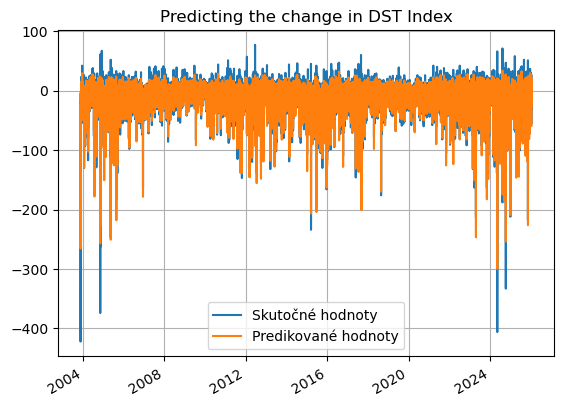

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9223951466710613
MCC=0.7636268963373942
Výkon NN:
MAE: 4.5799, MSE: 49.4933
Perzistentný model:
MAE: 5.2997, MSE: 68.9626
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.58%
MSE Improvement: 28.23%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 47s 53ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 46s 52ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

693/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step 

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step 

  4/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 12:50 861ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step   

  3/896 ━━━━━━━━━━━━━━━━━━━━ 52s 58ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 48s 54ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 47s 54ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

693/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 45s 49ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 18s 81ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

 22/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 31s 51ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 31s 51ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 31s 51ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 31s 51ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 31s 51ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 29s 51ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 29s 51ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 29s 51ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 29s 51ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 29s 51ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 29s 51ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 29s 51ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 29s 51ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 28s 51ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 28s 51ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 28s 51ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 28s 51ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 28s 51ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 28s 51ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step


Shapes LSTM:
train: (229332,) (229332,)
val:   (57315,) (57315,)
test:  (194176,) (194176,)
Global sigma (LSTM errors, scaled): 0.384017
Shapes GP:
X_gp_train: (286647, 24)
y_gp_train: (286647,)
X_test_gp: (194176, 24)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.58**2 * RBF(length_scale=0.351) + WhiteKernel(noise_level=0.615)


Global sigma (LSTM errors): 8.449875
Hybrid prediction with smoothed, inflated interval ready.


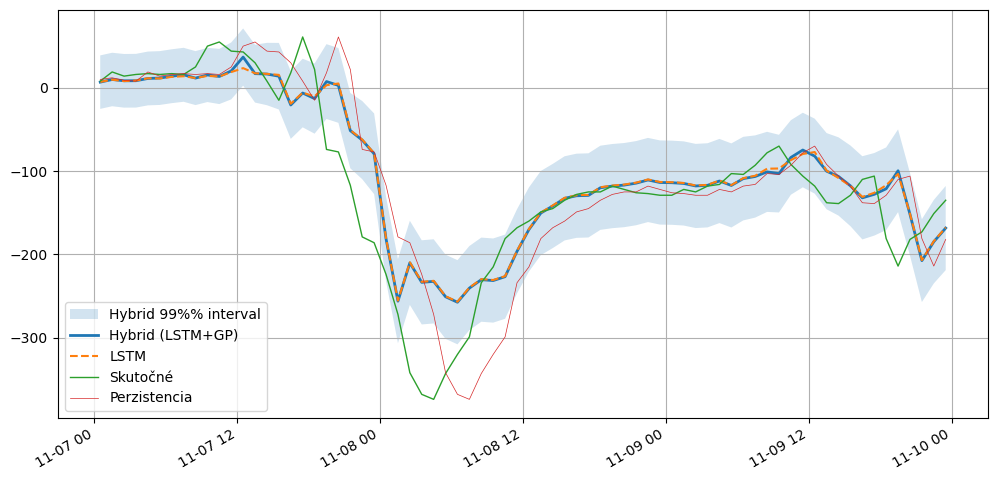

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 53.9553
MAE: 4.8522

--- Klasifikačné metriky (Prah: -19.6 nT) ---
Matthews Correlation Coefficient (MCC): 0.7439

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      145587 |        6453
Skutočná 1 |       10002 |       32129

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.94      0.96      0.95    152040
   Trieda 1 (Búrka)       0.83      0.76      0.80     42131

           accuracy                           0.92    194171
          macro avg       0.88      0.86      0.87    194171
       weighted avg       0.91      0.92      0.91    194171



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9223931483074197
MCC=0.7636253584065461
Výkon NN:
MAE: 4.5799, MSE: 49.4933
Perzistentný model:
MAE: 5.2997, MSE: 68.9626
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.58%
MSE Improvement: 28.23%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9357    0.9673    0.9513    152040
           1     0.8657    0.7603    0.8096     42131

    accuracy                         0.9224    194171
   macro avg     0.9007    0.8638    0.8804    194171
weighted avg     0.9205    0.9224    0.9205    194171


===== LSTM+GP =====
ACC=0.9152551101863821
MCC=0.7439159687564701
Výkon NN:
MAE: 4.8522, MSE: 53.9553
Perzistentný model:
MAE: 5.2997, MSE: 68.9626
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 8.44%
MSE Improvement: 21.76%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9357    0.9576    0.9465    152040
           1     0.8327    0.7626    0.7961     42131

 

/tmp/ipykernel_816948/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_816948/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
26,2026-04-27T05:01:23,LSTM,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.920956,0.761230,"{""text"": "" precision recall f...",4.667329,50.243068,5.299650,68.960383,11.931386,27.142127
27,2026-04-27T05:01:24,LSTM+GP,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.913386,0.736647,"{""text"": "" precision recall f...",4.947679,56.162330,5.299650,68.960383,6.641403,18.558559
28,2026-04-27T06:16:37,LSTM,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.921252,0.763231,"{""text"": "" precision recall f...",4.616763,49.386512,5.299618,68.961051,12.884984,28.384920
29,2026-04-27T06:16:37,LSTM+GP,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.918574,0.756214,"{""text"": "" precision recall f...",4.779049,52.696842,5.299618,68.961051,9.822765,23.584631
30,2026-04-27T06:30:25,LSTM,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.921252,0.763231,"{""text"": "" precision recall f...",4.616763,49.386512,5.299618,68.961051,12.884984,28.384920
31,2026-04-27T06:30:25,LSTM+GP,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.918574,0.756214,"{""text"": "" precision recall f...",4.779049,52.696842,5.299618,68.961051,9.822765,23.584631
32,2026-04-27T07:51:37,LSTM,24.0,3.0,DST+3,OMNI2_all,-20.0,-19.6,0.922393,0.763625,"{""text"": "" precision recall f...",4.579899,49.493291,5.299679,68.962605,13.581577,28.231698
33,2026-04-27T07:51:37,LSTM+GP,24.0,3.0,DST+3,OMNI2_all,-20.0,-19.6,0.915255,0.743916,"{""text"": "" precision recall f...",4.852218,53.955285,5.299679,68.962605,8.443174,21.761533
34,2026-04-27T08:17:11,LSTM,24.0,3.0,DST+3,OMNI2_all,-20.0,-19.6,0.922393,0.763625,"{""text"": "" precision recall f...",4.579899,49.493291,5.299679,68.962605,13.581577,28.231698
35,2026-04-27T08:17:11,LSTM+GP,24.0,3.0,DST+3,OMNI2_all,-20.0,-19.6,0.915255,0.743916,"{""text"": "" precision recall f...",4.852218,53.955285,5.299679,68.962605,8.443174,21.761533
